# World Data League 2021
## Notebook Template

This notebook is one of the mandatory deliverables when you submit your solution (alongside the video pitch). Its structure follows the WDL evaluation criteria and it has dedicated cells where you can add descriptions. Make sure your code is readable as it will be the only technical support the jury will have to evaluate your work.

The notebook must:

*   💻 have all the code that you want the jury to evaluate
*   🧱 follow the predefined structure
*   📄 have markdown descriptions where you find necessary
*   👀 be saved with all the output that you want the jury to see
*   🏃‍♂️ be runnable


## Introduction

### Problem
Traffic collisions are one of the major issues in cities in the XXI century. Traffic collisions often result in injury, disability, death, and property damage as well as financial costs to both society and the individuals involved. Road transport is the most dangerous situation people deal with on a daily basis, but casualty figures from such incidents attract less media attention than other, less frequent types of tragedy"

In 2013, 54 million people worldwide sustained injuries from traffic collisions. This resulted in 1.4 million deaths in 2013, up from 1.1 million deaths in 1990.About 68,000 of these occurred in children less than five years old. Almost all high-income countries have decreasing death rates, while the majority of low-income countries have increasing death rates due to traffic collisions.

### Possible Causes Beforehand

A number of factors contribute to the risk of collisions, including vehicle design, speed of operation, road design, weather, road environment, driving skills, impairment due to alcohol or drugs, and behavior, notably aggressive driving, distracted driving, speeding and street racing. In this report, we will analyze these factors and try to give some reccommendations.

## Development


In [1]:
# required packages, updated versions as of 01/05/2021. If needed, run pip install *package_name* on terminal
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import contextily as ctx
from sklearn.cluster import DBSCAN
pd.options.mode.chained_assignment = None

In [2]:
df = pd.read_csv('Traffic_Collisions.csv')

df['ACCIDENTDATE'] =  pd.to_datetime(df['ACCIDENTDATE'], format='%Y%m%d')

df = df.set_index('ACCIDENTDATE')

df.head()

,OBJECTID,ACCIDENTNUM,LOCATION,ACCIDENT_LOCATION,IMPACT_LOCATION,ENVIRONMENT_CONDITION,LIGHT,COLLISION_TYPE,TRAFFICCOLLISIONSID
ACCIDENTDATE,,,,,,,,,
2013-05-25,1,13-118637,CEDAR ST N @ KING ST E / CEDAR ST S,02-Intersection related,02-Thru lane,01-Clear,01-Daylight,INTERSECTION,NaN
2013-01-24,2,13-019811,GLASGOW ST @ BELMONT AVE W,04-At/near private drive,02-Thru lane,01-Clear,01-Daylight,INTERSECTION,NaN
2012-04-18,3,12-089689,CEDAR ST N @ KING ST E / CEDAR ST S,01-Non intersection,09-Right shoulder,01-Clear,01-Daylight,INTERSECTION,NaN
2012-06-01,4,12-127500,BELMONT AVE W @ ARGYLE ST,03-At intersection,01-Within intersection,02-Rain,01-Daylight,INTERSECTION,NaN
2013-01-15,5,13-012564,STRASBURG RD @ HURON RD,03-At intersection,01-Within intersection,01-Clear,"08-Dark, artificial",INTERSECTION,NaN


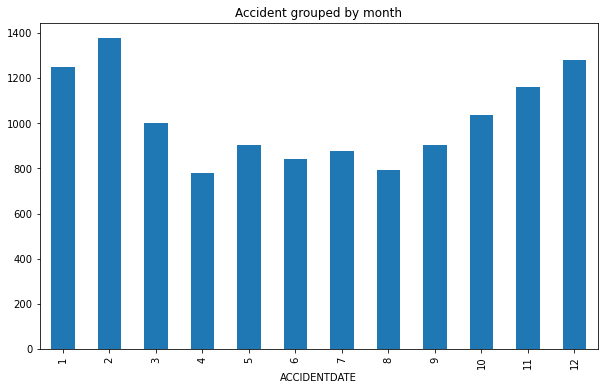

In [3]:
df.groupby(by=df.index.month)['OBJECTID'].count().plot.bar(figsize=(10,6), title="Accident grouped by month")

#### Accidents are more frequent between October and March in this dataset.

This is justified because low temperature, heavy snowfalls, high wind speeds, high traffic volumes, early winter months, occurrence of precipitation in both morning and evening increase the odds of high-crash days to a large extent.

We highly advise reading [this paper of the Waterloo University](https://core.ac.uk/download/pdf/144146842.pdf) to understand how the weather affects conditions in the Southern part of Ontario (Waterloo included).

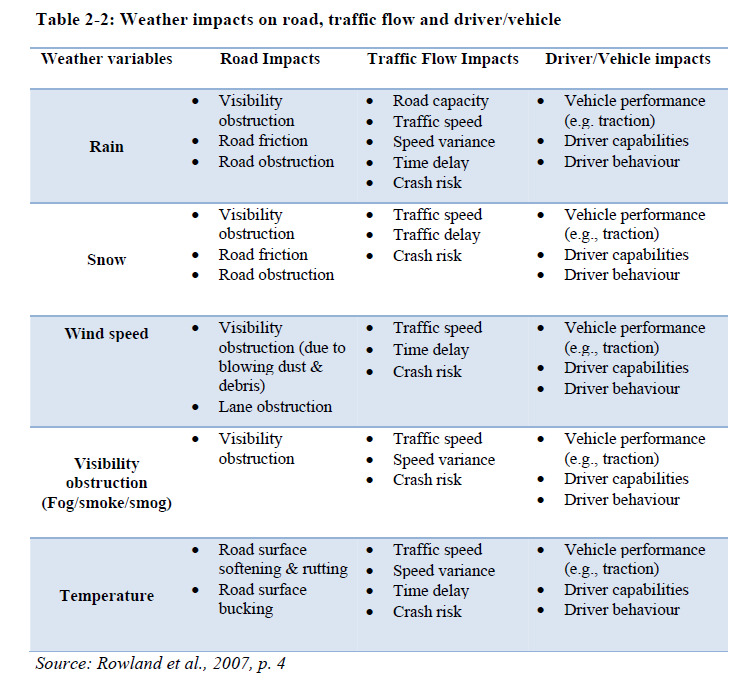

In [4]:
from IPython import display
from base64 import b64decode
base64_data = "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAMCAgICAgMCAgIDAwMDBAYEBAQEBAgGBgUGCQgKCgkICQkKDA8MCgsOCwkJDRENDg8QEBEQCgwSExIQEw8QEBD/2wBDAQMDAwQDBAgEBAgQCwkLEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBD/wAARCAKrAvEDAREAAhEBAxEB/8QAHQABAAICAwEBAAAAAAAAAAAAAAYHBAUBAwgCCf/EAFEQAAEDAwMCAgYGBggFAgUBCQIBAwQABQYHERIIExQhFiIxVpXSFRcjQVelMlNxktHUCTVRVXKkscEYJDNCYSVSJkNiZYE0R4IZOFSRdqG0/8QAGgEBAAMBAQEAAAAAAAAAAAAAAAIDBAEFBv/EAEoRAAEDAgMFBgQEBAUCBAYBBQEAAhEDIQQSMRMUIkFRBTJSYXGRQlOBoSNiotGSsdLhM0NygvAkwQYVJfE0RGNzsrODkxY1wqP/2gAMAwEAAhEDEQA/AP1ToiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIoTqHqTccGmW23WjS7Lszk3FqTIULD9HgMVpnt8iecmyo7Y7q6KCiERLsXl5VU6qGZi4cLRJPIa/UmxNgbBWNp5myCJJAA5mQb9IEQSSLkdVVWi/WtjevFrgZNhGiupiY1NvaWBy+S2LSkaJLVRT7ZtuecgQRTBFMWiH1k861toOdsybCo1zmk6ENDj9CcpAmJMdVmrVdjUq0SCX0nBrgNQSQPqBmBJEwJPJei6pVqqvAuojFc/1lzrQyHjeRW3IdPwjvXF2e3G8LIafTdo2DafcIkIVQtjECRFRFRF3RO4cHE4Z2KbYB2Qg6zf1EW6qWJacLWp0X3ztzgjSAQD0MgmNOR5QT26ra/4zo/mmAYXkmN5DKPUW7pY7ZPgNxjix5a7KgyObwOiioqruDZpsK/fsisON5xW6Ns7K54nQhgJd1uLaxqPOKsVUGFwxxT7tDmtMay4wNYsb+x8ps+uKa0eaZfasExuZk14YuEliIO4xrdCdmS5Li+QtMMNIRuuEvkgiir/APjdarqVNmBYknQC5PP7CSToACTYKbGZzcgDmTYD/wBzAA1JIAkkBV5099UOnXUhFvoYjb8hsd6xeWkK9Y/kcBIVzt7i8uCusoRoiFxLbYlX1VRURU2rVsSaDMSwhzHSJF7jUHzEjy89VS5+SsaDwQ4CbjUHmP8Ak6dRM11K1FtOl+LSMoutov14Jte3GtdhtjtwuM53ZVRpiO0ikZbCSr7BERUiURRVTJUq7PQEny6cyeQA6kgSQNSAr6VPaG5AHU6fufQAlRnp86jNO+pXD5OX6frdI30dNcttztd2ipGn26UH6TL7SESCWyovkRJ7U33RUTW+iW02VgQWvEgi48x6j9iJBBWZtWaj6LgWuYbg6+R9DB9iDBBCs8lURUkFSVE32T2r/wCPOqHEtBIEq4CTC8/6d9Ytk1OynUDBsd0W1JayPTZtFvFqmN2hmQ46RbAywnj1RwiRCMT3RtRH9PcgQjXZ8Dv7bszZY5yO9b8vPmdGhxBiVVmxxYwbiMxEg/CRAIM+ciLWkZsoWbo31a4vrlprlWp+G6bZsxBxOQ/DkQLiNtjzpElgeTzIN+MUWyBNt++TSLumyr57SqtNLDU8UOJtS4i5LZjN0iZsCXW0u2YU5qYt+CiHMsZ0np/eMsnvWMXFjl2k36xQbzMsNwsj01gXjt1wVlZMZSTfg52HHG+SffxMk/8ANTq09k8skGOmn/P+CyrpVNqwPAgHr9j9devUA2WyqtWLAvd9s+N247tfbgzChtm22TrpbJzcNAAU/tIjIRRE81VURKC7msGriAPMnT/n10T4XO5NBJ8gBJP0AUAuev2M2jX6z9O0/HMhbvt+sz98gXJGo6251hndHB5I93hNFTbZWkTzTZdvOuYY706sxtjSAJnmCQARrzPOND5THEO3ZtFzriq4tEciGlxB+g5TqPOLOrqklESiKC2LWHGMg1cybRiFAvIXvFLdCuc2Q9CUITjUrl20ae39Yk4LumyJ7dlLiXHtEbei+u3Rr8hnrlDrdRB9RzEEE8rHY1KdJ2r2l4joHZb9DOg5j6qdVxdSiJREoiURYA32znfHMaC4MldGoozXIqFu4DBGoC4SfcikJIm/t4lt7Fo3izR8MT9Zj+R/4QjuHLPxTHnET7Zh7rPoiURKIlESiJREoiURVVE6iMbe6hn+myZiOTQMiGyFkMa4SG4hW6ZBE0bU2zbkE6i81IeLjQL6hL7OKrLDNOKp1ajbbMgEHW+kRIuL66G95C7iGnDik5wkVCQCOoEkdbaaa6SLq1aiuLXsX+zSb5LxqPcWXLpAjMy5MUS3Nll4nBaMk+5CVpxE/wAC10AuaXjQGPrAMesEH0I6rrhlyzzmPpE/z/5BWwri4lEVGyusLSqPqm7paEHIZBxrwWPS74zEaK2xroMU5RRDVXUf5Cy2ZKYsq0m2ymi7pUaL21qLq+jA2o6TzFMgPIidMw1ifhlSrNdReKcS4lgIGo2k5CdBDo5Ex8UKHw/6RHRKc9A8Pi2fuQ707ASzTmrIDzFyjy5pw25LfbdI2m0eaNFF8WnFRE4ge6IuihQfWqsoEZXuIEHlmYajSSJEOaJsSR8QaASKK9ZlCk+vOZjQ+4vJpua14HMkF45QfhJtPqKqVasO8Xe3WC0Tb7eJQRYFujuS5T578WmmxUjJdvPZBRVqqvWZh6bqtQwAJKspUn16jaVMS4mB6leWXv6SLR5mbZWV061IKHkEi3N2+4pAgeHdYnuuNQ5K7zO4DbpMvbCQI6iNqpNjum+ujh6lWu3DOGVznZb8nFgfBIn4SDaY0MGyoq1G06FTENOZrGl0ibhrsjomO6+GmYmQWy2SPWVUqaURKIlESiJRFVevnULj3Txa7Hfstw/J7rar3dGLP42zhEcCHJeNAZR4XpDTnElVdlbE9uK77bjvyidti6WDFnVCA0nSTytJtrp6SbJXIoYStjDcUmlzgNYHMctYGs36SRaldRVVm3URjeAa04Tolf8AEcm8fqB4hLLd2G4h243GG1cebcXxCPgQjx/+TsvMdlXYuMsK04qrUotsWNzX5t6iJ52vBt0gntZpoUBiSJaXBtuRcYAP87TbzsrVqK4oLg2sOMagZxnOAWW33li46fzo0C5uzIStR3nHmEeBWHN17iIJbLvsqLsu3FRJZU2mrhm4pvdLnN85YYNunQrtYbGsKDtS0O8odMX62/vIMTqoriURKItRaslgXm9XmyQm31csTrMeU8qD2u840LvbFd91IQNsi3RE+0HZV89jRmZtOUkDziJI8pJb6tcOVzpY8MPNod7lwj14Z9COq29EUM1i1Qtei2ml+1Svtiu93tmORVmzY1pFgpPYFU5mIvutAqCO5KnPfZF2RV2Raa1dtAAv0JA9CTA+8D69JItpUjWJDTcAn2En7La4FmVs1EwfH8+sjEpi35HbI11itShEXgafbFwBcQSIUJEJN0QlTf2KtbsZhn4Ku/D1LlhIMaW6LJh67cTTFVmh6rR6R6w4xrPaLzesWgXmIxY77Ox6QNzhLGM5MRztuE2m68m1X2Fvv7UVBJFFKWtLsPSxA7tRocOsEkXHI2V1T8LEVMMe8wgHpcA29/8AvoQTrOofXvGumzTd/VPMccyC72WHKYiy0srcZx6P3j4A4QvvNIoc1AV4qRbmi8dt1SNIbXE0sKNajg0HlJ0nn15HT0m2nRNRj3g90THUSBb35wrIiyAmRWZbSEgPti4KF7URU3Tf/wDvU3sNNxYeVlmpVBWptqN0IB9121BWJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIsa5KiW+UqrsiMn5/wD7q1kx/wD8JV/0u/kVdh71meo/mvE/9EGYl0t3RBJF2zK577L7PUYr2cRbA4Ofln/9j1irX7a7RP8A9X//AFaqv1Q17y2LqBYMw051zyS+EOuLWFypKy3YUE4Bpydtg2runGkAyhIPjVabdJVTZF2Q6z9iM2tbCNqCW1mVCSb54Ih8f5eoADTeJIEwdPazRTo4oizqQYQB8BLXAtkRnktLiHA5TaTBDdvd2ID/AFcdYT0rMrxjb1twi2XSNMtV4etr7LjEADF3usmBqInw3FS4Fy2JCRdq81lV+H7DxFeieNlaRzEnNAINjOkEH3Xo1mNrdq9nUKglr6TgfTaCYOoteRBtrErsyrM86zvAOh7MNUXCXJrtm8KRNcdaRo392zQHSDZERTDtkuyIm5eXtr3RSZR/8SNYwR/09aR0cabS4fR0iOWi+Uq1H1v/AA/Uc6429MA9Wio4NM8+EC/PVbrTPPupbWfW3UibYcmslpmae6jDa3Id3zCfDZj4624gqx9DNxTjvrIBDIZbjguc1RBURHZcPZYBwmGxlW7X5xUi5JuA0AwGFhLSIMug5pmB7XasMr1cJRsWsa5nITqXEi7g4CC0yGAgiDde4szy/F8Axe5Ztmd2jWuy2SOcyZMkEggy2Kea7/2rvsiJ5qqoiea1nq1W0W5neg8ydB9SpUqTq7wxmv8AySfIC5XnLpkvGm8u8ao6z4hkVjzjPM+kt3y44/it7t8+RAgx20ZgwjcF8Y4PKG6krjoCThOIhKIKVaw1+EwLMM0Zg1xc4jQvqGTBMSGgQOZALolwCoe5uJxhrOdAyhrAZnKwaxqC83MjhlrSbSrau2uVrxDT+86k6sYZedOrfZVQEDJJ1q5ySPZARs4kx9pORqIJzMF381Tj51mrvFJjS0gucYDdL8pJsAdSZsASYAV1JhqvLSCGgSTqALzYSZHSJMgNkmFR2jsfSu0aBavZJZuoDHod9yt66ZZmGUYpcmbk1jUiWJqAtuMKoqsdsURE3QjUSNETkm3McxuG7OpYWm8inThueDxPLgXERB4iQAAZDS0aqVCvvXaLsQ9oLnAQ0xLabBlZm1AIEuJMguzRIaV6D0IkwpmjWGSbbqJKzyK5ZoytZNKAgeuw8E/5gxL1hIvaqFuSL5Eqruteh2gCMS6WZPIRGnla+trXtZefgSDQEPza3M9Ta97aXva915b11g5NoR156e6x4ZaXZsDV61v4Xd4jA7I5cWgU4jpr/wCdmtyX9EGXFrH2U2a2K7OJgVW7Rp8JbZx+jZMcy7qtnaRYcNQxztaLgwjm5r9Gj1M/UN9VrNJsEvei3WzqRoFaIcyRiGqFmt+ajIPzbZJl0W5/NfvJ81cEtvvcD7qu7McH4KphyIGHqhzf9LxLAP8AS5rAAdWsfzVfaLC2tRxYua7HMf8A6xqY5Q0ud/qe3lpvupTULWG+dXWOdPWIXJq12u44VJvFq7uWzcbGZeO8Qifiokd5yQrABySKo9s9yVzdERFy4WnUxW9lhh9MNy88oOrskQ8SYOawAte414h1LDUcO54ltRzg7zAFmZtWdczbkkDTXjWjNsvg/V3pfn+tLo5pMwi6zrzasUuMi1xJcmNHU/pb6VZcYfZBsmHOLKNmLqmSEAiKmMe0K1N7sZWwkgU6YePyEmLC4fmzQGutADpBsa8HSfSbhqeIvnqlmk5wPhJgZC0QXOF5loBXn/PcyzDWLo06Vsy1Dyy93C63vUuBbbpMauT8QpLIy5ICTnYME7ooy2ovf9QVTkJIqqq+1Uw1Jv8A4hwrQIDqWaxI4jTYSRGhJcdIsY0ssFGo/wD8mxsmchIE3tex6jTWeU3V6av2K1/8dOlGO2+/3dmFH0tvzTclq9SDmG0KEgqs0jKQpeW/d7ncVR35+3f58VXuPatbQigw24b5wRYQPONPKFvrMDT2ayJ/6h4vf/LuLz6Ry5QYin8b6ndbC6KdDLlcMylTZOYZ25i+QX6fenre8UAJDyA09c2m3HoymIiJSREnUEVVF5Lyr2sTTbX7TwtHKAKlIuInKHPDQALdTfKIzERYErK55w+GxlVhvTeADGbK0wXGCYtpJsJsCQAp/wBUxdQmlPRfkc7KtTHbXklkzSGWOzcYzK5SZMS1yJDQtxJk0wjuzCAHXB5OiXMUbMlU05VTRIq9o9nUyeNz8lThAa7vHu3boGzYXBgAEhaDGyxT2jgyBzRMkHhBhxvBMkXtMXgL2Tpxgl6xO55He7nqFe8iYyV+JMjw7g8TjdsUIrbTosKpLxBwxV1RFBFFJdk9qrB8MaaIGjnkHnBIhp65YME8jHJZaBNVtOsTrTYCORIzEu9XAgH/AEzzXkmFkuWO9SXV1hD+oeYDZLLh0W5WmL6SzkS1yHIfecdiL3d432i7/ZKKImwoiDsleXUe5n/h/E1mnjZVMHmAMxAnUi2hsdDZe06mw9sYCnHDUpnMOR42smNJy8xebzJJVV6b5lq3dsX6QZIa8Z/Huepx3y05HMevr0tZUYDJQ+yfImkeFFUQfUFcHcfWXiiV71Siw9rHCkfhnDteRpLgxrrEXbOji2CRN5Mr5/D1Xnsepip42YgMadYDnvaZB7wEAgOloNoiy3I5/qMHSL1UxE1WzZ2XpnnVyg4zdVySZ9JwozLzXbbWYjiPugnIk2cMkVFVF8ttvGxlZzuycBixZ7nAEi08eW4FjY/yOoC95uHp0e1q+FF2bIOg3hxpudbpdo06EHUzPdO9Qc3xfX3p5tli1CyPJbXqbpy7dMxYut9euDDRx4YG3cGwdIhjkrm4F2kATXfkilute3ihSp47tPDuhtOk3O0x3SXka6wW3DdB8IAsvncM+rU7MwNYztHuLCL8XCJafNskyeK0OJJUBx3XbLZOtuheQYXrfkmU2vOc1vlgus6XNdYiXuGyYceFnV1yNFFrmjYPtC0bnFSUB5blj7Na44inQqN4X0HPINzmaHQ+TJYXFpJYCR1gy0ej2s8Nw1erTs6niKTBGga8guZbvgAjicJuIkQVaeD3/PNeNedZbHdtZsk0/wAi0wyyANhgMSjGEFhBN3Ceg9wGZSSRQt3XhNW+bahttssOy74OljnjMTUe17T0EBrB4OuYAOJBEkQpdpDJinYNtmmiwscLcbpLnT8WUwMp4Y5AyVrNDrDBf/pAupGdNye9RJNki2VbW5IyCakdvvQjIu6yryNyGwUjMW3UMG/NQQNt6rwYczsOsaTocalRsm8awbzcQOLvQImFbjgHdo4YObLTTBgWniZYEaAkxAsSbglT/pRuOZ4xqDc9L9YCyeXm/wBBjdRviZfMvVgyOF30Hx8Zl9wht7qmaCrAA2Gy+oiiicdbSyrQeabchYWBzDctJDoyuN3NdBJkyCBI5nJWJbXY8uDmvz5S2wgFpIc0WBaCIIkXN7rN1wyHK8h6rdO9ErpkF8x7T+7Y1db3KkWe7SLW/crgwqIMdZcY23gFoFR1QAx5cvW3RNq8+g6X4upUMGjTa5g5SXQXkaOgWhwLRMkaLTiZp0MOaVzUqlrrTYMLmgHlmM3FzlgHVeask1o1izDpq0Pzu6ah5TabtN1gZxkLvbbo9AK9WQpLoC4+22otvoQtAm7gEi8VX2GW/oYKnte0MBthBq0i57eWaOmgmxtBGaBFlysBSwvazGd2i47N0ybEDvamMzm63ygmSJXoTpEzTLZ3UH1IaZ3XLLzeMfxDIretlZutxenOQhkMuE60DzxE52+QJsClsPmiIieVVYL8XsalXf3trWZPMtaRlnrE6mSeZWfFtNHtM02k5XU2OjlmIEkDlM3At0AWL1Q3nLLX1g9N1jxzPcjssDKJN5iXmBDvEhqHOYYYEwRyMh9oj3cNEPjy8x8/VHaHZ1MVsbiKTrt2JMdDJAI6H06LZjOHsoVW2cKzADzhxuD10EAyB0gkHAv9s1Bx/XbSzpky7VXMpmEyMdvt8l34LzKt1xvMxt8iZiuTWHRkIkdowXYXUVxETnunklVKrtDiH1LGhRplvQuENfUI0dMSWukAukybqrEB1KnSfS/zq7wRE5W5S9jAeQJtIgkNhsCyg+GdQOY5roRpQOoeqF6g3TLc7nY7bmYIHElZjbW3TZaI5rLrDsERQwMpLRclVtNgcU0Fbwzb1MM14h76BqPbJaGkNnOSNLDNkgh2aIAuK653TfcpinTrBjXd+xPcHIyczcxILcszOsNx/qR12tXQPqxl9pza53S9Ytn8nGLde3pCzpVvtPiI4K54g05vKAOns85yL1kJV8vKQazE0uyNucoxGUVHDh+J45WaTAFv5mVbTaaGNx9Njc2yksabgHpe5Au4A9OllYGPLh2Bf0kuKWoM7lTYruj5txn73fnLhIdcWUT6j4iQZuuKrYm7sRkqDuo7AiIlmFqBje084ADSwm2jWwDP+nQk36klV1GuqdndnOBJLnvPWS5oAPlmJgAcOgaBz9iaWauac62YmGcaW5VGyCxuSHoiS2AcBO60XExUXBEkVF/tTzRUVN0VFWl9J7Gtc4QHCR6H+XMEagggwQoioxz302mSwwfI6/WxBBFiNF4t0KxW1TOp7q8fuGSZVHlW16LHgG1ltzjmguwJJL+hIHuECIqtkXJWUT7NQRKxh7qP/hd9amYdtK9/9BblPrYAu1cOFxIMLXViv29QpvEtyU7crgSLcuInLoDcCQCpP0RlnOU9Mmn/AFAZ9r9lZFaLJkg3b6RnOzWJLayTRqRIR015nGRgiEiQiVDUd0FEGvT7dyYFr3ghodRp3gHK6A7OB1g5SPiNzdYezA7GVRRAJIrWE94ZS0sPkSQ4dItqq+0O1pzad1KaExbLq1kuSY/qVj97evLtzuDyheViI+LM5La4881a1I2VVG2CFFQfWEF5Ak8LQDquLoVGwG0aVQCSS1z3Nnj71wZyyQ2QATAKqxVWaNKvTdJ2z2ExlBAi2XSG6B0AuImADfcdL+ntr9Iusixndb+ot5FPhNomT3DdGnGHHEMj7+6vbiKK8qq7sijz4qqL4FQn/wDtSeYdV/REfQycw0f8eay9dztp/wCKATps6B6d8HNp0jh+X8GVU1h92yHAegrptyrDM7y+yz7tqUxAnlDye4NMuxXJckHI6so92kaUY7f2aCgovMkRFcNS+qrgf+fYGgbtdTbIN54GG863JAnQcIgABePhwP8AyftOpEOYCWkWIObURGuYz1MEyQCPSMO+59rl1M61ac3DWTJtObtp29Zn8OCFJNqKNvUe5KkvRO4DM8XdkBVfQxbEh4cV338nswg4RuOddzazg9puMggNbHw5hJzAZpvMQFrx+YYgYMCGvpSwjUvOrp5hpgZdDxA3uvRnUhZWcj6edRLS7JkCL+L3EhcjzHYpKQxzIftGiEkFVFOSb8SFVEkUVVF8rtoRg6jul/Y8xz9DYr0uw3RjqEmZc0E+tiR0PQiCDcEEArwDdYUS3f0dfTS+3NmOlN1Ax2S6su4PSUEu++Ki33TJGm0QE2bDiA+aoKKq7/SVif8A+4ez2+TfW9IEydTc2nQQBYAD5/Amewu1HnUtqelqwAgaCwvGplxkkk2drFqjqW7kfVBlF0zvIMZm6OW23HgcCDcn4kXd5gjSS9HA0an951BBEfBwB/RFBXda8ijUfT7PZi2DNVdiDTINxlDmANy8szSXSOI6ggAL1KjRUx25kRTFEvkWJdDiTOvAQBEx1BvOw1uu2qeN5f0+683q65xHtOcsRcYzTEbdkdyjRWrlPhKMd1thh4BaMXSMVJNtiEC/TTkm9+Fps7XxPZtJ0sqtqCmSe65l5B5AtHLQBzljoYh9Xsmljnd+kWOdAHEwuEktOsEzl1OYNNhC23SJaM3PUHPdE9T80z29XbSnMVu7V3k5TdiC4QJUYVgsO85Ci62iKZKyu4btopCqkSlHDPFbA0sWBDm7Sk6Yu4OEujScsRI4ZBbEqeMZlxb6AkNqCnUbfui8tBBmA+0nvjMDOUBtsdXudRcPx7CrW5qNdMafybLYNnbg2xohkX4XuQFBSUDzLkEV5ISym3ENvgmyEqoK5qDN4x1PDi8h5yzl0HeLhcBhgxBzd2CtDiKWDrVjbKBxQDF5gNNiXAEcoEnM2JXki1aq6n3Xos6mn5uqWU+O04zS4W/GbrGySUs6HHZea7bSTxIX5AJyJN3SJSRfP7kSjHVHHsrAYtp43loJFswzBtwLaH3vqJV+HosZ2ricJHAGExJMHK82JuILRbyjQkKztGc+z+19Y+P4KOe5JfLLkGidvyWdAul2emNO3RCEfENi4SiwRD5EjSAJb7qir516+K/DHarabQdjU4Oot3Z1gnloOUBeRhHGpguzKtR0Go2HHqIJk9SI1Mutcm68/wCoea3rUDo1tetGqmfXgssuerkZm8W+beHPBW5uLPMRjNwjJWoyMtoJKrYia77uEVZsO2nh8d2OWOzNcWvLjzJBl08gNIENHSbrT2mH1sN2vQaO61zGtEWHAQ23eJuZMuPIwv0b6hc4yXDOnzOtQdOBCdebXjcu42kmhR8ScRlSB0UTyNET10TzRdvvrzu1HVMNSI7ploPUAuAcb6QJ9Fs7NFPEVWEcQIkDk6xIH+4wLdbLw2N1tEPVjoezO/6k3K7zcmiXC53SXe78cxCnzILIqoK8ZdhDeJWhZb4toooIAi77/RMosw/bmLwlAcLaJDeZIkkX1cSOKSSY0tZYA91bsE4iobmuwnpYmbaANAi0DUuk3VlaU2TUHU3qP6l9OI+uedWe141kWOTLMIXyVK8Aqr4l9ppHXV4sucTaJpFRvieyiqAIp5/ZwA7LoYp3EW16gM3zMbAyuOpBBsTJBEi5Mzx7v+tfQbYPo8rQ5zRDgORaTNtdLBazTOxaiawX/q40ntusGfQJljyFkMRlN5bcUetD/ZfNsGnO8piyTmyE2i8VHy29UdvOYKr/APw/SxNOTUbUq+rg3KA09bSBMmTm1ury+nT7edRq/wCE6lSJHQukuc0aAze0W4e7ZTTpvzzJs86c4Gs7gZg7l+nOJXOyybZNvlyNq432KjovLJZceUJLnJoVQ3BMhV8hRdwRB29t120MPV7QwcZarGuZzDWxJIB0uYmA45DJIcq+y8MauLp9m4t16dUhxnWTAkiJ4TJaZaCRlAAvG+jy7a86tYpjWrV9z21ysUyuwXSLlI+ndxl3GVcl37bsWJ4Zpq0uM8DFW4zyJwJD8yFCXvaVJuDwlamZg0muYQSSHADM4vsSHTcRDXABoAmacLWqV8VTqtAzNqkOBEDLfK0MuJFiCbubJdPLK6BvTvOdA8F1rzrXLL5vozccjK5MXC6PS2rlD5ONgEknDVSVkhR0DLkSJ6qbJV+MezB0mYlzZzUBIj4swdmH5oaW9TmN+Rvq0HVcdXwVAwG1+HrlDYyzOhLgTMjhBjMcy2/U5p/qVO6VJGqmB5RmFhzWzvO5vLh2a/Tbb4+M64j0iDIGK4KuqEZBbBf0hVlEEk5FvjrvHZGJoPqcTKRa2oNWm/G4TaDUJdPhJmRCuwoHaTKzKRANWTTdlvYZadjeSxrQQdXGYWt6hNYslxXpSyDqp0mu2RRZWatWRuJ4y6zHo9rt7qtNuSGozxOMx3C5H9qDSb7gaoS7qV2Mo7njqOAqkZX1uIk5eG5AzQSxrgATF25iAJAjLgqjsXhXYhreOnSgCJ4geIkSM5aSRxEzk72UmcTUCzat2PpG19czjI7DPxK64ctxxSNFzKfk8yI25FJHldnzY7LrrTpiLje/LipGKLxQUTN2wAzCtpVRFVtVoNgBlzsytPVzTNyJIImTdX9mvFaq2tSPC6k6b6uDXcQGgkEAgWBEiJKjfT/l2V2LXzQXTKJnF+dxnL9C4ky5Wt26OlH8S2ySA6w2hIMdxBFB5MoCqg7ruvnXqdpzW7R7YovuGQ4HmCXBpIOokGYECbgBedSdsOz+zq7BDnVarT0LQ0uAI0MO5kEnQkqDYp1Cau4Z0RZHlI57lM58NXXsauGQTbi9cJtmsivtiZA9IIzHYdgElX1Vd3ReWy1jo5cS3shlezazRtCOHNxPsSIImBJBBDRAiy1OY+jie19gJdRnZt73wsFgdYkmDaRJm6sbrmwiRgnRNqgwzqzd8xsN3u1juVhjXaa5OkWqI5Mj/ZeMedcfkgZiZiTheSLxTyHerKBcztHs+lVHG2uATAFoJDSBaWi06nUrXgix7a1ameF1IWmbggFw6ZrSNARbWB2aj53r5qL1OZHoTp7kcGwv2HBrddcSKZl82xM+LcBCcuBNRYryXMQJUBYz2zPECXZVVVGqjtKj8XibZqdUC9wGakFuhD9C+czZblg3WIClTw2BomctSkSYsS+YaM2oLQMwaBDr5pAAXuXGnLw7jtrdyB6C7dDhMFNcgGpxjfUE7itESIqtqW6iqoi7beVWYjZis/YghsmJ1ibT59VHC7XYM25BfAkjQnmR5LZVSr0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKItdkOOY9l1ll43ldht16tM8O1KgXCKEmNIDffi424iiaboi7Ki+yovY2pAeJi/1Gh+ik17mGWmOXvY+4stDg+j2kmmMiVL020txDE35wC3KdsdkjQDfAVVRE1ZAVJEVVVEXfberM7suSbaxynqq8jS4Pi4tPr/7D2XXI0V0blty2ZWkuGPNz7il4lg5YYpJInp5pKcRW/XeT9Yu5f+aiz8PIGWyd2PhnWOk+Sm9xqZi8zmEGeYGgPUDoVl3/AEs0xyxxp3KdOcXvJsTAuLRXC0R5CtyxAQF8VMF2dQBEUNPWRBRN9kSusJY4PbYiYPMSZMepuepuuG7Sw6GJHIxpPpyXzlulOl2fTrbc8702xXI5lmVVt0i7WePMdhqqoX2JOgSt+YivqqnmKL9yUYTTqbZlnWuNbXF9bEmOii9ralPYvEtvY6XsbaXFiu97TbTqRmLWokjAccdyplrsNX07UwVwBrz9QZKj3EHzXyQtvOuU/wALNs7ZtYtPr10UnjahoffLpN49OiycuwrDdQLK5jeeYlZcktLpg4cC7wGpkYjFdxJWnRIVVF80XbyqLmNcQSLjTy5W+ikHOaCAddf5/wA1rMG0j0o0wclu6a6Y4niZ3BAGWVjssaAshA34I4rIDz48i23323Xb21btH5NnJyzMcp6x1VeVubNF1mZrp1p9qVbWbNqNguPZVAjvJIai3u2MTmW3URRQxB4SFC2Ik3RN9lX+2qixpcHEXHP1Vge5rS0Gx18/VYeM6Q6T4VZLjjWG6YYlYbReEVLjb7ZZI0WNMRR4r3mmwQXNx9X1kXy8qlU/Fp7KpdvQ3Ht9B7KLPw6m1ZZ3Ua2mL+Un3KkdrtVssdti2ay22Lb4EJoWI0WKyLTLDQpsIAAogiKIiIiImyJUnvdVcXvMk8zqosY2m0MYIA5BfM6z2i6PwpVztUOW9bX/ABUJx9gXCjPcCDuNqSKoHwMx5DsuxEnsVaiDlOYawR9DqPQxdTk5S3kYkehkexuPNcrabWV0G+FbYq3II5RRmKyPfFgiQlbRzbkgKQiqjvtuiL91BwzHOJ84mJ6xJjpJ6lRIDiCeUx5TEx6wJ6wOi1GYadafahNQ2M/wTHsmbt76SYYXi1sTRjvJ7HG0dEuBf/Umy1xoDXiq2zhoeY+q645mGm67TqOR9Quy6YBgl7u9uyC9YVYbhdLQ0bFvmyray7IhtGmxgy4QqTYkiIioKoi7edIEuPiEO8x0PUeRT4Wt5NMjyOkjofNa4NHtI28RTT9vS3EAxcX0lJZBscZICPIfNHPD8O3z5+ty477+ftqZe5zmPJuyMp5tjSOkcoQ3zz8fe/NOs9fqunIdEtGMuviZPlmkWF3q8JG8GlwuNgiSZPh+BB2u642p8OJEPHfbYlTbZVqAaAXEDva+fr10GvRSa5zcsHuxHlBkR0g3Ec7rm26KaNWXFJ+CWfSTDIONXRxXp1mjWGK1BlOKiIpOsC2jZlsIpuQquwp/ZUqhNZrWVLhugN4vNul725qLeBxc2xIg+Y6HyX1dtGNHr9itvwW+6T4bccbtJo5As8uxRXoMQ0FRQmmCBW21RCJNxFPIlT76VCarxUqXcLSbmPX6D2Rn4bSxlgbkDn6qTWezWjHrVEsVgtUO2W23shGiQ4bAssR2QTYW22wRBAURERBRERESpVKj6ri+oSSdSbkqLWtYIaIURe0H0OkXS8Xx/RnBXLlkTTrN4mHjsNX7i26SE6EhxW+TwmqIpIaqiqiKu9VNY1lPYtENkGOUgyDGkg3HQ3Vrnue8VHGXCwPOIyxP+m3pbRYjHTh08RVtqxtBtOmVszqv27t4tBHwTimhqbOzX2ZckQtx2XdEX21MEh2YaxH0vb0ubeZ6lV5RlLYsTJ8zAE+sACegA5BV5r70rWC/6B53ph09ab6dYhe84iswpUkIIWlgwF1D5unEjmbiinPiKjtuS+aee+TF0qmIp06DTDGvDo5WvYaSYA5W9IWuhXFOs7EVLuLXCeZLgQZOvOeckRzkTXQDSKLptg9nTIcCwu05sFpiWm93OwAjy3EYzaNNm5KOOw87uIIXEx9RVUUUkTkvr4/EMxNao+lIY9xcW8g51z5HpMAnmBovKwWHdhaFOi85jTAa084H8vQGFIGdFdG47cJmPpLhjTdtuBXaEIWGKKRpxLuUltEb9R5VVVVxNiXf21jY40y0sMFogRyB1A6DyFlqqNFUOFQTmIJm8kaE9SORK2Ny0509vGUwc5u+B47OyS2CoQrxJtbDs6KPn5NPkKuAnmvkJJ7a5T/CLnU7F1jFpHQ9V1/4jQx9wNAdAshcJwxclfzNcRsq5BKhpb37ssBrxjsXffsE9x5k3v58FXj/AOKN4Gua2wcZPmRoT1I80PE5rjq3TynWOk+S5suG4hjdxud4x3FLPa596dSRcpUKC0w9NdRERDeMBQnCRERNyVV2SutJazZts0XjlJ1Mea4WguzkXgCecDQeg5BdeY4Hg2odqSxZ/hliya2o4LqQ7xbmZrHNPYXbdEh3T7l23qOUZg+LjQ8x6dFMOcAWg2OvmtdlekGkueQbba850uxHIodnRRt0e7WSNLahoqIioyDoEje6CKeqieQp/ZUsxFbeJ4/Fz66663XGksp7Ftm9OVpi2nM+5XOKaRaT4Jep2SYPphiWPXe5oQzp9qssaJJlIR8yR11oBI9y9ZeSruvn7a61xYzZNMNtblaYt5SY6SVWabHPFQi4mDzE6384E+iZRpHpRnF9g5RmumOJ5BebWgJBuN0ssaXKioJ8xRp1wFMNjVSTiqbKu/tqNP8ABqbWnZ3UWNtL62VlQmrT2L7tvY3F9baXgT1hbDMcDwbUO1JYs/wyxZNbUcF1Id4tzM1jmnsLtuiQ7p9y7b1zKMwfFxoeY9Oi6HOALQbHXzXxd9PcByCPaYl+wfH7kxYXgkWpqXbGXggOinETYQhVGiRPJFDZUTyqed21208d787631vz6qvI3Z7GOG1uVtLaW5L4tWm+ndiiXiBZMCxy3xsheck3dmLa2Gm7i6abG5IERRHiJPaR7qv31BzQ+kKDhLBo3kPQaKzO7abaePrztpfWy+sc07wDDmGo2IYNj1jajx0iMhbrYxGFthFIkaFGxREDczXinluRf2rXajnVGlpMz1uNALjnYAegAUGNawgtEQZ+p1Prda/S7S/G9KLDLsuN2+3xEuNweukwbfAagxzku8UIm2GkQGx2AU2TdV25EpEpEsy/8NlEd1ggekl38yYAgAWFguFrTWqVou8yfoAPqYAknUyfJZs/TXTm63C73a6YBjcydkEL6Mu8l+1MOO3CHtt4eQZCqutbKqcDVR/8VVlbkNOOEkEjkSNCRzI5HVWZ3Zmvm7QQDzAOoHQHmFxiOmem+n9mlY5gen2NY3aZzhOyoFotLEOO+ZCgERttAIkqiKCqqiqqIiexKnVJrMFKpdotBuIOojzUWfhv2jLO687aX8lh27RnR+zuWV606UYdCcxsnSsxRrFFbW2k5/1FjKIJ2VL/ALuG2/310vcSXE3Iynzb4T5eWi5lGUsixOaOWbr6+eqwbZ0+aCWVu6s2bRDAIDd+jlEuoRcahNJPYIkImn0FtO6CkiKoluiqiLUMo2exjgkGOUt7pjSRy6clJzi+rt3GX34ufF3r68XPrzWKfTP04HaWbCfT9psVsjyHJbMJcUgKw2+YiJui32uKGQtgikibqgCir5JU87szXzdtgeYEzA6XvbndASAWjQxPnExPpJjpJ6qSXTTPTe93y1ZPetPsan3mxh27XcZVpYdkwR224sOkCm0m33CqUa5zHuqtMOdqeZ9TzUC1ppikRwjQch6DRbLJcXxrM7JKxnMMdtl9s84UGVb7lEblRn0QkJENpxFEkQkRfNF80Rarexr4zCYv9eqtZUfTMsMai3QiCPqLHyUPd6dOnx+wRsUf0J08cskKS5MjW08YgrFZkGiCboNK1wEyQRRSRN1RE3XyqeY521Ju0QDzAmYB5Cb2531VbQGBwbbMQT5kCAT1IFgTyst7etMNNcju9pyDIdPMZul0sKIlqnTbTHfkQETbbsOGCk17E/QVPYlGuLKhrNMOOp5n1OvMrhY11IUSOAaDkI8tOS3dwtNru4MN3W2xZoxpDcpgZDIuI0+2vIHB5IvExXzQk80X2VwWcHjUTB6SCD7gkHqCRoV1wDmljrgxb0II9iAR5gFcx7Va4k6Xc4ltiszJ/DxchtkRdkcE4h3CRNz4p5Juq7J5JQcIyjSZ+pABPrAAnoB0XTc5jrEfQEmPSSTHUnqsDJsLw7NWIkbMsTs1+ZgSgnRG7nAalDHkh+g82jgqgODuuxJsqfctG8DxVbZwmDzE2MHz5ruY5SybHUcj69Vo5+iWjN0hXa23PSPC5kO/ygnXaO/YIjjdwkj5i8+JNqjrifcR7qn9tRytytZFmkkDkCdSOhPMjVMxzF83IAJ6gaA+QiwXTY9BtDcZv8PK8b0YwW03u3No1DuUHHYbEqMCN9tBbdBtDBEb9RERUTj5ezyq1tR7C4tJGbXz9eug9lFwD2hrrgaeV5t0uSfUytm1pZpjHvM7I2NOcXbu10fCTOnhaI6SJTwCog464gcjIRIkQiVVRCVE9tRYTTaGMsAZAGgJ1Pqeq6/8QkvuSIv0kGPSQDHUBSYwBwCbcBCAkUSFU3RUX7lSokBwg6LoJBkKN49phpriTgO4pp5jNlNt56QBW+0x4yi66qK6aK2CbEaiKkvtJRTffapNcWNDGmABAHle3pc28z1US0OcXEXJk+Z6nzsLrox7SHSfEsnnZtiul+JWbIrn3fG3e32SNGmyu4aG53X2wQz5GiEXJV3VEVd1pTJpU9iyzLWFhbS2luXRdqHauzvuepuV94rpPpZgl4uGQ4RpriuPXW77/SE61WaNEkS9y5r3XGgEnNyVS9ZV8/P21xn4VPYss21hYWsLaWBMdJXHgVKm1fd17nW8E31uQJ6wFvbTZLLYYzkOxWiFbo70h6U41EjgyBvumrjriiKIimZkREXtIiVV3Va6SS0NOgEDyA0A8h0UnEucXuuTqeZtH8gB6LQWzSTSmyvXyRZtMsTgO5OBt3s41ljNFdBPfmMlRBFfReRboe+/Jf7agWNNHdyODXLy9tFLaP2wxEnONHcxGkHWy5xfSXSrB7LcMbwvTPFLBaLtv4+Ba7NGixpe48V7rTYILm4+qvJF8vL2VbtHkNE2aZHkbGR0MgGfIKtoDH7RtndedtL/AFPupM/GjyY7kOTHbdYdBW3GjBCAwVNlFUXyVFTy2qp7G1WlrxIOs81JhNMgstGkclhjjuPhYRxULFbhsoRkhDbUigkUY6DxRlGtuCAgoicdttvLapV/+pJNbinWbz6zqo0QMOAKPDGkWj0hR5rRjR5nDHdOGdJ8NbxJ9xHnbCNiipbnHENDQijIHaUuSIW6jvuiL7a7UJq5dpfLpN49Omq6z8MkstOsc/XqsCD08aAWu4Q7vbNDNPok63MrHhymMZhNux2tiTg2YtooDsZpsiomxL/atcPFmB+IQfMRlg9RAAg8raLjWhsBoiDI8jOaR0ObinrfVbHGtHdIsMstyxzD9LMQsVpvKbXKBbbHFixpvq8ftm2wQXPJVT1kXyXalT8Wnsql26wbiTHL6D2CMAp1NqyzrXGtpi+tpMepWPJ0K0RmYlGwGZo5g7+MQ5Hi41lcx6IUBl/Yk7oR1b7YnsResg7+sv8AatdqE1XB1S5AgE3gdB0CkwmkHBlg7WLTzv1ve6y7npDpPehsQ3jTDEp6YuIBY0k2SM6lrENuCReQL2EHiOyBttxTb2VLaP2xxMnaHV3xGdb63UMrRS2EcHh5e2ilvsqCklESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLomzoVtjHNuMxiLHb25vPuIADuqIm5L5Juqon/5qTWOecrRJUXODBLjAWr9OMK98LJ8Qa+art0xHgPsVXvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3CenGFe+Fk+INfNTdMR4D7FN4o+Me4T04wr3wsnxBr5qbpiPAfYpvFHxj3C3dZ1clESiJREoiURKIuibBhXKMcK4w2JUdzbmy+2hgWyoqbivkuyoi//AIqTXuYczTBUXNDxDhIWr9B8K9z7J8Pa+Wrt7xHjPuVXu9HwD2Co6267aX3TW/Jen2P085CGWY1a3byoP26ytMXGIPk2cQimIrqOqoiKqIoKrs6rexbRoYzE4jD1MQxzopkBwkyCeUT0vMxGhJLQZ1sJQoV6VB4b+JcOjhAvJNpsREQTMkAtBI6tIOoDSTWrHM8yHF9Ar7BLT2S9Audvu1us0aW7MaEldjth4tRAhQf0niabXfyNdi4zdiq4wdPGtqFzX6QTMWkx9dO9+W4ngwlPezgnMAeNZA56fxRYi3UgK5Mbx7E7/YYF7l6YxbI9NYB87dcYETxMZSTfg72Scb5J9/EyT/zUqtevSeWbUmOhMf8AP+CQqaVOjVYHhgAPUD6H669eoBstl6D4V7n2T4e18tQ3vEeM+5Vm70fAPYKPSndI4uax9OvoGwPZHJtb95C3twWFdSI0422rhIqJxRTdER323VC2/RXbgxeJcyo9jnEU4mDzdOUXOpyn2vFlI4WizIXtAzGBboJJ0mBzjqFFdBNQdIuoXFLllmK6ZlaGrRepdhlxLxa4QPhKjKKOonYcdBR3LZFQ/PZf/G9m8VzQo4ltQltVuZtzpJF59PZU7OhvFbDFgzUnZTYRMA291ZfoPhXufZPh7Xy1De8R4z7lWbvR8A9gnoPhXufZPh7Xy03vEeM+5Td6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9gnoPhXufZPh7Xy03vEeM+5Td6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9go5m7WFYTDtsz6pJF++krpFtfaslhalORu+fHxDyeXBhv8AScPz4p57LXaeKxFSs2jtCM03JMCATc8piB1JAR2HotpPq5AcomIEm4EAczefQEqR+g+Fe59k+HtfLXN7xHjPuU3ej4B7BVlgmo2kOfavZ7orA0xOBftPEhncnptrhJFkBKBTZNg23DIkUU3VDEFTdPLfdE7QxOIxGFOKa8gBxZBJmR9o+qliMJSw1VlJ7BxtzgwIiQPWZtpyPKCV01E0js+vtl6d52l7g33ILK/fINxS1QltxsMqqOAp9zuo4ip7Fa2808/btHDYuviXVmNqEGkA4yTcEgAj6nnGh8prxFGjhm0XOYCKri0QBYhpcZ+g5TqPOLN9B8K9z7J8Pa+Wu73iPGfcqW70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYKsOofUTS3pt08f1QyzSCVe7FBdbbnuWO2W43IaOGIAZhIeZUhUzEfs+aoq7qiJuqVO7QrsqMpl7uIwDNp5DXnflFrkWm+l2eyuHFjAS0TEDQAknpaPXoDeI7Z9etH3M2xDAs50NvWB3HP2lcxh2/Wq1OxroSAhq2DsCTJFs+KivF3gq8kRN1XatbamJdWqYbaHaMBJbJmBMkcjEGYKxltDd2YsMGzcQA6BEujKCNRmm1uvRXj6D4V7n2T4e18tU73iPGfcq3d6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9golqvM0/wBJdPL7qRcdLm71Bx2Gc+ZEtNuhLK8O2nJ1wUfNoF4AhEqc0JUFUFCXZFpr9o1cO0Pe90SBqbTpz6wLTr0kq/D9nsxVQUqbBmOgjU9NNfWF8YhctPM80ptGrOJ6XBPiX2ys3q32v6OgtTngdaRwGftHBZF1UVE9Z1ARfae3nWztCpi+zqr6NR5JaYME+4mNNevQTZZcNSw+JGYNAFxcdCRyB6KF9OmsmlHUtCv10xLQ+72KDjtxds8qTf7Va2kKc1t3WABiQ85yBCFVUhQfPyJVRUSIrYh2Gp4oVDlqCW3N23E+QkReD5Quvo0aeIfhXMGZlnWEA9POfKRbXSbk9B8K9z7J8Pa+Wq97xHjPuVLd6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9gnoPhXufZPh7Xy03vEeM+5Td6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9gtFnCaR6cYnc83zKy49bbPaGCkSpDsFlEQU9gonH1iJdhEU81VURPNaDF4hz202vJc4hoEm5cYAF+ZU6eDpVDAaOpJAgAak9AOa3TWF4S62Do4fZdjFCTe3s+xf/3a67E4hpILz7lU06VCqwPDBBE6BffoPhXufZPh7Xy1ze8R4z7lT3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BYl3xnBbNaZt3fwm1PNwY7kk22bayThiAqSiKKiIpLtsibp51XVx2IpML8zjHIEyfIX1VlLB0arwzK0SYkgQPXyXn+T1J4PD1LtGj0ro/z5rML7aTvkC1nBxlCdhAqoTin9J9sFRRJOBkh+X6NWMxdeo+qxlQk0gC65sCYHrc8pVT6FCnTpVXMAbVJa22pDcxEaiBe8dNVeeIWrCcuxm3ZImm0a0LPZR0rfc7XGCXFL2E08IKYoYqioqCRJunkq1OpiK7CIqkggEEEwQQCNYOh6LjaFJ0zTAgkaDkSPa1jzC3HoPhXufZPh7Xy1De8R4z7lS3ej4B7BVXq9qhpBpDfbRiL2k8/LMlvcSXcYljxmwxpU04cZEV99AcJtCQeQogApOkq7ABbLtGjjMRXrmgx7uENLjJhoc7KCbzGbWAYFzAErtTDUKVMVHNbxEhogS4hpcQOU5RNyAdAZICjcrqF0edvmQ2XE+n3MswHFjkxLnLx7Eo0tpm4sMI+5AUO4LqP8SEU3bRsjXgjikiokqeKxFRm0DzlJIBkw6HhhIPQEzeCWguAIEocLSa5tNzAHENJBEFoe0ubmtzA5TBIBgkK77dieFXG3xbh6C2yL4pkHuxJtjQOtchReBjt6pJvsqfcqLU6mIxFN5ZtCYMSCYPp5KqlSo1WNfs4kTBABHkfNafPomIYJiNyy5rSZvIktbKyHbfaYMBJRtD5mQeJcZaXiO5KiuIqoKoKEuyLlxHaVXDUzVqPdlGpk2AEzrPtJ8lpoYGniHimxrZOltT00/nA81TmnXUZgGqOEWbU7FOk3OXsPvb4ss3k7bj3baHvqwbrjI3ApAtgaFyVGlVBFV2VK3Pdi6NVlKq8tL8sXPxAFukxMjXmbwsgbh3sqVGMByTNhPCJMTEqbaI6j6Qa7rmDeN6YnaX8IyGRjN0Yu9qhAay2UTmrasuOiQefkqqi/+Kqp4nEVMLSxgqHLUBIuZEWM/wBiVor4Slh8U/CPYMzQDoIIdMEc7gTcDUKzvQfCvc+yfD2vlqO94jxn3Kju9HwD2Ceg+Fe59k+HtfLTe8R4z7lN3o+AewUR1Wl4LpRgN41ClaSLkMOxRjmzIllt0EpQx2xUnXRGQ40BIAopKKHyVE9USXyqiv2lVwzQ973ZeZnTzN9Jtadb2ki/D9nsxTxSpsGY6CBc9Byn1j3gLVaD5hptr/pzb9UMf0hfsNmu+525L3brcL0tlPLvCMZ55BBS5Dsaie4qvHZUVd1d+Jw+UPqGSAYk2BEieVwQbE63gyFhojDYiTTYIBImBqCQR1sR6dJVh+g+Fe59k+HtfLVG94jxn3Kv3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYLQ5IukWJ3Kw2a+WXHo9wyaf9HWqKsFjuyn0AnCQB23VBACIl+5E/tVEUzFYipU2TXuJgnU2DRJJ6DQepA5o7DUWUzVcwQCBoNXEAD1vMdATyW+9B8K9z7J8Pa+Wm94jxn3KbvR8A9gnoPhXufZPh7Xy03vEeM+5Td6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9gnoPhXufZPh7Xy03vEeM+5Td6PgHsFROda76d4NrTb9Bi6ZcpvWTXqG9cLQVtgWFI1wjNCquuNuPzmlBB2JFF0QJVHyRUVFWFDG4jEmqGOdNMZnCdATlB1vJ0Ak9QLpXw9DDtpue0RUOVttXAZiNLQOZt0JUx0g1B0L1qG9xMWxaFDveLy0gX+xXWztRrjapCpugPN7KiouxbGBG2XFeJFtV+2rmk3EU6pcx0gOBMSDBF4II6EA+SgaNJlU0KlMNcADBA0OhBEgjzBUqzW3YVheJXbLPquS+/RMRyV9GWWyNSp8vim/bYZ2TuOL7EHdN1qh2NxDY43GSBqeZAk+QmSeQkq6ng6NR2XK0a6gchP30HmtlbsTwq42+LcPQW2RfFMg92JNsaB1rkKLwMdvVJN9lT7lRauqYjEU3lm0JgxIJg+nkqKVKjVY1+ziRMEAEeR81k+g+Fe59k+HtfLUN7xHjPuVZu9HwD2Ceg+Fe59k+HtfLTe8R4z7lN3o+AewUI1HvWA6eMPdrR+RlE5m2SbutusVqhOSVjMG0Lioj7jQKX2yKI8uRIB8UVURFpq9o1qTH1HPdlZGYzpmmOc/C42FgDKupYGjWc1gDQXEgAjWBJi3WBPIubNjIh2lutWlOsOh0vXvC9Dbm7ZWFfWPAkQ7K3Oltsrs6YJ4tWW0FUPcXnWy+zLYV3HlpxlbFYNjHOe45gDAJJAOnrPRsnlGaQqMLQoYqq6k1oBBi4i/TSelyA24MxJFo4nZcSyjG7dkMvStqwO3BgXytl1tsQZkXl7AdRknAQttt0Qy232Xz3RO1a+IpPybUn0Jj0+mlrdCRdV0adGszPs49QOuv11HODcA2UKsWomkd915yHp5DS84mQ47Z2L65MkWuD4GVEdIQEmTBwnOXIlRUNsF9Vfu2VYYfFYjE0atZtQxTcGEEmZIJEcogTrzHOQJYilQw9alQcwE1GlwIAiGkAzzmT05ekym8NYVZ8yx/DvqkkTvp9uW59Kw7C07brf2AEuMt7y7Suctm02XkqKnltXKeLxFR7mZyMrc0kmDcCB1deY6AlTqYejTpipkBlwbAAkWJk/ltBPUgc1urlieGW+3Sp4YJa5ZRmTeRhi3x+46oiq8A58R5LtsnIkTdfNUTzqmv2hXw9J1UvcQ0E2N7fUKylg6NV7aeVokxcWv9FA9Ac70f6jNMoGquFaeBb7VcH5MduPdrVFakgbDpNHyFonA25Cu2xL5f2VsrVMTRDCahOZocIJ0Oip2FIValF1MBzHZTYagA/91YvoPhXufZPh7Xy1RveI8Z9ypbvR8A9go5grWFZzaZV1+qSRj/hbjKt/hr7YWoj7vYdVvvgHrcmXOPJs9/WFUXZN6kMViDTZU2h4mh0SZE8nDk4cwjsPRbVfTyDhMTAg2BkHmLxPUFSP0Hwr3Psnw9r5a5veI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BPQfCvc+yfD2vlpveI8Z9ym70fAPYJ6D4V7n2T4e18tN7xHjPuU3ej4B7BaHJF0ixO5WGzXyy49HuGTT/o61RVgsd2U+gE4SAO26oIAREv3In9qoimYrEVKmya9xME6mwaJJPQaD1IHNHYaiymarmCAQNBq4gAet5joCeS33oPhXufZPh7Xy03vEeM+5Td6PgHsE9B8K9z7J8Pa+Wm94jxn3KbvR8A9gnoPhXufZPh7Xy03vEeM+5Td6PgHsFu6zq5KIlESiJREoiURKIlEXkLrFxTKcK1y0Q6mdP7TJn3C1X9vDb7EijsUu3XEu233C/wDaDpLty8uTgr5bVLswFnaTqOjcQxzT5OYC9rvpEnnDYEruOir2a5xPFQcHjzBIa5o83WAuNSukMGyrBeue449Z7V3sS1iw6Pcr7JAlFAm2p0G3jJF3RVdbeabL2Kve3+6p9mmKWIw7rNpPbVZ5ZhGUeeZmY+TT1Ue0A5ww+JF3OD6Trf7g6fJpIZ0PlpX2u9my/NusjKcBzPVKw4DEuON209OLvfbC7PNl8F3lFZ3Elx22Z3dLYvJ1ww4jtx8lp7KB/FqT+Kyq10DvGmADA1mmYIe0CDJnS1/aJY2nQaW/hOY8OJ7oqFxAzdHhsFjiRlItcqvOvPILXPuOrx2Ub49mun9vxOal4ubCK5BcOQHJ2yIII9BbIN1kOd1QIkQeKKinV3Zj2NxdHENhrN6ym8ugtgtcdNnoGtM5i4mwIDuuoh1JmHr8ZNAnS0tcCDlvx3JLhGVogzBy3O1YNPpX9I/aMryrHLHJauulES42a4TLe04km6NTRVZEdwhXk+2yqKrgryBvzVUGrMOGYWn2kBDXNqNPQhhY4PPk0mzuRNjdedWnE4bs8v4g4EHnLhdoPUg3A1GoXkzEs0wmy4fgOZ2bLrRFvQdTctzx7VwbR8LQ8Sd5ULluMYwIFPbYCQhVd90qXYTQ1/ZdFw1w1Rrh1MnK0+ckQDoSCLlWdo3Ha9R+jajXNPLumHA/R1+jSJhtvRGL2TNc46ttRLVm2rVhwzMbHm0O7401ccddlXq4Y4HFQjWyT4toEhOgBC822w56ykZrunlm7H4MNTrv4ntdUFRosSDIGfWWAOBYYAaQCPO/tctfV2bbU3U6ezcdA8DM4s048w4rkuacugUm6NMY0czjWDqChxWLLcRx7VMb5aIsR4RGE823xSU0LaoqIrouipeYlsQ+aKqLzsuWdj4auzVrqwB6NdwgDyLDbygjQRHtNubtStRqaOp0ZHVzTmdPVzXwXcwbHvGZ1/SH6V27JNH42s0DGbfc8p0juMbKYHiIrb3fiMOicuMaEK8myaRTUfZybFfuqGHqbn2jh8WBbO1ro1LXHKCPzNcQWnVpkhXnDjtHCVsAdXtdl5w4CdOeYDKRo6QCCtJ1ExtMsaxbB7td8IdgztWs/tz8+M0ywxbZrr7ZAAX0CaMZDAsKnJlU5G6PkYKquJY3DNZjqfZoghorGIlsxLiBaXz/AIZBBsCbCDmbiNrgavaBBu2mOHvwCMok6MPxyDDXFsaBeScivWOh/R/5ZYsru0JmZjOtRW+xMSxRp21thNbLtRWndyjiLHfVAT9EOaL5b1bgqgNXsPEVTcxncTeAXzmd5cEk88vkqMXRqtHbOHa2RfK0CGnMGxlA5O4og3vB1Kv3r7sGiuA2XRzLbQOPWyTfNWrNkT9xKUClIZ7IDJliZEuzag1FVwh2BVQCLdV3XvZ+al27hsMRGUVRGkZjMdbvJgdTAWwEYnsLFVe9mpsAOskd3TV2Uug65Z5Ks+pnLsZm6oX7NsS+lo95w/WDG4Mu+XVUcuERp1pRebhPA2JxLWooHqG4YOm6qpwRUQ6exSRiMG8Wa+pVY7kXAcqh+K5ORpEtaJkxDedp1BuuMpkgluHY9t5AJIgsHJ0DjcDcwIm5kmqlrwpnXbqzuWo1rYQMgx60RsKdltKJ3G9tW3k03bCXbvTAcJlRRlVdHdFTbday02Vj2U6lhpGI27nMA70TBcOeUGQ46ASHL06j6DsdgnYgjYCkRUnuwXzDuUlt2g3OoWwj33MLN1T9PtjzbIGE1LZ0WnxZbU2U34lbu4wStNubqu7pGBe3fkokvnWvGnPjO2Hdn3/CaG5ebg4OOX0HFHIQdF4dNrW4bszebMFd5M6hjmFrSed7Nk/FbVY/SRg921AwSbfsi13iY9li49fLBn1ltONyGcnSbIIkCZdH1luOOvsq2isOeHbTiSth5Lsk8RTpuweTDkGlUbSDSBwNeC2ZBnicSW1QSC8cRsFZh6lWhjRUxLYq06j3OmCXMhxABEAMAhzIBDSALk39AdEUaNjsTNMCYxXAAPHZkWM/lGBshHtN/NAMeTjAeqzOaQEGQCKWxEO6+xEsdVGJwra7RlBc7hmW6N4qZ8DtByBa4Xuq8mwxRpFxecrZcbP1dw1PzTLupa4EgWn0/WVaEoiURKIlEXkf+lOyGwWjozzG1XW9wYc28OwGLdGfkA27McCaw4YNAq7uEICRKgouwiqr5JWPEEHEYdoN84PmAAZPoJF9LjqvT7McKZqvdYZHifMtMD1PIKm7DqBadL9adJtQ9fM6t2pGld8srcTT/OpZxEZxO7dkRkx3lhg3FLkraij5grgcNuScHFr3RA7QxOHfau6Sx/zKZPdHIEzPDAfI1DmgfPMDndmYd9OTSbkFRmuR4HCY7xA6OJy3NiJdoMwuV6xyNqDcJs+MGurmtkJcQkuvJ9KP4/KlRfDjFLfuHb3GRcEhDdleJoqckXbN2UA13ZlJo4sz24gc7bUu2g/0gFpdoAC3Rau2XF7MbWZBbsmOonlPAOA+LM6HRzdBsb4HU3lePSdUr/mWMBd4l9wzWHG4E69Xb17hCbcaUHmobwti5DtaogeoZmLpuqqICKiHT2I7/qMFUbZj6lVh6uGsVDo65ORpEtaJk6Nt7TcW4XGUavebh2PHQOJF2DUOgcbpuYETcz/XluFd9WepmNq1ECXc/q8a+qlt9tXXDilAeSYVsQdzV1XyFHla9bjtz9Ssbmk9l1W0x+Oa0PHxZJZsx/o1n4c2t16FGrSp9pYJ9RwFDITzjODLieWcDuxxZYhenuli9QMZ6RtOrnlpu45GsOIQ27od8YO3eC8OwgPE6khAUAFQJea7Co7EiqKoq+3/AOIa1N2MrVg4ZXGQf9UR9bxGs2iV4nZzHup5ADOZ3L8xP8l4K0vzPSy/dAnVTbbhkuOzHHMqv12iRX5LROfbKz4CQLZLyTm8Io2e3mY7Iu6V42MY4dhdmNjiY2m09Q7aOJB6HJJI8M8pXpUnf+t40g2cHkdCA03HIjMW36kcyFmW4dArtrVp7b7tldjax+foA1Ov0cb2jUS7T4zSq2FxRDRJSttiZo29y2RpFVNgrb2sM1Xtl1K4BDmAXGZ08bRpmILIcLy4EGSCsnZAJ7O7KD7Ozua/kQwAS09G5w5pFhZzdJC12lszEsq0o6J79m0qJdFg5FfLNcpbp91xmG0jyjFfMfWRkQRvk2fqdv8ASTiq1sxRpf8AnW0fGV+FJJOjiGNBLpsYcXAk6OnmsdHOOy61OnMsxNOImW5nZjli4mxt5RoFPwybGsV0U1efjBfH9Ip2q0GFgTNikhHtbzThtd5pDJpxn6IJ9CExFsmjRTAUVSrBhmvq0+zqGLE1HVHgZxI2ZJybQG54ZLASD3YIABG2s4Uq2Or4UgU2UWElhAIqAceQiwfOXMbxxEg3CjNpuefYxoX1M4fpuzLSNjWp0dxyzWFhyIkTHzebOUkGKhcmWHG0JUEPJQIlRVRd6hQqtfhOzquOM0xWcKhdfgabNf5AxIOmhtKtxTHuxmLpYIgVXYemWRYZywguHnE3FyYIvCs/q4wjp9uHQnmGQ9O+OWaXj0642i/f+itk/AiqkpkH3GG05MxVFoTR4WkDjuauIikqroLdh2lgWYyNm2sJLojK6SbnVhkRfLyHRRwTm16GINEcbqWnOW6SPGOZ73MnRbjVXC9PMM1HwXUrAce05yvHnPoe0W7B5VvbiyoipIV4J2MuCKCju7qPPNtDxcbbQyJE2Wp4V1Wl2g6jUmXO7w79MBrW8XM0QNQYDSTHMLEQx/ZjarLZabiR8NTNmJE8qriCAbk28ivc9ZVsSiJREoiURKIvC2o2o+n0P+lS07Yl5zYGXIWDy7LJFy4sirFweddVmIe5eq8aGCi2uxFzHZF5JvzsVpqYjHFgnMxoEcy17S4DqWgGY0gzoU7Y4cJgQfhq1HO8mmlAJ6AnQmxWy6gA05l/0i2hlpvUizBNuWL36Fc2XDaF2Wy60oxWHt/WIDLvoAL+kvNE33VF72ZTZXrY+i4SHUmiOpzgu+oYATzDQDoAVT2q99KjgqotlrG/QFsD6Fxy9CSRqqa64oWn9iXUbT/B7FdmLnppgNhk2krgpSWrO01MbRk7Kigr8dxG1JZEpHuPFpBUVVFMKhiqtV78bmhwxFMOdo7ibxCbRTIA4TOZxtE8XqUmMp1aWHeBkfSruj4ZEwS3m/MTliMjeo0nt+u+i9666+n2636bhk27TcBefmyJZRTkOzyZaWCTpF6yvL6/aUvW9vD21upsZT7U7UYwANDLdJznP9dl3vya8K+eqPdU7L7MfUMy689MnDPlte7y2mnEqHnH0+F029Zf0AmA9300d+g/BDDQ/B91nwfhuHn2u53e3w9Xfnx++vHrZ/8AyXAxObaGevfMT/8AxzH5J5Svp6uX/wA7r5/kCZ8Wz4/rtMubnnyzxQrut0/TnN9ZsDxzqDG3XDTHJNKbOxgk2ZL4276aHj4jw0gDTsz1TYQMCF1EDYCRV2X36zc3aPaBP+MKrXsicxpgEksi5BcQXAd4RILV8xg89Ls3s8/5QpuZUBiBUsOMG1mggZrAkxeY9latZHiWE6K5Fdsgv0OyWZixPRwlXaX2BFTZUGgM31ReZEQiiEvJSVE81WvA7cLqmErNN3uDgAIuSDYAa+gXu9kNazEUS3utLTJmwBFyT9yfqvKf9Fhalueg+F5Jb9ZZN6jWa3XS2z8RVyCTNmkPTlcbPZloXxMgbUtpBmqo4qhsPlX0vaLg2HzmDmUwHdC1gzNtDbSAbZhAkmV4uGOYup90teXEdQQQHXvrMRwnitIVIY1eJuQYPrszhV5Cdb43UOxdcpjwJHcNzGjlILzrgNruUYuC81X1FBtzfyRa8vs7ZjB9k1MRGxBfmJ7oJBLc02iSDe1wV7na0vxmPZSnamhTDI1zNgODeeYCRAvNuasYtKsb6hbT1TaXYRDstw03s62q4afDbEBy3W+9pbO84sDtr2wAiVvkLewr3j8vXLejFGpQ7IZjKgO1pVamWRfZsLZaZ1bZzQDIGg0EdoVKDu02UKR4atJoqxpme52V3+r4idZAJvddOF4CuU6g6Q6tX3S+2DE6gMBLEMjgla2FbiEzGYeB7igbIjkeO+qb+wRaFf0BRPXq0WM7QxmDIljste94LKgJYfXOwHX8SXA814jHVKeAw9QWfRc6j0JBY5jXZdOFzTbwGNJA9ddTl4wvTnphz4LncLTjtoZxSfa4LbhtxmBMohtsRmh8k5KvEAbFN18kRK+d7be/EYZ4ccz36dSZk+p1J8pJsve7BZTw2MoFoDWMc0nkGtBHsP8A2XgLIcs0nuf9HN08LPynH3Z9hzOyRXDCe2ki3OhIcOSBEJc2CFgkMt1FUFQJfaK19BXAPb/Z7xoQ2/ItFNoN+YDwAeWaxuvn8Gx47E7QpEXioQDrLqpLYHUtzRFy3NFpWg1ob0XK69ZTluyW0gxjx2abidsi3ZAgs3R0GwlTI0YD7ZS0eFAV4RUxUzTdFJd/Hzvo9k0KtL/EbiC0dWsDswDfC0gPNoBDegXtvyP7S2VSMj8OXOn4zksXeKMzYmeJwOsK2HHtEr71bY1lmrrmNTcayDp9iXG83C5K0cGc/wCIAUekmv2bhbAKCTm/rA2g+sgV6ONpU6I7XpsEfiMyAdSHQW/mNspHEbxYlZME6tU7L7KqGS8ZmunoGCQ7yBLswNhJlY2LXKXL0K6ddO9b7Xkd1umTTL+3aomQNI/aHrc2LxRVukZ5sikuoz2ijNorbiEglzHbZae0muq1HhwG2bhcz+oflE5BrtcwAc6eGXSHEwbqJw9Pa1MMYw+8NDLkS0ui5P8Al3cYIhwAywBmbGdLc3vCdLHTVL1Tek3XS+BmN2tWoSXHnIjx2hdfagM3Bs90SKBEKqLqKA8G908hStuMNCt2lRdXgsqYfhJjKauVtyTbNYhp1kkgzdZm03UcJi6eFBD2VWcIsRSF3gDWOoHKRBEhW31A6W6DWnVTpZj2zDbHO03avV5t5Oz2FuNuNp6NzjR0dkdwTaJ1V7DaKoboiNJsiImbBOqjtd21nPsXZZ7xcwiD1LwATJ4ovN5V1Y039k1KlIj/ABqTpEQGuJzERYMPCHRDZgHRTHH8dtmn/WOxKYg4fnJ5ndJ8qNLKN4fLcRAYzjZoaqnJ+07tEyCrxADcER5eVQ7MnZVaE6NLi8fFmeHBtX8xkZDqWt0gSKsexrhSxDRaWNDTyIaG5qXSBeo0aEk6khex6rUkoiUReDtctW9K8c/pK9KJ2QalYvbI2O4pd4d4fmXeOy3bpDoOE21IMjRGTJCFUE1RVQh2TzTePZD2ivj3k2dTYAepbUEgdSIMgXEKvtam52HwTQLtrOcRzANMAE9AeR0KrvLMVaynIesfqSulubi6Y5Dhf0NY5lzj9mPe5rUVpG5UcXETuCj7QI06iKhm4Ctkq71mrUzhOxX0qwipUrNc1p7zYe4SR8Jdm0sbGRGvq4Z7MV25hKlMzTpUnNeRcODgHG4sQGAg62C2momLaOn/AEVzeozkaxyb1cNO7JaPpR18XDdkxnA7TCKq8VdadV4BRE5jsQ+xFSt//i2WY4il8dVjh527w9WEyRq3WwEYOwiKjXGpcMbWF+UkkA/7gwifigi5vJr1hWP4zqJ01dTWn2K2i/LmFlYwa9vR4bUgXzk21BiSlNEXioK0bRub79rcF8t0rZiWAdsY7AmzMS2oRpALTnJ8w9l40dAMEwvOwVQnsLCVnzmwxpW55TDC3qCx5ERcOK1PUHpw3j3UPhuir19xDTnSyRgr8DE5l6x7xFoh5Gcklcdig3Jitx7nxVDaeIyUV5cB3Naw4d78XVxQzkVRs9nqXim0QRTcehs4QS5sTYX9R7xg6GHqhoLS520HwlxE/iDwEDhuADMaWzYeK6d3j+kJt+mme3u0ZPMuuiLdnyI3mRhuX2b3R5K+zyU0eOMCO8FJTEBFd9hRa04XZYpnaRpNyt2lNwaD3YFyCI7pIE2gnqo1y7BYPs8F8uaXjMebYIb5EE5h0Jnrf2DprCizsiyfJojaDAjutYxak5qSJEgIQubb+e/iXJAKv3o0O9Zy41aO0q3dVLnm3I8LR5ggZx/9wqk0xRe2gyzaTQ0DzIDiRz7pY0zzYfU+cunTCMr0k6ldXOnKLaZX1f3SdE1DtMpN0ZisSTJHoiLy8uUhpBQURUUGnd/am/ezzm7NbSq97DPLB+ZrhmZH+jvE+KOqs7RAGMGIp6YhhzeTmkNeT5uB6yMzYEBRTqgtOTZj1eu4Dm2o1hwbGrzhbTOEXrIrI5Ojxrwr6o8dtNJUYI9zTcVA1Uz4ogiOxbLR2aHufiC10VmvY5oA4zTDZOXq0ukVGgHMDewXcbDG4dzm5qRDw6SMoeTYvGsho4HEgNMxc2q/qKmYY5rz1A27Mcps91uNs0EjxkemGEdXbqHAwNGDJeD/ADJoxDzMFMdvNU3rdUbumOrURlJxVEtgyQBY5T+U8JI9OcJh6VRmN7PpVTmGwqhxIidTfpLZdBNwJ5SNhimc4zeNf+izKSyeyzsqn6bzY1xmvS2ikyJJQCajNyHN+REsjvgKEu6n3ETz3r3MWCO0u124MXdRBYBoXZg+3KcgDv8ASAdIXnB1P/y/CbY8DazgfJocGx6AyB5+atjom+rC44nLy7VBhiDr9ism+Rs1kS5DjF0FHXXXO5NQSTvRUYFtGjeQmgQURtRX2+T2gaNPss1cEYpOogO/1NbxZhyqF0mTxkEjSQvSAqVu03UsQJcKss/0mAAw6ll+6OGbkTBXmLSzKbifShoRGZyWwR9PY+f3uHnT13t5XSzxDddMoI3WK28ypR1V1D4uOgG5NEW6Im+yszNisKKxAYcOQ0u02g6GQA8QQ03gzAlW4uoHO7Rfh5LzXaeHXZHvEaktsM0agFvMr9K9CsTHCNFIuOZLqPb85trATHUvKQvCwnIDjhuA0Am88ix22z7YkrhIoCnntWPtRzThy2uIysyuLtXZRBc6QLmJM6m/NZMGCapfhjZzszQ3QTBhsE2B0jTujRfmJar5pGnRNjjL97sDJ2rXxDgq3LBtyHFKVzI2yFUJpvw/rckVE4oi7+SVdgcxxPYpq97IQ6ddXEh3+4skHmROqjimgt7bZTAyky0CIMhgaWjnIDwMvIOAsCtprQ3ouV16ynLdktpBjHjs03E7ZFuyBBZujoNhKmRowH2ylo8KArwipipmm6KS74s76PZNCrS/xG4gtHVrA7MA3wtIDzaAQ3oF6D8j+0tlUjI/Dlzp+M5LF3ijM2JnicDrCthx7RK+9W2NZZq65jU3Gsg6fYlxvNwuStHBnP8AiAFHpJr9m4WwCgk5v6wNoPrIFejjaVOiO16bBH4jMgHUh0Fv5jbKRxG8WJWTBOrVOy+yqhkvGZrp6BgkO8gS7MDYSZWNi1yly9CunXTvW+15Hdbpk0y/t2qJkDSP2h63Ni8UVbpGebIpLqM9oozaK24hIJcx22WntJrqtR4cBtm4XM/qH5ROQa7XMAHOnhl0hxMG6icPT2tTDGMPvDQy5EtLouT/AJd3GCIcAMsAZmxnS3N7wnSx01S9U3pN10vgZjdrVqElx5yI8doXX2oDNwbPdEigRCqi6igPBvdPIUrbjDQrdpUXV4LKmH4SYymrlbck2zWIadZJIM3WZtN1HCYunhQQ9lVnCLEUhd4A1jqBykQRIVt9QOlug1p1U6WY9sw2xztN2r1ebeTs9hbjbjaejc40dHZHcE2idVew2iqG6IjSbIiJmwTqo7XdtZz7F2We8XMIg9S8AEyeKLzeVdWNN/ZNSpSI/wAak6REBricxEWDDwh0Q2YB0Uxx/HbZp/1jsSmIOH5yeZ3SfKjSyjeHy3EQGM42aGqpyftO7RMgq8QA3BEeXlUOzJ2VWhOjS4vHxZnhwbV/MZGQ6lrdIEirHsa4UsQ0WljQ08iGhual0gXqNGhJOpIXseq1JKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFSeuugeX6s6h6aZ9jWo1qxwtN7k/dWYk3HXLik151vtqhGEtjgCByTZEVd1338tqYT/psbvTrjIWRpZ3eve+kWgcwZhcxP4+DOFbYlzXTrdl22taSc15IsC3U3Wm+3n7aIJi65oupREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIqOm9PeWPdWEbqYiaj2pqIzjaYqePuY6444cNXe8RJLSWKI6rvmhdlRQfV4qvrVPBvOFZXpuuKpaekFohvWdTPXlCsxdQ4mlQpNtsyT1kusekcMAdDe4srxqCrSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURUdN6e8se6sI3UxE1HtTURnG0xU8fcx1xxw4au94iSWksUR1XfNC7Kig+rxVfWqeDecKyvTdcVS09ILRDes6mevKFZi6hxNKhSbbZknrJdY9I4YA6G9xZXjUFWlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi0uY22Fd8am2+4s92O6IKYclHfiYknmiovtRKvwz3U6oc3VU12B9Mtdoqr+rvDv7n/AMw781exvtfxfYLzd1o9P5p9XeHf3P8A5h35qb7X8X2CbrR6fzT6u8O/uf8AzDvzU32v4vsE3Wj0/mn1d4d/c/8AmHfmpvtfxfYJutHp/NPq7w7+5/8AMO/NTfa/i+wTdaPT+afV3h39z/5h35qb7X8X2CbrR6fzT6u8O/uf/MO/NTfa/i+wTdaPT+afV3h39z/5h35qb7X8X2CbrR6fzT6u8O/uf/MO/NTfa/i+wTdaPT+afV3h39z/AOYd+am+1/F9gm60en80+rvDv7n/AMw781N9r+L7BN1o9P5p9XeHf3P/AJh35qb7X8X2CbrR6fzT6u8O/uf/ADDvzU32v4vsE3Wj0/mn1d4d/c/+Yd+am+1/F9gm60en80+rvDv7n/zDvzU32v4vsE3Wj0/mn1d4d/c/+Yd+am+1/F9gm60en80+rvDv7n/zDvzU32v4vsE3Wj0/mn1d4d/c/wDmHfmpvtfxfYJutHp/NPq7w7+5/wDMO/NTfa/i+wTdaPT+afV3h39z/wCYd+am+1/F9gm60en80+rvDv7n/wAw781N9r+L7BN1o9P5p9XeHf3P/mHfmpvtfxfYJutHp/NPq7w7+5/8w781N9r+L7BN1o9P5qJZLeOnfDL5HxnMM2xOxXiWIHHt9yyJuLJdEyUQUGnHUIkIkVEVE81RUSuMx9ao/ZMdLpiBEydBHUyuvwlKkzavbDbmTMQNTPlzWTe3dCcZyG34lkmTY5ar7duCW+2Tr6LEuXzLgPaZN1Dc3JFFOKLuqbe2lPHVqtQ0qbpcLwIJiJ09AT6BH4OnTp7VzYb1vHLnpzHuFuLZh+C3Zl2RFsUtsWn3YxJKblxiU2zUSURd4qQKqLxNEUSTYhVUVFroxtctDs2onQfcag+RujsHSa4tI08/KdZg6/Q2NwQsLIrXpbibTknJIpW+GxDkT35z3ikhx2GUFXCekf8ASaXYkVBMkUkQuKLxLaD+0alNpc98ARyHMwItczyElTZgGVIytmTGt9CdJmIGug0mSFziNo0szzGrdmGJNBcbPdmUkQ5QOvgLza+wkQlQtl2+9KudisSwgOMWB0GhEjl0Kpbh6DpyiYJGvMEg/cenRajIrvobiEKFPyySllbud2SxwRuAzI7suarito2y2aIbiKSKomKKBD66Eo+tUGY6vUqMpNdLn3AgT9RFo5zEc1Y/BU6bXvcLMEkzbSdZg25CTII1BCkI4pgKz5luKzSWjgMtvvOuhKbj8D5bcXy2aNU4FyESVQ9Xkich34cdWDDULoAMGYGgBn0g66TImQY4MHSLgwNknTU849/LXnostrAMJfaB5m1i424KEBjJdUSFfNFRULzSpOxeIaYJv6D9lFuGoOAc0SD5r7+rvDv7n/zDvzVzfa/i+wXd1o9P5p9XeHf3P/mHfmpvtfxfYJutHp/NPq7w7+5/8w781N9r+L7BN1o9P5p9XeHf3P8A5h35qb7X8X2CbrR6fzT6u8O/uf8AzDvzU32v4vsE3Wj0/mn1d4d/c/8AmHfmpvtfxfYJutHp/NPq7w7+5/8AMO/NTfa/i+wTdaPT+afV3h39z/5h35qb7X8X2CbrR6fzT6u8O/uf/MO/NTfa/i+wTdaPT+a5TTrDlRf/AEf2J/8A1Dv9v+Km+1/F9gm60en81x9XeHf3P/mHfmpvtfxfYJutHp/NPq7w7+5/8w781N9r+L7BN1o9P5p9XeHf3P8A5h35qb7X8X2CbrR6fzT6u8O/uf8AzDvzU32v4vsE3Wj0/moDes96VMbu0qwZFqtgNqucJxWZMKblsdh9hxPaJtm+hCv/AIVEWoM7SfV7jweVo10/nZTdgGt7zCPfncfZTiJg2CT4rU2DAakR3wRxp5qW4YOAqboQkh7Kip96Va7F4hpyuMH0H7KtuHoOEtEj1Xd9XeHf3P8A5h35qjvtfxfYLu60en80+rvDv7n/AMw781N9r+L7BN1o9P5qNYk5ornk++23DpsS7v41OW23VI0l4hjSkTdWlPfipJ96Cq7L5LsvlXKeOrVaQrsdLSSAYF4iYtcXF9F2pg6VKoaL2w4AGL6GYn2NtfcKS/V3h39z/wCYd+au77X8X2C5utHp/NPq7w7+5/8AMO/NTfa/i+wTdaPT+afV3h39z/5h35qb7X8X2CbrR6fzT6u8O/uf/MO/NTfa/i+wTdaPT+afV3h39z/5h35qb7X8X2CbrR6fzWviYzp3LjHM+i34rQSyhbzklRFJ5HO2iCj3FSQj8gIUUT3RQUkVFUMbXIaQ7USLCdCdNQYBJBuBquuwdJpLSNI52vB1mOfvbUELYfV3h39z/wCYd+am+1/F9gubrR6fzT6u8O/uf/MO/NTfa/i+wTdaPT+afV3h39z/AOYd+am+1/F9gm60en80+rvDv7n/AMw781N9r+L7BN1o9P5p9XeHf3P/AJh35qb7X8X2CbrR6fzT6u8O/uf/ADDvzU32v4vsE3Wj0/muS06w5CVEs/sX/wDqHfmpvtfxfYJutHp/NcfV3h39z/5h35qb7X8X2CbrR6fzT6u8O/uf/MO/NTfa/i+wTdaPT+afV3h39z/5h35qb7X8X2CbrR6fzUezFND9O4kefqBkOP4xGluKzHevN7GE264ibqIE64KEu3nsnntUHdo1GuDHPAJvFuX/ALj3UhgWOGYNt9f+cljXi5dPuO43b8xyDMcWtlguygkC6zMgBmHL5CpD2njdQHNxRSTiq7oirUqmOrUX7Oo6HdDAPt9R7rjMHTqNLmNkDWJtyUjj4RgMuE1cokNl6I80j7b7cxwmzbVN0MSQ9lFU80VPLapVcbXoztHRGsgCI1m1oUaeGoVgDTEg6QZmdIWiwI9FtULO9kOn8yJfLYxLdglMiSXyZV5vbmIkqohom6esO4r9yrXG42u6m2qDZwkWFwCR06g/z0hDhaLaj6JHEwwRexgGPYj+WsrcxsOwWVOmW5qxyxdg9vuk4EptouY7p23C2B3y9vAi4r5FsvlRuOruBIdzjQcoPTS+uhuAZBjpwtEHLHKefUj3tprEGIInTZ2ei2mVpYvmezodlhSpTcGO5IlPbvyHN+DTYoSkZrsuwiir5L/ZXBj6zqrKIdxPIAEC5Jjp53Og5o7CUm0n1y3hYC5xvYDn/wAudApJ9XeHf3P/AJh35q7vtfxfYJutHp/NPq7w7+5/8w781N9r+L7BN1o9P5p9XeHf3P8A5h35qb7X8X2CbrR6fzT6u8O/uf8AzDvzU32v4vsE3Wj0/mo5mwaR6eQGbhlMaQ0Mkybjx4bE2dKkEIqZI1Hjo485xASIuILxEVJdkRVqt/aVRhhzuRJtoBAJNrAEgEmBJF7qbMDTfoPK5iTeAJNyYMAXMGAtjjeP6ZZhYIGUY0y1cLVdGAlQ5TUh7g80SbiSbki+z+1N6vqYnE0nZXm/0VTcPRdoOo5i4sQRyINiFsvq7w7+5/8AMO/NUN9r+L7BS3Wj0/mn1d4d/c/+Yd+am+1/F9gm60en80+rvDv7n/zDvzU32v4vsE3Wj0/mn1d4d/c/+Yd+am+1/F9gm60en80+rvDv7n/zDvzU32v4vsE3Wj0/mn1d4d/c/wDmHfmpvtfxfYJutHp/NPq7w7+5/wDMO/NTfa/i+wTdaPT+afV3h39z/wCYd+am+1/F9gm60en80+rvDv7n/wAw781N9r+L7BN1o9P5q7q8BewlESiJREoiURKItff/AOp5P+FP9Uq2j3wq6vcKglegsaURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiLvsuybrXHkhpLRJQL889AOrXqyzjrQuulGZY7/8MtTJjE60fRQNfQcZtDVp/voKOFyUQ83CIT5+qibjtV2I92Mw734jUNmdId4Y87iDe0zYq/tljcJWayhpMDnnbPe+gvIgcokhfoZVyoSiKo+pjGLhNwWPqFjNsGZk+nM0MntLaByN9GUXxMYdkVftY6ugiJ/3KK/dVD6zcFWZjX91sh//ANtwyu/hs8ebVoo0jjGPwYMF8ZfJ7TmYfTMMp/KSunT3Kcf1zy09UcTkxJlmsVoC32OeoK4PjZjbb8kuO6b8G/ChsioqErw7ou9aalCpQbWcCA5xLWnUZWEjML3DnzaROzB5rMyu2q2lTIsONwtIcbNabSHNbmPo8GLBVpi+quul60ftWVXCdfbwULMb3bcluGIWaEVwagxJT7TRx4cgXBJvdoEMRF17gq8eRetVW0a1mGrvkMfSDzz4zBAdAnLGa7QIIbJAlXPpudVxFCmRma8NHLhyics2zZoIzEiCfJbu1auZPkeqWI2my6hRcgwbK8CvN4b2syRZDkqO8y3zdIl5Cqd0hVtAb4kJckJf0aMXTdumNZVuWUmOaRoc4IJ5zmy5heIdAFpM6D2iph3U9TWc0zqMsnL9JANpJbM3hQbQu/6iYFpD083Gz5s5MtGYBHxuTYJVvjkxH7keQ63LZMAGQptqynMTdICFS2QF869HFZzjN2mc9IkGO4WU2uFhEtOkG8kQ7kszQ3YVcQB3KpkD4g6tkOsweLMCLQNCvjI82zTPemK1XnP7zHul5i6tQbY5KjwxitGEXJBZDi0KrxTi2myKRL/aRL5rDC5XYnsysBd4Dj6upVD5fyCliZZT7QpcmNLR9MnrqZOvPosvXrM9T7jj/U5h9wz52NAxTGrfPsv0VBaiuMtSGZJuMOGaOE5zQBAzRRXZPURtVVVwBu3wbXVDxDEBh6Fv4UCL6Zz1k6y3hW6kRRxlPZiAaTn+YcC4TPq2Ra09QHKVDeM/0XzrAJuaa2ZHetPchssqK41cbdaW/C3RuN32UN2NCaLtEy2/xTdF5tjuRIXGtmJeWYjFUXy52VzmG0ktdxCNC6CC20Rm4SYI83C0jWwmGqURHExrhyh4huskDNDTeZLb6q7NKoeWxMCtJZzkc+9XqUykqS/NYjNOtK566MqMZppv7NFQN0BFVUVV9tWVWbIilIJaIJHxEanyBOg6RzuetqNrF1ZlmuJLR0ae6OZmImSbzeIUtqpSSiJREoiURKIlESiLkfYX7P8AeiKH6vZFleI6W5Xk+C2P6YyG12mTKtsHipd+QDaqA8U8y8034p5rtsntrH2hWqUMO59LW3nAJAJjnAk/RacHTZVrtZU0PnE9BPKTaeS8o/0c3Up1Ea9Tczi6wx/pG1WkgKJd/oxuH2ZKkqHC+zEQPYfW80Ux/wC5V5Jt6GHaKmBFZ2sgA+MQZMeRgSIBnqCseIc6njNk0WgkjwkEQOt5Os6eq9u1WppRF5U1byfPcP6hs3vuC6f2zLUY01tp3GJJnG06kdJ8xCJpgWTSUqCpKrSm1yQdkJVXasJcBhsU2pamXsDnROWWESW8wBcwZtoV6DmZhhCzv/jZRMSQaRAzciTAFovchd2GTGtEunzSXCNMc2C8s5zkEa2Rcibhj2YrU0npTrjDBKQtoKIbbTZ80FVHkhbKi+niQ52Mo4AkgBjhMguIpUyQZIIJdAvBGWY6rzWPBoYjtDKJzA5YIAc+o1hBGoDZJNwSRylfV61O1Ww2/ZzpLcdSmpL1oOwSbTlM61tFcjjXF9xt2IMaLH7D81EYc7GzCCSkPMFQSJaKTt4Y3NIIqFhy6uAp5wRMgESM5PCGy7hV1XJh3Z9QaZfDtGkOyXIglp5AcU8ImVr8U1v1TmMN6bXTIrhHu901Ll4ZFyC526EFwiQG7ek1HHGWB8IUkk3bD7NB9YVNtVEgWdBu9soScpcyq90c9nUNOBMgE2LtRZ2WxBEapGGdWcOINNKAdJqATMZTl1jQyRPNS/plt11tOqGutuvWQSL3LYym3gdwkMtNPSE+io3EnBZEG0PjsiqACKqiqgii7Iwrs3Z7DEfiVtJjvDqSfumLBGO1/wAql/8A7rKs+Qawao5NlV2wjPYlibwrMfoBMfkwWHYk6GyLJSHJLitlJF0xcMmlaNsR2DkhoqrUMIS6lRxT7tqF0jwhr3M4Y+PhBOaReIGqYghtSphmiHNa0g9XOaH3/LfLa8gmToIrkerOqEDVuz/Q+duXCzT8+TEn4ES0MHZYsYo7ioJyXG25Lk4XAXn2XTZHbgSCSLVOEe+q+nTJ/wARtYydJYHFmQCCQA0B2axOaHCGqWLZsqdR8Rk2NhrD3U2uzzIE5yWgcQGRxaQStLbdWNdIulczV67ajtXGbjOfP45KskayxY0G7Q0ugweKISHIbe2Lm2ovbb7CSOe2rsI6dyc+XCuAD+XMXQ4RHdgZpkFoNgbpiKZD8YxltiHOb55abX5TM2dcCIMnXQLdNavaltazYs0xm715sF/zS6Y1LiRLUwlkjsMx5DjIMyTaCU7MFWNnSA3WEJHQ9UhRFjgi4gbW+ak+pOl2kRk0OQg6uEnVpghTxrGsY91OxY6kI1MOgOz6gGTIAIIESJlSfSq/az6rQLLq1ZtQoMS1XG53KJcMYl25k4sSG08+y0rTgAkkpYm22p83kbJCNEAFRFrrG1G0WOJnaUw+Y7rnNDm5QIBaCYcHEkxII0VdVzNrVphsbOpl/wBQa6HEzoXDibAgWBm5VN3PJ9U9TMK0knZNqpdYV1d1gnY/Lk2WFDjNOhHfmgy6jLzLw7h4ceImpj6yqaGSCScoMFXE4Kq0kZ6D38jBNNxPKLglummkG6liYZQxtMtB2dSkBrptKQ6zqc2uoA7vCrDayTVvEsv1B0hyPWPILpfLgzapOC3J+12oHG40l7sOHwahg264y9yV3mJD2+CiIKqqvaE4mkKUxUbVhxHgy5wRIIEsbUHM5m6iQByuWUHtqxLHU3EA/MBywYv3nUy3lxGQQCV6Wt8d+HAjRJU96c8y0Dbkp4QFx8kREVwkbEQQiXzVBEU3XyRE8que4OcXNEA8unleT7qim0saGuMnr19rLIqCmlESiJRFyf6ZftWgQr88tc+rbqzwvrWt2kuH45zxk58SPCs30ULv01FcEFdkeIUVcHjyc9YCEQ4eui7Fvn7GqPxeLdSr6SQRpkbMB8+l7yDoBKv7UY3DYMVaOuWQZ7zvDHK/DGvObhfoYns860rOEri6ovqhp/ZtU9Pr/p9fm0KHfILsQi2Tk0ZJ6jg777EBcSRfuVEqjEsqOZmomHtIc09HNMtPuL+S0YWsKFUOcJboR1BsR9QqV011CPXOBiGnGTworl9xSW69nMQh3GPMtjqNMjxXzRHpHbkBumyttlWxtWniqw7QoWZlzDqH1A5uU/6AKgPMODDzWN1I4Om7AOMunLNxmpth2bpDgabSJgh7gJgrWLqx1C5fmEu+6c4lkcqz2TMXrBMhuFYWrK5bY0nsyXnHHZKXEZKIhODxFG9uI9skXmubAF1Q0atbuVAZmLAlwaW5ZJIIAcHTJzQBZacfTFDaUaZBewNIjmSxri102i5gtiLSTcKGYRlWcae2S55hYsvdYt8jXm4WOZZhgxyYmRptzRg1ccMSdRwFLmBNm2ibbEJ+2u9lDNS7PoOu2oyoPTLtngiOctgzIIOgN1LtIDbY57BDmCk6esUqAI6QWmNJBvMGBMb3rvqlit51atFyvlsmnZsxxzHLHIS2iwxbI907O7rg8yV0mkf81I0QiBF2BFUajgQ7F06NNzoc+tUYXW0YwOho0BMECZguvmgBcxTW4erUqNEtbQbUDT4i+o0ybGOEExFhAgy5cdSWP6lY3oRl8DOM7DLLWt/xtyyzZMRmPcQBblF7zclI7TTBIhpuBAArxXYt1TdZ0j/1eCDxxCu240Lfhn82oMWiCOag6dhiy3unD1bdHbN8x+WMsSSZm8Qu3PNVuoW/ZpmUPRnFMinOYJeY1sZhxysIWm4oseO++k5yZICa2Si8SNkwIimwqvc9ZB5hC5xp16vcc9wMxAY15YSIJdmEF17aDL8RsqtpgmgDDsgIN5zOBLdbFugMXnNfQKf9T2b6g4JpjAynAL3b7RNK+2iFKWVb0mqTEqW0wQh64iJIrqFyVD3QVRERV5JINLsdQoA8L35Ta+hP0sCNJvMiL0NM4KtWIhzaZcOgIH38uXkVXmoetGqWjOZZRgzl6mZsMmJYptmlPRIDMu3uXC5LCOOvHw8c0Tbmyrqj5oqGZJuVV0C7Ef8ATAHMHhuYRLmmm+pzhucZCLCIc05SbG+qxtENxJ7pZUJF4BYWAG3FlO0E3Jhpg9NBl+ovVrhePTHJ8idYoA5Xj8G03PKrfZpV1nRJsoGJDLjdskLGb7Zkio520UgLjsJIp1bh2mtWw9KoQC57mkCZLcuZrpMgHhc0gWmHWAymuuW06NarTE5aZdfQOBggaEjia4ToQQZBCkuY4LqBG6gtH4d810yabKNjJHEkRbXao6C2CNmI9soriKRNmLRkq+aNoQI0REq0YZwp4yo43y0AT+aKlIEeQceIgGQbBwbZMWM+EGW01mgflmlXMjqWwQJkQeIOcA5YEjWjVpzS+D1H2zKnDguZX9DO4Y5bo3hDgFdigDxdRvxQy9lE1Luq2qoqdpPbVtBrw/CMcc28Bk/lNRmYFsRZvOZkSZby7iW//FtpiDQDyOebZiXT/qvERFtbzrXs76mXsF1kzpjWmzMSdMrxe4jMP0QZKLMjx4LLwIiK93WjElJRJXHE3MuQmnFBxVq1Wl2XSxc3cHA25iq5gcOQMDQgiIHeBcd1GhSxHam5NENJpkc4D2yQdJ1FxlMjkDAlFkyvWC4agYThU/VyajGeafu3+TIj2aADlumx/DIpw+TRCiOeIVSF9H0RR9Xii+XpY2nsquOpMMbGHNPO7njKeWXhBFs1zxLx8LX2mDwmIcL1JB8+EOB/1crQ065RoorB1u1ezTSDDb3D1Bft99lYxeLpLYx+0RZF0nyojyssumElk4jEReBK6Sk0quEAtkKbpWPGYg0qTsUwaUqVSPgBe3M7OTxRyYGnOQHG+Vb8PSYK5wlS/wCNUpye8WscQMoFs2mYkZBI0JCkFi1L1nz7NtLLKGoMWwWvO9NHsjmjbLKwUpieAxd3G3ZCuhtykeqKtKKIhISGqoQbcfQOHxOPpMdaiAW/VzhB690zpINoIk4qFacLh6jhJe9zXegaTaIA1HLUdDlWLpVrHqnrba8GwtM5PFbxc8PnX6ffIMCI5ImSY87wYC21IacZAFUVcdRG1X1hEVD21UQ7EZ61HhysouDdQTVYXGT3srYixBM62g3OLcJV2FQF34tanm0OWk4DlAzOB9BlPDe2TmeonUk9e39Lsch3SZmGNYtb7rMmYoxZvBTblIKQIjIC7PtuDEVY6bowiObkXrjsKFW99SptK+HbZrg0NMZZytc6SDm+KGmBYScxkC2m2lS2dOuZzZiSO9lDsrY+HNF3AyJIAgXXorCLhkd2w6yXLL7Q1ar7JgMO3OC0+DwRpSgiutiYKQkgnyTdFVPL2rWzEtpNquFAyybHy5LHR2mQCr3hY/S336ctFu6oVqURWXXlL0EoiURKIlESiJRFr7//AFPJ/wAKf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEXBgDgE24KEJIqEipuip/ZUXsa9pa4SCuglpkaqN4XpvhOnOJDg2DWFqyWQCfMIsN1wOBPGRuEJ8uYqpGSoqFuPkibIibdqDa0xScTAaGi5BAAgXF585km5M3XQ4iq6t8TjmM3knyNvppFohRjHenLSnErE/jmNwcigQpD8iSStZbd++Lr5IT5A+snutq4QoRcCTct1XzVVWLqbXMbTPdaIA8pBy+bbCxt5XKB5zuqc3GTzuARPrDiJ106CO2B08aSWrKbHmVrx2bDuWOQStts8Pep7cZiMa7uNrGF5GDQy9Y+YLzJEIuSoi1IABz3R3wGkcsoEBsaAAd0AADUQVE8TWtPwkuHXMTJdOpJOpJkixkWWTjWhOluITluGO449EcBtxqI39Jy3GLaLgqJpBZN1W4PJFVFWOLarXMv4ZpybiCZOaLWzd6LCBMCBGik95e8VHXIObQRm6kaE63Im56lR7/hN0O9E0wb6DyH6EG7fTqRfTC8+U/nz7/PxXPl3PtPbtz9fbl61dDQ00i22z7v5fT6WHQEgQCZFxO0JvtO95+v/AH6wJmBGzHpx0iW6ZTeZNiuk2TmsBbZf0nZFcpbU+NtsgG07IJtOKboBCKECKSCo7rvHZt2TqHwudmP+qZkHUGw0I0A0AiW1eHsqTdgyj0iIPUG5MzJJJkmVq840ttmW2mzaLtaeTvRW1zrbdTvE6Yy/HVIz6PdoVN85bj5K2gkTjaCouGvcVfJbWvdVxTMVUEGm4uHmS1wBbFhDjJmDYwDMqqG0aD6DBIqNLTzABIBBkg2aOCJAIaDAEK4KiupREoiURKIlESiJREoi5H2F+z/eiLiiJREoiURQSJolp9B1Jkatxo99TKJTfZfklktzNhxn1tmSilIWOrQqZELfb4CS8hRF865RaMO17GaO1m8+d5uNAdQLC1lKq81suf4dOUaTEdYE+KLysCF046O25i+Q4OLSWYWQyVmzIQ3id4QJSu93xEdjvdqI8jnro6wLZovmipUW0wym2k0kBulzLbEcJmWiCRAIBFtAF11Rz6prOuSINhDtO8NHaC7gTr1M5MnQTS2bjLuKTrHPlRX5rNyclv3ue5cjlsqnafWeTyy+4GyIJd3cR9VNk8qkWguY4WLDIi1yIJtEkizpnMNZUQ4jNN8wgzewMgQZsDcAaG4grGf6ctHJNsvNokYm65Gv1xavEzldZncSe0AgEplzu8476CA7uNKBqqbqqrutcyDKxotkJLYsQXEkwRBAJJ4Rw3IiEzGXON8wDTN5A0mdY6m/mttg2jemunF4u+R4hjDcW8X/ALX0pc35L0uZM7YCA9x98zcLyFFXcvMtyXclVVsa7Kw02gBpJMAACSSZt6mOkwLKLhneKjrkCAT0tb7D2HRcStGtO5WYyM8+hZMa8TkFJ5Q7nLix7jxDgKy4zTosSlQfVRXgNUTZE9iVCi0UJ2fMzGonqAbB1hcAHzU6jjVAD+QiecdJ1jymLnqVp53TtpC5Ok3xMUnrKO9DkwtRr3NZALoCqXfYbR8WmTNVXnwQBc3+05VFg3UMdSEmnmy8zxAgtEmIIJ4SconkpPccQXNqGzw1p9GkZSY5tyiHd4RYqtum7QwmGL1fdV9Lb1ZLyOYXTILfGuV8blQzGRKN9h/wkWW7G8Q2JIPcMOYqicSVE3qWEYMNhaDR32MynnBvJbyAcHQYgm8iImGKfvGJrSOBzg4aXs0Q7mYLZgyBIIvMWY105aPx7pHvEbGpjEmHezyOL2r1PBuLcDQ0cdZaF5AaQ+4amACgGpKpCS+dKI3fJs/hBaOcNNi288PQaDkAlVxrZw/44J5SWmQbc7ai50JIWxt2iem9mvtxyGz2abb37s65Jlxol3mswXJBqilJSGDqRxfUkQu8LaOck3Qt/OosptZSNBtm3i5tMzlOrdT3Y1Kk+o6o8VHXNrwLxpm8XLvToOi0tr6Y9F7NjjWKQsbuS22PekyJgJGQ3KQ4xcUUlWQ265IJxsiUzU0EkE+ZckLku82gN2cD/DBDfIEQW+bYtlMjyUS5xNQk/wCJGbzIIIPqCAcwvYXsF9DhQZrqtYM6vWnj9jDAGbjBtMiecU3ZRPo22jrCR3neDHbA9kd4ObkPqDsu6gS178STDntDY5xmzHNymQ3LBNi6eSVmt2bMM27WuDp5WaQAAb85MwAWtieVo0XEoiURKIlEXJ/pl+1aBCuKIlESiJRFHcf07wrFslyLMcfx2LBvOWOsv3mY3y5zDZb7baluuybD9woiKqqq7qqrSmNlS2LLNkujzdEn6x/ySu1DtXio+5ADZ8hMfz11gAaARrHNG9PTy+ZnDdpmxrrclE56RLvMjxJrgigi4/EbdGO84iIKI4bZGnEdl9VNosYGNLG6GeZsSZJb4TN5bBm8ypPe6plLvh/l0PVv5TI8lEl6SdDCsi46VkyRbeV59IVaXM71uty5cvFKXi+Xc5+vy3/S9b9LzrtJooOpOp2NOcvlOsDSNbaXd4nTxz3PNRzr7SM3nFhP0geYDQe62NvG6cdHmJmVzX8am3As4FEyBu53ufPZncduBE1IeNsSBBFAIBFQREQVRE2qIpNbS2I7ubN5h3iB1B6kEEwJ0Ed2jjVFaeINy/7ehGhFzYg6nqZ+b504aT5Nh4YJkNuyG42cH2pHCTll2ckGTRKTQnJWT3zbAl5C2RqAkiEgoqIqSe3O9tQ95pkHQz1tqRyJuORuosds2Opt7rhBHKCIIA5AjUCAecraSdFNOpeQR8pdtlyG6MxWoLz7V8ntePYbHiATRB5Bm7J5byEcXzX+1akDle6oPiMkfDPXL3QdLgA2HQKIEMazwiAZ4gJmM3eib68z1KhfV3iWX51pK3iGFYFOymVKvdqkvxosuHGRuNGltPuqRSX2k8waURQVVeRJvsm5JSZ3vD1HNJax+YwbwARa4M3kehuDE2tgYatTaQC5haPU/TQRf+RUvs2i+mrONXW0SMPfeZyhltLwF6nvXKZIRE3Bp6S8664Xb3VBRHFEF/QVE86sqUm5NgDLQZBEjitxTZ2aw4jxWHRVsqOc7bEQ4iIMWBmWxdoFzLRw3PVa68dNuk2QY5DxW9wcknQIEtmawr+X3gpCOslyZVZCyu8QtkvIBI1EC8xRF867/msrfE2SD5nUnqYtJkwSNCQug5WOpjuusRyjp5DSQLEgE3AW0yLRLT/Kszs2oF6Zv533Hm0atshjJ7nGCOPlyRGWpAtFzRERzkK9xERD5Im1KYFKs6u3vOsekWtGkSAYiJvE3XHcdIUHd0fzgiZ1zQSM0zBiV9s6K6bMZKWVs2F8JZS1uCxkuUr6PSYpcllJB7nhUkcvW7yNdzfz5b1GmwURlZbUD8oIIIb4ZBI4Y1PVSquNf/EvMT5xET4ogRM6DoFp43TVpDExrKsQatV+W1ZvIWVfmXMruzhTXV/TJXCkqYc02E+BD3BRBPkKIlRNFjsOzCkcDDIHrfXUibwZGaXamVZvFQYg4oGHkRIgekDQQLCIgWECyQ+mzSa33a0X2JCyVufYbS5Y7c/6YXhSjQXE2Jkd5XsXy8180UG1RUUAUZ1BtTVc8kmoAHXNwNP3nWSTq4k00wKLWMYBDDLRFgZnQ8uUaZeGMtliWLpT0MxqPBi2bFrmyzbmZMZgDyS6Op4eQvJ6OfOQvcZIvX7R8gQ1UkFCVVWL6TKjDTcLFoYR1aJyg/6ZIadWizSApio4P2k8WYunnmOpn83xeL4pXdC6YtHrbPtFzt1syOLJsFnOwWxxnMLwCxIBjxJkESVsiKiD5/pbgC77gKpOpNV1R7zJqAB19QNJ/wCaknUmYsdswwNAhpzCwsSZJ+vPytpZcW3pd0Us+P2jGrRjd0gxrA8+/apEbJLm1OgK/srwMzBkJIbbNU3JsXEBV3VR3VaaOa8WLQGj/SLhp8QHIOkAAAWASTxzfM7MZvxeIToTzIgmTOpUgvmjOnmQz7VdplpnRrhZgJqJOtt3m2+V2yLmbbj0Z1tx4CLciBwiEiVVVFVd64GgPNQakAEciBoC3ukDlIsLBcN2Bh0EkdQTqQdQTaYN4HQKYxIsaDFahQ2AZYYAW2mwTYQFE2RET+xEqRJcZK4BC7a4upRFZdeUvQSiJREoiURKIlEWvv8A/U8n/Cn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFGM11Kw/T4YyZLPlpImCZxoVvtsm4zHwDj3DCNFbceIA5DyJAURRUVVSq3VWMJBOgk+Q6k8h5mBKmKbnNzDSY9SeQ6mxsLwFUOX6+vsap6VXPEs2iXPTnMIN5ekM2uzuTZcl2IxyHgTfN0vWJE7LbSOITaoqruop2m408TVp1rgUs7Yv8bBNpkFpJB7sXvYjlVufDU6lGzhWDHTaxZUMGYykOZebkkC2hsiLrrpfcMZtmWWvIJNwg3mWcCE1BtUyTMckgqo60sRtopAG3xLuITaK2gqp8UTerCIe1muYZhFxlsM0iwbJAkmJIEyouOUPLrZTBmxnWINySLgCSRcWURvXVPgll1UgYFNC5x7U7jkq/wAy9P2WaMVgG3WwFSd7XBtpEV5XHT2AFEBUkItqqpVqdQVXOMBgYb6HOHEX0FgMo1eSQ2SCFZUpuY1mUS5znNgXjLY21kOifC0FzoBBXfE6vunq4TbPCt2dSZn085HZt8mNYbi7EdN+QUdlFkjHVkOTwkCcjTzRd9qupNNeoKTBxHQG2rM41j4QT9CNQQK3cDDUOgzT/tMH2JHrLSLOBMoZ1z0udeyuO7kbsR3CZLMS9hNtsqKUd15dmRBHWx7/AHPLgrXND5Dx35DvU2q19EV23BcWiAZLgAS3L3pgi0Kbqbm1tge9lz+WUzxZtIsZvaDMKF5/1Y6e4xga5ljoXm8OJf4mOPwxsE8ZUCU882KpKjEyL7CoB8hEwEnFUBBCU037mmrRYLiodRcQ3vC08QAIy6g3IgFMnBVcTBY3NBtqODWOEmJdpE3mFLLJrBpreslyIIWpBK5jloizbzaZjCRW7O0aOOI8/wB1kHWXSD9Np09wQB3bBVVSkXNZTfUJBa12UmZAItlBFjfpN7TyQMc91Ok1vE6SBeT3dQdIkRYSCdYt1R+ozRl5q8PTM0G0jYoaXGal5gyrYSQ1LiklsZTbavMKSoIutoQEqoiKqqlVvqsp03VXmA0gHqCdAW94E8gRJv0XGMdUe1jL5gSOhA1IOhgXMGwubLNwvXLS7UK7QrLiOSnNlXO1De4HO3ymG5kJVFFdYddbEHeKmCGIEpApIhoK+VaDSeHVGkXYQHeUzB8wYMOEtMWKrLgA0nR0geo1HkR0N4vop5VaklESiJREoiURKIuR9hfs/wB6IvhxxtpsnXTEABFIiJdkRE9qqv3Vxzg0ZnGAugEmAtNiucYVnUaRMwnMLJkMeG+saQ7argzLBl5Pa2ZNESCSf+1fOpDiYKg7p0PI+h5rh4Xmme8NRzHqFu64iURUZqnrnq3p0SXKPo5j8yxy8lh4zbpE7Ln4cuS7JeBht8mBtzogz3CXzR0iUU5IK7olV0HVK1WlRgB1QvAvplD3XtaWskROoHWLXsaxlWoDIptDjbWQ2QL3gui8XBU1sOpNwt8WYOs8HG8FmsTCjxETIkkxJzIsC8rrL77EYi2TuIQ9v1e0Squ1TNSmGBxdBvINog663EQZtzGoUdnUL4aJEAyL6kiDaxnlzkdVti1U0wG62mxFqPi6XK/MhItUNbxH789ok3E2G+fJ0VTzRQRUVKkGk1HUQOJuo5j1Go+qrkbMVvhOh5H66Knsu6noT2p9+09wXUzSm2Fh8aNKufpJdUTxyqTyy47RtPD4Y4zbHIyIHtlNEIAROS0UazXsdiSQabXQQO9lhvGDpBc/K0RDnAjMCrsTSdRDaQBFRzS4SLDo085cBM8mwQHSudKOoDIdW24Oa2fUnSeJidxmDFKATjjt1gPLJQGYjhJJRtx6Q2iqO4tK2RAiNvp7b8M0uaw1L5mggN65Mzmc705BcbkgEFrJkVVy1pqMZYsLgZuIDi0P5cLspyjQgyHmIN1ys9waFlMbB5uZ2KPkcxvvRrO7cWQnPN+a8wYUu4Q+S+aJt5LUWEVXOay5bcxyHn0XXg02h77AmATzPQdSsnJMqxjDLU5fswyO12K2NEIOTblMbisARLsKK44qCiqqoiJv5rTMA4Nm5MAdT0HUrrWOfJaJgSfIDn6LW3XU/TWxREuF71Dxm3xVYclI/Ku0dpvsgaNm5yI0TgJkIqXsQlRF81rjntZdxjT76e/LryRjHVBmYJHl9f2PsV3XrUTT/G7BGyvIs5x+12SZw8NcptzYYivc/wBDg6ZIBcvu2Xz+6pu4KgpOs4mAOZPQDWVFn4jDUZdovI09195FnuC4fAiXXLc0sVkhXBwGYkm43FmM1IcJNxFs3CRDJU9iIqqtRJDagpHvGwHM+g1QcTDVHdAknkB1J6LSaran2bTnEJV2XIMXjXeRGdKyRL3dwhNXGQIKYtAWxEaqiewBJV//AN1lxuIdhqTywS5oJjnA7xjUwJ6CdSNVfhqTaz25zDSQJ5SdL+Z/sDou3RbNbnqPpFhuf3qPFjz8iscO5yWookLIOvMiZCCEpEgopLtuqr/5r18fh24TEvoMMhphZKVTaguiLkfQEgKZ1jViURKIlESiLk/0y/atAhXFESiJRFDNWc/PTrE0ukGGE273KdFs9niOKqA/Pkuo0yhqnmgIpczVPNAAtvOoHNUqsw9Mw55iToAAXOdFpytBMSJIAkSpjIxj61XusEnz0AA1u5xDQYsTJstbetV8Q0mt0W2aoZycm5NsjIuE1m0vG1GBwyQXpCR2zCHH5IQC4+QjsHmZEhEtmdlSqKdPyF+toBdZuZ2uW0zwiIUW06op7R41k28tYF3EDmbxzKm11v8AZLJY5OS3e6xYlphximSJrrqCy2wI8lcUvZx2896jUcKPfty850iNZm0ayu0WnEECledI5qK4hrdpbnF3THLDlzAXwm1fCzXJh623JxlE37wQ5QNvk0qeaOICgqeaKtSZ+ICW8tRzbeOIatuRYgajqFBzgwgOOuh5O1PCdHaG7SRY9FJsmyCHimPXHJbixNfjWyM5KdbhRXJL5iAqqoDTaKZl5eSIi1nxNcYak6q4TH/PoOpNhqbK6hSNeoKbdT/z/nM6C6pfB+szRy+4ZjN+yy/u2C8ZLAcuEezv2maMpxoGieImWu0pvtoAEiOtoTbhCogRF6taK2WgSxzhLWhzvLQEkG4EyQDfLxd2Sospuqklg4S8taevFDROkxEwbEwYNlMmuo3Rt+/W7HWMvJyTdXosaM+FtllD8RJaR1iO5LRrw7T7jZCQsuOC4qEPq+sm8hTcapoxxDMPUs72U6OywZyzEHoVXmGxFf4SAfQGwJGrQToSACs6TrlpdDzBrBZGTqN1flrb21SBJWIc1BUliJLRvw6yeKKvY7nd2/7app1G1gSy9ifUN7xb4st5yzEGdCp1GmkJfbSfLNGXN4ZkRmiZEahVzYurLTfKseya45Bkd4wOLbsnPHIM2ZZZEZ590DQUbb8THNp14zB5CaEScbBU5iC+dMO8Yinhqg71U2b14yAOuUjLmcLNJIzAi3MSx2GfiGP7tJsl2sDI1xd5EF3CDOaAQHNN7FzPXLS/T64uWvK8kciuRhbKa61bpUmPbhc/6ZTH2WyahiW/kT5AipuqLsi12m9tR+Rp55egzWOWTbNcWmbi1wuuY5rc0cpgXMXE5ReLGTECDJWuv3Utohjlzvtmn54w/OxiM1NvEe3Q5M84MdzzR11IzZ8QRPWIvYAqhHxRUVeNqNdJBsHZSeQdJEE6C4Ik2m0yu7NxyxcuEgC5IEaAXNiCIEkXEgFfdyz+4YrqHjka53WPcsU1Bc8JZnwZQTgzxjq8DXMfJ1l9ttwhItiAx23JDFAtpsdtX4WoOMBzh5hpAc0jq2ZBGrQZuJdBzmvw7cVSu2Wg+ju64eRMNIvdwIgSrKqKJREoiURKIlESiJREoisuvKXoJREoiURKIlESiLX3/wDqeT/hT/VKto98Kur3CoJXoLGlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiqDPcYzOx612TWfHcZn5ZCi43Lx2VZrfJisy2idksvDIa8U60ySL2lE0VwSREFUQvNKhQc6g6s0iRVyX8JZn18jn5SQRpeRZVDa1KmJg03OPqHAD3Ec7EE3EXrKy6F6i6cXvCdR7dix3961ZJlN9udgtkyM3JYC8KnbaYOQ40wfaRE57uCiry48vLfmGacEWUxxAUNlI8W0bUm8HLYtHOIOXkmJcMYKj+6XVmVIPRlJ1LlPE6Q4jSSRPM7R3Q6/Bjd3vV6xfJvSK85Tcswhrh99jRbhYpDrbbLTLbj7jTD6k0Kq6JqTSlyRUNNlWBY/D0aNKieNjXjMIg56heWkHVgJ1ieEEAEgCQe2tVqVagGVxYIOsMp5Q6RMOkQINg6JgGfiyYf1AWLPsT1HzHFCy+5saezrBd3LdNhR3fGrMbebQhcNptTNoNt2/s+6i7qAKhJKu2WYukxv+K2lEd3M1tQPAm8ZnyJ+GfiAaYM4m0MxjJUqG+uR0ZJiRIDYdE3I1EkaaxaQaqh0hYHg8jT6XFy7B77abq9ZHbhB5zRh3EZDiNPA8TG5t8uPMw9ZPW4+2tLquzxOExIBcKYAcBqPwXUjrAME5tbjzsOTtRjWG21NQtJ046m0bpJ04TaxnUQT0ZHpDrxkWoubajQMCt0JiRkGL5PaIE6+teInLbWhF2K4LQm02RCbmxK6oo42KesC9xM2Fa7BZXu4i2rUdDebalPZkict2wHAGJkg5Yk9xQbjAGA5Q6i1kn4XMrGqJiZBmDEw2DcktbPNZMRzPUzTEp2NaQSLJffSaxXyVa5cu3N3CckKa045zcZeOOpdppEbUn/ADTyXhsm91MDD4rD1W3a15cQOWZjmknS8niibCxJsouJq0K9J3edTygn1kDrGsSBc6c1DNQdJdW9U891ciLgs/HLfmuE2yy268v3GC7FWZEdeeNsxafWQjTneRvl2d/I1VETjyqw+alTc6LtrsqgeIMyCJEwTlkTyiYMtV5qMNakT3dnUYTzbnmDHPKDcA96wJHEtzqHhWpWo90a1A+qa8Wmdi+IXvH4tpO42w5N3l3BtloVaMZKtDGbQCPk8bbi7+Te/kubHUXVqOJdTHFWYGAGJAzFxc7lawGUu1d5T3APbQdhqVU2pPFQuvHC0tytETxTNwACG3uSNfptherdszrQiTeNIL7AgYVg0rHb5MduVqMI0pxuM2KoLcsjcDeKqqoCq7Ot+W/NB9mtWbW7RxeIFm1Wtyz1Di+D75emYH4YcfPax1PBUaGrmVC4+ha5tvefTzsvVNY1elESiJREoiURKIuR9hfs/wB6Iojq3gjmp+mOUaeNXl60nkVqkW4ZrKbkwrgKKFtum6efmm6bpulZMdhji6BpNMGx8rEGD5GIK04SuMNWFQjTprcRI6EajzXmroP6Js16V7tleQZtm1ruci+tNQo8O0k8UdGWzUkedV0AXueeyCgqgopesXLy30H7LCbA94kE9BAIges3NtBayx12bXEiqDwtBA85I1HKItc6lewqrU0oi8/9YVwlJjOG2q24vlN6khmdku7oWTHZ1yRmJEmtOvuOFGaNA2BN0ElQi8+KFsu0aFQU+0aFR05WF5JgwM1Oo0etyLC41NlcW5sHiGgiXNygSLnM0/yGpt5rX9RFpsmRat6E39dO7veShX9yVMns4nMl+CguQ3gAZDgsF2B75sqrbiioqnIkRAVU7h6TG9pOa8D/AAntJ+EkwGjN3TbPzIAJ8Qmqs/adny3xscBzgGXGNR8NokkRci1dawYreW7zlVlxbSm+WW3WnL8TuLESxYtJltXeFFdiCUpH0E2gBkBIEixhBweyplyEyRGBf/1GHq1CbVXlwPw5muaHEm7s1iSDlaCGkAiTdiiHUq1MXLqBAPUyXZegIJOvE4kkcoszE80jW7qH1Xv83Es7atkuyWhqJMXCrurMo4Qy/EC0SRtnCTuhxQd1c3+z51naZ7Or04OY1HOAgyQ6nSYD/ED5gDMYbdQxDf8AqaBm2SDfQ5nPv04fvw96ypptsj6e9D4c7SjOnciw7NrfKltngN1OXbozUtXZLg/8qpICtk35huh7cU5KJImnCxTxuCfpFLI49PwNnBPIbSNbWzaCVLEA1qPaDQe+97midc1YvaR55M3+mYMFwBtnAMdtjd7yfAdW9Nciud3fzx/L7NdQs8p2JNDuo7Cf8c2KNMGwAi0rT7gKiN8eJCSIvMFLKNAC1SkHA+rnODnAmzg5rpMSdbSAo4x4dVq1G3p1WsAHOAxoykathzSQSAJMyCSrE18sI3ez2S6Rb1ktku2P3A7rbLrZLEd4WK+Md0F70MAM3mzbcMOIDyVSTiQrstUvc+lUFSkYcGuGhIIJaC0xeSYIIIgNN4mZMINM0niWuI0MERLgQTa0RcESRYrzxjWQSLF1A4Hn+qWlpW/IbhgF9S5N4/iz8iTI2ubAMSTiMg5JBXGy5KBIRNq+QmqJyVNFFtOmcVSa3vMw8tEEBxFQOZm7sWDcxIaQ0AmwUKuapSokGQKtSHHhJaGggwbi5JjWSSBdddh0qz7CGsXuOUuZ9jmLyoOQRgiYtY4l6lWVudclkMxH4pQphC2UZQBVZD1Cb4kqDtWcUZbuddxM0qLJF2ksDg4F0WjMAHSGmJJkNVr6pfVOJw4AAqvdBJBuGBrwJAN2vJBGYZ7avW1n6NzMAuWN44WQasx9PCw0sXhyrXYYd8nMr4l4zamsLbpBtNusuMoJNtAgoyguKioNTqs3t1aliSZqCmPIhrS2C68OBuTmDSXEg2UWPbRpU69AcTH1XGbEZy0jK20tsRlgkCLQSsm34RN0quOU4decFzbKLDfNP4WO4pOdth3Z4G47T4uQZZMBwjmZONnyMW2y8kUtw2TN2k+pi8Fi6L2/jPJdIFnDZtA4urHBxiZJcSwEuU8G1mGxOFrMd+GyQR4SahdOWxhzS0THCGgOhXb0vQr9aunrT+yZPjFzsF0tVgh2+VBuIti+Bsto2pKIGWyFx5IiqhbKnIRXdE93tSo2ti31WGzjPp5HlI8iR5rzsKCGEHqT01JPO/PmArRrz1oSiJREoiURcn+mX7VoEK4oiURKIqn6jLJc5mOYzltriPS1wjKrbkcqOyCm45DaIm5CgKIqkQNOuOIKJuvDZPNdqqaWUsZRxFQw1udpPIB7HMBPQAkFx5Nk8lYWurYath2d5waR5lj2VIHm7JlHmQoBnmkjeaak3nLJuJZPn+EagWmBGRcZzd+1sxwADA0ksDOjNSoxg4hch7hpuacFRU3g3C5Nrhq7dXl4JJy91ggi5BBZIIaZBExlC6MQHbLFUHaNy2HFZznAh3OcxBBIiARqYl+sVtjx9CMo01ewO4rbI+LNW6ErNxYRmU+Yoy1DjuOOk+rwmjaCrraCakCciVSRLsZUq4mqKrSdptWEGBJOYOzgSGw03LSW6HRvEo9nsZhQ1gHAGOkSYDQ0gtJu64+JodAvrAUa0cj57atRbhmGrGK5WGU3bH2bNAVbfaoMKUxCVx5GhajXWaviSV01Vx0229tkFA895ioGsrBjeNx2hHWIbwzYAZgDLpJIMwLVZf8AApkwxksB6F0OObmbMtDYEG0m96SUn5FiD4naZNrmXK3GKwpptK7GccbVO24TJuN8hVdlUDIfLyVU86zdpUDVw9WhTIJLSAbwZHmAfcLRhKopV2VHiAHA+xXlzAtPdZ7E7042e8aOXUGNNY8mJfJrV2tbjbPchFEFxBWShkKEvc9QSXtqnlz3bT0duK3aNTEkZWupZRPJxNN0GJ8BbaRJF4kjM6ns8C6iDLtqHW5gF5m8a5xEwZDpAgF2dqLpprHkWXz57enc55i26iWXI4C2q5W6FBnW5hxnuPON90HZExAAuSyfV2BvtLuKJWPs/NSq0KlW2U1Q7oA9tQNLQLAcQLj38xdq02txn4lOsxhkOYwDrLS0kOJvqDlAOXLEw6Zm+kGHZpggzdNMr0uS925jJp+Q2jJVlwnIaBJmOSRV1txzxLUptXjFFBkwXiKo4O67ToOJo0WPGV9JgZPUAZZbF+JveBy6kXGrFEVK9WoLtqEOjoYBh3KA5ogieRiQqvzDSnWyNo7qHp1adKZt5m3vUlzIre9Eu1ubbfhHcmpqOfbPtqKIDRAqFsfcUdhUNzSjCh1FnZ4eP8BwLtNGve61+YcMv1zZYE3YlzatXGuabVqZaNdTQZSv6OBJ8oiZMTe4YHqVbXdVrXE06nX6NrAPi48h2fBbbsjrluailHniT/JQBW90KML+6KqbeSKUK+GNfBu7NcYGZ5z6ghzs0xZ2YaAEAGG3F4lQxWzxVLHkGzWAs+IFpMjwwZk31zWNphRaS6sYnJ1Ix2zaWZDfbfN0tteDWW5BcLS2lwlxWn2icUXJgm2C+JEtzFF2bc8t+CHZ2m6p2lhsY0NyurVc4BjTKG3I/wBM+hHOQOdlhmBxOCqPcCKLTmgHXNngD9I8/K6mESzX7IYGgmmE2xO2y/YY7Bv2RxHnmXjtjEKE7HDmbBuN7vPkKNpz3IEcXy4EiehiHsxXaz8cw8DRUP8AuqDKGHzDXOc6JAyi8ObPm4Si/C9kjCVBxOLGjTSm9ry704AOsvAMXj0rWVaUoiURKIlESiJREoiURWXXlL0EoiURKIlESiJRFr7/AP1PJ/wp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURRDL9YtI9Pri3Z891TxDGp7zKSG4t3vkWG8bSqqIaA6Ykoqokm+226L/ZUNqyS3MJGt1Zsn5Q/KYOhi1tVusZyzFs1tDWQYbktqv1reUham2yY3KjmorsqC42qiuy+S7LVrmubGYRN/oqg4EkA6La1FdSiKNfWVgq6gppUGSxTyxbcV2K1hyJ1uIJiCunsnEEUjFEQlRS81RFRF2Uvxg807hhAd5E3A9YUntNNrXPsHaeev2sb6ctV35jnOMYFb2rlk895kJLvh4zEaI9LlSneBGrbMdgDdeJAAyUQAlQRJdtkVag+o2nr62BNhqTGgEiSbDmVJlJ1QEt0H01sNeZNgNSbBduM5hjmZYvEzLGLj9IWicwsiO+0y5uYJui/ZqKGhIqKiio8kVFTbfyqyqDQEu6Ta8giQREzIuImeSqpOFYw3rF7QQYIMxEGxmI5rYW2exdbfGucVuSDMtkH2xkxnI7oiSIqIbToi42Wy+YmKEi+Soi+VSew03Fp1HQgj3Fj9Fxrg4SP2XYUqMMkIZSGkkONk6DSmnMgFUQiQfaqIpCir93JP7ahNiemv1mPeDHWCpLptdzjXiA1cYjcttp7fiMqI7GdTZVReTToiY+aeW4pumyp5Ki0FwD1APuJ+h6g3BsQCnMjoSPYxbqOhFiLgkGVl0RKIlESiJREoiURcj7C/Z/vRFxREoiURKIlESiJREoi65EiPEYclSn22WWhU3HHCQRAUTdVVV8kRP7a45zWDM4wF1rS4wBddNrulsvdujXiy3GLcIE1oX40qK8LrL7RJuJgYqokKoqKiouy1N7HU3FrxBC5zI6W+osfZZVRRaGRguLSs3h6jP2xSyGBbnrTHmeIdRAiOuA44320LtrubYLyUVJOPkqJSn+EXlnx5Z88s5fSMx063XXk1GtY7RpJHqRB+y2dzvFpsrLUi83SJAafkNRGjkvi0Lj7pIDbQqSoimZKgiKeaqqIm610DM4MGpmB1gEn2AJPkCeS4bNLjoNfLl/MwsuuIlESiJREoiURKIlEXJ/pl+1aBCuKIlESiLQZjqDgWnkJi5agZvYMZhyXewxIvFyZhNuubKXASdIUItkVdk89kWoOqMacjiJPL+f8AMe6kGOcMwFlqsB1K0ay3u2bS7PsLvPhlJ12LYLrEkdpXCI1IgYJeKkXMlVU815L/AG1aAXMDh3RbyEQI+gi3Kyi4w7i1P3Ukv1hsGS207Vk1kg3aARg6cWbFCQ0RtkhgXA0VFUSESRdt0VEVPNKrcQ2Kh1bcdQeo5z6XUml12g62PmDqD5Hmvi0rZbwzCyaHaybcci8I7sq3nFlNMGokrZA8AutIqiKqBIK7im6bpVjgWE+cT59J9JPpJ81EiODwkjy6GOXLUWIuLLZ1FEoiURKIlESiKM3LUrBLRnFp01uGTQ2sovjDsmBakVSfdZbEiNxRFF4AiAXrFsiqmyKq+VcpkVnvpsuWDMfISBf6kW156ApV/BYyo+wcco8zEx7fT3C2b5WawSFkhbCbevEttt5yHb3HSdeUeIm8rQKqIggiK45sIoiIpJ5V0GCKY846c3HyE311NhJICO0Lzyj11AHmYn6CSYAJGltOq+n+Qu5PHxzIgvL+GuqxembZHdluRXkQlVlAaEicdTgSdttCPfy23VEWLHipSFdl2k5QfMRP04hfTzsYmWOFfdnWfAMG1nTBJNhMHU+fMKTBOiOOMsI+IvPtK+2yfqOk2nFFLguxbIpCi+XkpIi+2puGUkdNYv1jTrBjrBhVtOYAjn9F12u5xrxAauMRuW209vxGVEdjOpsqovJp0RMfNPLcU3TZU8lRa4LgHqAfcT9D1BuDYgFd5kdCR7GLdR0IsRcEgysuiJREoiURKIlEVl15S9BKIlESiJREoiURa+//ANTyf8Kf6pVtHvhV1e4VBK9BY0oiURKIlESiJRFTGa9TUHDNX4GiX1R53ecivERyfayty2lI06O2O7hg4/OaUOOxIqOIBKorsioqKtVGqa76lNjTNMS7SwJgHW8n69QFOswUGU6j3CHnKNe8BJGnIc9OhUk0l1yw/WB7ILXZYd2tN9xOYkC+WW7sA1MgPLuoofbM2zEkFVQmzIV29tXU4rUG4mmZYSRN9REggwZE3+0qt80qpoVBDoB5XB0IIkX16iRMKfS5HhIj0vsPPdlsnO2yPJw9k34in3ku2yJ/bVdWpsqbnwTAmBcnyHmrKbNo8MkCeZ0+q1eG5L6Y4tbMo+gLzY/pOOMj6OvMTw06Lv8A9jzW68DT703Wr6jNm7LIOmnmJ/8AfzVTXZptoSPYxPodR1C3NVqSURKIlESiJREoiURF32XZN1rjyQ0lokoF+eegHVr1ZZx1oXXSjMsd/wDhlqZMYnWj6KBr6DjNoatP99BRwuSiHm4RCfP1UTcdquxHuxmHe/EahszpDvDHncQb2mbFX9ssbhKzWUNJgc87Z730F5EDlEkL9DKuVCURUD1MSMkh6g6Iy8Qstuu14ayycsaJcLgcFh1foebyQnwZeIPLdU+zLdURF2Rd0jQdUZinuptk7Gpzi2elpa58iQPNW1A12DcHmBtKfnzd/wA/7FQPS3Kl0/0s1w6lVYaDK5rz8+9Yg2wrLNjuMGP2/DGm/JwyVEM304o4JCQoieaweRhuz6VLDOlr3yHEWBqPDSMs2DDYtmZBvdWtpjE9qOFYRkaGkC5c1oLg6eZcDwmLC2oKlF2z7VbS/LcRavWo0bI7Rndiusx9y8wo0RixTIsPxQvA5FaAvB+0CF3uGicV7irui9xRNB+KwzSJpsL2udrZ7WQ4AQZzAiADIIvNs+F/6mlQxJHfexrmN5h7XGWzJzDKZkkRe0KFROonVPAG8ynX+/3DKYsLAYWUwHbzZ2IDSTnpRMErAstNP+BRVEkSQ33uIqqku+9dkufUwzZaRVo02l0ZgKsiXgQ2REwIMyDyK4wXo1X8QLKznBp4SaQY6GE3Mh0Tdp4S0m4UtsVjymy9Y+Kpk2fSsqKVpzdn235MKNHVklnQ1MG/DtgKs/o8ENCNE35Ge+6X4MBpxrANBRudSJra6CddAB5czGs41MLhqh5veYGg4G6c49SVtOoLGb7edc9FTtuo+Q2EJF0ubINW9i3mDDgWySavB4iK6qmY/ZkhKQcf0REvXqnBhwx1Qg/5LjB0tUojKYg5TMmCHSBDgJBsxLhuIEf5jL35h99YkRa0XMg2iM41lPUdfLFqxkbutFpbkae3y82yPGTEmViSWmITDraqPdR0CElJUXuki8y5IScUHFiK9Sj2S3HTxFr59W1XNkdJDSIIIAI1IJdqZRp1O0hg2iGk0z1MPYTB0m7mmRE5TEB0DYYZqNqrq6OKYNa9Q3cWu7mmlrzCXd49uhvPXKfK3BBVt5o2wYEgUnEbBCXuCgm3t63rdoUS3F4tuHgbF4a1p0Mhx4viiwAggzJk6LBhnt3eg+tfa7SSNQGFo4eWbiniBEAWvIwLZadW5HVFcGrtqm/Dv0PSyHMdjRYjEmzBOckPNuCDLjQvrH7rYu7I626SoiE5x2BMBe2jT7QrUCYDmRmvbI9w0i7bgcrkuDitL2NLsE2qJnbAkWJAdR9RLgRmsYgZctyWlus2p2q1g0ixCZmMiy3fN8auuRXe/wBugRPEIsWQ22DMdt9pxgN1eTkpNmvENk2VeSajSNV7msdAZSpP5SXVALm2ggkgRciCAIVR/wCmDs/EdvVpjUANYX9DrZsSToZkrWW/WXXy4ZRhuEysztsRG9Rbvgt3uDVjbJ67Mx4TkhqUCkXbZPiiCQgCp3B38hRWlhhZxppVDwh9Ko4gcnU3mmYJmxMOEzFwc0yGJAwjarW8Ra6kAT0qBroIGUSBIPUEEZTc3J04ZnleWY/ldtzG9uXqdieYXXHW7k8wyy9LYjuJ2jdBgAaQ+JoKqACi8d9k32rtF4r4OhiIgvaZjSWveyb9csxyJUazdji62HBkNyETrx02Pi0aFxA8om6tqiJREoiURKIuR9hfs/3oiiOreduaYaY5RqG1ZnrseO2qRcRhMrsT6tgpIO+y7J5ea7Lsm61kx2JOEoGq0SbDyuQJPkJkrThKAxNYUydemthMDqToPNeaug/rZzXqou2V4/m2E2u2SLE01NjzLSLwx1ZcNRRl1HTNe55boSEiEiF6o8fPfQZtcJtz3gQD0MgmR6RcX1F7rHXfssSKQHC4EjygjU85m1hoV7CqtTSiLyjrFbLtiOsF91OzfSddU8IcYiR40uzIkm94S620ndVmPuhiJoYvK6wQupuiruiDWFpZRZUbiJbmc4iqOQIDcpI4mhpB0kXM3JWt7HV9nsLw0A0zo4hznBwB4S4yGwb2EHrt8P1RzeRkeC6Q6SXjFZ2N3PT1b1aMqurcubIkrGOOyhPRhNnbdXPNO8pKqqqqKjwL0qwr1quKkNa6nkIA7pD80aaA5TESAI702zZqApU6zZIqPeDJu0iSQZkkiQCSQSQQY1Wua6ssxvlmttktVgbtuXixdVups4peMjiNyYE1YattsW9O6LbzgOKjrhogIiIouKu1ZHV87RWoAkZKb8pmTtA45c0Q0jKRJBnUNiYs2OxqGhXN87myIAhoaS7KTJkPbwiwvLtM3fcuqjP7hZrJBtOA3TG8ukY03kNztVxwm93k2XTddZCGrUFsXI/M2HFR97ZEHivbPdeM8S8031HUBmazJaLuLm5i3NdrXNEAzMknQCVyjSzU2mqYzOe0O5DIWjNlPE5rs0iCIHO4X1fdVM51ywfJ8XtuD2axfReGx7nlFoy62PPulImR3TS3i1zbVlQRrkrzgObKQp2l81TL2zTbueJqtcHU2EtEd6Qxr803ALMzYFyXA3bAJs7Ne7ecPScIe+58OXOWRFi7Pld0hsG8wp108BkLnSXp4GJy7fGvK4VbfAu3CMciML3hQ49xsHGyId/aiGK/+a9v/wAQmq3F1nUYLgdDz8vroDy1g6LD2fkIipMZnaf6jf6dOekjVanTTVjVjPcRwa5LOxEb7KO6Fltubs8kEZ8G4rTkdgil/YOC9waU3O4hc1NBFB4rhrPAG2ojMzZB40BLnAZROjQTmkEGMhEzcaCwtc+i+zxVyTqMokl0WJluUggiM7ZBlRzCeo3Vm95JcMYmQcHu1wewuTlMJqAkqPFgS2XwacgPThOQzN49xEJ6OgohAqKCIQrVVepssJiK9M5tlkIdBAc14cSQ03sGHKZh0i4gqYY1+Io0xYVHPbFiQWxEkWuTdsS3z54Fn6iOohzCdL9S7xjOna47qLcMfgmkd+cM2AU13i7s0SK26ihsol3A4Kqoou7bru2Ozx7MFW+LMZHlSL4vpDgRN5EWabrM54fhauJpfBNj5VMgMjWxEiBcEzeBJMg1/wBQMf1gtOKSWsVKz3PLm8WW1MtPSLiyy5HJxuc7MaeJhhSUfKK6yLij63LzrDhKhr1G036uFU2sGmmHEAm4cXNbJywW5tDlKtxbTQpOqt0bs9fiD3NaSBq0Nc6ATIcWkSMwWic6ktZoVrybKrzYcLi27EdR4uGzIEXxcp+VFeditdxuQRNCDgLJ57q0Qknq8Q25lbgjtxg3VP8APL2mOTmmoAR5SyCIkjikTlEsW0UTiG0/8pjXgnmCA6COpB1mxtcXU5suqGsGc3eVken1hxyZiVqyx7GZltlI43c3WWHuxKnhJV1GQRs0IkYVoyMA3QxIkFI4Z2ZlOvWsyo1zratAzZSdc2bKAQAMubUwUxLBSfUos79PLro4lrXZR4YDu8ZBI0AuotjPU5neVZzjq2LBrnc8Tv8AeZFofaj4Xem3LYwBug3cDujgJCeaImx5NgicO55OHxWu4J28ZdpYPZnBiA05Q4NM96QYDhAJiAQQVHGAUA/JcsflI1LodlcRlnLlN4M8IM5Twj0tUlFKIlESiLk/0y/atAhX55a59W3VnhfWtbtJcPxznjJz4keFZvooXfpqK4IK7I8Qoq4PHk56wEIhw9dF2LfP2NUfi8W6lX0kgjTI2YD59L3kHQCVf2oxuGwYq0dcsgz3neGOV+GNec3C/QxPZ51pWcJXF1U31gMtPdOmYC80DiC1FNEIUXYklsqi/tRURUqv/wCbwh/+vR//AGNXXEjDYj/7Nb/9T1D+ue32mDpLAzy2MMMZ/Y71a0w+a2iDMWc5LbHw7ZJ6xA4Cmhh7FHdVTypTBb2nhjS7znhp82Hv5vINv5QFZQyPwNZlckUxTc4kcnAS0j82aAPVYeH5D1G5Ze9VUe1is8E8Bvr0OLFDFGnIr7JWtt4QMVeR31HHgJCR3clE9/VJBCirUfQ7MONmT+KOnceACOhIa4QZAzDUtk9psFXFswrhlltI26vzSDOouNI7tokzi4tqXqo9jegOr2Uam3BvG8viRYOVwm7dbwjFOkxyKM+Tisd1oDf4tEgGibk3tx9bl6WIYzC9oPoPPAWOLZ5Pa1rjcdWB7hPxCNCGrLndWwjqrBDm1LxPcLy2wM6EsE+GTrdZF91B1fh3HH8Hsl8zq+zM0i3fJo0y1xMdbuUC3tPsBEjtBOSPGUODwk4pi6957IqfpDjyV8ppQc9JjC7S735rPvo3KWnIBJvIsDse6i38URle8tAvENEktIm7jdskjLyJutXZMx6sckz3CtOcvzC3YFdL9iN4mzmI1lhTn482HJZbakEaPOsl3BdA1aBUQUIx3UlEg0UWipWqumQxtJ0CYlxh7JNyJa4ZtbiLtvTWLaLGACQ572ye8Whpc02sDdsiCJbOhhXNrdnOQ4hDw3HbFcgt8/NMji46V3JgD8AJtOuG6DZ7grioyoAhoQoRoqiaJxWn/HxTMO05Q4PdaJ4GkwJBEn0NgbcxJg2WFqYh8OLMmuhLntbJggwJmxF4EhRDLJWtOGW+1YjfNYG3XrtkjzEC5220MO5FOtYxVcBoI/hSh+JF5NnHFaFlGB5LxJfKLnF+Vl84Y8kNiCQ4BpOazW5TxSRLyGt1C7+HSDqmrSWAZuRM5gMtybSyxgSXSASq+wDV/XbOZejdluWet2hnMhyeBeHWLHE+ku9bXHmwe5kTsYDVEbVRBpQQwJfWAuKWsG3rETAdh6dUZdA5xpTGaSRxmJ5W1giusRh2OcBJbiNnxc2lr3CYi4yQY1JB5EO3kLVHVOfZywifqK5Gutqzu4Yu7ebbaWHrxe4keN3gKHGVhyKL6K42L5m2LQC26vqLsiVB5xFGlVbZzmVCWtg8TKhp5iXWFMwTdwOYtaDdWPyYerVYbgGnBdNto0OLeGCXCeGBpxOEAqH41lOdasZJ073fJMil2zIpK5tAkXKPEijKBY6KwjnbVHIyPcWkUthNvlvsKjslWU2CpijUpnLnwrH2uJc6i4xmvEnneLa3UK7hSw7qbhmDMU1onoKdfWIvFrR+8hh6y61QbriOPTsxhTGoeq7+A3ecVnaF+9REYV9p5CFUaZNERW3Ebb9YkVRVvbivMI/eauGe4QKlOsSBpmp7RsyZMEtDgJtpJFkxbBRp4kUzemaBBPhqOpy02AkB5v0iwJla3MMrzTBJPVnmun96iWq9WJ20XBiRJgpLHZu0tEQoCkIoSp5IRckRfNRL2Vnw7nNwVODY4l7T6ONJtums6HSLTI2PYx+PYHif+nYfZ9c3jrEajWeULfx4ue3jqqucq2ao3iE8GlsK5Roz8OJIgA+8+6CibPaFxWubYOqgOtuESbK5wRASypOFb2i+me49gE3sG1COnduG8rkuDisdMtr0+z3VBdzakxY2NGeo4pvbQDLlvOmxbXvWHONP9K7NCHI5uSZnjlyv1yuOMRrKE0VjSWmgFpu5uNxUb+2Tn5GfFB22VVNLKrHucdjPBTou5QXVGzxXBiWmQ0C5F2gAGTQ2hnFUydtVYNRwsc4WibxESTYGZK20zVPX7GMdxzItboeRYVbmLTJG93PHLdbrszEuAPOAL1xaDxBtx1Z7L3/LLsJKaGaClSz0xXhxgODI8GY99uaxBDrNJIbGpJUgy0U2l8PdPjLBlLIAtJGYOABMwQAF6jhyGZcRiXHkBIaebFxt0FRRcFU3Qk2+5U86m9pY4tcII5dFlpOD6bXAzIF+vn9V3VBWJREoiURWXXlL0EoiURKIlESiJRFr7/8A1PJ/wp/qlW0e+FXV7hUEr0FjSiJREoiURKIlEXhTqRyO0XXrx03sWPaywcOvcPGLlb1uTD0F44E94TWOw83JBxtCcUgRGyFDJDTiqKQrWLAtq1sVjd2dxGm0N5hzg+7ettTluI6SDfjctPC4U1mS0VXOdyLWlg4vLoCZbr9PnSHVTD8P001o0+1ft87HtYLRHnTMvfsUpQu+RtoyShcYTp7+fAt0EEQGkXkgAK7IxNag/soOwwLWtPEwG7Xl4BJJk5XEiXGbcMkRNtKlVpdqg1SHF0ZHEWc0AkNA6gCzREkT3g6IHp5dMSh5fqXb7iFmtOKZLohHvrtvUG2oUmUQeb7vqNtSJPmiOPi2HJxC9UVTZO9qUzTwPaVExLKrMgAgAlpjZtk5RmjLGpg9FTgSXY/s+s2cjmvDi7UgP/zDoTlkmdGkzIudTh9y05uVj6Jxu10sLnaducK4K9JaQhBNhRl1VXfiri8eBeSqW2y77Lse1j+1rwWnC36GKcCeRiHROhDuhWbDh7ex6rRIeMQI6gGo5ziOY4SwkjkWk8l6U/o57/bbppDlVptN3jS4Nlzi8RoDEd4TbiwycQ2QbQV2FpUIlHby2Vdq7hi9/ZeCqVJLtmA4nWQ51j5gRroI8lyq0U+08WxohueQBpBAuPIkH6yvVdcViURKIlESiJREoiURKIlESiKCZzolp9qNklny7K499dulgLnbHYWS3OAEU9iRXAajSG20NRMhI+PIhXiqqPlXKQ2Nbbs72nW1rQbQYEiIMXBUqjjVo7u7u69DPWReRyM25QvqdolppcM7kakv2B8L9NiDBnOsXOWzHnsIJCgSorbqMSUQTJPtWz+7+xNotpMa19OOF8yDcEkAEwbAwBcQV01XnIZuzQ8xeddYnlMa9Sum06D6V2eNPhM429Lj3GC9a3Gbnc5dwbZhPIiOxY4yXTSMwSIKK0zwD1R8vVTbr2CpTdSfcOiSSZMaS7vGNRexki5SnUdRqNqU+EtMiLAHqGjhB5TGltFi2npz0es7yPsYvJlEtlcx11LjeJ04ZFtMuSxnhkPGjwIq7D3EJQTyHinlXajW1RUDxO0y5vMtmD/qEni7x5lcY80ywstkJLYtGaJA6AwOHu2mExjpz0bxG/2jKbTiBPXjH45xLTOuVyl3F6AwfkrbBSnXFbFEVURB2QUVUHZFVKkwmm5z2nicACeZAk3JudbkmTYGQBEHNDwGnugkgCzQTGjRYaCABANxclbDNNFcA1Ayiz5lk7F9cu2PqpWx2FktyghGJUJCIWo0htvkQkQkSjuQrxJVHyqDGCnUNVveIjU6WMehIBI0JAJU6jjVo7B3d16Gesi8jkZtJiJK19q6d9K7JYMqxi22+/t2/Nnik30Dym6uOS3S8jPunJVxsjTYTVshUxRBLdERKg+hTfhm4Rwmm3QepkidSCbkEwSSYkmbBiKgxJxYPGbTA9BA0EDukCW2yxAXw1046RxrTjtoh2S7RBxNk4tmmRsjubM+JHJdyjpMCQkgmPJE7JOK2iCKIOwoiaHvdUrbdx4iACfEBpmGjv8AdPPqqQAKZpAcJM+hOpb4SeZbC2l30U01vd6HI5dgfZugWk7IkuFcpUNzwZEp8FVh0NyQyIhcX1wIlISFVVapNJhD2xZ8T/tBA9LEttEtJaeGymKjgGDXKSRN7mCddZIBMzcA6iVq7X036Q2TDrbglnsd1h2qyvuSLWTGR3IJlvI/00jzEkeJYAvvBtwRXdd0813k8bQtcdWjKCLHL0JGo0gGYgAaCIN4S465jmM34vEAZg3NxBkk6kz3XHp70oucjGpT1juLDmISXJtnWHfrhFRmS4qq4+aMvijzpqR83HUMjQzQlVCJF6LVdsLHLltYBvhA0A9ANB0EdJLqZpOuCZM3JI0JJuSItJtyW0040iwTSZu7tYNBuUYb7NK5XDxl6nXBX5RfpvbynnFEy/7lHZS2TffZNjPw6LaDe62YHSbnzibxpJJ1JlVJrVnYh/edE/TSwtYWFtABoAFMqLiURKIlESiLkfYX7P8AeiL4cbbdbJp0BMDRRISTdFRfaip99cc0OGVwkLoJBkLTYrg+FYLGkQ8Jw+yY9HmPrJkNWq3sxAeeX2uGLQihEv8A7l86kOFgpjujQch6DkuHieah7x1PM+pW7riJRFX980gbuN2vF6sGoeX4vJyCQ3Iun0VIim3JQGAYQECUw8LXqNjubSA4q/8Af5IiVGi1zNk4ksMkjrJk31A5Q0gc4zEk2uquJa74miAegBJFtDck3B6aWVIXzTdizdSOB4Np+zn2H4/j+CzrJHvdisTr0aM85IjugycuRFfiqpttOqRHvsW3rCajVuHccRWxbnkiRSAHdBDM8gaWAc0DKQdQ02ISvFPD0fiO0e48zLwOIwdS6ZnrJEQVbS9OmH26JYEwm/5DiF0x1mRGjXi0yGHJj7Uh3uyAkeLaeafRx37RVcbVUNVUVFVWgltQPZYZWtyjulrBDQR+USAQQ65vcquQ5pFQZiXF0nUOd3iCI10I7thawjY3/Ra23a+WvLLNmmT43kVtjHCcu9sejG/PjGauEzJCSw8y4PcVTH7NFBSLgoIqovGjZvLmWDssjkcsxPOYJEggmbkrpcX0tk+8SQeYJiYi14FiC2wtZYGQ9PWNXvIZGT27LsrsE652r6FvS2yazxvEVOfFJKPNObGPcc4utdtxOapy22RKKmGZUp1KJJyVNW8py5ZHOYABvDoGYOVja7mupv8AjYZDudzmI6QTeI4fhyqWaZ6d2HSfBbRp7jEi5vWuyR0jRSuM1yU/wT2Ipmq7InsQU2EUREFERESt1eu7EP2j9f8Amp1J8yST1WWnTFMQDP8AzygD6AdVprJohhNhuud3WGtyJdQzVy6R3JSqyypNdtzw4oidrnupmqKqqa77+SImF2GpuwbsCe4S714iTE9ASS0ci53VaRWcMU3FjvtDQOnDEGOpAaD1DW9FFbZ0u2e0JbXYGqueBLtONycTiyidtpmFtdJtUb4lDVvk32gQT48lRPXU186uxDTim1hVM7YNDz1y5r+RIc4GIF5ABuq6RbQNPZCBTJc0XgSAIvcgQCJJNrkiy65XSvZJGm2EaXMap51EtmAzY8+1yGStfiTcjEhRe8RQiAka22FEAeX/AH8186ufVe/GU8a48TAR5GQWkn1aS2xAgyADdcYGsoVMOBw1NddJzEDyLod1kQCBZZLnS/jKz/GR8+zOM01lg5pFiNyIasxbkqkrpBzjKRA6plyBwjQd/s+3VFKmKOyLf8sPDfJrw4EecZiQe9OpKnWqGuKgf/mBgd5lhYWu9Rkb+Uxdq087pAslxx+/45K1k1EKNkuSs5ZPNFtCOFcGyAxIVSBsIc2mS47bfZCibIpoXaLdg2g1p/wSS31JJM9blx/3HkG5e1qm3fVc4f4jQ0i8ZQIAF50gTM21mSZrj+iFtxTKLlkON5xlVuh3yUtwu9lZfi+BnTSFEckruwrzLhqiEaMOtASpuo+a79ptFJuzA4ASWt5Nl2YgcyJmzi4XNrquoTVhzjxwAXc3ADKJ5SBzaAbC9gu/FNGrZhd4kycezDJY9hkS3J44x3o62xiS473TcaXs+JBFcVS7SP8Aa3JfU28qURsaYpzIaIbPwgCABpIAsM0xaIgKVU7V5fEF13R8R5k+Z5kRPOZM2DXVFKIlESiLk/0y/atAhXFESiJRFEdTdKcJ1gx8cWz+FcJtqR4JBRot4mQBdMV3HuLFdbVxEVEJBJVRCRC23RFSBptc9tQ6tMi5sdQR5iLHUctSph5a1zBo4QfMEEEehBII0PNauw6B6XY/kUTLgtF0u15tyKkCdkN/uF7ehboqKscpz7ysKqEqKrfFV+/fZKsZ+HJZYkQTzgxadYtpMKDiXtDD3QZjlI0MaSOXTklo0F00sTeXN2qHfmfTpwnb8a5PdDOS4o8VMTKQpMlx2Hk0oLxER34iiJSaDDhhgyPwwZiTzuZOpk94Ew6+aZKs2z9vvPxxE/ytpb4fD8MI1oBpKGlP1IvYs5MwlAFsbXOuUuUgAJoYALrrpOiIkIqIoaIO2ybJ5Ve95qvZVfdzCCDzluh8+l5kWNrKukTRz7MxmkGPzCD6T5Re+t1uM00wwnUCLbouS2uQpWh3vW6VAuEm3y4Z7cVVmTFcbeb3HyVBNEVPJd0qDm5qu2PeuJk3B1B6gmDBtIlGwynsgBltaJ00InQiTfW56rWs6HacMZzatSGrddkyCyxHIUOT9P3BWwZcXdwSYV/tOcy2I1MCUyQSJVJEVJU/wnveyxeAD0gaADQAcoAgkkXJk/8AEY1jrhpkdZ6zqTFiSbi2llv82wbE9RcfexfNLM1c7a8YOq0ZEBNuAXIHW3AVDacEkRRMCEhVN0VFqDmBzmu0LTIIJBB8iLjp6KbKhZMaGxBAII6EGxHqo7M0K01uMWzsXC23eS9YJSzIE97IbidwbcUVFeUxX/EOAoqoqBuECj5Kip5V3KNoKgFwCPIgxIcNHTAnMDMA8lAWYWciQesETBBN2xJjLESY1KprPOn5uBqzpfaME0oyY8FsUm9zbrPtuTJF8A/chQVJgznNy2+LiE4SMIiIJ+ohKqjVeGpziHCpIYKWzaZPJzXASDmIhpbedQDw3VuId/0pyGXuqte4RqGte3nwyS8ER4SbGJuV/QbSl61WKzt4wcVjGpjk+2OQrjKiyGpDu/ecJ9pwXXVd5F3O4RdzdefLerTBqCrFw3KOQy24cvdy2HDEW0VYJDHMJnMQSTcyNHSZOYCwMzFphYodOmkDNhi43DxqZDiW+fJucByHep8eVBkSDU31jSW3hejiZKvIGzEFRVTbbyqOQQweBuQXPdtwk6uFhZ06Dou5jLyb5jmMieLSY0BubiDcrm+9O+keQw8cgTsdnR4+JzCuNpbt17nwBYmESkUkvDPB3XlVSVXHOR7mfn65bzactduIHeaIHQDSA3uwRYiIIsZFlF3HRfQddr7nqTyJdrIIBBmQQCLrX3Ppa0XvJZaVys1/eTOiEsiBcuvAhcOKpxQxSUiIKIiAgiiIgeoicfVqltBjaQojuh2YXPe69Z5nqQCbtBFhqvNXbE8WXLP5enpr6S7xGds5oJpe7KiXA7Pc/HQbIuPMzRv1wGV4DdSFs30f7jhCSqoOkSuAqqokKrVlRoqmoX/5kZvOAQD6wSCdXAkOkEqDDs2sY3RhJb5TBMeUgEDQECAICwbf00aOWrD7Tg1sx+6RbVYZJy7STOR3MJducPyPw8tJHiGRL7wBwRXdd081367ic151aMoOhy9DGo0sZAgDQCOAAZ+eY5jN+LxCdDcyRBJJJuTO3v2imnOTQkt15tdxdik02xIZbvU5kJrQE4SNyhbeFJQETzqmL3NDU15oVLZg6NDMcpgCcvdtAi1okXU2VH025Wn6/Fy0d3hoLgzFlNmWWYzLceO0DTTQoAAAoIiKJsiIiexET7qk5xcS5xklVNaGNDWiAF91FSSiJREoisuvKXoJREoiURKIlESiLX3/APqeT/hT/VKto98Kur3CoJXoLGlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEWit+e4Nd8knYbas0sU3ILYKHNtUe4suTIortsrrIkpgnmnmSJ7UrlMiq0vZcDUi8eq68GkQ19i4SJ5jqOoW9rq4lEVUatarah4FmuG4nimnuPX1rNJbtuiyrhk79uJiU3HekEjjYQX/s+2yuxoSqpLsoIicqjS2las6i0CzS+Z5NLQeWsuEcom40Vj2sZQ2xJ7waRHi0gz5GdItE8srSLWZ/UW+ZjhOR4sOPZTgkxiJd4jE9J0Qhfb7rLrEjttqYkHmqE2BCvkqffU6ZbVwwxTTwy5pmxDmxm5kRexm/QKuoHUa+weLlocCOYJI9QZBke0qW47qHgGYS7jb8SznH73KtBq3cGLdc2JLkM0VUUXhbJVbXdFTYtvYtRBDqe1Hd68vfRdcCypsnWdrHOD5JjOoeAZq5Paw3Ocfvx2pxWZ42y5sSliOefqOo2S9svJfItl8loCHU9qO715dddNFw2fsj3unP2Vb2bX4co6ioulmKXPEL1i7uOTrm5cbXdPGSm50aSw0cd1G/s2ePeXcVUyVdt+G2xSwn/AFDK73aM2ZaRoQ/OJn1YdLeZmBPEBtFlOO8XFpHSGzp5yLnzEaFWZlmc4TgNvC7Z1mNjxyC44jQSbtcGYbRGvsFDdIUVf/G9RztzinPEdBzPoOa41jnAuaJA18lXWoet83BNWcCxyY7i8XCMqgXObMv0y4KJseFj93dN+LINKhNr3FMt05JxHyJY06gGIq0a/CG08w9c7GwZ07xtz1kaFUY52HpVcPxF1QMI1sWPcIjU8Bnp0M2nr+penMWw27KpOf42zZbu4DNvuTl1YGLMcNdgFl1S4OKS+SIKqq/dVjhkeKTrOOg5m02Hpf0UW8TXPbcN1PT16KMN9ROkz+qzWkUbN7C5eXLT9K7fSbKckJUVtptN/tDJvm6qCu4gKEqbEi1Ci9tY1Q3/AC8s/XNP8MDMdBmAUqrHUdnmHfzfSC0QfNxJDRzLXdFuA1q0bdvcHGm9WsMO8XNRSFbxv0VZMpSJRHtNdzke5CqJxRd1RU+6u0yKxy07mJte0Zp9MvF6X0UHkU2532ExJ6zlj1zcPrbVbO1ah4BfYl2n2TOcfuEawvHHur0W5sOtwHQ/TB8hJUaIdl3QtlTbzrhqMFIVyRkOjuXvpzCnkcahoxxDlz9teR9lCs46nNFcJxSzZk7qLjU+1X+7x7RBlxbxHOM4ZvC2653hJQQGRUjcXfYUHZVRVSu5g2syi8wXAkTYQATPoYgdXEBdDCadSoPgHqZ5D1P2EnQKaWjKLZdbxckhZnj1whRocWUkWIQlIig4ji955xHSRW3BFFD7MNu2a8j39WThs2ONS0OIJ0AgCWn8wNzcWIECJNYIeWFhs4SOc3sR5RHW955Lrsepmm+T224XnG9Qcau1vtBk3cJcG7MPswzFN1F0wNRbVE9qEqVBz2spCs4ww6Hl76KeR202UcXTn7arIsWeYNlFymWbGczsV3uFvbaelxINxZkPR23R5Nm4AEpAJJ5iqoiKnmm9WZTBMWBIPkRqD5jmNVCRDT4hI8x1HUeYst7UV1KIuR9hfs/3oi4oiURKIlEVNZ31KsYFJeWVo3n9ztg31jHGLrB+iRjS57zgtA20L85t7irpcOZNiKKi+eyb1XRqGu5jGtMvLg0WvlzE87WYSJiRHUKx9PIHkmzAHO1sCGnpfvDSVMsSz2+ZixJ7Ont1x6bbLmEG4wMikx2nm2VaFxX2ihnJaeTYxQR5iiqhIpDt52gSGvBsZnqCJgRHMxz7pkSbKt8sJbF4BHQgmDflADuWoiwMiZ1xEoiURQLXPVJ7RfS2/amNYnKyJLHH8Q5Cjymo6qG+ymRuL5Cm+68UMtvYJL5VHNFWlSOj3tZPTMQAepuQLdbwJIvw9EVnEExAJ9rmNOUm5GnWApvDkeLiMSuHDvNi5x3323TfberajNm8s6FZKNTa021IiQD7qC4Xqw5l2qOdaaPYlLtR4UFvPxciS04k8ZQukJgDalwBEaTbkXJeS7iO3nCgdvhjiNIe5kf6Q0z0uHDSfWbC6uNjUZT1zNzT9YjrYgg6aWkGVYFFFKIlESiJREoiURKIlEXJ/pl+1aBCtDNzzBrZk0PCrlmdiiZDcQVyHaX7iy3NkiiKqq2wpczTZF80RfYtcYRUc5jLltyByHU9F14NNoe+wNgeRPRb2uriURVzr3qbk+kGnsrP8cwy35KFtda8bFlXk7cQsmYtobZDHeQ1QjHcVQfV3VFVUQVrL3balSaP8RzWTOhcQ1s20k3Oo6HlMBuzqVHHuNc71DWlx+sC3I8yFHMg11zjTGXapOtWl9us2O3edHtw37HsiO7RoL7xcG/Fi9FiuNARqAoYC4KKXrKPlvZSIqVm4Y2e6Q3oTE5Z8RvAIAMaqDrUHYlt2tEu6gdY0IHO8+RVju6i4A3dCsJZ5joXRHHGfBlc2O+jjbaOGKt8+W4tqhkntQVRV2TzqBcHMJYRYEzqBBAk+QJANxcgTdSLSyM41j6zMR6wY9D0K1dl1W0/79ixe7as4TPya8xG5ESPCuDDBXISQtnosYn3HCbLge2xH+ivrLstW2e8sZqBJGpFpk+UX9PdcqA05c4Q2SBPrETzIPCdL8hou9zWHSRmyTsle1SxALRbJi26dcCvkZI0WWmyKw67z4g6m6eoSoXmnlVYe0tY8Gz+6eTv9PX6KWzfmcyDLdRzHr0WfeNQ8Ax6IzPv+c4/bIsiOUxl+Zc2GW3GBTcnRIyRFBE81JPJE++pE5X7I97pzuQBb1IHqQNSoN4wHNuDp52J/kCfQE6BQnXzVbJtLrHimQYvb7HNg3nJ7TZrhJnyXE7EWXIBpXWRBOLhbEvmRiI+RbH+jSl/8bSw1WzXZ5PMFrHPGug4TJ+kXkTAa7C1a7Llrcw6Hl9bkW5ibjnN7NqBgeRWWXkeP5tYLnaYBuNy58O5MvRo5B+mLjgEogo/eiqm331Fz2spis4w03B5R1nRRDS6oaQHELEcwfTVVxq5ryeO4Hj2f6TTsSyuz3XJrZZZdwC5+IYbYkywjkbKsbi6aKe2yuCg+a+ttxWbGuOMoUKlm1Cb8+6XCOUEA3vysZkCWjD1qrbuptJjz0v9SLWkTcc7Dh6k6dXCx3LJ4GfY5Js9mccZuNxZurBxobjf/UF51C4NkP3oSoqffUHPa2m2q4w12h5H0OhXWsc+oaLRLxqOY+mq1r+t+i0W02y/SdXsJatl6dNi2zTyCILE1wFRDBlxXOLhCqoioKqqKqb1OPxG0fidBA5kHQgameUKOlN1X4W2J5C03PKwJvyC7b3qThbbl3sVt1Ow+33yzKx45qdMaeWB3FRQ8QwjzZhzFfV5EO6qipv7Fi07QtLDIzBvqZjKOjjcDWDyOiP/AA2kutwlwnoB3j1aLE6WtImVscl1BwLDJUCDmGb2CxSbo4jMFm5XJmKcpxV2QGhcJFMlVUTYd1o0h9TZNu7pz9tV0tIYahHCOfL3WPN1R0ztsi9xLjqLjEV/Gmm37009d44HbGz24HJRT3ZEt02U9kXdNqiajAw1CRlByzyzaRPWeWq6GOLgwC5EgdQNSPIddFxI1U0wiR4cyVqPi7LFxjNzIbrl4jiEmO4YA262qnsYETrYiSboqmKIu5JvcWOFQ0iOIECOcmYEayYMDUweij8Ofle/K2vtz6c1KKgiURKIlESiJRFZdeUvQSiJREoiURKIlEWvv/8AU8n/AAp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlERU3RU323rj25mlvVBZeENEP6O3OdLeqt/W+66mwZuPxJ8y4Qm2Fe+kZhSENFbkoQoAoncXchM+fH2Dv5V9kUz2dQdTfc5cgjTlc+0gdbza93a1QdoVQ9ggF2YzyMzDfLlNrWi6931aqUoi83dUzcS/6haT2CZYtQpEG3XyRcbrcMXtN53hR3IEphs0m28OTZd4wRRE+SCu5pwXzroMbWxbmkls03tBuBmc6mRfQiAZmWiOJXVXGlgi6x42GLEw2c1teduZ+GSFFYWM5xhummofTDAxS9hlF3t870fzWLZpBxL+j7Jo05PnNAQMzkEe04b5CiqgEi+siVCu44vCtYWQaZGZgENcA4OcWTDfxGzLZnMSNLq6i5uHxu9Zpa+4OrmGIAcNYY64Md3zBWXkVim5peMPynBdK8iZdwHEb1bL5bp1qk2ZbgDkEWmbS044Id8SeTkjjKm0PDdD3Ud5Y4iq/GYgDNTqsyxcFxL2kEts7hbmmwPFlbN4z9ns2dLDYSo7I9lRjpsQwBrg4zdpk5bT5nS9fvYVqVkQ5E1iWLZMzKvukUWzW5p3GJVmisuxpaq7awN8e40XaUgEpDqkfLkJKPnUqs7XEVKn4jTVw9Q6TUY0uzw2w0iWd6+V1oXKDQ1uGDPw8ra7Bedm5zaeQk3JggnOOEkSADIVoYrKkZH1O4NneL6O5harGGBzbBPlTsfO1hbnvEMONMupI7ZEII0Yj2kNFU04ch5EOjDO/FxjnG1QU3Am2YtNSbayZGoEReAWzS/hwmHoRxMc6QLxLWjUcJEmZBveJIIUtzlm4Yn1Bt6jZVjt4veITMPKwRfoqySLs5CmrKVx4XI8Ztx0Qeb7ac0BQ+y2NR9XfHSAAxNGqJ2uzy9CGh4LSdBdwPEQDOtlpqy9tB9IxszULrwZds8rhzMBrhaSJ0glVXi2mWX6ULovk2S4nepVjxO5ZS/JiW63vXOTZolwMlt7Hho4uOkgAoAqNCSN7beSJvVtNxpVm7a53ZtMnWagdTJBPoCMxsY1uq643ilV2NgcQKgGnAGVGzBj4nB0a30kFZUbTzJMUtNwz22u5bhV0LJr7kWMx7firl7ZjQZXhm1iTIDAG4PiDHv8W+BginuQKhpVOWphsPSYyHVGsLC03a4OqOe1ua0ZBlaXTlBjvNhXnLjK1Ukwxzqbp0dmZTyl8HkZcCCMzrGxNsuxQ8o+s1Mn1Y0bnMW/INIYlsuVttliduNvaktSXjkQ1baFxP+m4KiwvIiReIoaotdxVNopY6kwE5jTLeejHCx5lryBI0s6zbiLXvc7CVM0lrqwJ0JzOpQ4g3GZrXOM+bbugGGYTpw9Z+mPRXIY+lN7h3zB8rtku/xQxSS3dwityX1d2YVpJDwCshHNgEkX1lHdd60ueKeNwtc93JlcRe+wdTGYC9nyJI5zoZVDxvFHG0WC7nuLJsMu3ZUGWbXptEAcwG6iBs71jmpN2yTU/IYGk2VvWRzULG8oWM/EbaW92uNGji+20yZ9xwxUEd7ZAm/BB/6m4JThCcKzDvrCAyrWJA4iM4c1rwGzOV0G19HNnVWYr/AKl1VlE3fRptB0EtcHOaSYjO0ll7ah0DWaauWOx33HLPnummmuUh4vUfHsiv6rj06NMkIw8Lbr6wXgGRuAAHJUaRFTYkUtiVJ0G7ri8OfgBq6Xg1KTxP5Q5xAMxBkkAXPKh2+GxIPfNNoHmGva4DzIExEk2AkwFAstxDJctzPqBs+n2nOQ2l3KoeOy20kY3IgRbwsR0iuTAyTbGO464Jq3v3FR1SVRIhRSSrBgU8OwnuU8VnLdJZFO7WmCRma50ASYmOITdieKoCHcTsO9gdOj3B+SSNIaWifhsDBELM1/xaPqimYah4zppkzlqHTe4Y3JgysOnty7ndnHWytwNwjYR13w5iRI+gK22poonshKOfFMdsMQQJNQ0izrmaXZ3nm3hhsugkGOk6MBUZTxGFY+AKZcX6QGEAZJ0cCb5Wki0qQ6YE7D110q+jcEy22WyJpa5Y5j7mI3GFDjzFcjOgw84bAttqiMvr6yoiKu3tNEX2jUbVxnaD2nheaZbNpDTUJieYa9ttdRq0geJQY5nZuDY8cbS7NzIloaSfVzdednd0gr1dWNakoi5H2F+z/eiKH6vY7leXaW5XjGC3z6HyG6WmTFts7ko9iQbaoBck8x8125J5pvunsrH2hRqV8O5lLW3lIBBInlIkfVacHUZSrtfU0HlMdDHODeOa8o/0c3TX1EaCzczlawyPo61XYgGJaPpNuZ3pKEqnN+zIgDcfV81Qy/7kTim/oYdwp4EUXayCB4BBkT5mDAkCOpKx4hrqmM2rTaCCfESRB62g6xr6r27VamlEXnHrazfDcWxLB4WS5XaLVIfzzHprTUyY2yZx489o33kElRe22OymfsFFTdU3So4eqxnaeGLiBlLyfIGlUaCekkwOpVzmOdgcTA1ZA8zmaYHUxeFh9V2WYFaMv0HyC6ZvAgK7m0Z5onL12Yz9vJhwjeJvuI042h+H2dIV4qYohJzXeFICn2qxj7HJVBB5EscG+hJJA0JNrwq6xbV7Jq1Bds0nAjnFVhJkagMlx5AX815zv2S6KQ9NtXMhtud2WRe7Vq/DfsVwdyNZE2Oyb0MVcjPm8roiTIS0UwL1gaNFVRb9WOBc1lDsx02zua4/kNR8gnw5C1xm1w43MnTjWvdWxsifwZAi20FORA0zCpYAXB4RAspnmGSWSw6kay4hohkFhhRZETEbvMg2hBlNqwso/pWX4WM62b5eHJpX+2YuGBDuW5ItSoZXYc060CmzEOBkS1rdk0AEAiGbYQfhBzZhAcFCq69OtTu91F0EG7jmJEG8v2ZJYbk2I5K8+lbEbNj72UXzDNU8PyjGL+UWTEt2G2VbfZLW+ImDvYHxckRNzYScbEh4kPJRRTrU3NTw4pPkw4kEnkQOFv5QQSLkCSAstRwq1W1G2OWCOZIMgu/NBi4kgCdFRHUZJwm94pr9adUmGC1JiSHSxFmWCrM+hlaY7C21NuSskSO97tbopc0c8kTbz8NUYxmGqt/xBWbtIkujbiJGpZky5R3c2nGV6AlmKJqxstnwExlnZHPfTOH5p+INj4VmZRbJGqWdXyFkmqeNYHeHn7dcMDkX3EpRZAMEYkY0W0uOTY5CROi8LsdGFcVVVHEVCFE20m7PEbQGajaji9o7xGY5WkyZY6nGgygzo4OKxMeBRZRePwzTa2T3c1w46CHh2hmYyEcMTn5rqVgMTUfqQiTcoWa6ljxmNKYs91bjy07auMyVI0RxWWmjeBJBoBdoCLdN9krLRNOrgzEFpxXM8EFtKM58BLXNPigtWh1GqKtEOJDhh33jimXu4RI4y05mCdYOi12K6N6f6w2zXDSa2RMIcRh205BiUSyxh+jIEg4CE3IiNEqirTjg8XHAEQdRT3HYlSokVaeE3gNLn0Kz4BEWGzfki8NdfhMibjlEaZpjFsa8xSq0Wgx1zVWF2a0vaMvEACLNNwSb56cZGPapk51AehEWz3aXbIuMsKcIWpEZuKn/ADTKFxQkEZZOtbexUjgqeW1ek8Nph76TpbWdtJvJbADM3mQC694cAdFkDXsLcNViaIyECID5ObLHKMoHQ5oFzN6VnViURKIlESiJREoi5P8ATL9q0CFeD9Zv6OzOdTerBrXK26nQYWPS7jDucwHVe+kohRxbRG4yIKgSKrabEpjw5ewtvOjsmiez8UazzIDi4RqSTMO8uRN5baAru0aoxuF2LLEtynoBESPPnHWTN7e708k2rQqAISuLqpTrCmS00JvtjtmOZFe7jeSjxYkSyWWVcXVJH2zIjGO2fbBAAlUj2Ty2TclRFpLsuKwxIMNq03EwbNa9pJ9tBqeQ1U8hfh64BuadRovqXU3Bo+pMToOZCiOvV0u3Ungy6I6cYNlwMZDLhDer7fcdnWSJa4Tb4uuEPjmmnH3VRriItAaIpIpKKe2ymza4ujWfanTeHnqctw0DW5i5AETeVKjVOEw7yy9RzCxo1EuGUknSACTrJOgKi+mun2nbBdQI3jRCb9FuXxydaGJmAS9pbP0cEdTiNHG3eInvEoqNIRL3CJU4nuuOvL+xIpth81YEQRndLLagQGdA3KJjLayi0Uu0mgngy0wTNjknPJ0Jv/uJtKYtY8tsHTZorqZYNPMmk5hpYxFizrA5Zno1zkxHG0izowMvgBlshI6Kp6pKyioqpXr42pPaIxFGC2q3Zk9A4AtJ6BtRrc06NLjosWHpiphalCoYLXGo2Z1BJtGuam5wEfEQNRCkmpuDZjYMiwDJZV3zKFZ49tuzN9lYfZI92lx7pOdZdJ0ojsOWRsls82pNNKYoooqoClWF1KkKtSgSchY1jTAghpOYOsSC+WumzSQc18q07V9Wi2oBDs+Ygm4GWGQZE7Pu9YIIFioZZ9FsHwzWrRfHYGnuW36zWqy5BCmXi+Yo7J2Yll/yjMqQ1FBhsPWkoLJoPZA9jEOfnbQOfE1mPaANi1nkXNLTcmQ52Rol0mSMoJNlzE1ScOyq0kuNYPtqAWPmALtG0c0kQL8egkXP1R4jdb5prY4+M40/c2bBlVhu0mBBjo44kCJMbce7bKebii2K7Ngiku2woq+VcbV2ePoYqrJa1zy4wSb03tBgSTxOGknmjGA4Wth6cAuZlaLATmaYkwBYc4CqbUHAs4zfIMx1YwSw5RZ8duU3F3nYjNqGLdrmkB945MtqBOZLdwUcYQRfZ5OeHVEFU4KVVIHCBjnEgbV7+EBxaHUcgMX1fcgcQAmA7SVRwxIyU4zCnlky0E7QOyzb4A4A9w54JLcy0upWAWm36cXK8Y9D1azR3Os5xy83ULzhjyPF4OU0spxYEW3sEyKMMpyI2UR1UHipr7b8Plw+JwlIjgZUe+dYzMN50aM5ENsQcxiLqqsHYiliHzxOpBgFhoZA8zEyZIAyieSycmmXR3UPV2RC0jy642q45Jik+E/Iw+7pHBYggD89pltts5isONtl2gJe4goWxAi1Rgi+mynJykV6hmJLWvpgAgfmIc3NBDC7O4aTZjOJ8U4M4drYmASKjnZSeUMe0xIJgsBBmNpj+l+VZFpxrNaQtF8DJ42crmeMS7tZVheMltMRH4zjaI2DaibrJtEg+siKqH6yqqybUdg8Hha7Gy6g6pLRckGrUzDzz03WI4ZPDYBSbkxONq0qrvw6rGNzchwATfwOAMG9r8126/2+55x04jml50ryKRlmT5BZrxDs7eNyJ9xtAMyGdhIGWzNghjNvKSrx9Z5wN9yQVm9jMHjsLlMhlQPc4CbEgmSJ0GRsDvZJAMKqmXYjCYltSxdRfTAMXdlcB6g1C5zSdAQTC398hPRcy1XfzbBMiyO1aoWe3sY34XG5UtCjjDJsoMlEaVYRI8ZOf8z2gTu7qSKJIOOth6jsFWwI/wAU1HuBmxlrAxwf3eEtI1m0tBlaKNZu9UMaDFNrGtMzIOd7ncPeOZrm6DlB0ExTGsJz/Sm+HbMuxvI8jn3fRu342Ey125+e0/dYnie7HdfRFBolR0OJPEAnsqIW/lV/bDt6odo0qIJLyHNtGYbMsJHnIkt717AqHZ7RSfgaryAGF4I8MvY5v0iRIsIuQFoenvT+J9amncHOdCL3bX4ulDeO3t+7Yi4cV24suMcBeli2cc92GVUVNzdE4trxP7NPTfUp1cZjq1O2Z1JzeV25i6ORcCWXaTJEgkNJGWrm3XDtcZh1Xz4X6AjUAy8EEDUkiHAn3IiIibImyJWNTAiwSuIlESiJREoisuvKXoJREoiURKIlESiLX3/+p5P+FP8AVKto98Kur3CoJXoLGlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFyPsL9n+9EXFESiJREoiURKIlESiJREoiURKIuCRSFRQlFVTbdPan/muObmaWzEroMGVq8Wxu34hj8PHbYTpsQwVO68qK68ZEpG64ooiKZmRESoiIqkvklTJBgAQAAAOgAAAv0AAUY4nO5uJcfVxJP3K2tRXUoiURKIlESiJRFyf6ZftWgQriiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEVl15S9BKIlESiJREoiURa+//wBTyf8ACn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLkfYX7P96Io1qTnlm0uwHINRMhB87djtveuEgGB5OGDYqvEU/tX2Jv5efnWfF4kYWkahE6ADqSQB9yrsPROIqCmDGt+gAkn2VE9IPXFjfVhcshsMbB5uMXSxAMoWXJgy25EUi4ofcQA4mhbbgoqnmmxF57a6LdthtuDcEBw6EyRB5gwemmizVniliBQ6gkH0iZHLUcyvTVQU0oi892m6XnXfXLUbDLrkt7tGH6cHAtbVvsl1kWyRcJz7KPuPvSYxg+gAiiAADgiu5qSF5bV4VoxGGdiqkyajmNEkABgAJMESXF3OQABAm6niKgpVm4WnrkD3GB8ROUCZsALwAZOsLOz/AC/Jumm3O35YeSagWa+Xq0We3RpN2Z7to7xjH4m699o6JGYqhL3HCIlQyEUQklSe+pWp4Vwl1R7odYCMrSAQOmVxsAIE943i5jGU6mIBhtNg4bkkguvJPOWgySfoLYuo3Unn+mGOzchyrRWPbmrHBcuV3cm5MDMYmUkuNNtQJCRyCXKMG0dRguyqI4AqqEu1RbVGdjX2BLGnxZnxIA+JrCYc4H0Cvbh3VLMMk546Q0Ay4/CXTAEHR14EmVRNcHb3qXK07x6x2h56BFgy5LU6/JEuTjUlAPvRoitEjzLbZlyc7o+u2QIKr51axhqOqtdoxxYYuQQNSLZQZ4Tcm5gQsxe0UqVSb1GZwDp8QAm/FIg2gBwM3VKaXajXDRNzUuQ1ij91xlNX1s86fMvzhyooyxhMNG2LounIQDMOSG42qCqcVLbZI9nuNXCYHDusH7VoPmKlUiR0MRM5puRFzdj2xicTXbctZTeRoIyAujobyABliwI0V8a66wzNF8cteQxsEn5MFyvUGzmEWYxHSMUl4GgM1cLctyNERBEvPbkopuScaXPxNLDNH+ISJ5AgT66An0B5wDAhraFWu49wExzP/bWB1vMG6isXWW6DqxacT1C0KKyX4ccvV3jXQLjFuCpGjvtA4zFJse6qOj2DVDRrz4JsSivGvbinRxFeCDTYxzhzMycvQgODgDNyJgSrTTJNOlMh9TK3pZp4j0MGNDqYcecE1n1Ed1s6PM+y7wVrj2ssck3ODKx/LHJSg6CKoMyO02youD/8xlebaKigqntXcZRNJ9I1NRUpXF2uzPgwbZm5SIJAnNIEiVLAVSaxDQRZ9jZzYbLZHwkmdCYy3MGFcOlufX/MpLLFhx60ScJgwWY4ZG3eDJ2VMAEF1lqN4fgQNmhATqP7ckVERVQkHbXzPq1KlQQC45eeYTZx0gG8ayACOFwK83DAU6FKm25DW5uWUxpzk6TpEkG4hWbWdaUoiURKIlESiJREoi5P9Mv2rQIVxREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiKy68peglESiJREoiURKItff/AOp5P+FP9Uq2j3wq6vcKglegsaURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEXI+wv2f70RYd2tVsvtrl2S9QGJsCewcaVGfBDbeaNFEgIV8lRUVUVKhVpMrMNOoJBU6dR9J4ewwRooPpH0+aN6ENXJrSfBIWP/AEw6j01xt115x5U34jzdMyQE3XYEVBTddkTdata4spCg3ujl/wBzzJ8zJVbxnqGq7U/8sNB9P+ysOorqURVRfdFL3B1Gueq2kucx8WvuQR2I19i3G0rc7ZckYRUaeNgHmHAfEV4o4DyIo+SivkqV0mvoNdTpkZHOzQRMOiCW3ETaRcEgK2o9lbK6oOJoyggxaZg2MgXjQidYssHVXRLPtTsQgWJzVS3xLk1erdepcp/HnH4pHCdB5pmPGGW2rLaugikpuOmSKqc/IVGxv4eJpV2aUyXQbkkgtubAANJAAGsHWc1ch1GpSf8AG3La0DU2vcmLz5RpGFq103XbVG+5Ddl1AiQmskxE8Weak2JJhwVLuKr8I1fHsc1cTuhsSuI22nIVFCqrZkbQMMBz2vFrgsiGk822mIEOJM3IV9LEGm6i5wnJmkaA5tSBeHcgTNrRzXfmHT7e8+DF4mU5lYX2ccnQbg3LYxjtXNk4osqIw5fiV8MJuNGp8gdJQeIEJNkKtBfOM3wCHAuI/wB02d4mwYLREwJKy02hmCODN5aG306ZgOTxaDNiJhRG69KWpd1xbLMac1nxxv0szSPmjz44W/uw80404jAitx8wUozHmq77I4nmpIoU4drsOzCtmTQc53+ouLnXva73c9MvQl1+Ie2u+u4CBVYGRNw0DLrGsAXiJkxeBZWuelGVavYhZ8ZtObWqwvW+72+8yZMixuTQfdiPA+2ANjKaVsVcbTfcjXjuiKi+tUxLMXSxLNGEkA6mQW625E8tYOgg1gg4epQqXL25SRa2pgX5gRewnXUYmUaQZ1fdaLHq1btRrRbmrJYZljCAuOG84filbJx5HlloKKhstKIq0SIiEi8t90jTDqT67gbVAAPy5ZLfUyTNhIgAA3UnOD2UWvE5HZj0MiCPIFulyQbyRZQ3Nuk665e3qDKi5zjtjuef2Ycflv27FCaYKJy5E9IaSYiyZeyqIvKYCIrt21qsUS2ns2GAajXkRYZCSA0TaTGcyc0DTVTbVO0ZVfcta5oPM5wASeoEcIgZSTc6KT6N6F5bpBkk+Tb9QbQ9i13ZaemY5Fx92Oy1ckDZ2XEMpjnhxdLYja4mKqm6KiqpLqFQ5XMddskt6tBiWzzbOYtFi2YBgQcxZ3HN7wEOPiiQ0no4DKCfigkiSMty1WppREoiURKIlESiJRFyf6ZftWgQriiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEVl15S9BKIlESiJREoiURa+//wBTyf8ACn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLkfYX7P96IuKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLk/0y/atAhXFESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIrLryl6CURKIlESiJREoi1uRW2beLNIttuuf0fIeQUCT2Ue4bEir6iqiLuiKn/AOd6to1G0qge4SOmirqsNRha0wVCPqwzH8S/yZr569Df6Hyv1H9lj3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8AJmvnpv8AQ+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVjmKf8A7TPb/wDZmvnpv9D5X6j+ybpW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8AJmvnpv8AQ+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BF0xzFV3XUz2/wD2Zr56b/Q+V+o/sm6VvmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8AJmvnpv8AQ+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYKya8peglESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLhVREVV9iedRc4MaXHQJqvFWjv9KDp7q/1LvdPkLTy7W6NJmSbfZ785MFzxj7KEpdyMgIrAEjZ8V5mv6PJB3Xa3s1h7Rw5rCxy5gOred+RgzGmt9Jdpf+nVhSN4OVx6OmLdRNpsfKLr2tUESiLzl1dYw/Y4lg13jZZnUG3YZdYb+UWyy5Vc4MWdZOag+Zx474N8mVcR9SQUIgaISUh2RGEc2jjqReeB5ymbgOcIpug2jPlBB4YcSQpV6bsTg6tKmOMDMIsSGmXtkXlzM2U6h2WCFI79ZomouuttvNoyXLvA4RYgnzINnySbDgXOVJc7kJpxlp8GHVEGnTJHB2IXmUNVDypSzYbb4jLmcOANMHiAJfY2BAcwA2EknVoI497MRRo0AQA7jzCQQywEkCSHGSLyNmQBxFQvFOqmxs6e49kFo0ysGFyswzW74+kC931i2QWJzEl9JDkiWww6CyHjacUQAD7jpbdxd1OrWM2jsPSYZD6W0GtmyOFgMSQHZo4bBx5XjXe5prvIJcx4YT55Bdxkw0RkzcXwiL23uY6gw8l1Rt2j2ZaSPwLjfcFvVzj5Ixd2kcjMCbLb8WK/HVJIcubJEaKz7A25qi8cGJaamCxj28JpsYSOZmSAYsQ1wcIMyQbZTfVQfs6uHBu19QgdLB3FfmWkRawf3pBCrrpa1qyrAtDdCLHlGAJIx3MrW1aLdfI16R6YV1Vp11tqRFNoRAHUaNBdR8/WVEMQ33r2cfDsU+iBDxTDmNEQ4MptJbNsrouBGWAeIGy86iNnTfVmWCq4OJ1GesWg8y4ZiAecmYK1Gp+c2bVfpuxzUCz4LKwN2JrBbortpjXBA3lDkAxpRyUiqLL5OF3CJC7g8y5IRKiHVWDphuP7OeDLXiQOQaab3AAHoWggwCNBEmbcZUc7DdoMM5mNgnmSAwGSCbQ4tiSCAOgAlus/ULkmOWrqIfwDSu3WPMNN8egPnfLlMZFy5RnQkk08PhwcJUaETNpt00VScJCRrzUsAD6+DY9hyh9fZuEwQTshmkWzODmiROVoBkkZVtptp08axrxm/DLweRAJJb1iQ6dJOljmUvwnXHVyJqPh+lmpuluM2iNkmOSLvDyCFmUi4BIKMDamx23Lcyve2cFwkI0ThzJCNRUa2Ygs2mLJhppDNHIguIkHk1psTEglvDBkeXQLxhsM8cQqENnmDlzCReS4AwJgwb2vaelGXZJnmCWzL8oxmDYZN1BZLMOHcznt+GJd2XO6bDBbmHEuKtpx5Iiqq71GrTNKGus6BmB+E8263jQnrPK505gXvDDLQ4hp8QBjNzEHUQTaDN1LqqXUoiURKIlESiJREoiURRbVLUSx6S6c5HqZkjchy2YzbX7lJCOHJ0wbFS4gns5Ltsm+yefnWfE4gYannIm4AHUkgD7lXYeia9QMmNST0AEk/QBeeuirr/AMX6xrrkuOxcAnYnd8fbCYDLs4ZrUmGR8Ec7iNt8DQttwUVTzTYi89vRGHLsLvANwQHDoTJEHmDB6G2miwvxDWYkYfqCQeoBAMjlqOZ5r1dWZaEoi8mdVuncjGLTas0h6l6js3XJdRrBb5HgM4vNvis26XPaZciNRY8oWGx7SqPMQQ1JSLdFXyl2fTa7G4bDPu1xq5pJvFOrUHpBDQAIs0DrMsQZw2JrixawFvkRkaT5zcmZ18lKcly+79MmT4xp3ieK5hnjGpl9ej2x++Zc5JC1SAhKfh1kzXX5RNl4cnP0VEEJxUVS4gUWVKuIccM1oJYx7wbDMAZgxzBIAJ5OaLgEjlRtOkzeXEgEsYQJMEujNciJB0HNpmMwXXlnVZmOCT7MOa6KDYYMu6WWxT/H5I23MWfcEaRRtzKMK1cWmDdQXXBeb24OKIlxWr6NNlfFjDsdZznNaYucrSczm6ta6IBl0nlCjVD6OHdWIksZndB4YzFsB3N0DNBAgFvMwIPe8bznVzqc1JsOZ6U4RkkLEbRZZWPJOzKdFctbilNcYkRjat6nHefNsEfJskUBARQpCJxrNQcaOBqY0WqsquAcLm1OkSzlLAHF0Gz3Etc0DiUsdlqVaeD1pupkkEASS5wLucOBENMy0DM0gktUG0fu1tsGB6Xa36n9PNhyDKM9yeLZFyeJfu+4bsq47tzLi08w2pusuAnh0EZCto0iC4wi7VswQDauHwtI5DUpB0xbhw+eeofUGbObWJBe+YNOLzFmLqVeJtGpUABMkDbOZlkj/DYcoaJuYds2kSPSbXUHlF5yFx7CtJJeR4XByj0RuF5h3HeczLF1GXpDcBGVQ4jLq8HHSfAk4mSNkAoS58K3bim5/C2oHFp8m5ozaZQ7KcsZpJaCBKuxINEvY276cFw01DXQ3XM4BwJByjkCSIUk1u1ha0ftdhkeCtL0nI7y3ZYr16u/0VbY7ptuOIUmWjTytISNKAbNkpOGA+XLkkaX4uIbQmJBPmQIkNHxOvIbIkAmRCkWhtF9d2jY0E6mAT0aPidy6HRRK6dQeoTWqUDR2zaKsv326Y5OyKHMm5QyzbH248ltpBF5lp57YhdAuSsoqKYpxVORCY19RlZzBels5BseMGw1Egtc0SROUkkAiYnKxlN7z/iOcBFxYEzNjplOmjuZBCiNz67sNj4rZprMXF7Nk1wYuTku0ZhmEexR4j0CT4WTGSWTbneeV5DRtAb4mgKRE2lcqPY38SmczMjH27xbUBIytm7hlIcMwAMDMZE9Yx4caVUZXh7mcy2WwSS6LNhzSLZjPds6Oq8df+my4XjWU4w9iwSshx70m8BlmXRrAoxUcNpWGTMHfESVcadEQEUBeCqTgIo7yxX/AEtV7TxNYGEx3iHjMMrTEkNgkEtiQBJMKOHBxFNrtC5z2g/DmpkNdmdyEmxAdMEwAF25X1Fs66aWXuHpDhUu+wZOEtZBen3r87ZX7fGmMOkyww4yBm7L2aJVDm0CCibupyRFy9tYd1DDYguPBTJaHC8uDWvENtLQHMLp5GA11wLey67a1eg1o43m7TybmLDJEwS4ODYBu0mW2KsXpBIi6V9JCJVVVw20qqr7VXwoV9B2+I7TrgeIrz8C4vpZnGSXO/8AyKt6vIWtKIlESiJREoi8U6t/0oWnmk3U0308z9PLtPixp0a23a/tzBDwkh4QUe3GUFV4B7gci5gv6XES2TfvZf8A6pVNJvDJLWnWXA5YPQTYG/mALrnaJHZ1DbOvDczh0bE/UxeNNBMzHtVF3TdPvriAyJC5ouqrepHS+/aqaVXqzYdmOS4zlEaI9Jsc+yX6ZbCGYgKrYurGcDutkqcVE0JE5boiEiLWbEONGMSAXZIJbJ4mggub6kCAdQdDrOnC7N7xSq2a608xqAR6TMaGL8lWo3fHtedJNIsaxTKc4sb2QvtS33IGU3GNdIceAKpcWpUkH0fdVHESKSumao48JfpCip6uIpNd2hnac1MNL7Wa5jgBT0gSS5rhocrXwdV59B1WlgnsqCKmYUzN4eCS6/IBrXlvw92xEBY+Q9cGmeG5rHwJqbjk20RMgZwuWS5o05kTUxXEY730aQk87HFxUE3yeR3dCPgQ+uuTCg9q1Gt+dmy5eozWdEZM0cMTq2cs2txLT2ZScSD+EGk5ubS1plpMl5AdxAxo67iFCOnzVW76LY9ebe5h71zxObrZd8Seu87InHZ0UpE0WIhiDounKBC4NmTrzZp7URxPOrMADicLgaDrF9J8QNXNdVeQRaJDTBE31AmVLtBjcPi8fXZfK6k4jydSogweoJzRGXLYGRAtNvqYxiwX7VV246UyLNeMVyCzY0vF2KUvIps1BCBubaqIAqOtcVccVQA15ICio1ThWvxNCnsRxVKj2hswAWtaXucfJoOaA4wwRmMBdxDRQxDxU7rKLambq0uqANAMGzgQASOJx0HEYF1V5XnWW6C5RC1D07uOGXnE8mxso79svsiTa7m1JnMAqsyEbjrJFAccbcZdZ4iWy7F6hVZhQ04/A1Wm+3a0gjoQZAuC02LXWMgixBUK98HjqDhLThqjgf8AY+xPJwLbgEgtIuQ6FKtZOurTzSHKrxY5UjFpUbE5saDkDEnLI8O9CTwNHzg20gI5oNg8KmvNpfIkBHFFUTmDG91WMGj35GxczOWXAd1ua03PMtywTbVpmkwx3gzPBsCIJDQfGQJAiLtEyYVl69a2nolgsDOYuD3HKY866wLYrcOXHjox4t4GWnXCeJFUebgDsAku5JuiCiknGse/F0sIBd7ss8gf/YE9LRIJE1Z2nCVMW0yGML45kAT+0872BUMyHq1iaaXTLce1nxW34tdMfjW+4wCZv4SINyhzZXhWHCkvNMJHIXvVeQxUW09ZDNPOosIq0+AjOHhhBMAEtLwc3Npa1xmA6WkZZibXMLHgu7ha5wOp4CA5seKXMgAkHML6qCj/AEhFsO23YLXp7bsru9iyGzWSeuIZhDuloRu5uo3GkNTiBondz5AraMoQmOxcR+0q+jQdiHUQwECo5zJIiHNaHecgt4gegIMOhpqrPbh2VHvMhrM4i5Ikgg6QQ6ARJs4ESJj51guWsGpOq+lGnWf6IYYWP3xb+9cMcvGXHIizliigA86jcBxshBoxfZEkVVNzYkZJtDXNh2UquJeKxsKIcerJfSDiDbjaSWiCJaSQ8SWqWJfVoYcPoa7UNBmMw2dZwa61muygukGHNAyuHEpHZOo+26fYPZMgx/TJwdGIV5TD419XIXJVyjmEwoISDiOtkpxVfFBR1ZRO7Kiq1t51pD6mKq0dvZ9cAs0vmbmYHaZXPGmokjMQSYhWa3Ctr7ISKEl40iLvyjmGTccIgHKCAJxpHWXqAGPZ7mUXphvj9k04udztl8/+J7aEyOsSK0/3VaUu2Tao4SF23TIUEVEXFJRHG+ts8HTxjhZ4JHQEVCyDziRqAbgiIhx2NwxqY04GkczgWfUPaSCJj8tnFtnTYgtUktXUnqDeMnsOHR9GYDFzzLEFy3HUk5UgtEDfZ77E0gimschWQ3xJpJHNC3VA2VE14qi7DOxTNTQInoWkuAI/NLSC0iNOMyvPw+IZXw+GxGgrA/RwAd5S0gyDZ3VgNlq5HV/eZ+kuO6qYnpQ07EuljuF9ub19v/0XbLYMJztuxlnJHdE5Bny7QEDaGIGSkG21VYlzMNNUn8PLTePE4VBmAa2eJwHeGaxIAJkLVh6bqzjRdaoKj6ZAu0FhLXOc6xDJFnZST0F1sWeqi/ZFlWE4lgejsuc7n2EOZpapt1vceDEERFkljuK2L7oqniAQjRpdlIeImnIguxdCphK2LpO/+XifzAki3rDonmL5QQTno12VaFCsZ/FJb6EAkzp0Gg0Mi4LV84x1W3LUrGsTc0r01au+WZLj0nI3rNcr34GNAjx3/DugcoY7pGZP8m20FnYuKqStp51Cs3I576XFTa2m4n4iKrS5ga3m4tBJBIAjvSRNjCA7ZVyGv2lSnGomk7K8zA4QSLxJzCG6xp9RuuPHMAtsP6Qx+zWXIAx6Pkt1x3Mcqj4/cGI7qup4aM24Dnipm7LmzX2YKnDdwVMUWFR9Om95DszGkAlt3XAdZmtgRmki9m5iDFlGk+o1jX8L3lwEnhGU5ZLuTXHukAyASYC9A4JmVl1Ewqw57jjjh2vIrdHucMnB4mrLzaGHJPuXYk3StGLwz8HXfh6mrSR7LNh6wxFIVAInl0PMfQre1nVyURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFU+J9KfTzg2qdx1qxTSy027M7qThyLm2TpbG5/1DbaI1aZM915E2AqXIt1Xdd+4cnCUjRo2abEeXTrHkLWFrBMQN7qNq1rubp+56nzMnzVsVxEoiwL9ZLXk1kuGOXuG3Lt10iuw5bDgoQusuComKovkqKiqlU4mg3E0nUX6OEf39RyVtCs/D1W1qerSCPoq46e9CA6fdL/AEAtuYTMhn9514rzdGVJxxUAWowmCHuossNMNIiGm6NeXHfZNmLxFXFU2iQHAa6y4kuc4iR3nEmJsIEmJWajRp0qrnRwE2aD3WDRjZmAB5QXEui8KG4F00Z/h2lt50zu2pGE5NGu9zu1zdbuuBG7AcKe+r7gPRiuCq4IGbvFEdD1TRC5KO656zG1sPRw50psDJ5w2II0hwEibiSDFr3Me5mIq4ibvdmMWvBBHPhJymNeEieK2NhfSVkGC5rp/erRqnDex/BcYnYuNrlY+ZyZMeY4Dj6jJSWgsoJNNi0CMkjbY8V5+RJdVft94bWkisxjNeKGAgEm+ZxJJcYGabAaqprTTFI07OZUdU8peSSAJs0CzRJI1JOi2OCdLd0xO2Ybil31Gj3rGNM3vF4fAWx9h5qULLrTTtweSQqS+2jxKItBGTfzLkqIqdfXqVHHEGNtkLAY4QCA2cszmLRlJzRBMAEyJOYwh1Jtqbn53DmeLPAcRYB/ELEyBJIBBiadHmqCaPhpT9eWNcgzj03+kPQd/wD6vj/H+H7X0n+j4j/u5b9v1dt/XrlKoaL8I9v/AMu3KPzANLBPThc6Y1MERBB5Vbthig//AD9Y5TEx7NidLzMjLvL90p5lmF61imZZqzaHbdq9jzFhfi2/FnIz1u7DZtsOg6c1xHNkdcUxUE5Lx2UNlRamDZ4U0G94VRVaeQILLEcxFNosRzPMAX7T8enWI7tM0yOoOYuI6HM4kawIBk8RxNbsHt+bY1hOjSanwZmqWP3S2zW3LWLTE2NBNSYmyPC83HI8coZyW0M1L1lBOalstXh7MV2iMSB+GC8VBqC1zS7I8wBxODYEA6HzWalOCwTsOXcWVpp6TmY5oY9oMzldd+oy57Rwr0tFjR4UZmHFaFphhsWmwFNkEBTZET/wiJVb3uqOL3GSbrtOm2kwU2aAQPou2oqaURKIlESiJREoiURKIsO8We1ZDaZlhvtujz7dcWDiy4shtDafZMVEwMV8lFUVUVF/tqurSZWYWVBIKnTqPpPD2GCNCq/0Y6bNDunpq6taOaeQcbW9vI9PcadefdeVN+I9x4zNAHddm0VATddkTda0bV+ybQnhboP+55k+ZkqksaaprEcR/wCWGg+kcuisyq1NKIqg6i9Gc41rteO2bFtRLNi0ax3yDkDqzscduhyZMN8Ho4oozI6Nt8gXmmxESKmxBsu6i59DFMxTT3JgebmuYZv4XWiIN5Oik8tfh6mHI74gnykG3nI1M25c1zqlo3nGouZaYZbE1CsdrTT26LeJMZzG3ZP0lIOOcdxANJoeHBW3neKKjioSgqkSColZQe2hjHYgCWljmATcBxBPFEE8LY4QNbXEVVGuq4Td3HilriYtLdIE2EkyMxMQJESYbqH0l5BmuSZjfYWqUCGmUXqyX1gpuNeNlwHba8w43FGR4ltShkrCkjKCCibplzXkorzB1HYQ0jrs3uf0zZgQQ7qQDDXWhoAIMCLMQd4DxoHU9n6fmb0k3cL5jzCkVl0Z1ismq2daoRtWsPcPMrbGt7UI8Kk8YXhEeSIamlzRXdu+XcTYOeycVaqkNO51MIT3nF89C4MafplZA6OOYkjhKrFSvTrC2RuWOou7yjjM8+Hh14lBmekbVljSLBNJ2tdMW7eA5JFyGHPLBH1KQsZ7vssuh9KbbdwnORCqchUURBUVItNKqKWKw+Ij/CZkjqNnsteRyT14r6cK48CrTxNN3+e4uPkXVDUdH+6I6AEGSQRZOEaLZjpvld+ew/UuIxh+S3Z+/TLLKsSvy4s59eUhYcvxAg004566tusPKikWxJum1dEinRZh3XayQ3rGbMGuN5AkgQGmDrYLlfNWqGuDD3AZuhIaGgtHwugCZLgSNNZmmo2KXnMrA7ZLVcbCy3Ibdbkxr7Yku0CWBNqKA9H7rSkKEqEqI4O+22+y1RVpbWWugiIgibyL+sAjpxTyCsZUNMhzCQQZkGORt7kHraOa8a23Do+j/VHppofpzrRjNuyS16f35kCu8AZjQuyrlHkpEbgBKZcaDh3SYaR7cG2U/wCoIlvvwtY4w4sMJhrMO083EUxUBJdEZwC0uJaRxSW3EVYhgoUaD6gEuq1HWGVozNAEC8NLgQLyXTxTKvq0dMNzwArDfdJtSEtOUWxifGulwvdo+k4t7GbLWXIKRGafjqJ+IIzAm3B4oajsSbIlDX7N+VginlpsLecUwQwh3J0OdJggySRoj2isTUq3qZnODhaM8ZmxfhhrQBqMovrMgv8Ao7mvpvb9TsE1MiWnJ/o1LPeyutjK4wLrER43mx7Dclg2TaN13tkLq7CaiaOeSpyk4UnPaO4/KSOctEZgdASLO4SDAgCFOo51Wi1jzxMzZSNBmyyCOY4RFwbd65WnyPp2yp/NL7meFarpZns0sbdkypifYxnjN7QOCzKj8XmvDPALxj6yOgooKKG6brmq0Nrhq2Cn8OpJ8w4tDSZ5hwa3MIuQcpbKsZVyVqOJj8SnaeRbmL8pGtiTlM2nizKc6I6ZO6NaU41pe5lk3IxxqA3b2rhMjssOG02nEB4NCgoIiiCm/ItkTkRLuS+ljsUcbXdXcIJ18z1PKT5ADoAseHomgzKTNyegvcxqdb3J9lOayK9KIlESiJREoiqfJ+lTp5zPVW3625RpZabhmtsJtxi5uE6m5toiNm4yho06YbJxJwCIeI7Kmybdwp3N7qlDhLtfrqR0J5kQT1TEE4qm2lWu0aenTzHkba2urYriJREoiqDSbpxsWkupue6h2vIJktnMZiy4VpcbQY9l7qo5LFjZV/676d0/IfNBTZdt17hzu+EGEF4OvPKCSxnozM+P9XkuYhoxGKGKNjEHzdDQ53q5rGA85BMmYHdjejua4Pk99XC9S4kPDchuUi9P2SXYykTIk2QSnIWLNSSCNtOOqrig4y4qKZ8TFFTjymXMoNom+QQw+UyA6/E0TEDKcsDNaVZXdtqu20c6M3nDQ0EeF0AX4myJy6zVJ9HWqp4O/h6664ujkjUVNRjlJgkjbxaShleHQPpT/pd4U8+XLh6u+/rVZg3jCPwjhcYcOAHiDg4GTyMPfy1y24TmjXO3dinO/wA8NB8srWtt1kMZ6HNrmGXcz+kXJMlvept0y/VmE43qBdLXfYK2jHChSbJcbb2khPNuuy3heQUZDmJNpzLdUUEXjUMO52FpU20jxsqOqA8peMr2lvNpFrEEAm5JBCsdvWLqgljqQpObzIBc4EHkQ5xOh+HoZ32rehOsOsekp6dZFrPjUa4yJ8GVJuMTC3Rjk3FkDIBAjFcFMXCcbb5mrxAoiqC2CryTshuJo4mmINNwfBuJGg5Q3qLk24hoeNnYVaDzO0Y5k6GHtyuJ5ExMEAATcG0bq06OZ/jGaXfJ8T1QtsCFlxszcotzuPG+jtxGO2wcu3uLLRYamDTe4OpJFOA+W+6lJr2tbsTJpguLRPE0OJcW5ogjMSe6DJMECAIQ8ubWJG0yta4xwuy6HLMgxw96IAkGLwH+kKyOwY509MsXnLIFkemZTjoRH5khsCUmrnHdMxFxUQ+DbZuEn3CBKvkirVdB4HaeEOYNIqT5ABrhJ0tJAJkai4JCse0js/FCCZpOHmSdB6mDA9bLezemwtSmrvm+b6ntXjKL5FtSWW+2C2pCh2tqDJWZCcjMG+/3FV4kcNTdIXNkREEdkqbRUwR/CGWqH5nEjUhpZlItwZXPblnMM7jmmIgX08Y3iOakWOa0CNHlpLs0XcS1hBADeBvDrPZqloPrLqzglqxfINasYZudvvdtvDsxjCnkivLBkDIZEYy3LkBE4AdwleJFEdgFtVUq7TeKOLpYpg7hJjqS0tseQAcepmDMCCc0vw9TDvNnjLOhgwTPImQINgBIgzI3ed6QakZXrFg2qNp1Jxy2w8MjymPouRir8o5nixAJSq+M9tA3Bse2nbXgu6l3U9VK6LWU69Wq8S17ckaQ3M12t5OZusRFoBuu1c1XDsozBa4Pn8wa9gt4YebTMxxcloYnSsUayDpeWaxXdK2756QNY8VmLx4vpO8ckdZ/iOCxUf8APh4fucfV7u1So1HUzRe+7qIAYemVuVhcPiLREEFtwCQbzLEHamsWcO2nPznN346ZxIMzEnLFo10Tpe1Ha021jwKXrBjrsjVy4zLgc5vD3mxtvi2RYkgjS3Eu6naAUbVTHgW5F3EXilFWkKuAo4E/5ZMnqC81NORzuN5PDAieI6aWJ2HaLu0KY5NgHlkAa2TabC9hJuIFlkWfpy1WtWc4LnJ6w4q+/g+HSsRZY9CpAhJR5Gv+YJfpPcVQo8deCeSojibpzFQ1Yms7EvxdQ2OIAB/KQSZ85c51umUTIJd5uFw7cPQw2GN20TI5EiMsc75ABMd7iiOFRfBuirNMSs2NWS4a0Wa7x8ctV2szQuYaSCDE51XVfYE5xoxLAyMe9sSE0qBwRUUyz4im2vQfR0zUmUp5gMBaIPJrhG0b8TmggtgAamuIxG8nXavqxyl5l0jnBnIfhBcDmlbvFel3VHEcj09yG36zYw8WnmDv4XDafwp9Uki4DSeIcUbkmyoUZheCJsqI4m6KSEGvF4h2Lq4uq4QcQGg+UEm3WS530gciTRQoMpU6FE3bScXeZzWI8uGwPW9xZYemfSFnmk9qxKZimtVq9K8ThT7KlwkYk4dvuNrlSfE9iTDScjiuNvKRA63IDZF2UC894tqhhAaOEspscOuyBaxzT8LspgzmBkmBYCT2bZ76lTU1KlRpFoNUgvaZmWkgEaEQ25gzY9z0fziLqC3qfg2pkK2Xu42+Pa8jbulhWfCucdhx1xlW2m5LBR3W++6IHzNOJIhi4qcqrpu2eekP8NxDo5h0BpcHaS5rW5gWkSAQBee1AagY499oIB5QTMEakA3HEDcgkza0YEZ2HCYivzHZbrTYib7qIhukieZKiIiIqr57IiJ/ZXHEE2EBdE8/+f26LIri6lESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLR5hnWEae2lb/n2Y2PGrYhi2s28XBmGwhkuyD3HSEd1X2JvUS5ocGk3Og6+ikGkguAsFVeo3UHKwTV/TjHnpWIM6e5lbrrPl5JKuioTKQ43d3FfVYBpUJpe6rh7pyTiOyEsqJG3r0cRw5KeYcpOdjIM6d4wBrrI0NdXMcPRrYbiz1Qw87Fj3AtjU8Bnp0MyLIlapaYwsVh51M1GxdjGriTYQ7y7d44wZJOLxbRt9T7ZqS+SIhLuvsqTmOZUFFwhx0HM+g1KB7Sx1QHhbqeQ9TyUQndTujULV60aNHnuPLebtaX7qBFdmBFOLjQNMjuXruuobhiIrvxZJdtvOuUQK4qFp7mWfOQXW8mtEuPIOb1UqxFBjHPPfdA/lf1dDQObpAuIW6c1/0HZvMDHHdbMCC7XQmwgwCySGkiUThqAI033ORqRooogou6psnnXaTHVzFIZudr8g7/APEh3oQdFxzgxpc4wBP2JB9iCD0II1C3Fs1M03vS31LPqDjU9cXdJi+eGuzDv0W4PLkEria9gk4luh8VTiv9i1WXtFEYgngPxcrRN9OY9wplrhW3eOOAcvODoY1g8jzUI1B6qNDcB07hamu6lYxc7HdLkxabfMhXmO7GlSXHRbJBeAiDZtFI3F32AQJV22qZBbXp0H2L41tw83X5Ae5gTJXAM1KrVbfICT6xIb6uMAesxAKmlizKy5DfHysmfYxdbatqi3BmJBcB2SDbqmoyyeF4hKO4CD29mhTcDXmaKiDJzHUg8VAQWmDyy2uD5zJ5WtHNcBa8MLPinzzRHd9JvrqNObHtUtMcuZukjE9RsXvTVjMmro5brvHkjBMd+Qvq2ao0qbLuhbbbVWSG0hXPcPPl76IBNTZDvdOftquzHtStOstujlkxTP8AHL1cWojNwch2+6sSXwiuoitPqDZKSNmioontxJFTZVqw03jNIPCcp8j0PQ+RuolzQWgnvXHmBYkdVJKgpJREoiURKIlESiJREoiURKIlEVG6h9VEfTqU+UzQ/Ue62oMgj4xHvED6GGLMuLzotNttDIuDT/FXTRvmTQghIXnsm9cw+bEup02DifmygxfJmJ9LMcRMSI6hSqjZCo4m1MBzvIENI9e8JiVYmneoEjPY91+kMDyPEZ9nmpCk26++DV9VVoHRcAokh9o2yFxERUc9okiom1WFoyNqNcDM9ZBBiDI10NpEEFVklr8jhFgeVwZHXqCLxopdUFJVPlesuWR9Qbnp9ptpo3lszGottn3/AL18btxsx5rjot+FE2yB9wRYcMhcNkePHiZEvFFKHNNapakHlhOpBDWuJjwgPbJBLtYaYXK/4TQ1l6haXBukgGNeRJBDRpbiLRBWHp9rPqTqc/b7/iekdtPBryThwL/IyhG3kYak9lwn4iRiIDMUccZFs3RJBRHDYVfKyiwFrXVjlzNa8Rez25mjlxCW5gYABJa5xEHlU5S5tO5a5zCDaHMcWu68MggHvTHDBLhclVqSURVtpVrG7qXl2omJSMMm2B7T+9t2Y1lS2XimIccHwfRGlIQEgcBURSUtl9ZBLcU7SaauEZijbM5wjplgGfOSRaRaxMpW/CxJw+sNa6euYu0/h5wb6CLtaNY3dIFw5fQ2bemcsye340UlmWyy1bzlOi2LrnJVM08yVBAC3UdiUEXlXcM3eMYzCG2YPM/6GF8R1IaegHWYBVYpYapidckGPUhs+kkA872BgqyaiiURKIlESiJREoiURKIlESiJRFFNT9Q7Zphh8nKrjGcmO95iFAgtEguzp0h0Wo8YFXyQnHTAd18kRVVfJFrkPe9lGkJe8wJ05kkm8BrQXOMGADY6KQDQ11SoYa0FxPkOmkk6NEiXEDmugtQrLhdtscXWDNsPx+/3t3sMRjuQRWpEgi9ViN3zQ3yRFEd0RFJUUkEd+KWkMfW2NA5jH1MamLkDnzgWJOqqaXiltqoyj1sPKbAn29FL3XmY7JyH3QbabFTMzJEERRN1VVXyRNvvqpzgwFzjACsaC4wFpsRzrCNQLc5eMDzKx5JAaeKO5KtFxZmMg6P6QKbREKEn3pvulSynKHxY3B5EeXVRJAe6me82xHMHoRyW8ri6qyz3qJ0r041LxLSnKcvs1vvuWq6TDMy4NR+y0ILwIuapuTjvFpsPJTJS478VSmHIxNZ9BmrW5vrLQG+pBLvINJ0ulfNQpNrOHC52WenC5xJ8hABPVzRzW+LWDSQEmKWqWIolujPTJm97jf8ALx2XO26656/qADnqES7IJeSqi+VcJAYXnQRflxTl94MdYMaKWR20FKOI6DmYAJgeQIPoQeazLZqRp3e8Rcz+zZ7jk/F2gcccvcW6MOwAAFVDJZAkraIKou68vLbzrtb/AKcA1uEGDe1jpr15KNL8d2SlxGYgXM9Lc1A896rtCMBsuK5BN1OxSVbsxurVstk1q9x1iODz2fkd9CVtGmh3Ui325cRVUUkrrGl2KZhSIc4E/QNJB/3EBrepNpUS78B+IZxBpa0xe5cGx/tBLndGglT21ZTbJtxvhjmuOzoVtFgyYiEKPW4SbUlWS53iRUPZSFeDewov6XtqJOzpl1Tk4idAIDeE/mEyb6ObYak07R4awzLQY1Jkuhw/KQIFtWuMmYbi2TVrSrJccnZjjmpuKXWwWtSGddYV6jPw4qim5I68BqAbJ7eSptUnAsa1zrB2h68rdbqbQX1DRbd4sRzB8xqsabqBByaDfLbo/lmH5BlFi7SyLcV0B0WSLYkakdgiOOrgISCZCuyqhcTRFRYnM1oq5SWAkGPLUA6Zh0PoSJkGOpufs3OgkAjnY6GNSD1H0nRZ2m2oFm1Pw6FmNkbdZakk6xIiv8e9DlMuE0/Hd4qqI426BgWyqm4+Sqmy1bUphmVzTLXAOaerXCQb3uDobg2NwoNJzOY8Q5pLSOhBg+oOoPMEHmpPVaklESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiKg9UY13xXqLxbVrILBer1hMLErnY1Gz2WTd5FvuL8mOfdKLFbceUHGm1DmDZIPFULihb1zDlrd5pVRJqimG2tDc+ZpOgkuabw0xrICnXDqlKiaZ7j3FwmNWgNcOuU5h1GawiYpTEdKsw0kvmlWf33B785iVgyvNbmltttpfuUuxW65l/wCnNeCjC49sm26i0BdrnsSJstWYd27uZTrmXbsKROsvFRrspN9GDJmJynLAMEKrFgYoVX0BDXYhlSDbhFJ7HOg+Koc4Heh0kTIW+gaWZDj+LXLM47+Y6fzyzm95liTdqxU739GxH2gYWPMtrIOHxk8nXVabQHB7hes2SFVeZ+Do0Kbb1GU3scLlpD6ucMkaFoyAOByjKblovY5tPF161V44HOpkHR2ZlLKakHrDhDhJlpIzG3RAYzaVqNieca0aI3BYF30kutlvdus+Mv3CEkgrg04TTkVsXFb7rCK72D5Gu5Np3DTirEMptoY6hTEF7aBaNQC1tQFocLHI9zWgjlDhDQSI0nVHnDVJ7tWtJ0Ja7LleQbjOGkmeZg3IBiGH6VS4XQ9pjMtuj97hZThuR2KdfIPopJj3pYsS8JJkCDBtC++ggZuIgISEvLjuu9b3V20O0MJiXHgDQHEXg7u+lLgL2eeY0OYWMmoNFajj6TBdxrZAbWdVD2hpMC7A2wMSA03EDNzTHtT8l1U1QzWx6MZpMxeTlGE5GTci3BG+nLdb2g8Sw3HeMXnHE5g6jRNoqqwQFxcRAXHgP+ibTdiLBles4gcRAqUsjXgNmcj25jF7gtkgxPHB2LMYc3fh2tB7t213PcwzBbnY4svHPNDCC6wddsbsGVaT3HNdJdLssCRds6xnJb4BY5PiTpqxLhHR95Le+AyVJtlhFXiynNERR5ruqWYUbnjMJmP4bajjYyBnpuE2nKC5wmYgySALnlf/AKnDYkAcbqWUcpykEN6EgTETyE2AUD1IwzKs51S6hrTpjpzktjuGd6e2mLFmSMYlwIlzuDJyClslNVoY5PEw601zVxUJV4oS8F41YTLTwxDxLGYllQt8VNuTPlB1lwdYd67hIdK0OeDjKLwYJpVGZr8LnTkJIuIEGTdsBphwyrb6x4vbdUbv6f2HSnKGrHjunV8xu/W+dhM9t+5SXhYS3wWoZsdyYjLwm4jjQOMhtyE/aqZe0GudRxlRhzbYMDOpqB5IfGrC1tszg08XQGO9m5WHBUH8JpPJcbZRTyFr2zMOzmDlbM5TIktBxtE2Zto1F6ZokbTbN7SzY9M59jvjzmFXSHGhTXRicWZDpxxbBVdiyC3Jdt+JKuzgKX0GKqsq9pdoPpkZHtZk5A5XFwA8wx1hyu3vAheVTa6ngMMx4OdtVxdzIDmubJ9XRPlxGwle368hb0oiURKIlESiJREoihWtWM5jmekeYYnp9f8A6EyW72aVDtdw5qHh5JtqgFyHzHzXbknmm+6eaVkx1KpWoFlPWRbSQCCRPKRI+q04OoylWa+pp6TBixjnBvHOF46/ow+ljqZ6drhnUzW2T9F2i8E2MOzfSrc7xEtDVTnfZGYByH1fNUMv+5E4jv7ArUxgG0T3pBAjuCDInzJBgSBEzJK8ypSqOx22BtBBPiJIg9bQdQDxeq99ViWpKIvL/Xrn2D4jheAwMpzCzWiTJ1Dxqc0zOnNMGcaNcWTkPIJKi9tsdlM/0RRU3VN0qeBqMb2rhy4xl2hPkDRqtBPSXGBOpsp1mOPZ2KgasgeZzNMDqYvA5LS9XcnSi+aw9OjGT5dAVi95LIbKIeQE1FnW523yEElYR1GnQceJltHFFVLuI2hKhqK8wmGbU7Rq4eo2TsagLTrMgNEcjBfEQSROrRFdfEEdnCvSdA2lMhwOrZDnGRqBDSdQNbTenNbmNLsOzO7xcXZt9in6Z5dhUKPKvs5yRd4FrF2G0aWxV4uQ7arZqLjzjrovOd8SEV4lWjs2q6vjKOJe6TUq1A/qZa4AVDYQSJpsI0hwMkgMdTYzDVsOBGWgXNGjRxF8sHNwmHuEZQGtiBewcWTo4ndWOuD9+b0ckC1YLa++5MC1kiOKE5LsZEabctiBJK+3zTuVgZlZ2PXFO34jtPDko5P9u1nLy2mnEp4wvdjsPtDc0+fM5nn32d/9F+6qZxq+dN+M9L+geQ2HKMKsd1a1Js53orddWISvK1OU3jntNGIvK0z2S5PiStiQKiihIq+jg87e0cCwc6JBHLMcNldbTMakNJHEXcJMmFTiqYfh+0iwf5jspGuXeHbMA6luzLi1vdygkDhkXzgdu0mzPUzImNZb+to1ksmfSLnYnxkoxeZNlbdQoLVv3RXH7c5GRAdbYRQJVeU9j3Ks/Z806NCrRH4ga4VRzzFzmnaDXKJaWF3C0BpBABVmPcx1Wox/+C4M2Z5D8NpJpnTaZg7NHEdDIICsnq8uzdpt+AHlqGmmj2VNtZ4aiSxhtyxn+ykvZPKIsrw/d5eoo+R+opVVQ2JxjW4mMpY/LMZdpbLM27ufLNs+XmArHmo3CVH0JzgsNpzBmYF5bF50mL5c3mvKiXawWe66u2bSR6127TstRrFKu85celXHHWcfOztipEMdxht6H4hWOTbb6CjK8lRWUXeyk178PQbjDAD8RO0GriTkzZiOjoJkB4bNyF1+Q4ms7DyXmlRLchgy14L4jnlMkCC4ZgLzG6zBcB0f03wwX9fcGvuN3vWPH77ZkssYLXY7ZEbdDxTUBDmSEWO0qI4fFzg0rip6u+yaME4/+YYLDvBzNFcS48RDqTwzlJEuDGG82aDZY6tMVMHja1GMrmsENFg8VGz/ALnBpc5tjYui67cqyTTyVr3aM7tky0W67W3WVmz3iddZXdv6Q3WHWRZNwUbSJa3CROwy4rouoSGioqqiZOy6ZL8OyOGozEAjxHK9wFTk54IENiWgMvYzd2mBsq7gZcwYd4PINz0gTTjRuVxzvmCTUBbBBU1TRvA8B1jyzpigaZ2YcR1kmW/L4oN2psozceGYrc4p+psICTTCtIq+oU1eCJtU8CdrSbhqn/yzi/1a4fhmebhU4XTc0wAZAU8Y5zKpx7DxV2bMm855Oa40zUnOeNBnYeboPtKNGjw4zUOGw2wwwAttNNiggACmyCKJ5IiIiIiJXHOc9xc4ySq2MbTaGMEAWAXbUVJKIlESiJREoiURKIlEVI9VkaSxjmD5jwUrZh+eWW93jy3FuCLhNOPF5/oNK8LpKv6ItqX3b0wzY7Sw7iYB2jf91Sk9jfdxDfVy5iGmpgMRTaJMNd9KdWnUd+ljrc9OarDXDTCdlmr+aWrPr7qfCwnUTH7bZ4b2G45Eu8d5sEeF6LKMrdLfhrzc7guoTTX2iqpoQ7pVh6RcypQeTn2m0aO6IDWZSHWhzXNNnOHLLq5XOrOY+liKRGUMLTzIJc4k5bgtc0tEtaScsOtlVha4MWdemfNNLJhZijttwXtvyVtj8h8wVlWxTxIgMeU/uH2jTRqSoq+qiGO9+NrOr4jeWASK1MxByl2drgMt3Fk2OUExa7rKvstjcE2nSkwGOvIDsoaQeKzWvjTMQJv3QSq90E+ir9rlctZ9Q8SjWDKgxCNY7dbo+F31pSZiK4b8iPKuVshuuOmDiB4aOBkjYDurnlxu2jKNLEVGSS92dw5hthAA4ngnKXGAA7KIBgnKGF+60HARTBa0nm50ESTwsytDsozGznmYmPS1t1Gxi6Xi2WFob1Gm3i3Jc4YT7DOhAbS7qoK4+yAA+iIqlHJUeFE3IETzqo0yHvZaWa3B6XF+ISQCWyASASCQry4Na1x0cSB6i8HpIBImMwBLZAMVBrnarox1G6P5o9hl6vuOW+15PbbmdutTk8Wjkx4/aB4GxLiBo04nIkQVVOO+5Ii0UAwVsSKwlr6IGkgxUaSPPhkxcmIaCbK7EFxwtHZHiZWa7WDGyqtBH+5zROgmSQLqhtNsGtVh6aHJMPpyuaXa26ly5DDUzBblHmWq3O3lJLE1mEDbMmUy203EPsNbivaATT7NRTWyo+kOz+LKQwNe4XLXBj5kXuXOLQ9wLWl5feFRUbnfjm02yHElrTYOBytsTEQATlBDiBlEZgs22YdqLbYmS3h3CMzvsCya3MZpdoEjHijSL3ZzgMokiPHFoG5KtP8AF1GW0JzdhN0V1PNhqjcOzBF9hTbiGGLljnPq5HQJJEOF2jLxEtsIUq4OJfi2Mu6o2gWzYENLC5kmAJDSIcQbQ7Uqf6r4xYpJaeajaU6WZY3b3NWoGV5GgY9PYlumUN6M5LKA8AyG0Reyhr2gHzU13TkdV4YOw+MoMPcayu1okQM7CReYGZxI4iINjAhdrvGKweI8Z2OoIJFOswkaS4taCbAyIgmIFcXDB8nyTI+oSz4BpdktpiXjMsYyNIcjFpVtjXyFDKMt1bYddaBh91xwHt0Q17yqRIpiXJednubhqGGfUuylXe4jmGOaBTcGm8NcM0AS3KLAloPcc418RVDO/UwwZPLOHVJa51wCWPDQSYvYw0kc9T2DjqvB1U1RxPSzLZVpvGm4401bpOE3FuddcgSUpw3ggOR0kIsYEVEkk0gj3U4nshKlTGig0ipcPr0XN5wGTtXHwh7SG3guDSCLtzWteKjqQFtmyqHcrODNmwcnQ+XWkNN+sWTplPbY6rbTcLXguX2fHfqlhWc5snD7lbbe3MakLIRhx16ODYEDJl5EqcVUg8j3GtrqgD+0KlRwgvY4EnUNDw4jr3m6XIvo0x5wpOZh+zqQHE0VQQLxmFLKDGklj9fI/EJsLpJgyU0+yHJ1YJm35dml/wAhtIku/O3yJhqw6n/0uiPdH+1HEX76obTdh8HhsPU77aYkHUFznPDT5tDg0jkRC113irjsRVaZBc0D1p02U3EeRcx0HmLjVXdUESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURQzHsJv7eWvZrnGQ2y8XJhh+32pLfajgswoTrouEJC4++TjxdtlDcQgFUaHZsPPftM7OmW/E7LmPI5c0QOQ4jIJdNr2C4+XuieEEkD1AHFyJEHKYEBzuqmdcXUoiURKIlESiJREoiURKIuuRHYlsORZTDbzLwK2424KEJiqbKKovkqKnltUXsbUaWPEgqTXFhDmmCFg47jtnxOzRsex+IsW3QxUI8fumYsgpKvAeaqqAm+wii8RFEEUREREtfUdUOZ5k9edrXPM9SbnU3VbWNpiGCB0Gn0Gg9AtdqBglm1JxaTiV9k3GNGkOsSBft8s40hh5l0XWnAMfYouNgWyoortsqKiqlVOaczXtJDmmQRFjpoZB10IIVrH5A4ESHAtIPMEQR1FuYIK1+HacScbkNXDI9Q8nza4RRcbiTL94ICjAaChIDcKNHaVV4/pkBObKSctiVFtLxeGgEiCeZEzHQCYkAAGGzJAinJMAmQLgecRPUmCdSdT1KkhWO1negyFyL3Lg0wUZp0zIu02SopIAqvEOSoPJRRFLiO6rxTaDeGY56/8AOnlpN1M8QAOg/n19bkA6gEgWJWfREoiURKIlESiLV5LjNjzCyyMdySCk22y+KSIxOEIPChIvA0FU5gu2xAu4kiqJIqKqKFnNfzBkev8AbUdDBFwCpNc5l2mD5a/Q6j6LYtNNsNgyy2LbbYoIAKbIKJ5IiInsSuklxk6qDWhgDWiAF91xdSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiU0RV9D190nnXU7Uxk7iIkwLc1Pdtstq2ypZO9lI8eebSRZD3c9TttOkaEioqbotdotNcDZjUSBoSIzS0G7m5blwkAXJhcquFGc50meYbBghxFmum2Uw4mwEqwa4upREoiURKIlESiJREoiURKIuFVERVX2J51FzgxpcdAmq8VaO/0oOnur/Uu90+QtPLtbo0mZJt9nvzkwXPGPsoSl3IyAisASNnxXma/o8kHddrezWHtHDmsLHLmA6t535GDMaa30l2l/wCnVhSN4OVx6OmLdRNpsfKLr2tUESiLy11gFarDqFpBfbzk2pEC0Xe/SrTfImJ32/trKhhbZj4IkO1OoZEjwASuNt8+I+sXAVROYY0mYirtpy7J7ucBzXUgD0aAC6Zht73hWVs7sJ+GBmFRgGkw6ZHnMCBc+HUz09PGpN3xTTvU/WbJMnv1z0Vhr9N4PJvtxK43dba3HU5Sk46ZPkCvIqNBINXU2USQfKrq5fhsHTbiGzXzEQIu1xaKQJENLjOosQQSZlQp0RiMeaeHMU4AMzAeM2cibhoETPMGBCm0PqQySz5bZcW1J0ndsy5haJt3xZyz3Vbs5OWMz33IT7fYaViWrSoQgCvNkqEiOqqJvCs00RXpxmqURmLRcObmDZabEw4gEEA3BE3iFJwrNo1mmKVRzWybFpcCRmFwAQDBDjpcBaOx9Y7ESdl0DVHBGMbfxbFY+XnHtt7S6SRjPOE2ESSyrLJxp3NBFWNjHck2cX20LZD20zne2oylDbtc6p3cjjAIkEEkNgQdCosqAvpbTga9j3y6zmtpwXF7dQIcCIJmHDUKN45Nza59eOOXXN8LTG5c7TO6utR2Mkeukc2knw0DcDbbCO+KeTgtgoqqj9o7tumjAtFOljmTJBoz0n8US0m5aQBEhtwTlEye4mo6rQwrwIaXvjrAZIzDQEZjzdYxNoG46rnc9vep+kWnUHB8TybE8iu0/wAfa75fXose6utW6Ufh5TIwnwVkEQXRVVPk6IooBxRxMuEpsr4qoyu2WtpOd1I/EpAuExxjMQ0SLOJztIg3YiqaGDD6TocajGm3IhxDZ1h0cVtBEODiBqtPNfL9ZMEyuxYd0q3hnD9MJl0sFwhP5bDflMJFjNvoKA84QONkjpgqI+XARDihIvEK8ZiA/ANx2Ju17Drecr9mQ7mbAkuhxcQ4GbOd3D4bY4zcsPZwc02sOMOeC3SL5QG8MB47oBAlmPdQs+44piNi0W0ct1wu8nBYGYO499MDbYdptjraIxFZcCMfcdJRMGm0aANmlUiaRRRd3aTKmHxeJDyXik/K52rnEyeEHvGBJlw1EEkrNgyypQpOaAw1M2UcuEgEuI7olwuA4zNoBK0Nt161rvfUOdohaZAONxtNWMqSwy7uUK8Ccl0vUcYdZ7HikcY7PbN4AASI1dVSUEyuDcPTxzqpDxTcxoLbiMrzImLOF3HUZQAHaq5zC9+EAOU1NrIOktdSBuJs3Nwx38xnKAJ22nfUjEyXAdN4ekulNri37P7XcL1a8bkXQbdAgQozyC+49IZjuKCqbobI2wfI3F9iIp1Y+jUDtmy4ZTpvPIAPa3I1vXmG90ZW8rBVscAHvrDKTVqU4sSXNc/M435lsuILjLh3tViw+s2Zc7jiGN23Ri7nfb/ldwwq7R37tGaj2a7RGDeNsnfM3wIARwXAbRFbXfyPZpVKnvLmmhdr6bqjSbWaS1wIEkFruE63ILcwkjtV27NftxxMcxpDbj8SC1wJyyC0kjnIIdlsVaeh+rMjVzHbzOuuNtWG843kE/G7tAYnLNYblxXOJE0+rbSuNkKiSKrYL62yoipXIY+hSxFMy2o2RIgiHFpBudHNInmLrhLmV6mHqAZmFuhkEOY17ToNWuEjkZHmrFqCmlESiJREoiURaTNcyx3TzEbxnOXXEYFlsMN2fOkkiqjbLYqRLsnmq7J5Inmq7IlU167MOzaP0t9STAA8ybK2jSdXeKbNT/wk+QFyqd6YetrRPqzkX236ZO3qJccfUTkwbxEBh5xgl4jIb4OGJNqXl5khIu3IU3TfYKDzhxiBpMEc2nkD6gGCJFjeyyurMbX2B1gkdCBExztI1A1V+1SrUoi8/N59qBrTrdnWleDZlKwjGtNggxbpeLbDiSblcLnJbR/ss+MaeYZZba4oSkyZGTnqqHHzYZm3wzsW4kDO5jQIvkAzF0g8yAAI0JJMwld7aNZuFZBdkD3G/CHE5QBa5AJJvAgRN1mZXq7fOnGPKuOtN1veV2O5XW12jHZtox5Dk83/ALIkm9jZoT7qovPZoCQhFttS3FZUnbeozDBsVXvdETljK0iJ0vmsSTYukNFovaaLH1y78NjATOsgvnQXkZQDAAJA1Mn4yXq9xbFbfLm3bSzUZt2zW9683+IVsitSLJbW5Lsfxj4uSRRxsiZcMUjq8ZNpzQdlSuUwKjmibHICeQdUHCw8814NiGnUq00n6ASTnyjxBgBc4couIkgkmIkECaNa02q45dLxPHMSyS+DbEhJcrlAajLGguS0bJkHAceGQS9t0XSIGjAQQuRIqca62m55eDww4tnq5vejXSRcwCTabqrMMjKjb5mZwOeXig3jUtIABJnUCQVROj2vc/Te4akW7UyfneW2+Pq05i7OQSQjusWoJDcRuI276zSC0rrnHaM0SAp8jQeXJZ4Ib3hMFTAh7xUEn4nMqVbE6yWtsYyyMoIiB3G/g4rE1R3Wtpvyj4Q5oJI5QCdJLouZ1V8a0a4YjoTYrZkGY23IJca63SLaGEtFqdmKL77gttq4o+q2KkSJuRJyX1RQiVBWmnNXEU8KwcT5A6SPPTz9AToCRJ0Mo1MQ4w1gk/8AsL+U6SQCRIUStXUVgV81LtuM3zEtRsXyJmw3i7eHvUCRChtw4r4NvmYi6seUaqIE2QI8oge6EHc2JnbToVsTPCxjHO6gOuAAbgi4dESQRJhSLXF1OhF3vyt8yAbz4Y5EzJaS0ESIj1C6t5Hl3Shnmc4Qxnmn78TGnr/Z7wJQQOWwI8m1Bxpx/ti6OxcV7T4iv/yyrtei+jXpMq2IqU2ub/rflIJFjGpyuIktuQSF3AV6dc5qYzNLXlrotwtDgYOk6AObcB1hAKtbAdUTyS+jhUPEMimM2u2xTn5N3IZ2xJRMiSxlLxHiCfTfch7Ow7opKnIVXTXaH1arwMrQ5wH5oMHLE2BkSYEtI1ELBhXkYeiHHM5zGk9RIninmbERJIcDpJFj1mWtKIlESiJREoiURKIlEXinVv8ApQtPNJuppvp5n6eXafFjTo1tu1/bmCHhJDwgo9uMoKrwD3A5FzBf0uIlsm/ey/8A1SqaTeGSWtOsuBywegmwN/MAXXO0SOzqG2deG5nDo2J+pi8aaCZmPaqLum6ffXEBkSFzRdVD9bUKYvT1kN/tOT5NYLnYyjS4cyw36Za3kJZDbZCZRnA7gKBkiie6ee6IhIhJBjQ7G4Vp0dVpsImxa97Q4e2h1HI3KVHlmFxDhq2nVcPJzab3NP0ImNDzBUI6jLLe+l7T36+9LNQs3JnGZsBy+Y9f8nn36HeIDkgGXWx+kHXnGHkR5SAmTBFUUQkLy2voVC3G0MO8ZmVXhhECQX2DgdbGLEkETou0qJxWFeWWqNYXgyQOFuYhw0ggG8SDEEKQWTqn1Byq55tFsnTTepMHBLo9a7sjuR25uWqJASU04DJH2iQ+QAo95FFHAJd15gGeqQzBHF1xwkPtrdjg1wPld1xPcIAMglSO1rto0e8Qx3Sz80R52ab5dbkEX+NPeom5yGNDYGOaMY/YMH1TtKHAkN3/ALH0O8EU5CQhiBD4Hu0H2ai4CFxNFQeKcvQq4d4xtbC1XS5jM4OuYDICL6QXDrwifyih9cOob1TkzULTNoJc7iJv3spn87gJvmX3lvV05gsSPEy+06e2C93mZdfoEL3n4262zLfBeBkpDkx6GKtOOEf2bINO7p5qaDyUfPFQGm13PI17hIkB05Qy8vJAm4aBoSDAOt1MNc6/DmyAxzAl0j4Q3uuuTmsARdaPF+uO6alzMVt+kuhdyyF7LcbuV9guSchhQ45vQZAMSYouJ3N1FwuKOEIgSqHHcSIw2twzjVe11mtFJ0kXyVSIdHUDNLSZlpFuGc73imA1x4i97LXbmaCe90PCQQDZwOoLVeOqGqIacWiyK3Yzud/yi6MWSy2rxIsDInOiR8XHtiRtsAbcMzQSVBBeImSiK5oc+uMPRgkhxvIENEkmxPkLEyQOpFjP8F2IrSGtyzEEy5waALgEyRzA1MwoTK121ThWHtz9BJEHJm7+9ZHwm3hxqwNNNx1kfSK3VIqkkQg2bFxYyKry9tRRUVaPLQxtVpABa5xzHKRldly8wXON2XGZvFZdawgua+8ZYy8U5tOhGWOPw8s0hRPFOsy656mmkPD9HnJUzUuNeFhyX8jjBa48m3K6DzfiGgcdcbU2hVHRY2Vt0SFCJFBLnUXGq+kzlSZVGaxLX5LEXgjPBBPetpLhU57aTM9Q6VTSOW8GHEETEghpI0sDN8odvoHU1k16xRXrNpLvlsDJpeLX23zLyrNpskmMyrzj8m5BHc4Rib7fbc7G5k82KiCqu1Ly3ZMxFM/huY58u4e67IWcxnzSAJggEzCtDctSpRqd5paAG8WYPAc1w04YPEdW6QSqhe1Vlax6s9OWtWD44q3a+w8uhpaJOSuLbFeiMkzyR1sXGuHPuqkhuOrhtkO4qmwpbSpPw2MrincPwzX8ViA59JwBF8pgwWi2bU81TiiythabatjSxQZLb/5daSO7mBygidLxqZsNeqSDfpWEWbK9EHFu8vUIsLuQPT40mNj16YBXAdbdIUcf5NKrjTgND5KqEraqiLygxtevRNI2eyo9riIIyB7XtgTBlpYbwQZBNwu4nNRo184B2bqQI5FtR1PI+SBYFzSBEhw0EZhA3s0gaOXrq7yufg9wzyzWedapMyxy7iLwORXrYLsgCKYZIkdFdcJWhQkQSUQbVNhqjCGOz6NONcRUbPQ/hBpPMmYE3MwSYEjZUZ/6qKrHZXbvTdbWz68wLAENE6iYPM3nSayawj1KysOsmCWefiVp04YyJi2RL6TEt3vukg8G3GBYJ7mwjIgbrYCBEfc3JW0se40mY5+I4tm9jevKoZv4hd/MZQAHarHTa2o3AmkcoqteSOQg0ugPdDuGBxZjOWBOFbesnT6w6RafXyyY9hOHS84ts27WqyZFlMawWyNHYfQXRKX2SFHSJwVEAZLkRFuqCJHSuDRcKYMhtOm4wbgOaC1rAdYAIHdADblsgGdIZg99QZTtajOsua9wc5xHUiXHiMuEZtVtMK60bNqgGIBp3jtndl5VZpN2aiXzJAtzj7jD7sc4kFUZdCY8LzKoWxNggGB8lQtqv3d22cz4Q1jtOKKgkHLyAFnEmzuEArhc1gbtXAEvezWWjJlk5hrIcHMgcQB0hekgUiASMeJKiKo777L/AGVQYBsuMJLQXCD0X1XFJKIlESiJREoiURKIlESiJREoiURKIlESiJREoi65Bttx3XHUVQECUkT70286pxBY2i81O7Bn0i6nTBc8BusrwDAj6ldN+N47nGj2ptm1c6fMhyCA3GxW6AP0paFlzQ7YwJLe6vE2+4hdo03Hhtw3QjTfhGvZiKHZ2L4phrKg1ADeFx5OYGgy7w9BZV454fSxWOoDK8Co6oy0EmdoBplcSYDdS46l0AwTXXPNS8fyfrGnWPVjPYKYAWK3HG2GcnnIxbn5JAT3bbV3ijZKZorP/S2XbhsI8cWHeaHZuHxAu7enMveWyBlM6iDzmItF59J1FlfHii4cLsO9xAtxNYCDaIII1ETeZkq4c1zzO8p1Vyy35LnORWOzWDRaLmdgW03V62tHc9yN6WXYIUkIBCAq07za4rsQKhLu7QLsHS7SrUrPo1WtZNwGlrvhMgyREkEyLEELzOy3OxdXsyi8Syuwl/UuzMEZhcQ0kwCNZM2UZl5pqi/L6atcsjybMXI2rNiLFsiscK/XCNC+lZVvJYU1qNHcEGTIkNSJERA3Q04kCGno4jCMb2niuzGS0VaZc0zOzc3K54BNwA2dL2PUg00MQR2fSxrrmjVAdYcbC5zRm5EzHIh0hsRAVjdG1ryuZcbxg+omZ5veMi0ayS8WqZOuOT3J0bsMpW3ILz7ZPq2+KRlVUBwSQCVCFBVVVa6VQVcHSxbWgFzMhGsPY92c3590hwvDi3QACdZho4urhSZBLagImzXMblbe8TmkSbtkzmM+vKzK1KIlESiJREoiURKIqnxPpT6ecG1TuOtWKaWWm3ZndScORc2ydLY3P+obbRGrTJnuvImwFS5Fuq7rv3Dk4SkaNGzTYjy6dY8hawtYJiBvdRtWtdzdP3PU+Zk+atiuIlEVPawaO6jaiahYHmmL6lY9YIeBz3LpHgTsWeuJypLkd6M5zeCcwiN9l8uIoG6GnJSJPVSeEecPiHVn3DmlhGnC4tcb3vLBBiBzBTERWwuwZZ2YOk3EtnLa1rmb3tBbz0Nw6V33LhmmM2nOYsXSzUNqQt+wx2zE4TMuQBJIkW+YMgPCK4Sg4QE06HNCVERTVUqa3/pxh3mzDNMjvMghzRJkOa1wkAiwOWYEK3akVxiWDjNn82vtlMjUEt4SQb2JuL5MrpvyjKmoqaiarjcJOPWa42bFptmsq2yTbfFx0jlMeNZDyPShaTYTbRkE5Gvb3VOMsROIFZ5tUqjKSJy5cweQGzMOc0ZpcbAARea8JlwhpUwM1Om5rgDqS0OaMxEAgBxgZRe5mBETjdE7k+HItGW6g2p62XDBRwibFseLpa9kakd+PNjr4l1GnRPYiQ0cQyTdOCerU6r8z6tWnwuc6k9pGjHUsxECIy8Vm8haSo0hkFJr+IM2oM3ztrBgdmOpccgl03nSbqW4v0+aiMatYrq9nmt6Xq5YvYZWPLGtmNM29m4xnnAPlI7jsgkPk0BErSt7kCbcB5CU6VYU3V3R/ihkjkCwuII5/EYBJ5zNg2t1MmnSoNPDTJIm7rhogmwNgQTlEg2AIk7jVfSHUXPNTMDz3F9R8esUTBZL81m3zsXeuDkp59hyO7zeCcwgh2nV4ije4mnJSJPUqnDudQrPqm+ZhZH5S5jjfrLBB0Amx1VuJArYYUG2dmDp1EtBDbWtxGb3tBbzjuK9OupGOYZq3jb+rOOy5+qF0l3UJoYi803bHZTQsvirK3AlfHtgHD1wUS3UlNF4pRiKAxHZtPs4mMuYE9Q5xebcjmc6DJEQIkEnRTril2ice0W4Yb5sAa2Tz0GYQJvBbNsXDOmLPtPBwu+Yjq/aGMpxnGGMMuMqTirjttvNqjmpRucRJwuNSG912dGQoqpnu3sqCPp18Wa+KrVyOGsWuePzCZcw/DIJEEOtGpErCyiGYdlEG9PNkPQPiQ4fEJaCILSOusya86G5Y7qvI1dxvU2PCus3EPRaU1PsSS2nDB9x9l9EB5riKG6SG2nmQoKI4CopL5xpDY4igNKuU+Yytcw+sh02iHAG7eFai/OaDna0i/TmHlhI5xBYANTlJHehwhmnPSTlumeJYI1Y9VrM7menkKdZrVe38WdWHJtctwHHY8qEk5CcNDbQhcbfb2VE9VU5IWt9Z2fPTtmYxjgbgin3CNCCBrcgy61wG0ZDUzbUzNR9VsWhz5LwdZaS48gRDb2JOTN6UMhbyXDMox3Uy0xJlgy6bm97ObjTkkrzdJTJsOcVCY0kdoWHFAA2cUeDakR7EhRoP3ao3ZjgbTdTaDrxuzucTzJdewAEkAQRl7WacRTcKnfc5jiRp+G0NYACTAAF7kmZkGSZp0/6OZbo81mQZTntqyYsuyWXk+8GwuWxIr8nZXW9jlP8w3EePmip57qW6bRpltPCUcKB/hgieoLi/Trmc7npAixJ7WBq42rihYPy26ZGhgvz4WtmwvJ0MC2aiupREoiURKIlEWkzXDcd1DxG8YNl1uGfZb9DdgToxKqI4y4KiSbp5ouy+Sp5ouypVNegzEM2b9LfQgyCPMG6to1XUHiozUf8IPkRYqnemHol0T6TJF9uGmTV6l3HIFEJM68SwfebYFeQx2+DYCLaF5+YqSrtyJdk22Cu8YcYcaTJPNx5E+gJgCBc2usrqLHV9udYIHQAxMc7wNSdFftUq1KIqIm6O6ladax5TrBok7jN0Zz4Ii5HjeQzH7e0suM3225keYwxIICVvYTaJgkLZCQhVNl5h3OoUXYWJYXF4vBaXDiGhzAkA8iL9V2s2nXqNxGlQNDDaQ4Ay2biC0EgG8ixHNYmvemOvWq+n9qtFsawj6VDJbNfZEGTd5UeHBagSW5KstSBhuOyXHDb4K4TTIoKiqN7oqHdRc3D46hXF203OJOhMtLAA24EBxN3EkjoRlg8Gtha1F1i9uXqBeSSbdAAI052vqeo/p+1c1rlZTa2Z+Lzsbv+GHaLbAu10mNtWW7r3CWWkdpkm5XNVZRHXOJs9rkAryIVoaMhcQJcKjHtcdcrS3gi+WSCS4EkzlIgAjVRr5HUSRAAcHgcy4RM2zQLZTA1MzZc5f096h5XkWJZXb7Ph2LZVZ3rYErL7NfpzdwbgRhZJ2EbAxgbuLbppIbRHzbAAMC4ESKlaxVYzGuxLJyuLnObyfMgBw0EAjj4nAg5QJXnsojcG4epd7WhrT4T4mu1gGDkgBxmSoTfum7qWvGDagYy1aNM2peZalw86YcLK7grceOy9GdVgv8A0zdT3htjyRNtnSXy4Ih1YN+7NwObXDueXeeZz3W//qEXHwg/EQ3TjAK9TFbM8NamKYJ1ENDcxHnAMTzibSbj6ndONUNV9PrDjmBW/FvpGLkVnvs5LveZEVkBgym5KtNG1EeJxTJvhyIA2ReWyr6tcouFDtCjiBdlMuPmZa5gtpo4nXURzkRcNrg6tB9nVG5bXAkgkzYmIgWEzNog4Wb6a6x3rqNxfVaxWnCSsNjxS52F4J95leJN+aTLimjIw1AmwOOA7K6KmJkvqKiIsKUMGKY4SKrWtH+wuIzD82YggEwBMmYEnnaNw02LHlzoPiGUhp6gXBIEm0DVVjlfSTqcuHap4lpdbMLxKzZzYCsUPGGsluB2duQ4aq7dEbWIownOJEPho7agaryJzeuEuNJtNxzAVGOEmS1rDOUO1dnhogwGRwzopNeTXFd3eyPDotnc8ASRyycRBuXTBjVWF04aT606K3WZic9vFT04mtDcIsJq/wAqZOslycRTlssE5CbR+I48SmPMwMFIvJUVBTXUris1zamrTDDzyWhrv9NwHCZaGgjmMbaTqZY5mpHH0zCRnbb4gG5mm0kkG3F6DrKtKURKIlESiJREoiURKIqnyfpU6ecz1Vt+tuUaWWm4ZrbCbcYubhOpubaIjZuMoaNOmGycScAiHiOypsm3cKdze6pQ4S7X66kdCeZEE9UxBOKptpVrtGnp08x5G2trq2K4iURVh1F6UZZrXppM04xfOrbioXR1rx8yZYzuZGw24LnbbAZLCASkAopKp+ryRERVQki0ObiKVcH/AA3NeB1c0hzZvpIuNT1HPrsrqNSkR32uZ6B7S0x5wbHQcwVGsh6fc91WmWmLrzqta7/jNmnR7mOO43jTlmiXCSwXNpZpvTJbrwAaAaNgbQqoeshp5JdRc2jWbiQJqNktnRpIjMBHeF4JJAmwkSq3tLsO7C/A4Q7qW+GdADzgT0IX3hmg2omIv6uzl1Qx6XL1PnlcoxpijzbdqeWMEZEMfHqsgEaab8kJpeaEu+yoI5atI1uzB2e43l0u6h5LnQORknKZMCJDovobUDMdvrRoGgD/AEd2/wD+Vr8sq1kbpXvidM+MaDS9UwYvmFnAcsGW2yx+HdhuQ3BJh3wzj7qEfBCA/XQSQy9VEXat2LrjF4ynjHCCO8PE0tLHtHNocwkcyDxDQBZcPTFCjVoGHNfMTyM52k3vleA4aSBHmpbl2iNwdueI5Tpbl8fFMiw23O2SI9OtZXKDKtrvaVyPIjC+wResw0YmDoEJD7VRVFazWqbepVERUjM2LcJJaR0LczgNRDiCNIlkDqLKdQkuYcwdzkiHTMyHannIBnWcBzRHPpWvOLa0XDU+0SY+PWSdZnrWuNuC5JGW4248QSEmbNIhsNI2KtHxBCQlMi5ow720HV7SKgaPMZCSJMXMudNgIgACJKsHVmUmkwWOLvIkgNMCbDKLXPFJkiykus+kqasWS0NQMlfx2/4zd2L9Ybs1HGQkSa0hCncZJRR1ogccAw5Cqia7EK7KlTM1KuzEUzxNzC9wWuEOBEjUXsQQQCrszXUn0KgOV8TBggtcHAgwYIIHI2kRdRnNdE9Q8/XDLrkep9ieu2K3Uri+x6KEVmmoTRN7eCOYTgughc23DkOIBpyQfuqTA2niBWbplc3zGbLJYY4TYiSHHK5zSSCqXNNSg6jUPxNcIsOEmA4XzAyJALbtaRBF/OGU4u5ofrhoDpHD1zxVnImrlmVwt8q6WsE7YXNVcYakRElgTvN43GgIHGe4QbCiKipUsCX18Q6lS1p4VtM85yOp6CZByNzamAC4y2VLHMFPCGvUFqmJa8co/Dq5jOhALmg2tmAsSCrzkdKlwRiwToeo0eRfIeVS8uvr92sIzIN5mSWu0SrEF5tGuyCAkdVM+12xVe4u6rxhbSqU9mIYxjmAEy4Z3Z3PDos8uLpOWMrnNAAKjUbt2VDV773Mdazfw25WtLZJLIgxmnMA7NKwrB0m5LidqxCRj+q8JMlwO8X642W4TcbV6Ice6vG4+xKihKbJ0hQ1QXG3mvNEXh9ymPdTNMt1FFtF3m1mWCPCeBuuYa2uu1GNq7QP0dV2oi0OhzYPUQ88gdLrnI+k7I5nonKxbVO3QLjZc3c1BvU2540U07xdiBW0REalsDHYFo1bQEQy4g16+4kpyoPbh69F7R+HSa5gbN4qZs5LvE4uJHCACdCIaOVw6vQrMJ46pYSeQ2ZYWANmYBYJ4pIm4JJWvy3pL1LylnW2GWtWORoutAstSBTCnzO2NNMjHFAL6SRHCVgURSVETn66IifZ1npsNPDU6E3bV2s9TIcRHTM1sXsMwuSC299UuxW8j5ezjyBcQZ68b5/26QQ6WR+n/O4GdRtS7dqpamb+uDNYdO5YyZxJBsum6xJBpZfNseThIbXcJSTbi42vnVuIiuMU0WFctcecENc0+oIcSNIIElwkGmi3ZU8Mw32GcA6S1xYYOtxswCeYLoAMER3TvpPzrTLDsFhY3rHaky3T+JNs8G8O4q4UKbaZTrbrkWXC8dyMkcbEhdbfbVFEfLbkhXOruzy3QsYxwNwdmCGOGha4AkcwZda4DYmmamc1Dc1H1GkWINQkvB1lpJ8iIbexJlesugGRa0Ya/g+SZrj0mDcWmwluXDExlvRXObhOP28/EAsV7Y2kaM+92+yKqhqpKtIawVmVLjI4OBBh1ogZo6gzDbgkCBC0UqpYwhwDiRBBEsOgu3mPLNqZlXDbYQ2y3RbaD7z4xGAYR18+bhoIonIy+8l23VfvWp1ahq1HVCIkk20v0WajSFGm2kDMAC+tuqyarVqURKIlESiJREoiURKIlESiJREoiURKIlESiJRFwQiYqBihCSbKipuipXCA4QdF0EgyFHB0004DK2s8DT/GxyZiOkRq8pamEnNsJ5I0Mjj3ED/6ULapNcWFxaYza+fr1+qi4B4aHXDdPL06LR3Lp70DvMy7XC76H4BOlX5zu3Z+TjUJ1yefND5PkTaq6vNELc9/WTf21BrGsYKbRDQZjlNxMdYJv5nqVJ7jUftHmXREnWLWnpwi2lh0C2V30g0myGy2zG7/AKX4jcrRZGVj2yBMskZ6NBaVtW+DLRgotD21UNhRE4rt7PKrHvdUqGs8y46k6m83OuoB9VxvA3I2wmY8+vqt8WPWA49uiHY7eTFoMHbe0sYFCGYAoATKbbNqIkQoo7bIqonktHOc+ptXGXXvzvrfz59VFrWsZsmiG2tysQRbyIBHQgHku2HaLTb5U2dAtkSNJuTovzXmWRA5LggLYm4SJuZIAAKKW6oIonsRKiDDco0vb119+am4lxBdeBH0uY9JJMeZ6rLouJREoiURKIlESiJREoiURKIqr1V15XSzLsYw1dJc2yeTmDxxLTIsrlqFh2UDTrxsEsucwQEjTJnyIUBU2RCUvVpRDq9R1Jou1pdy7oLQTryLgI1vYEXUqjRToisSIkN5yCdOXO+kxF4tOx0n1txnVqVkVlg2e92DIsRmBBvthvbDTc2A44HNpSVlx1lwHA9YTbcMVT79/Kphmai3EMMsJIm9nNjM0ggEESJtHQlVOcWVjQeIdAd6tMwQRIIkEdRF4Vh1BTSiKtJOsj8bqFgaDu4XMbbuGMSskavrkxrsuIy+y0TAMipOKqK8iqR8ETZOKHuqjPDM3hld2hpFluofmg+QlpHXyAgntcCiyk7XOSPSBJ+unKIOsghWXUFxVpl2sr2Ka2YLo85hU19rN49wfaviy2QjsFEZVw2kaRVdM/0PaIBsaKhEqKKdw3/UVatI2yMz+vG1tukZtTe1gQZEcSTh6NOsLh9QMP5Za5wPnOQgAeckWBsuuKSj6ZzjhZ39W7c5HL6NqK8uxwVF7MXui0JH57jzIl4+XnwP+zzU/wAUVC34C0H1fmI+zTPSR1XHnZuY13x5iPPLlze2cf8AAVIKLqURR7Nc7xrAIEG4ZLOSOFzukKzQwTZTflynxZaAUVU39Y91/sESX7qlTaatVtFnedMf7Wlx9gCUPDTfVd3WiT/2HqTAHmVtGHbyV2lsyYEJu2A00sSS3LM33XFUu6LjKtoLYjs3xJHDUuRbiHFOXBGWTrP0iBeesyIjQAyZIHDMiNI+86ekc51tHNZtcXUoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiKvdcNY4eheEO6gXbB8myS2RXm2pg2EYZvRRMkAXTGTIZ3DmQivBSVOW6ogopJEOJrU6AF3kNHTMSA0eUk2OnUi09IApvqk2YC4/6WgucfoBpqeQKjxdTFmsN/s1g1T00zfTlcilt2+0z7+zAfgSpTm/BhZNvlSW2TJURBF4m+SkiDy89rqTNtU2LDx3IbeSAJMWg25AzY2UHOyUjiCOARJ6ToSNQPOIHMhXEXJBVQRFLbyRV2RV/bVTpAOXVTETdYlndu79rivX+DDhXI2hWVHhyyksNObeYg6bbZOCn3ErYKv9iVNwaDwmR7f9yuHUxpJj0m3oSNReDaTqsyoolEVZ65ayyNGIGL3AMJmX5nI8mtuOOvMzGY7VvWZIBkXnOaqZoin5C2BbqmyqCLySeGZvGMp4Q2zh1/NrC+I6kNPQW1mAevAZhquIPwCY68vaYB1N5AN4syoLirTXbWR7RSw2K/DhU3IGLxkNtsDpsS2Y7cHxkgGBfdU15kKEaIgtgSqqpvxTcklh2mvi6WF0zyJ9AXRHUgE8hbWYBVCKWGq4g/A0mOv9pgHU3kA3Vl1FEoiw7u7d2be67YYMOZOTj2mZcsozResnLk4LbijsO6psC7qiJ5b7o+IdJE+Qm5HUgaCRJtI1Q90xrBjzMWB6AmxMGBeDocyiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEXC7qioi7L/bUXglpDTBRfmn049GfWRgHXVd9Ys4yb/4VdnzZE+9fTAPfT8VxDRmP4dDVweKk36rgCIdv1FXYd7exXNwmCfSri5aBGsu8U+VzJ4jMRcw7a/6vFMqUNJkHTI2e55yLQJbzmQF+ltQRKIvJvWZmmGw9VtC8Una0wMCvI5PLnFOCbbxlwI52qay2+rcwHGkbN1UaQnG1RVJRFULZUlgWurYypTouh2xe0c5cX0i1pGsmCQAQ4xYqWKIo4A1ao4dow3tZubMZ/LIJNwLTZQnH8mk6aYFrBpD9IMw+pu62+ZKbnSJnGZmhpGMYVwgK4uy/ZASJGa2RkwNEFE9ZYVnMxGCY2g0tpsd+IwSXMlzTVPicHN4mvuYgaiFdRApdobeuQ4OA2bnRlIg5GHRoyvOVwsCTm0cvhC0ytOUY3mnTi+ZxYOH34tUmMOMVmOo3AQmfGCiLtdfFL6ivJ31Xu77ihVPHFrW40f8Ay7mcOUgNDzUaGlh0H4ZdmLbBoBdfKs/Z7H1hhGv/APiQ+mDn72XK7NtJ4i3MGgT8Vm81W+N3osdLNnNAZdjYm5Jo3GuVviYjJKRInSmppBLkE+IiM65iyR9x4GQND8lTdKsq8DsRTxA/BbWw5cGghraTswqbMC4YWgcQIkQQAReqg0l2Gq0TxlmIaC+C41AKbqQqnTNmJOQzl4rlptamldy6f2usbAbvoMzBds1807usWS/YYbr8fx6y4rirMNoVFqSotud03lE1JBRxeSgi34XN/wBdStliiWx3YBqzk+HLcQG2JzQJDorqFow+Fzf4ge/NPfnI0cQ70gkTNwCCYEKfa5LgT/UFHg9SwY+GlD+GE3ZyyVxsbQd8WX9uhq8vZSUjCNdpS2Pbudtd+Vebh2tdvAf/AIs09nHeiH5tnHFmzROW8ZeS3VjUa2g6j3RtNp0n8PZ5+WWM8ZuHNreFTtvsxWSN0/3bqLNCwi2Ts0gv3HLS/wCVatMjdu1N3B1/1U7rCNCiPruXkhbr5VpBY/Ezio2jsKwO86uek5wA8YAJIF5BIuFnq5hQfuc5G4prmxNqYZWGYHXLmMA6QR8JC7hxyNjuCJffSDBrZhuM5ffbxhGOakNuNWOfYkWMDStuO/8A6Um5JEsRxRPYHkUAUVRUg59WlToVa7S+sKZa4T+JxVHmnlNztNm0NcIzEcLi0yrhTGJqV6WHtTc6mZAlhIpfiAgEDZlxJJ7oc3MARE8YzD0SumvcfOdQdOrdgEa/aIwp0UbmixJtudF59qSbc5EB9txqMrYlIEwMWlBSUU2RI4mnu1HtGnTdxB1MgixgscSDHV4DXCSHPhpzEgHu0fXfgqjgDJrgxxNJFSkWkWuLvewwMrSXCBJUC0/wfRuJ029PXUmLdpfvdgzKzsZPlb84pDkGGk2SrgSHSMkaEXH2+SltxFR3VERK2hwwnaWFIhrKlIg6AF27FgHTvDL/AKgG6gAYq7G4vCY6lTGYsqOLRqQ0Ypj5HP8Awxnm5IcXfGSZU/e7Nab7rkGD2e4sYU/qjjV1yQrLZ5LUaRYHIsbx7oONNoDjZuKpu9slUmiM13A+S5cI1jMNhKeLEUm1K4IdYCzhSDgfgD2gGRlaQA6BZacW578RXfgzNV1GkWltySHzUgj4zTccp7xJlpkSN/rlpx0ut6bYvkOnIYvf8Dk6q47PkiwMadj1pjuvixLaiqIKxHZc4fbNCXHkfrInJEWdBrmY/CsxIkfjAF1yc1J5Y0Tdzc+XZi/FZtwAI1SH4PFvo2ds2GBaC17ZcRydkJzGxyiTzJ0WQ5LbGc+6m8Z0EyPxN1dtGJuBbLbdHXJ0eA044l0CIzzV1lWWXSFWWkHtEYigiSoNcwjjUwlM1zmpjGE1CTPARSkudeWlwcCSTIDhMC08TT2VVoogNfurxTFgNpD9mANAcoYWiBNnc5XXrexo9Bteo+S6BZTZbTpm/pldVyV3GLykG1lkgutfRYqcYxHxxqrgm2i83B4i6hIQouPFZhgq7Kl2l1LZDkSS/aBg0LMoBIEtBgxIkbez8hxuFzd4F+1J7wpw3vzcOzGxMP1g6qXaDZRpFYupfSu0YBleNBIyzR5PpcIVzaeeus5k4pRlfLmpvPi0kripKp8ANP0R8veqRVxXabKd2h1NzQNLmpmcItdpplx5y0mZBXz+Fkdl9n1KnfGZp8hlaMvkBUaWhujXAtAFwvcteSvSSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEX5o9QXRn1k51132vWXCcn4Yo3cIUmBfPpgGvoKI2II9G8OpI4XLi56rYEDnc9dU3LbvYJ3LEPfidJJPPO0mQzyta8ARIMp2z/wBXhRToa5YA0yOjved+KRxcosF+lqezzXeuLg0uuaLq889emZYniXTNlDWUZJbbUd2WLDgBMkg0Up/xLRdttCVFMkESJUTfYRIl2RFWoU3NGPwgJ0rUnHya2o0uJ6ADU6BKrHOweJga0qo+rqTwAPMmwGp5KC9VepuAdR2lRaC6DZTas/yvKbhbG23salt3CPY225TbxzpUllSajIAMmo8yEiJEQUVavw9Jz8fh6xkMp1A9ztAA25APNzpDQBe8myU6rMPgqucBxdTcwMPxFzYEjWAbkkQI1UA0vxTp3yC99SV5vuaM3BcLySRJh3Y81lJItzLlnbZedSSMlHAAnSkNqqnx5NoCf9IUHFiH5OwBiKFidq0EXkGoDTb+acrC0Gc2t8xm2jTd/wCatw1cyA2lM8i0OzkeEtLjmiMsxZYmFx9ObH069OPV8zaLTf5em0CDacknRIozpYQH2ljPIqghH3Yr7oucfMh+1RERSWvbxpFDtd2yHDiG7MRYFxDdmRy4izZE9HwTAhefRDsbgHse6X0qhqXPIPcXgz+R20Hm1p81JNW9PrVg0jCLVkUbTXB8Cy1m9XnKHcoxbx+PlkUt6O6wExtuXEAXAbV0GXnjUUVvZE5qCp5opMa92DLx+Gxjaeo0LtoaZmGuJyuAAzZScpADgdrsQ6pSGLpgnO+XHnlynZh4vI1z3gvgu1UWTTnTKPrXoHo1qbq8zqEk7GcmtsxJl0kQmLnDNeNvEYRSnE4qLj7bTqEpvIyhIR8BUdNE7xjMRLSHCizXvZ2vYS7QFri1oqFoiO8RMlVYh7aGGpVmEAGvLY7oY6nUkDUFudwYCZ12YsYPoTrRscZjRnGGW4L52aw5rjEu4EPccSJbY89pXnnT8yFsG0UicVfJEVVX76qo1mf+aYfEYkgNmpmJgDio1AJ5AFxA6XhTZRLcBXw2HBJ2cNAkkw5sAcyYHqqNy6Kduf1EyDp2ftsLRm5XHF3rhMtsBydYld8Q+t1kMR4rzPfj9vwiSew4IEncRVVUcqqm3ZUaVLFwKe1fGcSAw0eGQdGGr3J4QeKMuvajtq91TB3q7PiykSXbUTe81BSzz8cZQCHZSI5qLa9PNOtCZhta+4He8Ry/UnFLhaouLRkstitaNT2fGt29fHSEFEFonnRbcFGl5EqDy8tmGJGNwOHryXNe8y43LDTdlHmwOcGgkkHMGcoWeu01MPjKtKBNINytEcWbU377hqIBhubzWVfs90OsOW6+6eWm8WRcSdyzE5K2u1XhiHawddFsZzk4hBwQgk82IS9gXkpqBbEe9ZMFNTD0GVACG16rW5u6GmmC0Ec+LPsmyAagABABjRi3Ow+Jc+jOZ2Ha45e+521eC4HXMGOplz4JFPig2n7sek+KZ5oxq9a7Vj2I3286UaiuZTi1og29Bhxo7bEKYsOLHcI1ajSRF0Nh2bcUlNBRNhS4YgYKhge06kk0i9rybuyirUaZ5gsYQ9jSSW5WibSuNpNxuJxPZwIDKzGQB3cxpw11rHis5wHEC7kVuOpeVpDeOnO6dTHC3Y1P1DyPHZlpmq6trlz4LUhhsAfQSApKLHSS8rbiEiAqEo/ZIomUv/Lu0cHhnmIrB7hNoJnMQbDK3JJPdeXXBcZrJ3/AYt5bph30xrOYMdwjnO0lkCz2sbqFKNSX9Ksu1F1SHX+4WRyJc7Ta39J5cqUJE+0sMiV6yOIvnMWUW+8Ze8v2PtFQ3xPZiKWEqtoAjGNqVIA74AazIAO9kscw7s5s3Na6NSnUxFCoSDhTTZJPcLi+pnzHScmXLN8t281B7Fbbfh+U5BA6i4FqZyXUDQm1fSUe4RG3Hr/eYvifEj2xFfFSmx8OpCKEaIIrtsO6X9tmi7Cdp0cL8NQPaBoBkPG3o3aAnMIAJkxKr7Ma/b9nV6mhFRhJ6F7MrXE9WGADc3Fyo3052TRTUrVXSTA8vnOTJTmikaJcLBc7rMiutXSLIiKAtxHXAJlxAjK8KtCPMW0eTkmxr7Vdwdj+0cRQM5alF7TqQfxJPURLAWnu5spAzkHA8nc8Kx9g412nkHMdpcah2Z4DtSREywBv6XIiIiInsTyrxdVrAgQFzRdSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLV5NKu8KxypViSGs5tBVpJaF2v0k5cuPn+jvtt9+1XUGsfUAqTHlqq6zntYSzXzUB9L9WP1GJfuyfmr0d2wf5vssO3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5funpfqx+oxL92T81N2wf5vsm3xX5fuiZdqwu69jEvL/6ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6Ll2rCKqdjEvL/6ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6el+rH6jEv3ZPzU3bB/m+ybfFfl+6tKvIXpJREoiURKIlESiLX3/APqeT/hT/VKto98Kur3CoJXoLGlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIns81rhIaJKLzzp/126A6la0StDcbuV2+m2Xno0Wa/EEIM95pFVxthxDU1VOJbKYChcV4qu6bxwVQY+malLkJg6kdR+2scrGJ4ym7AvDKvMwY5HSD5za0ibTK9DVNQSiKjeo6dqHhcvGdRbFqze8fxCJeIULKrfFt9tebCE84rfigckRXHQVHTaRz11Ht8lFBVFJYUJGNpsqGWPJAGnFHAJF8riMpvMuEEBTqjPhKhpiHtGaR4QeM3tLWy4Wjhggyt/lDuXXjWO1Q8a1LvFrsVhs63XIbTBgQpAS+Tu0Vvk5GceRXEbk8kbNF4tjxQSLlSm7ZOrV6kuY0ABsfFBJiLktGUx1c3lIPXhr6NOmyz3knNPwiBeTAuRlMRAfJsFrMN6gMHu2J2m9YXjuZ3ZzJr/crdBtcokG4HIYecWUSpPkAjDTfA1RsjBRFEAG0VECptk7Km2+ZmcGxhkgZidTdw0zOM9AYhWcGOqOdq1wbpEuLZDQIABgGZgSCSZMntyXUzHb/mjOm7Xp3jeWz8VuVzhSgZOOxFYEmwMtnFKK8+JK2o7tvK2ir5jz2LHiHudhcTUomCxjXH6jMAAbjmHERoW5pFtNEBtSk2oAQ6plHqMwJkcouATeWuykQVC+nTqCMNLNK7ZqPbctcn5ZaBSNks1tuRGuc8QNwo/IXSf7xA2ajzaET47ASrsleniSxtRzGiC1gcBqXANbmLYmSJkg8R1g6rGxrgHOJkbRzSeTZqODZ0gaCRwiwstbqNqqzleieP6i6SZNmuPxD1HgW6U1NdcbkykO7jGlMOo+pvNM8iPi0JN8UQR4iKKFVYdhOLwQddlTlMyMjnAkjUy3mSCDebRZiHRQxnjY3WIgw0WHKzrmAcwkHUmS6m9Rtow61axXnC8Wym55Np3aYp3BiaRx4KcxfVl5luQ6IK2PEjccab3cHgiK5siDldVe/CipR0dV2fKQ7gEwbxxNytMCTJABLjppUWDFMp1vBntzaCSRItOoJuRBEyMqkGEdQUi+5pY9Msk0nzfH75drGd6al3NbV4R9hpARwwONNdVS5uAnAR5JzRSQR802VMpfXyiNlcg6wSQALwdDecoiC6SAfOplzaFF7zm2lpGk5ZJOhHpE9BYxP9Pc0HUHFImWNY3drIzOU1ZjXRY6vE2hKguf8u662oEichVD80VF2TeokQ1rjzAMcxN4Pn1HLQ3kK94yVX0vC4tnkSDBjnEyLgadFI6iuJREoiURKIlESiJRFyPsL9n+9EWny/LLBgmLXXM8pnjCtFliOzpsgkVUbabFSJdk81XZPJE81XyqnEV2Yamaj9P+5MADzJsraNF1d4ps1P8Ay/kFU/Tl1g6P9UD96g6dOXeNPsaiciHdYoMOuMEuwvt8DMSBV8vahIu24pum+im01aArt0mCOYPIH1gxEixuqKjhSrbE63I6ECJjnaRqBqrvqKklEXm/qCXWXCIcLKrRrrkFsS/ZtabIxbINss7kSHb5cttheJSILjxPcFUuROEKEW3FRTaq8Kxz8VQw1RxOcvk25MqPbFuWVoMzN+trahbsa9Zo7jARrrwgzfmS42i0KR3HU6VoNeLZhGoV/wA11BuGY3NxrG5DVijd5EGMhrGedjMx4qHzbdUfYSoW5bCKkgV8x2AYS9rXOMfE0SedswFiBbu83ALjqQA2xdDDlbfk4mOQmDIN+jomF3v9UuIxZkVmVg+bR4iyrXb7pNftzLQWWbcBbWNGltG8j6OL3mkLtNuCCmiESVexu0r7FpmXOa13JzmiSBz05kAHSZUHtdTpGq4XDc5HMNzFs9DcHQkwJiCJgV/yrO9Qdds1xB7FdVoMHC7fbJdpXG7/AGyDs8pSjJ10CmiEgJKNNtgD4GgoK8wYVeS5KNQjD1MaQczHkQbtIDKZyESRPEXOIvlgMfmGVWYtrQaeFaRD2EkiQZJIBBtAbERoXTIc2Co3pXqbGmY/g+rGqv1xwrnm97ZtTMdm8E5ZJ0t6YiR3O1Gkk3EZa4o2oF2O8KOITcjfetODAz0aLe/Uph3FcSKWdzgT4wXFrbxY5GEAiGKzRiC4cNJ7xIgHKKjmhpjUtgBz+sAVCHQb1uXUNiNuyQbMNgyOZahvbeNSMjixGnLZGurhIAxTXud9V5kIK4DRNCZcSMVRUSOHO8ua1ts+bKTo7LMx07rozQDHCTZdrMNFribloBcBq0EAgnrYgwJIBkgBSjPtQ4GAs2lt2zXO83K+z0t1stlu7CPyn+2bpIJSHWmRQW2nCVTcHyHZNyVEXrZfVFJovBJ8gIBJ8hI0k3sEDPw3VHGAI+pNgB5k/TqQFErl1EWWDmbenMXTvOp+UPWqVeGrY1a22VcYYeFo0F+Q63HJVUkJNnVHZU3VCIRKsVM7aj2AnIGl3UB4kWMExcEC8ggSQY7s4axzyBmJA9RPSRy66EHQykfqOxG8Yxbchw7G8lyeVcosqZ9DW6KyE+K1FdRqV3xkOtNtk06vBQVzmRIqAh7VKq9tIZ5lmVri4aBrwS13UyAbAF1jIso02F7tm7hfmLcp1zCJHS0iXTluL3E8vdR+FS8XteWYZZcgzGNdLT9Pdmyx2VfjW5FUSfdGQ60ibEJD20UnVUDQQLiu3MQ8YVzhU7rMpc4XADgS02uQQCeEGBcxZKLHVgA3vEuaGnUuYQHN6AgkDiIF7FaLULqAx2/6f3EdMX8ovEmbi/0/9JYyzGJ2zwnmzJiU54okTclbLZsAdd9UlRvy3TN2sKtChXAlpp6u+HNGYNkXMiJLdGuBLmyCruzyytVokic5gN5xOUmDAGU9dSCAHQQpX02Xe63/AKfdOL5fblKuFxn4xbZMqXKdJ159044KRmZKqkSqqqqqu617va1NtLG1GMEAHRYMO91Rpc7WXf8A5FWRXnK9KIlESiJRFyf6ZftWgQrzxnXXboBp5rXG0KyK53Ub24+zEkzWYYnAgvuoKttvOc0NFXkO6iBCPL1lTZdq8FVbj6xo0tZgTo4i0Dzm14BNgZU8VTOEoivU0iT1A6n6X6xeNF6GqxQSiKt+oG06o3DTS7ztHc5n45lFriuzYQx4cKQ3PMAVUjuDKZcRELZURQ4qhKiqqpui5cVUNACuScjYzARJbIzEW7wExy6g2jVhGU61QUX2zWBvY8p8piefQ9Ypc8pv2oGl2mhaX6w3q33TLn4bjV6GBbnpEqILSuzCfacikyBI2Jp6jbaI72x9iqK78TRjH7FphoDnGIu0ABrgTOriwejiYtbDQqkYRz6jeOQ2DIh83bA8IDiQbkM1But9dte8Vxa5xLHdYeSSLX9JtY09lqx43gG7qSo2LLqoYuc1cVBUwY7KGvFSFUUUoY8Yx4ZTGXaZsnnlmQ2ZMjKYzd6LZudjmnC0y55zZIzdQCAQ50ACCHAnLMTcAKr9Cdcp2KW252TUSTmmShI1Ou2JM5LMBg2YzniEaiNPLybVBPZBRWGVbEl2LhvTAu3jDYVkQ97HmT8Ra6o4jmZyi0wIEA2hWY2mMPicVUB4WmmY8IfTpacoDnXE5oOYgzJsmHr3pjGuWoM1xcliv4jcoVpujc9iSKPzHUQY7UKM4XmrikCIrYALimJbki8qhRftKDalIE53uaB8RcA2ddAByJAbDnEASTypTNOuadS2WmHk/CGkvvbUyCCQCTwtkkACu9fdabxftI8gkYu5mmnuT4jkFjYudvlBGZkGxLlNNoKvMk82bTjbpKhMPISEGyqmxCs6XHisI9plrqwY4eYIJB62I6tIPPlyoAMPiqR7woPe087NcQ4dLtIMgOEHQwVaOddQWI6fzZo3Wy32XaLLJYh36+QmGTg2V55G1bGTydF1d0dbVVabcQENFNRRa7SdtXtZoHuytJ0c7SB9bSQG5rTIIUnUnNaSLkNzwNcom/TkTE5oEgaLcaravYro7jkTKMpi3iTDmz49uZ+i7c5LLvPmgN81BOLYqSoiEaoiqqIm6qiLwu/HZhwDmeYHr6/eNYBIFioAA0X4gHha0uPoBNv+R1IWmjdQmJNzshsuS2HIMbvOOpEM7Zco7JSJzMp3sxXY3h3XQdF137NE5IQl5GIUaTUph9MS7NlLRqHRMHl3ZdmnLAJmxiRYWvyus0tLg7kWt7x62tIIDri1wo7eOr3T3GY8xrK8TzW03m23eDZp9kO1BJlxHZiokZxw4zjsftOb+qaOruqKKIp+pXabhWdTZTuXuLR5ObBLSTEGCD5iXCwJCow0WufUsGtzz1bcSIvqIMgQYBiQopqZqxlubZ3p9p7G0w1Ts9lyQrudxbiT4lmuLxRfsxQHRnNvA22So8SiQo4Ct8FdRTCqaTd4xJpuMDZBwv3S51MZnD8oJaWkE5j3SAHKVZxw1DaMEnaBugIcMlR2UTzdlBBtABBc11lMLLr9heIW6z2iemZ3XGmrgmMjnlybjOw5FxB5Y6g+YGL3JXRUO94cWVLyQ91rQ2tvL2HLlNQSwR3hE8IEwXAS0GC74RcKqpT3ZtQ6in3rzknrNyGyAYLiPiMglYMjrL08Yt+QXtMC1LdtGLzZlvu1waxV8m4j0Zlt0kdb37zQkLnkZtiKcC5qCKKlmdiWNw7cSQcrgSPOHZSJ0BnqQOU5gWjTur94OGBBeC0QL94EgiNRb4Z1BFjK3kLqUslyusOxQNOM4duN4sA5HZIxQ4rRXaJ6nc7SuSBFk21cBCSQrPmQ8VLdN9FcOoGs1wvSIzDoDMO6EGDac9u6stJza1KlWB4akx6gA5T5wZBEtIuHQsd7qowh/FsfyfGMVyvJSyG0TL63brbFjjKjQYhCEl17vvtNorbhICgBmZEvqCaedRrVG0Mz3Hga1jy7kGvEtPiuATAaSALgK2jSfVOXR+d1PKdS9phzbSLRqSB0Kyn+pvCXr7YMZxvGcvyG5ZPjRZTaW4Fq7bcqGggSCj8k2mUcVHB8lNEFVRCUVIUKVfNh6lek9pmj3veJHXnprBAkghV0y2pSp1ZgVDA9QCbxIGka8we6ZX1H6lcNvGL4/kOG45kuUTMktb15i2W1x4/j2ojJIDxvI88203wNeCirm5EiiCGqVys4UXHm1rWuLhcBrxLT1OYAkAAugExYqVNhfwu4XZnMg65mmHC0jhOpnKJF7iebl1K4XHxqLlVgx7J8khHZ2shnDbITaPWy2Oc9pEhuQ40XtadTttobq9stgVE3rlZ7cO520MMbEv8AhGYAi4ubEEwDlBBdEhSo0X18oaOJxcA02JLTDh0EG1yATpKsuwX205RY7fklhmtzLbdIrUyJIbX1XWXBQgJP/CoqLV9ak+hUdSqCCDBWelUbWYHt0Kz6qViURWXXlL0EoiURKIlESiJRFr7/AP1PJ/wp/qlW0e+FXV7hUEr0FjSiJREoi8QZTp9p9of1vsSLpg1kdwnXWwTLZNbftzRsNXRv7R0E5CqIL4oPIE2QyNVVFUUrL2fTZlxXZbhYgVGdSG6sHp3h4YbELRjnuNOhjmmC1xY/pxWa4+ZnL5gOmZK6tAMDwvTHNNYekGZjVqeavkmBebUxNiMunKtcsE7zZqQ/bjFVHOPPlt93nV+Ea3FYBuHqcRoVC11tRZ7XH8zgMubUHL0CqxTt3xm+U7banLeodLm5Y8MmcotlDiRqpCuaXPTnXfW60YjieF217BtNoU6ySWLdLAfCsAbjEN5gZaMqAKpoisg0uxJv5JtWN2PrNwGNxRu5lVs6w6Wm5kyDlAFjEyYOi0MwrK3aGBwfw1GPjq0l7Wn1BdxGb8pFydnpD1Xak5PmGk1ozq1Ywlv1OwyZkJfRUWQ07AkRtyVOTjxo42YJ+jxQhX/uNK9Cq5tCriqb/wDJpMqz5OgFvnBuDa1o5rzs73MoPYP8Sq+nH+mYM/SCL9Z5KpNWdQL7rziuhuul3seNxLZctXbdEx1pqEf0nChBKdbJHpROELiPKwJqANtIPAEXuKm6Wdn0XUO1MIavffTe4xpBp5mt88oPenUmGhejWLXYLH0qd20xAnmQWguFhE6RGl81oPsnXjOst0302nZbhmPldp0V+OLojCdm+FjG6IvSljNGDkhGgUjVoDBSQduSe2sdaqKTmZzlaTDnQTlEEyQIsSAJ5TMGIVVGltQ4NEuAkCYzHpJn184jmqZyXqT1IgWPRu9YRlWm+Yw9RsqXHpdwiWuaxHJpxSJt1oVlGcdwABRcac7i8/LcNtq0im92OZhCIDqb3TrdjZkEQHNMggW0IzXkZatVlPCVMSJlr2NgiDxQII1Bmb3sQcp0OLkHWVkem9g1RtWdWG2XTK9O77bLKy/aoz8eFcBuKIUZ5WFcedb4Ipc2xNwl4er+lsmdtXbUcO5gh1Sq6kdXQW6uAEEgi4aLzaea01WbCrVDrtbTFUXAmbZZJgQ6AXGBBmLLjI+sPNMMw3bIcGuI3yflsHFbNdpGG3e3Q54SWu4s1u2P7zXEa4ugrDZEZkI8SHmm1gdtn0aTOFz9pMguIFMTIa2DD5ETGXiknLJixuRtWo/iaxrXW4QS4kZcxkS2CSeYiAJWy/4oNR50fDMIZwxLNmeZZVNx6LPv+O3CBBchRGkeO5hAfNuQoG2QoLJOoqEpIprxXcwb1Vp0WjLmY97gYcWhpLctou6xBIsDJadFJ7RQp1axlzWuptaRaTUHnPcIcDGsWgGR0dE1mYx7MtfLLGtltt7cTPibGNbWezFD/lwX7Nv/ALBXffj57b7brtuvOziD2TRjQPqgc4AcABy00FhbkNFzHlx7Te55kmnSJPUkOJPO5Nzc35leqKmq0oiURKInt8lrhAcIKLzzp/0JaA6a60Stcsbtt2+m3nnpMWE/LE4MB51FRxxhtAQ0VeRbIZkg8l4omybRwVMYCmadLmIk6gdB++sc7mZ4yo7HPD6vIyY5nWT5ze0CbxK9DVNQSiLT5jitoznE7xhl/jo/bb5BegSm1/7mnQUC9nsXZaoxVDeKLqYME6HoRcH6GCr8NXOGqtqi8H36j66KAdPml2caU6evW7OsnjZXl8k95Nx5G22+2y2LERtSUVIURlpvkvFfXNxfW33XXiKzqlIFjRnILncgajruMgaTDQYnK0WGizU6TGVSJOzENbzIYJgcpNy431MTACrjE+nnUANJpuA6k4BpzkTvpBdsghNjkc5rsvy5JvtONTBhC7FdaV5we42CkuwqijuqJlfTdu9Cmyz6bAzMCQRECQRyImW6GACSNNIrf9RWq/DUdmI1BEGWkeobB6F1pAnNxjQ3Wyzah6f3q/XywZBbMYxO4Y3crnMvEpbk+Utxs+4LZRiF3tIyDaE48hOIqkSivktlVu33lj7CrTYyQLy0GXFtgMznEloJDeROipa40xSLdWVHPg6AOMBgOpytiCQJ0garuwTQDUaz47p7gWUysacsWlMoLhaZUGZIWTe5LTLzbHiGzZQYQCr3IuByFLZP0U3RZvqOqVRjC0bRrC1rZ4ZLQzMXRN2yIy2JmTELrgzK+g08FR+Yki4G02kATBOYC8iQIgTIiqdPvUEmijenP0bp79KBqB6YK76STfD9j6T+kO1v9H8ufP7Lfjtt6/t9So0C6i7BHXYCD5w0sEeocSekAXmQrEVji5tttPKYmesZRHWTpF93lOgmsOcXjW/6Vaw2127VDG41ntz0e8SpT0R+M0422TzZRGxUD7xKqiaqHFERD33SptNzMK6l8QrCqOhANOxOotTFwDdxHKTeKzNvRq8m0yw/7sxJHWC6BMSBNpgbfWvBM4uOCaezoNyttp1As13iW+K5BNx1nsyxWNMaEiQCdEY5G9uQinKOJKKbbVfWbTxHaLT8FTO145mmQXkeRBaIM6+sLNhZw+Ccx0TTDXN1IztIa2dDDyS06QHxNsyvq122HZ7bEtFvZRqLBYbjMNj7AbAUEUT9iIlTq1HVnmo7UmfdV0qYpMFMaAQsmq1YlESiJREoiURKIlEXI+wv2f70RafL8TsGd4tdcMymAM20XqI7BmxyVURxpwVEk3TzRdl8lTzRfOqcRQZiaZpv0/7gyCPMG6to1nUHiozUf8v5FVP05dH2j/S+/ep2nTd3kz74ohImXWUD7rbAruLDfAAEQRfP2KSrtuS7JtopuNKgKDdJknmTyJ9JMRAubKio0Va22OtwOgBiY53gak6K76ipJRFTnUngGqOpFnxqzac2/FnRtWRW7IJjt7vEiGq+CkA8DLYsxX+Xc4qimqjw8thPfyhTL6WMpYgAEMzHW5zMczpaA6ZvOkDVWksOGq0STL25dNLgzrfSIt6rnVnAdT80zjSnJbBbMXSJht4K8XcJl5kNOKTkV2OTUdAiGjiCjxGhGrfJQQdh5KQ2UIpY41j3MjmDrxEGY0tlFsxmTcRel5NTBmkbPLmu8uG8TrckiYERMGYEK1a0A1d1ByK/XFZuLXZhL/ZL3jDt1ukxsrYzDeYcdiDHBg2mlPtvL4kFJwu7wIeKIqQwk0KtKq8DMx7iTqXNcHAC/dyggBos4iSQSZurvFSnUpNs11Mtjo7qfECYubtiwKlFhw/XOy6wZ/qGWL4I9Aye2QoVvYTKZgvC5CR9Gld/9OURF1X/AFuKkrfHyRyqgx+51cOYl7y4dOJtNhGnIMLp5nhgDiHK2R9elUbo1uU+5dI/3HL6cWvCq/Y0J6ho+i+nOmw2fTorhg2Tw727IXJ5yMy2Yr6vgA/+ncgMyMhXdFQUFC3Lkojoo/h4nC1T3aTMh6/4WykfQ5oMX4fzJULarMW02NZznDyz1TUM+lmjrJNog2fpxp9qlphkGQWS0+i9ww+/3yXkDMuTNkN3C2OyjV1+P4cWVblB3FJRNXmVRC2UV4+ccODToMw79KYIB5luYkAj4SASJl2gMaqOJea1V2Ib3nxmHIEMDZB1IOUHKQ3nfpJdYsETUTF0x9/DMbyeP3FfKFepr0JEdEC7TjMllpxxhwTVPtBBSFN+PnVNakajg4C4BgyQQZFwR+XN6mOUqdOoWAgHXUQCCINiDY8WXWRE20XnWy4xq1pxr1p1jEW52jL8pg6e31C+m7vJZZRg7nGJtnxfZeec7IKAI4bXJxG9y4KW46qL3VH4oMizMOHOIgkjagvyi1zJLZGve6xqtaKFFz+EGrUIaLwMjeGTB+sW0iFv3ekF21HYchPFdPNRbqwFz+m7ZlsNGoDz06aUw34jix5JRyBwzBEVsuQKiKoqm9UMo06TwxrQWZKbJPeGzBEjkc2YlzZF4g2UqlV1cuqPcWuL3OgXbDg0QdLtDGw7/Vbitt8r6W7a5ldky2y6RaSZHFj2dLJLxm+24I1vgtDIcfbdgGMR/tkKvOCY9lEdTiW4Kmy9awCo/OMwdk4j3hlGWwvLSIhuYZY1K4ahOHbTbwlpeQB3TniZ0vLZzQdTa6zXdDNRMOyLIpelzOEtWTNMeYs9wtb/AHrezaH47brbLsNthpwXGuDvFWV7X6CEh+apWfE0atfC18ETLXy4OOocWNYQRexyCL8PRwACnRqU6Vejig2HMsQNC3OXi/iBc6bcU/CrG0IwbJdMtIMT09yy7Wy5XHHbYzbTkW6O4ywQNCgBsjhESqgoKKXq8l3VBFF4p62OxAxVd1YDXX15wLwPKT6lYqFN1NsO6k+5nW038h/3U8rIrkoiURKIlEXJ/pl+1aBCvPGddCWgGoetcbXXIrZdSvbb7MuTCZmCECc+0go2483wU1VOI7oJiJcfWRd13rwVJuArGtS1mROjSbyPOb3kA3AlTxVQ4uiKFTSIPUjofpbrFp0XoarFBKIlCJsUVKaN6B3fTHUTLb/NyGPOxt+VIcxC2AJc7QzNcGRPAlVP++QIqKIqoginmm+ycwk0MIKDzLhDZ/8ApsnZj1AcQeoDeilijt8RtW2aeJw61CA0u6aNkdC94gamP2bpiiY/qBfboelGlGSW+73qRkETIrxABb7bn3nFeNrisQ0fQXVVW3O+2oCqJxLh60MK04akxjQA6noRYuvIm3CYMFwzaTCtxlXe3l7iSHABwOghobI6gxJaYvPFe0SPp96hzwN/GktWnSTn9T01AUvSecrSMpNGX4bf6O35ch4ctttvW2/7alggcM7BZtKAeD1OYPEgf/yGxPwi/EcscQ8V34t2m2DQPLK1jTP/APTB88x0yjNt7t066u5XkOp90u0jEbKmUX6yZLjsmJcpM440y1dlGAlMnGZRW3EZRSUHFUeSiiFtyqOFFTCU6bmxnZVfUA5EVG5XNJ1HDoYNzMCIKu9teoQ4cDqIpHqIc5wcORu7QxYedpRrZgmver2j7uHjY8Att7l3G3yHWlyCa5FabiygkKYv+BQzI1aAEbVkUFCIu4eyCsiC3E0K7Lim8PIP5dGzBmesCPCZtFhGwrUX6vY9kj87cpMcok2kza4i+ql9M6S9R77l980j0ky1jMnWbjPkZFFGVOskxIzbJhGM4ZeMj7tIQgZR1RVJd/W2TtBjaB2bLBrnFrwIdBcXcQ6gkw7MYECDlvx1R7y2q7XK0ObJyy20g+bYBGW5E2m2z60hej6Do3COODwZJjgsq6mzaGl1jcd0Tb1fLzRPurjXOPaOELddqNf9Luf/AHv9Ua1rMDiWu0FJ2noFq896bMs1lk5FlmonopCvkyHa4NptTHO6WwG4M1ZaJLJ5lpZAPuKgmHaFBBNkUl3Va2UhR/FDQ55eHEHuwGOYG87gPeQ+JzFpy8N5vqbSKRMMDXtBHel5aS7WBBYzhk2DuLitrMv6c80n4HDtOnuj2jOE3dy/We63OPZZjsSM8FvlJIHeQ1bRNxTUeCATSI2hEXJzfatFNzqWJoVG9xji4jzLSy3ImDJdbQCLyK3AVKFWk/vOaWz6kEnygjSTMySIg2Bn2F6t3vWvAc8x+yYi7Y8VjTmZqTL/ACWJbizQbB3tthCMFRtG9x3NO4q7L29t1ppUgMTVfU7jmFltYzNdMdZbET5zyXari/CspDvB4f5SGVGZZ6cczHKMqikfpyzIcHDQeVIsTun7N/S9hd/HP/SxNJcvHpEKN2e0i8/UWQj+/Hz7W9TolwOHfUAmgG5Y+IsblYT4eRcBmmDpNpYh4ecQaf8AnhwdPw5xD4jW05dIJEzF8WLorreul+t+Iy7bgzd01Nudwm2xW8glnHjhNjhHNHzWChIrYtoacRJDVVFe2icly1sO6r2ZRwXxNJk8oNQ1LcyZdlggWGab5Rro4lmH7U35sloDIHMljQ0Te0xJuY0vqsyy6V66wNQtPszlWHAyZw7CJeMyGW8mmcn5LqMqLgKtv2RveK2i7+aI6S7LwRD24qo6vVxlUD/HAAvoQXOM20lxEjkAYvA8vC0RRwuGwzz/AITrkDURksJF8ozRMTwzHEolh3TXrvAwHH9N8vcwefYbdabtbJVtC+TjiG9JdJxmcTfhASSQo4bSsO7AieuhKS8Rx4nDnEYc0ZvsmMafC5jcsgfnhpzd5hEAETO1lYNxRxAsDVfUI8Qe7NlJ/JJto+b5SAt7h+jGvGKZPppfCs+BSmsCwCRibwJksxspUkwY2cH/ANPVBb5RQRd912cJdvUQS3Yyq7FV8ZWAjbhoHlBcb/VxH0B5wMtGkxlGhRce49ziY5Ota+oF/M281g6QdPuumkcPEMhgpg0/IbBaZ+O3G2HeJbcKfBfmLLaebl+DVxh1twiFQVgxIf8AuFfZCkdjDBdrmUmu6g0mlgc3xBzSZacsHnaTOtGIqPqusdrVqN52qkFzTpEECCJsNL2lGe9PMrKNT29Trppvphnjl0tka13S25VH9SAjDjptvQnyiyCVeLyiYEAI4oCXJv8ARqqnSaxz2EAhxDs0cQOUNNubTlBAzDKZuZtJ9Rz2sMwWgiJsQTIvyIM3ymQdBF7wx2zRsesNvsUOHBiMQIzcduPAjDHjNCIoiA00PkAJtsIp7ERErRUeajy5xJJ5nU+qqaA3QRr9zP8Aw89VsarUkoisuvKXoJREoiURKIlESiLX3/8AqeT/AIU/1SraPfCrq9wqCV6CxpREoiURQ3UbSTCdVHsZkZjbzkuYle2MgtqiSDwlMoqDy3ReQLy8x+/ZP7K5TGyxDMUzvNDgPRwg/wDYjzA9D15L6D8Oe66J+hn73B/KSF9u6VYc9qtH1mOCfpNGsh2AHt04eFJ5HfNNt+SEioi7+wiTbzrtEbDa5P8AMyz/ALZiPWb9crel1VzqzabHGzC4j1cAPsBb1P0gl76WMZvme51qG9qFmbE/UGxFjlzYZcgeHZhKCAIsCUQiEhTfYiIv0l338tsu5s3erhSSW1XBzusg25Wtw+n5rq8Yl7cRRxTYDqQIb9b368UO9RHdlq1+G9HuGYVkun2TQdQc1mO6a2t+zWeNLct6sHEe58wfQIgke4mg7oQrsA/fyUthdmrVazhJqMFN3QtbEfWRPr5WWR7GupMpCwa8vEahx197j62hfZdGekjtkgYlIuOUljVmyFcms1lZuvhY9rmKpkqMOMAD/Dm4RohuEoKvqKKeVRoF1B9GrJLqQytJ1i0A8jAEXBJBIJIV9aq+saxJtV746nr9dSNJAIAKui72orrDSK1dZ9vMC5hIhuoLgkiKiL6yEJIirvxJCFVRN0VN0WL2l+hg+UemhBHuPNQYQwZSJFtZ5EHWZ5Qb6T1XmzWDprvZlpJatOoVyujFk1FHKclupzIsaV9oDivzCQe0Cmpki8GW9vuQNvKmGaKWNouaMlNlOq0ReC4SBeSZcSbyL3tZQxk1sJWHeqPfTcZ5htj0iGgAGx5zN1O5HSdpfdsMzDEcrk3vIZGdzm7ne73OktBcXpTXHw7gEw22212UEUAQbQU280Xct4mkBSp06ct2bi9pGoedXSZuefKLAAK/azXfXcAczQwgi2QaNjpz1mbzK2WXdO2N6gaewcCzrMMrvj9qlx7hbsgflR2rrClsKqsvtGyyDKODuqbq0vJP0+S+dWVJfWZiGHK9pkEedjIMiDzbGXoAqqX4VJ9DVjhlIPT+cjrM+cWWXl+hVlzi1423f8wyZy/4ncAulqyZtyKFxZkiHAi4ox4ZRMNxIOxwXffjy86QG4huJYIcARbQh3eBmbHygj4SF0H8F1B92ug35FplpERcHSZnnKy9NtEcJ0rvmUZLjLl4duWZTluN3enXN6QLz+5LyFsl7YLsW24ii8UFN9kRKUQKFAYamIaCT1udbm9+fXUyUquNartn3dAbOlgIGkfsJMQCVP6LiURKIlESiJREoiURKIoXfdWcZx7UzGtKJ0O7lecpYkyYTzcE/BoDAEbnKQWwckRE9QVIk5CqoiKi1yi4V6tSk3Vjcxnpma23W7h5DmZgFWmhSZVdo52S3I5S6/QENMdeUwYmldRYL18tLF6i469OaG5TIz0tiNv65stE2Lhp/wCBJ1tP/wB5K6OKY5RPlMx7wY9D0XSCGhx0Jj6wT/If8kLOri4lEWFeL1a8ft53S8zW4kVs22ydc9nIzQAHy81UiIRRE9qqlJGZrebiAPUmB/z66LsGC7kASfQAkn6ALVNY9jnp3JyRNP4jV5+j2mVyVYkXuvtKR/8AKo6heI9TZCVCFG/XTiqryRFMBgfltJE/mtrbWNL36CEqAOyF1yJj8unXrJ06GYtMiouJRFocxzWy4RAjzLt4h56dJCDAhRGldkzZJoqi00Ce0thIlVVQRESIlERVU4DmeKbRJM+w1J5ADmT5DUgGbWZmueTDW6npyHnJNgBJJ0Wp1X1YxzRvDDznLYN4dgNvsxybt0IpLouOkghy4rwbHkqIpmQgiqict1TdmBr0sONajg0HlJMCTyH3PIE2UAHbGpXizGl5HOGiTA5mOlgJJMAlTMVQkQk+9N6kbLjTmAIXNcXVhXq9WvHbVKvl7mtxIMJtXX3j32AU/Z5r/YiJ5qvklPia3m4gDzLiAB9SQEJhpcdACT5ACSfoBKzaIlEXI+wv2f70RcURKIlESiJRFiXC7Wq0+GS6XOJD8ZICJG8Q8LfefPfi0HJU5Guy7Cnmuy0kFwZzMwOZgEn2AJPQAlDZpcdBE/UgD3JAHmQOay6IlESiLDvF5s+PWyRer/dYdst8QFdkS5j4sssgntIzNUEU/wDKrSbhvMmB5k6AeZUmMdUOVgk+SywMHAFxs0ISRFEkXdFRfvSukEGCoAhwkaKIeh2kF41Bdyj0Vw+bnFobaJ24+BiuXaG2YmDak7xV5tFFHBHdURUQkT76jSaKYdUpCJJBI5mBIJGpiJHSFOoXODWVLjkD5GbehM+pUwrqilESiJREoiURKIlESiLk/wBMv2rQIVxREoiURYF9vtoxizTchv8AcGoNutzByJUh1dhabFN1Vf4J5r91Re8UxJ8ha5JNgABckmwAuSpMYXnKP2+pOgA5k2AXzj95TILPGvI2yfbwlirgMTme0+gbrxIg3VQ5JsSCWxIiohIJbilr2GmcrtfePK1raGJHQkKtj21Bmbp7T7391sagpJREoiwpt6tdvn2+1zZrbUu6uONQ2V35PEDZOHtt/YIqqqvl7E9qpuHE4sGoE/QECfdwH1XCQ0AnmY+sEx7An6FZtF1aDMdPsC1EhMW3UDCLBk0SM732I94trM1tpzZR5iLokglsqpunnsq1B1NjnBzgCR/3/wDYKQe5ogGyzZU+wYrAgx33I1uiE9HtsNoA4BzMkbaaARTy89kRETZET7kSrXPNWoA4y50+pgFx+wJPoqg1tGnYQ1sDoBJDQPcgD1AXfGmyX50yI7aZcdqN2+1KcJpWpXId17aCamnFfJeYh5/o8k86i0yCTa8fyv6GY62MgCCZmxjyn7m3raekEXmQMuiLVZPkDWLWOTf5FtuM5iGiG81b46vvo3uiEYtp6x8UVSURRSVEXiJLsixc9rIzmB15DzPQdTy1MCSJspuqHK3X+fl6rKtF3td/tcS92SexOt89kJEWSwaG280abiYknkqKiou9WvY6m4seIIVbXBwkf8/v1HJZdQXUoiURKIlESiJREoisuvKXoJREoiURKIlESiLX3/8AqeT/AIU/1SraPfCrq9wqCV6CxpREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIqS1Hl3LKte8c0ku95vlnxafi1wu/ctN1ftj064NSWAFsZMcweTttkRqAGiFz9ZCRNqqosFd2IzkgsFPLeO9nzOjnENF5Am4khW1XGjRpOaAcz3B1p0aC0eWYk+Zy2OqozGJWTZ1qBo5a9QciusxmLfc8sMG9tzDhy7lAYFGo7viGFAkcIQVO42okXHki7ruvML/ANRUFWrwvfhczotfasvbSWw+NL6RZcxn/TMfTpXazE08s8UDY1SQZmcriWXk2g3upTYpGrV7w6TbscvN1zOz4pnV1ixIxZa9bLrkFljgKD2riBIb5sSDIF5uALvbQXHPaqhWIpYfF1hP4by4CxkVIZUy2BBYBINjnDgCYXatJprV8Ow5bsibiTTl9PNct4jIIktylvWNFYkw/U3X3GM3suW5vZBu+l06RFmSb++1NjShuTbCCQK4UdxRNSHtkDjJkIkomqCVRLDh6GNfSfJDKDmnxA06pkg8y0A6S0lxblJJR7hV3dr26VazSOhaW2BHIOka8TQGukWWiskbMV6e9I9eLjrHqNLv1yyDH4lyV3KZTUA4zt34Oq5GbIWj5NmjZKaKiig+XtVd9BraWPwlMDhqNEg3ucM48+rgD1zCRcma6sGjjQP8s1g08+GtAMjoAY0ABiIDQ3b5Tq1Lw/VrVbDbfqncGLY9l+JxJav5A7KdslvmJtOcjd5w1igrpg2qgiC0roonFUHbB2dGJp06DzLTWqtmbkCkHU25tYc9pAvJhwBmVZjy6hUNZg4t3a6ItIqua52XSW0iHm3hLgQb7/qU0uiY9pg3ZZupGT3y3rqBjUu2xZeQTCl2qPInMNG0Urvq++Kl3TbN0lJtV9RUUBVL6Dc+NwjKmoe8SOG2zc4AxHE23FZxBg6mY1H5cLiqlOwNIGNRIIBN+Tube7In06M6z3PNNsn1xHBs2v8AfY1g0+stzsEeZN8eFtJxyS0482pIqu8QbF0nHVccJRVTMk2RIU37Wk7amJxFNhdYZWPDCYgQ0AOMQAAIJ0lXtpgYiixon8Oq7Lcy9pgA8zJbETYkgRMLP1DHLsFygbNpxqnlztmyXAL3frpIfvJ3Ny3yIoNHHmx3JfdSOLpOE2oBs1tvwAFHkmXtB1ShRxjBYUmtc3qHZiMhPeIc0E3ObhsRdc7Pa3EHB1HQXVH5HDq0sJLg3QFjsosI4gHA2C+9F77lFuzzQ0Jec5Jd/TvTSRPvbV1uz0puRKYbhG0+DRlwacTuuIpAIqaLufIvWr3cRTbT7Rx2GaOFga4eRzuaY6AjVohsgQAvOa8vweHrnvGo5v0yudHnBFiZMWmFZeTPOv8AVngsC4G54OPht8mQG1X7NZniYbZnt95oyaon3ohl/atYcGJfinHUNpAf6S6oXe7m059AtWKB2FCBY1HT6hnD9i/7rz1r3fgzvRbV/Mcuze6wLviuZt2RuzfS5x4UKC1cIyMi5EQkacV5tO/3XBI/XXgQim1ZcK9rP/L8W89+q0uJ0BbVIIvZuQASRBMS4kFacRTLnYvCUxZtB+WBc5qEk/mzOJZGgsAA657tRcvlwdMOpmfbdVciZZsdxt91xeaxl0xCjpJgR3m0jPI/v2HHHHFFoS7a77IOyIiTYdhRwxqmHNxJY6fCKjAWvnWGEnimBxa3TDtbVxXCAWuoNdbSQKkkRpxNAMRpGhhbu7ZHrXq/kOXTNLswsEF3E5FukWK5yc7nQow284kd9ZLtvjxHY9wjvqTyd51xdtlQOChuWljHUqor1BAFVweNeEPIyZSAGkshzSDJzAzENGWm5jmMwxBJNJpGk5iDLs2pyuGUtNuEgiSSrD64rVGvHTrKduL8to2LxY3OUOe/FTc7hHbLdWyFSTiZbIW+y8STYhRUzvptd2hhBeNs0axYny59CLjkQpUHu3HEkwTsKh0kSKZPPlOoNiLEEWWhnC/lmQ6q4zJ1GyvHIOm1ot7mKyImUSmyRvwhunPfcVxVnIrwk2XiVeD7FUVOSlvnrYio3A1e0G/4jXuAEcOUNYWDL3TnkkGJM8JWilTZvlHCRLHtBPUuNR7XQ7UZAG2BABNxEK8NFcgyvK9IcNybOYfhcgulkhy7kz2u1xkG0JH6i/o+a78fu32r2cfSZRxL6dPQH1jqPobLy8I81KIcTOsHqJMH6iCpqPsL9n+9Y1pUR1bztzTDTHKNQ2rM9djx21SLiMJldifVsFJB32XZPLzXZdk3WsmOxJwlA1WiTYeVyBJ8hMlacJQGJrCmTr01sJgdSdB5rzV0H9bOa9VF2yvH82wm12yRYmmpseZaReGOrLhqKMuo6Zr3PLdCQkQkQvVHj576DNrhNue8CAehkEyPSLi+ovdY679liRSA4XAkeUEannM2sNCvYVVqaUReUurHQ3SSNZrLlMjTzH598yDUjH/pG6TrYw/LkNPz2gcYJ0g5KyraI321XjxTZUXz3rwdCm3H4WjlGUmpPnNOq+/XiuJ0gdArqtRzsLiqpNxTEeUFjRHSw5cyeqmeT+D6bchwnHdJMDxm1Y3qLmTVuuzDIrHGG85G8jixmQFtOQRl5EpJsWy8C5LtKjUe/E08G48OWo4dRla5+XyGa/PVwtZV12AYapi299uzB6EOqBk+buOOVgDeIMRuHUnrTbcZzbNJ2P4QxDwfPmcVkW9spb7k2K45Fa5jIVQRpwSkofJWTQkRR4Cqci5hXGszBufrXLmnydnewEHpLYIiSOKROUWYim2m/EMYbUqe0k8xkzkR1LfOxtcXW6v3UjmOnd+z/Fc2t9qu83HjsC2h+y2uYKOJdnzYbacjib7zxtE2pKTWyuJ5C2K+VKZNaiMvf2jqZMEjhpiqXBov3SeGTcXcBJCoxtNwe7uGmXxIkEOy5cxgXJF4EXsVMNCNVM7z255PYc2xeeyNjcjFb78WJ3PH4t2ZeElVAi3Hd0HGiFRNEM0XcSRU5bJcwB+HFU2dmLYnUAAhw5gGYg6EG5VNXgqhrbgtn0MwWk6HkQRqDoCFTPVnlmTaqaHayN2e3YuWK4Q87aH2rnCORNlTWRZNyTHdRxAjKyTuwoTbhGor6zabKuWhxvwmLdo6szLGoArCnJP5iHDKI4TJcZLVtoQ3EPwzdQwl06HNTLwALaDKcxnitFpUkzPqczex3a623T3Crlf2sNlw7bOtUXC71cX7spsMOuqxPigsWITYP+QOoamo+fbRRVdTXGtiQXjge9zeYygPLC8k2IDgZA0A70y0YKFNrcM2mHcYptdraS2Q2BcSI4uROkAlddquj2A60dROU4ZjtoCe3Z8auSsTH2rdGN82ZKuPSXSURHZNyMiVFXiqb71noE0cA6m0gN3lwnk0FtGSBaYkuyi7jpcq+qDXr0H5SXGgTHxEh78recEwGybAeQWJL6hNeZeE6lXHEXsHvF00zlxJD8tMbuLUe7Wx2KL7pMRTlo4DrYqSiXecB1A8uPLdI7aKTK9ThZtHU3zqACzj5QAHXab2kGIlSpGrXOGZdzqbXs6FxLxkm4MuZZ4sJgtkGLtwzMMmzDNJL1svePz8MjWWA6jsa3ujJfuEgO7uL3iCbRpGVaPh21L7YfXXbz2GmaZqtqCCHlrR0DQM02vcwCIuCCLLMyoKlOi5urm5j0gkgRe1wZBmIFzNrCqpWJREoiURKIlESiLk/wBMv2rQIVxREoiURU31MuOLa9P4EhSS0z9QLExdPW2EmUeU2xL/AOlZAMIqffvt99Qo5j2jhwNPxD/uFF5b7G48wCpVTlwOIcDBytH0dVptf7sLgfIlV/rE9rRqDqrl+nmn94hWaXYbLb51hkSM0nWNY7ziOqc1Y0eG8FwaQxRs23j7advbiilyrPRdVLalcQCypFzIy5WG7NIdLodM6wRlve402OpUntJa9pNhBLszgQHzMtAacoA7wJzAgC1tTL1ndu6dr3frNfbXGy1nGSkN3BpwRipM7CKTjROoibKW/BTRE3Ud0+6tXaBY2rFMOyZ2iPjyl4BaI+MtkAC86XVHZgMM3ktJDTJ+GQ03J8M3J6SoNoQ1ms7UqfNs931Mj6bx7HEJuFmLMgXnr04R+ITe5tLOUBBGiTtuCwhqSChJug2025GVc1xmin1y6kn4pmwzkkgm1gVS8lwon44JqRpNg0D4by4nJAEN6kH0PVasXmnXLFrJdeq7R+Vc73ebYrtmyFVkQ77Khi2TIRybJBBxG/aa8hUVFxNhcQxRBrPhWf8AWYjKSCaQg63NRrbAyDrYEEZoMTBV+JdGBpFwBArCfTZVSbiCNBxAggSAQCZrvCzyN3R1cyyXXfUqRdZua3HEGW2rkJFcmfppWwjiiEy3GeNtgm0kgbatC6fHyEBG6jDqeDEZjWY1xEkSQyo4nNMtAmXRJcGBsFxvGu/ZVcW42FIkAwDEhjRLYyukkQCIDjJIGZZFh1FzSzYxOw++ZhdoFkLWFMSmXJzIXp8u12l2K28DCXJxEe3N4ha7pEph3VET3QTTtADFtwTKhnO2tMWzOY6oGCRHJoMiC/KJ7xC5V/6d2KqMEFjaRAN4zFge6DIsCTFw08oC2WuelkKxXPS6w3zUzKL5BLVGOkNH8imsy7VBfhPF4c5QSEedJDaIgfcLuiJqKFtvyroFu/UC/VrKwLtJysLhIFgQCA7xDvSDClV/+CxBpjU0SBrc1mNJEyYN4GjXCWwQIx73qPqFiUzW+HaM+vl1i23LcWt0SdKkA8tltc8WCkuNbCgAIA85s4oquyCRkSipUwg21OhTrmM2IqMcdDDWths2jM4BsNiC45YJXMQGUqj6lLlhmvaJkZs1UTeZgAOMzMXMWWLrxJz/AExb1SxfTnVLMWMfhadLlISXr05cZlquQSFBttuZLV14G5DYmqhz3TtqrahVYL3sex5IDKtFrToSKhIe0nnl4XCbjMA4lpAV9NrdrRqtEl4qk8xwNaWuA7okktIAykTAkSLN01uF7sPUgeFll19utuvOnMHIJTF1ubstEnjKVknmgMuLCGCpyBoQBVRF4ou++4AGpjaMcNOozL5B4qZhJvHCCByvECy8wE7vgqxPFUbUDvPKKRaY0nidfU85IlSDpZcd9C8ohNuk5bIGc5HFtS7qojFGe5sAb/8AaJq4KJ7EQdk9lUYYuOAwpeL7MD/aHODD9WBq14oBuPxAaIGZp+rqdNz/AK5y6fOVctSVaURKIlESiJREoiURWXXlL0EoiURKIlESiJRFr7//AFPJ/wAKf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEWlyvCsNzy2JZc4xKy5Fb0cR1Il2gNS2eaewuDokO6f27VEsaXB5Fxoenp0Umvc0ENOq+L9geD5VYQxXJ8MsV4sraAgW2fbmZEUeH6GzRioJx2Tby8tvKuvAquD33I5nVcpk0hlp2HlZcXjAcFyGzNY5f8ACrDcrSw12GoEy2svRwa8vUFsxUUH1R8kTbyT+ylRoquz1BJ6m56/zCUyaTctOw8rciP5Ej0JXTdtNdOb+1FZvuAY3cW4MN23xQl2ph4WIrgoLjAIQrxbIUQSBNhVERFSj2io5z3iS7UnUwZv1vf1ujHGm0MYYAMgDkYiR0MEj0K64elumNuxKRgNv05xeLjEtSJ+ys2iOEB1SVFJTjoHbLdURV3Hz2Sj2tqtDHiQNAbxebdLmfW64wmm4vZYnUjnaL9bW9LLKh4Dglvt8u0wMKsMaDPZCNLjM21kGpDQAjYtuAg7GKAIigqiogoiexK7VArAtqXBMmbyep811jjSLSy2UQI5CSYHQSSbcyVjRdL9M4OJuYFC07xiPjLpKTllatEcIBqpclVY6B21XkiL+j7fOuuJeWl18sR5RpHSOUaI0lpJbadfPlfquLdpZpjaMlkZnadOcXhZBLbVmRdo9ojtzHW1RBUTeEEMkVBFNlXbZET7qi1oY1zWiA7XzkyZ6yb353XDfLPwxHlAgR0gWEcrLoj6PaSQ7NdcciaW4gxab44j10gN2OMMec5uhc320Di6W6Iu5Iq7oi1w02OptpEDK3Qch6DQKYqPa81QTmIIJ5wdRPQyZXTatEdF7Fc7be7JpFhVvuNmDt22XFsERp6EG5FxZMW0JtN3DXYVTzMl+9amHFri8G5ETziIj0gAegjRVuAcMp01+szPvf1us7OMGYy8bbPjXF21XyxSVmWm5tAhlHcUVAxIF8nGnAIgMFVN0XdFEhEhi0FlQVW6wQehaYJB+oBHMEA+tgc0tNN4kG/mCJhwPIiT6gkEEEhcXTS7Ta/3lcmyLTzF7pezYCO5cZVnjuyDbAkMQ7hip8UMUJB5KiKiL7U3o1rWOJpiJM/UaE9SOqjneWhrzMAjyuCDA5AgkEdCQuy46a6c3e8uZHdsAxubdnYiQHJ8i1MOSDjIu6Mq4QqStoqIvDfbdPZQNDZjmQT5kXBPUiLHkhJc0NOgkAdAZBA9QSD1kr7umnWn17vVtyS9YLj0+7WZONtnyrYw7JhJ/Yy4QqTaf4VSut4Hmq2zjqeZ+q47iYKZ7o5cvZbO92KyZNaZNhySzQbrbJoK1JhTo4PsPgvtE2zRRJP/AAqVxzWuiRpf6jQ/RSa5zDLTH91qbzpppxkT1qk5BgGN3N6w8VtTky1MPFA47cewpiqtbcU247exP7KkLVduO/15++qjpS2PwdOXtopJXEXI+wv2f70RfDjbbrZNOgJgaKJCSboqL7UVPvrjmhwyuEhdBIMhabFcHwrBY0iHhOH2THo8x9ZMhq1W9mIDzy+1wxaEUIl/9y+dSHCwUx3RoOQ9ByXDxPNQ946nmfUrd1xEoirnWTRaLrPEs8C5Z/lOPRrLcWLs01ZPAojsthwXGHHFkxnlXtmO6CKiK7ryQvLaDWllduIa4hzZjSBILSdOYcReR0gqzafhPokCHCDrcWMa9RNr+a+dTNE2NUHsQk3LUTK7U/hlwbu0Ny2pb0WTNAFAXn0eiuIqoJOJxBAD7QvV8h4yyxiRim2IBAHIBwIcLybgxckjlBkquScK7CuMh0SeZykOB6WcA7SJ1tZQmd0fWS5Y3k2LTNZdRXIeXZAzk1zXezoZTmyE0UVS37CCk0wqiibfYiibIpoUabNlToMaf8ElzTaZJLr8jxFx01ceUAW1Ku1dVc4D8RuR2vdy5Y18Np1jnN1ubl0vYtfsqybK8lznLbs9lUGDCmRnjgtNMlCPnEkMExFbdaeacUzE0P8ASNd0VEFB6xuza5tMkEv2gI1a6ALeWUBhDpBaLySSYF5cGB9w1pYfzNOoPqeKREHuwLKxMNxKbisLsXTNb/lMtRFvx95WMj3bFVUR4xWWWvLddy4ci8uRLsm1hdI09fP/ALfQQPJVhsc7DTy0+p05kqvM06XMLzR7L2jyvLbPaM9FCyKzWyawEOa+giPiPtGTcacUQBC7TgCaCnIS86zsoBrRTk5WuD2ie67MHWIggE3iYBJLYMEXurOLto2zsuUnmRBABmRYGxidASRZbW16BWPHb4t4xLNswsjUyOyxd4LFwbkNXhWmhaB2S5JadfR7tiIq80624SCnIl2TbRmJc7NdpJdl5AnWIgiTciYJkkSTNMQGltnNAAPOASQINrSQLWFhAAjRX7pVxnJb9m19u2ouauLnTcIJkYHYDbMQoTqOQzj8YiGKsqmwoZGJIS9xHF2VKqTDRphjXGRU2gNpD7CdIuABBB0EQZJvdVDiDlEBhpxeCxwIIN5uSTMzJtAstvAwTG9IbpkWcXPIM2yR7M/Aw7owVs+k+++00rIPdmDF5tcg8jX1WR8vIEqD2s2L8KGSKjnOi+rmgESbAENHeOvPkoDMXtr5oNNobPOA4uFuZBce6JIuQdVmdPOmLOkullsxQI8hh0jemOsyH+85H7pqTcdT3XkjLXaZTZduLSInltWuo5xZTpuOYsa1pPUgcTr34nS697qs8darW8b3EWiBPCI5cMW6yrJqpdSiJREoiURKIlEXJ/pl+1aBCuKIlESiLT5fidkzjHZmL5DHJ6FNEULgag42YkhtuNmnmBgYiYknmhCip7Kg9pdDmmHNIIPMEaG9voZBFiCCQpseWTzBBBHUEQQfIgwtQ7pjjGQwLOOplisGZ3Sxn3Ilzudljm62aFuDoISEjbmyDuQcUUkVUQUVBS0loqiuwBro1H3g6gE8pMaSdVW3M2maRcS3of8AvyJ84WLqPpZac4st4iW6LY7bdL9HjW+43KTZglnLt7bqGcR3YmzNsgV0ETmnDuKSedVGm0kAgFuYOcOTi3SfPS5mwiIKtp1NnxDvBrmtIMFuYaj0N4EXWDZNANLMWvzV3xDT7EMejlCfh3CNaLBHh/SIuog8H1bREcaROX2ZCXrKi7psqL3I0h7HCWuEZeWsyRoTaAbQC4XzWrkyx4MOaZB56EQDqBeTe5Dei3EHS/FbVllsyiz2S0WtbNavoeE1b7a1HMI2/qsk4PmrAf8AYyiCAqpFsq8eNgc7PUqOMl8T5xFz1daAToJA1KPAcxjOTSSPIkEGOgMy7qQ08luL9iGJZS5DeyfF7Rd3Lc4TsM58JqQsYyFQIm1MV4Koqoqqbboqp7KrLGukkagg+YOo9DzGhUg9wEA2kH6jQ+o5HktJC0Y0etuNTMMt2lGGxcfuLySJlpZsUUIcl1NtjcZQOBknEdlVFXyT+ypOAeGtdcNMjyPUdD6I1zmOL2mCRBPUdPS+izmtNdOWYd2tzOAY23FvwiF1YG1MI3PEQQBR8UHZ1EBEFEPfZERPZXHtFRuR4kSTHKSZJ9Sbk6yuMcaTxUYYIEAjUAaCegXy1pjpqxjkXDmdPcZbsEJ8JUa1DaY6Q2HgLkLgMoHATQvWQkTdF86mXEua8m7dDzFot0ta3JRaA0Oa2wdr5+vX6r4tGlOl2P3S6Xyw6bYtbbjexcC5zIdnjsvzhcLkaPmAITqEXmqEq7r5rVYpsFI0AOAxI5W0tpaTHqpFxdUFUniGh5j0OvIeyxg0Y0ebxd3B29J8NHHH30ku2cbFFSE48i7o4THDtqSL58lTej2NeGhwkN08vTpqdOqNcWuc5pgu18/XroFr5WhmnMEiuuA4VieI5GMYIUa/27HIaTYcdBRtQZNATiqNJwHfcR9XcSROK9cC4m5Ad3osXDWCfMgSdbWgwRIOBLS8B2W7QbgG/L6nSNT1KlmKYvZcKx2Bi2OxFj2+3NI0yCmpkvnupERKqmZEqkRKqqRKqr5rVj35zMQBAAFgABAAHIAWA5BVNbEk3JJJPUkySfMkkrbVBSSiJREoiURKIlESiKy68peglESiJREoiURKItff/wCp5P8AhT/VKto98Kur3CoJXoLGlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi85arN3y19WunV2xG2/Sl2mYjkIDCnXp+LBMmiiq2q7C6LK/aGim2ypFyTlugptVhczK2KyCTs2G56vgwb65Rawm5i5V2IDXYahnMfiEW/wDtu106m9zFh0UcyLUFjVHO9B8xK2XGxXaDnl3xy8Wori44xHkx4MtHm1QVFp5ENoSB1QQuKptx3IauwmzOLbXpmWPoVHAnlBaNLwQS5pg36kQqsVnZhatB4hzKlIGOYdDhe0gjKROnupxM6oHodti6hFgQuaayb8uPLf27rymtP+MKIkgoXZ4+FV4UFDF9XNlRe1tUKJdUdRY8QawBZz7zczA7wlw0jMBIki8dxDdiKxbfYzn5ad7L1y85jQxNp1GadU+c4LiuoWQXrSrHW5OnV6iW+dDLLnh8RCkNgbcxs/o/zRUdH7Pjv6jvrbgglGhUFRuHc+20qGm685CCB5SIOY6Q3KeZDbjQ/GqUmXhm0b1cOK0TYy3KLmXWsIJ2mreuk3GLFkFwvekNtyvEIFytFs77V3BwXXZfZJDfYfYERbbN5jZWieJVMV4jsXGbATiKNJ4guqhjT0h0ZuoIMwPE08QsTndDsK+tT4gKLqhHUQ6WeYLQS6Y4SIa6YXVmfVBkmM3fU+3wtHnn4+lkGJdbhJm31mP42G6LpkccGgeXnwaUgA1Dl5oStKicq6VYPoivU4W7XZnmR3IMCx74JEiBEEmQNBw5NVtBhlzmF45C02J1FwRMG40iCtnm/Um9jsu+O41gh321YhjsXKcikOXJIj7UGQLpgkRkmiGQ6gMuEQm4yKeSIaquyTrOOHNR1UcDH7Mka5oadDAyjM2Tm6wDCrw1PfG0W0T+JVbmaDpExc3uTYCDpctsp69qhY7bpW7q7kcGdZbRGtJXqQxKVl2QzHQFPz8O442RKOyogGSLunnU8WHYQlhEukCBqXEgBt+eY5ek84uq8F/1+U07B1wTpHi9Iv1jUA2XnDKsx1FY6j8Qz656csW6b6BZDcIFsdyx52PKZa8MbYPojCtxJCIZofabdReQp3DQU45nVP8Ay442o4Ziymwug2/xL5SRJs0WhoJHnmV8Nx1LCNpkhr6hAJEGTTdGYAkanWSQJtyVjWfqbudxk6WSJOnbTVp1NxiTkDbzF4J6VBdYiJJcjdjw4i6iiYCLiOCqqpbgmyb6cdGAxGKoPvsWF8j4gHNaRHIy7z09qaY2tKlUb8dXZGeUh5Bnn3DItFtVpcy6is7u/TLluseAWbElWNYn7hBlxMnWcEdERUUXUGMKjKbHdVZ8wQx4q55b1TjadWkG0ie85jZBsc7sssdFx3eIgWdIBywb8AWPr8bTbMcrhB4QCA8cp4pAJ7sSM0i78FuV9ewS1XXNo1ut1w8CD0xI1xOWwAoO/PvuNMkW47ESqCbKqpuqJyXZjjTo1XkmAJnkB1+g5G0i8DRYMFnq0WRckCOpsNfM9JPqV5et+qV5u2tGd3n0mySSGIOs5Vbmot3NmFdMSSLsrUOC643FkmUgHUWS4ibIokDqooCuKg40MOcRUBJY57ajYlxLidlDT3QGlrrQ5xaWw7MY3YinvFWnh6JEPDSwjTM0jaAuHeJ7oElrQ6eEtXqbA8rfzjFIGUv4lfMaW4N94Lde22W5jQL+irgMuuCCqmy8VLkm+xIK7omurSNF2QkTzjl5dPaR5rJSqCq3M3Tl5+fX3j2W/qpWJREoi5H2F+z/AHoi4oiURKIlEUSzTVXBcBmRbVkV1klc5zZPRrXbbdJuVweaFUEnAixG3HiAVJEU0Dim/mqVDaDMWiSRrAJiZiY0mDExKnkOXObDS5Ak9BOp8gszEtQMQzrxo4teRmO2wm25zBMuMvRHDDmLbzTgibTnFUVQNEJEVN0TdKtiW5xcSRIuCREwRYxIuLTbUFVZuLKbGAYIIMEkCx9D/wAhSGoqSezzoTAlFC9MtWMa1YZyCRjUK7xhxu9PWKWNzglEcKQ0DZkotnsaDs6KJzEVVUXy22Ves/Ew9PEjuvBI62cWmehlpty5wZC7VGyruw7tWxPS4kQedueh1BIU0ri4sR6dJauka3hZ5brD7Trjk4CZRiOQqPEDQjRxSPkqjwAh9QuSj6vILkzaPv5D01vA6SukQ2Z5xH0N+kctZki0SRHNVtTse0dwO6aiZTDu0m12hruyAtkE5T3H+3iPkIp95mogKeZEiedVvqhjmNIu4ho9TpJ0HS/OALkKyjRNYkAxF/p/MxrYG0nkpPAmNXGDGuDAkLcpoHgQ02JBJEVN9vv860VaZpPNM6gx7LNSqCtTbUboQD7rvqtWJREoiURKIlESiJRFyf6ZftWgQrzxnXXboBp5rXG0KyK53Ub24+zEkzWYYnAgvuoKttvOc0NFXkO6iBCPL1lTZdq8FVbj6xo0tZgTo4i0Dzm14BNgZU8VTOEoivU0iT1A6n6X6xeNF6GqxQSiKoeqq75tjGjV3y/AM7uGL3Wymw+L0WHDkjIAngbJpwZTLqbbGqoo8VQkTzVNxWohxxOHYDAfUYw6aPcGki2om3LqDaJ5g2jWeRJax7h6sY5wHoSBPPoQolq9kGrPThjbOrLmqdxzrFLdMiN5HbMhttvbktQ3XRaJ+I/Bjx0QwVwSUHAcQkHyUfvnTeGYmlQq3bUdknmHOs09CJsRAN9V2nSdiaD3UR+I1pcBycGiSL3BiYMx1BW+h9WGDXabf4lrwXUebGxqa9b7tMj4xIIYrgRfEIStp9vxMPISRvzJR32EwIqnVWnDGu8EMh3l3SGkeRGabxEOkgtIRrCagpsILuEx5OmDfXTlMyIm8dmF9QOKzHdM8ax/CM5ftmoVp8bY7vOejvtC2DSum3KefllIV4W0Ql3FxS5eSlsXHY5rziX4Z4hzG5j0I4RaOcuDT53Nrqqo9op7cGQXltvFLuRiBwuI5ACAAYatwuvMco7jcfTHMpF3KZPjQrMyluKXPZhOC3IltL4vsiwJkgorrgGS7IgKqoi5tr+E2rBgtDnW7gOmblJ1AbmJFxIBV5olri0kQCGg8iSJgfS5JAA0JBso031i6aXKVaYGKYxnOSzL1ZZN8iMWqwmRG1HcRt9pFcIBJ5slVCbFVVFHivrEAlawbSoabdBkM8stSMrvNt5JjQO8JitzDTHHZ2ZzYOuZocSDyB4eZ5tPdMq0M31AsmB2WLd7sxNkPXGSzAt1uiNIcudLd37bDQEopzXZVVSIRFBIiIRFVSD3FtQUmjM4zAEXgEkySBAAmSQPqQuUhtGGq7haACSZtJAEgAmSSBABMlQgOpXGnbc0jGD5geSO313G0xZYsULik9thZBhzN9InFGE7vcSQoKKoiEpKg12Za19MZg5rnW5BjsrpBgyHWi5J0kXUtmWl214cuXXnm7sRPeg+kHNCwoHVfgV5cxKDYsVzO43XNGJ7tstzdoRs0dhq4MiO486YRgdA2iBU7qoiqJKqASHSczyynxQxtSRYFjssETHJwP270A8c3ZjNV4eM0zzhwBN4m1jETNyLBxGez1KYjNx23XS1Ytk8+9XO9SMdbxluPHbujVyjgbj8d3uvBHBQbbI1JXuBDsokXIdxdIa6lxhzS8EeFpDXG8GQ45SIzTaF3JBqNqHLkIBnq4S2ImcwMg6RqQq3vmtVxyjVTRjOMEmZnKsGSRMiZlYi2keOb0uE0QKDgGQCrouqYL3H1ZRWxIVT9JY0iaeKqjvtdQD2xpBfTIcJjVp58V4GsHldodh2g8DmVwx31ZVkGJkAtBEW5mYETj/iR0zyFcPjy7ZmUKffcoOwNwvDPR3LddmN+caebLnZRERVLtq4YuCnIRNE3SdPLVrUhTM5muc03ykBrs1jEkQREEtdBtYqNYOo0qpqDuOY0i08Tm5SI+Ey0zIBaS28lphDWqqae3rqMuOp+S5nf8YxifbwYag9wpUGLJgo6bcfwqNqwIk6uz24KKCJG5uPKs+GeNyZnkuNZ7AfTZ5ZNgBPKwJMRLoOupTP/mDTSgDY03QbgHPVBMGZkNBNibdBAlbvUDeoWuEjT0NOsmfxq1YYGROzoqRpbzguGvB1WkeWSaIjRtIDYG6ThqqhxQTWw1IOLOIECk5ot5h5OnitltDQ0lxbMLKynmZhTRMiqHG5vY0wLm3CHS6TeRlzEFbjF9dsNl6d4xf8DxzMMkXJYcm4Wmzg4D11eisu7PPGcyQIoIqY/wDUe39cBFFXYalUJogAgwGMcSL5WloLcx5kjpmc4hx4oJXabdpnceHjcy8iXBzpAHISDEwGiBw2CyLJ1IYblzFrfwKwZDlH0jajvLzduYYF2DGFxxpe82+82aud5lxrttI4aGPmiJstTiXlou0BpzcuMS2OdxfSANSDZd2bhAfwuLnNg6gsIDpOgDcw53BkSFawFzFC4qm6b7Knmn7aEQYVTXZmh0RK5riklESiJRFZdeUvQSiJREoiURKIlEWvv/8AU8n/AAp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURVxqNpVecozTHNScOy6NYclxmJNgRjn2tbjCdjy1a7qOMg8waknZDiQuoiee6F7KgxrqdV72mz2hrvQHMIPIydSHDyVjntfSbSeO67MPWC0z1BB8j5qFz+mS8R7lgs7FNQ4UNMTySbllxK5WIpj94uMtHRfMjbksiyCg+4gigFx2DzVBVClQa2hVYQPw20zTDeeVxBcSfESJmIkutBAEKznV6VQOPG9zXE8pYAGADoAANZIAuDJOZF6aVjWgdOCy+M5po1eUvjdhK0r45Hkm+MRhZvf4rGR7z4djucfV7m1doTTNF1Q5jRADOXdblaXayWjQjLcAkG8yrv2prOZY1pz85zWfHTMLGZiTEWje5VoDj2X6nSc+u1xcOBcrAVkulkVgVYmmndFmQZqu6E21JkgiInn3EVV9RKzuw7X0a9F1xUiPymIc4ebgGjlAadZtYMQ9jqL2WNMkz1EhwafIOGb16c4he+ly+Sunm2aEWPVEGXY02LLm326WYpz0tI74vNCjYyWuCorTIbqReoCptuqEmmq+pVr0MRImmQ7TvPFyTewc4ucR1NiIvRSZSpU69JotVDm691jm5ABa5ayGg+UkcliZJ0zan5Q7qm/P1hxltzVKyxbJL7OGPokJtgDbQ20W5LyVW3Xf0vYSgvsFRLOaM4c4ebGrtJ/ht+hl/wDV4hlvp1yytSrRdjMnrJJJ9yYHSBeCTHbtoLmef5hOi3PI7YDWK2K247JcuWIXlqHegbbV1xRCJc4zcuMvMBVl4pKIYuIiCiqh2veXvq42BxPLoIJ7oEHLoeLMWHKXAEcRtFbGbvSo4RricrbEECJJETEh2UNzcQBscovN5yMSa1V0bfwnPbWkFnIrOdvnR4jRRu22YKCE22e5MrtsSAW6h5Cu6otdxdM19CWu4XTIJa4Q7XR2V3PR0ToVzB1DhXAgAhpI0gFtxpqA5vKZE6qARem/NrllmJ5PnWtJXb0Ts9xsINQMeZhlcIcoWhVJJuOvbns0nImhb5Lx4o3sXKNemMSK5q61mZHRZurjIFyLkEDMbi8gwFJ2wZSp0rCk8PbNzYRBNgbWmND1gjBx7pZy+zFpubmtrwLpbBmWyyrBx1hrvRnWW2m0kd5x7mYgHEiDgh+Sijaoqlc+pUq4h+LefxHsyOtw6gyBqLhpidRrlJauQzZbCOAVBUF72zS0nQ2cQDAgEyCYIzL30qxcne1Gm3jJrZBl6g48WOvHYbCkBvtruoyZQK854uSKrsjm7aIG4oKb71mFIsoupUzBL2PHhBYZEN5T8d+KBpCsbVO2p1X3yNc3zOcAGTpaJaItJ1VhXzTF3L9HLhpNl+TPyCu9mdtE25W+OMQuJtqCk02qnwREXyEiNdvape2rO0GDG5iOGSHdbg5vKRPK1vdV4BzsCWlt8ojpaI9+c9biBAVWXfpTyzKLfiUvJ9XohZTgIAzj96tuLhGF1gRBOzcY7kh1JbZK2BEDZMJuiKiCvnU3Oc7FHGiNo7va5TeZyzIIN2nMcpuFFrKbcPucHZjS/ELRGaIjLZwy8Qs6RZXxjMLI4FrBrK7/ABrvcyXk8/EgeDjouyJxaZVxwgHy32Nxwt1X1ttkTri2waP+fb0HkBMmSeAG8n/n/NfsBotrUVJKIlEXI+wv2f70RQ/V709+q3K/qt7fpd9EyfoXucdvF9te3ty9Xff2b+W+2/lWPtDbbu7YTmtprEiY84mPNacHstu3bd3z0nlMXiYmOS8o/wBHN/xgeNzP/iJ9L/oLkH0f6V93xfjeS9zsd77TscNvZ9nvx4f91ehh8u4jP3pGXxZYM5uesRPFryhY8Rm3zg7sHN0mRljl4py20nkvbtVqaURebtJJjFm6utZ7dmr4Rr/fGrPJxxZJ8Vl2ZqOokMffyJAfU+aD5oRIq/ctR7OvgalMd8VXl45wQ3Zn0yggchBUscHbzSqH/D2YDfJ2Yl4PmTB9IhffVTPWDjjF707zy649evTHHLVenrK8ALJB2Y212HzUC9YW3VXiJCWyhzQgVBXmGYH43DMB/De90jkTkknr8AbYx3viEjtUlmFxD44205B5gSY8viJHOYIPWv8AqGcvOCW3M7Fh+qmf3K44PiB5EwknJnoQ2p52U+42+/JE0cuCkgq01GcacbQGUQzFTQlrY5wIqjRr6VOT/tzDLcOc4EFziBE8JnNGylTZUeyk4RtBUdA52ABB1Y1rpgA3JNoACmuVZXk2JZxDzzNHr5dsOuLtjtzFxx/JjZWxSnlj7szLYhC0+DzpgSuojjqA/wAUFB861sZs8Y7DkXe9wYdWkAGG/lIIdcC57zhELzWudVwNOs0TlpS8aO+KXg84aRYmxbwgklVnPm3TFbTqlqJYcrvdvn2rXKIw01FuTjERxp563sSG3mQVAfE23CRUdQ+KoijxXfenszhp9mtNxUdVaQdINSty0sRmB7084stHaEF+MJsWUabgectptIM6+RGhHKbq8Or+blFr0+x+5YpnV8xqQuX2KE8VrdbbWSzInNMm2ZEBFx4mq7Co7qmxch3FVFm07Qw1Nx4XOII5EZXO9fhjXQnnBEXuyYPEPaOJrCQenL05z1kCD1jsm3ZPp31F45hNv1gyyZZrjhOR3AWMguYyWIkgJLBNvESgJuI2jxIivEaiAIiKnrKtTQ+pRxdJrgHNp08rjyJLmyeV8oJMSSTOsKx+UOw78sh9UyBzAbMDmJnQGNIAgKus+yC92nQPVrTDUO25FCzGHgEm5vvyMndvdru7JkoFMiuOkpsKrnl2SBoQQuICopvUqzmVGh1EFuSrQBYbls1JHFfMDcEkk8IkBdwoNPEMzOzZ21SHAQHQwTLRZsSIAtxG91bnTnfI2b5He71k03IbRmlibZt0nFH7zL8DBg8No0puL3fDv98BQ++IeS7gmxCSltcBD6zDJe52afhdN2AGcsWgjvyXCzsowUwWtpUj3WsaWkWzCO8TzuSCD3YANwCvQFZ1elESiJREoiURKIlEXJ/pl+1aBCvPGddCWgGoetcbXXIrZdSvbb7MuTCZmCECc+0go2483wU1VOI7oJiJcfWRd13rwVJuArGtS1mROjSbyPOb3kA3AlTxVQ4uiKFTSIPUjofpbrFp0XoarFBKIqt6k8J1C1J0ruOCacxcdObeHGW5D17uL8RphkHBcUg7Md5XDXggoioKJy5brtxWoh4r0aoAhj2vN9cjg4DTnFzy6GbT4DSq03avY9npna5s/SZjn1CjOd6X6x67RIOGaoNYjiuFNTI0y6wbFdpN2mXhGHEcGOrz0WKMdpTBtS2BwiRFRFD2rbSAbiGYmpc0zma3lmHdJPOLmIF4vyXMxZh3UKdi4ZS7mGmxgdSLTNuhX1g2mmr+MSNZbhOs+Gk9ndyK5WRli/SiAF8I3FRuSSwkVtOLInyBHPM1Hb1eRZa1KpW7K3IxnJfPSKjiTeJJbNhAzRq2bXMfTp49uJb3GhgjnwaeXFzvw/mWnt+gWqUfpuwTAmLhi1q1F04cgvWS5NSZEu3q7G+zIjVWWnEF1gnQMEFdue3JfbXoYupvGLp4ppI+F/8Apc3K4DqYhzZgZmidJWXDtFOjVoVBLXEkQY4g7O2ekO4TE8M9YWz1Q6b4+RT8KyC14hhOZu4lbpFoesmaMoUKay+TRG+L3h5BMyENnlz7R8kM0XbfdM7mtFd72sGVwaI5tDJy5TBtDiC208JkRewOe6i1r3EPDi4kaOLhxyJGphwPI8r2+bHormuOa2YXl+PYhp9YsOxyw3O0u2+0S3YpMHNeaeJWIwQ0aJAJkUVVMFcVwjVAVOC20HuZUrmoZDmsa08+AkiRyHFAAJgAG8wIVoqU6YaILXFx+rQ0352EyQPDAAlTbW3TjIM+t2O3TDbnAh5Hh19YyC1pcBNYklxsHGzYeUEUgA23THmIkorsSCW2y0jPSxDMQy8BwINpa4QbwYIsQYOkc1cHNfRqYd5gPy3AkgtcHAxIm4giRY6rS53iWtucRsWfeaxaGxEuJO3/AB1m/TRizI6tkIp40IwOO8DVHOyTAAe3El2864aQdWBfxMLSII0ccsHLo+IcIJA4pADmgqAcdkQDldIII5gTImxbm4biSMpFw4gUVB0+1E0az3QbBINuw+Vd7bOzZ63Rm7g/GgvxX077YKaRyKOqC6g7C26I8fLkns7h6lR2Iyi7m4VrXSebX0myDF5ibgTcW1XcS1m7PqGwdiWuEcpp1rEfax5g+Rs76iNUoMSLMi3iwTZN+y2ZkuZWn6Ql2+FMF9lGmmG3mmzccBhG2l4GAi+oqp8EXZOCk1opUDxU2MeLj43vLy/LoblwDSYAIMlwBXHvNU1K3deSyIM8LG5cuaxEwHFwE6tjKYWnwzpx1QwG06fTrKGGSLvpzdMhOHbEnSIsCbBuTxkKd4YxlGNsCREBGnR9Xblt5pNjqjHU6mrtg2i6TzbkOYGOKSy4IbrquVA2qKjDYGsKot0a9uUibd/WTpou3IenrVZqTi13xssSuNzb1DPULIjnXOVBaV5WVYCJFEIzykKNEKdw1FVVvfj66oDDNGHr0BrTpNqNn4iapcXGNBBcSBNxDSbZj3EPNehXtD6mzgcgKRYWidTOS5i0kgaBYWZaD685HF17t8O24C21qyDDFsccyKahQwajDF5PCkBUVVbHucRVUQl4bqnr1np06jMKyiYzCttNbRLXEaciwCeYcTaIde6s3e21x3RS2fnILzPp+If4R1MTGFpbq9a9SWtToUbD3JUnAWMZm2526ykbbmsPOOh23ki7m0fc4qZNiQbbo257KuxLTVGLazSsWkTyhrmkH0zSD8URDZkZ6IDKWFY7WjnB8w404PK/4enLNMmINeY10l5pAwTTiPmWFaW5he8BgTrI7Zr0+5LtNwhyHW3UkA87BI40kCDZNmHEUVJN/W3Gbg3OH5QZp02GdWmmCAWmDIIJzNMXIvwyeue6oaknLNV9QRzFQlzmuEjQkQb6THFAmGo3ThPyDF4FkwjAdP8AGrjbWVGyXazTJNmkYy8844bzkVYkf/mBRVZXtL2ReLuKfFCRE4Q7btqBxBEDNzLWwQ0tNiNRBJAEGCQp03UshFZuYGTl5TAEh2rTa7gJ0Gi9BW9iRFgRo0yWsp9pkAdfUUFXTQURTVE8k3Xddk/tqyo5r3lzRAJ06eSzUmuZTa15kgCT181kVBWJREoiURWXXlL0EoiURKIlESiJRFr7/wD1PJ/wp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURaTMMxxvB7K5esmySyWVjdGmX7xcG4UY3y8m21dPyTkWyeSKv9iL7KqqvLRlpwXnugnU9OZ9gVNgHef3Rqeg69PchVrozr/DyjRdjVXV284piYldbjbnn1uKMW8FYnPR20F+QQ8lJGx9ZePJV3QR34poqbNrKDgb1GMdBsZc0OgD66X9Ucxxr1aTBIYYtfQC8wLSegtC5zHXdzDtZcXxW8TMUgYHfscuN7PIJVz4kJRla33IuLLbWzwKh8z5efkGyKVVN34tenXOXI1pHmXOy3n62joZ1CPbNGlVo8WZxafIBrnWj0F/URzVgTNS9ObfaoV9n5/jca23Jg5UKY9dWAYksi2rhONuKXEwQBI1IVVEEVX2JU3/huLH2IuQdQJAk/UgepA5qNMGqAad5MWvfp6+S+YmZ2Fyfd5h57jL9qt8GNMcaaeBHYLRo4SyJD3eUe04IooLwBE7ZryPf1ePIo03Pq2hxBJsBAHCZ+IEybixAgRJ40Gq5op3zCQNSb6jyj1veeSjmW6w2yzY7G1Kxm7WHI8IhEi36Zb5ovuRY5oCjLaNslbMGxJDcBdlVteYqqigH0AtrNp1bB5DQejiYE+TiQJ+E62JLZBudjiy7mgmNZAmQI52MDmRlsVY7bjbzYvNGJgYoQkK7oSL7FRaEFpg6qDXB4Dm6FfVcXUoiURKIlESiJREoiURKIuR9hfs/3oi4oiURKIlEWhy/AcE1BgtWzPcKsOSw2XO61Hu9tZmNAe23IRdEkRdvvRKg6kx5DnAEhTbUewFrSQDr5rBvOkelGRWK3YvkGmOJ3OzWhd7fbplljPxYa7bfYtGCg35eXqonlU3cdUVnXeNDz99eQ9lFhNNpYywPIaLIvWmmnGSTG7hkWn+N3SUzDctzb821MPuBEMeJsIRiqo2SLsofoqnkqVFzGuc5zhJdr53m/W9780Y40w0MMZbt8uVului62tLNMGLhbbsxpxi7c6zJtbZIWeOjsJOAt/Ymgbt+oIj6qp6oonsRKmSS5zzq4EE9QdQeoPNcFqYpDujlytpbSy0pdO3T8cV6EehenpR5L4ynmVxiEoOPChILhD2tlNEM0Ql80Qi/tWoNY1rWtaIDdPKYmOkwPYdApvqPqPNR5JcdTzPqfqVvsp0105zm3Q7PmuAY3kEC3EhQ4t0tTEtmMqDxRWwcEhBePl5Inl5VJwD6orOu8c+d7m+uoBUWE02bNlm2sNLaW8uS6Z+lGlt1yFjLrpprisy+xWUjsXORZozktppBUUbF4gUxFBIk2RdtlVPvrgaA5zwLunMesiDPWRYzyQEhrWjRsQOkGRHSDcRobrok6NaQTLfcbTM0pw5+DeJAS7jGcsUUmpj4foOvAobOGP3ESKqfdXDTYWhhAgEkDoTqR0J5nmuhzgcwN4A+g0HoOQXdZdJtLMbvEXIsd00xS1XWFFSDGnQrNGYkMRkTZGQcAEIW0Ty4Iu233VMHKXOGrtfPTXroNeg6KDgHBoOjZI8iZmOkyZ9T1KldcXUoiURKIlESiJREoi5P9Mv2rQIVxREoiURaDMdQcC07hMXLUDN7BjMSS72GJF4uTMJt1zZS4CTpChFsirsnnsi1B1RjXBriAT/2/9wpBjnCQLLCxDVvSrUGS9DwHU3E8lkR0QnmrPeo0w20XfZSFoyVN+K+3+xf7KsALm5xp1UXHKQDqVKyJBFSXfZE38k3X/wDtUXODQXHkugSYWLarnGvNtjXWG3LbYlti62MuI7FeQV9iGy8IuNl/aJiip96VNzS0wVwiCR0JHtb6joRY6iyy6iiURRnNtS8E05W0BmuTRLU5f7izabY07yJyXLdNABtsBRSJdyTddthTzJUTzpT/ABazcOy73AkDyAkn0ClkIpuqnut1PufexgankpNRRVa6pB0+Y3fceznVqx4eN+euEW1WG53O1MyJ/iyc3ZajGoE6ioZKScfId1JdvNa5RhuJDKNqj5iNSIg36QYM2gwp1Mz6DtoZptkmdBzNupjQXMKyq6oJRFiXS5xrPBcuMtuW401x5DFiOyXV3JETZtoSMvNfPYV2TdV2RFWk3A6kD3tfoOpMAakgIbAnoCfYTbqegFybAErLoiURKIlESiJREoiURKIrLryl6CURKIlESiJREoi19/8A6nk/4U/1SraPfCrq9wqCV6CxpREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIqP1LK74z1AYnnt6xO937EUx6dZm3LVa3rkdruTzzRd1yOwJuIDrQK33UBUHZUJRQvOilAfiKdQSajWBpi0AvzMJ+HMS03hpyiTYKysC6jScw9xzi4c7gBrgNTlhwgSeKQNV5603wjUnGbFhs6943qZg+N2ObldvdGx4/DuM1nx1wF+M+kA40w1jqzzaUhZRwV9n2ZKRTYG1KFNlcmXUKTNJuwEPa4wS3NwkXA4YfDsoVmJql9aq+jcbYu6Wyw0iSJykHrZ4LZgxYVs01j6KZZpHfbdYM5vuE4pZ8jt5SpFoO5XOOc19hyOhw4bCOgCoLiCgsJ2x4iaD51a2oW16jare9Sp0xF5LHGznSRJbEuJDSearqDb0g9hvtTUPLvMIJAto83GvMCFDrNpQOP6saUScj0kuZBIyrKbo528Wfms2i0T++kGLJkMtG00PdcU1aU+LSukpIKblVXZ9INeKFaCRhyxxOhdna4Nk2dlp5mTJFoB4gDLG1TUo1K9IkA1qbmjmA1ga92UXGZ4D9ATYxLTEkgYJjD2q+uGIQNPswxjH79Hxxu3z7Fh0mKwsqI6QuSI5lHSO72nTZNf0kcADUUcFFqOHLqmCJzFrm13VGyLgZGEHKRJBcxwgDUg2zAqVZop16QABBouY64jizWkaHIQB0MNsRC3s3Js7n9OWrTOoFrOe5Nak2TH7m9j7tinZKciKEdhXoLyI4DyvGLCKoghoAqIoO1RxlF+MwlOg3hq1HRAMgS4Q/Ultpc4EktDSSel2AqNwOPFZ7i6nSAcTFwGyXNkWd5FoAJdAEr0VhdqmWLDrFZLg53JVvtsWK+e+/JxtoRJd/v80WvRxtVtfE1KrNHOJHoSvHwNJ1DC0qT9WtAPqAFuazLUlESiJREoiURKIlESiJRFyPsL9n+9EXFESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFyf6ZftWgQr88tc+rbqzwvrWt2kuH45zxk58SPCs30ULv01FcEFdkeIUVcHjyc9YCEQ4eui7Fvn7GqPxeLdSr6SQRpkbMB8+l7yDoBKv7UY3DYMVaOuWQZ7zvDHK/DGvObhfoYns860rOEri6qb6wGWnunTMBeaBxBaimiEKLsSS2VRf2oqIqVX/wDN4Q//AF6P/wCxq64kYbEf/Zrf/qeof1z2+0wdJYGeWxhhjP7HerWmHzW0QZiznJbY+HbJPWIHAU0MPYo7qqeVKYLe08MaXec8NPmw9/N5Bt/KArKGR+BrMrkimKbnEjk4CWkfmzQB6rDw/Ieo3LL3qqj2sVngngN9ehxYoYo05FfZK1tvCBiryO+o48BISO7konv6pIIUVaj6HZhxsyfxR07jwAR0JDXCDIGYalsntNgq4tmFcMstpG3V+aQZ1FxpHdtEmcXFtS9VHsb0B1eyjU24N43l8SLByuE3breEYp0mORRnycVjutAb/FokA0Tcm9uPrcvSxDGYXtB9B54CxxbPJ7WtcbjqwPcJ+IRoQ1Zc7q2EdVYIc2peJ7heW2BnQlgnwydbrIvuoOr8O44/g9kvmdX2ZmkW75NGmWuJjrdygW9p9gIkdoJyR4yhweEnFMXXvPZFT9IceSvlNKDnpMYXaXe/NZ99G5S05AJN5Fgdj3UW/iiMr3loF4hoklpE3cbtkkZeRN1rmM16rLzlumGAZVlVuwK6ZbY78l1ajWiHOkx5kJERmUjiPPMLzR1lzsimw7GKkXJONrQKuIqNa6zaTHwNA4vY1zbwSJzCZFj1Acq6gbRpNqQSNtkvYuaWVHgmLAgNHq4A92Wma9XEeemmuFRXLghTUz7FWylIyiIrv0g0iuIG+yefnx32+6pUof2rhsnCC6p5wNjV6/z+yi0OZ2fiQ8yRTvyniaopmGs+qul+YZVpgt4uGZvFMx76GuSw7czPjBc3323I6ovh4huAkYlaJzgm7g8+e3rZ6JfWY2kZzbR7JbEkNo7Wb8OYaGBEXDZsZ1wygdvIylmaDMA7RtPkM2U5gYN5BBcBdsX1SuOuczSefaNUbVc4IRNQ8UXGblfvoo7hJjOXGPv4tm1vLH5NuoSIodvmKj5IqKtaMLx4rBEwKm0eDE90U3w6+hIJBEkAiYgwqq/DQxYbJZspvHezDMBF40IJE3iTEqYz9UNSbHdNVMBkanisjH8gsEa1Xifa2Tmtxbi2BuxozEaOoSJIojiMITJbqo9zkiKtZ8O/b0aeaZ2tSmcvecGsDwYIyg8XGYDQwF1lbWy4eqXG4NEVIPda41HsgxxZTlECS4uOUEyFHJGpGuj2leYZYmpOS289MM6OFczes9o8fcMfHwrr5SAFhxkXm2XnDEmRb3QdiDl5JdRc3/osRWPC8lrwNJFR9NpnUcTWh8OiC4tIsVx1M1H4nCUe/ka5h5yWZsoGhDr5ZEzlm0hSrWrPtU8ZwzJ9WNP9UHPoccgtFtgQpdqhyY6RjfZjySjOC2DiKTrxJyeJ5E7RogpyRRjRD2YjDUatxUrAHkQ0ugD0MEzElpbBBBJg/LVw9epSsWUHOB5ZgwvB8+HLGgDi6QQABucjzHUzOcx1RseEZ4/iCaZR4Xg2wtsWQ3c5TsRZRLL77ZksdUUG0RkmT8jXmvkiZH4h1LBVO0Ncj3tynQhjWEzEHMZMGYAiQVqZSY7FUsG4d9jXFw1Bc97RHKBlkyDJMSFDMA1k1U1Hl5LMdzG5WONdNKrRmdtiMwoJrZp7/fRxGCcjqrja9gV2f7n6ZbKnlto7Va7A4XGupuOai8ZSYmCzPlI014SYBgazdVYICvXwjXi1QPa6Jglr2szC9jBmJiSJBCxNNNQuobUvJNP8dLWCHamMm0tiZa6+zjUZx9JyPRRcVxTXgaGpO+QC0gi4qInJBNPRrUW0sdi2fBSfSgdWuzy2Zm4b3pmYIgAh2Zzxu1JzRxPNZpPQt7rhppmbbnlMnit6+TfZN13WsikJi6VxdSiJREoiURWXXlL0EoiURKIlESiJRFr7/wD1PJ/wp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi1lxxmxXa7W2+XO3hJmWcnDgm4REMczHiTghvx58dxQ9uSIRIiohEim8Di5upEfTp5TzjW0zAXSSW5Dpr7aT1jUdDfVbOi4lESiJREoiURKIlESiJREoi5H2F+z/eiLiiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi5P9Mv2rQIVxREoiURRHU3SnCdYMfHFs/hXCbakeCQUaLeJkAXTFdx7ixXW1cRFRCQSVUQkQtt0RUgabXPbUOrTIubHUEeYix1HLUqYeWtcwaOEHzBBBHoQSCNDzWrsOgel2P5FEy4LRdLtebcipAnZDf7he3oW6KirHKc+8rCqhKiq3xVfv32SrGfhyWWJEE84MWnWLaTCg4l7Qw90GY5SNDGkjl05JaNBdNLE3lzdqh35n06cJ2/GuT3QzkuKPFTEykKTJcdh5NKC8REd+IoiUmgw4YYMj8MGYk87mTqZPeBMOvmmSrNs/b7z8cRP8raW+Hw/DCNaAaShpT9SL2LOTMJQBbG1zrlLlIACaGAC666ToiJCKiKGiDtsmyeVXvear2VX3cwgg85bofPpeZFjayrpE0c+zMZpBj8wg+k+UXvrdbjNNMMJ1Ai26LktrkKVod71ulQLhJt8uGe3FVZkxXG3m9x8lQTRFTyXdKg5uartj3riZNwdQeoJgwbSJRsMp7IAZbWidNCJ0Ik31ueq1j+hum8jMrDn7ttu305jLLjFskDf7gINA4qq7yZR/tOk4q7uE4JE5sPNS2TbrPw6jqrbFwg9I6RoANQAIB4he6P/ABKbaT7gEOHWRznUmLXPdJboSFIsxwvF8/sTuNZfaGrjb3jB3tmRATboEhNuNmCobbgkiEJgqEKoioqLUXMDiHXBFwQSCLEWIgixI9CpsqFkxodQQCCOhBsR5FaNjRXTNrFblhruNeNtt5MXriU+bImS5jobcHXZbzhSDcDiPAycUg4jxVNkpUY2o1rCIDTIi0HqCIObqdTzK5Te6m4vBuRF72vwwZ4bnh0ubXWrvnTppVkuNQ8Tv8LIp0CBMansk9lt3WSr7RcmSOT4nvuI2XrNiZkgL5igrUv81lb4mXHK5EE9CSBEmTEiYJXAYa5nJwgjyHL05wLE31WHL6XNFp90vd7m2G9v3DIZEaZcJTmU3YnSkRy5MOtksndlxv2ATfFRFVFFQVVKixjaQAZaHZh/qIIJnzBhw0cIBBAEde81HBz78OS+mWQYI0MEZgSJDpcDJJUmx7SHT3Fo+Rw7NYnAj5c4T16ZfnSJDctwmkZM1B1wkEibEUJRRFLbct1865Upsq4fdXjg4rdMxJMdBJJAFhyhGPdTrDENPGIvz4dPUjqb9Vqr5096S5DptadILjjksMRsfY8FbYd5nQxDs+bXNxh4HHeJbEnMi9ZEL9JEVLKxNes2u88TdCLQRABEQARFjy5arlM7Jj6bAIfM2F80kj0MmRoVl33RDTfJZke4Xe1XFySxDbt7zrV7nMFPjN78GZqtvD44E3L1ZPcReRb78i34QHPdUIHEZIjhJ0nL3ZiIMWgRoEYTTptptJ4dDPEPR3eHne5uV9ZPojphmF5j36/YyrkuPazsm0edJisvW8994r7LLgtvtJuqiDgkgr5iiL51XUpMq7TOJ2kZp5xMH/UJMOHEJsVOnVdRbTbTtkMt8tJjyMCRoYuFqsN6a9GNPcot+YYTiciy3C1QTtsQIl4nBEaimvI2kid7w6iRr3C3bXdz7Rdz9ar2vcwvIPfgGb93uxOmXQREAkCxM1PAexjHaNkjrJ1JOpJsCTMgAGwAFnVBdSiJREoiURKIrLryl6CURKIlESiJREoi19//AKnk/wCFP9Uq2j3wq6vcKglegsaURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiKqIiqvsSuOcGNLjoEF15B0n/pHcE1V6hndCoeB3OBHkS5EG1Xs5QueLeZQlLuR+CKyJIBcV5mvs3Qd12h2bU/8xpGoBBy5gOo9eRi8aa30m3tGkez6gYbwcrvIzFuom02PlF16+qxVJRF556kbEc7VTR1lnKcwtjGRZE9aLpHs+VXK2syooQJT4iTcZ9sULuAK9xEQ1REFSVE2qOEYHY8tOmze6JMZmlgBjyk20PMFWV6hbgi4RIewTAmHEgieenPTlElXFnWSTsHxCRerNjFyyOXGVliNb4ikbrxuOC2KmaoSiA8uRuKhcQEiVF2rlWo7MMoEuMXs0TzJAMNHp9FyjTaQQTZoJ6kwJgSbuOgE3PNUi/1gzoOM3S6PaWhdLjYs0hYZcW7DkceZAB6SrKNvNynQZJxN3xBQ7KKjiKJcURTSdE7c4cUxaqXNk8iwmeZkEAkHoOsA8qs2ArGp/lsD7akOFukXsddQRImJDJ6n7djEXPx1JsEHHp+B3O3W9wQvIuxJI3BAWI4sl1tkWUVT2c5Ds3wJeRJsq1Nqh9FlRpGZz3U4JgBzQHHiOrcpmYk6Bs2MzSLaxpnu5NoCLktlzYjxZmkRJBkXjTZ6EdRNi1rueT45G+gFu+JuRvFuY/fwvVskMyBImnGJYNt8/wBAxISbEhIVTZU2VdDG7TDjENmMxaZHMAG3UEEQfWQCFVV/Cqimebcw94II5EHlexBBK1+Z9RtysDWZZFjmno37FdOZhQsnnJd0jzGzBlt54okbtEMhGgdRT5vMruJIKGqVmbWa2mzEVbU3uLQddHFhcRybmBEgkwCcsRN+wc+pu9K9TKHRpqJDQfERcWi4E6xWWJZtf8M1V14zfTvEiy+1g3YL5Iam5A8w8kNy3nIc8L3m3eReuRCwqtNpvxQh8krlJ57PwVRmIEMp16ocdSIbSkx8UczMxpMQoZGdoYuhUoniq0GEcgTtKoE+GQALA3udSVbGNdREbO8zDGcHtNomMrbbbdeM++JCuT8aYDbovx4asl3WQacJTNXRXm2QIKr51qNJ7alam4f4biwxe4EyegPwm5NzAhUiow0qVSbvaXAH1cMs+LM2CIAEgzdVZC6ntWsHteqWaZpprFyG2WHPBx2MzZ8gTnDRQisgChIZbTtKTgFzAiNXHiRWxBFOqMK91ahhA4cVZxbM2naPbfmIiGgSHAS4tJhX4pmStW2cZaVIPjS2TPPPUE5jq2AGh6siz64aqvapv6VZNo1Z7LPlWK53yyvelqyQlhFfaZAXkCH/AMujivCW6K4Qoi7iq+VGvLsPWqxxUgwkcuIvGvlkJFrgiYMgHMY11MknI9xbMXs0OmJ84idQbkQTrcM6n8g1HxbGnsH0xiTMuyCzzb67ZpV/ViLDiRpSxl3lpGIjNxxNgFGNlVF5KCJyWT3GNpTBc0Mpvd1/Fbma1o5ugHUtFtQSAoBoZUNKscrtpUpjmDs3ZXOJtDRI6niEA3I18bWfWO+a9YxZoOnoQrFMwKTkMix3C6FEuYurIYAhcbVlWlfAk7YATggqOmROB5DRrsu9OIzCmKcRrDhUIsYEkth0kZItmJIXag/CoDulz3AzpwQDcTww7MIBzmLNgFbDT/qEg3vB8NDAdLYNsyDOZ17+jcdduLcSNH8HIe8VIkvssnx5GiESttOKrj3/AHJudSdmcWU6JDvwmVOYAYQwNaLHTMA0QBA+FccBTdVdWkRUNPqS+HG940aSTJ05kwsY+riY3IstgPSG6lkMrMfQi8RAukfw9ruHaR4FR4+JPtG0vcAxbTcUXkgFsCxpu3h9IUe7UbUIJtBph2ZpAzXBF9RBluY2XazDh2VXP1pmnYc21HANcJjrEGDNjDeIWTpDqjM1JYyWHe8dYsl7xG+v2G5xI08psfug226LjT5NNKYE26C+bYqi7oqeW9WMiph6eIbo/N9C1zmOHu0weYjTRRqg0q7qB5BpB6hwBB8jqCL3GpCsCoriURcj7C/Z/vRFxREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURcn+mX7VoEK4oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFZdeUvQSiJREoiURKIlEWvv/APU8n/Cn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIqxxjpn0IwzUq4avYxptbIGXXMnDfuIE4Wxuf9Q22iJWmiLdeRNiKluu6ruu8cMxuEYadGwNj6dPIeQtYdApYhxxTmvrXLdP3PU+Zk+as6pKKURVJrDpFqDqJmeF5Vi2ouP2BnCZx3WJFn4y9cSflkw6wSuOBOY+y7by7AIoSEm/NUXikKQqUsQa4I7rmxHJ2WeestEaeYKseWVMPsCDdwcTPhMiLes6zyjnpcy0D1P1Ktt2Yz3WOzvyJLMRi3NWzFHItvjg1JB98JEd2a8cpuQrTQOAroIoAoptyWusaabm1G3cHB17thocAItoXF0zOYNPwhNpYtFhlcLGDLovNxIAgW0c691Hsk6UM8vAX6PbNXMegR8gye0ZW+0WGuOIzJgNx0BppAntoLJFFBeKopIKqPJV9epUS6jUouBkUnveJ1OebE+Qc64AkxYAQY1CKrHtcIz020zFhAJMgXiZGpMQdZtuJHTJkd7yjUDI8n1NhOLmkq1XGElrsBxHrROtpCsN4XDlOi8g8E5gQIhr/7U9WoUGuw1MCmeMVHVAeUubkc0jmC0RqCJN5Iy9ruFeoC4cOy2ZHMjMXAg8iHOJFj8IvBm3cNtWbW6FvnmWW6+3HiLfdttpK3RuKKvrdk33y5runJe5x8k2EfPe0lsWF/+adB6knzVQB5nT35a+1oA1Vc33p5my3c0smPZsxa8R1HkvS8mtjlpWRLN15kGX1hykfAY/cAE5c2XtlUlHjv5UMpN2TMPV4qbDIGmr85aTeW5ibQDBIzaRpOIe2sMVS4asATqOEQ10eIDziwJBvPxdOnWezkGTTMFz0Mds2bW2Jar7BK0pKkAxGj+Ha8C+rojHLtKqKrjT6exURFrr6QrtqUsRxMe8vI0JLg0OBPhOUWAB1hwVdJww7qVSiIdSYGN5iGuc4W6guPONJBXOY9N8fKxxaxtXqzwMdxKdAlWsAsKHdre1DFntMRJ/eTsiRNFzJWjIgdIUUdkWtAqudjBjqt3guMi0l02drLYMFoiYBJVbWU6eDODYLERe/+4Dx8w6bG8FRzNulXK8is2cY5j2rMG12zNcsYyt1qXjSzDjugUdxWkMZTXJFcitqi7DsBOCqEqiY5qLH0W4doIOxeXNt1e54Bv1cZ6iIiDmvq1G1XVnERtKezN+WTISLeGI6GTcGBPss0lyK+6h4vqdZc2h2m9WW0S7HceVmWQzNiySZNxWhV8VYcFxlCAiV0U3VCE6k6nxV2sMMqtAI5jKXZSDpbMQeG/KCqszjRpsfBcx2abwZEOBEzB5Q6R1KgeBdKOR6VwsYm4JrG8WRY5Cl2opd5sLUqFMgyHkfJg4zDsc04PIRgfe5IpkhKQ7IllMmkQGd0tYxw6inIYQeRDSW6EEaguuu1clZ76jgZNR9QXFjUjODa4cQCdLgRA4VN7zo/k8zU616rWjUJiLdoWOy7BIbk2ZH2n0dfCQBigutq2ImCCo7kRNrshif2lVZHMFdtM2qBgveCwOANomc5JAi8aCWnpc2oyk2oO44utaQ4AECZg2EEzF5B5QrBelrKMHxvFxjanWqRluFTrpIst4XGnAjLGuBq5JjSonjFJ1FMlISB5pR4h7di52CaeQ0rEU20jNwWty5TEiHDKLyRM2gwO1Hiu6oaos5+0EWh5DgYN+EhxERPnMEd986Ycin3LH7/AGrUa0xLvDzAc4vsmRjjj43S4iwkcAaAZgeGYFncEBVdLyFVNVQufKTdhVpOZ3KYeADqdoXZySIvxWsAIFiLKFZxrUarD3qmS/ICmWuYAPVoLryZMRaJlo5pPlOmt/zy9ZBm1svwZtfFvyMxLI5AWG6rQNEHIpL3cHg01t5CqKhLuqEiD2h+Fg6eGdcsLjOk5nFxtf4iYvpA5Se4hwrYg122BDWxrZogXteNbXOkaKz6KKURcj7C/Z/vRFxREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURcn+mX7VoEK4oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFZdeUvQSiJREoiURKIlEWvv/8AU8n/AAp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi5H2F+z/eiLiiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi5P9Mv2rQIVxREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiKy68peglESiJREoiURKItbkVtm3izSLbbrn9HyHkFAk9lHuGxIq+oqoi7oip/wDneraNRtKoHuEjpoq6rDUYWtMFQj6sMx/Ev8ma+evQ3+h8r9R/ZY9zrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8AJmvnpv8AQ+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8AJmvnpv8AQ+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1Y5in/AO0z2/8A2Zr56b/Q+V+o/sm6VvmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wRdMcxVd11M9v8A9ma+em/0PlfqP7Julb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8AJmvnpv8AQ+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/yZr56b/Q+V+o/sm51vmfYJ9WGY/iX+TNfPTf6Hyv1H9k3Ot8z7BPqwzH8S/wAma+em/wBD5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/Jmvnpv9D5X6j+ybnW+Z9gn1YZj+Jf5M189N/ofK/Uf2Tc63zPsE+rDMfxL/ACZr56b/AEPlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CfVhmP4l/kzXz03+h8r9R/ZNzrfM+wT6sMx/Ev8ma+em/0PlfqP7Judb5n2CsmvKXoJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi4VURFVfYnnUXODGlx0CarxVo7/Sg6e6v9S73T5C08u1ujSZkm32e/OTBc8Y+yhKXcjICKwBI2fFeZr+jyQd12t7NYe0cOawscuYDq3nfkYMxprfSXaX/p1YUjeDlcejpi3UTabHyi69rVBEoi85dXWMP2OJYNd42WZ1Bt2GXWG/lFssuVXODFnWTmoPmceO+DfJlXEfUkFCIGiElIdkRhHNo46kXngecpm4DnCKboNoz5QQeGHEkKVem7E4OrSpjjAzCLEhpl7ZF5czNlOodlghSO/WaJqLrrbbzaMly7wOEWIJ8yDZ8kmw4FzlSXO5CacZafBh1RBp0yRwdiF5lDVQ8qUs2G2+Iy5nDgDTB4gCX2NgQHMANhJJ1aCOPezEUaNAEAO48wkEMsBJAkhxki8jZkAcRULxTqpsbOnuPZBaNMrBhcrMM1u+PpAvd9YtkFicxJfSQ5IlsMOgsh42nFEAA+46W3cXdTq1jNo7D0mGQ+ltBrZsjhYDEkB2aOGwceV413uaa7yCXMeGE+eQXcZMNEZM3F8Ii9t7mOoMPJdUbdo9mWkj8C433Bb1c4+SMXdpHIzAmy2/Fivx1SSHLmyRGis+wNuaovHBiWmpgsY9vCabGEjmZkgGLENcHCDMkG2U31UH7OrhwbtfUIHSwdxX5lpEWsH96QQq96VdZ8nwbRPQXH8swYDxvNLazZ7ff2Lz35X0orbroNyIpNCgA6jRoLqPmvLZCEd969rHAPxbqAEPFMOaBEODKbSRNocBcCMsA8QNl5tIbOk+sDLRVcHE6jPVLQecjMQCdZMwQtHqvn1p1Y0Nj5lbsBm4JOsmtdqtUy3tXEQN+Y3d40eS7KSISMvkfIkVCV0dxQkJVRFTL2axpxfZ1VvdqZyByAiqbA88zA6YBBJjUk3Y0up0e0qJHExoGbm6WU4PWMj8sE6ASBAAl+s/ULkmOWrqIfwDSu3WPMNN8egPnfLlMZFy5RnQkk08PhwcJUaETNpt00VScJCRrzUsgD6+DY9hyh9fZuEwQTshmkWzODmiROVoBkkZVtptp08axrxm/DLweRAJJb1iQ6dJOljmUvwnXHVyJqPh+lmpuluM2iNkmOSLvDyCFmUi4BIKMDamx23Lcyve2cFwkI0ThzJCNRUa2Ygs2mLJhppDNHIguIkHk1psTEglvDBkeXQLxhsM8cQqENnmDlzCReS4AwJgwb2vaelGXZJnmCWzL8oxmDYZN1BZLMOHcznt+GJd2XO6bDBbmHEuKtpx5Iiqq71GrTNKGus6BmB+E8263jQnrPK505gXvDDLQ4hp8QBjNzEHUQTaDN1LqqXUoiURKIlESiJREoiURRbVLUSx6S6c5HqZkjchy2YzbX7lJCOHJ0wbFS4gns5Ltsm+yefnWfE4gYannIm4AHUkgD7lXYeia9QMmNST0AEk/QBeeuirr/xfrGuuS47FwCdid3x9sJgMuzhmtSYZHwRzuI23wNC23BRVPNNiLz29EYcuwu8A3BAcOhMkQeYMHobaaLC/ENZiRh+oJB6gEAyOWo5nmvV1ZloSiLyZ1W6dyMYtNqzSHqXqOzdcl1GsFvkeAzi82+Kzbpc9plyI1FjyhYbHtKo8xBDUlIt0VfKXZ9NrsbhsM+7XGrmkm8U6tQekENAAizQOsyxBnDYmuLFrAW+RGRpPnNyZnXyUpyXL7v0yZPjGneJ4rmGeMamX16PbH75lzkkLVICEp+HWTNdflE2Xhyc/RUQQnFRVLiBRZUq4hxwzWgljHvBsMwBmDHMEgAnk5ouASOVG06TN5cSASxhAkwS6M1yIkHQc2mYzBdeWdVmY4JPsw5rooNhgy7pZbFP8fkjbcxZ9wRpFG3MowrVxaYN1BdcF5vbg4oiXFavo02V8WMOx1nOc1pi5ytJzObq1rogGXSeUKNUPo4d1YiSxmd0HhjMWwHc3QM0ECAW8zAg97xvOdXOpzUmw5npThGSQsRtFllY8k7Mp0Vy1uKU1xiRGNq3qcd582wR8myRQEBFCkInGs1Bxo4GpjRaqyq4BwubU6RLOUsAcXQbPcS1zQOJSx2WpVp4PWm6mSQQBJLnAu5w4EQ0zLQMzSCS1QbR+7W2wYHpdrfqf082HIMoz3J4tkXJ4l+77huyrju3MuLTzDam6y4CeHQRkK2jSILjCLtWzBANq4fC0jkNSkHTFuHD556h9QZs5tYkF75g04vMWYupV4m0alQAEyQNs5mWSP8Nhyhom5h2zaRI9JtdQeUXnIXHsK0kl5HhcHKPRG4XmHcd5zMsXUZekNwEZVDiMurwcdJ8CTiZI2QChLnwrduKbn8LagcWnybmjNplDspyxmkloIEq7Eg0S9jbvpwXDTUNdDdczgHAkHKOQJIhSTW7WFrR+12GR4K0vScjvLdlivXq7/RVtjum244hSZaNPK0hI0oBs2Sk4YD5cuSRpfi4htCYkE+ZAiQ0fE68hsiQCZEKRaG0X13aNjQTqYBPRo+J3LodFErp1B6hNapQNHbNoqy/fbpjk7IocyblDLNsfbjyW2kEXmWnntiF0C5KyiopinFU5EJjX1GVnMF6WzkGx4wbDUSC1zRJE5SSQCJicrGU3vP8AiOcBFxYEzNjplOmjuZBCiNz67sNj4rZprMXF7Nk1wYuTku0ZhmEexR4j0CT4WTGSWTbneeV5DRtAb4mgKRE2lcqPY38SmczMjH27xbUBIytm7hlIcMwAMDMZE9Yx4caVUZXh7mcy2WwSS6LNhzSLZjPds6Oq8df+my4XjWU4w9iwSshx70m8BlmXRrAoxUcNpWGTMHfESVcadEQEUBeCqTgIo7yxX/S1XtPE1gYTHeIeMwytMSQ2CQS2JAEkwo4cHEU2u0LnPaD8OamQ12Z3ISbEB0wTAAXblfUWzrppZe4ekOFS77Bk4S1kF6fevztlft8aYw6TLDDjIGbsvZolUObQIKJu6nJEXL21h3UMNiC48FMlocLy4Na8Q20tAcwunkYDXXAt7LrtrV6DWjjebtPJuYsMkTBLg4NgG7SZbYqxekEiLpX0kIlVVXDbSqqvtVfChX0Hb4jtOuB4ivPwLi+lmcZJc7/8ireryFrSiJREoiURKIvFOrf9KFp5pN1NN9PM/Ty7T4sadGtt2v7cwQ8JIeEFHtxlBVeAe4HIuYL+lxEtk372X/6pVNJvDJLWnWXA5YPQTYG/mALrnaJHZ1DbOvDczh0bE/UxeNNBMzHtVF3TdPvriAyJC5ouqrepHS+/aqaVXqzYdmOS4zlEaI9Jsc+yX6ZbCGYgKrYurGcDutkqcVE0JE5boiEiLWbEONGMSAXZIJbJ4mggub6kCAdQdDrOnC7N7xSq2a608xqAR6TMaGL8lWo3fHtedJNIsaxTKc4sb2QvtS33IGU3GNdIceAKpcWpUkH0fdVHESKSumao48JfpCip6uIpNd2hnac1MNL7Wa5jgBT0gSS5rhocrXwdV59B1WlgnsqCKmYUzN4eCS6/IBrXlvw92xEBY+Q9cGmeG5rHwJqbjk20RMgZwuWS5o05kTUxXEY730aQk87HFxUE3yeR3dCPgQ+uuTCg9q1Gt+dmy5eozWdEZM0cMTq2cs2txLT2ZScSD+EGk5ubS1plpMl5AdxAxo67iFCOnzVW76LY9ebe5h71zxObrZd8Seu87InHZ0UpE0WIhiDounKBC4NmTrzZp7URxPOrMADicLgaDrF9J8QNXNdVeQRaJDTBE31AmVLtBjcPi8fXZfK6k4jydSogweoJzRGXLYGRAtNvqYxiwX7VV246UyLNeMVyCzY0vF2KUvIps1BCBubaqIAqOtcVccVQA15ICio1ThWvxNCnsRxVKj2hswAWtaXucfJoOaA4wwRmMBdxDRQxDxU7rKLambq0uqANAMGzgQASOJx0HEYF1V5XnWW6C5RC1D07uOGXnE8mxso79svsiTa7m1JnMAqsyEbjrJFAccbcZdZ4iWy7F6hVZhQ04/A1Wm+3a0gjoQZAuC02LXWMgixBUK98HjqDhLThqjgf9j7E8nAtuASC0i5DoUq1k66tPNIcqvFjlSMWlRsTmxoOQMScsjw70JPA0fODbSAjmg2Dwqa82l8iQEcUVROYMb3VYwaPfkbFzM5ZcB3W5rTc8y3LBNtWmaTDHeDM8GwIgkNB8ZAkCIu0TJhWXr1raeiWCwM5i4PccpjzrrAtitw5ceOjHi3gZadcJ4kVR5uAOwCS7km6IKKScax78XSwgF3uyzyB/wDYE9LRIJE1Z2nCVMW0yGML45kAT+0872BUMyHq1iaaXTLce1nxW34tdMfjW+4wCZv4SINyhzZXhWHCkvNMJHIXvVeQxUW09ZDNPOosIq0+AjOHhhBMAEtLwc3Npa1xmA6WkZZibXMLHgu7ha5wOp4CA5seKXMgAkHML6qCj/SEWw7bdgtentuyu72LIbNZJ64hmEO6WhG7m6jcaQ1OIGid3PkCtoyhCY7FxH7Sr6NB2IdRDAQKjnMkiIc1od5yC3iB6Agw6Gmqs9uHZUe8yGsziLkiSCDpBDoBEmzgRImPnWC5awak6r6UadZ/ohhhY/fFv71wxy8ZcciLOWKKADzqNwHGyEGjF9kSRVU3NiRkm0Nc2HZSq4l4rGwohx6sl9IOINuNpJaIIlpJDxJapYl9Whhw+hrtQ0GYzDZ1nBrrWa7KC6QYc0DK4cSkdk6j7bp9g9kyDH9MnB0YhXlMPjX1chclXKOYTCghIOI62SnFV8UFHVlE7sqKrW3nWkPqYqrR29n1wCzS+ZuZgdplc8aaiSMxBJiFZrcK2vshIoSXjSIu/KOYZNxwiAcoIAnGkdZeoAY9nuZRemG+P2TTi53O2Xz/AOJ7aEyOsSK0/wB1WlLtk2qOEhdt0yFBFRFxSURxvrbPB08Y4WeCR0BFQsg84kagG4IiIcdjcMamNOBpHM4Fn1D2kgiY/LZxbZ02ILVJLV1J6g3jJ7Dh0fRmAxc8yxBctx1JOVILRA32e+xNIIprHIVkN8SaSRzQt1QNlRNeKouwzsUzU0CJ6FpLgCPzS0gtIjTjMrz8PiGV8PhsRoKwP0cAHeUtIMg2d1YDZauR1f3mfpLjuqmJ6UNOxLpY7hfbm9fb/wDRdstgwnO27GWckd0TkGfLtAQNoYgZKQbbVViXMw01Sfw8tN48ThUGYBrZ4nAd4ZrEgAmQtWHpurONF1qgqPpkC7QWEtc5zrEMkWdlJPQXWxZ6qL9kWVYTiWB6Oy5zufYQ5mlqm3W9x4MQREWSWO4rYvuiqeIBCNGl2Uh4iaciC7F0KmErYuk7/wCXifzAki3rDonmL5QQTno12VaFCsZ/FJb6EAkzp0Gg0Mi4LV84x1W3LUrGsTc0r01au+WZLj0nI3rNcr34GNAjx3/DugcoY7pGZP8AJttBZ2LiqkraedQrNyOe+lxU2tpuJ+Iiq0uYGt5uLQSQSAI70kTYwgO2Vchr9pUpxqJpOyvMwOEEi8ScwhusafUbrjxzALbD+kMfs1lyAMej5LdcdzHKo+P3BiO6rqeGjNuA54qZuy5s19mCpw3cFTFFhUfTpveQ7MxpAJbd1wHWZrYEZpIvZuYgxZRpPqNY1/C95cBJ4RlOWS7k1x7pAMgEmAvQOCZlZdRMKsOe4444dryK3R7nDJweJqy82hhyT7l2JN0rRi8M/B134epq0keyzYesMRSFQCJ5dDzH0K3tZ1clESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURVPifSn084NqncdasU0stNuzO6k4ci5tk6Wxuf9Q22iNWmTPdeRNgKlyLdV3XfuHJwlI0aNmmxHl06x5C1hawTEDe6jata7m6fuep8zJ81bFcRKIsC/WS15NZLhjl7hty7ddIrsOWw4KELrLgqJiqL5KioqpVOJoNxNJ1F+jhH9/UclbQrPw9Vtanq0gj6KuOnvQgOn3S/0AtuYTMhn9514rzdGVJxxUAWowmCHuossNMNIiGm6NeXHfZNmLxFXFU2iQHAa6y4kuc4iR3nEmJsIEmJWajRp0qrnRwE2aD3WDRjZmAB5QXEui8KG4F00Z/h2lt50zu2pGE5NGu9zu1zdbuuBG7AcKe+r7gPRiuCq4IGbvFEdD1TRC5KO656zG1sPRw50psDJ5w2II0hwEibiSDFr3Me5mIq4ibvdmMWvBBHPhJymNeEieK2NhfSVkGC5rp/erRqnDex/BcYnYuNrlY+ZyZMeY4Dj6jJSWgsoJNNi0CMkjbY8V5+RJdVft94bWkisxjNeKGAgEm+ZxJJcYGabAaqprTTFI07OZUdU8peSSAJs0CzRJI1JOi2mn3S5PxGDhWLX7UNq+4ppk+kvEbcll8NIbkC06005PkI+SSlbF41FG246b7KSEqJtJ1d73nEujbZSwGOEAgNnLrmLRlJzRBMAEyOuY0h1Jtqb353DUnizxMWAfxC0yACSJBhjvRzqu9p7dMEPXfF97pn46gnLTBH/AFJSSxmLHQPpT/p94A2VV5ICEO6qqEkMM7djhMn/AMvmA/NObX0zv014dMpzdxAOJfinO0rhoPlla1tvoxmo1zG8jLIL90p5lmF61imZZqzaHbdq9jzFhfi2/FnIz1u7DZtsOg6c1xHNkdcUxUE5Lx2UNlRa2DZ4U0G94VRVaeQILLEcxFNosRzPMAXbT8enWI7tM0yOoOYuI6HM4kawIBk8RxNbsHt+bY1hOjSanwZmqWP3S2zW3LWLTE2NBNSYmyPC83HI8coZyW0M1L1lBOalstXh7MV2iMSB+GC8VBqC1zS7I8wBxODYEA6HzWalOCwTsOXcWVpp6TmY5oY9oMzldd+oy57Rwr0tFjR4UZmHFaFphhsWmwFNkEBTZET/AMIiVW97qji9xkm67TptpMFNmgED6LtqKmlESiJREoiURKIlESiLDvFntWQ2mZYb7bo8+3XFg4suLIbQ2n2TFRMDFfJRVFVFRf7arq0mVmFlQSCp06j6Tw9hgjQqv9GOmzQ7p6aurWjmnkHG1vbyPT3GnXn3XlTfiPceMzQB3XZtFQE3XZE3WtG1fsm0J4W6D/ueZPmZKpLGmqaxHEf+WGg+kcuisyq1NKIqg6i9Gc41rteO2bFtRLNi0ax3yDkDqzscduhyZMN8Ho4oozI6Nt8gXmmxESKmxBsu6i59DFMxTT3JgebmuYZv4XWiIN5Oik8tfh6mHI74gnykG3nI1M25c1zqlo3nGouZaYZbE1CsdrTT26LeJMZzG3ZP0lIOOcdxANJoeHBW3neKKjioSgqkSColZQe2hjHYgCWljmATcBxBPFEE8LY4QNbXEVVGuq4Td3HilriYtLdIE2EkyMxMQJESYbqH0l5BmuSZjfYWqUCGmUXqyX1gpuNeNlwHba8w43FGR4ltShkrCkjKCCibplzXkorzB1HYQ0jrs3uf0zZgQQ7qQDDXWhoAIMCLMQd4DxoHU9n6fmb0k3cL5jzCkVl0Z1ismq2daoRtWsPcPMrbGt7UI8Kk8YXhEeSIamlzRXdu+XcTYOeycVaqkNO51MIT3nF89C4MafplZA6OOYkjhKrFSvTrC2RuWOou7yjjM8+Hh14lBmekbVljSLBNJ2tdMW7eA5JFyGHPLBH1KQsZ7vssuh9KbbdwnORCqchUURBUVItNKqKWKw+Ij/CZkjqNnsteRyT14r6cK48CrTxNN3+e4uPkXVDUdH+6I6AEGSQRZOEaLZjpvld+ew/UuIxh+S3Z+/TLLKsSvy4s59eUhYcvxAg004566tusPKikWxJum1dEinRZh3XayQ3rGbMGuN5AkgQGmDrYLlfNWqGuDD3AZuhIaGgtHwugCZLgSNNZmmo2KXnMrA7ZLVcbCy3Ibdbkxr7Yku0CWBNqKA9H7rSkKEqEqI4O+22+y1RVpbWWugiIgibyL+sAjpxTyCsZUNMhzCQQZkGORt7kHraOa8a23Do+j/VHppofpzrRjNuyS16f35kCu8AZjQuyrlHkpEbgBKZcaDh3SYaR7cG2U/6giW+/C1jjDiwwmGsw7TzcRTFQEl0RnALS4lpHFJbcRViGChRoPqAS6rUdYZWjM0AQLw0uBAvJdPFMq+rR0w3PACsN90m1IS05RbGJ8a6XC92j6Ti3sZstZcgpEZp+Oon4gjMCbcHihqOxJsiUNfs35WCKeWmwt5xTBDCHcnQ50mCDJJGiPaKxNSrepmc4OFozxmbF+GGtAGoyi+syC/6O5r6b2/U7BNTIlpyf6NSz3srrYyuMC6xEeN5sew3JYNk2jdd7ZC6uwmomjnkqcpOFJz2juPykjnLRGYHQEizuEgwIAhTqOdVotY88TM2UjQZssgjmOERcG3euVp8j6dsqfzS+5nhWq6WZ7NLG3ZMqYn2MZ4ze0Dgsyo/F5rwzwC8Y+sjoKKCihum65qtDa4atgp/DqSfMOLQ0meYcGtzCLkHKWyrGVclajiY/Ep2nkW5i/KRrYk5TNp4synOiOmTujWlONaXuZZNyMcagN29q4TI7LDhtNpxAeDQoKCIogpvyLZE5ES7kvpY7FHG13V3CCdfM9Tyk+QA6ALHh6JoMykzcnoL3ManW9yfZTmsivSiJREoiURKIqnyfpU6ecz1Vt+tuUaWWm4ZrbCbcYubhOpubaIjZuMoaNOmGycScAiHiOypsm3cKdze6pQ4S7X66kdCeZEE9UxBOKptpVrtGnp08x5G2trq2K4iURKIqg0m6cbFpLqbnuodryCZLZzGYsuFaXG0GPZe6qOSxY2Vf+u+ndPyHzQU2Xbde4c7vhBhBeDrzygksZ6MzPj/V5LmIaMRihijYxB83Q0Od6uaxgPOQTJmB3Y3o7muD5PfVwvUuJDw3IblIvT9kl2MpEyJNkEpyFizUkgjbTjqq4oOMuKimfExRU48plzKDaJvkEMPlMgOvxNExAynLAzWlWV3barttHOjN5w0NBHhdAF+Jsicus1SfR1qqeDv4euuuLo5I1FTUY5SYJI28WkoZXh0D6U/6XeFPPly4ervv61WYN4wj8I4XGHDgB4g4OBk8jD38tctuE5o1zt3Ypzv88NB8srWtt1kMZ6HNrmGXcz+kXJMlvept0y/VmE43qBdLXfYK2jHChSbJcbb2khPNuuy3heQUZDmJNpzLdUUEXjUMO52FpU20jxsqOqA8peMr2lvNpFrEEAm5JBCsdvWLqgljqQpObzIBc4EHkQ5xOh+HoZ32rehOsOsekp6dZFrPjUa4yJ8GVJuMTC3Rjk3FkDIBAjFcFMXCcbb5mrxAoiqC2CryTshuJo4mmINNwfBuJGg5Q3qLk24hoeNnYVaDzO0Y5k6GHtyuJ5ExMEAATcG0bq06OZ/jGaXfJ8T1QtsCFlxszcotzuPG+jtxGO2wcu3uLLRYamDTe4OpJFOA+W+6lJr2tbsTJpguLRPE0OJcW5ogjMSe6DJMECAIQ8ubWJG0yta4xwuy6HLMgxw96IAkGLwH+kKyOwY509MsXnLIFkemZTjoRH5khsCUmrnHdMxFxUQ+DbZuEn3CBKvkirVdB4HaeEOYNIqT5ABrhJ0tJAJkai4JCse0js/FCCZpOHmSdB6mDA9bLezemwtSmrvm+b6ntXjKL5FtSWW+2C2pCh2tqDJWZCcjMG+/3FV4kcNTdIXNkREEdkqbRUwR/CGWqH5nEjUhpZlItwZXPblnMM7jmmIgX08Y3iOakWOa0CNHlpLs0XcS1hBADeBvDrPZqloPrLqzglqxfINasYZudvvdtvDsxjCnkivLBkDIZEYy3LkBE4AdwleJFEdgFtVUq7TeKOLpYpg7hJjqS0tseQAcepmDMCCc0vw9TDvNnjLOhgwTPImQINgBIgzI3ed6QakZXrFg2qNp1Jxy2w8MjymPouRir8o5nixAJSq+M9tA3Bse2nbXgu6l3U9VK6LWU69Wq8S17ckaQ3M12t5OZusRFoBuu1c1XDsozBa4Pn8wa9gt4YebTMxxcloYnSsUayDpeWaxXdK2756QNY8VmLx4vpO8ckdZ/iOCxUf8+Hh+5x9Xu7VKjUdTNF77uogBh6ZW5WFw+ItEQQW3AJBvMsQdqaxZw7ac/Oc3fjpnEgzMScsWjXROl7UdrTbWPApesGOuyNXLjMuBzm8PebG2+LZFiSCNLcS7qdoBRtVMeBbkXcReKUVaQq4CjgT/AJZMnqC81NORzuN5PDAieI6aWJ2HaLu0KY5NgHlkAa2TabC9hJuIFlkWfpy1WtWc4LnJ6w4q+/g+HSsRZY9CpAhJR5Gv+YJfpPcVQo8deCeSojibpzFQ1Yms7EvxdQ2OIAB/KQSZ85c51umUTIJd5uFw7cPQw2GN20TI5EiMsc75ABMd7iiOFRfBuirNMSs2NWS4a0Wa7x8ctV2szQuYaSCDE51XVfYE5xoxLAyMe9sSE0qBwRUUyz4im2vQfR0zUmUp5gMBaIPJrhG0b8TmggtgAamuIxG8nXavqxyl5l0jnBnIfhBcDmlbvFel3VHEcj09yG36zYw8WnmDv4XDafwp9Uki4DSeIcUbkmyoUZheCJsqI4m6KSEGvF4h2Lq4uq4QcQGg+UEm3WS530gciTRQoMpU6FE3bScXeZzWI8uGwPW9xZYemfSFnmk9qxKZimtVq9K8ThT7KlwkYk4dvuNrlSfE9iTDScjiuNvKRA63IDZF2UC894tqhhAaOEspscOuyBaxzT8LspgzmBkmBYCT2bZ76lTU1KlRpFoNUgvaZmWkgEaEQ25gzY9z0fziLqC3qfg2pkK2Xu42+Pa8jbulhWfCucdhx1xlW2m5LBR3W++6IHzNOJIhi4qcqrpu2eekP8NxDo5h0BpcHaS5rW5gWkSAQBee1AagY499oIB5QTMEakA3HEDcgkza0YEZ2HCYivzHZbrTYib7qIhukieZKiIiIqr57IiJ/ZXHEE2EBdE8/wDn9uiyK4upREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURVpl2sr2Ka2YLo85hU19rN49wfaviy2QjsFEZVw2kaRVdM/wBD2iAbGioRKiincN/1FWrSNsjM/rxtbbpGbU3tYEGRHEk4ejTrC4fUDD+WWucD5zkIAHnJFgbLriko9IzvGo2eQdNTnIV/n2uTeQjDsqhEZdaaIz89x3N8UHy8+J/2VKm01Q9zdGZZ8s2bL75T7eiP/Da1zviJA84Ek+gtPmQpDUUSiLQZvnON6eWNMhyieMaKcuNAa805PSJDwsstAiqm5EZim37V9iUbx1WUW955AH7+gEk+QK6QRTfU5MaXH0aJ9zoOpIC2Tbt5W8PMOwIQ2oY7ZMyhlmUg31IuYEz20EQQUBUNHCUlIkUB4opdEQZ1m3pH2M8r2vPJDECPOfLSI6zedIgazbNri4lESiJREoiURKIlESiJREoiURKIlEUGyfWvTfD8l9Er3epf0k2yMmUEO0zJrVvZLfi7MeYaNqG2XEtjfJsVQSVF8lqIe0hzpgNsSbNBiYzG0wQYmbi1wuuBbHMnQC7iCSJDRxESCJiBBkqVWC/WfKbHb8lx+e1Otd1jNzIcprfg+y4KEBjv9yiqKn7atqUn0XmnUEOGoOo9VBr2vEtMi+lxYxY8/UWPJZ9QUkoi0+YZTbsIxa65fd2J78KzxXJkhuBDclyCbBN1RtlpFM12T2IlU4iu3DUzVfoP+fQdSbAXJhWUaTq7xTbqf+e/QC5NhdYmnOdWfU/Ace1Gx9iWzbMmtse6w25YCD4MvNoYI4IkQoWxJuiEqb/etbsXhX4Ku7D1O80wY0VFOo2qC5mkkexI/wCykdZ1NKIsK6z5duZZdh2SbdCdkssE3ENkSaAzQSeLvOAnAEVSJBVTVEXiJFsK9aMzg02Bm/IQCfW5ECAbkTAkjjjDS4XjlzN+XLzuRYdYCza4upREoiURKIlESiJREoiURKIlEWizjNLFp7i0/L8kecbg28EIhaDm684RIDbTQJ5m4ZkIAKeZESJ99RcTLWMEucQABqSbAXgepJAAkkgAqbGZpJMAAknkABJJiTAAJtfosrGrheLrZItxv9i+hp0gVccgLJF8o6Kq8RMxRBU+PHkg7ihbohEiIS21GBjsoM+Y0nnE3InQwJF4GippvNRuYgieR1+usHyk+q2dQU0oiURR+8ZzjljyrH8KnTkS8ZKsnwEUVRTIGGlcdcVN90AU4jv5+sYp9+6Kf4r3U26tbmPpma37lwj0PRcqHZNa92jnZR65XOj2aT/7qQUXUoij+W5zjmE/Q4X+cjLt+usezW5lFTuSJTxbCIoqpvsiEZf2CJL57bUZ+JWbQHecHEejWlx+w9yBzXKh2dJ1Z3dGUH/c4MHu5w/mtpFdvB3Ca1Ngw2oLfb8E81LJx17cftO42rYo1sXknEz5J5rx9lG93i1k+0CD6zMiLAAyZgDOa2kfeTIjpEGZuSRAgE5lF1afLLterHj8u7Y/jTt/mxRFwbczJBh2QCEnNGyP1O5x5KIkooSoiKQ78ki54ZBd3eZFyB1jnHMC8TAJgGbGZzlkA8p0nzPL1XGH5dYc8xm35djMxZNtubKPMGQEBp5qhAYEiEBiSKJCSIokKoqIqVdUpmm6CQdCCLggiQQeYIIIPMFUsfnnkQSCOYIMEHzBBBW5qtTSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRF5G6xNQNZ9EdSdM9RLXq3ebZpResgjWHLbbGtVsc8Arn/SkBIeiOOA0SoqOci39iAoqSbd7Nh3aTcLXuKgOSbcYFmGIJDuVwRczAhMdI7OqYijZ1OC7zYTdwmeJugEEGWyNSbZ1Fn5lYL7kOpVr1Ayl3GMTx5+RMxi22+1PNy5XZIxNo5DQO8m29nVBZSCak2nqohCeXEVt0w1erUOtmmO5pmdFpAtrPxi5DQL6FMYqtRpU+dzezhPCJvBcZE2gZTzLlBdMurK3v6W6ZH9H5rqZleZ47IvbQQrXa7ZcJcaMaA/JOM5MbjgXIhTssOuGu+6CqIqp6uIpA4l1NjcrWtpucZJDRUHCT8Rm5MNIbpzbODC1RVoiqXd59Rgm12uMjpAEAEkE66zGNnevWQO61akaW2TKMsxydj+l7+RwYjlithRRfRdwntSidddI9yRpY70dATtmXnum/k4h1Sn2djcXTIJpPYB5WcYGoc14AMyCBAEEmN9AMq4vBUHggVZnqZIAme6WQ7SQSbyBfH6YOrSTkemmj8HWKNfzyjUe1PHAyF2DEZt93uDRGRxQRk0Vp3gKKKGy22W3qkS7pXrYqk3bOpURxNptfl5uGRpcWyYsTcEgiZjLdeVg6zzh9tWMtNRzM3JpzuDAedwIkA3EEyqpzvqy1On6FTtS9PNSMmt1xtusoYpLjXfG7Qw5Hhm6IHblFspTbotIaIkgTFwlRd/LbfNhGE1+ymvIczEd43GYFzoJFsphuWAYi5ubaO0KmyodpFnC6gzM3nlIAabmcwJl1xYwBYXtm6dV8nF866gzeh5XeG9JLJBuC4y/bLbFZZTtOuFIYmhJNx8HgQHFF0BJsR2ECJVGshrOb2Y7FtEnalgJtlmGgECQQHSZBJOaNBK9A4WcZRoEwHUy6180GSRMQQDljSWkzpOXi/WY7b8L0fuOpuj2cQJ2qiQYUS5NfRP0as19oDQic8fu02aERNiaI4QiqcOaca9avhQ3tJ3Z1OQ4Bx4tYbMgxILgBJDZFxHOPMp1y/CPxxHAHRa9ieHWDF8uZ0XBJgEE33iGXP5Y5ehcxO82ULRc3raDtxWMoT+3tu+wrDzm7SquydzgaKhIoIqKlYmjNSZV8U25iCRfleJEEyIOhC1P4KrqQvEX5XAdAmDYETaJsCbqRVxcSiJREoiURKIlESiJRF5n6gTw8tdcXj9QI2MdHnMVuIqeRm2llK+rKj9tJXe+xRxGUNWVc+9T4eslRw4pOdiG1u+RT2fWPxNpk/N3Jjiy6WlWVtoKFI0dM7s8dMoyT+Wc35Zib5VRdpscWwz9HbrrmYFpfbcizqDDn5Ue8FmwyERu1tTHZHqo26I8W0fXYh4J5+SVZSvUAxv+K7CgOnU1Nqx0edTZgEjvZgT3gVTiLMqbgfwxiabm5Zs3Y1A4iNGCqSARwwRHCQt2ziDELSx19MhwuzYXYc7u97wux6isOJj9wsINgANGTip4ZsX3DciuEJoCK2QNkPHbj6z8O3DVsQM1ZtNwcCYfer+GQbxVDAxsRmhxaYMxI0qeJqYhlO1JzmQWwWl2yl4IFjTJzEwQ3M2RaJ1MZNE8l1ownUXU/Te0YJCv2kVzfEpxKy9EmNT2wV5ieiNvCQMkZhIEgMGD57tjvtGrTbhqOOp0iQ4MoFs2cAWVAQR17lOoJOZ0MdJIBNc7Ebq4tBG2rAnVpghzSOUEh1RnS7mxEqFYnpzo3I6N9IuoiPbbTccmx7JceW/ZQ7KWXIt8Nm99yR3XSIu0gC6qmq7KgKnL1USvRZUbgu0cG+Qym5oBOjSd2cweXfhp5ZgAbtEUua3E4ftCnT4i018o1IBrZhA1Ms4gbkhxcO+SZLkWRY9C1V1tmYBbJy4Vdctwu65NKsFokJEm2VWhK4vi+y2jbgmTzbjqgaq40bh+sKktefgWNp0KVHGDLSbXrSHWAzUgKeYH4do24Iyi2aARNuOdUq1tvhDNV2GZlcLkltd+eCJl2yOVsXkZWnM0xKdf9OumgNAHb7pd6OX/B3NQsbvLgRfDzcfszRT2GZqQ1AVYjtE2LivgBbJzPmiIey30GuZjsGzFCRncAXakOY4tbJ1Zmy5BcTAGgAjVdnwuLdQs40hZvVpEOgaPyzJ1gT1J0uX361W3VXqHxbpyvzPpA/phY/oazWy5H4iMTRSUkNQYylyjk1GJokYZEEBSBUFFLda8O/bYZ5xBLmDFMNQ3J2ZybQk94jMXtN7XbaIWjhZi8O2nAOyqZdMu0Pcgd3iytd0cBmuJKytQY+i8W5XTJNCsns1owItPb8GocjH7wsCGNyQWPo7xbrBhwuJPkaKhKj5pyFzki7Li7RLm4TGfLIZsgO6amYwKYHCW5AczWy3uyJhd7MaH1cGHf4wedpPe2WQ5y86iHQQ50EcZaRDiOvpyyrSSw6s9NMbD8sxtq65PpRKh35I1zack3CQ2EPw7Uheam44DjUsGxLdR7boDsgqKfSYsB3aXaVKndkMcI0JzE5h1JpkEu1LSHEkQV5FN0YHC1KnfFR4M6hpa63kC+ABpmsLlfoFXir0UoiURKIlESiJREoihWtX1i/VHmH1R9r00+hpX0F3OO3jO2vb25ery39nLy3238qyY7a7A7GZkaaxIzR5xMea04PZ7Zu1iPOYmLTF4mJjkvHX9GH/AMbH0hnX/E16aej3Jv6O9MO94zx/Ne54fv8A2nh+G3s+y348P+6vYGy3BsxmkZfFlgzm56xGbi15QvMqbbfrd2Dm6TIy5eXinLbSeS99ViWpKIvKmeYvmcDV3UHU/pn1Ps8PKrckJrN8MypEO03UGojbjMkHAXvRD7DiAjqbtkoKhD6qquYVN1wj3kB9AueXDQtdYOg9SADldMgg+Q01KW81qTHHLVyDKReW5n5Q4akB+a4uLxreH4Jkxaq6paUWwMnzPDMEzHSSbc2sRh31y2tQXY78RsOy/H7UhVQFIkc7iqooipxAiEvTrUAH49tZ5JYKLwTZzQ/PMjlGUZgZ4iQ6bRkOIe6lQqZQHOq1WuiCHFsyQeYcSYiBGUgAiVoMTzvXPU2FiGmCX5bpDnW/IytF3l51PxeTfQh3VY0OUM2DEedkOBHEHFb3AHUd5mhp5VnLauJbtIDaopUH+jnteXu2cZXCQ2QbMJiL2k808JVNJsup7Wo28mzQwhmeZBkvAPedk71jm30+X1MZNdcY0LyLKbDccli4Qs4rtbs/uWNN3G7Ny3mHZLL0WAZzVYBthXGDEGuTyqQGijxVhvTq9fDcOXZx0bmYSXZDLXMc6QMxMBoFiZXWNGGo0hWOYPdVBH5QWZGl9nNeGk3bBJnwwu1q8Zrna5tpzrfqq9DvWCacQbhHcxm9P2+HdJbjEoZdzVR7Sy2kcaBvtugrKKhKraqSKmXtZ1Gt2fjMZQbBzFoabhrTTY4cN/8AEc5wBMmAA0ggzZ2eyrSxuEwta4MuLhYlzapbBIggsaGlwESXHNIhW10px7DqH0Xac2WBkT6xZWGQba/Msl1OPIjPBHFtwQkRzQ2nWzFRXiSEJCqL96V7X/iama+NrFjozGWke4I6j3BFrhYey3iky4mHOkHzJ9pBkc7gjkVXWi1xcumMW/Dcs1BzBvIdDXryWY3F3Kbi+6++2ReFdlt9/eW082vigbd5AgtcBRBJRXzMViWvwp7UbwN2OXSQ2p3X20LqZa654uNjp0K1tpf9Wezu8XVQ4Xgmn3mDNYtkPY0gcJLakyQorpbfc9ezVLHE1Tzhm3ZZpDMyP6Un5EkyZJntyGOFzahPrJj2vmDxKLDRKCCWygCtpU+0gcPgseA3I6iaRa2cxbIqFzS/V0lgDrkDVjuK0cNVbi8Rg6gu2q6o0mMoI4cpDdBlmWkgOPxjUHWWMNRbXob09azudQOpci55pfMNg323Sr2DkCcDz+7iqJN90FIV4Gjboi4Ip3BNd1X030mYbttmDAlhFQweow7jI/3NDoMgOJLQCVjzvxHZuIxBMPZNxa22AiNBAcQCADEAkgAKTZDnWSFrbjmV4vqHlM6FL1bXEJjz98ciW3wosOA7bWbSjjjLyNOh60txtp1T/RUh4qvk9nS59BjtKrK5k3LoD3McAZyBuUNEG8S5vGVr7TY6lTru0dTOHsLBud1JrgT8ZeHlxBENDrOzMhRu55JqDj2I6kZ09rLnFzuuGa4W+yWtyXeibjpBck25l6M7GYRth1om33E4GCiK+sKCSkRaOzAHDszOJNU1Gum+YZ6zR9RlBDtQbA5YaHaNnY+LBlJlRsWh2Rrrc4kxE3Gsm6tnT0cg1dv+W5xctZL/AItk+CaiSbY/bGrk4ltYs8d4Rbhv29XBYPxUdUcSQ4JOoTqEBcRQEpwh2WGw+LjPtGuzA835nNDRM5Sw5YygF0XnNKljcpxFbC6BgYWEWIBptcXnxAnMCHS0AQACCVFNK53UVqJlePasxsmsdqhxMunWzKIszPLi/wB6Ckp5hLd9BrBGLFktr2lBwXe4XDczNDXaeAhlOk+rdtWkCY4iXlgdmBMZcrgQ9g4QJEEtlV44uc+tSpiHU6kNnhAYHRcCc2dl2uNySCMoOUez6rU0oiURKIlESiJREoio7qtB0LPpxcpDfOz27UjH5F33RVAWFfUGjPy/RGQcct18k2Ra7hM3/meHIPKqP9xo1A36k2HmQFHEjN2diWgSYYbeFtam5/0DA4nylUp1MY2Wd615JhGouqGEYJb7lZ7a3hFyyjH3pjzUpe6jr1nlJcIzceeDyjuggTpJ2vaPqrTgw92dzHRWbUJGUceQNYRGuZhIeHNAiZzTIjRWfkNPM3NSLDMxkz5nTmFiDkyFrieuSCHTcus+RsRum3MsQHVyNCzG1YL4qbPI/Dz2EJhRGY9HbInowuGB+tsvFeWyqorV3aD2PrGs1gyCqwFsjLd7Tsy7ujM20mBBk8N1V2Sx1HZUqji52QwcskwCM4Zcug3gSSbamFUvShdNML1qvf8AOMFu2M4XilqxaKJ4fas9t8plqeJOLMuj0O1TXoSNk2TQd95O4pApKgL5loLmUMPWqOdwFwyzpTZHdvwtzOEgMsBN7kDKGmtUw9KPxIdmM3qO4Q0+J+UF0lwklzbcIK9Y2fUPAMhuES02DOcfuc64W0LzEjQ7mw87It5rsEtsAJVNgl8kcRFFV9i1S6k9rntcCCwgOt3SdAehPKVozCGumzpjzy6x1iRMac15s6mMX0sc6r9Esk1Kxyxlb3rXkcV24z4YKviG2mHYoo9x5I6C95xrivMFQyDZUVaowgYzEYqTlmiDMwZ2jQSCIIhpMukQ2ZICuxTnnBUct4rCRE8JpVbEXkOcG8MEOdlEEwqF03tvT+nTPcNQ5UxL483qFccckXNMqcKMFtfvvdaZuslxXk+j3G2mDcVwCU23CVF+2Il1MJYzAMcANqxmbMOEvayoeIc3NLiGNtx5GkgC1NRzttjXUyXFhJZlJLw0hjJYbkCBd1wGtc6CWrcYzdoWN4NlOLnLtpadWLWoPS222CM6zboGMyILTookbmRNW9ZBgTm2zRh3SUUbIhrtMsqU8Dvd25a7CXxG0a+oKYfOkCModOXgBNgUOZtXF7r3y2g5oZqQSzaFkauLZktubkXhSPWfTLplhWfSm9YexjuSaeydWokp4zbj3GxW2JKivNuxIhoCstxDfbaVWRJQ7xomyKoikcMXs7Qw7aoMinWAJBzO4C9g6ugn8OOgDZIXajmPwGJdQIBmiSG2AIrMa93QOLc20NuGS6xvoXcogHknUnjWj2VOXBAy/FZNwiQLu7JnMWNPDpd+yKmTwNt85DZthsjW5NoI7IKV4HIcLh3Yq9IYipnJuMpa3Zl5vLXOaOJxIc0EkloKYyGYmpu4iq7CtDALHOHVZDRaHNY5pAABDi22YidX1BxdJrdh2sV70Myiy2vSSZpx/wAwmMXdIdldytJSpEbjrGMWikG0Jo8yC+v9mjokqpUBLaeTE93b0dnJ5EnbZfyBsHwtOZzYLSRfTcDXp1aPfDau0I1sGGmXnUPLiQ0niIsbEA2zodlWkVr6wmMb02yvGiayTSi3TZ7NuuTT5XK4tv8AIHnSQiJ6R4U+XMlU1bVFVVFEVN4zOd2hTjhZUY4DkJDw8gcgTkzcpIm5v5WXZYfs577Oc2o0k6mBSyAzcwRUDRyhwGhCtnpFZdHBcunMtuBarjqDk8y0ch4oUQri7sYJ/wCwnEdJFTyVC3T21kpZh2fhG1DxbIfwkucz/wD5li34kh3aGJc0yMzR/ubSptf7VA8HzlXlUVxKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEVcdROjts190WyzSa5Ey39P282osh0eQxpY+uw97FX1HBAvLz2Ray4ui+qwOomHtIc0+Y9L3Eg+RWnCVm0ak1LtIIMdDYxNpGonmAtZC0uzOxdNb+lkW7W++5g9jB2qRcbi+cePMnnG7RvOONtGYhv7Nm1XiIptWnt0DtMVWUBla8mJ5AmSbWkyXQIGY8gsvY3/AKc6k+rcsg2/LGVsnkAA2TeBJBOtKWfo9zp7pawvRPM7Bgk7KcMirGtV9hXyfFftMjvEQ3CJMCKjwmAqBeH4CLhDxJxB860Yupt8VTxNFxY4NY3MACRlblIjR4dAsSAJOtlVgKQwtF1CsA9he92U6OzOzC/wkEuEgE2BESQtjP6Y9aZ3UZlGp8q7YnLsN80wLT4JL9zkpcnH+HLxrrCRe0nJ7dCAXV2FeSKq+pWes1uIweOwsZN4eHti4bAygcvhMzyIDbjiVuHLsPXwNUnPsAA4mxdqSRreesTc20TTfpFz/H2NG8Qy+947IxvQ1x+fapcB97xd9mm0YNq+wbKBDbbVwvIHX1PyX1PZWl+IzYl2OA4xSNJo5Xa1pcXa3DYyhpiZkxBzMwjWYQYImWuqCo4xcEOc/K0Tfid3iRIEZRMirX+iLqXf0ZyTTlXNMguN81YTUYHvSG4Kw2wp9woyr9HoSmhgAoW2yoRLsioiFXh3CgezSb7pr+aCSI6TmdPSBrJy24unvRx7dBiW5R1bJkkjnECL3k6QJsR/pR1lyXUjqKyHI5eF2uz62Yu1Y4JwrpKmSbc8zF8O2brRxWgMSQiIuLm47IiIW+6ZjSnsypg54jV2g6RmmDzFgNAdT0v6G9Ti8NiCLU6ZYf8AdckdYMgTEi5g2W4z3Rd29dINm6cM9yTHbfn1qx+Clg+i5pPGk+3dhtiVHRwW3XE73aQlRtEHvoC7+RF6OOrb/wBpsx1GWuFRjzEHLmdxdRGXMASIMF0CIHn4GiMJhKlDEDNTc17T5iC4dOKwdlB1ESV6Yxuz+j9hgWUpj0w4jANuyXtu5Ic29d09kRORluS7Inmq1nrPa95LBDeQ6DkPoLLlBj6dMNqGXcz1PM/UrZVWrkoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFF8r0r0wzsmTzjTjF8hKPJSYyt1s8eWrchBQUdHugWxoIinJPPZETfyo0ZHio2zhoeYvNjyvf1ujuNhpuu06jkeWnpZVDqJ0/33UbqRx7N8owDTrIdN7VjMrH5FvvMg5EkzefZfR8YRwzjr2zjiIirqboSluKigrPBu2T8Q+r3n5MpFyCzOZkxE5zppA1mBLEOLqNGnRtkLieQIcA2LTYAA+ZtAiVceUabadZxZI+M5rgOOZBZ4igUe33S1MS4zSimwqDTgqIqieSbJ5VAmagrHvC4PMHqDqos/DYabLNPIaey+Mo0x02ze2QbLmmnuNX+32sxcgxLpaY8pmKYpsJNA4CiConkiiibJXZO1Fb4xz5++q4AG0zRHcNiORHmNFzkWmWm2YSLbMy3T7Gr2/ZUJLa7cbTHknCRURF7KuAqt7oiIvHbySoFrXOLyLkEE8yDqD1BkyOakCWsFMd0EEDlI0MdRyPJbu12u2WS3x7RZbdFgQYjaNR4sVkWmmQT2CACiIKJ/YibVY97qji55knmVBjG02hjBAHILoi45j0KZc7hCsNujyr0Qncn2ooA5NIQQBV4kTdxUBEFFLfYURPZUC0FmyjhuY5SdTHnz6qckuD+YAE84EkD0BJIHKT1USTQDQdIQW1NE8CSG21IYCP6Nw+2Lb6or4IPb2QXFRFNPYSom++1dNxlOkAfRplo9AbgcjcISXOznWSZ8yIJ9SLE8xZfMzp70DuNhtuK3DQ/AJNks7jrtutr2NQjiwzdVFdJlpW+DamqIpKKIqqnnvUs7tq2tPG0QDzAFwAdQAb2RpLWuY3RxkjkSBAJ6kC09FmydFtHJs+XdZmk2GPzZ8qPNlyXbDFJ2RIY/wCg84ahubjf/YSqqj9ypUQcoAHIk/Vwhx9SLE8xquESIPTL/tEQ30EC2lh0WnLpk6bTiP28+nzTUosmQMt9hcTgK26+KEgukPa2I0Rw0Ql80Qy/tWjeANa2wbMeUxMdJgTHQdAuuJe4vdcnU8z69dT7qRlpbpkWUQs3LTnF1yK2sDFhXdbRH8bGZFNhbbf4dwARFVEFFRERak17muc9pgu7x5n16/VQLGuYykRws7o5N9By+i7WNNtOouYu6hxsBxxrKn2uw7fQtTA3Bxvy9QpCD3FHyTyUtvJKjTOya5lOwdcgWk+fVSf+JGe8aTy9OikdESiJREoiURKIlESiLAv1hs2UWWbjuQ21i4W24slHlRXw5NutkmyiqVF7Q8RpoQRYgi4IIuCDcEXBuFJriwyP39QRoQRYg2IsV143Y0xuyRbGF1uNxCGKttyLg8j0hQ3VRE3NkU+KKgoRbkqCikpFuS21KhquzO158pPWBa+piBOgAsqqdNtJuVunLnHle/uSVqNTsJk6iYVOxOHksuwvSyZcCbHZbeUVbdFzgbbiKLjR8OBgu3ICId033qo5w9lRhu0hwkSJGkiQbG4ggggEFXMc0BzXiQ5paesOBBI1ve1j6LXYphWcJcoN+1RzKyZBcrSLwQFsuPnaY7aOiIkZg7KkuG5shJujghsS+oqohJbLGkuaOIiDflOaAPMhsySeGxEkGgtc4BrjYGR1mC2/0c7QDXyCk0jHIUvIomSS35Dz9vZcaiMkSIywTnkbiCiIqmQog7kq7JugonIt4N4C5w1Ij6SDHoSAT5gdFY7jDWnQGfrBAP0DiOl7gmI2tESiJREoiURKItTlOPNZXYpWPyLpcrexNFG3nrdI7D6t7pzAXERSDkO4qQbGiEqiQlsSRcxryM4kcwdD5HqPLnoZEgzZUdTOZmvI9PO9vdZNlstpxy0Q7BYbdHt9ttzARokWO2gNMtAiIICKeSIiIibVbUqPrPNR5klVNaGCB/z9yeZ5rNqCklESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiKs7rr3jNm18snTzOx+/DfMhsz98g3EW46282WVVHAUu93hNFT2K1xXdNiXz2YY7y6sxtjSAcZ5gkAEfU840PlMcQ7dhRc64quLRHIhpcZ+g5TqPOLMopLQXbOsXsuV2LCJ92ZC+ZGkg7fBQkV1xthtTdd477oApxRS9nIxT76U/xXuY3Vrcx8hmDfuXCOt+hXHnZta92jnZR5uguj2aT/wC4W/oupREoihsjVbFzh5m/jwTcllYIhN3S32VlJUopKMI94RoEVOb6gQepunmYpvvvtU+pkw+8hpLZIECZiASOoBMT1B6K1lLPXGHcQ0kA3MAB0xPSYn0IOhWdAteL5oOO6gXTCWmrvGipJtzl3trY3K1d9tFcb3JFJhzZUExEvaiou+1aqlPdqz2tIJu0luhE9ebZuPdZadTeaLS5pAs6HDQ9Y5EAkKSVUrUoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKItJmuZY7p5iN4znLriMCy2GG7PnSSRVRtlsVIl2TzVdk8kTzVdkSqa9dmHZtH6W+pJgAeZNlbRpOrvFNmp/4SfIC5VO9MPW1on1ZyL7b9Mnb1EuOPqJyYN4iAw84wS8RkN8HDEm1Ly8yQkXbkKbpvsFB5w4xA0mCObTyB9QDBEixvZZXVmNr7A6wSOhAiY52kagaq/apVqURefm8+1A1p1uzrSvBsylYRjWmwQYt0vFthxJNyuFzkto/2WfGNPMMsttcUJSZMjJz1VDj5sMzb4Z2LcSBncxoEXyAZi6QeZAAEaEkmYSu9tGs3CsguyB7jfhDicoAtcgEk3gQIm6zMr1dvnTjHlXHWm63vK7Hcrra7Rjs20Y8hyeb/wBkSTexs0J91UXns0BIQi22pbisqTtvUZhg2Kr3uiJyxlaRE6XzWJJsXSGi0XtNFj65d+GxgJnWQXzoLyMoBgAEgamT8ZL1e4titvlzbtpZqM27Zre9eb/EK2RWpFktrcl2P4x8XJIo42RMuGKR1eMm05oOypXKYFRzRNjkBPIOqDhYeea8GxDTqVaaT9AJJz5R4gwAucOUXESQSTESCBNGtabVccul4njmJZJfBtiQkuVygNRljQXJaNkyDgOPDIJe26LpEDRgIIXIkVONdbTc8vB4YcWz1c3vRrpIuYBJtN1VmGRlRt8zM4HPLxQbxqWkAAkzqBIKonR7XufpvcNSLdqZPzvLbfH1acxdnIJIR3WLUEhuI3Ebd9ZpBaV1zjtGaJAU+RoPLks8EN7wmCpgQ94qCT8TmVKtidZLW2MZZGUERA7jfwcViao7rW035R8Ic0EkcoBOkl0XM6q+NaNcMR0JsVsyDMbbkEuNdbpFtDCWi1OzFF99wW21cUfVbFSJE3Ik5L6ooRKgrTTmriKeFYOJ8gdJHnp5+gJ0BIk6GUamIcYawSf/AGF/KdJIBIkKJWrqKwK+al23Gb5iWo2L5EzYbxdvD3qBIhQ24cV8G3zMRdWPKNVECbIEeUQPdCDubEztp0K2JnhYxjndQHXAANwRcOiJIIkwpFri6nQi735W+ZAN58MciZktJaCJER6hdW8jy7pQzzOcIYzzT9+JjT1/s94EoIHLYEeTag404/2xdHYuK9p8RX/5ZV2vRfRr0mVbEVKbXN/1vykEixjU5XESW3IJC7gK9Ouc1MZmlry10W4WhwMHSdAHNuA6wgFWtgOqJ5JfRwqHiGRTGbXbYpz8m7kM7YkomRJYyl4jxBPpvuQ9nYd0UlTkKrprtD6tV4GVoc4D80GDlibAyJMCWkaiFgwryMPRDjmc5jSeokTxTzNiIkkOB0kix6zLWlESiJREoiURKIlESiLxTq3/AEoWnmk3U0308z9PLtPixp0a23a/tzBDwkh4QUe3GUFV4B7gci5gv6XES2TfvZf/AKpVNJvDJLWnWXA5YPQTYG/mALrnaJHZ1DbOvDczh0bE/UxeNNBMzHtVF3TdPvriAyJC5ouqh+tqFMXp6yG/2nJ8msFzsZRpcOZYb9MtbyEshtshMozgdwFAyRRPdPPdEQkQkgxodjcK06Oq02ETYte9ocPbQ6jkblKjyzC4hw1bTquHk5tN7mn6ETGh5gqEdRllvfS9p79felmoWbkzjM2A5fMev+Tz79DvEByQDLrY/SDrzjDyI8pATJgiqKISF5bX0KhbjaGHeMzKrwwiBIL7BwOtjFiSCJ0XaVE4rCvLLVGsLwZIHC3MQ4aQQDeJBiCFILJ1T6g5Vc82i2TppvUmDgl0etd2R3I7c3LVEgJKacBkj7RIfIAUe8iijgEu68wDPVIZgji644SH21uxwa4Hyu64nuEAGQSpHa120aPeIY7pZ+aI87NN8utyCL/GnvUTc5DGhsDHNGMfsGD6p2lDgSG7/wBj6HeCKchIQxAh8D3aD7NRcBC4mioPFOXoVcO8Y2tharpcxmcHXMBkBF9ILh14RP5RQ+uHUN6pyZqFpm0EudxE372Uz+dwE3zL7y3q6cwWJHiZfadPbBe7zMuv0CF7z8bdbZlvgvAyUhyY9DFWnHCP7NkGnd081NB5KPnioDTa7nka9wkSA6coZeXkgTcNA0JBgHW6mGudfhzZAY5gS6R8Ib3XXJzWAIutHi/XHdNS5mK2/SXQu5ZC9luN3K+wXJOQwocc3oMgGJMUXE7m6i4XFHCEQJVDjuJEYbW4Zxqva6zWik6SL5KpEOjqBmlpMy0i3DOd7xTAa48Re9lrtzNBPe6HhIIBs4HUFqvHVDVENOLRZFbsZ3O/5RdGLJZbV4kWBkTnRI+Lj2xI22ANuGZoJKggvETJRFc0OfXGHowSQ43kCGiSTYnyFiZIHUixn+C7EVpDW5ZiCZc4NAFwCZI5gamYUJla7apwrD25+gkiDkzd/esj4Tbw41YGmm46yPpFbqkVSSIQbNi4sZFV5e2ooqKtHloY2q0gAtc45jlIyuy5eYLnG7LjM3isutYQXNfeMsZeKc2nQjLHH4eWaQoninWZdc9TTSHh+jzkqZqXGvCw5L+RxgtceTbldB5vxDQOOuNqbQqjosbK26JChEiglzqLjVfSZypMqjNYlr8liLwRnggnvW0lwqc9tJmeodKppHLeDDiCJiQQ0kaWBm+UO30Dqaya9Yor1m0l3y2Bk0vFr7b5l5Vm02STGZV5x+TcgjucIxN9vtudjcyebFRBVXal5bsmYimfw3Mc+XcPddkLOYz5pAEwQCZhWhuWpUo1O80tADeLMHgOa4acMHiOrdIJVQvaqytY9WenLWrB8cVbtfYeXQ0tEnJXFtivRGSZ5I62LjXDn3VSQ3HVw2yHcVTYUtpUn4bGVxTuH4Zr+KxAc+k4Ai+UwYLRbNqeapxRZWwtNtWxpYoMlt/8utJHdzA5QROl41M2GvVJBv0rCLNleiDi3eXqEWF3IHp8aTGx69MArgOtukKOP8mlVxpwGh8lVCVtVRF5QY2vXomkbPZUe1xEEZA9r2wJgy0sN4IMgm4XcTmo0a+cA7N1IEci2o6nkfJAsC5pAiQ4aCMwgb2aQNHL11d5XPwe4Z5ZrPOtUmZY5dxF4HIr1sF2QBFMMkSOiuuErQoSIJKINqmw1RhDHZ9GnGuIqNnofwg0nmTMCbmYJMCRsqM/9VFVjsrt3putrZ9eYFgCGidRMHmbzpNZNYR6lZWHWTBLPPxK06cMZExbIl9JiW733SQeDbjAsE9zYRkQN1sBAiPubkraWPcaTMc/EcWzexvXlUM38Qu/mMoADtVjptbUbgTSOUVWvJHIQaXQHuh3DA4sxnLAnCtvWTp9YdItPr5ZMewnDpecW2bdrVZMiymNYLZGjsPoLolL7JCjpE4KiAMlyIi3VBEjpXBouFMGQ2nTcYNwHNBa1gOsAEDugBty2QDOkMwe+oMp2tRnWXNe4Oc4jqRLjxGXCM2q2mFdaNm1QDEA07x2zuy8qs0m7NRL5kgW5x9xh92OcSCqMuhMeF5lULYmwQDA+SoW1X7u7bOZ8Iax2nFFQSDl5ACziTZ3CAVwuawN2rgCXvZrLRkyycw1kODmQOIA6QvSQKRAJGPElRFUd99l/sqgwDZcYSWguEHovquKSURKIlESiJREoiURKIlESiJREoiURKIlEXhrqYCyW3qB1BvGtpwxxQtKTdwd67OIkdm8sG668sJTVECePFtxFb2d4giiuw+WBxqMwWNNIxXD2FhHeylhacvOMxh0WuM2oWym01MfgWu/wCHh4PdzZ2xn5dycubzi8qA25UueqvTtm/U0zFOxDo4+zldzyNtEtwvSRVGQnOvfZCbu2yC4qcz3REVa9fF06NPtPtNjgBmZTAA5vDgXNZ1IuQG3AEheRR29TA4E0ZOWtVNpMU8kNcTrlgtBJte5grJtGnmTzulXEb1nOQ45CiYrfr7dbHjup0YnbHdMfJ5WokaYTy/8uYgbfhnD3IOYoIqnszYhz6Yw9bEt2lbYtbUbo8vcZlh+dAy8yeIGLrbQY2rUxVHDnLSNUuplvdDWjmNDSnMT8Ihrh8KkF4sGn2R9UnTLl2a6P2ywWy74BMaatl5toSEizmmmnIkTm4H2j7KIStoqc02VURF3rWxuy7V7QDn5js2uB6nacTvUN75BsNTC8/EEns7BtAhgqva4C7cppkAdC1zrsEQTECVk9AOI6NZzcdZkiwbFdQxnV+7XSxx4zgq3BYca7LTzLYKiI04HeBPLgaCqefHyqpMzdiYJ+v4b2H0cTLT5FpBg9Qei9btWp/6vXpzFqRPI523J6yHi56zyJnzW89g+IYBpliU5LTaLziHUy94iG6AMvWe3HJIh7iKiLHZMW2yHlxEkbRU3QN0t/wDD7zVr9l1CZdu9VpPPPLuEnxSe7rJFrrDjgKFPtdhs01GuaNBl2YAcB4YBAdpyleqtL42A5b1R6p2DqNtjSah2fLo95wF2W881LWxiyIx0trjZIZs7iavtNqoEpl3RXz2z9mf/AALalP8Axg6oKg5w4wMw5sgw3NwtiRBgrR2mRvAYf8B9NmQ8swEvyxo/NBtxEQBICo29Ydo/j2kvW4OT4fittyOJkN1+jTm2xhqWxEfFk4SNEQoQNuSEEmkRUQzHcN1TesBcR2DhQw8W0gxrLalgfMUybHRhPwyvQrAf+b1D8JosI6Emm7M7+Ozj4oBMkKS41KxafJ0uvurc+zzdLndAWI2PvXN4DtreSxlbV4WiNe2E8Ab9TZe6nbPjsolt7H/iCo1lXtaq0xWLmvpEd7IWvM0zrrDjl5FpNoXk9kt2uHwFMAGmKj21BqJLgAH8oM5QD8UjVRe33ODkOofRFcddZ1pfvlxxS9fTj14ebR6TCOMSQvFk4vIxNFVERzdDInE81UkqWLbRbju0mkAHdm5hYccS+2kjiPkBNoBFWGqVj2PReSY3g5DPLO0CD5jLpqIXpb+i4yWNf+lWJCj3xq4DZcgu1vBsJCO+EZSQptNeSrxHtmKins4km3ltUa20fhMJVqzmdSbJOpIkGfMRBV9fZt7SxrKMBm1cWxplIEERaCZuLTK9dVkUkoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi0ma4bjuoeI3jBsutwz7LfobsCdGJVRHGXBUSTdPNF2XyVPNF2VKpr0GYhmzfpb6EGQR5g3VtGq6g8VGaj/hB8iLFU70w9EuifSZIvtw0yavUu45AohJnXiWD7zbAryGO3wbARbQvPzFSVduRLsm2wV3jDjDjSZJ5uPIn0BMAQLm11ldRY6vtzrBA6AGJjneBqTor9qlWpRFRE3R3UrTrWPKdYNEncZujOfBEXI8byGY/b2llxm+23MjzGGJBASt7CbRMEhbISEKpsvMO51Ci7CxLC4vF4LS4cQ0OYEgHkRfqu1m069RuI0qBoYbSHAGWzcQWgkA3kWI5rE170x161X0/tVotjWEfSoZLZr7IgybvKjw4LUCS3JVlqQMNx2S44bfBXCaZFBUVRvdFQ7qLm4fHUK4u2m5xJ0JlpYAG3AgOJu4kkdCMsHg1sLWousXty9QLySTboABGnO19T1H9P2rmtcrKbWzPxedjd/wAMO0W2BdrpMbast3XuEstI7TJNyuaqyiOucTZ7XIBXkQrQ0ZC4gS4VGPa465WlvBF8skElwJJnKRABGqjXyOokiAA4PA5lwiZtmgWymBqZmy5y/p71DyvIsSyu32fDsWyqzvWwJWX2a/Tm7g3AjCyTsI2BjA3cW3TSQ2iPm2AAYFwIkVK1iqxmNdiWTlcXOc3k+ZADhoIBHHxOBBygSvPZRG4Nw9S72tDWnwnxNdrAMHJADjMlQm/dN3UteMG1Axlq0aZtS8y1Lh50w4WV3BW48dl6M6rBf+mbqe8NseSJts6S+XBEOrBv3ZuBza4dzy7zzOe63/8AUIuPhB+IhunGAV6mK2Z4a1MUwTqIaG5iPOAYnnE2k3H1O6caoar6fWHHMCt+LfSMXIrPfZyXe8yIrIDBlNyVaaNqI8TimTfDkQBsi8tlX1a5RcKHaFHEC7KZcfMy1zBbTRxOuojnIi4bXB1aD7OqNy2uBJBJmxMRAsJmbRBws3011jvXUbi+q1itOElYbHilzsLwT7zK8Sb80mXFNGRhqBNgccB2V0VMTJfUVERYUoYMUxwkVWtaP9hcRmH5sxBAJgCZMwJPO0bhpsWPLnQfEMpDT1AuCQJNoGqrHK+knU5cO1TxLS62YXiVmzmwFYoeMNZLcDs7chw1V26I2sRRhOcSIfDR21A1XkTm9cJcaTabjmAqMcJMlrWGcodq7PDRBgMjhnRSa8muK7u9keHRbO54Akjlk4iDcumDGqsLpw0n1p0VuszE57eKnpxNaG4RYTV/lTJ1kuTiKctlgnITaPxHHiUx5mBgpF5KioKa6lcVmubU1aYYeeS0Nd/puA4TLQ0EcxjbSdTLHM1I4+mYSM7bfEA3M02kkg24vQdZVpSiJREoiURKIlESiJRFU+T9KnTzmeqtv1tyjSy03DNbYTbjFzcJ1NzbREbNxlDRp0w2TiTgEQ8R2VNk27hTub3VKHCXa/XUjoTzIgnqmIJxVNtKtdo09OnmPI21tdWxXESiKsOovSjLNa9NJmnGL51bcVC6OtePmTLGdzI2G3Bc7bYDJYQCUgFFJVP1eSIiKqEkWhzcRSrg/wCG5rwOrmkObN9JFxqeo59dldRqUiO+1zPQPaWmPODY6DmCo1kPT7nuq0y0xdedVrXf8Zs06Pcxx3G8acs0S4SWC5tLNN6ZLdeADQDRsDaFVD1kNPJLqLm0azcSBNRsls6NJEZgI7wvBJIE2EiVW9pdh3YX4HCHdS3wzoAecCehC+8M0G1ExF/V2cuqGPS5ep88rlGNMUebbtTyxgjIhj49VkAjTTfkhNLzQl32VBHLVpGt2YOz3G8ul3UPJc6ByMk5TJgRIdF9DagZjt9aNA0Af6O7f/8AK1+WVayN0r3xOmfGNBpeqYMXzCzgOWDLbZY/Duw3Ibgkw74Zx91CPghAfroJIZeqiLtW7F1xi8ZTxjhBHeHiaWlj2jm0OYSOZB4hoAsuHpihRq0DDmvmJ5Gc7Sb3yvAcNJAjzUty7RG4O3PEcp0ty+PimRYbbnbJEenWsrlBlW13tK5HkRhfYIvWYaMTB0CEh9qoqitZrVNvUqiIqRmbFuEktI6FuZwGohxBGkSyB1FlOoSXMOYO5yRDpmZDtTzkAzrOA5ojn0rXnFtaLhqfaJMfHrJOsz1rXG3BckjLcbceIJCTNmkQ2GkbFWj4ghISmRc0Yd7aDq9pFQNHmMhJEmLmXOmwEQABElWDqzKTSYLHF3kSQGmBNhlFrnikyRZSXWfSVNWLJaGoGSv47f8AGbuxfrDdmo4yEiTWkIU7jJKKOtEDjgGHIVUTXYhXZUqZmpV2YimeJuYXuC1whwIkai9iCCAVdma6k+hUByviYMEFrg4EGDBBA5G0iLqM5ronqHn64Zdcj1PsT12xW6lcX2PRQis01CaJvbwRzCcF0ELm24chxANOSD91SYG08QKzdMrm+YzZZLDHCbESQ45XOaSQVS5pqUHUah+JrhFhwkwHC+YGRIBbdrSIIv5wynF3ND9cNAdI4eueKs5E1csyuFvlXS1gnbC5qrjDUiIksCd5vG40BA4z3CDYURUVKlgS+viHUqWtPCtpnnOR1PQTIORubUwAXGWypY5gp4Q16gtUxLXjlH4dXMZ0IBc0G1swFiQVecjpUuCMWCdD1GjyL5DyqXl19fu1hGZBvMyS12iVYgvNo12QQEjqpn2u2Kr3F3VeMLaVSnsxDGMcwAmXDO7O54dFnlxdJyxlc5oABUajduyoavfe5jrWb+G3K1pbJJZEGM05gHZpWFYOk3JcTtWISMf1XhJkuB3i/XGy3CbjavRDj3V43H2JUUJTZOkKGqC42815oi8PuUx7qZpluootou82sywR4TwN1zDW112oxtXaB+jqu1EWh0ObB6iHnkDpdc5H0nZHM9E5WLap26BcbLm7moN6m3PGimneLsQK2iIjUtgY7AtGraAiGXEGvX3ElOVB7cPXovaPw6TXMDZvFTNnJd4nFxI4QAToRDRyuHV6FZhPHVLCTyGzLCwBszALBPFJE3BJK1+W9JepeUs62wy1qxyNF1oFlqQKYU+Z2xppkY4oBfSSI4SsCiKSoic/XRET7Os9Nhp4anQm7au1nqZDiI6Zmti9hmFyQW3vql2K3kfL2ceQLiDPXjfP+3SCHSyP0/53AzqNqXbtVLUzf1wZrDp3LGTOJINl03WJINLL5tjycJDa7hKSbcXG186txEVximiwrlrjzghrmn1BDiRpBAkuEg00W7KnhmG+wzgHSWuLDB1uNmATzBdABgiO6d9J+daZYdgsLG9Y7UmW6fxJtng3h3FXChTbTKdbdciy4XjuRkjjYkLrb7aooj5bckK51d2eW6FjGOBuDswQxw0LXAEjmDLrXAbE0zUzmobmo+o0ixBqEl4OstJPkRDb2JMr1l0AyLWjDX8HyTNcekwbi02Ety4YmMt6K5zcJx+3n4gFivbG0jRn3u32RVUNVJVpDWCsypcZHBwIMOtEDNHUGYbcEgQIWilVLGEOAcSIIIlh0F28x5ZtTMq4bbCG2W6LbQfefGIwDCOvnzcNBFE5GX3ku26r961OrUNWo6oREkm2l+izUaQo020gZgAX1t1WTVatSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIoXqtrBgWieNjl+o8+5QLOr4RylQ7LOuItGa7D3EiMuq2KkqChGiCpEIou6oixzA1G0h3nGAI1NgAPMzYankLFSynI6pyaCT5AAkk+QAJJ0HNaawdSGkN/yaDhq3262S+XRdrdAybHLlYXp67KqpGG4R2e+qIK7o3yVPLfbdN7WUzUkMuRJIkSANTGsX1iFW5wY0Pd3TaeUnQTpJ5Cb8lZhKoipIKkqJvsntX/AMedVuJaCQJUwJMLEs86Vc7XFuE2zTLS/IaFxyDMJkn45KnmBqy442pJ9/AyH+xVqbmhpgGf+ecLhsSOhP1g6+h1EwY1ANlmVFEoigmq+suK6OsY9IymBe5I5NfIWPw1t1vN8G5Ml0Wmyec8m2Q5GnmZIq7KgoRerUqDTiMSzCt7zg4idOFpcb9YBgC/PQEjrhkoVMQ7usEnr7fadJIBIkKd1FcUE1a1jxXRm2Wa65XCvUhm+XmHYo30bbzkIEiS6LTavGmzbIciT1jId/YPIlQV7Raa+JZhW958x0sJN/S8CSQCYgFHxToVMQ7usEnr7eek6SRJEhTuuIlEWHd50q2292bDs0y6vN8eMSITIuubkiLxV5xtvyRVVdzTyRdt12RXxAdSBPSTqecDUxJjQE2Q2aT0BMdYEwOUnQTAk3IF1mURKIlESiJREoiURKIlESiJREoiURKIlESiJREoio97ObjqZ1I3vRq3XmdbbDp/ZIV0vngHyYfuE6cR+HYV4FRxtptponCQFRTJwEVeIqhMNTGIoVsQ/uh2yaJIvlzPda8gOa1t7GTrlIlic1B1Cm3V4c8mAeFpyhonq6ST0aALFy8n6DXeyXfWPWPTbUbO9dbt9HaiDjGLFDzTLPC22M4ZAguzWZHhwUfJUSQamfFETlvUOzQcd2dScTFRzqsu0sxuYRNibGwBNwTaFztIjBdovYP8MU6BA1OZ/eJjiAJIuYFjGhXom89R8vSiZk2l9hxqZm31MYnBvGX3m7XxY8x+MrJEhMIrTvipSttE4SOmyKqSevutWPxTcQ2pjqgDaYqBhyj4iAbNsA0EjnMTAMXtZg37WlhaV31Q5zATaA/LBdczqAYIMCSJkYeoHW8xbm572kenrGZtWXAGtSLm9cL2VpaC1OoqtAyoxpCuvkIkvBUAURP09/KuYlr8I/ECqOGi9tNxn4n6QIu0C5Mg9AVThC3GGhTZOesHOAI0DLHMeRzcIF7zJAiZzZNVLzqNjOm+SNQfo5b5a3M0uEKzznpSFb2mUJlgXTaYM1cdfjbiTYoXBwdlRN1tx9P/AMsrV88u2DTIEXe4EAReRAqFp6taYBsqsI/fqLBZpqPAF7gNdJdpyIaxwFgH6kaxHFurnJsu0IzLXqzac4tNteNWc7vEhQ80J2SZNIZyIU4VgiUGW22KKrezwqRcee3rrVjv+hoCq4h0kXF2lpgZmu+KCbgtb72GrA09+xe6skHiEEQ4OHdDhNs3WTAvdaW2db2ZXa8adY/b+n16XcNVMPTKcfCPkzZAwQgJPNziJgewyCEi95tHjJFT7FCXiluLpHC4jFYY60AHE6DIZ9SHSIDQCCSOIC6ytrNLKNU6VHuYBzzN6DQiLkkggA2NpzcL65oGoWn2ll/xbTovSnVa53C0W2yzrv2YsWRCRxZJPTAZMu0nb9UhYUl5juCee0qmHO8NoUTM0trJtwwLRe8mOlplXvacOKxr22VVtIxe7jYictoufa+qrLqe6lpWZaQ4rmOJZBfMHveLaxwcOyePAvzzDbTjThjKZN1omxkRiFAIVcBNxXdRFd0qrDZB2jgMRmmjWzHisMomcwkgEFvU+RgqVelUbge0KD2xVp0w4RJu4sylpgEghxGgvqJAi57l1fwsd0xzTXnIcesT+mVgeOPYL1YsjW4SL+4khI47MFGaCOKurw5E8SIqKqbhsawIexlIVRlqVS0NBMCHSQ5zjGUZYcbEgSDDhBMYKtd7KRljAS48wQASA0TN5AMiTEWNuMB6uLLqliGdt4+WOHlWJpDiC3YMhC9WyRJnigwezNBttHN3SRsx7aKBiSesiIS21cK6vRbsiQHvNOYiCIzOHVrWnODaQDIBBCrp1qdOtLxLQzaRzLRmlpGjX8MZZPebcythjOu90a1oPpys9jtk+RicaAzc5l8yg416msHHEinxYZxjSayKqgm54gC5804+SKUqbhjtriWjKwOcIF8pFwHC2UOsGkTa55qFVrsIylTe7M9zWuJ0BlxBg6ZhDnFsAAQB5V1lHXvkmHY5qbld70KaK36U5lHxa8+EylHXZLLxgASYoLFHm59o2qsmrabF/wBRVRUSjBneqWGqQfxnOYALkPb0uAQTImQdDF7X1qRp161BhBNNjKkmwLXSb6wQI6jW9gTI4fW5HtVx1QtupulVyxaRpvi8fMFjBcmpsiVb3xVQbcEREGJKLxEmxN0EUvJwkTeoVKjaWGq1iQXU6jaRA0zOjKQ4xI1mwiOahTiriKNJtm1abqgJ1ysMOkCY6i5JGoabLawer+BZZD0TVfDQxp53BndQ7b9HXRbmMm1NAJOtmqssk3JDl5toJgqeaOL5ol2LAwgxDXXfQLQ4DQ5nFrS0nUSIJIbBIsRdRwR3/dn0u5iJDSbEEAO4heOEyILtCNYnRYD1SZvq7qHi+lN40rgYtb9QMOLMrbd4mZvuT2bcS7N/YhAEQkopNkQd7tohLsbm3Fbn4N4ficPUdlqUMsxcZibRMS0EEGRfTKQSRDeGinSxDBmZVc9om3d1mLiWmWkH6tMKx+m3Vi8ak2PKrBlZC5kmnuTzsTuskWkaGaTCiTMpATyFXWTbJUT1ULlx2TZKrBbXwtHGMECoDIGgc1xa4CZMSJEkkAgEk3Un0zhcTUwjjmy5SDaS17Q5sxzElpsJImBMK36rUkoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURfmj1Bf/AMRz/jvtf1ZemHoH9IQvorwPc9Hfo/iHiPHbfY89+9v3ftPZ2/PhXewf/iH75pJzZtMk2yfmiIy8WbWydszuo3TvZeGJnPHxeWbrw5fOV+lqb7eftri4Ji65ouqj+th5ljpizYn3QbQmYgIpkiIpFMZRE8/vVVRESuUv/j8GP/r0f/2NUawJweKj5Nb/APU9Qn+kBnWi66NW/TmzvNSNR8gvlpLCoLCoc4Z7Uto1lNAnrCDTYuEbn6KDvuvnU8KC/tXC7M3Y8OcfDTHfLvIttB1JAU6RZT7OrvxAJpmmWwLFzi2GAfmzQRzsVHNPcWz7K8i11dvfURqaMnA8mfj2l6NdI7bbTZ2VlwmyY7CxyATf5Ait+qTYki8lNTzYl+79i73T70Vhe8hlTh+vBciDDnAQCAJ0GOq9otwlXTLRNrQXBxdHUX0dOjZkgLS47kt3x3SPpt6o831Ky47Q1b7fb82V/KZwQHgmME2xPlMI72XCblG3zIx8xc3LfgO3r4xlPCdrVKDRw1GFrRrDw1rmxPN7WuaI+NzSOIysVLa43Al7bvZULjFiWbRwcLRZstd5NYW92y3OWtakw8gwjTaxS7w5E1HjXzJn275qXerK8ktXo5RIEe4tNSn2lZjuEXhWu2B8DJd0EhLC2hUl+FkZqNNkXklxLhUdp+IGuAEuJADhIJII1VMRTyDEt0qVCJi2UNJaIMZDUu6wBBBaCBZalnHtdJ2pWjGlWqnUBkHib7j+VQb+mH3tWWHXIewx3xkpHZfWSIvihmqIPcZTiI+tytpmnXxNYtm1Gm/SAH52NcWtkjKSCQDNnEd0wuV/+no03gf5+UAkk5HUqr4cdSRAAPSHd8BwtHrUhDF0kwiC/c5XBjULEWnJrjqI8iJcmRV0j2REL71LZE3phSKvbGGMRJq2FtaFWw5+Q5qJbsuzMS2Zinqbkw5lz1PVVjqHnOo2leY6hYLp/lt1u2JjdcUZcnX7JpRDY5FwkPDNirdDCS/GbJsI3momTPiUUeHIds+GG3pU6L7g1ajAZylzRRzhuYXJFSwMy48GbmLMT+A416feNIPIjMAdqGZw0mAMmZxA4RkzZTBB1Oq+Kaw4vpFdca1Jyy3lb5WpOGS8aiw8qmZHPs8Z25x0NtyfPjNOPJ3AJxtXBcVEVRVVEUrXgyH43Asf321KgJADZbsnloMfEASHEAEiD3jKzYmd2xj2WYaItJPFmAJE6NNoEkSDFrLe33MLpi2U60aUpqfmke3x8txOPZxC6PTrmZXJoDkW6NLkPgcQHlbMUd7wowhkQbbClZcF/wBTQoNc3MRWrMAnLmaymHjM4XhklxN3ODclyVfi3jB1n1RYGg15JEgPNV9OQ08N4aMtmAnMYElR8Y2ol50V1NvQZvnSTNHNRn5cSDb88uUh9+xsBDky7c9MFwHZm7JvoKvKZAS8RNUTdbqdalQZgO0K5BaczahiGkbWpTDi3Q5Ia6YGdrTmHEQu7B2Ir4rs6kILmtLL3DzTkAOmW5jYgGGkyLtBUo15v1wlaM5L1GaZ6rZhaol8yOwN2ooORPuQZVu8XHiOK2y6RtxwdJx4lKOjREjbZKSoRoShRfhsdg8NVE56wzA3sTwidS0gZomIeWkEAAUvezF4LFVqdsmHfBGoc1hcT/qBimZlwLDBBJKk2ZTL3qLqHrZZsj1ByjDQ05tdumYsdqvr1tBsThm+dxcBohCWCvorai+jrOzKjxRVLfz31alDs6pj2f4raj2gESIa1ha0tNjnkmYzX4SIW+mxtTHUMGRNN9NrjFiXOfUa6HC4yNDbAxJkgyFXuB5lnN/uWXzdVsxyWwP3/Qyy5XNh+kc23tQLmqyBfkRQR5PBL9mxzRngm6+sm5Lvr7cYzCYTtBuHN6VUZbyRNMuDZ1IzyADIMRcCFn7MzYjEYBz7tqNqNPRwa9gBI0zZCDmABvIhavQK4ZXrTlmlllmdRefy7Ve9GY95nDasiAVZu0eXEZdNXQFTN3uA4jveJwlJXQXYVIK9fE0mUsdjqjQC1lSi5lhlyuFQwALFhDRYagzJIaW4i9zsLh26Fzq7HdbAEG9w4B4LToMrYGub36ibIibqu33rXjrUBAhc0XUoiURKIlESiJREoiURKIlESiJREoipB3Tu+YD1H3vVnHre5Ltmo9khWa6ONMK8ttuUMjSLJcaFUJxgwdUDUSRQVsVXYSUgYbMyhWwgMZnbRhIkB2XK5puNcrXDQHiEg5ZliHbR1CsZOzDmETfKXZgR5gyCL94EAwVp+nbpjzjRLPNQMvyLVLH8pi6jXgsguUFjEnYBR5/LcFYdKc+gtDuvqEBFugqhpsu8sNkw2CbgwCQ0ucDN5dGabX0tEReZUMTmxOMOMJhxaxhHLKwENjob3NwegXdq30qyc6yHPsmwfPo+LS9TsWTFclSVZVuAusg24DMhjjIZVt4RdUVUlcEhFE4ivrVnFEGi/DO/w3va8ga5hlmDcQ4CCImbzqDqbinMq0cQ3v0g5rTyhxm46h1wZHMEG0eb+o7T24YhnmM6d4lkGh9nsuN4Xa8dYHU64XSxfS7IkYrGbfgvtpdGl4ArsV1DbBSD1CU1WtLsU/F43EYpwBL3zkFyYAIOQyHQXQx8EgghsRxZG0hhcLRpEnga4l+glxg8fwk5SS0ESLmRGX1toXByfIcPY1Dym0RsYv8AerNGtjVrhsEka1sxieFtWBcRCUDI1dFCAF4E2JJ6u62YnRwa4y+HkmMwLmN4T1LDm/3F1lVhCRla9oy08zQB3TDyC5vMB7QyByDQQbqJZP0myMgTVa5Qsyslnvup2PpjL0+DjKtNjG9ZCkS2RkokyYouGKPIrIonFO3sioWGpRz4V2FaYDnteR8IynRonhn4jJzEA2W/D4h1HFUsUbuptcAeZLg27joQ0tBaIEAkTeRG8U6NtRcUyfS/J42t2PvuaXYZJw6G0eFvIMxt1tQR9xUuO4kKCz6qeSqB+ac0QNmMqnGVsXXNjiGBh8ogyP8AdJjoQNRmOKnSa0YdrrilUNT1zSCP4TAMWNzIsuvTHoWl6babYHi7GqUKdlGmWRTr/jd+LHCbZRJiEj8aVF8WpPAXcPzB5pfJv/2qpTOIirSrMEFtPZO55mE8tIIAEG4BkwQYVtVzsRvAqm1V4qWtD26HnI6iNCbgwRhZL0EXK9adFh8DVuBFus7Ux3U663R/GDfblTFcUm44sJMBW2xRRFVVwlJBXbjv5VYdww9XAuF24ZpAHNxJJJJ5TJtBi1zF5V3uxLcWKpk4hoafysAEAfVoMnqRBsRsr30NO5FbdUsBuep7DGnGpEtLxHxu32EmXLDdUJtzxUWSUo02N1tXDaVpAJS9Xh58qqealh6VNhh9F2ak7wiSQ0j4mgGBcHWIEATFX/qDXIHG3LUHJ9oLvJ0wZvoJzG6uPHNOM7Wz4pB1I1Fg5HJxuW3Kfdg2L6OauBNNOAyRtlIeUTQzBwlQuKk0HEQ899NSqx9c1w2DDuejnQCR5ZczYM96ZtCx06Jp0N2mW8OovDSHDynM1pkDQEQZka7UfQgdS87xPLL3e7Z4fEru3eoapZU+lWHG+KiwxPF0e1HNRLutk04riFtyBESqcMd2r7x8Qa4dJzBw4uoANhbiAcSdFdiAa+HOHmGuLSefdIMt6OJHevwkgAG6o/MegrPMwxTVjEpGvVmYjar5ZGymU6mFOE5BJlxDFhv/ANQRDRe2wnJU32A/Lc048wRdgqeFa0y6hUNQHkXG5kchMnWYtPNX1qjatetWiNpTbTidA2wPmYkHQTcARBlz3RrPybU3UbONSdR7derXqXh7OIXK0wMdcgmw20AiL7T5S3di5IZbK2vtFN/VVSrdRpuw+Iw9/wAWoKgM90tnLyvAidJImwMKijmpVcNWME0WGnpZzXXdN7SdL2FrniWJc+nLI8DW4av5JnsbK5+F6YzsPsECPiJGnZRCNHn2PEuLMeIAbbIA7QmqFsgoXEZ46sa9PFPgbTEFmY/CIJkAGYaXOzEkuygc4V3ZuHZTfg8K0xTouJF4dcBol3k0RYCSVTHSheM7051At6OWvQ7PYT8Fy0z39Nb3eLzfcfYaZcebZdZlm63CjE62jaRWuw2LrnqgiCqJt2menWJkyMwIMte4FrQ0vN3GHy1znHK0Em11hc3ipuzAQYyuGVwzXc4MbZpsS8BtzDRxZQfV3TZpTd9OLHlWQ5S32cj1Cyedll0io6jqQlfVBZi808iVtkGxVU8uXLby2qgBuHwtHBtMimDJHNznFziNDEmBNyACQDZXvqHFYmpi3DLmygAxIaxoa2Y5mC46wTEmJNv1UpJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEUczfTbTvUyBHtWo+A45lcKI94hiNe7UxOaad4qPMAeEkEtlVN0TfZVSoljS4Pi4tPrr/ACHsu5iBlm3/AD91g4To1pBprKfm6c6U4disiUKC+9ZLFFgm6Kb7IRMgKkibr7f7Vq3aPybObdOXt9FAtaSHEXC6oOh+i1sYv0W26QYTEZykVC+tsY/EbG6ipKSpKRG0R9OREvr8vMlX76qyt2QoRwAghvIEaEDSRFuisLnGoapPEZvzvrfW/PrzWdbdLdMrNiDmn1o05xeDizqkTlkjWiO1bzUiQlVY4gjaqpIir6vtTerC9zi1xN2wW+RBkR0g3EaG6rDGtzADvTPnIgz1kWM6i2izMuwXCNQLOuO55h1jyS1KYuLBu9vZmR+Y+Yl23RId0+5dvKoFoLg8i40PMKbSWNyNsOi1j2j2kkjIbVl0jS3EHb7YmW49quZ2SMUuA03v2wYeUObQjyLZBVETku3tqYe5r3VQeJ2p5mRBk85FvSyg5jXU20nDhboOQgyIGgvf1upFeLNZ8itcmyZBaYdzt01tWZMOYwLzD7a+0TA0USRf7FTaq3sbUGV4keasY91NwcwwRzC1lq0+wKxYqWC2TCLBb8bJs2is0S2sswVA/wBMVYEUb2Xdd047LUq3/UDLV4hpe9hoL9FCkBQOalwmZta/W3NaGT0/6DTcah4ZM0SwF/H7dIOXDtLuNwihxnz/AEnG2Vb4Aa7ruSIirvUi9zntqk8TRAPMC1geQsNOgXRwggaG58yNJ918l09aBEd2dLQ7T9TvybXUlxmFvPTmjmz69v7X10QvX39ZEX21EWGUaSD9RMH1EmDqJPVdk5xU+IDKDzywBE9IAEaQAOSkVlwHBcbO4uY7hdhtZXjh9IlCtzLCzOII2Pe4Cnc2BEFOW+woieyj/wARhpPu0kkg6Eu1MdTz681FgFNweyxEAEagDQfTl0WvvukGk2UYxbsJybS/ErvjtnUFt1on2SNIhQ+AKAdlgwVtviKqKcUTZFVE8q7UJrVNrUu7qbn315D2UmksaWtsDcjqdf5lfd30m0rv5WQ79pnilyLGkAbKsuzRnltiBtwSNyBezx4jtw224pt7KltH7Y4ifxDMu+IzrfW/NQaxraO7gfh+H4baW0WVf9OtPsru8DIMowXHrxdLUDjUCdPtjEiREBxNnBacMVJtCTyJBVN09tV5RxW7wg+Y6HqPI2VmYwGzYGR5HqPOwv5LAgaN6Q2rKY+cWvSrD4eRxGkYj3iPY4rc5ltG+2gA+II4I8F4bIu3Hy9nlU2vcwvLTGfvfm0166DXoOirc0Oa1jhIb3RyGpt0uSbdSphUVJKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLT5bFcmY7MjtT5kIyQFR+I723Q2MV9Uvu322X/wq1fhnBtUEgHyOiqrjNTIBj0VZej1y9/ct+KF/CvW2zPlt9l52yd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6wTbjt3lrHXNVb+F1fYOU1BK+IkhxkFETcFv9JQFTFFJE2RSRF9qUbWa6ctNpiJtpOk9J5LpoPDQ4vdBtrz1j7LO9Hrl7+5b8UL+FNsz5bfZc2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73WjdvWNM5U3gr2t1xbyR1nxLdnLJW0nG1+sRjfuKPkvnx2rjK7KhcGU2HLrA09ei6+g+m0Oe9wB0vr6dVvPR65e/uW/FC/hXdsz5bfZc2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73XKY9clRV9Pct8k/vQv4VzbM+W32TZO8bvdcej1y9/ct+KF/Cu7Zny2+ybJ3jd7p6PXL39y34oX8KbZny2+ybJ3jd7p6PXL39y34oX8KbZny2+ybJ3jd7p6PXL39y34oX8KbZny2+ybJ3jd7p6PXL39y34oX8KbZny2+ybJ3jd7p6PXL39y34oX8KbZny2+ybJ3jd7p6PXL39y34oX8KbZny2+ybJ3jd7rR3+843ik632zKdbbjZ5l3d7Fvj3DJW47sxz/ANjQmqK4X/gUVa42vTfU2TabC7WIvHWNUdScxhque4NFpm3usM8ywML7Jxc+oN0bzDfZjSLcuWMpKZeeJBabNrlzEjIhQRVNyVURN96Uq7K3+HTadRYTcAk+wBJ8gTyXalF9ETUe4Wm5i0xPpJAnqpR6PXL39y34oX8K7tmfLb7Lmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e665FmlxGHJUrUPKWWWhU3HHLuoiAom6qqqmyIn9tRdiKbBmdTYB6LraD3GA90+q6bXDS926NeLLqdkdwgTWhfjSot67rL7RJuJgY7iQqioqKi7LVj3im4tfSaCPyrmydJGd1ra8xY+yyvR65e/uW/FC/hUdsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu91yWPXJCVPT3LfJf70L+Fc2zPlt9k2TvG73XHo9cvf3Lfihfwru2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6ej1y9/ct+KF/Cm2Z8tvsmyd43e6wrWyze233bLqnkFwCM+cZ8ot8R1Gnh25Nko78STdNxXzTeuNrsc0PFNsHQxY3It9QR6ghDScHFhe6RqJ0sDf6EH0IK+o0UJk6Za4mp+RPzbf2/Fx273ydj8x5B3ATzDknmm6JunmlG12OBc2mwgGNOYgkeoBBjzHVDScDlL3TE68pIn0kET1B6Li6x2rDCK5XzVHIbdEBUEn5d77LYqq7IikWyJvTbszBuzbJIAtqToB1J5BDSc1peajoAJJnQDUnoBzKzPR65e/uW/FC/hXdsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu909Hrl7+5b8UL+FNsz5bfZNk7xu91qsnmWfCbQ5f8z1iu9htbJCDk255CMWOBEuworjmwoqr5J5+dQdiaTSA5jATpYXU2YarUnI5xi9jyWdCtj1yhs3C3akZNKiyQR1l9i8KbbgKm6EJImyoqfelWOqBhyupNB/0qtrC8Zm1HEeq7/R65e/uW/FC/hXNsz5bfZd2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73T0euXv7lvxQv4U2zPlt9k2TvG73Vy14S9ZKIlESiJREoiURa+/wD9Tyf8Kf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREVdkVdt9q492Vpd0QXXhDRD+kSznVLqrf0QuumUGFj8ufMt8JxhHvpGGUdDVXJKkSgSL213EQDhy9pbedfZFQ9o0HVH2OXOI05WPvAPW0Xtd2tTHZ9UMYZAdlM8zMS3y5xe15svd9WqlKIvL/VziGEztR9HMhvWjsHOpr2QS4MiCFtgPy58UbZMcFjeYbbZgB/aoBuIm47iilsi00gyniqjjTzfhPJgDUOpQ7zIEgRLrwBErQ9z3YMtzxD2Rc2kmR5ZoE8jAnRavQXI7fpdpFqnr9AjNW7Anjeu9jwiI6vKxLFZUJMYwVECM84+K82QRQbL2Ku9WVHPw2BpUyRUe53C6SRlqOa2m0ONy1vWLSQBZRbQbiO0XNAyBoDX2vmbJc+Ba4iI7wAPMKdFrFq1h2Y4xj+c2jGb1Hz21T5lkWztOwTgzY0bxPg5ByHnAdAm90SQnaRCFd20RfJXLqJxFBvFUpNLwe61wDg0gyTlILgdSCCdIvVRLa9Ojiu6x7mNI1LcwJBBEZhYiMoItcqIWXq1ymy+lj2ctYzfWLNiEXKYrmPR34zSPvSCYSB4h115mUiOcB8UySAvmvBPZQOz56VIy4VKVNpMtDtrIa7KZc0AiecjS4KAFr6ZrDKC2q5w7xZsspcJFnOh3dsQRezgV34/acyh9bFgumdNYo5c7lpzc3ClWO3ORSIBnRNmHlcccJ5Wt9hd5ChIS7Nt+xbcC1tPfWD/wCiSdATNUZo5EgAES6wF+QYhxq4bDVDze+BqQMgMTzuSbAXJtzM81g1nu2nedWrHZN4sGK2WfbyeZveQWyU/AmTlMgCEspp1tqESL2z5u8+aHxAd0VaooONXEOonXhyjQumZg6EiIygFxmbAKx7WU6LarpiTmIvlAy3I/NJgkgAtgzKiGX676uWGFr2kB7Djk6WRId1s7jlplE3JjOxCkmzIFJaKR8R4I6BAm/rKC/o1VtnDCCudRWNM+Y/DgjoeO+oMRAmROlRFTF08PNn0mv9HZntPq05JGhE3Ji+dj2r+vmaaqXPT+x2bAbfEtlksN/8VLOY+4/Gmm4jw8R4I24gtuKA7mKKIopFzVW9uydnryYFOo6n1+Elp5TcszC08QEQCcbKrXUaDovUp5/KQWgiLwO8Jk8jGrTX+n0zUexY7muX3+46b3iXF1PuEZi5XWxFGG0S1dGO5cBJ2cpOojWzbcZoheVFQEdLesWDqEYTCQYzCoAdSBnqktgQXF7gBaAAZcHRK04hh3rEhomBSJboCdlRIMmQ0MaS4zMkEgtkBTXEupTNsnxiy2huBZBzDIM1umGw55W+Uxbh8E268c04bjiPiitNLswrqKpKidxE9ZL6GbFsomnwl1N1R03gMfkIERJLo1jKCZktgweBQdXz8QpuY0Rado1rhrNgHG4kOgEWdIzsp1u1WwiPZ8LzGyW6DmN4l3NI1ytWOXO/wnoETtcZiW6CRyQ7ivtj2zeRG15Kpl6qFU6o6pDaYhwZmcCC4A5sobIgQ4AuDuQtBKtbSyh1R12Zw0GQ0nMwumDPdILSPi1BAVj6IZ7k+pGnkLJcyw2fjN4V+RFkwpcGRDU1adIBfbakCLoNuCgmKGnJELZd1Tetbw3Kx7bZmgkSCWk6tJFpB58xBi6ytLg97HXymAQCA4aggHrOl4MiSp7VamlESiJREoi5H2F+z/eiKI6t525phpjlGobVmeux47apFxGEyuxPq2Ckg77Lsnl5rsuybrWTHYk4SgarRJsPK5Ak+QmStOEoDE1hTJ16a2EwOpOg815q6D+tnNeqi7ZXj+bYTa7ZIsTTU2PMtIvDHVlw1FGXUdM17nluhISISIXqjx899Bm1wm3PeBAPQyCZHpFxfUXusdd+yxIpAcLgSPKCNTzmbWGhXsKq1NKIvKXVjobpJGs1lymRp5j8++ZBqRj/ANI3SdbGH5chp+e0DjBOkHJWVbRG+2q8eKbKi+e9eDoU24/C0coyk1J85p1X368VxOkDoFdVqOdhcVVJuKYjygsaI6WHLmT1UkzL6T6ecuwzBdBsDwqz2fUvIH48sXRcZZhSxgGSGzEjgAICjGEi+0RVVNkFOXMVN1erVOEaRDWPe2ZMQZI8m5nCNdXaQAY1BSZS3pwvLGGIFi7XQyYkctG63WtzjqC1h08v1ut+Ss4Ijsa52C03G1QW5MyRO8eTbT0xp4Hf+QZB0zFsZTKq721RCRSHe7DlmIxbaTZyPe5o6thpcC53dJPhEECDzXK1M0sM6pMuawvnQGHEZQ3WzYJdJEmPhJXTBxXUPK+pDV213LIcFnQRsdjEI11w96a2jSrOciCorPFFVpz13F22cXZRRlU3rJTL29nVqhPE2q4ggQQ5tOicwuYgGGjVrpdmIOVTxTmur0aYnKaZsTIgvcHA2E5iL/lhpBiVC9JMr1B080Y0ezWXa8EyB7IskYsH0k7anotxtsW4TySRwPuu983DQiIuTIoqAqg6qVrwpzVsLhzYVKLbjWGUA9jT6QZMmTo1uqrxLcjcbUB/w6tQgcp2zmOd+oBrYkNkF553RZdUNYM6u8rItPrBjkzErVljuMTLbKRxu5ussPdiVPCSrqMgjZoRIwrRkYBuhiRIKQws1G0q1WzKjXERq0cWUnXNmygEADLm1MFSxLBSdUos79ONdHEta7KPDAd3jIJGgF1IteNSL7pljlsvFpGPEiSrmEW53qXaZNzjWaKrbhrJejRjbcIFIAbUuYiHc5kuwqiwNVrKzW1HZWmbnSRHDOjZEkONhERcKVOlnpvc0FzhEAamTExqY1yi55RqoMxrTqrk+p1j08wq46cSLZkeKT8jt2SseKuLD3ZlNNB/y4ONJxUXRRUR8l5cl5Jx4lNrKzxXbAa6mKZg3Bzgze1iWugwYGU3kgQmm2lSqHizuc21oygnS9+7NxfMLWKjbXVlmN8s1tslqsDdty8WLqt1NnFLxkcRuTAmrDVtti3p3RbecBxUdcNEBERFFxV2ql1fO0VqAJGSm/KZk7QOOXNENIykSQZ1DYmJ7HY1DQrm+dzZEAQ0NJdlJkyHt4RYXl2mbvuXVRn9ws1kg2nAbpjeXSMabyG52q44Te7ybLpuushDVqC2LkfmbDio+9siDxXtnuvGeJeab6jqAzNZktF3Fzcxbmu1rmiAZmSToBK5RpZqbTVMZnPaHchkLRmynic12aRBEDncL6vuqmc65YPk+L23B7NYvovDY9zyi0ZdbHn3SkTI7ppbxa5tqyoI1yV5wHNlIU7S+apl7Zpt3PE1WuDqbCWiO9IY1+abgFmZsC5LgbtgE2dmvdvOHpOEPfc+HLnLIixdnyu6Q2DeYVmdKv8A/LTpb/8A4ja//wDmCvoe2f8A4+r6rzcJ/hn1d/8AkVadeYtKURKIlESiLk/0y/atAhXg/Wb+kTznTLqwa0NtumMGbj0S4w7ZMN1HvpKWUgW1RyMqEgCiK4mwqBc+PtHfyo7JrHtDFGi8QC4tEaggxLvLmRaG3kq7tGkMFhdsy5Dcx6ERMDz5T1kRa/u9PNN60KgGUri6q26gdEsT160zu+EZJZ4EmU7FdK0zJEYHXIExQXtvNqXmKouyLsqbjui+S1lxVMwK9NoNRlxPOCDlP5XRBGnstWErNp1A2r3D3h5aSPMSYPJVNZU016jNN9L9Nrtp5ZEZjSClXmyeDaVmyHaS7MhgAQeIIUlW2dk25NOObeW9ehWFLFYsYxnFTDM7SbyKgIY0/qcRpmpQVip7XB4d+Ec6H5tmYOuU5nP6wWxfUGo0yCu2V1I5UGUhaMB0+m3bF7XknolItEHB7y4aR2nvDPTG7k234AG2iQt2FFfUBftBX1Ey4Z7se9hxF21s0kiMveguLrODoExEZvigq7E0dwY5lIQ6mGkAXzAta7KALtIBtMzGgkFQnR7M8n0Zxu4u4zbMYjYa7rZcsYftgw3UkCzLnow2ccmzBphGjIfs1bcQhTyIPZUuzSa1DAUKhnaU3gdQWmq8E6yDlIi0WMnRT7Ra1mIx1amOJmycehmnRDh6wc2abmQRzNkzupXMrFddS7NfMWsnjMYyiyYxYG4sp425Dlz7fYdkuEIqKIjwEYgHlxIUU/IqjhNpi6VINgPfUezyAYwPJ6m2aO7JgcNyuYhjcPVeTem2i2r0JJc9scwLtA5wJN+6Ix1OxdSJ+h+Rw9YLDi05yxZLjkmwX21xVZbk9yfHFwhjPOvORnW+ZtqXdXmJrtsikNdowcZgnkQ8V2t9W2IIPIO0LbwW6kQuPJ3bGUxdhw9Q/wC4MfwnrlgODoGosCFvNSupzN7HleRW3T3Crlf2sNuce2zrVFwu9XF+7KbTLrqsT4oLFiE2D/kDqGpqPn20UVVhXGs+mXjge4t5jKA4sLyTYgOBkDQDvTLRKpTa0GmHcYZm1tJBIbAuJEcXInSASrA6htUsx0q0/g5hhtgtFwefvFtt0hu6yXWUZblyAYQhFsCUyQ3B3FSFETku6qiCvYecXRwwiHuyz97fQG/WLGbUtIdhKuIgyxhcB6Dn9rc73ChGX9Rua6S5JkuGahWy1Xie1GtU/H5djtcwQeanTvBoy9GE5DxuNObF9kqq6PkICXlUKVTbA0m2qNeGkwSILHPDg0X0Y8Fsm4EuAJIufTFLLVceBzXuiYILCwZSTa5qMh0CJNusVu3VHrtZLLcDHTqDMKBktktLN9u2O3nGolxjXB8Wd2IcwCd7rRrxPd1RRFE05b9uraAdXqUGWbne5hkybNzBwFrEB2tw4RcHMIVstGnVqDiy08/oQYLSbzctIgCQToRfa5xC11m676RW7J8qwFp1xvInexHx2XJjKLYCPMkOYCqZxnBFE22bInfN0SREz0C3eqgq3Gw4hyjaUs4GurrgkHhsWk3TFA7q11O34zcp5g7KsWk9QIggESYcC3upD16yrGdN7Xq7i2L4lG0rZvyY63j8KA6xPjQ0uBQQltPC4jG3NBLw3YHYV/6u/lV9N1R9TDNrXNcNy/lL25mAzMjQEiMs2Bi7EtDN62etDMXT8WW9QjodSJnNF4m2K/1A9SpYnqbm8PENNPCaZ3S7QJ0B24T+481FiNPi40+jexkike4E02h7iiE3xUix1cRUpdn08aQOMO+jhULJjmLG0g2zTfKNlPC063aG40ydWQTzD2k31g3afiGovZyktp1e1tumZYvhbpYPFfzjCjyeBJG3zHhtb7PYR1t0PECssCWQKjxWOoohbqeyb78XTdQqYukw3oQQerSXCI6gt703nuLy8NWbWwuGxLh/iyD65Q4OGsCDdt7/ABnVR8+pvU29aSYjntmjYfYpN3sl0uMxy4R5FxSRMhmoJDiQWH25Rd3i453U7iNCOxISqi1mxeIbQaa7Rw7OnUDfiIeA5wzCzQyQC9zYJI0uttCgHVHYeoeIVX0i4WAyOIzQe8XRZgM6mSt1btedXMyy7T7G8YseIWeJnuAu5Y3OnnJmuRJIjHVW1YBWUJtFkCm3dRSTddw48T1Y2k/DV8ZRBEUACPMEkX6TlPWLG8kDJRqtfh6FVwvUcWnlEAm2s8jr1HRy6cC6h9SNYbJiNmwaDjVnyu84xKyK5SbpEflQGVYleERlllt5twu46JqhE79mKIqoartVbyamerhxwtZSdB1O1aXtbOggAy6DeOHUi3hoVNhXMu2lWnI0ik4Nc6DJvmbDZ5nitfqzjqP1Usppi9vwbwOZ2jHYd8u9rZxm75Iy/JfV5BgNP20eMZSVgtpDqknrJs2WxKldWrBfVotLmNIbEEEnK1zhm7oLQ4CLyfCIJtpUm8FOs4AuzX5BodlDsveIdBMSC0DmTCv7C7/KyrELLk06xTrLJusBiY9bZzRNSIZuAhEy4BIiiYqqiqKiLunsrZiaTaFZ1Njg4A2I0PmsdF7qjA54g8x/zl08luaoVqURWXXlL0EoiURKIlESiJRFr7//AFPJ/wAKf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoi0VvwLBrRkk7MrVhdihZBcxQJt1j25luZKFNtkdeEUM08k8iVfYlcpgUmljLA6gWn1XXk1SHPuWiBPIdB0C3tdXEoirfUfRUdRswxjMndS8usL+IvlLtsS1JbvDjIJtxo3TSREdM1Jp0wVFPiieaChetShNCua4MyMsHTKSCRaDctEmZ6EKVV21w5w8RJmRrI0N5FrxaDzlYdw6dcQnZdkORtX6/RLXmDBM5JjDJxis93ImybJ55pxknAdIVFCNlxtS4Dvvsu9TaLRSdQN2EkgeEmDLSIIuMwvGaTCntnZ2VRZ7YGbmQNA7kRFtNLdF8j06YvNhSLdl2V5RlTH0TMsduG6yI6FaoUptG3m45R2WiIlARHuvK47sm3PzLeVanvDXioZc+AXWkgEOjTKBmAJAFyBMwI5h6hwj6bqIhrCHNbqAQCAby42JFzYG0Fa1npXwt8nUyfLsryVmViy4fNYub8VAlW9HObXLsR21Bxtf0TbUF8ty5F61SqtFY1Xu71QscSLEOZJa4dDJJ6dAFGk7YCk2mIFPNlGoyvDQ5pB1aQ0a35TFln4z052Gw5vYNQ7rqDnOSXvGra9aID10ujYD4RxUVW3QjNMi+iKI+bqEqqgkXIhFUnTcab6lTV1QAOPXKSQY0B4joBHKCXE1uaHMbSFmNJIHSQBqZdFuZ5kGRAEg1J0pjanW+dZLrmeR2+0XaMEK526A5G7EyMnc5tF3mHCb7iObEbRNubAGxDtvVWza4jPxAGYOkiI0gwCJiYmZkGFppYh9Dip2cJg8xP2P1BUZyzpjwnK5WSr6SZRaLdl9jYsF5tdtmMtxpTLDZNsuKRtE6LgAajuLiCSIiGJJR9MVM4qGQ54qRpx8MkRB4sokTHMQbqqm7YinshBY0sB55bwL9CSQdZOsWWRgHTxZtOc1uGbWXUHM5b0+yxbD4O5SosplmLG5eH4uHH75GCm4qE46e/NeXJEFBszPLKrC69R2Ym0h0RItGgAuDMSZcSTANaDTgWYCAOUEyR6Te0RoIbZaK39J9ogQXYpawagyZHpN6XxZjp2pHod1Ln3X20CCLZI4jhITbgGCJ+gIL51CixtAUgz/LzAf6XzmafIlxM94TZwFla+oahql/+YGh3+zJlPkW5GxFjFwStl/wv4YlpnW0cqysZD2TOZfb7kMthJloujiKhuxj7OyiW5bg8joqhkioortXKdPYspNpHKaYcAeeV5LnNMyCJJ1E6GZAK49+1NQ1BO0DQ4dSwNa1wjRwDRpAtYASFu7/opDyOHZZE7P8ALW8msD5SIOUsPRAuLamCA6PDw/hFbcERQmvD8FVELjyRCqRbFTaU+ExlMXkEgwZnmAR0OkSUa/gNN4zNJm/IiYIiLgOInmDBkKcWO0lZbc3Cduk25PJ6z0yYQK9IPbzMkbEQFV2TyARFPYgonlU3EHQQOl/XnJ9yqmggXMn6enKB9vPVZ9RUkoiURKIlEXI+wv2f70RfDjbbrZNOgJgaKJCSboqL7UVPvrjmhwyuEhdBIMhabFcHwrBY0iHhOH2THo8x9ZMhq1W9mIDzy+1wxaEUIl/9y+dSHCwUx3RoOQ9ByXDxPNQ946nmfUrd1xEoirnWTRaLrPEs8C5Z/lOPRrLcWLs01ZPAojsthwXGHHFkxnlXtmO6CKiK7ryQvLaDWllduIa4hzZjSBILSdOYcReR0gqzafhPokCHCDrcWMa9RNr+a5zjRiPnuR4Rk1xz/KIcrBZfj4YQ0gI3Lkq2rRuSEcimqqTZuCqNq2KIaqKCqCqWUzs8UcU3mC3LyAdcjreBqZsI5zUZdht2cZuDPMkaHpYydIvcEQBosq6YsVyq4ZLNLNcvtjOU3a33+XDgyYvZbuUMmVakt92OZ7qkdoSAiJtUHdAQvWqNAHDmmWmdm4vbPIunMPMHMdZI5EBWVHmrmn4mbM+Y5ehHKIB5grNt+g8m15xlGoELWbOwueVwwhSxVu0KywDSOJHVoVgboTXdPjyUkLf7RHKrFKKD8PJyuOY6TJDQTpza0N6RcQ66VH7SoypEFggeYvr/ALjm9bd3hUaDpGtLeBY1py1rNqKNqxG7tXu1Ei2jvNSGj7jSESwNjAHORohIqqpqhKQoKDdT/DrUaw1pDKOhGXJB/wBnDaLGe9dHPzNrNcJ2pJd6lxe6OmZ0E9IAECQZrZNE7XjGW3XJcZzPKLVCv0srjdbFGfj/AEfLmkiIcj1mVfZM9kUkYebElTdR813jRaKLBSHdElo5Nk5rcyJmziRc2uo1SaxD3d6AC7m4AZRPKQLSADYXsFK8ox2ZkMVtm35besfkNc1CVbFjqaKQKO6hIadaPbfdEIFRFRF2qL2ZuZFo5dQeYN7RPQnqugiII5z9iOXK8x1A6KgU6Zrvj+r+JegF5yTHMZs+J3iJIyGBKgFMW4y7gzINDbkNOAXdXvGvFjgK7ceCoO06N3Vw/haWUWNA0LWbQFs3cIBbxSHaw7VSqumnTJ4n7R73E/maADaBqIiI8lYa9OmH26JYEwm/5DiF0x1mRGjXi0yGHJj7Uh3uyAkeLaeafRx37RVcbVUNVUVFVWgltQPZYZWtyjulrBDQR+USAQQ65vcqEhzSKgzEuLpOoc7vEERroR3bC1hGxv8AotbbtfLXllmzTJ8byK2xjhOXe2PRjfnxjNXCZkhJYeZcHuKpj9migpFwUEVUXjRs3lzLB2WRyOWYnnMEiQQTNyV0uL6WyfeJIPMExMRa8CxBbYWssDIenrGr3kMjJ7dl2V2Cdc7V9C3pbZNZ43iKnPiklHmnNjHuOcXWu24nNU5bbIlFTDMqU6lEk5KmreU5csjnMAA3h0DMHKxtdzXU3/GwyHc7nMR0gm8Rw/DlUs0z07sOk+C2jT3GJFzetdkjpGilcZrkp/gnsRTNV2RPYgpsIoiIKIiIlbq9d2IftH6/81OpPmSSeqy06YpiAZ/55QB9AOqk9UqxKIlESiJRFyf6ZftWgQrQzcDwa55NDzW5YZYpeQ24Fbh3Z+3MuTYwqioqNvqPME2VfJFT2rXGAU3OeyxdYkcx0PVdeTUaGPuBcDkD1W9rq4lESiKB4Rorg2n2d5lqJjkaS3ds5ksyrn3HuTQG2HH7ENk4Ia7mXmqqS777bInKDRh6G7s7uYu873j0BJIHKT1XaztvVFZ+oaG/Qc/WA0HyaLTJOPC0Xttnym7ZBjuaZPZ7ffZJT7lYIj0ZbdIlkmxvojjBPNESohEjToAZIqkKqRbxps2dPZA2E5dOGTmta8GSA7M28RFlKq/bOD3DisCfEAIAPoIEiHWF7BQUuj6xnjJ4qWsmovhnMr9NDd3tHdW6d1Hue/0ftx7qIfDbbfy/R9Wu4du7OoOZ/kzlHk6QQeZs5w1niN7NhUqGq6s5w/xQA70aALdLNaP9oiJdm2znSviFwn51NyXNMuvreoD8aZcY8t6GyEWVG4eFfinGjNOtOMo2CCvNU9VFJCLzqNOnsqQpsJBa/aNdzDjqRyvaQQRAgAAmevqF9XaOvwbMjkW3MH0LnGQQZPkIzM36eR1E0/8Aq+y3WLP5jJSo0p64odsCU8kdzustkgwkZQRcQCUhaRwlAUIyHdFm5uarTrAw5hzCPENDBtboIb1BsosdkpvpRLXtLTPhcIcJ1uOZki8ESVtWtE4UPKZGV2fPsrtb91aaG/x4jkMY98dbaFpH5ArHVWnlARRXIysKqIn3Im0mw0uAHASXBvIE6x8UE3Ikgm5EkzHihpJl7QG5uZAMiR3TEm8TBjQCNT1RYBk2o+khYlh1uelzzvdlk9tiS3HMGGJ7DrpibhCKKLYESee6qnkir5VAAnGYeqTAa8OJ6DK4T53ItB9IUgQzC16YEl1NzQOpOg/9z9VlO9OuG3WFfhzC93/J7rkLcVqReri+y3NYCK4rsVI6xmmmmOy4SmKg2iqXrEpL50DS1gbTJaQ7PmGuaInppbLGWCRlgmel5c4l125S3LeA12o636kl1hewjDzHp0HPMVgYvk+sufyyt9xiXIbjvahkuuRXUdjiaJB7PEHEQtxbQjVEQyNE2qQlteniG2cwk+RJBEn6EgAQLkxMERB/CfRN2uEfS0idbkAyZNrECQdvlei3pXqNjOpTmpuXW6birTjMKFDG2+EMXUFJHcR2IbhK6ICJbGnFE3Dgu61ym1tOu+vE5hlIOmWQcvWJAMzPKYsjyX0G0DyIdPPMA5od0mHERGW+krEj9O+IRZfhWr5ffRYbn9NhiSnGW1Nz+/4hHk+x8Rsj32iNd7s8vPt1ykDRDIJJYIYT8AgtEdYBgZs0WiIESrPNYvJtn70WzaTPrAzRGa8zJnVRumG0x8M1BwhzVPOX4upUx6beJLi2xJDbjwIEhGFGEgAjjYiCoQlxQUUOBbktT8O2phKeCceFhPqZJdB8sxLrAGTE5YCubin08YcawAOgAdBlENjnYCBJPUybrtt3TZGtuS41lbOr+eHPxTHn8at6uDaVFIjqChEaeB9ZxFbZVC9m7Q7oqKaFfWLqz673G9YAO05cx0Mlx6S42gADJRYyhSpUQJbTMgGfSDzjLw9YvObiWpxHo/xPC4lthWvUzPXW7bbZ1mTvSICK/b5bndcjGoRB2FHd3BMOLiKSopqKIKVVaLatF1B3dcxrD5hgIYfVoJA5Ed4OMk3Cq4Vt4+MPdUB6OeQX+UOIBPT4cqzbN0uW6wXfF71adXc9YkYdjTuK2pF+iTFuGYiKqSFBXk5u0ySEvlu0PlspIV1ZzsRUr1KhvWADvpcR0uSfqeUAV0w2kynTDZDHFwF9TrN9It6ed104t0l4vhNmx2Fi2pOcwLtiwS41svoPW8poQ5LiOvRHBKIsd5pXE5p3GSISXcSTy242WOa5loa1hHJzWdwO82iwLcpjU3M9cc5eal8zzU9HO7xER3tSDInlYRL7voxAnZNCzWy5vlOPX9iKMGbcLc9GM7pGEycRqUElh1skQzNRUAAg5qgKI+VcaMjnFvddEt5EgQD4gYsSCCREkwFxxL2Na65bMHmM2o6RIBgggHQXMz2FEagQ2YTBOE2wCNirhqZqiJ7SJfNV/tVfNakTJXAu6uLqURWXXlL0EoiURKIlESiJRFr7/wD1PJ/wp/qlW0e+FXV7hUEr0FjSiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURRnKNR8Sw65QrPe5k3x09tx5piFbJU0xZDbm86kds+y0iqiK45xDdUTfdUSoGq0FwJ7ok9ALxJ0EwYGpgxMKQYTlj4jA6k20GpiRJ0EiYlajLtddLcGMQyTI3mtozM2Qca2S5YQYzu/bflkw0YxGi2LZx9QH1S8/JdpkhtQ0nWIOUk2Adbhzd2biBMmRGq5TaarBUZcOEjqR1A1I6kC2irfWXXCQ3qNjWlGK5NldibvtnmXc7/AI/iEm8uKoeHSMjH/KPsOsl3iV0xEuKIKKbSmKrSM7q1Vl2mmBYtN3ExxaHKADoWyTAdwkK5uzGHp1rOD3dfhyuJg+IkCAQYbJywQRsdFOpaw5npvLyjLH7szIs9yfs7rzmLT4h3F5pxxpFjx1A1decVkyWOwrptqvAkQk8731GOpUq7RG0BIbqeZEWkgNiXAZTDiDAMU7J1OtUoF05Ik6DRszyHEYAMEiLXUlTqZ0LULGi6hwhkZJJfhW2ETD4zXpDO/dZKKod5twVTioGAkhKI7clRFjmBcGNuS3MI4pbe4iZ0OlzB6FdLC0OL+GCAZtBMRrHiB9CDpdfEvXzSK7WbHrjG1Pdsw3+/hZreCwiZmS5zUgW3YJxpLCutqpeo5u2BAJKvIPIknTGetTYyHFzS4CbFoaZMjkNdRxCDN2mL5bTqucCAwgOJEFpMEWPMjSxkGRyK+i6nNC/GTYUfPmJa2y8NWGe9DhyZMeFOcJBBt95psm2UUyQEMyQOe4cuSKlQoOGJyGlcPJDTyJAmAdJIuBqeUqVZpw+baatGYjUgXuQLgCDPh5xZbfLtbtLsDva2DLMpG3yGmm3pbxRHziW9txVRs5koAViGJqioKvmCFsu29RbVY4m8QYk2ExOWTYugg5QZuLXXSxwAMTaYFzExMC8TN4ixvZS20Xi0ZBa4t8sF0h3K3TmhfizIb4vMPtkm4mBgqiQqnsVFVFq17HUzleIKrDg64K8/Yx1L3u45jdZmSXHEbNh1kv8AdLDem5qHFkWIIpKDEuXOdeSPtIc7Qgx2gJUeQhM0AqpwtRtTDtr1nAB7cwOgDs2XZme86JJIjLlgi4KvxVB9OsaNEElpb55mlmcvEaNGk3nqDYXiOc4W5iJ5+xlloexluKc4rwzNbch+HBFUnUeFVBQREXdUXbyWp1nCg3NVsLa+cR7yI6yqqQNc5aVzcW6jX2gz0VbxOr7p6uE2zwrdnUmZ9POR2bfJjWG4uxHTfkFHZRZIx1ZDk8JAnI080Xfap0mmvUFJg4joDbVmcax8IJ+hGoIHHcDDUOgzT/tMH2JHrLSLOBOJql1X6f4FjOXTrU1erpecRuES0ToCY/cBWPKlHxYI92R5Ml+kjgKomnFAVVMEWhlZtQ0S0EtqVAyYMiC3NbXMGmQIkmAAbqypSdT2rTGZlM1IkQRDovpBLSHGeGCXRBXzC6r8ClakXzDLjGyCxWuxY+xepV2vGNXGA0yjiuqqulIYFI4CDXkTyAhmqgPIhVKB4dRrVXuyhpa0HzI87Ey5uVve1JaQj6ZY6k1okuDiR5AgD6d7MdBa4K3Vr6iNGbfAxi0O6pHfbnkNn+lrUPgjeud1iIBF30ixmBLkSASoItCpKKoI7ptV1VwZUewiCwAuABMC1zr1BI1AkwADHC0mH2Ac9zRe0gmwJ5CIBJvYSSRO8PXHTBMKtGoLORuyrPf3Oxa/CW6VIlzHvW3aahttlJNwe25ybRvkPAuSJxXblU7Fwa65IzCOLhgHNaeGCDm0uLrjGGpni2QkGbQQYgzF5sBqTpK2+Eak4DqTDfnYHl9qvjcM0alhDkibsR1U37T7f6bLnku4OIJJsqKibVKJaHi7ToQZB00IsdRoeYVeYZiw2cNQbEai4NxodRyKko+wv2f71FSXFESiJREoir+8ayWyBl8/DrLiGS5JIsbbTt8k2hmO4zaRdDm2jqOPA46ZAnJG2AdPbbcU3TekV25HVT3Gkgu1EgAkQJcYBF4i+usTdTLS1nxuAIbocpJbMmGgS06mTFgVK8VyS3ZjjNqyyzo94C8wmZ8bvNq252nQQx5CvmK7Km6fdWqrSdQeab9RY81WDJI6EjmNDGhuNOYB6hbWq11KItNmeQv4lid3yeNZJV4ctUN2WkGM4027I4CpKIk6Qgi7J7SJP9qzYzEbpQdXIkNufTmfoL2k9ASrsPR3iq2kDBNvryH106dSAtfpZnCam6a4vqINsW3Jktpi3RIivd3sd5sT4c+I8tuW2/FN/wCxK9LGYbdK7qBM5TErNTqCoC5ukkexI/7KU1mU0oixLm7dmmWis0GJKdWQ0LoyZRMCDCkiOGKi2akYjuogqIhKiIpAi8k6O8AdLz7GLc7wDcQCTeII90xry/5yt5Hp5jLriJREoiURKIlESiJRFyf6ZftWgQriiJREoihmrOfnp1iaXSDDCbd7lOi2ezxHFVAfnyXUaZQ1TzQEUuZqnmgAW3nUDmqVWYemYc8xJ0AALnOi05WgmJEkASJUxkYx9ar3WCT56AAa3c4hoMWJk2WtvWq+IaTW6LbNUM5OTcm2RkXCazaXjajA4ZIL0hI7ZhDj8kIBcfIR2DzMiQiWzOypVFOn5C/W0Aus3M7XLaZ4REKLadUU9o8aybeWsC7iBzN45lTa63+yWSxyclu91ixLTDjFMkTXXUFltgR5K4pezjt571Go4Ue/bl5zpEazNo1ldotOIIFK86RzUVxDW7S3OLumOWHLmAvhNq+FmuTD1tuTjKJv3ghygbfJpU80cQFBU80Vakz8QEt5ajm28cQ1bcixA1HUKDnBhAcddDydqeE6O0N2kix6Kc1xdVU6j9QFg051Sw/TS52y7kWSNS5ciazZpkmPHjst+3uMtkKeuQKZLuLQIpOKCEK1VTrsdWqU3WDGZiTYd5oFzYCM0k2mBMmFZUpPbRZVaJzPywNe651hqTIADRciSBDSumB1ZdPV1ilOtWpMWbG4PG27GhSnQkK0+DBNsKLSo+73XWhFpvkZ9wFESQkVbGkuALQTMRYyZzRA1PcdMC0GYXMhzZbWmTIgQA650FiDcjnzBiQ27XLS66YfMzmLkxBardOK1yhkQJMeWzOQkHwpRHGxkI+pECC12+Zch4iu6bnnK1j9Q/uxxTrMRMxBkaiDMQVxrS57maFus2gGCCSYABkQdD1UHzPq207sVvxmbjoXu8+kGTBjjwR8duLj9vdH13234yM99t9G0XiyQI4W6EgKKEtcY7PiKVEXbUa5wIuIa12hFu8AHeESXRCOY5tGpU5sLAQbHic0TflBkHRxgNJJCmFk1i0wuL+Y3aHqczNh4u8zGvDTqAEezvcVRWuaNiSuEqesBGZIWwog78a417dltQczS8tB1kw3hbHeFxBAJJcRJgAcIO12Rs4MDiDaGnMcxnSwMgxAaDAkk4bvUxohDsN9yK85uNki40jRXVm9W+XbZcYXf+kqxZLTb6o4qKgKIKhqioO6pR1RjGCoTYnL/u1gjUGLwYMX0U20nvqbIC8T5ETEg6ESYkGJtMrLY1Ox7Uv6XxLS/N/BZLAhxrk07Ks7/aJh0t2nhF4AGTHc4ECmya/9yIYkiKk3NqAF7R3HQQbXjunmJF2uiOYzCQa6b6ZLc/deJBHS0kHQkSJGomCBK2ulOoLWpeHM5CsJIM5iTJtl0hoamkWfGeJmQ0hKiKQo4BcS2TcVFdk32qbsrmMq0+69ocJ1gjQ+YMg+YKFr6dR9Gp3mGD58wR5OaQ4eRvdS+oIlESiJREoiURKIlEVl15S9BKIlESiJREoiURa+/wD9Tyf8Kf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEVJ9QOCZPkUmPkmn9my6NmFrgnHs18x28Q43bN09yZmMS3BZfjIoNkSEDhbKvbHkm9ZyKzKpfQs52UGbsIEniGtpMFozcRvErSx1IsDa92gk27w7vdNru5gkDhE8loI2FavYfkGdzbjhi5u7qba7c2/It02LHjWyc1B8K+D4SXQPwql9oJMi6exGit7onJisO2th6+Ao2a99RzXHTK8NABiXZm5bQCCIuFXharqdXD4ysZcxjGuA1Ja97pboIOa8kEEWBGmvxHTbULTPUjR6ywtPr5f8fwPDJGL3DIY8u2tsE/IWHs6LLsoX1bDwx8tm+WyjxQ69E4gYjGYqqQWtqBoaTfuFxvEm8gC3emYF1nLCzBUqcy4Pc8gcswcIExMEz0jnNlG42hGqrOEwLdPw+5uuYhqFesjGDa8oW2Sb5BmuTNliyoz7ZMGASgVEdca5EJgXEV5Liok06WGLweGlsnAGCDLeLUBwlotPdcTZwAWmu7PUxOzI43h4J0MRwmxIOt4s4NgkEkbCZpDfMcy7TO76c6FZZGt0bMpGV5Es/J4twmtG9bziE5Icl3BwjdUnBJUaccHg2q7qa8KtwzzQxDWkfhtpVGiIiXuDo5HUEkkRLhBIkirEfj0HX4y6nr0pk/SIIDedjMCFFncD13WzSow9P2Tq89rMGfCH0xY/6sF8HOKr4/bvKgqnD2b/8Adt51T2cDhzghUEbIVQ7/APk2sR1/xBP+k+U24wNq1Mbkdao2k1pvcsbTB8wPwydJ4m21jvzjT3XC/wCGa5Wi3aFZH4vPsut11swOXayihRWQiCZuL45UBU8GXq+a/at//XwUM1Olgw4XpVjUcLd3aZ7ciYt684uuvy1Ktd0wH0DTGveNNzPaXT6A84B2GpeL6gZvm2odoxXA8oXG8wt1rtuWt2xizSpPeCMik20/IukYYskGnAbLZuU3sgEKoq+fKA2RJdem2sajSLSW5Lg65S5lxlBBa4B0khsA4xScLVNllIN4DnPsQLSA4kHNfMJbAE3bqk3nmddP04dDJ5wb/dbXHK1OTHyjPI2qgrgd1N1adJrmKH/2kqLuntqzGZzVa+Mzc7XOAMZmzJAmIzDrFrWTACnQmm/hLQ5okA5XgFoJFwcrtdQY5hUjcNIdTGsmczTDNFJtrw/K4bEDUDT6Vd7akq5mz5BIiEDxxV5D6jquPtk62myoJLuinFF5a4ZqRcHsAgFjx1FhlMNdlaSAQNRLTGXVKTTmy1mgtLr8bTc8Ql2YS4BxAPEbixXqALheBwl6f6EymJrcNwmLFHkRlkbIK9thDUxji4qcUVO52xVduaonJa+0GPqUXsacznAj6m0yYMczafKUwmRr2yMrRGvIDyE+gjy05ebbFpBqqHSFgeDyNPpcXLsHvtpur1kduEHnNGHcRkOI08DxMbm3y48zD1k9bj7a1Oq7PE4TEgFwpgBwGo/BdSOsAwTm1uPOwTtRjWG21NQtJ046m0bpJ04TaxnUQTgaiaPa6Zo/rNd4mnEaNHzCTi9ys8V2+R1nPFbjjm6yQJ9gBKIuJur/ABQwREUhVDrPhWHDbLPfJidrbm0hoOsaZQepkiBAzTruFects2GfSvycdqRMTqX8pAAB1JDZ/ccY1Rt2sGc6gxtNJVygZVg0C3MNRLpCR1qXHOWpRyR10EVwvEN7Lv2/I93PIeVGIpPdgMXhGiXPcCDyM0ww6wYaRJkAltwCeFTpVG7xhq7rBgcCOffDh5XGkTxWMDiVf6W4PrTjN10DK9aGZIwzpxidyst6dG62Ux8Q8yy232kSduYqrCqq7Jshj5fpcd+IrbTGYjEtaYfSDQLTmDmujXnEA9SJgXWUMjCU6E3FbOfJpFRs/TaAkawDEmAdTY8S1exTAdPrS3phdrZqBZc3yC+W6Mr1quJjCkFKcN0mEuDLTrShLBk95TJA4oqPL1UOhhfS3cUu8zDim+06bNsXLYktDmkEnhgtjNGqvkrOxD3919Vrm6i8EjQG4AMgwCDIdIAV/wDTdajxvFLrjt0teQ2+/fS8q8Xdm8txGyKTOcJ8jZCJIkMtsqSlxBHjIUT1lVV3W1uQYenTpd1gyXuRHFxGACYcDItBAEQQM1R76mJqVKvefDraRGQRcn4IM3JBPME24PsL9n+9RXVD9XsdyvLtLcrxjBb59D5DdLTJi22dyUexINtUAuSeY+a7ck8033T2Vj7Qo1K+HcylrbykAgkTykSPqtODqMpV2vqaDymOhjnBvHNeUf6Obpr6iNBZuZytYZH0darsQDEtH0m3M70lCVTm/ZkQBuPq+aoZf9yJxTf0MO4U8CKLtZBA8AgyJ8zBgSBHUlY8Q11TGbVptBBPiJIg9bQdY19V7dqtTSiLylrNBweHqNkufY5rA7oxqBbXY1tW5TnBW1ZSAxm3mmnYz/FqU4KOE1s0SvBsi+aKKVizuoMdUwxkuLppkTmIOWWjXiAAzNtMg3BWx4bU2bMRoG2eDGQEusTpY8Ra7kQbBQsrthFy1Z01yfqQs1pxeFkOlc0rzZb7KNuzx30lRBbDwz59lncV3QFFF5KCLuYjW11LDtq42gbyKJA7xDjtMwaRq4QAMvQlupVGfEOw9BzTJ2lQEiQHAAw4+TsxMu5Og2stGFsvno3h2O6q5LjeP6dS4N9ascjUOxPz4ANrcl8ADyFMjIxIGH2lYN4lJB5IOxb1Q5lSs4UsQ6K2yowfjzw7OWum1QEszxxE6WBmUtpuc7CNmkKj5AjLEMyyIM0y7aRfIOGRdkbjMcSuVuPENNdV9YsQkYoGIpBs+UZzjTz8OdcxkuibrRLcGRjyxY8MrTpuGZihE2v6e/a7TjK1XMclQinltD+6ZczSHF8lzQJEtBsISllw+GZUYMzM1TOB3A0lpY1wvLAMwaSYseoWTc4uL2uffMC6jMmTIzgYFCZwO7XuKUZLk+2xIGVJhgSkoz1Ptb8CJ7goKnkq75u06ra+ExlQNy15JjmGbNsR0bmz7QCw0fYBSwVM0a+FbOajNzqM+0MBxvPBkFMnW5bclXf012rHs86SsDxnIrGUy2SsUh2u4Qbpb3Gkc4Mi24KtvAikPIV2JEUSTYhVUVFr2+36TMZiKoOjjI6jmD1BGt4IKwdn1TSGdh0LvQgkn0IIN+WoPNVjoziGKRbMWmt8wKOb3T29dEbkR7UPiHHXUJyFIimQ7K85GJXTUfPvI2S+aIteViMSauCd2i+Q4UjSOWA4Obapl6CGtLeWWoRyIW7ZgYzchBa+o2rfu5Tdgd1yuJbMyNl0KrLTa46WWzIxmtZJYLDjWUaT3Jyc9CvbkeVKmMSWFV243BsmUfuAo4fcIRAwJXBVSRUrvaENweOpiLCk5gZZkkVB+GPiBcGgnR/CC2ZBUXuq4jC1KgMl9Rrs3eAgGHeGBJDfgiQdCtbBgaH4roB08aqLlUGBkFyvmLsXOYeTPA1Kbiv8pCyGFe7Lix1LYjMFJpOI7iiIleo7JQ7bo0qJ4XB5jUGaBYCPNzg1si7jAklZWtqYjs7FOqAlzZE85NUOidTLS5waZtLgOalmS5Fgr2t9pze2zbXbrrbtWmrVdZ1ylc74MVxlxoWicFG0i21wkRWWjVwXEVDRUVVRPK7O4alA6Ne2uD1JyvcBUPN4IENiWgMg2M39oMmjWvJaKDgdQBmpAmn0GUnO+YJLwRBBUKuWTaL2bDNRcstmdWN+9WfWy3vWO5Sb+kyXHjK/CQzYdedM+BMtyUIkXY22jRVUQ8ruzXtYzsxwOrqjXH8pdUsT0ylhvzc12rpM+0WudUxrHC+yaQPz5QbDxB0gAXF2iAIV3YLE0szTP759ad/G3ar2vNXrnY5LcpGrrKs4uocFuAuym/Acj7C4DKKBbuqWx7lTBA06NKpSH4zQ8VBzzFzmnaDXKJaWk2bDSCIKhjntc97Tei4N2Z5dxpJYdM+YOmOI6XBAUd0uxi4ZPqlZr9kGrOKWPUfHskmv3mysY28OTT4RSHQWLIkFPLvwFbcbIDSP2gEW1Hbiu/OzOGnTqtOYGmGvAEDPkuamvG14JBMF2jbOAUe0cznVabhHHLHG/CHcOSIEOZYi8Sc0uBK9r1YoJREoiURcn+mX7VoEK4oiURKIqn6jLJc5mOYzltriPS1wjKrbkcqOyCm45DaIm5CgKIqkQNOuOIKJuvDZPNdqqaWUsZRxFQw1udpPIB7HMBPQAkFx5Nk8lYWurYath2d5waR5lj2VIHm7JlHmQoBnmkjeaak3nLJuJZPn+EagWmBGRcZzd+1sxwADA0ksDOjNSoxg4hch7hpuacFRU3g3C5Nrhq7dXl4JJy91ggi5BBZIIaZBExlC6MQHbLFUHaNy2HFZznAh3OcxBBIiARqYl+sVtjx9CMo01ewO4rbI+LNW6ErNxYRmU+Yoy1DjuOOk+rwmjaCrraCakCciVSRLsZUq4mqKrSdptWEGBJOYOzgSGw03LSW6HRvEo9nsZhQ1gHAGOkSYDQ0gtJu64+JodAvrAUa0cj57atRbhmGrGK5WGU3bH2bNAVbfaoMKUxCVx5GhajXWaviSV01Vx0229tkFA895ioGsrBjeNx2hHWIbwzYAZgDLpJIMwLVZf8CmTDGSwHoXQ45uZsy0NgQbSb3JDzl57ILTjlzw2+Wp+8W0p7bkpyGYNODt3IziMyHDR0EIdyESZ9YUF0lVErsAvewGct+cESBItyJAgwTqAQCRJ0tY15GpI9DBIn/UASInS8EiYJqriecO636Z6k4xirl9t+OQ75CuLTMxhhxlZTTPaP7YxQh3ZIV47kikPltuqUUc1HEVqhEh1MNGmoe10epAMcpsSBdW1oq4VlIHibVDvps6jPsXCecTAJsqzw7BtarPoFMx/wCqWVEvvp9KvbkCTIs8mWVvfuRyu/DM33IoymwMUFXSHiYKo77CSzaCyngmcqbQ18WIhjhIJjhJMOg5shcBBKjUO0q4t7SBtDLZ0vlsQJuACRILc2WZExi27RfV60t3e+23DJzs2yaot51bYNzvrD7l7hHACO60j6ulwfFScUUd4NoQiKEgbEnaBOHbhnETsxWY4DWKjnkObMTZwnMQ48U3K7UIrursmNo2lBOgdTLSQ4CSAcvwggWiQFOtUMOzPMmsDzPFdIHbVNs+eQcku9qel29m4SGwjux3HnSadKOZihtf/OMlANk80QF5TaaWLpVBGUNqjnA2jDE28RObKD1EyY45+2wtak6cx2cTzyVWvIF9MoOWSLmDGpg120i1fzfJ9XXncAnWBu+ZLjmSWWRMuUFyNcktXh0cjF2Xzdb7qsKoEbaJxUVNBXcKhgy7DU6VWJNOs+pltJa9uW1yMzdYJiYAJuRLEv21RzAYD6ApZuQcHPdfmWnOG2EwHW0B7dcNMNUNVoOdZ/adJrzbrxecCdwe3WGRcbX4yQ6/IV05LzgSijgy3sKDs8ri8j9RNkRYBjqIcWidpUouI8LaRJJMnV0wAJiBJuctjKrXOph1hTFW/U1GtaA3nAgkyB5C15Lj7Ob2TX6NqhmGm91xrEIGm7NknXi5XO19qJJbe8SfcFqWZ8ETcOSCqc0/9ux1qNRtOpjarjao5hbznLnEAC8nOIHOCNYByCg91DBUKYzOZtA6OWYUwNY+XeOTh+aJz03Y/dbRg10vl4guQXsuyS7ZM1EdBQcYjy5JGwJiSIomrSNkQr5opKi+yuU6JwuFoYV3eY3i8nOc57ha3CXFv0U6tRtfFVq7O64gDzDGMph3o7JmHkQrWri4lESiJREoiURKIlEVl15S9BKIlESiJREoiURa+/8A9Tyf8Kf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURYJ3yyN3lrHXLxBC6vsHKaglIBJDjIKIm4Le/JQFTFFJE2RSRF9qV1vFOW8RPlOk9J5LpaQ0OIsbfXWPss6uLiURQSdojpxOyiXmH0XcodxuJo7cBt18nwYtwNB4cpUVh4GJK8UQVV0CVRREXdERKgym1gygS29jdt5J4TIuSSba31U31HPgk3EQRZ1ojiF4EWE2W7DM8Bt2Rx9PG8rx+NfkjI7HsSTmQmeHRNkII/LnwRE23QdvKrA813OIOYjXnHr/AHUDT2LGyIabDkDHIf2UgriJREoiURKIlEUUzfS7CdQ3YMrJ7bKWba+fgbhb7lKt06Mh8eYtyorjbwCXEeQoaIXFN0XaoGm3PnEgxFiRI6GNR5HndTFR2TZ6iZg3v1E6HzHKy2+O41ZsVt/0bZY7gNqSG66/IckPvnxQe4886ROPHxEUUzIiVBTdfKrXOLv7AAXMmwtqSfVVhsX/ALraj7C/Z/vUV1cURKIlESiJRFEpemtkm6pW3Vt2bcEu1rssmxMxxNvwpMPvNumRDw5qfJkNlQ0TbfyX20o/gmqW/wCYGA/7MxEfxGdeS7UdtGMpnRhLh6kAGfKyltFxKIlESiJREoiURKIlESiJREoiURKIlEXJ/pl+1aBCuKIlESiJTVFjwLdb7VGSFa4EeHHQzcRqO0LYIRkpEvEURN1IlJV+9VVfvrvIDpA+gsB9BohuSTqVr8txTGc2sErG8vtMa5WqTxJ5h9PV3AkMTRU2USEhQhJFRRVEVFRUqqq1hbmeYi8zEeYIgj1lWU3vYeDnbrIPIjmD0Wl06wzALJbY98wm4TLzGmscol0m5DLvZFHPivFmTKeeJGi4ivECQFVEXbetDszOBwjSbXOpEnU6mJ0myqLYcQdQSI6EWIjkbQfupWMGEEw7iENgZbjaNG+jaI4QIqqgqXtVEVVVE9nmtVi0xzXTeJ5LvoiURKIlESiLClXuywbjDs827wo8+4qaQ4rsgAekqAqR9sFXkewoqrsi7IirRvES0agSfISBPpJAnqQFxxDAC6wJgeZ1j1gEx5LpvzuNIxFi5O5bEZly2WYrc9W+L0rlyaEEPyJzkPIUT1tx3T2UBGdoHevHWwJMejZnynkumzSTpaelyAJ9SQB1JA1XzIyvFojd1elZLamW7E33roTkxsUgN8VLm+qr9kPESXctk2RV+6uBwLcwNpifO1vW4trcdVJrHPqCk0S4wY5wZgxreDHoVsmnWn2gfZdBxtwUMDEkUSFU3RUVPalScCwkOtCg1weA5pkFY9ru1qvkBq6WS5xLhCf37UmK8LrR7KorxMVVF2VFRdl9qLXBcB3IgEeYIkH0IuDzC7zI5gkHyIMEHzBEEcjZZdESiJREoiURKIrLryl6CURKIlESiJREoi19/wD6nk/4U/1SraPfCrq9wqCV6CxpREoihue6uYTprIjRMpO+K9KjPTAC147cbqoMMqKOOOeDYd7QIpj5nxTz8vYtVPr06eYuMBoBJvABmJOg7p58lY2k5+XL8RgCRJNtBqdR7rR6ddSWkWq79sZwS8Xuc1eheO3TH8YukOFL7SKriNSpEYGTUeJbih7+qvl5LV4Y4kiIIGa9uEkAETqOIadZ0VLntbEnU5bXvBMGNLA6qzqipJREoiURKIlEWLdbpbrJbJV5u81mHBgsnIkyHi4g02CKpES/ciIirSYjzt9TYD1JsFJjHVHBjRJKyQITFDFdxJN0X/xXSIMFVtcHtDm6Fc1xSSiJREoiURKIirsirtvtXHuytLuiC68IaIf0iWc6pdVb+iF10ygwsflz5lvhOMI99Iwyjoaq5JUiUCRe2u4iAcOXtLbzr7IqHtGg6o+xy5xGnKx94B62i9ru1qY7PqhjDIDspnmZiW+XOL2vNl7vq1UpRF5f6ucQwmdqPo5kN60dg51NeyCXBkQQtsB+XPijbJjgsbzDbbMAP7VANxE3HcUUtkWmkGU8VUcaeb8J5MAah1KHeZAkCJdeAIlaHue7BlueIeyLm0kyPLNAnkYE6LV6C5Hb9LtItU9foEZq3YE8b13seERHV5WJYrKhJjGCogRnnHxXmyCKDZexV3qyo5+GwNKmSKj3O4XSSMtRzW02hxuWt6xaSALKLaDcR2i5oGQNAa+18zZLnwLXERHeAB5hTotYtWsOzHGMfzm0Yzeo+e2qfMsi2dp2CcGbGjeJ8HIOQ84DoE3uiSE7SIQru2iL5K5dROIoN4qlJpeD3WuAcGkGScpBcDqQQTpF6qJbXp0cV3WPcxpGpbmBIIIjMLERlBFrlRCy9WuU2X0sezlrGb6xZsQi5TFcx6O/GaR96QTCQPEOuvMykRzgPimSQF814J7KB2fPSpGXCpSptJlodtZDXZTLmgETzkaXBQAtfTNYZQW1XOHeLNllLhIs50O7tiCL2cCu/H7TmUPrYsF0zprFHLnctObm4Uqx25yKRAM6Jsw8rjjhPK1vsLvIUJCXZtv2LbgWtp76wf8A0SToCZqjNHIkAAiXWAvyDEONXDYaoeb3wNSBkBiedyTYC5NuZnmsGs9207zq1Y7JvFgxWyz7eTzN7yC2Sn4EycpkAQllNOttQiRe2fN3nzQ+IDuirVFBxq4h1E68OUaF0zMHQkRGUAuMzYBWPaynRbVdMScxF8oGW5H5pMEkAFsGZUQy/XfVywwte0gPYccnSyJDutncctMom5MZ2IUk2ZApLRSPiPBHQIE39ZQX9Gqts4YQVzqKxpnzH4cEdDx31BiIEyJ0qIqYunh5s+k1/o7M9p9WnJI0Im5MXzse1f18zTVS56f2OzYDb4lsslhv/ipZzH3H4003EeHiPBG3EFtxQHcxRRFFIuaq3t2Ts9eTAp1HU+vwktPKblmYWniAiATjZVa6jQdF6lPP5SC0EReB3hMnkY1aa/0+maj2LHc1y+/3HTe8S4up9wjMXK62Iow2iWrox3LgJOzlJ1Ea2bbjNELyoqAjpb1iwdQjCYSDGYVADqQM9UlsCC4vcALQADLg6JWnEMO9YkNEwKRLdATsqJBkyGhjSXGZkgkFsgKa4l1KZtk+MWW0NwLIOYZBmt0w2HPK3ymLcPgm3XjmnDccR8UVppdmFdRVJUTuInrJfQzYtlE0+EupuqOm8Bj8hAiJJdGsZQTMlsGDwKDq+fiFNzGiLTtGtcNZsA43Eh0AizpGdlOt2q2ER7PheY2S3QcxvEu5pGuVqxy53+E9AidrjMS3QSOSHcV9se2byI2vJVMvVQqnVHVIbTEODMzgQXAHNlDZECHAFwdyFoJVraWUOqOuzOGgyGk5mF0wZ7pBaR8WoICsfRDPcn1I08hZLmWGz8ZvCvyIsmFLgyIamrTpAL7bUgRdBtwUExQ05IhbLuqb1reG5WPbbM0EiQS0nVpItIPPmIMXWVpcHvY6+UwCAQHDUEA9Z0vBkSVParU0oiURKIlEXI+wv2f70RRrUnPLNpdgOQaiZCD527Hbe9cJAMDycMGxVeIp/avsTfy8/Os+LxIwtI1CJ0AHUkgD7lXYeicRUFMGNb9ABJPsqJ6QeuLG+rC5ZDYY2DzcYuliAZQsuTBltyIpFxQ+4gBxNC23BRVPNNiLz210W7bDbcG4IDh0JkiDzBg9NNFmrPFLECh1BIPpEyOWo5lemqgppRF5g6mcCfxy22vLYuoWftXPIc/skF/wOZXaDGagSZrTJxWozEkWWx7XlyEEJVVS3RV8q8JSG+YfDuJIcama5v8Ah1XjnaCABEWAHVXVHTh8RWAgtYC2wsRkbPnNzfr5KU5HItOhl9w3En8fyHM7Xm+YMsW6Zfr2dy9H5fYTiouzXXZJKqNOmCD5CqmimPJN5Unl+Ip4Yi4bUcHWmA1xI8zEtkkcLovBBqrsjD1MS24GzDm8jNQAOvaxLTAniaDbUaqT1Z36JZsmymTo1Ki2fD8ybxK6+Iv0dJm7hMNi+y0Am2ao5IDkBPAiCqEhku4jzDuNdmGeRG3JaOocHOaAeUEtIJmQdARDjZXp7J9ZjTOyZnJ0BblzE9Zy3Ai4sYNlt7n1Qw8Lm5zatT8bgY/Mw5bU42bV7F6JLZuThNRSN91plI5IYF3UVCAETkhmlca/NRDwRmzmmQTAzBofOY6tymdA6RAaTE9NKKgF8pYXzF4BLSInvTAEEgk6hbbQjqJsWtdzyfHI30At3xNyN4tzH7+F6tkhmQJE04xLBtvn+gYkJNiQkKpsqbKt7G7TDjENmMxaZHMAG3UEEQfWQCFTV/Cqimebcw94II5EHlexBBKqjrF1Cu2baH6r2TFcTdmWLEwK33W8DfXYLwThFs1FhhsNpLTaOijqOOgK+aILuypWakTUrYXEGzTWYGnWYqhjiRplJzNBuZE5QIct2GOyrupMPEGEnlllhc2DrmjK6BAggTchSDULrQwPSu4SbNJfxqTHxhyFDvrMjJ2Il3Enmmj5wreQEUsQF4VNebfsJAQ1FUTQ2oMTi8g0e8sEXM5ssuA7rc1p155csE4MPQczCsjvCmHQbCImAfEQJAiLgTJXXjF9cwfXXX7JLJZL7kptWvGpse2Rn3pT77jrcleDKGpdsFIt+IoginJUH21Vhi+lgXUgL7w9tzYS2jdzrkNBJJN4HkAFZiHNq1aNWbGiXW5w52gtxENAAtmMTcyuy7dWOa2/D86vsHSfH7tcdN7hGj5DHgZkT0MIjzIurJZkjCU3FaQvtWiZAhQSVFNURFiyqKjaVRvdfUNMk6BwLQD5sOYXsQbEakdbScarqEcYYHgDUg5+GLQ+WGBoQQc11cVjzXIr1nknG28cta2OHZok967s3Y3D8W+pcYwsLHFCFABT7ndRdiD1E5eWgNH4ua2V2UecAEzfhIzC1wZ1sVQHhzKbm3Lm5j5C4BBi4JBjQ2MgWmZ1BTSiJREoiURKIlEXJ/pl+1aBCvB+s39InnOmXVg1obbdMYM3Holxh2yYbqPfSUspAtqjkZUJAFEVxNhUC58faO/lR2TWPaGKNF4gFxaI1BBiXeXMi0NvJV3aNIYLC7ZlyG5j0IiYHnynrIi1/d6eab1oVAMpXF1UR1s4njGUdPGRuZHj9vuZ2xY0uEcqODpRnvENiptqSbgqiRCqp7RJUXdFVKpLGuxmFLhM1aTfo57Q4HyI1GhUy9zMNiMp/wAqqfqKbyD6g3B1HJQrqb03wfQXTRda9E8atuD5PjVwtzjTOPRwt7F5BySDRQ5LDKC3IQxdNB5ipCq7iqedWU3Oo47DsZdtSoGFvIh9iY5EQCCL2UqLG4nC1W1SG5WOcHnVpa2RfWCRBEwZW9xrWPqOyu7ahBAxTTqMzgF4et70ORcJynJb+jwktKMgWthNDcb5bs7KhEibKCEdFSq+jgDjXwf8QQOrHAT5iA+1iTlMiSApsbWxDcM2QSKZv+ebeXw+KL6yI4xTXXVi+MaHZjdDxGDimpsNtu7AlqlFIiXE4xvtNtPeK4C26o8B5tkokO25c0476tIUMdUwrzYMLmnQktDSQfQFz7fC0jlmWd1QPwpxFMQRUymbw0uc0HleQ1p83A6cKX/XzUaxFbMfdmWqRdsnS63a0T7bgl5uzEe0xn22mO9DhPOvOG93RLvc2mxQk9VV2EsQfUyARxtY1zrGC585Wi3BZpnMXEEQAbka3spscSdC4tAkSMo4z+aDAAAE96QLLU2HqG6jM2yTEcRtOmmNYncsnxe6Xbt5O3cW3mZkKQ2ySHHVtpxthxXBUFXkai4hKiceB6qbDUrVB8LW0nxMmHniaSLBzYeOYkDqYpqZaTWg3l72ZtBwtJDgDcg8JiQe83kCrl1Z1Eu+DQsZtNkiQnchzG9MWG3HLQyiRnjbcdN51BUTMAbZcVARRU14jyDdSSo5quIbh6RiQ50kTAaJ0kSTYRI1nlftNuXDuxFUTlyyAYkucGgAkGBJmYNhpKhuQ6ha9YpYGIWUxMGtFxeyI7WOSOoZ296B2FcalN23xSSTdcc2YSML5GhbnuQJssX1OFkcLi1xIu4lzTZrYgw5svmDlAgyVIMa3O4nMBlj4YzWOYmRwm2ozyIjlDcM6ldYM9d0stdtx7Eba5qA1fmJNxlNzT8NKtpOtkQwS7Ri2Sg2fA3kP1jBVFRQ1sANWsWMsDRZVHxd405BIgGM8SNe9yymuoW0GF54stbZH4ZGV7gRrBhhmZiw5y3dM69anSsZet8hrD7NkdlzCTiV9vEtt1y2tdpjvNSI0JZDciQTyGyAsA6pgThKqmgedZqbSlSrM4Q9rzBlxLmOLCwAQSCWudmizRcSrCxtKpVpvvlyRo0ZXgEEkyAWzBE8R0N1XFuzK/6v6i9PuqEO049ZszusbL7W9OctjxNJ4USZFSZIm5Ct8hNxGDcEhVwkUkXdVlSYWYuo6hbaYZjzN+8+k4CRAMTAd0uByUMQ5u7bOrxCniQ0Ra2zrTEzlkASLyQJ8p1C6k9T2rji2PXfGcXKaeorun+SS2HpAt90We+3IhsLuqC415qjjqq2WybOJuqdw7hialCBDajKrupDqWcETYRmbIMSQYgG6YlhoU65aZdTNKLQCyq5gnU8QzxGkiZOhisjLbvond+qvPNOcZsDkuxXC13dYktSjRjVbY24+6qMiqm4REZqnq8yVdzHdSrNhXup4GmxvdOIe30DjTaIHkSLWgT6HXWptr9oNL5k4dh8zlfW1N/hEAwdANNJUmUay3HqenMWfIccfgQtNo95iWeZbn2myckPmJN+JB4lbJXWG1J3tObNogo3uimtji7CjHvPFs3MA5WDahHXQTI+IxdoCyMyV2YF5lu0FQmL6GjNrT3obfhueKbYds6rctyHTzT2ZFtce35RnFlnXx12Jil2yGLDajvg0jfhIH25c1dFO4RgI7Kq7qogs62ZpinfLTpvNjc1GyACJDdHXMnQAOuRJjQzMK2oq1KYgjSm5wJvrADbCJJmwELIj9UGcHAxKbmtlg6WDe7a+48/l9iuAxHrkD7jAxO8pM+BQlFt0TkCqmDqII8kVatADsRsgdWsLWzxEuEkToXMPCWgEk3sFxwbSZmfJAe4OcBYNblIdGsPBMEkBpaQZlemmyUmxJVFVUUVVH2L+z/xXHCDCqYSWgnXy0+i+q4pJREoiURWXXlL0EoiURKIlESiJRFr7/8A1PJ/wp/qlW0e+FXV7hUEr0FjSiJRFHNRAZHBMmkEAIaWWYKmqJvx7Jrtv/ZXm9s//wCOr/6HfyK29nXxlH/UPuRP8h7Lzb0X3W52L+j9sORY/bwnXez2a9TbewrfPlJbflKAont3VfLZPNUVU++vU/8AEVaph8PtaXeFKn/+Db/TX6LH2NSZXxppVTDXVIPoSFE9G7rrZmeh07VTINQYoY5kGA3OTPkxs3nybot5bFTGUwCsNN23t8TAmGHFBPV8lXdVydsN3LBVw0kQ1jqcEkgi5JcYLg6RY2BGUWJC09nEYvHUQW/5jmvBEAtJgNDRoRFnSHEHMTICi+C3nUbI7v0vWhdbM7jJqPil09J3kvjrpzgjtC6KCjikLLq+sHiG0F7Zf0+SIVbq1Ju+Yqke42hTfGnFYTIuNZIaQDF9SsTKpbgGVx39s9oOsDMdRo6OWYGLcgAtJE1N1EuOgmlt7m6r5bFlxta1xV65t3+Q27ItKyD3bkmp8ZCIID6zyHsif2Ku9HZp3qt2c+t/m0Xlw0DiA4C2kmAJEOkyCDdbarBTb2tSYLUncHMt7mhMmOI200tYKYam6xat6Q23qTsOneSXi62rC1sDlmn3GW9c37Qc5ASYCSXyccLgKq4iGp9vdPLbyrPRqbTC0hVMDeDTLpyywAGC4CRB4S+7r9QFeaNM4prmXc6i55baA4EhpAtAc0ZstgctgBK3Wpw6xYZ0sapZJds/C328bfbbzh79jz253S4wlNQFxXLg82w8626frCCqQ+uQJ6qCid7SL8Oymxxio2sBbTIS0BpvxEcVyJIgkyJVHZhbjKoeBLXUnE+bmhzswAs34QQLCOjiFPNVJ7eDaYYxkFw1hy+DPzy5Y9byitynn/pJ42+JxIpo62dvR8VVTfbdFQ4IabluhbcVSA7SGCYJBqVDlki0RdwuGsID4AMkloaQYWDAue/s84t5u2k29jEHNOU2c50ltzMQSRGZeaczzDLcx6LtaIGVZbd7l6IanrZLY47epElxuCk2MKMOSCJHJQIjhohPclXyXyVE2pwzW4lvY9Z5k1HtzEcM3dBtoYAuLjUGbr0nMGHxONo09BTJA1gmZF7xyjTlEK/cyV3D+pjAMPs2eZazi9zwDIFmxn8uuL7LjjA+q8puvkqPBzP7XlzHZPWTim2PEVHk9oAmzaLXN5QcwbIPUgD1kkyXGceGaGs7Pc0XdWIPMEZC6CNCJNhEaDQAClcX1F1GuHSr045hI1Ty5L9d9T2rROuBZBLVydDcnSENqRu5tIBBabREc5IiJsmyKqL7ezae1cHTizqJLhyJ2YMxpM89ZKuOTdO0D4LtPQ8IsdYgkwDfXlKuTXe4ah4nrHpxofh+R3aRZcxS93QnLxmU61OSJyKhsxRuTDTsgW2uSkEdE2JOIEqj5V49EVq9eph2G9OkCwnWS8y4iIqFotDrRJdJCVyynRbiHCz6kPgWADBABtkDzeRebNgEx6S0pjZxC06sEHUu72u65RFhixdZ1scI40h8FUSMVIAXddt19UfW38q9Gu+nUfnpiAQD9SBMeUzHlCx0mvaC1/ImPSTE+YEA+aldUq1KIlESiLRW/AsGtGSTsytWF2KFkFzFAm3WPbmW5koU22R14RQzTyTyJV9iVymBSaWMsDqBafVdeTVIc+5aIE8h0HQLe11cSiKt9R9FR1GzDGMyd1Ly6wv4i+Uu2xLUlu8OMgm3GjdNJER0zUmnTBUU+KJ5oKF61KE0K5rgzIywdMpIJFoNy0SZnoQpVXbXDnDxEmZGsjQ3kWvFoPOVh3Dp1xCdl2Q5G1fr9EteYMEzkmMMnGKz3cibJsnnmnGScB0hUUI2XG1LgO++y71NotFJ1A3YSSB4SYMtIgi4zC8ZpMKe2dnZVFntgZuZA0DuREW00t0XyPTpi82FIt2XZXlGVMfRMyx24brIjoVqhSm0bebjlHZaIiUBEe68rjuybc/Mt5Vqe8NeKhlz4BdaSAQ6NMoGYAkAXIEzAjmHqHCPpuoiGsIc1uoBAIBvLjYkXNgbQVrWelfC3ydTJ8uyvJWZWLLh81i5vxUCVb0c5tcuxHbUHG1/RNtQXy3LkXrVKq0VjVe7vVCxxIsQ5klrh0Mknp0AUaTtgKTaYgU82UajK8NDmkHVpDRrflMWWfjPTnYbDm9g1DuuoOc5Je8atr1ogPXS6NgPhHFRVbdCM0yL6Ioj5uoSqqCRciEVSdNxpvqVNXVAA49cpJBjQHiOgEcoJcTW5ocxtIWY0kgdJAGpl0W5nmQZEASDUnSmNqdb51kuuZ5Hb7RdowQrnboDkbsTIydzm0XeYcJvuI5sRtE25sAbEO29VbNriM/EAZg6SIjSDAImJiZmQYWmliH0OKnZwmDzE/Y/UFRnLOmPCcrlZKvpJlFot2X2NiwXm122Yy3GlMsNk2y4pG0TouABqO4uIJIiIYklH0xUzioZDnipGnHwyREHiyiRMcxBuqqbtiKeyEFjSwHnlvAv0JJB1k6xZZGAdPFm05zW4ZtZdQczlvT7LFsPg7lKiymWYsbl4fi4cfvkYKbioTjp7815ckQUGzM8sqsLr1HZibSHREi0aAC4MxJlxJMA1oNOBZgIA5QTJHpN7RGghtlorf0n2iBBdilrBqDJkek3pfFmOnakeh3UufdfbQIItkjiOEhNuAYIn6AgvnUKLG0BSDP8vMB/pfOZp8iXEz3hNnAWVr6hqGqX/wCYGh3+zJlPkW5GxFjFwStl/wAL+GJaZ1tHKsrGQ9kzmX2+5DLYSZaLo4iobsY+zsoluW4PI6KoZIqKK7VynT2LKTaRymmHAHnleS5zTMgiSdROhmQCuPftTUNQTtA0OHUsDWtcI0cA0aQLWAEhbu/6KQ8jh2WROz/LW8msD5SIOUsPRAuLamCA6PDw/hFbcERQmvD8FVELjyRCqRbFTaU+ExlMXkEgwZnmAR0OkSUa/gNN4zNJm/IiYIiLgOInmDBkKcWO0lZbc3Cduk25PJ6z0yYQK9IPbzMkbEQFV2TyARFPYgonlU3EHQQOl/XnJ9yqmggXMn6enKB9vPVZ9RUkoiURKIlEXI+wv2f70RYd2tVsvtrl2S9QGJsCewcaVGfBDbeaNFEgIV8lRUVUVKhVpMrMNOoJBU6dR9J4ewwRooPpH0+aN6ENXJrSfBIWP/TDqPTXG3XXnHlTfiPN0zJATddgRUFN12RN1q1riykKDe6OX/c8yfMyVW8Z6hqu1P8Ayw0H0/7Kw6iupRFVevmkmZav22wWnGs9tGNR7NeYd9dWZYHLkciREeB5gUUZbCA3yFeabEpIqbEGy7wYH08TTxLSOCYEc3Nc0zfo62l7ydFZmaaFSiR3xBM8pBtbWRrf0Xxq/pHm+pkrAp1qz+y2V7C70zf3u/jrswJ0ttsmxQUSY2rTWzru47mXmPreqvLobkxgxLNAHAA3s8Fpk2kxpYXuZ0ECS7Bvwzu87LJ5S1zXiB0zNE30tM3Vd3XpR1Nu+HZtiMnWjGxDNstYy2Q+GFvosd5txpxWQH6S8wUozHmq7oiOJ5qaKEaLHUaeFYDeg4uBjUlxfcTpmc7npAtBJtrVG1X13RG1p7M30bkySLa5fpN45LeX3pkybKs8yzM8g1OgAmSRLOMdu24+5Hft021uq9ElNunLcE9nTNSbJvYhUR3TZVKdHNh2u2Rh20NRp6S0Uy0j4gaYynumSSIsBW922axlQSAwsd5gnMSNYIfDm6xABnVW9htqza3Qt88yy3X248Rb7tttJW6NxRV9bsm++XNd05L3OPkmwj57zJbFhf8A5p0HqSfNVgHmdPflr7WgDVVDnXS7eslhaiYvjmqI2TFNTHCmXW3O2QZb8aaYgLrsZ/vAgA4jYqQG2a77qJDvWanScynTpZuGm8PZa4h+0IkyCM0kWkE3zAQdJrxVOIYIeW5TNweEsBixBAgG8ECIBupHjWi+aYPf5k/EtVv/AE+/ow9kDF1sgSZMma3HbYWXGdZdZbjOGDTfIVZcb3FFQB899WcuJY7uS4gDVuYlxE3kFxLtJBJggRGYNDcrm94AN8iG6SLGQOGZuAJkgkxfKOmXNsoyLUy7v6uW+LE1DiW+KkZjG3OcQYJ7sC44UxUkNmBOA+HAO4hrsrabouelTLKOzdBO12unCTDQWls3ENbFxBBJkGBqNZoqMe0EZaZp68V5OYEAQ4OcSDFhA14lK8C0QlYles3ueRZBabxbs3hwmJtrh2FYTLBMRvDmjSI+59iYextUUh/95VytSpuwlXDvkhznv6nia0EaXIyiCI9OaqpveytRrU7OY0N6Dhe94Pld5nWdRAsvvpk08n6b6TW6z3eZPlzZBk+rlwa7ckYo7NQ2nR2RRNuK3HbJFTfkBb+e61trVH1GsFW7w0Zja7zd5tbvExFoAiyqLWitULBDMzg0DQMBOUCeXxR1cVa1UKSURKIlESiJREoi5P8ATL9q0CFaGbgeDXPJoea3LDLFLyG3ArcO7P25lybGFUVFRt9R5gmyr5Iqe1a4wCm5z2WLrEjmOh6rryajQx9wLgcgeq3tdXEoigusmk8TWjDnMHueZZFj9ukutuSyshRRdkiBIQtmUhh7YOYiS8EFV47KqiqotZpzVZVBILCHDTvAgg6ciLDTqDaJh4DH0yJDgWn0cC1w+oOuo5ELRj092m7321X3UnUHL9QCsUkJtshX5yC1CiyQ34veHgxo7brg77iTwucVRFHitW0opP2re/cB3MTrHIHzAm5uouJdSNDRh1HWOROseUweYK+8d0DjY0uoDsHU3MXZGoskpk995Lapw31aRrnGQYaCK9oADZxHE2BF25KRLndhw/BDAOJLZN+ZzGXDSOIzMAETwkWi3bEYoYsAZgAI5W7vnw8r3+KVjB00YeehkHQG45RlE6yWtIw2+4nKYZucNI7guMK28wy2KE2oIiFwUtt91VfOtVd5xFanXqXcwg/6oBBDvJzSWuAiQet1TQ/6cPazR863ibyJ5h3EJmD5WUhzLR+x5U9Ybla75ecVvWMtHGtd3shMDJYjGgI5HUZDTrLjRI2G4G2SbiKpsqItQcXurOrhxBdZ3Rwmbg9DcEQRJgwTPGBraLaBEtaQRrYgRNo1Bg8jzFgtcOhkJNUrHqy7qFlr1ysVukWxuG6UEokhqQQm+rqeG7vIzBsvUcFB4CIII7ivaP4D6jm6PABHIBskRzsSTJJJJMyIA7UmqxjHfCZnnMQZ5XaALACLi91INS9M8e1TsLNjvz0+I5BmM3K3XC3v9mXb5jSqrchk1RUQx3VNiEhVFVCEkVUqss/EZWaYc2YIjmCCLggggkEEKxr4a6m4S1wggzBggjQgiCAQQQQQtBeND2b87jN0uupmZvX7FZjkuJekdghIdRxtWnGnGhipGQCbJRVQZA/vQkXzqQaG1dq20tLSOTgcpM8xdoPCWwRbUqvWmabr3Dh+UjNBEWMBxHEDIN5gRWF26ZL9YM70tg6f5JlbGP45MyedLvSTIBS7U5cAQwABdaVHgV0nERDaeVEX1l9i1Cg1zaxBMNbQFMG0nK9kA2juNN4GggyrK7g+g6BLn1mvI6AMqAkH/U5tpvJtEhWF/wAOGJR2MdctGT5PbLrj12l3tLwxKYcmTpcsVGUUhXmTbLuiSovEB4JsjfBEREmGtY9rmCGhhZlGmUkOI8XeGbNOYm5Jkqskva4VOIuc10nXM0ZWkRAs3hiMsclhwOl7E7PZ7LAsebZdb7hjVyuVysl4afiOTICz3COSyKOxzZcbJSJPtm3CRF/S38641pZkymC2mKc24mCIB5Wytu2DZSc4PL84kOftIvZ8ESOejjYki+i5v3TDi14j4wxbs2y2yFjF+cygXoL0Nx24XY+XKVKOTGdUy2NxOI8QRD247CCDKmBSr06zBAptLWt+EB05h1OaTJmZJMhxJUahNWjUpON6haXO5y3Ll8hlLWwAIsBEWWvv3SfZchHUdqdq1nwsapdtL6y2VqQUAARsAZVYKk2iNCjXmqqo+aqp+vVLaAZRbQkwH7SbTmsZ05kNMdWiIBcDcazjXFfmGZPLLJPuMzv4j5Rv06f7Y3f42WxtQswj31jGRxZ24NOwkclRwMjaecDw3a7rZESpxAW132MDTyqys0VttNtrBdHUAiR6hxB5CZaGkAiqmdmyiyJFLNl9HZTHpwN87QSQTOoxrpXxvEMSxjG8d1FzWHPw3xDVkv4OwFuMWK+ok7ELeJ2HmCIUVRdZNd0Rd90HaZc7M17TBDQw/ma3u5gbS0WBEEdZLp53s+e+Z5f6OM5iIg8RJJBkX0gCJNmWi0XOLBKxe66gZa3a7pHGJd4zT0QhuTO7iui53I5q13O6qETHaJEAEBQQUqDmMe4ZhLQZy8pERfvWInW5JmZV1Gu+hxMPH4uY0Ex3dBFxHkp9BhRbbCj26E0jUeK0DDIIqrxAURBTdfPyREq2o91V5e/UmT9Vmp020mCmzQCB9F31BTSiJREoisuvKXoJREoiURKIlESiLX3/APqeT/hT/VKto98Kur3CoJXoLGlESiLWZJjGNZjZpGO5fj1svlpl8e/AuURuTHd4khDzbcRRLYkRU3TyVEWovpsqRnEwpsqPpmWEjlbodR9VhYdp7gGncN+36f4Pj+MxZTiPPsWe2Mwm3XETZCIWhFCLby3Xz2qcnKGchy5X1VcDNn59fT/3KxI+k2lcSJeoEXTTFGY2SKRXpluzRhbuSku5LJFA2eVVVVXnvvVeyZsxRgZQZjlI0MaTYKw1HmptiTmiJ5x0nWPJa6PoDoREegyIuimBMu2sVCCbeNwxKKKkRqjSo3uCKRmWw7eZEvtVakWh0yNRB9IiPSLRpFlwucWhpNgZ+tr+thfWw6Kp9e+l+VfrLhFj0AwTTrHIeO5nDy65RTRbQxLKMioLaDFiOIRGhKimSeqgp5Fv5coufSxlKsQCxgeInxiDAiPPzPurm1GDC16V89QBsxoAZmZmx0HmTI53rjuEYjjmPuY/ZsLsFmgTebky3W6E03EcccT7XcRARPkqruSiil96fdUqjGPbsdWCwBFo6RcD0Wdj3h21Nnm5IN59bE+q16aO6Rpia4EmlmIJjJPJIWy/QcXwCuou6H4fh2+W/nvx33rlRoq5doJy6TeOVulidF1riwktMTr5+vXRbCTp7gM2wQMUmYPj79ktRNHAtrtsZKLEJr/pK00o8G1D/tUUTj921ScS+oKrruGh5i0WOulvRcbwtLG2B1HI3m/W9/VdY6badDCvVuHAccSJkZq5eWEtTHbuRqmylJHjs8qp5bnvUCxrqYpEcIMgcpmZjrN/VSD3B+0B4oiecaRPSLQubppzp7e2LTFvWB47PZsCiVpblWth0beqIgorCEKo1siIicNvJESpPAqVDVfdxBBJ1g6ieh59VFoyM2TbNsY5SNDHly6LSuaBaEvWqLYndFcDO2wZDkqLDLHIasMPuIKG4Dfb4iZcA3JERV4jv7Eo3he2oO8yzTzF5seV72531Xcxh45PMu8yBAJ6mLX5WUiynCMLzm2t2fNsQsmQQGnBebi3W3tS2QcH9E0BwSFCT7l23SuFoLxUI4hcHmD5HkjSWNLG2BtHKFt2WWYzIR47QNNNCgAACgiIomyIiJ5IiJ91SJLjJUQ0NEDRfdcXUoiURKIlESiJRFR+pGq+T4B1DYhj9xve+GXjG7vPftsGxPS5xSopM7Eiso466ii95NtNoqcVVVPf1aqFQCpiBVNmsa4QNMzoMxJtBvYAG4tKtrUzsaT6epeWmTqMjiI+sWuSRY3hSyzdQWkmQ3PHbRZMnfmScriSptnRq1TFCSEbl4gO52uAPN8VQmTUXRXZFDdU3tJhz26lrQ8xeWmAHNjvAkjuzqqjZrXGwL8l7Q6CYPhsCQXQDBg2XNu1+0pu2HBncDIZblrduL1oabWzzRnPTmiIXIzcImUkuOioHu2LSl6peXktRc8Nax2oeMzYvI62mw5nQC5spBpLnt0yWdNoJiBeNZEdSYF1BLxrbcr/AKr6QyNOs3gS8DzF+7xLjEG1EMopESI84ouOOr3GVExFCZ7QOCTaoRbKoVKjw16orXYKJqNIuLPpiQROaQ4xFvInTtYAYaWCHtqtY6fzA2gxEZecyCIiLylnqB0myMsZag5/c7K9kN38FaY8qyyIL94cbRObTbUyMhmx64oTzaIiKmyOCqKlGcdRjWmS5pdHVuVxk82wAXNmJIGoMGNdpoMeX2DXNaTrDi4CARIJJ4TrAJNrOHaXU5oX4ybCj58xLW2Xhqwz3ocOTJjwpzhIINvvNNk2yimSAhmSBz3DlyRUrlBwxOQ0rh5IaeRIEwDpJFwNTyldrNOHzbTVozEakC9yBcAQZ8POLLaZVrrpRhF8dsGWZezbHovb8bKejP8AgICuJu2MuYgLHikabcUecBS3Tii7pUG1WOJvoYk2E6wCbFwFy0SQOSkaTwBYmRMC5iYmBcCZubWN7KZ225W682+Nd7RPjToM1kJEaVGdF1p9o0RRMDFVQhVFRUVF2VFq97HU3FjxBGoOqpa5rxmaZCyagpJREoiURKIlESiJREoi5H2F+z/eiLiiJREoiURRLNNVcFwGZFtWRXWSVznNk9Gtdtt0m5XB5oVQScCLEbceIBUkRTQOKb+apUNoMxaJJGsAmJmJjSYMTEqeQ5c5sNLkCT0E6nyCzMS1AxDOvGji15GY7bCbbnMEy4y9EcMOYtvNOCJtOcVRVA0QkRU3RN0q2JbnFxJEi4JETBFjEi4tNtQVVm4spsYBgggwSQLH0P8AyFIaipJ7POhMCUUL0y1YxrVhnIJGNQrvGHG709YpY3OCURwpDQNmSi2exoOzoonMRVVRfLbZV6z8TD08SO68EjrZxaZ6GWm3LnBkLtUbKu7Du1bE9LiRB5256HUEhTSuLixHp0lq6RreFnlusPtOuOTgJlGI5Co8QNCNHFI+SqPACH1C5KPq8guTNo+/kPTW8DpK6RDZnnEfQ36Ry1mSLRJEc1W1Ox7R3A7pqJlMO7SbXaGu7IC2QTlPcf7eI+Qin3maiAp5kSJ51W+qGOY0i7iGj1OknQdL84AuQrKNE1iQDEX+n8zGtgbSeSk8CY1cYMa4MCQtymgeBDTYkEkRU32+/wA60VaZpPNM6gx7LNSqCtTbUboQD7rvqtWJREoiURKIlESiJRFyf6ZftWgQrQzc8wa2ZNDwq5ZnYomQ3EFch2l+4stzZIoiqqtsKXM02RfNEX2LXGEVHOYy5bcgch1PRdeDTaHvsDYHkT0W9rq4lEVc696m5PpBp7Kz/HMMt+ShbXWvGxZV5O3ELJmLaG2Qx3kNUIx3FUH1d1RVVEFay922pUmj/Ec1kzoXENbNtJNzqOh5TAbs6lRx7jXO9Q1pcfrAtyPMhRzINdc40xl2qTrVpfbrNjt3nR7cN+x7Iju0aC+8XBvxYvRYrjQEagKGAuCil6yj5b2UiKlZuGNnukN6ExOWfEbwCADGqg61B2JbdrRLuoHWNCBzvPkVY7uouAN3QrCWeY6F0RxxnwZXNjvo422jhirfPluLaoZJ7UFUVdk86gXBzCWEWBM6gQQJPkCQDcXIE3Ui0sjONY+szEesGPQ9CtXZdVtP+/YsXu2rOEz8mvMRuREjwrgwwVyEkLZ6LGJ9xwmy4HtsR/or6y7LVtnvLGagSRqRaZPlF/T3XKgNOXOENkgT6xE8yDwnS/IaLvc1h0kZsk7JXtUsQC0WyYtunXAr5GSNFlpsisOu8+IOpunqEqF5p5VWHtLWPBs/unk7/T1+ils35nMgy3Ucx69Fn3jUPAMeiMz7/nOP2yLIjlMZfmXNhltxgU3J0SMkRQRPNSTyRPvqROV+yPe6c7kAW9SB6kDUqDeMBzbg6edif5An0BOgUJ181WybS6x4pkGL2+xzYN5ye02a4SZ8lxOxFlyAaV1kQTi4WxL5kYiPkWx/o0pf/G0sNVs12eTzBaxzxroOEyfpF5EwGuwtWuy5a3MOh5fW5FuYm45zezagYHkVll5Hj+bWC52mAbjcufDuTL0aOQfpi44BKIKP3oqpt99Rc9rKYrOMNNweUdZ0UQ0uqGkBxCxHMH01Vcaua8njuB49n+k07Esrs91ya2WWXcAufiGG2JMsI5GyrG4umintsrgoPmvrbcVmxrjjKFCpZtQm/PulwjlBAN78rGZAlow9aq27qbSY89L/AFItaRNxzsOHqTp1cLHcsngZ9jkmz2Zxxm43Fm6sHGhuN/8AUF51C4NkP3oSoqffUHPa2m2q4w12h5H0OhXWsc+oaLRLxqOY+mq1r+t+i0W02y/SdXsJatl6dNi2zTyCILE1wFRDBlxXOLhCqoioKqqKqb1OPxG0fidBA5kHQgameUKOlN1X4W2J5C03PKwJvyC7b3qThbbl3sVt1Ow+33yzKx45qdMaeWB3FRQ8QwjzZhzFfV5EO6qipv7Fi07QtLDIzBvqZjKOjjcDWDyOiP8Aw2kutwlwnoB3j1aLE6WtImVscl1BwLDJUCDmGb2CxSbo4jMFm5XJmKcpxV2QGhcJFMlVUTYd1o0h9TZNu7pz9tV0tIYahHCOfL3WPN1R0ztsi9xLjqLjEV/Gmm37009d44HbGz24HJRT3ZEt02U9kXdNqiajAw1CRlByzyzaRPWeWq6GOLgwC5EgdQNSPIddFxI1U0wiR4cyVqPi7LFxjNzIbrl4jiEmO4YA262qnsYETrYiSboqmKIu5JvcWOFQ0iOIECOcmYEayYMDUweij8Ofle/K2vtz6c1KKgiURKIlESiJRFZdeUvQSiJREoiURKIlEWvv/wDU8n/Cn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFTequL5tE1jwbV7GMQk5RCxy1Xe1zbZAlxmJqlLWOrbjfinGmSEeyXLdwS802QvZUKBdRr1TEioxrQeha4uk845WBPkragbWoMZMFj83qC0tt5iZvA81Xts0U1IwTJ8C1Fj4qt+lxcrye83m02udGbKA1eBXh2zkG0DqNKLaHsSKqkaiheSLzCM3R7KQuBRNPNyDto2pPXLMtEAmAJbyEcU7fG1KndJq06gGpIZSNKJ0zEEOuYmRm5rVYXpFrvhrtkzeZgMCZLxnPckvS2OFfGnJE+23RXU7jRuo0wDzfMVEDcRCFS3JtV40wpdhadDMJijsnARY5mvBvAN25XDpcF2iYoNxdSuQYmoyo2eeVpYWmJIkHMD1gEACVk6/6W6h6p37T6NiOk+Q4rbGH7rNus+2zLOD0B2dFJrk+14pBePukpPC2rom2q7GZEoJW2k6niHOZENpkN5sJ2jKgaRY5TkhwgcTuYlytc9rsMQ4nM57SYJDoa1zZDuTuIZDMjLfLae/Jf+ITObDo8/kPTteIV7w7Lot1vrUC7WVInh2I7rSuR0WdvsfeQhbXzHgYqvkKnraWu7QpYq4bleDJktL25deYBuSLkXibLO9mxwNfCsIcZZlgRmDKjXzBiCWtiNJOoGkazzTvW++YfrpZbZodkLkrPMvt10sqFdrMIuRWQiibhqs31P/0ZLxVN/tW/L9Phmw5cyjg8zb0qxqOFu7tM/WCYtrE84utFTI+riHB1n0DTGveNNzOmkun0B5wD35pi+f5lluolssen2WJhmUz7Y7kbVpas8iWUuNGjk4jMp+6seGdHg204IMyRRWlUHEIlQe0XNo5KlQzTp1XVGnlLX6zdxYXNJIyNdMtBIhQeS9jWi1R1IU3AwYDg6xGmYNdYlxBBaS2Lu9eWO6wr7ZYF7tpOFEuEVqUwrgqJK2YoQ7ovmi7KnktaarHUqjmO1BIWenBYI++qzarU0oiURKIlESiJREoiURcj7C/Z/vRFD9XvT36rcr+q3t+l30TJ+he5x28X217e3L1d9/Zv5b7b+VY+0Ntu7thOa2msSJjziY81pwey27dt3fPSeUxeJiY5Lyj/AEc3/GB43M/+In0v+guQfR/pX3fF+N5L3Ox3vtOxw29n2e/Hh/3V6GHy7iM/ekZfFlgzm56xE8WvKFjxGbfODuwc3SZGWOXinLbSeS9u1WppRF5u0kmMWbq61nt2avhGv98as8nHFknxWXZmo6iQx9/IkB9T5oPmhEir9y1Hs6+BqUx3xVeXjnBDdmfTKCByEFSxwdvNKof8PZgN8nZiXg+ZMH0iF99VM9YOOMXvTvPLrj169McctV6esrwAskHZjbXYfNQL1hbdVeIkJbKHNCBUFeYZgfjcMwH8N73SOROSSevwBtjHe+ISO1SWYXEPjjbTkHmBJjy+Ikc5gg9a/wCoZy84JbczsWH6qZ/crjg+IHkTCScmehDannZT7jb78kTRy4KSCrTUZxpxtAZRDMVNCWtjnAiqNGvpU5P+3MMtw5zgQXOIETwmc0bKVNlR7KThG0FR0DnYAEHVjWumADck2gAKa5VleTYlnEPPM0evl2w64u2O3MXHH8mNlbFKeWPuzMtiELT4POmBK6iOOoD/ABQUHzrWxmzxjsORd73Bh1aQAYb+Ugh1wLnvOEQvNa51XA06zROWlLxo74peDzhpFibFvCCSVWc+bdMVtOqWolhyu92+fatcojDTUW5OMRHGnnrexIbeZBUB8TbcJFR1D4qiKPFd96ezOGn2a03FR1VpB0g1K3LSxGYHvTziy0doQX4wmxZRpuB5y2m0gzr5EaEcpurw6v5uUWvT7H7limdXzGpC5fYoTxWt1ttZLMic0ybZkQEXHiarsKjuqbFyHcVUWbTtDDU3Hhc4gjkRlc71+GNdCecERe7Jg8Q9o4msJB6cvTnPWQIPWOybdk+nfUXjmE2/WDLJlmuOE5HcBYyC5jJYiSAksE28RKAm4jaPEiK8RqIAiIqesq1ND6lHF0muAc2nTyuPIkubJ5XygkxJJM6wrH5Q7DvyyH1TIHMBswOYmdAY0gCAq6z7IL3adA9WtMNQ7bkULMYeASbm+/Iyd292u7smSgUyK46SmwqueXZIGhBC4gKim9SrOZUaHUQW5KtAFhuWzUkcV8wNwSSTwiQF3Cg08QzM7NnbVIcBAdDBMtFmxIgC3Eb3VudOd8jZvkd7vWTTchtGaWJtm3ScUfvMvwMGDw2jSm4vd8O/3wFD74h5LuCbEJKW1wEPrMMl7nZp+F03YAZyxaCO/JcLOyjBTBa2lSPdaxpaRbMI7xPO5IIPdgA3AK9AVnV6URKIlESiJREoiURcn+mX7VoEK8H6zf0dmc6m9WDWuVt1Ogwsel3GHc5gOq99JRCji2iNxkQVAkVW02JTHhy9hbedHZNE9n4o1nmQHFwjUkmYd5ciby20BXdo1RjcLsWWJblPQCIkefOOsmb293p5JtWhUAQlcXVSnWFMlpoTfbHbMcyK93G8lHixIlkssq4uqSPtmRGMds+2CABKpHsnlsm5KiLSXZcVhiQYbVpuJg2a17ST7aDU8hqp5C/D1wDc06jRfUupuDR9SYnQcyFEderpdupPBl0R04wbLgYyGXCG9X2+47OskS1wm3xdcIfHNNOPuqjXERaA0RSRSUU9tlNm1xdGs+1Om8PPU5bhoGtzFyAIm8qVGqcJh3ll6jmFjRqJcMpJOkAEnWSdAVF9NdPtO2C6gRvGiE36Lcvjk60MTMAl7S2fo4I6nEaONu8RPeJRUaQiXuESpxPdcdeX9iRTbD5qwIgjO6WW1AgM6BuUTGW1lFopdpNBPBlpgmbHJOeToTf/AHE2lMWseW2Dps0V1MsGnmTScw0sYixZ1gcsz0a5yYjjaRZ0YGXwAy2QkdFU9UlZRUVUr18bUntEYijBbVbsyegcAWk9A2o1uadGlx0WLD0xUwtShUMFrjUbM6gk2jXNTc4CPiIGohSTU3BsxsGRYBksq75lCs8e23Zm+ysPske7S490nOsuk6UR2HLI2S2ebUmmlMUUUVUBSrC6lSFWpQJOQsaxpgQQ0nMHWJBfLXTZpIOa+Vadq+rRbUAh2fMQTcDLDIMidn3esEECxUMs+i2D4ZrVovjsDT3Lb9ZrVZcghTLxfMUdk7MSy/5RmVIaigw2HrSUFk0HsgexiHPztoHPiazHtAGxazyLmlpuTIc7I0S6TJGUEmy5iapOHZVaSXGsH21ALHzAF2jaOaSIF+PQSLn6o8Rut801scfGcafubNgyqw3aTAgx0ccSBEmNuPdtlPNxRbFdmwRSXbYUVfKuNq7PH0MVVkta55cYJN6b2gwJJ4nDSTzRjAcLWw9OAXMytFgJzNMSYAsOcBVNqDgWcZvkGY6sYJYcos+O3Kbi7zsRm1DFu1zSA+8cmW1AnMlu4KOMIIvs8nPDqiCqcFKqkDhAxziQNq9/CA4tDqOQGL6vuQOIATAdpKo4YkZKcZhTyyZaCdoHZZt8AcAe4c8EluZaXUrALTb9OLleMeh6tZo7nWc45ebqF5wx5Hi8HKaWU4sCLb2CZFGGU5EbKI6qDxU19t+Hy4fE4SkRwMqPfOsZmG86NGciG2IOYxF1VWDsRSxD54nUgwCw0MgeZiZMkAZRPJZOTTLo7qHq7IhaR5dcbVcckxSfCfkYfd0jgsQQB+e0y222cxWHG2y7QEvcQULYgRaowRfTZTk5SK9QzElrX0wAQPzEObmghhdncNJsxnE+KcGcO1sTAJFRzspPKGPaYkEwWAgzG0x/S/Ksi041mtIWi+Bk8bOVzPGJd2sqwvGS2mIj8ZxtEbBtRN1k2iQfWRFVD9ZVVZNqOweDwtdjZdQdUlouSDVqZh556brEcMnhsApNyYnG1aVV34dVjG5uQ4AJv4HAGDe1+a7df7fc846cRzS86V5FIyzJ8gs14h2dvG5E+42gGZDOwkDLZmwQxm3lJV4+s84G+5IKzexmDx2FymQyoHucBNiQTJE6DI2B3skgGFVTLsRhMS2pYuovpgGLuyuA9Qahc5pOgIJhb++QnouZarv5tgmRZHatULPb2Mb8LjcqWhRxhk2UGSiNKsIkeMnP+Z7QJ3d1JFEkHHWw9R2CrYEf4pqPcDNjLWBjg/u8JaRrNpaDK0Uazd6oY0GKbWNaZmQc73O4e8czXN0HKDoJimNYTn+lN8O2ZdjeR5HPu+jdvxsJlrtz89p+6xPE92O6+iKDRKjocSeIBPZUQt/Kr+2Hb1Q7RpUQSXkObaMw2ZYSPORJb3r2BUOz2ik/A1XkAMLwR4ZexzfpEiRYRcgLQ9Pen8T61NO4Oc6EXu2vxdKG8dvb92xFw4rtxZcY4C9LFs457sMqoqbm6JxbXif2aem+pTq4zHVqdszqTm8rtzF0ci4Esu0mSJBIaSMtXNuuHa4zDqvnwv0BGoBl4IIGpJEOBPuRERE2RNkSsamBFglcRKIlESiJRFZdeUvQSiJREoiURKIlEWvv/wDU8n/Cn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFAn9DdNHsjm5QFouEWVc3CeuEaHe50a3z3CRUI5MFp4Y0giRdiJxslLy332So0mNojK0WvY3AkyYBkC97AXupue55zE3tcWNhAuL2AgX0top4AA2AttgggKIIiKbIiJ7ERKmSSZKrADRA0XNcXUoiURKIlESiJREoiURcj7C/Z/vRFxREoiURKItDl+A4JqDBatme4VYclhsud1qPd7azMaA9tuQi6JIi7feiVB1JjyHOAJCm2o9gLWkgHXzWDedI9KMisVuxfINMcTudmtC72+3TLLGfiw122+xaMFBvy8vVRPKpu46orOu8aHn768h7KLCabSxlgeQ0WRetNNOMkmN3DItP8bukpmG5bm35tqYfcCIY8TYQjFVRskXZQ/RVPJUqLmNc5znCS7XzvN+t735oxxphoYYy3b5crdLdF1taWaYMXC23ZjTjF251mTa2yQs8dHYScBb+xNA3b9QRH1VT1RRPYiVMklznnVwIJ6g6g9Qea4LUxSHdHLlbS2llpS6dun44r0I9C9PSjyXxlPMrjEJQceFCQXCHtbKaIZohL5ohF/atQaxrWta0QG6eUxMdJgew6BTfUfUeajyS46nmfU/UrfZTprpznNuh2fNcAxvIIFuJChxbpamJbMZUHiitg4JCC8fLyRPLyqTgH1RWdd45873N9dQCosJps2bLNtYaW0t5cl0z9KNLbrkLGXXTTXFZl9ispHYucizRnJbTSCoo2LxApiKCRJsi7bKqffXA0BzngXdOY9ZEGesixnkgJDWtGjYgdIMiOkG4jQ3XRJ0a0gmW+42mZpThz8G8SAl3GM5YopNTHw/QdeBQ2cMfuIkVU+6uGmwtDCBAJIHQnUjoTzPNdDnA5gbwB9BoPQcgu6y6TaWY3eIuRY7ppilqusKKkGNOhWaMxIYjImyMg4AIQtonlwRdtvuqYOUucNXa+emvXQa9B0UHAODQdGyR5EzMdJkz6nqVK64upREoiURKIlESiJRFyf6ZftWgQriiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlEVl15S9BKIlESiJREoiURa+/wD9Tyf8Kf6pVtHvhV1e4VBK9BY0oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIuR9hfs/3oi4oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIuT/TL9q0CFcURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoisuvKXoJREoiURKIlESiLX3/8AqeT/AIU/1SraPfCrq9wqCV6CxpREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURcj7C/Z/vRFxREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURcn+mX7VoEK4oiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFZdeUvQSiJREoiURKIlEWvv/APU8n/Cn+qVbR74VdXuFQSvQWNKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLkfYX7P96IuKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiLk/wBMv2rQIVxREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiKy68peglESiJREoiURKItffYNwuVvKHbpseKZknM345PJx/sQUMNl32891+/y890tovax2Zwn6x/2KrqNc9sNMff8A7hRj0FyP3ntvwlz+YrXvdLwH+If0rPu9TxD2/unoLkfvPbfhLn8xTe6XgP8AEP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8AEP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8AEP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8AEP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8AEP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3RMGyNN09J7b5/8A2lz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/ABD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/ABD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/ABD+lN3qeIe390XBsjVVX0ntvn/9pc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/ABD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/ABD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/ABD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7p6C5H7z234S5/MU3ul4D/EP6U3ep4h7f3T0FyP3ntvwlz+YpvdLwH+If0pu9TxD2/unoLkfvPbfhLn8xTe6XgP8Q/pTd6niHt/dPQXI/ee2/CXP5im90vAf4h/Sm71PEPb+6eguR+89t+EufzFN7peA/xD+lN3qeIe3909Bcj957b8Jc/mKb3S8B/iH9KbvU8Q9v7qb1562JREoiURKIlESiJRFWXUfI1Kh6QXmXpRFnyb6y5FcNm3ECTXYKSG1mDFU1QUfWP3Ub3VPWVNvPaqqjmNqUzXnZZhnyzOW/S8TExxZZi6vojMHhkZ8rsk6ZotP97TE2lV9p/nOluO4mzrrjOs2STtMotsdiP2y8Xeddpjd3N9oUbJJSuzFkou7PhiNdjNEBtFXddjw6m7ZuAcamQUssGQc2aCIzB3CQ4yWhrpLRKx02OruAbLcmc1A6xBAETNmhozkgQCS03ICnNk6hsfuN8vmLX3C8sxm+WW1BfRtt1ixyenW03CbGUysZ90EDmKiQuk2bftcEE86y1XtpYepiCZ2ZAcObSQSJPdggGCCRYiVexpqVadMf5k5TyOWM1u9IzNsRJkQCvrFuojD8xtenNysljv7h6nW+TdLRFcZYB5iMyx3jOQiu8QReTYIokaKToefFVJNFei/D1qlB13U2Zz6S0Bt4hxLtDAs6SIVbXgsFTkamznW/He08MMcZHKIBlYWnnUxjOpFvtd0tOEZdEizJ1wgXCRKYiFHspRO93DmvsSHGWwJWCQFAz35tqqIJiSwcGMpis5wDDTFQONgQcsDTvQ4GOgdeWkASQ80g0l4fkgXM3k25AgtJ8QiNF24x1LYXlmTWezW/H8jYtGRsTJFkyOXHYZt1zbihzeNoSe8UjSDsSPmwLJIo8XC5jyFpYKm24Cxuch1jlkCTrEFwlrodrw2MHOEt2fEHOyS24zQ4gTzkMddsttqvrG+pDFMrzPHcWtGK5SVvy5iW/YshcisBb7gEcebhAKveKRtR2UXjYFo0IeJryHeTKT3OfTeMrmtD4OuUlo84MuAyuh2trFcqVG0wHAyC7JI0zQ4x5iGm7Zb5qeYzlK5LJvcZcbvlq+hLkdt7lzidgJ3EAPxEZeS9xhefFD8vWEk28qg0ZqTavim3MQ4tuOUxI6tIPNSJio6n0i/IyAbHnEwehBC82dY2X4pYdTtLoWV5tqDYLJHavF8yYsUuV9aQrPFjoK+IatJcxDxDzBd8hRAEDTmKFsteHLN5quqSWtpjrGdzwGeQMCpqRmIAMwIvqU6j8MwUgMzqgA6wGlz4GrtGiLxmkRcreaJ5tfNLtP8vznVm95Ezg83IQ9Ao19luXS9nb3gbBlpS5Ovvm8+pq0BmbvExQtvYmp7Xsp0cNVE4glzSAB1OUGIbma0cbtBBJNiViY6m+pUxFE/gBrXSSY0lzhMnKSQGjWbBtwDKZvVFarbEy9ufpNnzN+wq3s3q446rVtWe5anO5xnMqk1Y7jf2Lu4d5HkUNlb3VEXLVqNo4feXHha7K78hjNxdQREFuYedjGulSdVrtw7dXiWcs3EGmJ0IJEh2VSSDr7p/db9ieLWt+XLu+aY29lVriNthyWC2DRbmqkgiRd4UFN9lVC80RN6uxNJ+GqYikRJoCXR6wAJi5+ltYkTnw9VmIoUcSDDapAbP8ApLjMToBfW+k3isMyuOKa46r9Pr44oLMgAn56n0pAYKfAiMRwbBruCR9pSkyoxF2zIS7CeZIiLVmHp7vjK1abU6USJF6phoMwYyCrYix5AqeKJdgt3eO/VDYPLZFznOA0nM1rZ8LzyJUuuHVRhkS/2G1wMPy67WrJ7+3jFqyGFEjLbZVwUjRwAJx8XiBtGnSJ5GlaVGyQDMk41VhmnEvawcJc1z2zza1pdm5wCIyzBdmBAyy4cxB3dj3xmyEB0XhxcGhp85MGJDSCHEOssK5dXuD2iNlTs/CcwCRh9+Cw3OKDUF1wVI2ACSJBKVvskUltBFTR4lRwUaUgMUUG7wKBaf8AGOUfldmLIdE/E093MABmPDddrnYbWb7NpcY5gNzmPRkOMx3mjVwCk+pevOI4DLuFjOwXzKJ1qtq3e+Q7LGZeW1W3Yt5MpXXGwEVQDUWhUnnEAuDZ7LtlrvbsKj3DgbZxPdkiQ3qSbSADlBBdAIKvoMc+rTpsMPfdo5mCBI5C+hcQCQQCSCFG+izFIOLdOeMyoVnjWkcmWVlBQo7AMNRhuD5yW2hbDYQEGnGwRBRERATyT2V6mOY/C7PCVTekxrCZ+JrRnM+b8xWKlUZiatbFUrtqPcWwIloOVh+rGtJ89braf8TOHP5Vj9gtWMZNc7Xk92esVuyOMxGS2vT2gdM2gRx8ZDgojDid5tk2UVPNz2qmOgHV+6Ilhe2fiaIMjpIILS7KHSIJkLTVGya50zkcGuj4SSG35GCYIbJbBkCCnT7rdkuto5VdrjpjdcXstrvUm1WmVMkwnkmpGcVh/dWJDio4L7bqL6iN8UHibi77WMpzhaVd5hzxmj8rrtPnIg3g3gNgBzo1ppYqphxcMsT+aAT0jUQL6HMQTlGXqf1D4lpi5eWnceyPIzxi3fS+RJY4zLqWaDwM0ekE862KqogSo02pvKickb4+dZTWaGuqRwtOWeWYxDR1NxMWbIzFoMq1lF1R7KTLvfcN5kTE+QsYm7iCGhxEKBZ6/jGs2r3T7vi7QSgZmagItygsFPgQ2orYNsq4hErJFIlxlJAJUJWPaqDXoUsO7CdoYgmCaLC0kH4nuyAciRlFXURMHWFjfiG4vsynA4a1RkA9GA1C4DrIY2dYeRzIXpCsqvXTLZckxXo7Mt2KbrZAL7SCptKqbIQoaEO6e1OSKn9qL7K44ZhC60wQSJXnp+ZI0f1ZzDLbdmWR3DAMbw2Xd8ti3a9yrm3GuqGLzCRlkGasGscXyNltRbETZVATkNVuxAw2CxFQtmCwU+pdxB7Z7xEmmLk8RMGQ5WjDPxeLw1Nhhz5zchlsGuLRABnNcASGunQKC2jI9SbN9ReqWXZZki5nqvlDTFxsKXF9LTEtEiHJkeEGBy7Akw2DJLI4d5TEtz4rwT0NiMFjf/LiQ4Np1DUcb8TGg5m+EB5DQBALTeXXWN2IbisHVxzBAL6YpDThdUa2/iLqeZ5zTB0iAtRm+p+Y5Po/n/VUOYZLa2rLfitWndot1xfiw3W2JwREekx2yQJpSn+4mz6GIt8OCAW5LRhG5HYDPd+IfTLgbgU6jhDQNAdlxF3ezGxgAK/E8bsXRBhlBlS/POxhc506w1/CGzlOXiBJV29QeIwbra481u+ZkmW342rLjsG15ldbPFblOCqq6bMCSwjoNCjj7iucj4NkKEnqjVGxz19jTcRmMl2uVg7zgLgQLNtd7mg6hdo1ooitXbZoBy6ZnHRswTxGBzDQC6LOJtjEcf8ARPFrTjK3e5XVbXDZiLOuUo5MuUoCgq686aqRmSpuqqq+a1pxFUV6rqgaGgnQaDyVFCm6lTDHOzHmTzPP/wBuWihWoWu9l041ExTTa54bk9xnZm3KW1Sra1FeYN2OCm4yQE+L4ltx9ftdpOYqRiiEo0Uia1SpSYOJjc/qJDbHQXI7xaDyJV1UCjSbWceFzgznYkEibaEA6SbXAkTtdKdWLPqzartNt9jvFjnWC7P2O7Wq7gyMqFMaQSJslYddaNFFwCQm3CFUJPP2pVhZ+FTrtMteCQb8nFpFwDIc0g+lpF1Xniq+i4Q5sT6OAcCImxB/7FSi/X20YxZpmQX6c3Dt8Bon5D7nsAE/Z5qv3IieaqqIm6rVL3hgnWYAAuSTYADmSbAcyrWtLzA/YADUkmwAFyTYC5VA6a5XqdqH1TX+Te7hOtGK4ricVWMcE1AW5U98iaOZxXY5SMRuagu6NDIAU9bkRX4RmXD16tWC4vawXkNytzPA5HvsBcNSHAHLE14qo1z6FKjZsOebQXCcjCeYaSKhDTfhBdxcLfRtVqSURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIoJnNv1bTJbbkenk2wyYVugSmJFiu0l+K1cn3TaVs1ktNuqx2kaLZey7y7xpsOyKvGlzS6QCDli8RBMnQzIi3lqOdhyOphuhmSdbAEBsSNSZJ5ZRYzai3ulDUBXJOorc/FlzGfqHD1Bl46kmQ3YnDjw1jBD8R2ic5efe8T4fdXURVaRETadB25bBtHiFPazNr1tS3vZcosBeRmuC61VYb3tzV4doKTRF7UnBwzTE5jMxEcOuW8kyXQDU/Kcd1RzGbklkY1Nz/GfRm2A088tqsMJBPjHbfVruuKrjrhm/2hUl4bNDx2WqpSpihuwGdr6jX1CeHO0EDKInKAyQLm7nGbwLqNd7cUzEuts2uDBrBN8xmJJcGzoA1oF4k82jQbU2xanR87tcnFmoto08LFLHDWbKULZIUt0bbbRpB7S9qLykf9QuBp2tlBAsxj6uIp47K7jrlpBPkH665bv0EgwDYzNOEp06DMHSeOCjOYDnOQSNMxgPF8sZhrBnYxumVbf0gSemmy3pi13G4Yy9bJd1aEnAduD4KsmQX6JGjjpOKqrsqoX3eyrO0aja9ZrsO3gpuZkadMtNwLWmJsQ2DrqTdS7OqVKDzXxJmo8uLiPE+ZLZvwzw6WAFll5Fpjq3qZoLkGlWWTMYw6bdsZfsDA49Kfnx2nCb4C93XWWDEOKbdoW90Qi9cvLantEDGF1QXJc10HSzsxaSLnNpMCOhXOzTuBYz4WgiRr3YBA0BbrEmTF23nr0S0fzbT62MzLlYsOtF6iWNLVyi3WffnpzgebRPXKcDckGBXfaOgkg8l2NdkSrsZXfUbVfQ7z7gHQOvdxF3nTiIBu4mSZVOEoikKdKrdrDqNSIA4WmzPQSLNAgCFbeI+lnovavTz6J9I/BtfSv0R3fBeK4p3Ox3ftO3y348vW223pX2W0OwnJymJjziylS2mT8WJ8tPLXyVKxNIdVMs14zbMtVbJhjuFX7FCxC1x4N8lSZkeGrrhuk4y5CbbUpHMFNBc9TtCKK5+lWTYNq4DEYerZ9UtMi4GVpDRy7pc50xcnQQtTqxp4rD16GlHNrYkuLSXWnwNbE6SZuQYtatBOoVnBNLLbkMnBrxfdGr0Ei1NuXmYMTIYQRHorRy3FhkcSS226JooBIFTBfZy3Te/FvqYrf3NG0exzXjkHPyEvYYm5aRlIHC4iVlbQp06FTBUzFLM1zOsNcXBjhIEAQJB1AOW17Jw7Ra+xpme57nd3g3DNM/ghbXm4vPwFrgtNuDHhMEQoZgJOuGbpCKmRqvAE2FMGLoh/Z1TAUTOfMS42zOcMosJgNaAAJMXMmVpoVjvlLFVRApgAAGYE5nGTElx8gIAEWkwTGukK84+mjLKZ0jnoBYptmyKUqH4i6tvxYzHaZVNkabRIwhyX1kBE29dVNPSxOJbX7Qr4oiWVGxlPM7QPBd1mDI0M5e7ZY6LH08EygTD21A+Ro0ZKjSG6G2eW6XlxvYyTKtENRb/qdnuU2zIrNZ7Ve8DaxHHnWFcKVAc2kq4RN8BAA7jzJoQGpfYImw15dak6tgsTRPfquBm8FoaAATqIJqTAM55nhg76FSnQxWEqBvBRmR5lzSY9QxgvEQRF5GjxrQvWQL9oc/f/Qe2Y7pdCkszLHaZsl1tZaQ0ix5TJnGbV37M3/syRpG1c35PKlerVxWfG4jGX/EYWtHhLnNcR5jhAzdLBguV5zKLqeBp4SZLXtc4+MNDrnWDmIdF5IJLtAsOF0t5pbMCtljhycYK+XvUn08zaU7Ik9qZxluSWQaVG0N3tkMNEbPtoosknId91zYV+7PwjW2ZRYQfOo6mWud9XOcZNxw2MZVqxDjiN7e48VUhreUU2uaA0m8TSbBABEudeLrDzzpr1wyDHNc8Tx3KcYhN6o3RLlEu5Sn25zkcozEcre+iRyFhoQZIUcAnSIDJEFtV51VSa3d8PQrCRTqFzhye01c5J04svDl0OVvEGgtNpqlmJdiaZ4jTDQfA5rCBF7guObUZZdAJgr0JcMQlTtMpOBRriNrkSLGdoblwgXaKRMK0jjaEqr6qqipuv3JUO1WO7RZWaHQXzf16+vNVdlEdnGiS2RTy28mxb7a29BoqS6fenXPdKMVsVpuUDDYl2xazPWeNdmLnPvMq4irSC2qOzWxK2sqYiZxmO4PqAgkgjxXT2jXfi6dZ1HhdUbETYO5Ev7zwNBIkTzVeGptpVGCrxNa7NPOCbgN0BI1IN72kyrN6dtO8i0o0cxrAcrlW2TdbVEQJj0AjNt6QS83nVcMQJwnHSccUlAf09tlVFIrcXUpVHjYAhgAaAeTWgNaPo0AeZEwJgQotqAvfVjM5znGOrnFx+5sOQsqazLpy13vOA6t6e2O84Yw1qFlDl4S6uzJIy59ufcZF6DJTwxJHUIzasA4CvchQU4t+1M2EJpMwbat9i/M4cnfiGoHeskS3nA44stdWpNavWpEgvp5WnmxwpBgj8uYF08sx4Sbqxoel2pkHW/IdUI07Gkgnh0HH7CwRvkbb7SvuOC8HBEBk3nGS5CZGosomye1eF720MTs4NSo/MCdIDQG5ovYl5gTOfW0GlrKebCscIZTaQ6NeItzZestYwSYiDa8iRW2/auhlWGY1d7TZnkWyuS8znQ4UkITUvgItDBfcNOSE8Lu7RCZo3xIlDcedztk6vVNORTA4JjMXSLHqMskkQAYEmSBCKraFNz4zl140DQ0yes5iwCdZdAsY3Wpq6neiUhrSOJjz2ROmANlfJ7sSO02q/aGhtR31VxB34orajyVFLdE4rleHuIA053gx5WInzOmt1oYWNBLrmLdJ87gx1i50kaiALpNmWeaIZlpHn9qx/F28ktsq2snZb1JvLpG+Bd2ZIkvxopG4Th7qCN/9qrzXlxC2uGuYw0u81zXAEcIyODmt1JIJHEbEzzMuLC1TQr7SpcHUzcyCDyAENgNAsIAAAAC6cR0azW+6hWHUfWJcfjnhNodtGM2WxTH5cZhx4BCRcHHnmmi7xtiLYNoGzQqf2jinuNlVzaor1DOeuMp/K2ZLWnnLoLnECYaA0QSc1NjqdKlhR3KZB83kCGkjkGiYbLrmZ0Ci2IdMOYNWfCtJ8ymWBNNtOLol2gBAlvvzshfadN2J41txoQjC0Zo4Qg493TAV3bRFFe0auWpTxVT/EpsDGgd0EMDM86zlBhscJdOZ0BTxLdqK9JndrPc9x5w55qFgF7ZiAXTdojKM1rni4XcJep8zP8AIX47rMCClsx6M0ZF4Zpzicp9xFFER1wxAPJSRG2R89zJEqpfhtefieb+TRo0eplztJOUfACZVeMsA7rQTHV5kTrBAbAbaRmqcimF3/Nr5lGXhfLO1DxyBOaiWB44bsaTJQG9pJGLhrzbR1FRtxBBDHdUQh4mSnegHv7xLrfltlJ6OJzSOgBgTCVQW1sje7laSfzEkkDlAbl9HEgmQQKWyJzVXLeri63fTTH8QuUPAcTZsBzL5d5EbwE+5PJIeNppiO73yFiPGUmyJndDFEcTkq1HB5zQxNTNlFRzWAxJGybmNrAguqR3hdmhhSxWUPw9IgktDqhGgOc5G3vBAY/kbO9JsTTzS7MNKYtis2MXOx3Ri53afec8ulyaeCdcZcgCPvRBAlAF73AeLiqgsggoqqm9XBzBlogRSYzKwanNmBlxsDml7nEAEvIgAWVBFR2as4g1XuaXGIblAiANeEBrWydASSTrMNQtN8U1RsjOPZgxcnIceYzcGVt93mW19uQyXJtwX4jrTqKJeabFtuiL7USqMoztqCQWzEEjUFp9wSPQlXTwOpkAh0TIB0II18wCq86duntdGbhm+R3W73G4XnLr9Il83slud0AbcHFuE2azXCU3xZAUNxUUt1UENQEUS2m8swlPDnUSXWsXFziY6CCByzZczhN1CswPxT64Jyw1rZ5NDWyD148zhrlDoESVdVQUkoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJRFFMV0m0rwW83DI8I0zxTHrtduXj59qs0aJIl8j5l3XGgEnNy9ZeSruvn7aM/Cp7Flm2sLC1hbSwJjpK48CpU2r7uvc631vreBPVSui6lESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIlESiJREoiURKIv//Z"
display.Image(b64decode(base64_data))

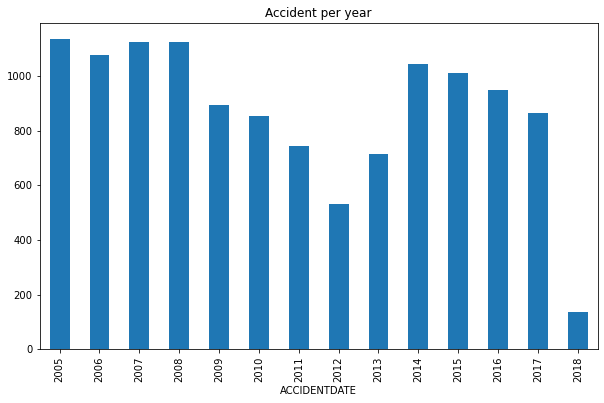

In [5]:
df.groupby(by=df.index.year).count()['OBJECTID'].plot.bar(figsize=(10,6), title="Accident per year")

The number of accidents per year have a U shape behaviour. 2018 data was probably not complete when we extracted the data form the site.

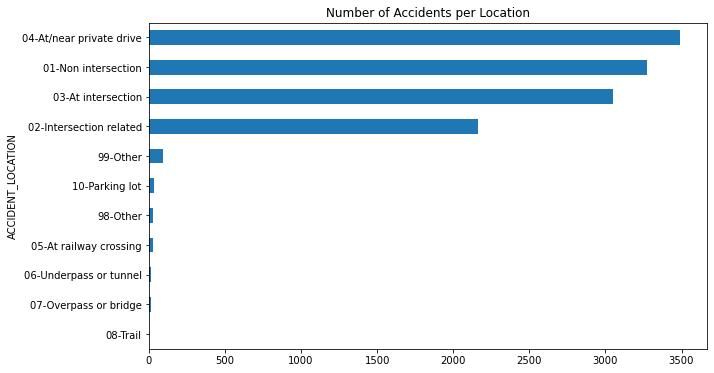

In [6]:
df.groupby('ACCIDENT_LOCATION').count()['OBJECTID'].sort_values(ascending=True).plot.barh(figsize=(10,6), title="Number of Accidents per Location")

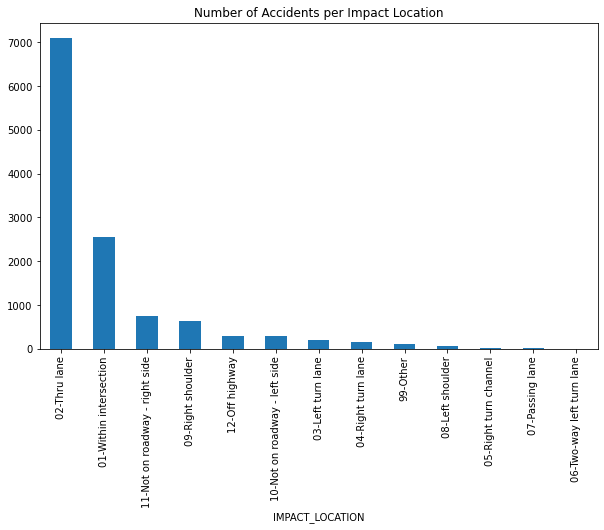

In [7]:
df.groupby('IMPACT_LOCATION').count()['OBJECTID'].sort_values(ascending=False).plot.bar(figsize=(10,6), title="Number of Accidents per Impact Location")

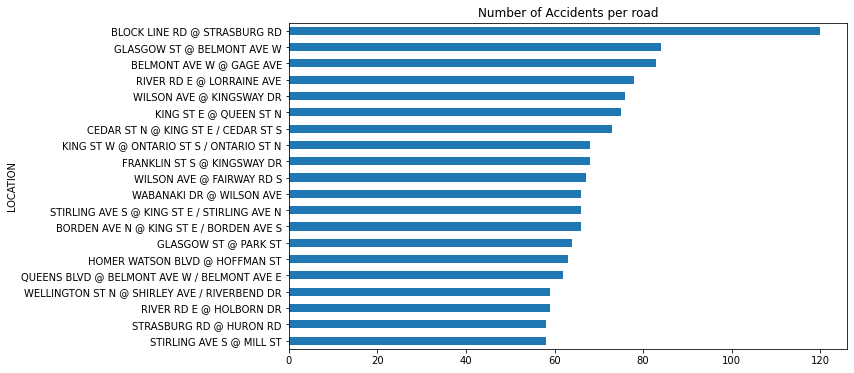

In [8]:
df.groupby('LOCATION').count()['OBJECTID'].sort_values(ascending=True).tail(20).plot.barh(figsize=(10,6), title="Number of Accidents per road")

This plot tells us a lot **but it's misleading.** King Street, for example, because it's a very long road, it appears as various roads and intersections in the dataset, as we can atest from this graph (King ST @ Queen ST, Cedar ST @ King ST, King ST @ Ontario,...)

**BLOCK LINE ROAD** is the most dangerous location in our dataset. This is corrobated by Waterloo's Collision Report and [CTVnews](https://kitchener.ctvnews.ca/waterloo-region-s-most-dangerous-roads-report-shows-worst-intersections-for-crashes-1.4671191)

            "That roundabout is among the region's worst for collisions: in the past five years, it's seen 490 crashes, meaning it's one of the most dangerous in the area."

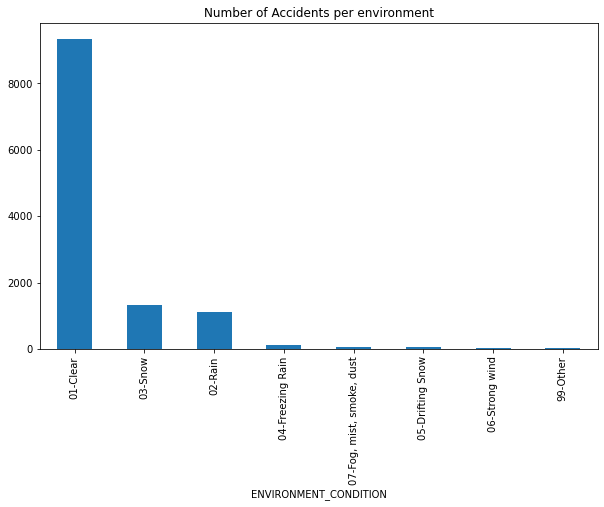

In [9]:
df.groupby('ENVIRONMENT_CONDITION').count()['OBJECTID'].sort_values(ascending=False).plot.bar(figsize=(10,6), title="Number of Accidents per environment")

#### Most of the accidents occured when there were clear environment conditions. However, this graph is misleading because most of the time the weather in Waterloo was clear. 

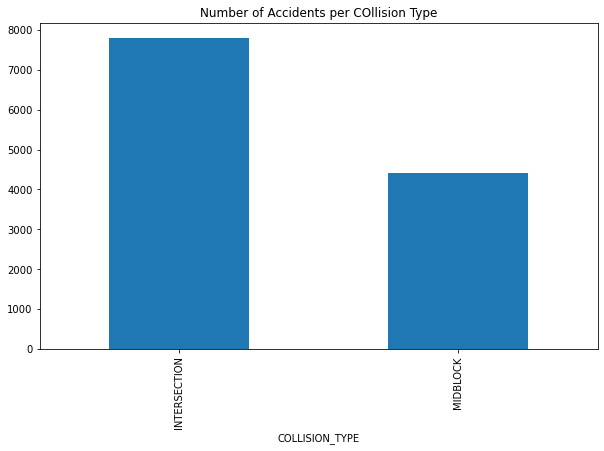

In [10]:
df.groupby('COLLISION_TYPE').count()['OBJECTID'].plot.bar(figsize=(10,6), title="Number of Accidents per COllision Type")

#### Traffic accidents at intersections double the number of accidents in midblock.

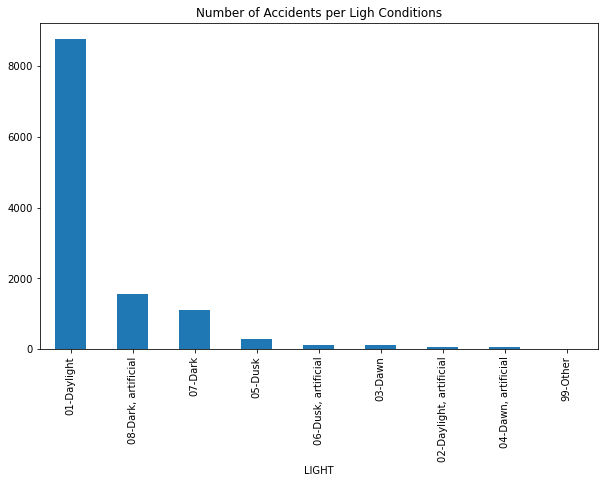

In [11]:
df.groupby('LIGHT').count()['OBJECTID'].sort_values(ascending=False).plot.bar(figsize=(10,6), title="Number of Accidents per Ligh Conditions")

#### The number of accidents at daylight almost eclipse the other light conditions, but that is because there is probably much more traffic intensity at daylight  

In [12]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20, 10)

In [13]:
df_places = gpd.read_file('https://opendata.arcgis.com/datasets/75fa68b17e5b421d9d881f987c2d43fc_0.geojson')

df_places.head()

,OBJECTID,ACCIDENTNUM,ACCIDENTDATE,LOCATION,ACCIDENT_LOCATION,IMPACT_LOCATION,ENVIRONMENT_CONDITION,LIGHT,COLLISION_TYPE,TRAFFICCOLLISIONSID,geometry
0,1,13-118637,20130525,CEDAR ST N @ KING ST E / CEDAR ST S,02-Intersection related,02-Thru lane,01-Clear,01-Daylight,INTERSECTION,None,MULTIPOINT (-80.48344 43.44734)
1,2,13-019811,20130124,GLASGOW ST @ BELMONT AVE W,04-At/near private drive,02-Thru lane,01-Clear,01-Daylight,INTERSECTION,None,MULTIPOINT (-80.51699 43.45189)
2,3,12-089689,20120418,CEDAR ST N @ KING ST E / CEDAR ST S,01-Non intersection,09-Right shoulder,01-Clear,01-Daylight,INTERSECTION,None,MULTIPOINT (-80.48344 43.44734)
3,4,12-127500,20120601,BELMONT AVE W @ ARGYLE ST,03-At intersection,01-Within intersection,02-Rain,01-Daylight,INTERSECTION,None,MULTIPOINT (-80.51844 43.45418)
4,5,13-012564,20130115,STRASBURG RD @ HURON RD,03-At intersection,01-Within intersection,01-Clear,"08-Dark, artificial",INTERSECTION,None,MULTIPOINT (-80.46622 43.39197)


In [14]:
df_places['Center_point'] = df_places['geometry'].centroid
# Extract lat and lon from the centerpoint
df_places["lat"] = df_places.Center_point.map(lambda p: p.x)
df_places["long"] = df_places.Center_point.map(lambda p: p.y)

df_places = df_places.to_crs(epsg=3857)

<ipython-input-14-9f72ac87d050>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_places['Center_point'] = df_places['geometry'].centroid


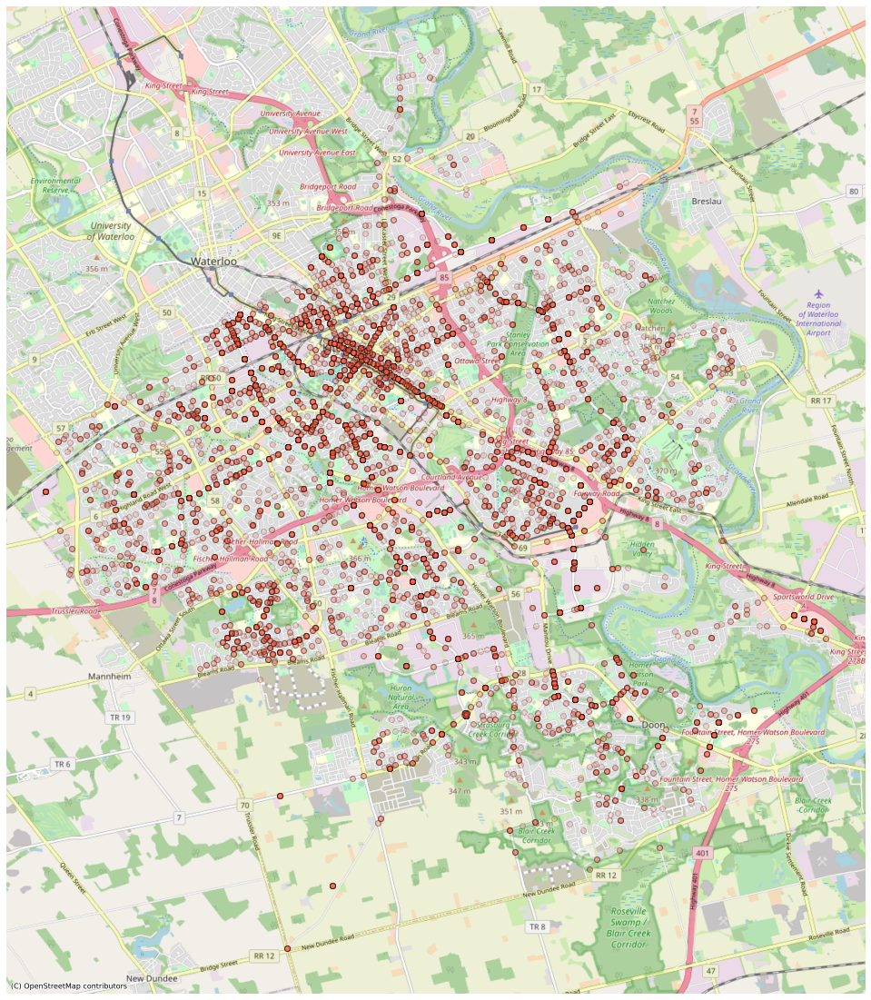

In [15]:
ax = df_places.plot(figsize=(25, 20), color='tomato', alpha=0.2, edgecolor = 'k')
ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 13)
ax.set_axis_off()

Plotting the data on the map, we can see that our data seems to not take into account highway and regional roads accidents.

KING Street, like we pointed out above, seems to be a big hotspot for traffic accidents, as it seems like one of the main roads that connects Waterloon to Kitchner.

In [16]:
def clustering(epsi, min_acc): 
    # Creating new dataframe with coordinates and gdp points
    df_cluster = df_places[['geometry']]
    df_cluster['x'] = df_cluster['geometry'].centroid.x
    df_cluster['y'] = df_cluster['geometry'].centroid.y
    coords = df_cluster[['x', 'y']].to_numpy()

    #kms_per_radian = 6371.0088
    #epsilon = epsi/ kms_per_radian
    MIN_SAMPLE_POLYGONS = min_acc 


    # dbscan
    dbscan = DBSCAN(eps=epsi, min_samples=MIN_SAMPLE_POLYGONS)
    clusters = dbscan.fit(coords)

    # add labels back to dataframe
    labels = pd.Series(clusters.labels_).rename('Areas')
    df_cluster = pd.concat([df_cluster, labels], axis=1)

    # Taking out the coordinates there are no clusters
    df_test = df_cluster[df_cluster['Areas'] != -1]
    
    # Plotting
    ax = df_test.plot('Areas', figsize=(25, 20), alpha=0.7,
                     marker= 'o', markersize = 320)

    df_places.plot(ax = ax, figsize=(25, 20), color='tomato', markersize = 5, alpha=0.2)

    ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 13)

    ax.set_axis_off()

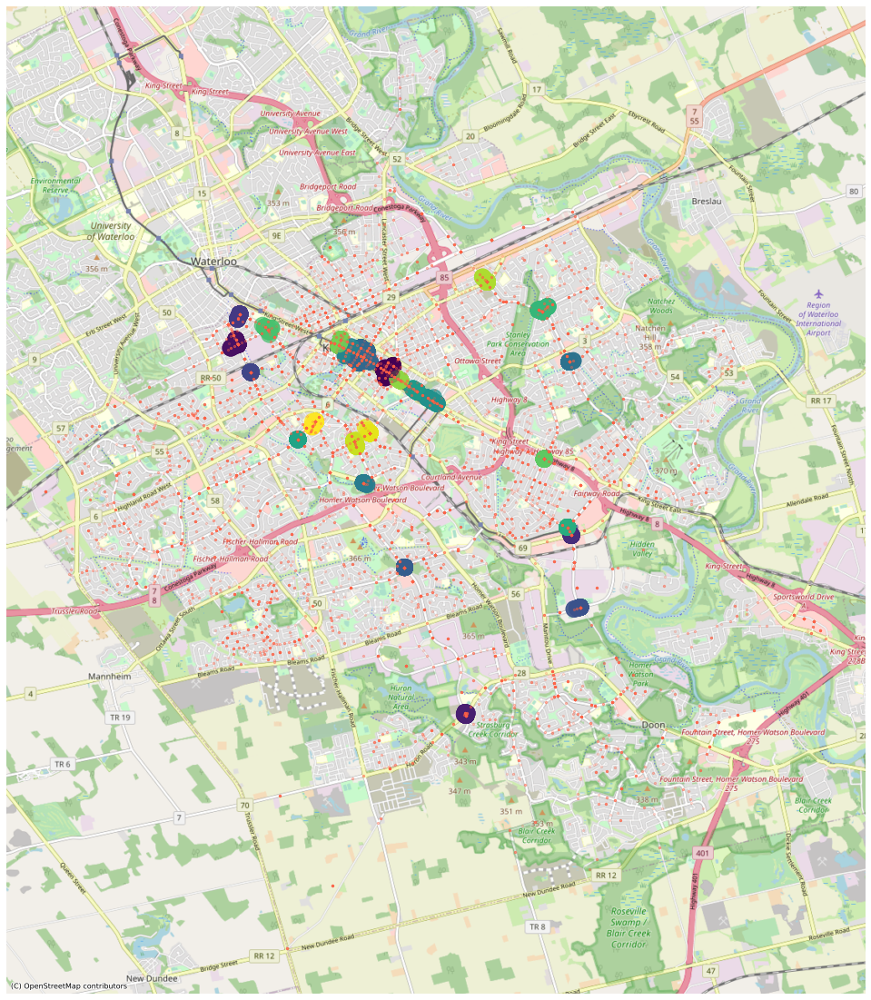

In [17]:
clustering(100, 60)

In [18]:
df_periods = df_places

df_periods['period_day'] = ''

for row in range(len(df_periods)):
    if df_periods.LIGHT.iloc[row] == '03-Dawn' or df_periods.LIGHT.iloc[row] == '04-Dawn, artificial':
        df_periods['period_day'].iloc[row] = list(range(5,8))
    elif df_periods.LIGHT.iloc[row] == '01-Daylight' or df_periods.LIGHT.iloc[row] == '02-Daylight, artificial':
        df_periods['period_day'].iloc[row] = list(range(8,18))
    elif df_periods.LIGHT.iloc[row] == '05-Dusk' or df_periods.LIGHT.iloc[row] == '06-Dusk, artificial':
        df_periods['period_day'].iloc[row] = list(range(18,21))
    elif df_periods.LIGHT.iloc[row] == '07-Dark' or df_periods.LIGHT.iloc[row] == '08-Dark, artificial':
        df_periods['period_day'].iloc[row] = list(range(21,24))+list(range(0,5))

In [19]:

def clustering_time_of_day():
    period = int(input("What time is it? (Hours only, from 0 to 23): "))

    ind = []
    for row in range(len(df_periods)):
        if df_periods['period_day'].iloc[row] == '':
            continue
        if period in df_periods['period_day'].iloc[row]:
            ind.append(row)

    df_filtered = df_periods        

    df_filtered = df_filtered[df_filtered.index.isin(ind)]

    df_cluster = df_filtered[['geometry']]
    df_cluster['x'] = df_cluster['geometry'].centroid.x
    df_cluster['y'] = df_cluster['geometry'].centroid.y
    coords = df_cluster[['x', 'y']].to_numpy()

    df_cluster = df_cluster.reset_index()

    epsilon = 10

    # Depending on the period, the min_accidents changes because the data is not uniformally distributed
    if period in range(5,8):
        min_accidents = 2
        alpha_acc = 0.7
    if period in range(8,18):
        min_accidents = 40
        alpha_acc = 0.2
    if period in range(18,21):
        min_accidents = 4
        alpha_acc = 0.5
    if period in range(21,24) or period in range(0,5):
        min_accidents = 12
        alpha_acc = 0.4


    dbscan = DBSCAN(eps = epsilon, min_samples = min_accidents)
    clusters = dbscan.fit(coords)


    labels = pd.Series(clusters.labels_).rename('cluster')
    df_cluster = pd.concat([df_cluster, labels], axis=1)

    df_cluster = df_cluster[df_cluster['cluster'] != -1]

    ax = df_cluster.plot('cluster', figsize=(25, 20), alpha=0.8,
                     marker= 'o', markersize = 400)

    df_filtered.plot(ax = ax, figsize=(20, 25), color='tomato', markersize = 5, alpha=alpha_acc)

    ctx.add_basemap(ax, source = ctx.providers.OpenStreetMap.Mapnik, zoom = 13)

    ax.set_title('Traffic accidents hotspots',
                {'fontsize':16})

    print(f"""Number of hotspots: {len(df_cluster['cluster'].unique())} \nNumber of Accidents: {df_filtered.shape[0]}"""
         )

    ax.set_axis_off()

### 4 Periods defined:

* Dawn (05H - 07H) - 03, 04
* Morning & early afternoon (08H - 17H) - 01, 02
* Dusk (18H - 20H) - 05, 06, 
* Night (21H - 04H) - 07, 08 


Dictionary: Dawn is defined as going from 5AM to 7AM, morning & early afternoon goes from 8AM to 5PM(17H),...

What time is it? (Hours only, from 0 to 23):  13


Number of hotspots: 21 
Number of Accidents: 8840


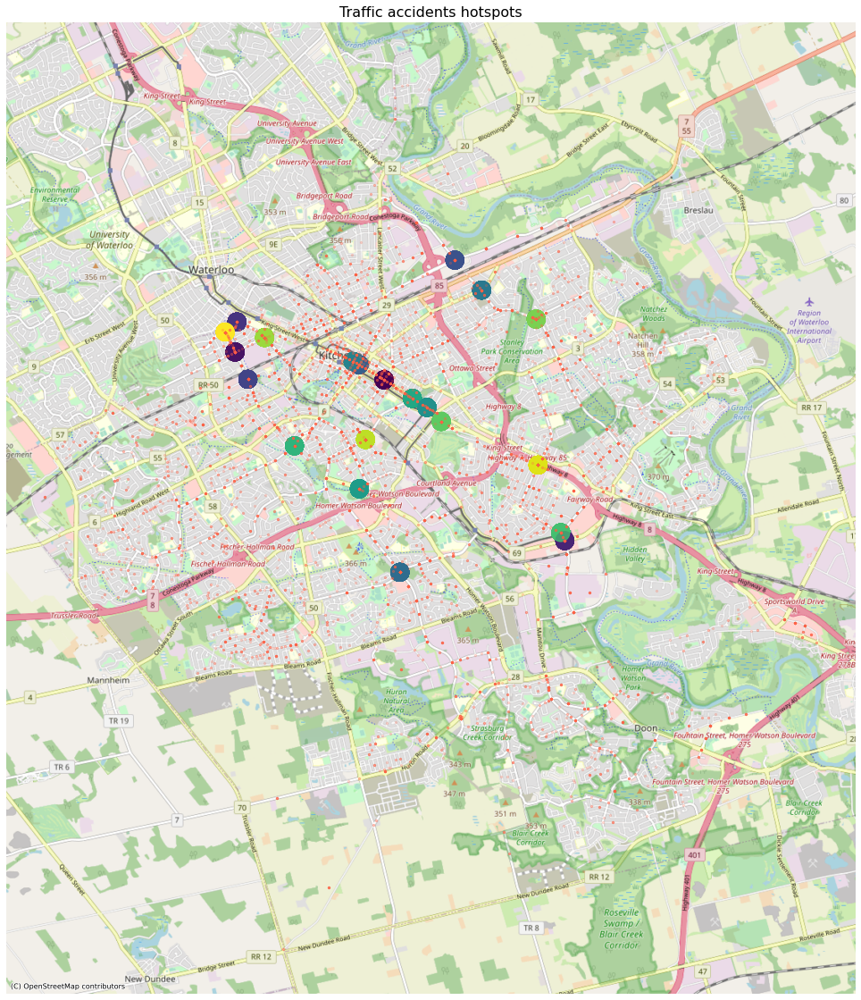

In [20]:
clustering_time_of_day()

What time is it? (Hours only, from 0 to 23):  20


Number of hotspots: 8 
Number of Accidents: 405


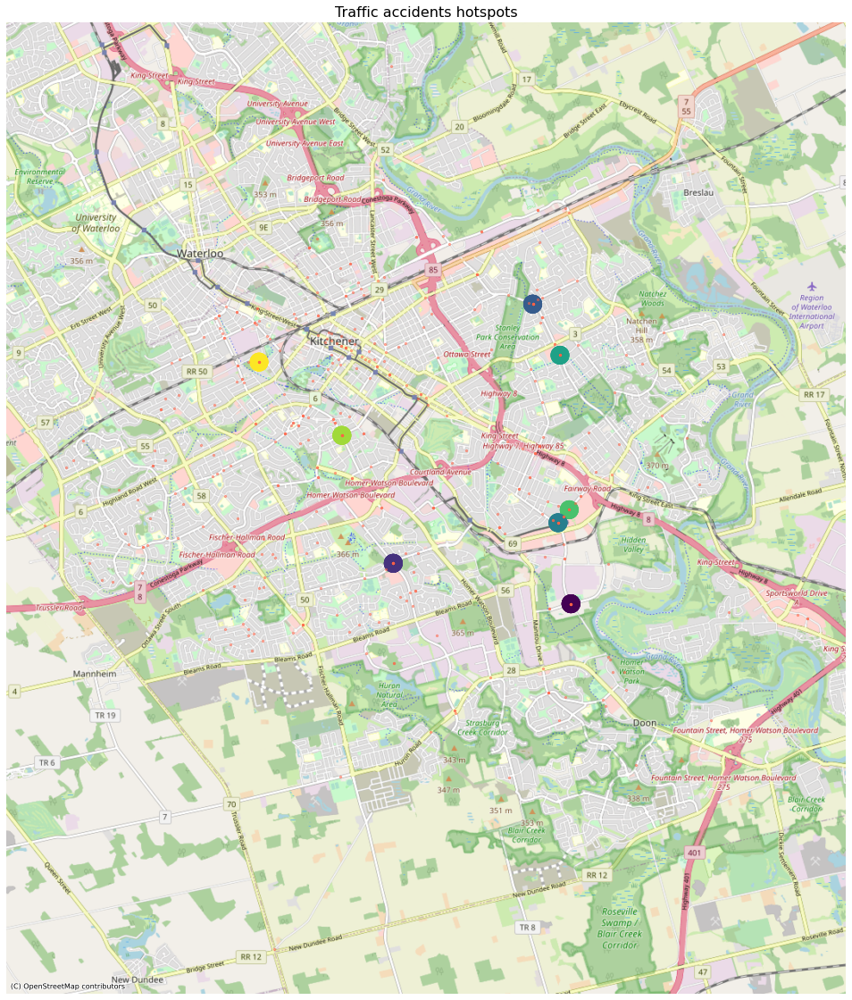

In [21]:
clustering_time_of_day()

What time is it? (Hours only, from 0 to 23):  23


Number of hotspots: 13 
Number of Accidents: 2674


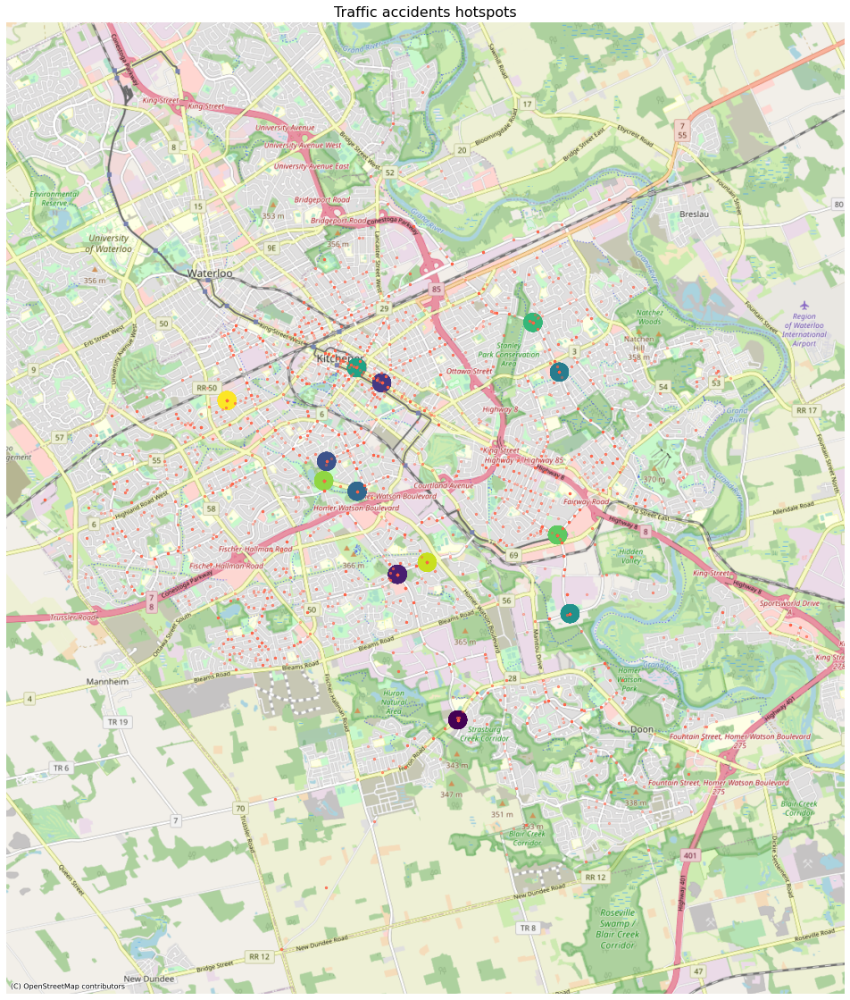

In [22]:
clustering_time_of_day()

## Conclusions

### Scalability and Impact

If we can predict the most dangerous hotspots with this model, we can advise all the stakeholders (both the drivers and state government). On the drivers side, we could reccommend the areas and roads to avoid or to at least pay more attention to when passing by. On the government side, we could help them identify problems and they can act upon it and improve general safety of the roads.  

Through our analysis, we saw that intersections and roundabouts are the most dangerous zones. We would advise reviewing road design and signaling on those zones. Also, the group noticed the difference between traffic lights positioning in Canada compared to the EU. Some of these are very poorly positioned or [are not even installed at these intersections.](https://www.therecord.com/news/waterloo-region/2011/12/27/planners-reject-traffic-lights-at-deadly-intersections.html) A good example of how difficult it is to see the traffic lights in Canada is [this one](http://keriblog.com/car-talk/the-worst-traffic-lights-in-toronto/) by a citizen of Toronto. If one tries to see an intersection [like Blockline Road in GoogleMaps Streetview for example,](https://www.google.com/maps/@43.4158178,-80.4800591,3a,75y,50.83h,80.12t/data=!3m6!1e1!3m4!1s8cVMLzX5m0Ghp2NmqXlH-Q!2e0!7i16384!8i8192) we can see the difference between traffic lights in Canada and EU.

Government can build radars or have traffic police officers in roundabouts and intersections, which are the most problematic and dangerous points. However, according to the report by the Univeristy of Waterloo previously mentioned, roundabouts have signifincantly less conflict points than intersections, which explains the recent transition in road layouts in most countries from intersections to roundabouts. 

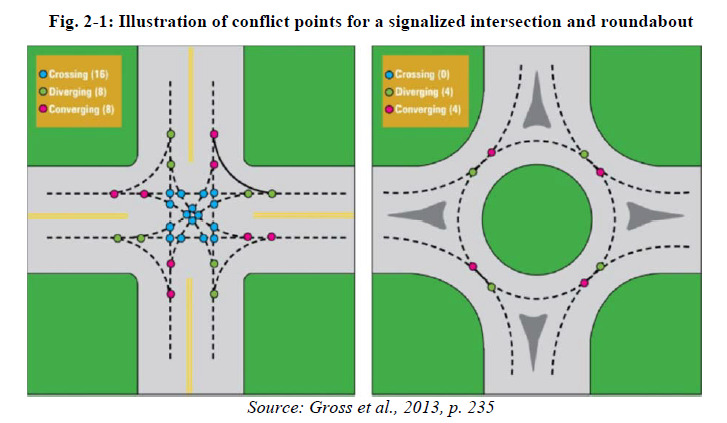

In [23]:
from IPython import display
from base64 import b64decode
base64_data = "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAMCAgICAgMCAgIDAwMDBAYEBAQEBAgGBgUGCQgKCgkICQkKDA8MCgsOCwkJDRENDg8QEBEQCgwSExIQEw8QEBD/2wBDAQMDAwQDBAgEBAgQCwkLEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBD/wAARCAGnAtcDAREAAhEBAxEB/8QAHQABAAEFAQEBAAAAAAAAAAAAAAcBAwUGCAQCCf/EAGsQAAECBQEEBAQMEAsFBQUGBwECAwAEBQYRBwgSITETFEFRImFxlRUYMjdCUnWBkbO00hYXIzZWV3N2kqGxtcHT4vAkMzU4VFVicpTU4QknR2OCJTRDZdFGU2aFoiZEZIOTwkV0hKWyxPH/xAAcAQEAAQUBAQAAAAAAAAAAAAAAAQIEBQYHAwj/xABLEQACAQICBgQMBAQFBAICAQUAAQIDEQQhBQYSMUFRMlJhcRMVFiIzNIGRobHB8BRCU9EHIzXSYnKSsuFDosLxJNM2gnQlRGOzw//aAAwDAQACEQMRAD8A/VOAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAI3rW0ts5W3VpugXFr/pvS6nT3lS83JTt1yDD8u6k4UhxtboUhQPAggERTCcakdqDuuwrnTnTezNWeTz5NXXvWa7DLUbWbR+4reeu639V7OqdCl5xunvVSTrsq9KNzSykIYU8hZQHFFxsBBO8StOBxEevgppwVn5/Ry6W/dz3PdyZ5pp7Vvyq77FzfJdrNy5xQSIAxlx3NbdnUaZuK7rhptEpMmnfmZ+pTbctLsp71uOEJSPGTFMpxhbadr5e0qjCU+irl6jVqj3HSpWu29VpOqU2eaS/Kzkk+h9h9tQylaHEEpUkjkQSDHrOnOlJwmrNcHkzzhONRbUHdF+bm5SQlXZ2fmmpaXYQXHXnlhCG0gZKlKPAAd5jylKMFtSdkVxi5u0Vdn1LTMvOS7U3KPtvsPoS4062oKQtBGQpJHAgg5BEekoyhJxkrNFEZRnFSi7p7mWqjUafR6fM1arz8vIyMkyuYmZmZdS00w0gFS1rWogJSACSScADJjznONOLnN2S4s9YU51ZKEFdvJJZts0GmbSmzpWm556ja+6cT7dMlVTs8uWuqRdErLpUlJedKXTuNhS0AqVgZUkZ4iK2nGDqPoppX4Xe5X5vguPAoXnSUVvd/grv3JNvsVzMy+sGks3PUGmSuqNovTl1M9ZoMu3W5ZTtVa4/VJVIXl9PA8WwocDEqEnUlSS86Ku1xSavdrelbO/Ipc4qCqt+a3a/C6dmr87tK2+7sbdFJUIAQAgBACG4GPoVxW/dEiapbVcp9Wkg87LmYkZpD7XStrKHEb6CRvJWlSVDOQQQeIibOylwaTXanmmuafB8RfznHinZrk1wfJ9hkIgCAEAUUpKElSlAJAySTwAiG0ldkpNuyMBaeoVg371/6Bb4t+4/QuYMpPehNTZnOqvjm070Slbixj1KsGKlFuCqpea9z4PufEpbUZum+kuHH3GwRBIgBAGOuG47etKjTVxXXXqdRaVIoLs1PVCaRLS7CB7JbjhCUjxkiKZTjC207Xy9pVGMpdFXNdtTWnRy/Kwu3rH1Zsy4qq3KidXI0mvSs3MJlyEkPFtpalBGFoO9jHhp48RHq6c1CVRrzY73wW/e+G57+TKNpXSvm93abHQrgoN0Uxqt2zW5Cr058qDU3IzKJhlwpUUq3VoJScKBBweBBEUtNJN8Umu1PNNdjWafEXV3Him0+xrJp9qeTXAyEQSIAQAgDHO3Fb7FdYtd6u09uszUsucYpyppAmnZdCglbqWid9SEqUkFQGAVAE8YmKc9rZz2bX7L3tfleztzsxJ7NtrK90u1rN252W8yMQBACAMXc11WxZdGmLjvG5KXQaTKAF+fqc43Ky7QJwCtxwhKePeYplOMLbTtfL2lUYSn0VfiX6NWqPcdKla7b1Wk6pTZ5pL8rOST6H2H21DKVocQSlSSORBIMes6c6UnCas1weTPOE41FtQd0e2KCoQAgBAGOrdxW/bUuzOXHXafSmJiZak2XZ2aQwhyYdUEttJKyAVrUQlKRxJOADExTnNU45ye5cXZNuy42Sb7k2G9mLm9yzb4Jbs+WbSMjEAQAgDFXRdlrWRQ5m5r0uWlUCjye71ioVScblZZneUEp33XCEJypQAyeJIHbFMpxhbadr5LvK4U51G1BN2V8uS3vuRYlL5smoCiGQvGhzIuVlUzRehqDK/RNoICy5LYV9WSEEKJRkYIPKPWVOcKkqMk1KKu1xSva7W9K7S72eW3HZU75N2vwvnl35PLfk+RnIoKhAGuXtqRp3ppIy9U1Hv23LVk5t7q8vMVuqMSLTzuCrcQt5SQpWATgHOATEJqU1TXSe5cXu3L2r3onZey5WyX39DPtPsvMomWXkOMuJC0OJUClSSMggjgRjtiZ/y77eVt9+BTCSqJSg7p7jx0K4KDdFMards1uQq9OfKg1NyMyiYZcKVFKt1aCUnCgQcHgQREtNJN8Umu1PNNdjWafEXV3Him0+xrJp9qeTXAyEQSIAQAgBACAEAY524rfYrrFrvV2nt1mallzjFOVNIE07LoUErdS0TvqQlSkgqAwCoAnjExTntbOeza/Ze9r8r2dudmJPZttZXul2tZu3Oy3mRiAIAQAgBAHkqtWpVBpk3W65UpWnU6QZXMzc3NvJZZl2UAqW44tRCUJSASVEgADJimc401tTdkV06c6slCCbb3JZsx9n3xZWoVGFxWDeFEuWlKcUyJ6j1Bmdly4n1SOkaUpO8MjIzkR6ShKKTkrJ5rtV7Ze1Nd6PKM4zbUXdrJ9jsnZ+xp9zRm4pKhACAEAIA1m4NTtNrTuCl2ldWoVtUauVxSUUymVCrS8vNzylK3Ehhlawt0lXgjdByeHOFNeGm6VPOSV2lm0rN3tysm+5PkJ/y4eFnlHm93Dj7V70bNAGutajaev3m9pwxfduuXZLs9ZdoKKowai2zuhXSKlgrpQnCkneKcYIPbCn/NUpU81HfbO3fy9pNROls+Ey2t18r793Pc93J8jYoECAEAIAQAgBACAEAIAQAgBACAPz71fm74p/8AtV7ZmtObdolZrg0xd6KUq9Vdp0usdJNZJebl31ZHDCdzB5FSeceejHUitIeDV3Zf/wDHcuLvbJtd+WbSqptaP23bz5f7am98Fa7vZ55Wzuty22qtP2bsx25dVy6b2XU6hcdwW8q7aPV6fMqamJ9XR/VEqlplkpW242BlW+FpSEqBTF3S8HDTmDw9B/y3Vey90ot/mXC7V7pre771n5ValZaLxeJqJKcKTut8WlLo8HZOV1JNPLtTVzX7bA1bsu49X6JprSrQpEvo1b1OrMwbnps1NKrqpvBSiWLMywGUJGUhRDu+vwcJ5xZxqSlReJea8MqWyleWf5t+bzuo5XWdy7p0IqVGgt86Uql1uWz+W3zd8t1mdT6YVm4Lj06tu4bqVLmrVWmS89NhinrkUIW6gL3OgceeU2UhQSUl1fEHj2Rf42jHDYidGLvsu173u1k2t2TeaXBZXe8x2AryxWGhXmrOSva1rJ5pb3mlk3x32V7LF6w2hpLctpTVS1ntqjVy3aHLvTrsvWJVE1Kt4Rxd6JYKS6ACEKA3hvEJIKjnGYmMVBz2bytZW6V3klG2d5OyVs3kjJUZTvsRlZPN3yVlneXDZW93yyu9ytDGyDa1G2UNmaTRq7dFNsqnVKsTlVl5a4Ks3LM0dmbdKpaRLrygkOBABUnPq1L58TGSxVXwcMPha01KpCCi31pK7lbmley7FfcWVKmquIxOKop+DnNyirWtHKKduF7J+1J5mtf7RQaa6ubEV3agW9cEhc0jTGmJik1GkVgvySnRPMNrVlhwsvFJSpPhBW6d4DBJjGYyE8NiMPNppucN/KWWV+DT3rflyRltGbFd1aLzWxNvvjByXbk7O3HiTZc1X1eoezvSqnoXadHuS8mqRTBI06rTXV5Z1JS0HSpe8jiEFRA305I59hyuk3LxlJfldVqT5Ru7tf8Ap87Pc8FopR8Wwb3qmtntlsqy+2r7rrepUkFzjkjLuVFltmbU0gvttr30IcIG8lKsDIByAccYt6igptU3eN8u4uaTm6cXUVpWV+/ifnVs1Ms/Sl23z0SON0XUk+COIEs/geTiYxmMy1Tw/c//AAMxg/8A8tffS/3TMbZqU+h3+z4VujOJ8Zxxx1NEbFU//Iav/wDGf+yJgKX/AOP1P/5NP/8A21CQL821terSpO0s/KSdgzE1ohVKS1SluUWdDc9KzbigpD6RO56RKS3haVBJKVHc8IBOEdZrRlDHPpTrTpSXDzbJNcrt3s75Zb8zKwoKppGeDTy8E6ifG6jt2fPLLhnn2Ei6ibT2odsVfT2RmJu1rKpF423JVJNz3BQJ2fo8zVnsE00vMTTQkDuneS48XArfAAyk72UlQjHSlbBXyhNRjHdKcbvacZbtpJW2dltt33ZPFUMRKromjjn0pxcpNZxp+bFxvHe4ycnntKyjbO91irn1C1nqn+0St/SWjXtQpO2KdYzlxJlH6K7MJdS7MpaeBKJpsl7dbIbeOUIC1Dol5JNvo2HhFjKtTPY2YrhZO0suWdtrJ7SjZbO8u8c9ihhVDfNt335qM17Y2vZK2bu27I9Whm0LtL6t1S9KWzbFizn0Ban/AEJVJ+Xl5mTExR0K3ZiYbS5Mubj6BurxvLCgd0JyMlhIqthcLiquSqKptW4OMXstdjnaL3vO90lcr0lH8Liq+Go5uMacoX/xyV0926F3fLNZKV9kxdzbY+q9marWdbtxWraiaVdF+rsaao0q4qZnadvLHV5xVRZmFy6lLaUhxUotht5AUN44IUZ0ZD8ZWp0Z76lOc7rdF01nDip5q21FpLc1dNHjpCTwlKrVgsqcorP80ZJ+dzh2KSd7Np2zFC1A11ufbz1PsKTvu3Jah2TaEq5ISc3bz8w2ETQQ7nCJxo9L0nR77hKgpDYSlDZO9Fjh6jejMbiJ2bjNR7Mo1Grclm9pZtvPaSSR74uEaeOwNJXtOE5PP/8AyQjK/N2XmvdC782V23H2zltOzdpbL2nn0Eaa2lQro1R1Fnbap0rIMTQpMnMOzKy9PPNuzC3nAkAq6JLyc+ClJbSBjKKl4apg8FSeynRc889mNNNtJK128s297cm28n4YuUcHW0hiMR5zhWUbrJznJRSb329iySStxJSr+1pqLS9Otf5OWlLYOoGg6Wnn5pymzJpVWYWwH0LTLCZDrBUlLiN3p3NwhKsrHgxYV6tsBS0hSVlKo6bTzzjNRbTVsvOUs1zjyke1KFsZPB1M/wCXtprLfFys1nuta91e91bNFzSHav1OufWrTTTK+aLa6pPUnTWXvZp2ky8wy7ITRSS4ypTryw62oAlOEoUnOCV43jkquHhDG47Bq98O00+aclGz7U3vyTX5UWfhmsJhMV+tOcGuThHaTXesms7PiSZtKa6VbR5iyLctOlSc5c+o1zS1sUhyfSpUnJLdyVzL6EKQpxLaRno0rQVnA3k84sqEZYrGwwcHa8ZzbavaMI3dlldvJLOy38LO5rThhcJUxdXNRcYpLjKbtFXs7Lm7P6qGNT9d73v7Qvad0um36TIXrpVSX5SfqclIPiTqMo/JKeDrDBfK5dxSA6gAvOhtQSo9IPBNpj4xxGi4YyKtGVRwkm75wmk7PLJ3TzW68eUi80dKVHSiwrzlsqcXbnG9mrvOO7er3TXFG97Ben9Io2z9Y+o0xI01Vy3LaNGlpyfk2HmOlkpZgplGloW84krQlagpaAgLJJ3E8ANg0xPweJq09yctuXJycYptLNpbKStd7m+LMLgv5sVOX5dqMexbcm1yd5Nu9k7NLO1zx6XbRmtOtlxz90aZ2da8/YFGvqYsyoyT7q2as1LMAdNVRMKeDW6FKGJUMFZSQrpOO6MbhYqeHoYnEZRrQlNNfls2oJr82042bVtltb1dl3i5+DrVsPQV50nFNP8ANe21s8lG903fas1k7I1Cqbcl4SVqXXru1b1EGmVp32mx3aauWeNYmkh9th2oJmQ90SEhbvgy5YUVBOS6nOBOBh+J/BeE/wD7vo2/Jfa2dq/Svs522dm+W1bNi5qnLFU6ObwyW1f80srxW61tpWk735LhktT9p3XC1dfdSNK7ZasVdItfTJ7UClzU9SZxcwFtkDq725NpS6lRSvwkhopC08FbpCrR1JU8Bi8XNZ0KkI25qScn3O2V7tXW7PzbqhThicZg8PB5V1v5ZtJ910nbk7XVs4h2odXL61q0C2WtWaW5SqF9FWoFDmJqnuST000if3nOiWVB9veYSpCyWiApe8jDiCk72VpYZUdP0aUXdSpyavw2oJu+672ZWTVrNN53srKliXiNCYqq1mrxlbioykst9ruKed+C781TrCpOkm31WLb01ptIpKpXQ6en2kuyz0xKKnXamt51xxpT4dWhTqlEo6YHB3QoYEWCrKGh9JWV4U3SSi8/MjTso3Vvyq1+ebTMhUpupXwMqj8+c5uTWXnPazV72zzS4LJWPnZs2nH7f2a9CbWsCxLNta49WriqtJp0uwxNqo9LQzNPF6ZUy5MF99R8HDfWE7yl8FJAwMhjaMpY2jgqct1BTbedlGCeyrW3vK7baV5Pae/Gqap4fEY2av8AzYxydryqWze+yWeSXBRSSzWx7X+rO03aOzZQXq81b9m3NXL4lrUqipFpU21OyLjyw3NMYfzLoeS2CplSluBCynfQrwosKTVXSeApQy8JKLcXnsyTvZtW24qybts33XtdP3xMfB6P0hVeapQk4yWTlFqKur32ZLaaTe1Zq6Tumut6q9e1G04n5pys0SYumSpTzonk0p5unrmkNqUlfVesKcDeQMo6wVY9n2x4aRr/AIehUr0l0VezzvZXeatvztll22z9sDS8NVhSqvpO2WW95c92V+fZfLjbT3bs1kmtHdHNedQqHZS7e1Fus2jU6dSZGbZmpN1cw+21NtOuTDiSgBnCmSgk+qDgzuJy8sJCGkKOBb9LT2k+UtlOzyzUr9mz/itd2jnOWDxGKgl/Iacr8YZXtykm+1PsN0vjbIvun/Tivqz6BQHLK0PqjNIq8lPS7yqjW3vBEyqXfS8luUDW/wCDvsvdJu80ZyMTRxEFhqWNr9CrUcFbfFKSjtvfe7fQtHd0uBe1MPL8VLBU8pxpKpd7m5RlNRss1lHOWeb6LtnYOohufb+tKnStrWm/6KaVu1yg196nzYqkgw+v/u7hE10LqCtJXnokLAWUBQypSrmlRqYbxlDJVKeyrpZOzVk+Nk3wavZX3Itq1WliMHo7FK7hUlJ2fB7F248m42jmpWs3xstJtjbu11+gfT+/7soFhzMncWqr2nFTlKdITjDqmt8oRNsrcmVhpSSk5bUlwKBGFIj10fCGMqYSErr8RSlP/K4tpd6fHc1vu9yjEuWHjj7ZvDTUV/iWym8uD5O9s7Wyu98Tf2tFZ/2jdQ00lryordr23YgqzNNcozq+lZmJpgOo3kzSMTJKEhL6gpCU5AZySo+GjnKWExtea2nCcIpbn0JSjZ52V2tpNPass42Vq9Iy2HhKNLzdu8m3nmm4u6yvkns2as229rcbns07QN66vXZW6FfFTtqiVekNveiFjuUGcp9do7geCWlLeemXG56XU3k9O002kkpxzxFdGMamFVZPa6Oay2W03KMou7TTsld52btypxT8Fi3QWSvK189uKdozjJWVnvas2rpXyu41/wBocu8k3/s4NW/WaTLS0zqRJsttT1MdmUJnFJKW3nNyYa6RtKVL+pDdUTxDicYijRlNVtMxp1M4ujW92z5672sov8ubaleyaQajompLPKdNuz32blHhuus1nfK1rXY681PR+nar2hoVZVtUuwdm+QYVUqfPszT0zWn3kLmXmpV/rA6oEDeO+6iYK1KxhIGTT+KU8LDSFe7pup4GKXSUYOENpvc7XVo2V0ruSbyrlTTxcsLF/wA6UHWm7ZXnedkv8Vnd383cotLPa7l2ptRX9c9DbN0/p1uTFpazW1N1ps1GRmBPyC2pXp0rLqXwhSMLbyjogfAUN/wgU3UsHVhisdg5W2qENqL4N7WzZ802uDW9cne2WKhLB4fFpNeElsyXuvbtV+1Zdp0BpvP6iz2nlGn9UaJTKdeLkmFVWRprpVKomRnKW1FSyEnAPFSsZxk4zFvipRhFyoJvzU7N8dlNq+7KV1f2lxTTc3Go8tqSTXGKk1GVubjZtc8jmK1dsXVc666Z6b3ta9qNyWpD1XkX6fTFLemLem5EZLaqi1MPSs/vY8INtsqbKglYCgQfbBUoYpzp3vanGopJWWd1KNne9mmlNNxbTt2RjlLDR8ItyqbFnm2m1syvls3TUnBxuk1nZpudtpDUu8NJdMX7ysu23atMsT0qxNuIpj1SFOk3HAl6dVKMLbdmUtJO8W0LQSMneABMWU6ihUhGctmDb2pNNqNotq6XNpRvwvez3P2p0nUhNwW1JK6je207rJN3ztd242tdXucybTGsczXtDNHLxn5nSvVOj3LqNTZNczLUmfZk3CXlqlpmXQJ7pJd5pLakuNOqeSVKIUAAUm/oUHDTWEoyjstptO6bUrW2ou1mmndZOzs020mW85xr6Hx9WLuow3NNXj5t4zW9Pas96yVmvOyyOvm2jrHZ1U1oGnNHtCmyejC6Iw9L3HS5qcma6uoKSAuXLM0wGkoCvBSUuFw44oiyoOVWjSxD3VKzoqKV5K1vOeed73Ucsle7LudKKrOgsmqUqu08o5K9uxZWcs/OysbpeWvuu1ta76M6PyblkPy+pluT89PzU1QJxh+SnZWWLqlobE6odGSpA6FRKhuqHS+ECm5nTXhsdSjuoU1OL3387Zs9102m7q2TW+3nWCrJYTDYmSzqSs1usnZ9tmlK3G7XC+Xg0r2u9TNSdl2X1jbtC2GK8zcjlvVd52eTK02RZbf6NyoJbmH0KdCUlKurB8LWcpSvOIpko1I4SdN7Ma8b5racW9pJKKs5bUkkrZpPc7FxK1DEY2hU854eTjl5u1bZbzd1C0ZNtvLLhc1CpbQ12a4bL+1Na180qkoqmnMnWaEqfpsnMSTFQb6s6UO9UmFuOy6sJ4oU4s57uUWGN2MRoqljIq21NRaunnCcLtNJZO+62XNl5gm6Gl5YO90qcZp2tlUhJ2tnutv43NU02ux6magbENqVC0bTq8tVrCddp9RmpKaFTpLzdMSXVMupmQypLgDYwthRTuqIOVAp2jGRdTTek9nKUad01xTnbZd78U3dWdnbde+FT2dGUnvTqvJ7rqdrrdwlud1dJ8FaVLX2gtpKvbWTGz/JTmm9apFCpiKzfE7J29Oy7lDS5ktSLbxqLiH5hQKBvltKRkq3OBSMJg3CpRr4is/5dLLaWW3O2aSd7JNNvN7msnZl7pBeAlTp0enUbaTz2YJrzpNWza4c2nmmWtItti89XL1pU3bunVVqFmVi6Ju2yiRtCrrcpbDO+lFTmKru9RU2txKUql0gLaDgUVqwUxVgoeHpU51svCU3UT3KNs1B36Tkk7SjZKXm2e8p0i5YOtVpQzdKag1vcr2UpK3RUW9zu3HzrrJEObWWu96bQeyVr1X6fJUCQse1LpYtSUlHJd5VTmXZWfld+cVMB3okoUVgJZDOcZUXfYx40IbS0djKm+tUjOKX5Y3kknzbtnayX+IyeEexjsThaefg6c1K/GTi725KPC6e1l0TvOZfqkrpEuZorsk1Ps270ksuellTEuHEy2U9I0hxtS0ZHFIWkkeyHOJ0/PwaxM2rpbTafFK917Vlfhvs9xi9BQVSGGg21dQV1vV0rP2HC2ku0zfem+x1oTeul1g6d0GWva+12vUKGiRnzKtJmJ59Iel3FTanG1fUlFXSdKCVggJCd05Wvh29J4XAuTcJ0k896tBPLms+Ob4yu2yKdpYTHYy3n03tdjva913tWtZJKyW60z0Lae1VrkltL2nNN2zLXJoq249S6rLU1/qs20qVdfbDssuYUrpE9EUlQd3SSDujG6cDiasloRaShlLbnBr/ACNK8eV77ntWa4l7hKPhNMw0dU6M1Bp8tu2T5pXWa2bq/R3kd6a7U+pGleyTpDc931aRua5tV6uin0qaRbs7MLkS+664/MTTEs849UHAreUG5dLBXvJQAnBVGVxNOKxlDAU8n4JSbs5ebClBpKKz2ndJycrb5uyVjE4Ss3hK+OqZpVJRSul50qs10nkoq11G10korabRtGq+2DrhY2y9WdZZKwZWl3Da91tUF9m5bUqlOlq7JOPIbbnZSWmHmZiXS4HUKAcLm6UOIJV6uKIU1UxWCppZV5bMo7Scou8uKVs1G6vHNSTsrNO+aUY4jO/g4qUZWaTTtdNb7xbadnwuspK2+asa07Q2ltq1266xY9FRRk1ymsSNXp9Lmqv6F0h6VC5udm5Fl9D0x0D4U2ejW1lKgvdwk71tOUac4U6klHzqicmvNslem/8ADt5pttqLXakMPevSdWEdr+XCSinaTnKVppXWajG00uKvG6d2tfv3bEqlpUXSS36LX7aui4NU3Z9cvclv23U6rS2pSVBWXmqXKurnHnFAtoLKXsoV0ilK3UYPtKnOWKlh4px2Kam7+de9kkmrJKTu1N5KNuk2r00pR/CSxUpKS29iKXm73xvfOOV475PJW4X6htd30q2tKqB9ABtXUHVK4Zu32Grmpc5LS0iiVUrpJ4yjpZmHG1p6NTbKltqPSgFY3SYhQ8PiqeHpNLapOrK/nOOzG7hlZOW1dX3WW1Z7iJy/D4atiKi2lCpGnFrzVJzdoyzu0rZtZ+d5t+JpG1Xq1tQ21pbplTa6m3LMuC6dSpK1aoZOXVOMT0qJhSmZpsJmN5ph4Mgrlisubq9wupOczhILE6TwtOOSlFzcXnszjbJtbO0ldNNWztv3FddeBwOMqPNRyjJZXjKObs77Mt8c781wZnKxfNRtzb7oNA1AoFl1ecpelk3VxcshSJyTqDCErV1hltC515otqW0taQUFaUubm+fCUvwo16VGlpHEpNKCi+Dbimmk3bhfetm7SuskeuKw06kMBC93OpNJPcpbL85d62Yu99za6Vl92Ltp3xVKVpPqbd9vUJiytabnctui06Tl3hUqOSt1Es9MTBeW3M9IprwkIZZ6ML9UvHG+p4SSxMMBUd6kqTq3XRVoxm42eb82XSus10UnlYVcXTdCpi6GdOnUUM97zacuyzT82zut0uenX1tva/2LbOuN1P0nT6eltHL1p9DSyimTrS6pIzDqUKSSZtQZeSFpId8NJII6PkYstHTjiaOEq1v+rVnSlbhspecr34/ld8na6td31Sn/APMxGFg+hShUi3znfJ88srrZzV+Nl3RT6iqo0aWqzEud6alUTCGirHFSAoJJ9/GY9MXCWGc4RV3G/Zdr5XLbCVFiacKkslJJ87XORbW2xdVzrrpnpve1r2o3JakPVeRfp9MUt6Yt6bkRktqqLUw9Kz+9jwg22ypveCVgKBB9cFSjinOntXapxqKSVlndSjZ70mmlNScW07dleNUsNHwi3KpsWebabWzK+WzdNScHG6TWdmm9Rvrbe1/sW2dcbqfpOn09LaOXrT6GllFMnWl1SRmHUoUkkzagy8kLSQ74aSQR0fIxbaOnHE0cJVrf9WrOlK3DZS85Xvx/K75O11a79qlP/wCZiMLB9ClCpFvnO+T55ZXWzmr8bKbrr2hrwqm0NaOz1ptJ0OSnapayrzrNRrUs9NIbkt8IRKsttOtEOrVnLqlFKBg9G5yit0XOWMjLOFBWfByk+F87JLNuzvust5b+ESwmGr286u3bPopR2rtfmvmkrx3XvwNO/wBmMHBs91sPNNtuC/Lg30Nq3kJPWBkJJAyB2HA8giulbxXgLfor/fMoq38baQv+s/8AZA9la1/2j5raG1a0K0+tyyavMWpactcVtKmZWYYW9MO7u7KzKzNBC94lQC09EBzPLB8tHt4qjUq1P+nWhB24wldyfGzUeOea6LvZe+J2aOJoUb5Vac5d0ovZW7fFy3q17NZ5Xfjvja61Ik6trHP2db1uooeg0hKvXDLVFl92arc04wXnWZV5DyEyiW0pIDi2n98n1KRxiFVpxwyx0rulKq6SSylaMoxc3fLfLKNldLpK+VMVKVWOC3VfBKpLjFXTkopcbpO8r5cnx9tY2qL+ntftGbEspu2xZ+sFozdwS7tQpcwuoSLrcmp9vK0zKW1oJLe8jo0nCVAL8IFPvVw9ShX0hhZtbWHhtRfBvb2bNcVk3k1vXJ38Y4mMsLhcWk7VJ7MlxVrXs+edtzV1fNOyjuV24NcZvYVuLadRSbFbum27kcpbsmaXOKp8zLJmm5fwUdbDiHMuhW8XFDwSN3jkeTaawE4bsRbaT4XlNKz4W2VvT4mQw2HdTHY7BVH6ByUWsr7EIyd1nvu1k1bLfZ3km2Nq+8abrneul2plLoLlMt7TxjUFido7DzLjLW6kvyznSurDpBUSlxIb4DBR2xOIlChhMbiN7w9RQ/zJxcllweVnm09+W4ssMquJr4KlG1sRG/bGV7e1PfuTW7PeQFqpqlqJrhbmylrBeMnbkhT7r1Zps7S6bTWXw/T2N91CG3nnHFJmVKSneK0oZCThO4r1UX+j8P8AhdNUac3eTw9aTayXnUoyslm8r2vfPki2xmIjitFYidLKCqRir7/NlOLbtlm08rZLi+EybVW1zq5oE9d1cplsWn6D2a5Snm5CbWqdnK9JzbiG3Hg5LzCVUvo3CpCTMS7iXSMoJwUxjsHJVatOFX81TwbS3xVm4y2s03Kz8zKSSb3ZrKVKDcf5Tt5m1d8WpWlHZyeSae2m1dpNJ2vq14zdzVr/AGldpz1mzFMp9VntG3npZ2py7k1LsKXMuqBW0240p0AkAgOIzxORyivDRnhvGcYNNx2PbZx91+eduTPPE1YYjAaNqzTtKdR5cL0+7h8ezeZmi7etw1TZ9t29XbKpzN+3HfqdNWJfecNLTVC7uKm/VdJ0AQCvo9/ez4G/7OPSnS/G1cJDCuyxEHU87PZjG+1e1tp3WW66d8tx5trDvGqt534aTi7ebtvJpK+1s5PNu9rdqRnK5tV6k0Kga/Wi8xa7l/6H0litJqIpUyKTV5d2V6ykdU60XWFYStsjrC8EpX4QyiLSvVX4BY6krWqeDknnndK6eW+97WdrWz3l3Rwrji6eGru6qU3OLWVrXVmne9mly2l1TEWDtd6w3Pqls82pVKfZqaPrJZb9fqIl6bNJmZKcZlVukMuKmlJLSlbmEqQVABQ3iSCMpLCR/G43CJ+hpxnF/wCaSjaXO2bytvS4NvFyruOFo4m3TqSg12Re9drTXPNN8bLIbD+oOsep9+a3Vy/7yo1Rp1Fvmdt5qSZozrLrZlUtttFl0zKkNsbgUS0WlrK1lRd5g2uEjHxRh68s5VLyv2uyd+eSSjbZslnfeXeO8zSVSjDJQjFey82vbdttu99ySVjrqPIgQAgBACAEAIAQAgBAECVPZDodU2hZXaYc1f1CZu2RYMhLNNGk9Sap5WpRkg2qQKi0d9ad5Sy7hX8ZkAicE/wW3s+dt9K/Hdbda1tmO627O93djEsYqakreD6NuDs03ne7d23e6zySVktl2jNna2dpezZKxbwuu5aLTJOpM1T/ALDclG3XnmslrfVMMPYSknewkJyeZI4R5wi6eJpYuLtKm7x3WT59tuW7PNPK1Ump0KmHkrxqLZl2riva7duWT33422t7C2rKztEs1LTO5JZmSpElT5WjzlzaWu18ofS2OkmZWck6RPtS++tR6QqVLK3gfA6NLazGEnVVepVSSbk2lnFpWS2dp2812y895N7Wy27116dKGEpUW3JKK2r5ptNtNxX5krboJbtlvNR6w070iuC753THXTW96dk9ULWt+Zp85JUudLdMU5NAdKXGAPCVhKTgEAE8Qd1G7eydLDV608NuqRhFp52taTt/+11fO677u0h4Wrh40K7vsTlJNZX3xi3u3xs7WTTusk2nn9fNBpPX+gU626lqfftnStOnkVEOWjU2ZB995s5aK3VsuLwhQ3khJT4WCclKcWXg/wCdGspO8b2zyzVm++za7m+ZdKpalKlZNSte6zss7e+z55b7XPdoro3LaLW5NUBvUW+r3enJszTtWvKs+idQxuhKWQ9uIw0nBKU44Faz2xczq7cI01FLZvuWbbe983ayvySXAto09mcqjbd7b9ytwXxfezw7QmglK2jLFf03ua+7qoFAnuFRlqEqRQqfSFoWhLi5mWeUkJUgEdGUZyd7eGALSdBVKkZyfRaaXC63Pndd9uwvKOIlQjJQ3u6vxs001ys088r8ms7+S7dnC37/ANDFaCXvfd41ekqQw2aqZmVlKkW2XEraQVy0u00QncSni1kpHhZPhRdYio8RiKeKkvOjJTy4yV83334WtvjZpFrh6aw1GWHh0XHZzzsrJWXu43vmndOxJa6SpFBNDp9UnZEplOqMTrZQ7MMYRupdBeStCljgfDSoEjwgRkRRXcq7lK9m88rZdyaa+BVhoxw6hG20o2yd80ubTT780zn+x9h+1bAomo1v0fWbUp6T1TE45cKZpykKK5mZ4PTLRTT09G4UlacD6mAs+BkJKfOpShVwMdHyX8uNrc0srq/KVle93lk1nf2p1p0sb4wi/wCZln3Xtlu81u67d91kfVN2HrJpbekrUtqpqGUaMOOrttK3qYd4OKG8mY/gP1QbgDXDdO6Oe94cXSxEvxjxzScnDYfJxtZ+1q13fgrWzva+CX4SWCWUHPb7dpO69zbaX+Jp3Vkrmouw3pZqRUdSpyduu86RL6sMyKLlkaVOyrbDz0opJZmEFyXW4hYCcFO+W1AklBOCLPwS/DLCvoKo6i7JPpW7H23t+Vou415RxCxK6Ww4Pti01n2pbmrbrO6unudw7O9BunTiS0qrV8XZMW+zTZWj1BhTsmfRaSZQUBp8GX3WysYKnJdLLmUpwtOMRd1q7r4r8VUSb29u3DayafPJratezbd007FrhqawdBYeg7JR2U+KjnlyfmvZu03bc75l2f2dLEm9bKJr3Jz1aplx0WhKtvopOZQmVnJDf30NvIWhSvAVxBbWgnkreHCKKdSdN15J+mttd63SXbwzuuwqnBTo0aG5Um9m2+zVrd1m+1PNM8mhmzbQNBKreVUt+/Lurn0c1Z2u1RitLkVNifdOXHmuryrKklQwN0qKQAMJB4xRDzMHDA/lhknxSe/Nc9+7fusemIm8Ti5YyWUpJKy3WXRWd35qyWe553dmtBkf9n9pDTZWgysneV+pFs3w7f1MUuqS7paqLikqW2rflyHGiUp9WC5wPh+ErPphKjwcqE6e+jTlTV+MZXvfdnm81b4IoxMVivxO2vTyU5WytJKyceXc7rsJEe2cbQRrFcWuNFuK46Ncl00JFBqQkn5cy7qW8dDMbjrKyHm8Jxx6M4G+2vjm2jRUcPXw0ejVak+xpOOXem73vzVmkz1lU8JVoVpq7oppb84uSk4uzWW0r5WfC9sjS7J2GdK7G0oktJZG6bvnpOiV/wCiegVWcmJM1GiVLO8HpZbcshs+EVHddbcSd5QIKfBi6dae1RnB7MqUXFNb9mV7xd7ppptbvik15TSqyryrecqzUpJ7nJfmVrNPJbmlluzd83ObI9gzumV+acO3RdKZjU15T913Il6U9FqmpQCVbyjLmXbSWx0YS2whKUk7oSTvRb1aUKtCnhktmEHtJLjK+0227ttys3nwS6ORXSk6daeIfnTlHZu+EUmklayyTaWXG7u8zF2ZsX2fZWo9janyeqF/T9U0+t1Fq0piddphl101KVJDTyW5JClHCvVpUlXgjjzzdfiJvEV8VLOVZJS7bWzVrWzW1334ZFs6EXQpYa72aUpTj2OV7962Xs92fS84k3VjSC0tYaPTqbcqpyVm6JUWaxRqpILQicpc+1no5hkrStG8Mkbq0LQoEhSVDhFvHap1o16btON0mrbpK0k73TTW/wB6zSZcPZnSlRqLahK10+x3Tys009zT+BpnpVLJTp1fVhM3ZdLU7qY447ddzJck1VapFxAbWFFUsZdtJay2EtsICUqO4Eq8KKa1KFXDwwqVqcW3ZcW3dtt3bbdm3fgl0civD1Z4fEvGJ3qNJJu2SjlFJKy81brp83d5m7aOaXU/RbTei6YUa461W6Zb8uJORmKuZdUyiXTwQ0VS7LSFBI4AlO9jmSeMXWJxEsVPwlTfbN8+19tuVveW1GjGgnGO5tvuvm7e27zvv5WS1ewdmmzNLb9uS9dP7juWiSN3ThqdXtqWmGPQl+eJyqaSlTJfaWrHhBt5KFDgUmPHDt4fDrCrOEein+W/BdnY7o9K68PWeIeUmkm1+a19/C+e9Wd873MPUdjnSipVqcfena8i2alcKLtnrPbfYFHmqylQV1tY6HrGSpKVFpL4ZUpIJbJzlhpPC+C2c/BX8Hf8l79Huu9navs3ytlaMTFYnwm1l4VJTt+dLg9/JXcbN2zbzv5r42PLTvvVC69WJvU6/KdVbvthyzp2WkHaaJVqlrSApppLsktaTvZXvqWpWVHjjCR4qivw1bCt3jVkpS7XHd3WXm9zf5sz38LKNehiYZSo9G3t33vxe13pcMnhansI2PU9LdP9ITq1qNLUPTSpIq9EWw7SRMdZbWVMKdWqQIWGt5YSN0AhZ398hJF28RN4unjfzwiorlZK27m4pJ8LLJJtt21KnGjhquEj0Kjbl7XtNX5bV5c7vfayWzVvZRoVb1kn9dF6q33K3LULYXaSxLqpfVm5FaMHdbXJKO/0p6beJI3+GOj+pxb7MfAYjDW8yu05Lu3W5Wj5ud3Zt9K0lceFlehJ76O583nm+F3fhZZKyNZouwHo/RNIbb0gZui9Hpeyq0uvWvXFzsoirUWaWvfV0DrcsltSCsqUUutuAlXHISkJuauIqVK9LEp7NSnHYTXGO60k7pq2W5ZLndvwhCMadWjJbUKjTae66Vk1xTXDMkDVjZytTWzTSU031Cue5Z4yM/KVZittvy7VQROy5+pvgJZ6uDjIKQyEHeUd0E5jxbSxVLF01sypy2o23X5O9217b8miuPoKuGqedCpFwknxTtytxSd/fc3G8z6C6dV0qTU6iZakTWQxLOTk3MK6JXBLTKStxajyQhOSThI5CLLSkZVsJVhTjnKLSS7VZf8ALb7W97LnRyVPEU3KWSabbtwd2+C9i7kuBxbsI7NMndez9prIaz0rUKk1HTSuzVYbtKuUx6mSKal1l1yXm8Py6Hn91tYICHiyCTvI38xsOKrRhiKWMoO8lTUFffHzUp2W/Pg5Xsug1YxUIynCthpXUZSUna/nKysm+V07pWe7aumjoi99kLTC+qzcU7PVK4ZCj3pNy0/dlvSEywinV+YlyktOTG8yp9BG4jeDDrQXu+GFcYxNCMaGzG14xk5xT3Rm98l3vOzbjfOxf1Kkpyc4vZm4bDkt7hmre5tJpKVna+63pqOy5a89r5IbQ8rfd202vUuhm3JOnyhp4pzMgUqHRhtcopw+GouAlwneAHqPAhDahHELabdfpN7+Fmu1WyvftuRUcalOhR2Uo0XeKV97yd++Pm5Wss1aWZGzf+zo04ZtGiWU3rHqgKdb12LvaRzMUguIqysHpVE0/wAJIVvKCCN3K1ZBGAPbDVXhalCpTXoYuMVw2W7tPn33vbcymolWWIU8/DtSn2tJrK266te3JWtneYHtnqzF65jaDlqtXpS6HaCLdnUS802mVnpVLgcQXUFsqC0rSCC2tAIGFBQ4R5Un4GnXpQyjVabXKSTimuN7O2ba42vmRUXhfAuebpXs+ae9Pha7bySee+2RkKLovQKXqOjVGoV6uVusydLXRqWak6wtNNk3FNqdbbU20h13fW0hRU+t1QOd0pBIj0hUdONRRWdRrafNRvsrlZXfC74t2RFSPhNhPdC7S/xNWcud2srX2VwSMBrvs10LX6q2fVq7qDeFvuWNVW65SW6GqQSgVBs/U33OsyrxWUjICchBBOUk8YowsnhcWsZDOSTjZ7rSykuD85ZPO6t5tnduqrath3hprzW7vm7bvdnu553yt4b82SdOL+rlx1eardyUmWvhiWl7xptLmJdqVuREuMNda32VOtkJ8Eql3GSpJwokYxTTjGCUGrwU/CKL6Knlnz3pNptxbV2t95lKTamnaajsbWW048nw4tXtdJ5NZWvXbst2ldGrVhavy16XVQJ/TaTVT6FTKUZBNPbl1jcebWh6VccUHG8NnDg3UpG5uK8KPehXnRxFbEt7UqqtK/FXvws8pede9778sjxnRpyw1PCxWzGnnG3B5K+d9ySXLs3kv1CRZqchM02YU4lqbZWw4W1lCwlSSDuqHEHB4EcotK9GOIpSoz3STTt2lxSqOjONSO9O/uOdLH2C9JdP5rTKdod23w4/pPN1GZoC5qoSzoUmdWpT7LyerhKkEqOCkJWOHhnAi9jipxreH4umqT7YxVl3Ndll2HlWgq8JU3kpT8J3Sy53uslvu+3N36Ar9FcrkmmWZrdTpTrai41MyDqUuIXuKSCQtKkLA3t7dWlSSUpykgYi1lFy3O2VuH1TXw488z0jJReauvvlZ+59m4gi9th7Ta97HoNiP3tedKl6Hczl5LnKa5T0TNQrS1FZm39+UW2DvKWQhpDbfhEbmAkD1py8BiKOIpLZ8CrQj+VK93vu3d8294lJ1KWIpVM/D223xaSSSysllGOdr+as83fmDaesja8q207P3FpjcMjKS8guUZt9+4tK3qy4wroEIW5K1GWpE80w0te8VFb0uoKKt9tKAhavDAyqUpTqxS2nKTt0XZbotvZysvNtNqzvdTckvTFxpThTpu9lFJvem7tuVlfPPPzFmkldJHUMvs417VSu6X68as3vctt6l2hb/VnJG310/wBDpebmWd2cIQ/KvKUVb27/ABhSNwbuOJN3iKdGhiMSsLJ7FWOw79XeksuEvOT3333WRZxc69ClCus4S2l25q1++KSaVuNrPMxNF/2fulVF0tp+kaNQNQpmj0m7Wr0kXnZ+SRMsVBCt4jealUIW2pXEpWhRB9SU4GKKVR0amGqQVnQTUe58H3Xdnk82m2sj0qx8P+K23f8AEZz7+LVtzaSuujkmknmZ9vYw09lKFq3b1Mva9ZKV1nmVTVxFE3KOuNLWCHurKdlllAcSpaVBe/gKO5uYBFs6MPwcMD+SEnNc7tp2b5Xinzds27u/vGtJY2WPec3BQ7LRTSduaTfZ2WSR4aVsQ2XSbk0puhnVXUJya0cp6qXbiHHaX0ZllApWh8CRBc3milokFJCUJIwsqWq/li6ksTWxb6dWOxLuS39+15/+bhs+aWroxdCOH/KpOS720/ovYXtMNjC39Jrhq9etrWrUx9Nx3Ai5a7KTj9JWiqziV74D7yJBMz0W9/4aHkpwSMcTm2oNUKFPDWThBSST3ecrNu1rvjd3zSfA9MVfFVp4hu0pWTa6qd1FXvZWyyz2crm16U7NNo6K3FXqlp7dd1U+g3BUHKtMWqqbYcpLE64QVvMgs9YbyRkth/oznBRjAE0ZOjh44bfGGUb74rkrWus/zXs81Zk17V68sQ8pS6VvzPm9+farXSs8jWa/sR6Q3FTr4tqaqt0y1qahVVuu1u25SfbZkF1BLqHFzDZDXToLhbSFoDvRnGQlKgFDypwUKVKi840m3C/5b3yVrZJu6vez3NK6fq60/DyxMXaU47MrfmW67vfO102rXvndkvrsiRa0/Vp3SavVqbJppXoRLzqZkTU6w10XRpWHZoO9I4Bx3nQvJ4qBirHLxjt+G/Pe9rLfvXZfdlnyaeZ54RrBOLpro7r/AA93BbuFrZHPsv8A7PfTiT0ns7RuS1W1Jl6BYlxG6KMpMxSjMNTu8Vo3lqkCFoQtTq0pKebqgoqAQE3TxdR4ujjH0qUdlcmu32WjlbLtzKIxUaFfD/lrW2u5cF2PJvjdKzWd90sfZJsmy7p1Oul+87uuFerjSmrlk6s7JdXcBStCS11eWacb3W3FoHhkYOSCoBQspUoS0e9Gtfy23LtTl0nftdnmnZpWsrp+kalSGNhj4ytOCSW61lbZvlwt7eNzGu7Eek8zovbOic1X7vdkbKnkVG2q0Kg03VaRMIWtTS2HG2UteB0igN9pWRje3iAYuKlWpOvSxUXs1KaSTXFJKLTTummopNWS7E27+VOlTp0quHUf5dRtuOdk228nvTu207t52vayM9rLsyUTXfSdnSK/tS73dkety07OVKWdkG52fcYwWw5/BCyhO8lCyGWm8qSOwqBpcrYmliqfmypvajbcpc873tnZXtnu3W9IPZpTovNTVnfle9sre955byQJmzp6ZtiRoAvu42Z6QlwyitMqlUTjjgbKOncR0HVlr4726WOj3sHc4ARFd+HqSmls3vkt2bT/ADX5WvvSbsU0IxoRjC10ufZeyurO3zsr3zvFFb2LdJapbdpUim1G5KBWLIq0zXKLctJm2WamxOzLxdmnDvMql1JeWSVtlno8HCUpGBFSqShWhWpebsw8Gks1sJWUWpXulzd3fjmw/wCZSqUq3n7cttt5PaW6S2bWfdZbsrpGy6r7N1k6zW7QKTedauE1i1qg3VqPc0nNNMVWSnUY+rtqDXQjewMt9F0RwPAGBii+xiI4qj5ko3Stnk98XtXun23fJkx9BLDVfPjK1781ueVrNcGrfFnxqns3WprJZ9vWvfd13RNztsVmTuCn11p+Wbn0T8t6h0pDHVuIyFIDAR4RISDxj0jU8Hi6eMpLZlC9kr2s96d7uz77q2TSIs3hqmFk7xqKzvv7Gu1c/fc8k9svWrUdoCn7Rc1e93LrtOopt5FNU7JKpzkgUq32nEqli8reWtThV0u9vHAIT4MeVGMaUa8GtqNZWknyyta1t1uN78bnpWqSrQoxbt4JuUWt+097fDNZWSSS3JPM8VpbH+ltoV23Z+VqNwTtFsuemKnaltTkwwqmUGafKi47LhDKX1nK1lIfddSjeO4E8MetOrOnLwjd5qHg1J9JQslZcM0km2nJpWb338K1KFZOFrRlLbcVuc1mpc1Z3dk1G7vbcaZdH+z407u+k6iUKsat6lmQ1RrcvXrhZbmKUkOTLKytsNnqBLaAdzgDkhtOT6re8KFP8PRo0YPKlJzi+O01Zt8Hffa1r7kXMqrlXqYmy2pwUH/li/NS7ldXd203e7s10XTLZbkLQlrPm6vUKi2xT005ydmFNtzT6Q3uFxRYQ2hKyOOUISAeQEV4+2kPCKorKd72vx32vdnjhF+D2FT/ACWtfs3L2bvmQNY+wXpLp/NaZTtDu2+HH9J5uozNAXNVCWdCkzq1KfZeT1cJUglRwUhKxw8M4EXEcTUjW8PxdNUn2xirJ967LLsIrQVeEqbyUp+E7pZc73Tst9325u+Nuj/Z8ad3fSdRKFWNW9SzIao1uXr1wstzFKSHJllZW2Gz1AltAO5wByQ2nJ9VvWlCn+Ho0aMHlSk5xfHaas2+Dvvta19yPeVVyr1MTZbU4KD/AMsX5qXcrq7u2m73dmpHq2zVa1Vuuy9QEXhdMhdtmUv0ERXZJ2UbmapTyAHJecR1csqSojey022pKiS2pEe857VetWtZVlaUVezzunvumnuad+Dusi2VNLD08NfKm7wfGLtbuatlaSfvzMzojoNYGz9bs9bGnqKsmUqc+7VJs1CpPTanJlzHSOALO63vEZIQlIJ4kRSptUaeHXRgrLsX3w3b7LNlUoqVepiH0qju+/7yu7tpJNuyMTQdnGh29tA17aLk7+u52t3JIt0yfpby5E01Uq0kBptKRKh5IQRvAh3eJzvFQ4RThf8A4lKrRjmqktp337S3NWtuTcbbrb05WYxMfxVWlVlk6acVbqvNp3vvl53O+SaWRjtQNkvTfUGv3LWZir3FRpW+WZZi8KVSZhhqUuJtjg0JnpGVuoIT4JVLuMqUngoqGIppRjTiqbW1BT21F9FTyz55tJtN7Lau1vv6VJynLwidp7OxtLfs9XO63NpO20k8msjJ3zs1WHet42DfktUa1bVY03aflKK7RHWG09TeaDTkq4h5pxJbKAACkJWnmlaTxj0cpSrVq0nd1ouE/wDEr7Xemnmmmu26PLwcFhoYWKtGDTj2NK2V7prJXTT3EesbAmmMrs+1nZpl9RNQEWhXKz6NTKjNU9U4FlaXCyl1UmfqRcQhZykrynG/ukpNEryjh43t4Do/Fq/DJttWS7bqxcwrunicRiorzq93Lfk3ZNq7vnFKObeWfSzNktXZDtK29XJjWad1FvW4KxPW03aU9KVVVNMlN01DaUBtaGZNtQJUgLKkrTlRI9Sd2PSco1KeJoyinGvLaks9+5NZ5WTcVvVs3eVmWqg4SoShJp0co2tuzyd075u999+NsjGSWwro+xbtrWbULgveo29Y1bNdtimu1voEUh7eKktsuy6G31ISpSikuOLWnOAvHCK6eIqU69PE3vUhHZUnxWSzSsnZLZ3ecspbWVlalCtTqUEtmFR7TSyV7O7XFXbbyeTzVs72tQtg/SHUqd1OnK9cl6tJ1XXTXq2xK1RpLbLsiQWFy++yopxjilZWjuSMDHhRToUoUoPKFR1VzUpb+xrvV+3JWupVnKoqj37Hg+Occnz33S3WTzund32i4tliza7etN1Pk7wu2iXtR6AzbUjcFOmZUTDMkguFaehdYcllKc6Q7ylMnGElHRkZiuctqdae7wz89cGsvN5pXV7pqV/zWyPCCUaNHDyzjSu4X4Nq18rXdsrO8bcL5lw7JujLekdN0ap9Gm5GkUaoordPnWZoqqEtVUOl1M+HnAref6QlRKwpJyUlJT4MTOpN1KdWm9h01aFkvNVrWSd0003e973u88yqm9nwqqef4W7nf812m72tbcrWtaytY9Nt7M2ndEod+UyrzFWuWo6mtrZuyt1Z1kT1TbLJYShXV2mmW0oaJSlLTaAOeCSSfKvCNfCrBJbME27K/Sbu5Xd820nyW5JLIqoValDFRxid5xslfgluVuXPi+LZp9obENgWbdmmV5yWo1/Tk/pPIP0mgpnJqQUyqRdSUmXeQmUSFAIUUhaNxwjGVqIBF1HFVI4iriXnKrBQl2qOafY72eVldbs5Xt6tGNWlGisoxm5q3BtptZ3unbjd2bs91t90m2frL0XuS9rhsuo1tLd91lyvz9OmZlDkpLzroHSuMgIDg3yASFrWAfU7oJEeNKTpYWGEWcYXtzSfDuXDK/Ns9a7eIxMsVLpSUU7bns3s+/N3zs99rpEmxSBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBAEbak6/WFpVXGLeukVMzczKJnUCVlOlT0ZWtAycjjlCuHkizxOOoYRqNV2uY/GaUwuAko4iVr95qnpytHfa1/zd+1FtLTWCi7bfwZj/KjRjdvCfB/sPTlaO+1r/m79qI8d4PrfAnyn0Z+p8H+w9OVo77Wv+bv2oeOsH1vgR5UaMX/AFPg/wBh6crR32tf83ftQ8dYPrfAjyo0Z+o/c/2HpytHfa1/zd+1Dx1g+t8B5UaM/Ufuf7D05Oj3PcuDzd+1Dx3g+t8B5UaM/Ufuf7D05Wjvta/5u/ah46wfW+A8qNGfqP3P9h6crR32tf8AN37UPHWD63wHlRoz9R+5/sPTlaO+1r/m79qHjvB9b4E+U+jP1Pg/2HpytHfa1/zd+1Dx3g+t8CfKfRn6nwf7D05Oj3tLg83ftQ8d4PrfAeU+jP1Pg/2HpydHvaXB5u/ah47wXW+DI8p9Gdf4MenJ0fPJu4D/APLf2olaawkt0vgFrNo6W6b9xnbL2k7B1Ao6q9a1Or01JIfdlisyaUHpG1bqhhSweBjKQanFSi95m6denWpqpB3TM/8ATaon9SVv/Dt/PivZZ6j6bVE/qSt/4dv58NlgfTaon9SVv/Dt/PhssD6bVE/qSt/4dv58NlgfTaon9R1v/Dt/Pilpp7hxsU+m3QxzolbH/wCQ38+LbE4ujhEpVXa5MIuo7RK/Taon9R1v/wDQb/WR7wnGrDbhmhsu9mPptUT+pK3/AIdv58VJNq5A+m1RP6krf+Hb+fFWywPptUT+pK3/AIdv58NlgfTaon9SVv8Aw7fz4bLA+mzReyhVwnuEu38+I2WRJ7KuapdG1TpnZ1WZodwSlfl5x+X60hAkQrLW8U5yF45gxaYnGUsJFSqMssZpHD4CKlWla5jvTk6Pe0uDzd+1Fm9OYJOzl8GY96zaNTt4T4MenJ0e7UXB5u/agtN4KX5vgyPKbRn6nwY9OVo77Wv+bv2oq8c4Pr/Bjym0Z+p8GPTlaO+1r/m79qHjnB9f4MeU2jev8GPTlaPe0uDzd+1Dxzg+v8GPKbRvX+DHpytHfa1/zd+1Dxzg+v8ABjym0Z+p8GPTlaO+1uDzd+1Dxzguv8GPKbRvX+DHpytHvaXB5u/ah45wfX+DHlPo3r/Bj05Wj3tLg83ftQ8c4Lr/AAY8ptGfqfBj05Wjvta/5u/ah45wfX+DHlNo3r/Bj05Wjvta/wCbv2oeOcH1/gx5TaN6/wAGPTlaO+1r/m79qHjnB9f4MLWbRrdvCfBgbZOjp9jX/N37UUrTeCavtfBjym0bv2/gzfdMNYLP1ckajP2iqeLdKmhJzKZqXLSku7iV4Ayc+CoRkaNeniIbdN3Rl8NiqWLh4Si7o3YnAzHo3bMuCO9S9eLD0oqdPo91qqPWqmy4+wmVlS6NxBAUScgDiRFticZRwivVZZ4zH0MCtqs7GoenK0ePHcuDzd+1Fp46wXW+DMa9ZNHLfP4MenK0d9rX/N37UR47wXCfwZ5+VOjL2237n+w9OVo77Wv+bv2oeOsH1vgT5UaM/Ufuf7D05Wjvta/5u/ah46wfW+A8qNGfqP3P9h6crR32tf8AN37UPHWD63wJ8qNGfqfB/sPTlaO+1r/m79qHjvB9b4E+U+jP1Pg/2HpytHfa1/zd+1Dx3g+t8B5T6M/U+D/YenJ0ePJNwebv2oeO8H1vgR5T6MX/AFPg/wBh6cnR4c0XAP8A5d+1Dx1g+t8CPKjRn6j9z/YenK0d9rX/ADd+1Dx1g+t8B5UaM/Ufuf7D05Gj/wD7u4PN37UPHeCW+XwZPlRox/nfuf7D05Wj3amv+bv2oeO8F1/gx5UaN679zA2ydHScbtf83ftQ8d4K9tr4MqWsuj3ntP3Hutjav0vvCuvW5QJavzE/Lywm1tGRCMNFW7nKlgczF9hsXRxkdqlK/vMlg8fh8fDboSubd9Nqi/1HW/8ADt/Pi62WXg+m1RP6krf+Hb+fDZYH02qJ/Ulb/wAO38+GywPptUT+pK3/AIdv58NlgfTaon9SVv8Aw7fz4bLA+m1RP6krf+Hb+fDZYH02qJ/Ulb/w7fz4bLA+m1RP6krf+Hb+fDZYH02qJ/Ulb/w7fz4bLA+m1RP6krf+Hb+fDZYH02qJ/Ulb/wAO38+GywPptUT+pK3/AIdv58Q1YGEu/aNsWxaR6O3LTa9LSXTsy3SJk0r+qOqCUDCVk8SY86lSNKLnN2R51a0KEHUqOyRr3pytHs4KLgH/AMu/ajHeOMG3baMH5T6Nz8/4MenK0e9pcHm79qHjnB9f4Mnym0av+p8GPTlaO+1r/m79qHjnB9f4MeU2jP1Pgx6crR32tf8AN37UPHOD6/wY8ptG9f4MenK0e9pcHm79qHjnBdf4MeU2jev8GPTlaPe0uDzd+1Dxzguv8GPKfRvX+DHpytHvaXB5u/ah45wfX+DHlNoz9T4MenK0d9rX/N37UPHOD6/wY8ptGfqfBj05Wjvta/5u/ah45wfX+DHlNo3r/Bj05Wjvta/5u/ah45wfX+DHlNo3r/Bj05Wj3tLg83ftQ8c4Lr/Bjym0Z+p8GPTk6PdiLg83ftRD01gl+f4MeU2jP1Pg/wBh6cnR72lwebv2oeO8F1/gx5TaM/U+D/Yy1m7Uelt83hSrGoq6uiqVkvCUTMSJQhRaZW6vKsnHgNqi4w2kMPi3s03mXuD0thcfJwoyzXYS9F6ZIQAgBACAEAcWbaXrq0wgnP0PS45//iZn/wBI1PWNtzgly+pz3XSn4StS7vqQLLsTMyD1dpxwp5hIJxGo1a1OjJ7bSNTwuBxGJyw9O/cr/JF9NMqZzmSe/AVFv+OoddfAvPEukf0Jf6X+xX0Lqf8AQnvwFQ/HYfrL4E+I9IvPwEv9L/YehdU/oT34Con8dh+svgPEWkf0Jf6X+w9C6p/QnvwFQ/HYfrL4DxFpH9CX+l/sfJplVz/3J/8ABVD8dh+svgT4j0j+hL/S/wBioplUJ4yT34Coj8dh+uvgR4i0j+hL/S/2BplUB4ST34CofjsP118B4i0j+hL/AEv9iopdTx/3J/8AAVD8dQ66+BHiXSK/6Ev9L/Yr6F1L+hP/AICofjqHXXwHiXSP6Ev9L/Y+FUyqA8JJ/wDBVD8dh+svgPEukf0Jf6X+xYcacaXuOdIlQ4EHIIMXSnFq+RisVQqYeVpRPnAUpIO8ceMxVFxk1mUxmmlePImvZBSn6Ur5KQSK5UTk8/4//SOl4BpUIWOx6HhtYOFlYnDJ/cRfGWGT+4gBk/uIAZP7iAKFRH//AARS5teajzlFt7SLMxkhJPae4Rz3+IkpwoUXTdrS+hmdEQjUbv8AeZ9snDSSAOKQeUbRq5N+LVJ5u7+ZZYtWrNI+wSe74Izabauy32XHJlcn9xEgZP7iAGT+4gChG94J5HhyiqPEHNG0iAdUKQOQ9AEjA4cOncjVNYoRdNXZoeuavTj5t/8A0yPN5Xtj8MafKCu7WNBaV9wyrvJ9+CjbkRaPJFcnx/CYq9xNo8kPC8fwmHuHncIop4Xer4TD3C3WiiuT4/hMPcLR5IeF4/hMPcPO6qHhd6vhMPcLdaKKeF3q+Ew9wtHkiuT4/hMPcPO6qGT4/hMPcLdaKGT4/hMLX5ExSurRR8rJ3SMkZGOcFDzHuD2rPzTqzYQG9b99lRJP0RNjOeP/AHRmN80IrYX2/RHVtV7/AIHNWzfyR1GBhAA7ABGXbsrmxo4z23iU6hWgASP+ypzl91bjWdY5J01dfdzStcn/ACt1/wD2c/ttuvOdE0FqUeQTkmNNlOMN+455h4SxEvBQi79iZfFMqhP/AHJ78BUW7x2FTtdJ+wy3iLSS3UJW/wAr/Y+vQuqf0J78BUPx2H6y+BPiLSP6Ev8AS/2KGmVQHhJPfgKiPx2H66+A8RaR/Ql/pf7FfQuqdsk9+AqJ/HYfrL4DxHpFf9CX+l/sV9C6l/Qn/wABUR+OoddfAjxLpH9CX+l/sPQyoDnJP/gKh+OodZfAjxLpH9CX+l/sW/Q2qf0J78FUT+Ow/XXwKvEmkX/0Jf6X+x9JpdVPOSf/AAVQ/HYfrL4DxFpH9CX+l/sVNLqn9Ce/AVD8dh+svgPEWkf0Jf6X+x8ehlV/ob/4Koj8fhl0pL4FM9B6TS82hL/S/wBj5clJyXRvTLDjYPAKUCBn349oYilU6FjwxOjsThobVanJexlrOO0/DF3G11u3GNlU2VFG5bOJUdaavlR42+nt/wCdG3avW2Hbt+h0vU+P/wAZy7X9DqcE9/d2eKNmZuJXJ/cQAyf3EAMn9xADJ/cQAyf3EAMn9xADJ/cQAyf3EAMn9xADJ/cQAyf3EUsEO7VAH0rG1DgfRymDI4cplGPyxjdLepzv2fNGK036jU9n+5ED8ckZPZ2+KOcpLaeRxd7XnebxB3uwq+ExMdxW0uMUMnx/CYq9wsuCQyfH8Jh7h53VRTwu9XwmHuHndVDwu9XwmHuFutFDwu9XwmHuFo8kV8Lx/CYe4WjyQyfH8Jh7hbqxQyfH8Jh7h53VRTwu9XwmHuFo8kVye8j34ol7CLR5IZPtlfDFNu4WjyRvGzuT6ZbTkZPF6qE8f/LJmNj1f2fD5L7szcNT3tYhvt+jP0XjdjpYgBACAEAIA4s20RnVel+K35f5TMxqWsnpId31Ofa6ekpd31IxsL+Mm/7qf0xyjWn0a7/3Np/hL6xW/wAr+aNxjSDuYgBACAEAIAQAgBACAIwuL+Xpr+8PyR1LQfqMPafKuu39dq9y+Rju7yxlI713mqrpLvRNuyF60r/u3Ufjo6Xo/wBBA7Rov1OBNsXpkRACAEAUP6Il9Eh7i1M+xjnH8RfV6Pf9DMaG/N3H23/Fp/uCNt1f9Rh3v5ss8V6U+++Myy0EAIAQBUcx5RFUd5DOaNpD10KR7gp+PcjUtaOjH75mla5+hj98GR2ecam95z0RAEAIAQAgBACAEAIAQAgUy6LKK5e9+iKF0GUS3M6s2Dvrevz742/kjMb/AKC9U9v0R1vVf+nrv+iOo/YjyRmTYWcZ7cHrhWh7kznxqI1nWH0cDStdfQx++JB1ufy1L/dP0Rz3TPqr9vyZg9Tv6rS//X/dElA8vfjla3I+r5FIkpEAIAQAgBACAEAIlbyHuNav3+TmPu36I2rVf0z9v0OWfxV9Rj3x/wDI0Qdnljd1xPn/AIm57OPr01f73k/HxuurPq/tf0Oi6l+qP/M/odTj9A/JGzs3QQAgBkZxAFSMHHD3jAFIAQAgBnMAIAQAPZ5YpZVEh3ao9apHu7TflKIx+k/VZez5ow+nfVJ+z5oggcz5B+QRzddGXecZfHvKGKj1YgQIAQAgBACAEAIAQAgBAG87O/8AOW05+61T82TMbBq36aXf9Gbfqj6y/Z8pH6Lxup0kQAgBACAEAcWbaJxqvS/Hb8v8pmY1LWT0lP74nPtdPSU+76kXWG6lPXnFqShKEAlSjgADJyT2COV61Qk4RjBXbf0ZtP8ACW34itfqv5o+6Zq1YtYqstR5CsFUxOOFqXK2VobeWOYSsjBixx2pGndHYP8AHYihJQtduzyWXZ2nVcJrNovHYp4ShWi53ta6359vYScmybhVRPogEojqnRdOPqg31N+2Ce6MfHV/GTw6xMFk9xkPGFHb8Hx49hgkeFnnwGTgZ4d/kjDulVSd4u67GXrlHenkUJxjgcHkTwyf3xESpVFGMtl59jI2o817y8ZR5MmmeVuFtay2kJVlW8OeR2CLr8DV8HtpP3Hl+IgpbLZbxxISd4gZIAyRFqqdRtx2Xl2MqdWP5Xc9MrS56daW7KsFwIWhrgRxWvO6PxGLjDYOpiobcFlexOIrQw8tmT4GXbsG63KnM0kUspmJRCVvJW4lO6Fep4k44xkKegMZUnKGz0VctHpGiqcZp7zDztOnKcpCZxrcLiSpPEHIBIP4wYx+JwVbCpOorXPeliIVZbMTzRaFwRhcX8vTX94fkjqWg/UYe0+Vddv67V7l8jHd3ljKR3rvNVXSXeibdkL1pX/duo/HR0vR/oIHaNF+pwJti9MiIAQAgCh/REvokPcWpn2Mc4/iL6vR7/oZjQ35u4+2/wCLT/cEbbq/6jDvfzZZ4r0p998ZlloIAQAgCo5jyiKo7yGc0bSHroUj3BT8e5Gpa0dGP3zNK1z9DH74Mjs841N7znoiAIAQAgBACAEAIAQAgBApl0WUVy979EULoMoluZ1ZsHfW9fn3xt/JGY3/AEF6p7fojreq/wDT13/RHUfsR5IzJsLOM9uD1wrQ9yZz41EazrD6OBpWuvoY/fEg+3P5blfG7+iOfaZt+Ek+/wCTMFqdJeNaS7Y/7om2V7UOyraqstQ65cUpJz00R0bLqsKOeXk9/EaHhtAaQxmH/EUKUnFcdl299j6gxelcDhKyoVasVLk2k/dc3qgWlWrkQ65TGmilopSVOOboKlepSCeZMMFoXE41T2VbZ334fdj0r4ylQUXe9zH1SnTlFnnabUWuimGThSd4EeUEcxFnicDWw09hxb7j0pV4VYOd7HmB4lODkdmDFt4GrfOD9zJ8LCyd17z0SMk9UHVMy5b3koLh3lhIwBk8/JHtRw06sdpprK+4mVWC4lndOTjl2cDxH75iieHqxtaLd+wqhOnJX2i5KysxOzLcnLt7zzqt1CScZMVww1SpU8FFZlLqxUHNvJGZXYtzok2agqnfweYWENqDgySVYBI7BntjJvV7HKkquzkyy8ZUtrZMLMMOysw7Kvp3XGVqbWO5QODGHq05UZuEt6L+MlNbUdxbEULeS9xrV+j/ALNYP/O/RG1ar+mft+hyr+K0tnAx74/+Rog7PLG8RW02cAWbubns4+vTV/veT8fG56tegt3/AEOjal+qS/zP6HU4/QPyRtDN0EAIA8lY6c0ubEogl8sLDeOZXuqx+PESgR5s5Ue96HpdJyeofXfRtU5OuuibeLjiUKfUUDJJ4buMDPDlBgk1akoQpajgJGT4hEAty8yxNsJmZZwONryEqB4HBwfxwsDD37I1Op2PcNOorjzdQmaXNtyimVbqw8WVbm6eGDvY45gga9oJI3dTNHrVkL8RNor7EglE+Jt0uO9Jk53lEnJ5dsGDfoAQAPZ5YpZVEh3ao9apHu7TflKIx+k/VZez5ow+nfVJ+z5oggcz5B+QRzddGXecZfHvKGKj1YgQIAQAgBACAEAIAQAgBAG87O/85bTn7rVPzZMxsGrfppd/0Zt+qPrL9nykfovG6nSRACAEAIAQBxXtpeuvSvvfl/lMzGpayekp/fE59rp6Wl3fUhylUV64Ldr9ElnQ07OyhZQsnASog4JPYI51pnEwwmIpVqiuk3/tkjP/AMMqbquvCLteP/lE1NmzryqcvSaC9ablOTJzLC5mcccQGGktKSoqZKTkk44cO2O4a2fxb1dx+q9XR+Gi3OpBRV4NWfm8b5GC1W/hbrDo3WaOksRP+XGbl007rzuFu0649HrSqFKo81UKrMS8xTJJMv1VCSA4oL3snsKMA5HijhK0lo6tQpSqSkmuCvbe+87z4HFUnUWys+PsMib6tJ6Znn3JlhLCZveQ31UfV5XoVANjA573GPWlpTR0lUlNZdx4VMFjFsRvnnlc+E3jaiZWjqEzKIelFbq0dVwgI3CAFcMgjhx7Y9p6U0T4Onl8GR4ux32y+m87JYmOmRMpUQ48vKpbtLQCccPbRFTS2jKabXPk+wiWBxTWzfNdpl6BPUeuIqdSkW2Cyd5TilS6QlwiXOcZHAhQPLHOL7DVsFiac6kY3yvu7y1qxxFBxjKXFEWyE0luzZttp0IfaqbD2QOO5urHONKwOIhDBySyalf/AGmdr0pSxCTzy/c3qTvq1XK7VZibnkiWmmZMBx5kub5bSAtOOeTxwY2bRunMHOpUlJu7jyMbXwVaMItLLaNNuqakHqXTm5JndSVvvN5OVJaU4dwH4OUa7p+tQrUoypN3v+5lMDCcar2lw/Y1iNVMqRncYArk2ceyH5I6loP1GHtPlXXb+u1e5fIxfd5Yykd67zVV0l3om3ZC9aV/3bqPx0dL0f6CB2jRfqcCbYvTIiAEAIAof0RL6JD3FqZ9jHOP4i+r0e/6GY0N+buPtv8Ai0/3BG26v+ow7382WeK9KfffGZZaCAEAIAqOY8oiqO8hnNG0h66FI9wU/HuRqWtHRj98zStc/Qx++DI7PONTe856IgCAEAIAQAgBACAEAIAQKZdFlFcve/RFC6DKJbmdWbB31vX598bfyRmN/wBBeqe36I63qv8A09d/0R1H7EeSMybCzjPbg9cK0Pcmc+NRGs6w+jgaVrr6GP3xIPt3+W5X7oI5zphuWFqKPC9/czBan1Y+NKSi7SWz/uiafV6bNUat1em1u1JmdmarPTK5N5uX6UTiFnKBv+xxkJ48o73qHrrqrhNWPA4iN2k7+Y+Stn3l1r1qbrRpLWaGIws/MdvzJbnJ7rHROijbNF0skbLvequU+cln2pp1xOVKISVAtpUPZAY4+KOAYnS+jMTjsWoNwjOTasnzl38zvOH0fjsNg8Oq9nJJJ58bI3uSui1ac9KyMrNOzMp6JdK84+zvuqZ3QAok8cBRPCLClpTR1Bxp3bz4p9heVcNiZraatlz7zLvXxZrgeZXOy+VSCWXXhJ+E69x4pOMY5cIyL0noxykmty5PsLRYPE2XfzMeLstJLEit99tbkvJvtFKJXHEtYTvAjgreHYY83pTRdKmrcnwfaVTwuJ5mSolxW9Vp80yVKFuHdMoOrJBbAlilRzjkF98XeB0jo/FzjSjC/s/5PKtRxVKlt3NdqqpaX1JYbK2goMNtlSEhKQ4WcBWBw5mMRpFQw+lItK0bP5MvcJCvVwM2+z5ozEvddGFJkqSmbKqiWpanrY3P4taHclee7hz8cZKWl8I6Cp7Tv3Fn+DrX2rEf3W+zM3NVH5cgtrm3SnHL1Rjn+k5KWLqNczZMKmqMVLfYxQ7fJFit5ccGa1fn8nMj/m/ojatV/TP2/Q5N/Fj1Fd8f/I0QdkbzT3s4HHgbns4+vTV/veT8fG5atehft+h0fUv1SX+Z/Q6nH6B+SNoZuYgBAGsao1+ftXTe57lpZKZyl0qZm2Fbm9hxDainA7eIiQYfQC5bovDRSzLrvSYS7XKvS2pqdX0QaKnFZPqezhj4IMG0XfOinWtVp3JBZlHFAjvxEIGr6IVE1GxJdK1FSmnHQSfGoq/TEg3SsOzTNIn3pJW7MIlHlMq3c4cCDuEjt8LEQgRdsqag3bqdolSLrvp0u11czNSs4ssdDvKaeUgeD2cAIkEunnEApAA9nlillUSHdqj1qke7tN+UojH6T9Vl7PmjD6d9Un7PmiCBzPkH5BHN10Zd5xl8e8oYqPViBAgBACAEAIAQAgBACAEAbzs7/wA5bTn7rVPzZMxsGrfppd/0Zt+qPrL9nykfovG6nSRACAEAIAQBxXtpcNVqWf8A4fl/lMzGoax+np931Oe66+kp931IxsFQCpxR5BKD+WOWa2eiXf8AubV/CVJ4itfqv5o2OVuCgzs6qnSVakn5tBIUw2+lTgI58Acxqk8DjMPTcpU21zsztUMVRqz2IyV+8zHodUDLCcMjMBggEOFs7uM9/vxTDA4twU1B2fGzsJVqUJuEpZll1p1hRS+0ttQxlKkkHjy4GLeUJQdplxGW0vNR8KUEY3yU5GRmI83kifP5H22hbqghlJWpXIJOSYlQc+hn2EZcVmC87LBSEvqbSThaUulPHjzAhCvKk3GTsRsRqZWLaVb2EtrBB5BPeYijKovMe9lTj/Lck7HpVTp9La1mTe3UK3VK3eCT3H4Y91gsRUW26Ty42/4PONeEZK74FhwOocLbwUFp4EKHEeKPCspQqbElwK6ai4bUeZSKCSM7k/lyb/vD8kdS0H6jD2nyrrt/XavcvkYvu8sZSO9d5qq6S70TbshetK/7t1H46Ol6P9BA7Rov1OBNsXpkRADAPAjgYAijRFjURq5NSnL6cnlSbt1TC6EJlzeSJEgbobHsU+KAJWP6Il9Eh7i1M+xjnH8RfV6Pf9DMaG/N3H23/Fp/uCNt1f8AUYd7+bLPFelPuMvLeWhF2ojF/u6u6azNtLnRb7U3OiuhpzDRQZZQb309vh4x44LeCUAACSBz4xUwVgCo5jyiKo7yGc0bSHroUj3BT8e5Gpa0dGP3zNK1z9DH74Mjs841N7znoiAIAQAgBACAEAIAQAgBApl0WUVy979EULoMoluZ1ZsHfW9fn3xt/JGY3/QXqnt+iOt6r/09d/0R1H7EeSMybEcZbb/ri2h7lTnxqI1zWH0cDStc/Qw++JCFufy3L/dI51pna/Dyzyz+TMFqcm9L07c1/uiSSXmW1hDrzaFKBIClBJOO7POOaUcPWrU3OlTul2H1XOvCnLZm/YeyUk5yeClSUo8+lHFRbbKsDxx6YXB1sRfwEL7O/Ld92KZYqGGyk7JlHJaZaSpbss6lKFbiiUHCVYzg+OIqYerSu5x95VTrUp9HO5ZKgO0cBknIiy2nJ8D0lKUcrFOkRjO8nHAc++PWClyRTfsLwRMM9E94TXSjebXvFOR3gxU3Kk9tFEkp5WLReL6i4p7fcVzUVEk/DFMpyqLwjdrBRUVs2PsNzCg2pDbii6rcb3R6pXcI9aNGtVtsq9ylunDpMq4w+wneeZcQN7cyoY8LhkfjiKlKrSltyViuHg6nRZ8d8eEs1fmw/NyNavz+T2fuv6I2fVf0z7n9DlH8WPUV3x+cjQ0+x96N/W5HA470bns3evZV/veT8dG66t+rvvf0Ojal+qS/zP6HVCuefEPyRsZuhSAEAaNrVqIdLNOqleLNKYqkywtiXlpF5zcRMOuupbSgnB4ZV3GJBtVDeemKTJvzMo1KuusIWthv1DRKUndTwHLJgDXNX5tMpp5WDnwnWg0nyqUIhA0zZxqCnJCr0wf+A4lY8igYkEynGPCyB3gcogEeaV6jqvasXnbb1BlqU7aFcVTC0wrIdSWkuJcI7N7f5eKJBIfDsMQBAA9nlillUSHdqj1qke7tN+UojH6T9Vl7PmjD6d9Un7PmiCBzPkH5BHN10Zd5xl8e8oYqPViBAgBACAEAIAQAgBACAEAbzs7/AM5bTn7rVPzZMxsGrfppd/0Zt+qPrL9nykfovG6nSRACAEAIAQBxZtpcdVqWP/h+X+UzMafrK9mtTfZ9Tn2unpaa7PqQ1TJWpz1t3BJ0ZRE89JlEuQopIWUnGCORjnWl6lKNWnKuvNvn7n9TPfw1jUk68aXS2f8AyiajLLtyrytEoFqUCZlrhlZqXKV9UU2uUUhQ6ZTjp7DhWfbRfVlsYatKrLzWssu/s7jZdFYTSkdIXm8r812nbcnN7lqUx1yoy/oY3QnWZhgvAlTpPgjczknlxivBzjHBUotrZd+Ha+w2zFU6ixDb35fJGNqFFs2Ykp+oTLza36ahvKVPbxeC2kJTg/2VE/BFrPB6JmpVJrzlbrcT0p18UvNi/ke6qUGwabT5eZbp0q6WZZ1YHTY6cpZBwQDnO93xMtH6JVNTjHP2kLFY5z2b/I+qZb9tOU+SqqKYww1mUcEw2+oLBWSVpIzwA5Rc0tGYDwMaqjs3738zxliq/hHByz9haRb1jzMlKJeYY6VS2HXHA8Spai4oKB48uAjzq6O0TXUYuOaazzzPWGIxUNpyllZ8jA3fQ6TSrktxMtT2ZREyULfQ2sqST0+M5PiEYjTmCoYPSFKMY2v/AMl1o/FTr4WTqPM296cYYtq4Zd6aYadEzOpCVEcFFSdxJT2kgcFdkZ+NSlHDTpu19pr5lpJVZVFbdYjG/Usi43OiSEqUwytwD25QN78kc907RVLFZckZzRu26N58zXowxkCM7k/lyb/vD8kdS0H6jD2nyrrt/XavcvkYvu8sZSO9d5qq6S70TbshetK/7t1H46Ol6P8AQQO0aL9TgTbF6ZEQBVPMZOOPOAIq0V1Bui9ri1JplxJSGLZumYpVOIZKMy6QCCSfVeUQBKZ/REvokPcWpn2Mc4/iL6vR7/oZjQ35u4+2/wCLT/cEbbq/6jDvfzZZ4r0p9xmGi0Iy1Cvu57a1Z04tKktp9C7lm5xupHc3lIS1LqcRg9nhCJSsCTeIO7nkBBgQBUcx5RFUd5DOaNpD10KR7gp+PcjUtaOjH75mla5+hj98GR2ecam95z0RAEAIAQAgBACAEAIAQAgUy6LKK5e9+iKF0GUS3M6s2Dvrevz742/kjMb/AKC9U9v0R1vVf+nrv+iOo/YjyRmTYjjPbf4aiWgf/Kpz41Ea3rDL+XA0rXTKjH74kH27/Lct43B+WOe6btLCO29Xv7mYLU6Wzpak1vdv90TWpxNkP1C4Zi/phXoyzOPFAfJLjLY4tdW4ZHg7uMdseGFUKdKCoJW4nVtOVNJ+Mouk8l2rtOldnc3S5pjKInagqXqvWZZx9T74bWWUlXFZJ8I7pTkRGjPBUqtd0Hbn8TaqyrVcPTdTf/wSJVE2zVJx9mozbDhcm5aVfUl3CFLLIBXw54V2xc4qho7E2ct9s8nv4ilLEUbOmeGVo1hOUyqIErLKekl9ApwOkZKG874ye1UW0dHaHhFpx/3fuVzxGMk9q/yMjb9s2ZVpuakmqLLOlgyjaT0ysqC2ypagc888I9cHorRuJ23CPR7/ANyK2NxNJrPeJeiWUEyjVRZZf6Nptvo3phRDW86tCt0Z4HdxHo9H6Mj5sl8yPxGJ2tpPL2Hgum0rYlLOnKjS5FhS5doKRMBwqWFGYKTwzyx2xZ6X0Xg4aPq1KMdy7eaPTC4ytPFRhN8/kzw2zO29TJe2ZqpOqQ3uzAbWlveAmS4Mbw7gO2LTQ1TB0KdGVX5dqPXHqtPa2OB49QFyrlLnXGHUOo+iB8MOgeqSUje/HFpp5UZUJ1aW7asu7I9tFqpFpTZoGe6NNnbaUFwM5LeazfhxTmPuuPxRs+q8f5z9v0OVfxWjfAx74/ORog4YyeWI3xuyOAPzXkSDs0Uwu6n3FWy7gS1Il5XcA5lbilE+9gfDG8atJ/hr9r+h0rU+nsYO/Nv6HTOc4zzxiNhZuAgBAEc6o3pYchctm6a3lQlVeYvGo7kgx0CXENuMYcDqsngEnBzEoEjHBJVugcezsiARdtCznQWaxLb2DMzSU+8ASYlEN2NP2cZtLVxVKVWrBmJTeA/tJVE2Kdo6Bxk8CRjjkdkUlZoVFuWyabq5XLCptAEjcE3TWK7OziW0pE6gq6IHeHFSk7oB96JsDfQN0YxjHDEQBAA9nlillUSHdqnhpU37u0z8cwn/ANIx+k/VZez5ow+nfVJ+z5oggcz5B+QRzddGXecZfHvKGKj1YgQIAQAgBACAEAIAQAgBAG87O/8AOW05+61T82TMbBq36aXf9Gbfqj6y/Z8pH6Lxup0kQAgBACAEAcWbaPrr0r3Al/lMzGm6z+lp931Oe66empd31Ix0/wAb86Dy3URyzWnKlG/P9za/4TySxVV/4X80bhupTlW6Bjmcco1CcKri5VpNd97Hb14OLurX9h9AgncCgSezt7//AEihVK8oLku0ne7KzAIUMhWeMecYzk2nuf0FuaBBA4jnw4/v44KpKD2dp2KVSje9j3v1+sTNNRSnJ1a5RsjdRntHIE9uIyk9KYiVFYeLyS5v9ymOGpbbnJZvs/4PG089KvNTDC1IW2veSoHkR/rFnSxNSnLaTd/aTUpU3lwPVVa5VqzMNztSmit1oAI4epAOQBjkO2K8ZpGti7VKm9bt5FLDQpQ2UsjzOzb7z5mn3lrdUreKlKJJPOPBVqre3KTzz47yrwVOObPh6Yem3lTDzqnFr8IqUreKvHnt4CIlJ134Z3vuJjswWyj5ihNSdkVX4kZ3J/Lk3/eH5I6loT1GHtPlbXb+u1e5fIxfd5Yykd67zVV0l3om3ZC9aV/3bqPx0dL0f6CB2jRfqcCbYvTIiAB5HEARxpNqcnUG4L/pKaFL08WlckxRS40cma6MD6qruJ4wYJGP6Il9Eh7i1M+xjnH8RfV6Pf8AQzGhvzdx9t/xaf7gjbdX/UYd7+bLPFelPvvjMstCPb61KbtTU2wLHXRpaaF2zM011xavDliywpwFI8e7g+WJBIavVHxAD8X+sQwUgCo5jyiKo7yGc0bSHroUj3BT8e5Gpa0dGP3zNK1z9DH74Mjs841N7znoiAIAQAgBACAEAIAQAgBApl0WUVy979EULoMoluZ1ZsHfW9fn3xt/JGY3/QXqnt+iOt6r/wBPXf8ARHUfsR5IzJsLOM9uD1wrQ9yZz41EazrD6OBpWuvoY/fEg+3P5alvE5HONNpvB1FHfn8mYPU5f/1ai1zX+6JIsxTaZNPomZqnyzrzR8BxxpKlJ8hIyI51TxNenTUIyuu//k+rVRpzq+E2cz0lSAQlRGScAHv7o8oud26UnnvJm3JZpKx9Af2ccYjalDLaZ422s5qwJHfzOIlVJrzk38SVGmnme6lXBV6H0opc8uX6YYVu+LOD4jxMXmH0hWwkakYPpdr7e08qtGnVksjxKU8tSnnCpSzlSlk5J48yffizlXqye05O/tLinTgo7GVj3G4ay5SE0NU6vqSceBnhkHOCeZx44yE9J4l4aWHk8pdr/ctnhaCqqcd/d/weJU26WksKecLLZK0pKjgE8zj9MYx1JeDSvuLuNKL2irk5MOsJlXHiGmyVhHHAJ7cd5749ZV6jj4F7ilwpxk5RZaPMjthK1k7EtxayZrV+/wAnMfdv0Rsuq/pn7focr/ipngY98f8AyNFT2ce2N5TV7s+ft8r8CX9lWVU79GNWWgbiqk1JoVjmG2UE8fKs++DHQ9AxUcEu9nWNWKexgE2uLJ7OM8IzDNiKRABUE8SQMHPGCBGkzb+md+azSVxt1dc5dWn7C5YyjbmUSwmgRlYxjeIQcYOeESCTACeAEQCEdo6pMrYo1LSoFwOLeWnPIEADh78VIpkaNo1UxTb7kd9YSJgFgknGScRNihHU3I47YoPUjm9ZTTW1dRre1Nu2r+h1YmGjbNOKl7rcwX3AsNnA9USOGTEgkckkkq5nnEApAA9kUsqiQ9tUgjSlKiDhNcpZJ7v4QmLDSSbwsrdnzRh9OJvBzt2fNEDjmfIPyRzaO6XecZbvfvKGKj0YgBACAEAIAQAgBACAEAIA3nZ3/nLac/dap+bJmNg1b9NLv+jNv1R9Zfs+Uj9F43U6SIAQAgBACAOK9tL116V978v8pmY0zWf01Pu+pz7XX0lLu+pDEnOVWm2vcU9RGlOz7MkpculIyd4JPEeTn70c/wBMUqNatShiHaLbv/pl9TZf4VZVa3+X6xOfrNrFUlrrolQo9fqE1V5iebQ4yqYW4X99Q6VKkE8APC7gI7TrVq/oCOr1WrGCUowyefZ2n2Dp3Q+g8LoZYijL+bs347/N7e1n6QTNPe+hqjUWj25KTErUacl+bnCwN5lwrALm/wCLujicMLD8LThSpXUr3ftZw6VeUcRKTl7PYjzq0sozDjzzlTnS3LNPlY3U5WpvcyU8OCTvHHvxR5I0tvJ5PvKfHU4pxsfE9pTTGmpx+XrL+7JudE4VpGUlQQWwcDvWR7xi2q6qUFF57n29pXDTU+R6p/SS35RRWa3NKDTL7swEpSfCbSDhORyOYu6uqWGovavw7QtL1ZyeRSh6d0lK5OeYmphTqgzvB9lKmyHG1LyOHMYxHpQ1Zo06aqJb01xPOppebeyjxyemVMmpKRe9E5ht2aLSnU7qQkJXv8Ejnn6n5OMRPVKjVjGTl8z1emKkI7jFT1o0ym3TQZNiZedlah0Uwrp0gKAKyMHs7Iw+L0JDBY2FG90/3ReUcZPFUJSa3L6M3CWp1JVZNTnV0iUMymamHm0KZyrCHQAd7swMDdjaMNgMPPASvTV7/sYp4uosSlfK37kd3tTmKZc05KSxHR7wWkDkneAOPxxznS1JYTFSjBWNlwknUpq/Mha5P5cm/wC8PyR0DQeeBh7T5f13/r1b2GL7vLGVjvXeaouku9E27IXrSv8Au3Ufjo6Xo/0EDtGi/U4E2xemREAVHOAI+0uunT+4q1fEpZVFEjOUm4H5OuOdCEdZnU4KnM+yznnBg38/oiX0SHuLUz7GOcfxF9Xo9/0Mxob83cfbf8Wn+4I23V/1GHe/myzxXpT774zLLQ0K9bjsOk6j2PQ7ho4mrgqkzMposz0IJl1paUpw7x9SCjeESDfe0+9+SIYEAVHMeURVHeQzmjaQ9dCke4Kfj3I1LWjox++ZpWufoY/fBkdnnGpvec9EQBACAEAIAQAgBACAEAIFMuiyiuXvfoihdBlEtzOrNg763r8++Nv5IzG/6C9U9v0R1vVf+nrv+iOo/YjyRmTYWcZ7cHrhWh7kznxqI1nWH0cDStdfQx++JB9u/wAtS3jWPyxzrTLbw0l3/JmF1Kko6XpbXZ/uiQ/fd73fUb0q02q7p2l+gs66yxKy7xbbaQg4SVp9nnGeyOmapajaKxuhVXqJNu93nyR936t6qaO0loypi8RVs1fnyVjsXZ/uCr1vSKSvJy3peoVuoPMMuyy5fILZ3uISeKQSBxjmU9GUcDVxVPCwU2m0v+45BpOMqWL8DOdoJuz55/sbemx2a+5NT9WlXaPOvuPBEqygFpkpb3vC8ueAjGw1bjjYutWWy7bs+/6ni9JvDPwcHdcz7mtK6aVolpGpTaphThYAUhOFOdDvgDAj0hqnQcYxvx7SmWmptZoqrS6iJl3wquPB9pTqUAAY32wkrBGOPFRHMdkedPVShOEpX3d4emH4RZFZTTC35mqz1MbqVQKpNbDKlBCCC44hS88vUgDHwRXhtVaNac6ae63MippOUIqrzues6c0qqMU3rNQeaKpVhtHQMJTkr3sFZ7fUiLipqrCairrLvKfHDTV0Ya4dPafQ7fcqiJ+ZdmW2kOnKB0at9RTgdvsfHGP0nqtHBYZ10/nyZd4TS3h67gj32hQKNMPUAzzcsrEsZkNuBI6w6t0JCOJ44Ee2i9GYapKj4Vb0/ky3xWIqQjUjHn+xib6pMnT5FbrMu20tmsTUthCQMo3UKT8GTGL0/hadCC8GstpoudGVp1Klp8iI77WBTWDx/jf0ROq/pn7foaL/ABQ/p8O9f+ZooIwCogDtPdG9xjtpR7TgNKO01DmzoPZhkEy2ksnU0oP/AG1OTVSCyPVIcdVuH8AJjpOjqXgsPGJ2fRNLwGChAleL8yAgD4mJliTlnZubcQ3LsoK3XFnCUpHEknsGM8YlAjfR3TiiWpUruvyj3UbgTf8AVBWOtApUhDe5uobQoE7yRk44wBJS1IQhSnCAkAlRPYO0xAOTtT7hVcd6VCbSoFhlwsMYOQUJ4A+/FcSGazIzT0hOsz7CylxhxLiSO8RUUnY9uVZqvUGRrLK0qTNMpXke2xg/jjzZWafrfpRStXLQl6PVqy7SUUmpS9ZbnUJB6BcuSveOeAGM55QBudDrdHuOmMVigVOWqEjMDLMxLOpcbWB3KHA8j8ERYHugBAEXbTlOmajojcZlGC6/JoanW0gZO80sL/II8cRDwlNxLTHUvDYeUOdvmjnKVe6xKszPAh1tKwfEeMcvktiU12nEa1PwVSce0uRTawW4QJEAIAQAgBACAEAIAQAgDednf+ctpz91qn5smY2DVv00u/6M2/VH1l+z5SP0XjdTpIgBACAEAIA4r20vXVpZ7rfl/lMzGn6yxTq032fU59rpnVpLs+pGVgHeXNk+1Ryjlmtcduir8/3Nn/hXBSxFaHOP1RscvQqFJzZn5SiSDMyo5LzculKye07wGe2NUr6RxWIh4OpUk1yu7fM7m1tR2ZO5mEVaqtyRp7dSmUSxOejDh3eXd+OJ8Y4pU1SjNpLk2vqeMcNSUnK12XHa9WngkOVabUEt9EAXVep7oq8Z4q6e28u1/HMn8NS6q9x8PVepvh0Oz75DygpwdIcKI5E+SPGeNxE1JObz7WSqFNflXuLjlerbww9V5xY3CjBdJG6RgjHjj1lj8VUntzm/e/3KHh43bS+Bln78qbtClqFLtIlksFKumbWrfUUggdvDgTmMvPWLEPCxw0Hu778e3tLeOjqfhHUtn7DFyFfqVOmJeYVOOPJl1hSWnHVbqsEkDgezJ+GLDCaXrUJpylfvb/c9Z4CE1Zr5HsrV41CuVWTqy2GmnJFCEsoQoqACVFQyT4zHrjtM1cbWjWlZOO61+zt7CKWj40YyjFuzLDt1Vd191fWVpYff6wuVSSGlKzk8M8iYt5aUxHCT97/cS0fTdm1u7jw1CoP1SeeqEyQXXlbysDgPFGPr1JYip4WbzLqnBUoqMSK7k/lyb/vD8kdO0H6jD2nyzrv/AF2r3L5GL7vLGUjvXeaouku9E27IXrSv+7dR+Ojpej/QQO0aL9TgTbF6ZEQBXOOPd4swBHGk9v6c0Su33M2JcK6lO1K4n5qvNKdC+qT54LaAAG6Bjlx8sGCRT+iJfRIe4tTPsY5x/EX1ej3/AEMxob83cfbf8Wn+4I23V/1GHe/myzxXpT774zLLQj2+aJp7P6k2HVblrrslcVOmZpVBk+kAE0ssqS6CCDkBG8eyJBIeP394RDBSAKjmPKIqjvIZzRtIeuhSPcFPx7kalrR0Y/fM0rXP0MfvgyOzzjU3vOeiIAgBACAEAIAQAgBACAECmXRZRXL3v0RQugyiW5nVmwd9b1+ffG38kZjf9Beqe36I63qv/T13/RHUfsR5IzJsLOM9t8/7w7QH/lM58aiNb1hj/LgaXrp6GP3xIPt7+WZU/wDNjnOm1/8AGku/5Mw2pjtpSl7P90Ta63pxZFw1RutVi25OZnW1b/TKRxWeHqscFcu2NEwumsdg6Do0qj2Xwu/oz6pUpU1sxk7cuBtdMqE9RUqRSZtyUSpO4UtHdGByGB3Ra08fiKUnKE2r783+54VcPCurTVy6K3WEofbRU5lImjvPYcOXD3nxxMNIYmCa23n2v9yn8JRslsr3Iqa5WC6l4VOZStCgtJDhyFBO7ny4hHSGJg01N5dr/cfhKPVXuR8prFWQ06yipTKUPr33AHVDfUeZOD2xFPH4mlCUFN2fa/3Kvw9NvasZa276qluzMzNoQicfmAkFby1ZSQCBnB48DGSwOn62Bi0rNve3e/zLXEaPp4jJ5JcjGGu1gKC0VSYRu43QlZwnHLHkzFvU0tWk7qT97PWOEgklb4GTnL4qE/b6LdVLs9ECkLdC1FSgCTxBPDiYu8RpmtiMGsNN5e2+59vaW9PR0Kdd1Y7zEuVaaelJKTSgNmm7xZdBwsZOefiMYj8ZW2YxTtbtZerCxTk+buVm6xOTsgzTn3CpDLq3yokkrWvGST70TUxlWtTjSnuTuRGgqU/CLeaVfwApzA/5v6I2DVf0z9v0OYfxTezgIpcHH/yIxuR2oehfU6TKLmZyoOtyTDaASoqcUEkgeJJUr/pjpGjKPh68Y8Lo4pofDfi8TGPJr5nblr0WXty3KXQJNlLTFOk2pVCQMY3EhJ4e9+OOkKLhaPCx2WMdiMYrckZSKyoQBquqdvzd36fV+z6bVmKdP1yQdkJeYdx4JcTunHEEnBJ4d0Ae6xrVkrGs2iWbT1hcvRZFmRQsADf6NASVEDkSQSfGYAxGrFxt2/Zk+rpAl+bbLDAzg5VgfkMVWKNpnKygQeKsnj+WJQvcpFQJ82ebocnKXN21NLSkyWHmATxKVHBAHiP5Y8yslyclWJ+Vfp7+FszLamnU49UhQwQe/hnhAEbaA6Xu6K2a9p27XpeflZepTU1TEcnGZR1e8lCh4lFQ4ADiIAk6IAgCxPyMvU5F+nTjYWxMtracSRzChgxVHN2Ytc4ZoCJySamqFU2VNTdFm3ac6lQ44aVuoV/1J3T78c10phvw1dpbnf5nGtO4V4fE5bnf5mTiwlvMZawiAIAQAgBACAEAIAQAgBAG87O/85bTn7rVPzZMxsGrfppd/wBGbfqj6y/Z8pH6Lxup0kQAgBACAEAcV7afrqUv3Al/lMzGn6ytKpBvl9Tn2ufpqT7PqRdY8zLy65rp3kN7yU43jjMcy1kozrUVsK+aNh/hjjKGDxFSVeSimna/ejbPRKn/ANNY/DEaV+Er9VnZ/HWA/VQ9Eqf/AE1j8MQ/CV+qx46wH6qHolT/AOmsfhiH4Sv1WT45wH6qHolT/wCmsfhiJ/B1+qx44wH6qK+iVP8A6ax+GIn8DiOqyl6bwSy8IgKlTwMCeYx3b4j0p4OrF5xYWnMF+oh6J0/+nMfhiPN6PrOV9kq8eYH9VA1OQPDrzOBy+qCKvwVVflHj3A/qop6JU/GOusfhiKZYOqt0R47wMsvCoeiVP/prH/6gin8JX6rHjjA/qojivuodrcyttYUkqBBHEHhHS9EU5UcHCE1Z5nzJrhWhiNMVa1J3i7ZmP7vLGSjvXeaxFptW5om3ZC9aV/3bqPx0dL0f6CB2nRfqcCbYvTIiAHE8B5O6AI60p02lLCr1+VSUuZmqm6rjfrDjLaADJrcAy0cE5I96Ickt4eRIh5kRU1aJF01kWpn2Mc4/iL6vR7/oZjQ35u4+2/4tP9wRtur/AKjDvfzZZ4r0p95AzGas2Wd1exH17acSN0al2HeEzcEvJOWtMzLrMkvd3psuMqQQnJz4IJJxnlEXTInOMOk7EglYUrhywDz7YlLazRVwuIpCdyo5jyiK47yGc0bSHroUj3BT8e5Gpa0dGP3zNK1z9DH74Mjs841N7znoiAIAQAgBACAEAIAQAgBApl0WUVy979EULoMoluZ1ZsHfW9fn3xt/JGY3/QXqnt+iOt6r/wBPXf8ARHUfsR5IzJsLOMtt8Eah2h7lTnxrca5rE14OJpeunoY/fEg6hLS3VpZa1BKQ4CSezjHO9MRdWg4wzefyZgdUa0KWkqcpuyVr/wCqJJBqVP8A6ax+GI5q8JXSs4u59NPTOAvfwqKeiVP/AKax+GIj8JX6rHjrAfqoeiVP/prH4YgsHXf5WT45wH6qHolT/wCmsfhiJ/B1+qx45wH6qHolT/6ax+GIj8JX6rI8dYD9VD0Sp4/++sfhiJWEq8YFL03gU8qqHolIf01j8MRP4OrLLYZHjzBcKiK+icgMkTzOTz8MRP4Kvu2WV+OsDb0iAqNNAx1yX/DEUfg6yy2WQtO4G2dRA1Kn/wBOY/DESsHXb6LJ8c4KomlURrl8TcpMSDCWJhtwh3JCVA4GI2fVzD1aNVyqRss/ocv/AImY/DYzBqNCak7x3f8A7Hm0NtyYunVdupKQF0u1WVOvAjKVzjiN1tPlShZV78dj1bwcbOpNZ8DTdUNHpJ4ios+HxOrzunj2xtsnlZm8xlJu3ApFBUDy54gCI7709vS99crJuBU6ZWzrRYen1JZf3VTdQWcJStPMpSMGJBLnaeOeJIiGCBdoecqk3XabRJdh5TCGS6lCEElbijgcPEIqPOzNOpGj1/1hKH26OZdtYyFPuBJx5DxiUyUme2d0N1AlW99qQafA5hDqSfeGeMTdCzLWnfo9al/yTD1OmmVreEu+hTahlKiMn8higrOo+XDuMQwRXdlmXtLa5WzqTabvSU12Qdo1flnZncQGCpKm3UJ7Vg5GO0YESCVO0HsIyPHBgRAHhex5wvbMXSzZyxrzbLdp6mt1iXBRJXdLF1QCfBROMDCsHvWjB/6Y1fWXDZRqQRomt2AlZVYRyzNMzvccdvLujT4py3Gg3TVxEbyVnmhEgQAgBACAEAIAQAgBAG87O/8AOW05+61T82TMbBq36aXf9Gbfqj6y/Z8pH6Lxup0kQAgBACAEAcWbaPrq0wd9vy/ymZjTtaY3lD74nP8AXFbVenHs+pAWM8z+WNY2bTRoydSmmoyyG6P3EemXYR4Wp1mN0fuIZdg8LU6zG6PF8ERlyTI8LUfFv77hujvELLqDwlTk/v2FN0d8LLqE+FqLi/v2DdHf+KGyuoPDVOsxujv/ABQ2V1B4ap1mV3R+4icuSHhanWY3RDLsIdSo+Lf33DcHeIZdhG3U5P79gAx7I47opPR1JVsmO0eWJXSREbKSS5om3ZC9aV/3bqPx0dL0f6CB2jRfqcCbYvTIiANe1GuSas2wq5dMnLomJinSDsyyhweBvJBxveLPPxR51qjpU5TS3Jv3FM21FtHNGn9XunTW5G7kZuZyqJvSuy79ZknEp6Jbs0sArlwPCb3d7IGcFIPljT9G6w4jG6TnhZ07RXHMx1HGznVdOSOtzg+EM4PEZ8sbq47KauZJu6ZamfYxzj+Ivq9Hv+hmNDfm7j7b/i0/3BG26v8AqMO9/NlnivSn0fLGbRapq0uZxHtM6mXa7rm1KUOqehCrDCFyS2UgrccfZ+qKcCuBThRAGO8xl9G6KpYiO1KXPkdg/hv/AA+0brVhZV8bW2WtrLzeDjzfadLaAX/WNStMKbdFfbYTUVuvyz62U7qXC06pvfCewK3c93OMXWw/4aq4p3RzPTOj6ei9JVcLTltRi2k+5vkSOOUeT35GKunuKjmPKIqjvIZzRtIeuhSPcFPx7kalrR0Y/fM0rXP0MfvgyOzzjU3vOeiIAgBACAEAIAQAgBACAECmXRZRXL3v0RQugyiW5nVmwd9b1+ffG38kZjf9Beqe36I63qv/AE9d/wBEdSDkIzD3GxHGe3Cf94doe5U58a3Gtax+jRpWufoYffE59wM8ePvxp7U+CyOcpOEtuKzKBA/cRSopO7iVyr1ZZuTG6P3EemXYU+FqdZjdHf8AiiLJ/luPC1Osym6O+Fl1R4ap1mV3R+4icuweFqdZjdH7iGXYPC1OsxujxfBEZckyPC1Hxb++4bo7xCy6g8JU5P79g3RDLkh4Wpzf37Buj9xFFRRdrq+ZXCtVTykzx1SaflJUIk2VPzUwtMtKsoTkuPrIS2nx5VjPiBi7wuDjicQo01kX+j8HW0lio0Wm4nWGkOniNNLNl6Gub65UHlKmqhOFtKFPzC/Vcs8APBHHkI6RhcNHDQUVwSOw4HCU8FRVNcEl8DdRHt5zld7j2jkrFYqKjE3a9cctbVSftCTYm6yiXUZFp9e42p7HDePZx+GJBqWg9gVzTzT2Up11Vydqlen1qqNUdmXi5uTLuCttHEgISeAAiGCQ4AtOSco84h5+VZcW36hakAqT5CeMLgvE57OUAUgC2uWlXHEvLlmlOJ5LKQT8MLguwBh7xoAuq1atbfXX5M1KTdlkzDCyhxorQQFpUOIIJyDAGpaA0jUmgaX02haqOomK3S3HZTrSXN8zLCVYadWcnCinGRmJYJFIwcDPvjBiAUziKobO1524qik35240zVvTxrUuzZigNzRkp5paZqnzaEAql5hHqSCeQPFJGRwJi3rUI4mnKMi0xeHjjKEqcjkylzj77bstUZVyVn5J5crPMKHFp9J8Id3HmPFHOMfhamDqySWRx7SejqmBrOLTse3sMWcVaJj5ebJJFIkqEAIAQAgBACAEAIAQBvOzv/OW05+61T82TMbBq36aXf8ARm36o+sv2fKR+i8bqdJEAIAQAgBAHFm2h661M+9+X+UzUajrN04Ls+pz7XR2q0muX1IDjWd7ZosSmTEXKxkwuBkwuBmJuxd8xDaYENpgQ2mBkxFwMkwuBE3F3zEQQlbcO0eWC3oRilJW5om3ZB46UPA8jW6j8dHS9H+ggdo0X6nAm2L0yIgDwXAijPUKfauNLSqSqXcTPJeBLZY3TvhQ7sZiHFSWy+IOatl7T+mXPWbn1CnF1GoW1J3DMfQR1pbhlOopUQh1hKsZxgpBVkjEWlHR2Ew9V16cEpPieKoU4z8IlmdRkg8Ry7u7jF61aLPV7i1M+xjnH8RfV6Pf9DMaG/N3H23/ABaf7gjbdX/UYd7+bLPFelPvA4xmXyLRZNnGe3haLNKuWx9QmKDOpp05VGadc0/JAoKpdY3GUuqH9ogA4zjti4o4qth1s05WRmtF6xaU0LHYwFZwXZbj3p8jrOzrYt6z7akLetaQak6ZKtfUGm84wTkqOeJJJJOe+PGcpTe1J5mKrV6mIqutVd5PezMxSeKVtxVPqh5YJ2DOaNo/10KP7gp+PcjVNZ84x++ZpWufoY/fBkdxqct7OeiIAgBACAEAIAQAgBACAECmXRZRXL3v0RQugyiW5nVmwd9b1+ffG38kZjf9Beqe36I63qv/AE9d/wBEdR+xEZk2I4024R/vDs8/+VTnxqI1nWLOnE0rXP0MPvic+HnGoXZztLiMmFyd4yYXAzmJuwIbTAyYi4GTC4GTC4GYm7F3zK5OIpcrZsp2ZS3M+HnUMsuPOrCEISVKUogBIHMnxRNNOq9mKPSim5bKzZIez9pzO3VXZXVCsoKaJI74o0s+gpVMPYx1op9qMkJ7e2N00Lo14aO3UXnZnTNXdDSwMPxFbN58zpkgA8I2PPibTlLMHlE34FcLLerlCYHm21nbIi2rUnU24deqXMIem6TY1t0tx9wpdATVZ97wQkpBzutpGePaRElW8lNZ5ZUB2/DAEe6ga9aYaaVVm3LnuBQrcy0H5amSsq9MTT6CcAoQ2k545HMQB8X5qrcNs02j1G0tIrpvP0Ya6YNU3omVSqSAR03TEbuc8IAvuXvqLNaeSt1UvSibbuCYXhy3p2oNIdYG8QSp1OUcsHh3wsC9ad36iVK26pVrt00NHqUilSpSms1FuYVOkDglK+ASTy4wBj9MdVbwvuempG6dE7msnqcuHunqbzDrT6iQNxBaUeIHHlFFwXLb2g9KboulViy1eekbk6RbbdMn5R6Xec3TxUgKRhQPHBzFSBIYcSRlCkkjnjnEhkR6k0PVCkao2fqLZE1UKpR0O+g1at9Du6z1Z48ZvCju7zZ3T34JibHntMl3Ock9piGVoRS1fIlq5UDII48RjnFUUQlY592gNJ6gxPq1MsmnodKWj6O05hH1WdAOUvoHsnEDORwJSO3EYXTGjliae3FZmA05omOkKTcV5y4kQy82xOtNzEq8lxp1IUlSeREaDUTpPYnvOU1KcqTcam9F3ELXjlvPHwi3CKUmlmVp3VxEkiAEAIAQAgBACAN52d/5y2nP3WqfmyZjYNW/TS7/AKM2/VH1l+z5SP0XjdTpIgBACAEAIA4s20PXXpn3vy/ymajUNZenDu+pz7XX0lLu+pARjWuLNGjuEQVCAEAIAQAgBACAEAIAQA7RC6TTY3Nd5NuyAf8AdQ6ez0bqPx0dL0ctrDwaOz6KzwULE2xemREAatqg3RJ+yajbVbuRuiJuNhdGZmlOAKDr4KEhGSMq7gO2JBFGx/NVmk29dWlc9MImKfp3W3LdpjyWQ2XZdpIO+rHNRUonPGIuiLon8/oh+Ub1kWpnkk9kc5/iL6vR7/oZfQ7ttdx9t/xaf7gjbdX/AFGHe/myzxTXhT7jMstVmc0bZqLkvGUtvRqiONNSt4ibL6ltbykOSrJfaxgeCd5vHOJBKmz5fB1D0atW6HFEzLtPbYmgTkpmGh0boPj30KyIpugSHEgqPVJ8sCG7I5o2j/XQo/uCn49yNV1lTcE197zSdc5LwMe/6MjuNSk7ts58IgCAEAIAQAgBACAEAIAQKZbmUVy979EULoMplF2Z1ZsHfW9fn3xN/JGY3/QXqnt+iOtar/09d/0R1H7GMybEcabcJ/3h2eP/ACqc+NbjWdYvRwNK1z9DD74nPh5xqD3nPBACAEAIAQAgBEN2AieFwfLrrTDS33nUttoSVKWpWAB3xTGLrSSiiqlTqVW4RW82fSnSuZ1bnkVurtzEtZ0k9jcWhTaqssEEpAOCGR3+yPijddFaKUYqpURvmr2rjoLw9dZvu7zrFlhqWYblpdltpppAQhDYwlKRyAHYI2W5vW5WLkN4LM5NS0jKuzs26GmGEKcccPJCQCST70L2Ikrq1zjzVDbDqd5UGYtDTehTFAfrE41T2Lgm5oAS7ClgKfDaQSMjlxz4UXjwOIjT8K4+b7DesX/DvS+j9FvSM6b2LbV7x3WvuTuS1bOsM3SrqpGiNrWpcl3PUNhuUrlyzCS1Ky6kpPhKcX/GLJ7Bn34tTRlkZu5NCXLt1HavW5NQ7jfpkktp2RoMtNGXlG1IVvZWEEFZKgDx7ogEjOUOiTFRTVpijybk8htLYmVsJU4EjknePHHbC4PdEAQAgBFNgeE0Kiu1BqrO0mUVOsZ6KYUynpUZ7lYyPhipZAjK5dBHp7UFjUeztRrktqdcmmXanJszBdlJ9pBG8gtKJCMgEZTggGJuGfWoGuk5p7f8taVf03uD6G6p0EtL3NIDpZdt93KQhxCRvIGT6o8BEnnss1/T+q3hobUrltTVmtv1O2m5vr9DuSbfLjjheOep7nFa1IOSCMjEeVatToR26jsiW1CN5EuWjfNq3zJvTlsVZE42wvo3U8UONq7lIUAoe+Ioo4iliY7VJ3RMJxqK8TOx7FRQjeOCOESpfle4S85JHNWrGhc/aM1OXlpvIF+kOJL9QojWS6lwqyp2XHv5LfLhkRr+kNERq3qQWZq+m9AwxsXVgvOX7kY0+pSc/Lh6WdyAdxaVDdWhQ5pUnmkjtBjTcTSnh5uLRzTF4KpgarjKJ6SRnGY8FeTPHaU3kVwYcbEbSTsMGFidpCBIgBACAEAIA3nZ3/nLac/dap+bJmNg1cT8NLv+jNv1QzxLa7PlI/ReN1OkiAEAIAQAgDizbQ9demfe/L/KZqNQ1l6cO76nPtdfSUu76kBGNa4s0aO4RBUIAQAgBACAEAIAQAgBAFCpKElxxaUISMqUo4AHfFUIbclHtKqdN1akYrmdA7L9vzdv6TSInD/KUzM1JHg4w265vJ8vA846dhI+Bw8InZcDSlSwsIktRcGRBIHA58UARNfGntO1e1OtSqtXnKvSOnVQXM1KhJTvlycU2DLrWQfAKM7wBBz4ongQ9x69JNWKJqFduoVs0ygIpk1Z9ecpsyoFJ62ocnjupGM7vbkx5lBJ+7njkcvgitdE9I9FliZHgAeOOcfxF9Xo9/8A4mU0Rvkfbf8AFJ/u4+CNu1f9Rj3v5llivSs+ozTPCMko2NAvrUWl2rqTY1lzdBbnXbomZpmXm1LR/Ay2ypZIyMneA3eBHOD3FOw73NF0XrVO0/1fvrZ/VL9XSmZXddGV6lC5SbIW62gHidx0rz/ejzKieuPaMRUgVAJI3QCc5iSGrnNG0gR9NKjIyAVUEEZPPDy8/lEavrH6FffM0rXOH8mP3wZHQORkRp5z3cVgBACAEAIAQAgBACAEAIEPcUV6n9/HFC6DJl0TqzYO+t++/vib+SMxv+gvVfb9EdX1Y9QXf9EdSH1MZk2E4y24PXEtD3KnPjW41nWH0cDStc/Qw++Jz6ecag95zwQAgBACAEAIAoFDG8QQPIYj2XCu3ZK54/RFydnUUagU+bq9TdyG5WSb6RQPesjghOcZJ5RfYXRtfEu8VZdzMpgdFYnHu0VZdz/YmTTvZrmH5xq49V3WJ8I6N6Voje8WJZweydVkB1XixujxxuWjtEUsMlKok2dC0Tq/SwEV4ZKT++Z0Awy1LtIl5dpDTTad1CEJ3UpHcAOAjMuKTvHcbBGKjuPuBUIA0nVO8rboFBfoNTq1MRUq42qRp8lMzQbVNPOJISnh4QBwcnGIpk5RzgP5n/TeZzPp1sS32HKYvUe66O3JSzjT0xLSrbi3HQkBQaCjgAAgDOTyjKy0jXeH8F9/I6bjv4maQxmiHoiSdnHZv5tujs9W/wATsxtpDSSltCUZx6kY4DlGMvfecyz4n0ABygBACAEAIAQAgBAFChKjlSQfeHOFwQTrnpPWJy9pHWG3W6nWZiVYMjNUVEyopCFDhMMtqO7vg8D24J4xhtPYGrj8J4OjKzz+8i1xlCdan5rMLoNMyz+sNwzNVmmKLVxTWZX0CnHOjnnE8Fh5TZPLHAczFtq3oyto7DuFeV3nz5rmeeAw86MPPZ0j3jB4HujYi+EAVBx3+8cQ7w1fJkV6oaB27fq3a5RHhb9yKxioS7eW3iOQfbBwsePnx5xYYvR9HGLZskzG4vRWGxytKKvzIAuy2L003fcbvOiOKkUkJRV5IKdlln+2MbzXkMavjdBVsOnsZpdjNE0pqrXwspTpO6XJM8UrOyc62lyUmWnkqGQUKyPxfkjByhKm9mSszVqlKdN7E42a4l/GME448uMUHnsHyYpZUIAQAgBACAN42d/5y2nP3aq/myZjY9XfSy7/AKM2/U7079nykfoxG5HSRACAEAIAQBxTtqtV5zVel+g9oVqsIFvy++5Iy/SIbPWZrgo7wwYwGmdH1cY1KmtyNP1n0XiMfKMqKukvqQCJK+CPWtu7zePnxr8NB4vO6+RrD1bxuyrR+X7jqV8fatu7zePnxX4ixXL5EeTmO6q+H7jqV8fatu7zePnw8RYrl8h5OY7qr4fuOp3ueWlt3ebx8+HiHFch5N47qr4fuOpXx9q27vN4+fDxFiuXyHk5juqvh+46lfH2rbu83j58R4ixXL5EeTmN6vy/cdSvj7Vt3ebx8+HiLFcvkPJzHcI/L9x1K+PtW3d5vHz4nxFiuXyJ8nMd1V8P3HU735fStu7zePnw8Q4rkPJvHdVfD9x1K+PtW3d5vHz4eIsVy+Q8nMdxj8v3HVL3HPS27vN4+fDxFiuQ8nMb1fv3lDJ3wBn6V12+bx8+JjoDFPh8iY6s42W9fI2i0dE731Hm2pe6KFN23boUFzZnFJEzNoH/AISEJJ3Qe1RPIGMngdBTpz2qy5WM/oXVeVKtt4jhbkdYSclKU6TZp0iylqWlW0sstpPBCE8AB4sCNrlHYglyN4ktmShF5IvwBhLquq37ZYlW61cEpS3qm+JGRU8sBTkwvggJSfVccQQIzp+nFT0X0nvyo0WsTFWuqsKnKxN1RLW6888QdwhIz/FoAAHiEeWIlKNGcob0nbvsUzbUW0QnYkrb1AuugXDp/O79y16qy3ok606VP1BC1AzBmEZ44TvEkjgQI0jReO0pU0lKNa+xwXD5mIo1K7xDUuidpgbvAcBgfkjfpSu91jLxbaKKSlXBQBxxjDaT0RT0paNeO0luue1OrOj0HYAADA5CL7CYVYOn4OO5FEpOTvIRdJ7RQ1FJu2ZwHtaVOpVDXKoS9zz0yxL0htk0QFxTSEIU34S21ggklRUCYz+i8PhakP51m8zuX8NNC6s6Qwblplpy87f3xtw7zdRQNQ7g0FtHXGgMzM7fdjzcw/KKcSTMVOlB1aFMKPNW81ukE55Rh8TThGq1Dcco1gw+Fwmk6kMI707u3dfuOn9MtRrc1UsmnXtbk2lyXnmQp1sYK5d0D6o0sdiknIPjEeBhr3zNpMUu/AEbazaQsanU6VnaZNNU+5KSSqmzziSptIUQVtOAexVjGeOOcWmOwcMdT2GjG6R0fT0jT2KmbOdqpbGpVCfMpVdMK4twcA5T0pmWV4OCQreB492I1Opq9iU3sr5GhYnVTFQb2N3sPH1S9vtW3d5vHz48PEGLvu+RbLVrHJbvl+46ne55aW3d5vHz4eIsUuHyHk5juqvh+46lfH2rbu83j58R4ixXL5EeTmN6vy/cdSvj7Vt3ebx8+J8RYrl8h5OY7hH5fuOp3uOelt3ebx8+HiHFPgT5N47qr4fuOp3ueWlt3ebx8+HiHFch5N47qr4fuOpXx9q27vN4+fDxFiuXyHk5juqvh+46lfH2rbu83j58PEWK5fIeTmO6q+H7jqV8fatu7zePnw8RYrl8h5OY7qr4fuOp3uOelt3ebx8+HiLFPh8h5N47qr4fuOqXv9q27vN4+fB6BxXIeTeOf5V8P3PlcnfAST9Ky7j4+oDh/wDXEQ0Fir2tl7A9W8a3bZ+X7nV+wWmfTb1+JqdHnaW+LiazLzje44kdTZ4kZPONt0bhp4Wi4T5/sdB0JhKmDw3gqis7/RHUyvU8Iv3uMu+w4v24m6s9qHZ6aRbtUq7gpU4VtyDHSrSOlRgniMCMNpnAzxUEoGtax6OraQpqMFuOfOpXx9q27vN4+fGuvQWJ4L5GmPVrHLJR+X7jqV8fatu7zePnw8RYrl8h5OY7qr4fuOp3uOelt3ebx8+HiLFPh8h5N47qr4fuOpXueWlt3ebx8+KZaCxS4fIeTeO6q+H7lOqXvjhpddufHTx8+I8RYt8PkPJrHvLZXw/c9ElQtRakrcktKrpKs4y5LttJ9/eX+SPaOgMU96+RcUdU8bLpW+H7m0UfRPWSuHD1FpFBZUM9NOzpecA8bSEjj/1Re0dXKm+oZOhqW+nVn7Mjd7S2VqdLb7upF1zN09LylWUmUlk+LdQd5Q8sZzDaGw+HaqbKujO4PV/B4Wans3aJjt+1LatKRRS7YocpTJRtISluXbCeHjPNXv8AfGTSUFZGfjFQWzHcZUpSeJAye2IWWYshjETZsl5u7Plx1pptTjyw2hA3itRwAImMVJXbsVbNs2RTq5tJadaTNyEpPT7lYrNVcS3I0mkgPzb5KgMhAPAAZjzXFp3Kd+48Wmez/TaReE9rBf8AUXLrvKpuLVKTs41uCnSS/USzbWSlJSnAKhxJitSUkU7Sl5pMuACfgz3wKmtpbL3FYAoT2ZGYjK6TF0t5i67dNt2xKrm7irsjTWkJUoqmH0t8AOwHnEVLU1e551asFvdiKqrtXWAw461bVGrdxbh3Q7KS3Rsk+JTikn392MfPSeFpfnv99xjMRpzBUllP79xrr21RdDxPUNKA2jPg9arKQrHjSls4+GLOprBQj0M/eYuWteEg7P6/sfLe1NeTf8fpVKLx/wC7rWD+NvEea1ipcvmQtbsH2+5/sZim7WNulKfolse46V7Z1ptEy0nvJUCDgf3T5Iv6WmMPV7C+paeweI3Tt99xJ1n6m2FfcsmYta6pKdKifqJc3HR5UKAV+KMjTq06y8xmRpVoVXelPaRs5BB45EHBwebLy/MduO2KiR3+PgYC5Eut+zxa+sMvL1eTect28qZuqplxSSdyYl93PgqxjeQckbp7DE7yb2zZ4dM9oC1H7nc0YvetTUletGR0Dr1VaRKpqgbTxmGRnBSo5MQ88kT4PZdk23yJjYmZaabD8pMtPtHkttYUk++IhxlDOR5XndwkrPgXAYbiYyysVwDEktXCkpcG46kLRjBSrkR2iJTayJ4WI9ujQfS+6H3aku200+pOg/w2nLVLOE953SEq5dsW9bB4fEq1aNyxxWj8Ni47NaN+JFM5su37TZqZmLe1DlKpKLJUxJ1SULa2xzCQ63knykRh8RoHDzf8t2MBiNUsPW9E7ffcarUdN9YKKVCf06fnN3PhUqaRMA48Sgk/BGLq6uVl0M0YOtqhWi2qcr+4wZkb5SooVpbdu8OeJAfPiy8RYtPNfIsHqxpCD6Py/cdSvj7Vt3ebx8+J8RYrl8h5OY7qr4fuOpXx9q27vN4+fDxFiuXyHk5juqvh+46lfH2rbu83j58R4ixXL5EeTmO4x+X7jql7jgdLLu83j58T4ixXInycxvV+/ebxs5s3E1tL6dGr2hW6U2X6qEuz8sltKj6GTPAYUYzOh9G18JNzmsv+GbJq5obEaPquVVZezkz9HI2M3QQAgBACAEARNqIVC+3Mf1RK/HTMVK/MXe7gYPeV7YxVZLiVbV95XeV7YxN1zIy5DeV7YwuuYy5DeV7YwuuYy5DeV7YwuuYy5DfX7Ywuuf37xcb6/bGF1zF+Y3le2MLrmMuQ3le2MLrmMuQ31e2MLrmL8kN9ftjC65/fvF2UJURgqMULaT3nnafFnzjxxW5yJcW+IxFLbe8lRtmjCXne9uaeW5O3bdNSbkqfTmi86tagCcDISkH1Sj2AcTAkj6i2dZOt9w2btBzCa3u0yUcco9MnkdC2y4tRHTqbIzvEcRnxGJYJeUStRO7vFR5HjnxRAOc9PNCbJt/aNuHWCwLvlZrrTs9JXBILmErUxOOFCg20EjDeMEEc4p8FBS20syIpRd7HRh4qKvbHOIrk7rtKm7lIiEpLJkCKfOvkCnHeAxwxnPZHre+8ps1LaRy/VtP5G/drt6t6mzbzFKoksxK2pTJrCGak/wBCVTC0pUMr3d4nhnGPFEUf5fFntDEVqXo5W7mzp5ppppCWWWktpbG6lKUgJSO4DlFMYqLbbPKUpSd3vOaLnkXdke95vUW3afNTOmd1zJcuKnyyC47Sp5R4TjY4/U1ZwpPfxESErI6No9ZpVxUuWrVDqDE9IzbaXWZiXcC0LSoZBBHCIzW4O/A9nMZBitNLeUzpxk7n2DgRDnJ8SZxb6LG8r2xihXvmxHaStLMbyvbGK7rmV5chvr9sYXXP794uxvr9sYXXMX5jeV7YwuuYy5DeV7YwuuYy5DeV7YwuuYy5DeV7YwuuYy5DeV7YwuuYy5DeV7YwuuYy5DeV7YxDs1vCaT3FFKXunj2QVkt5KlZ3Z7NnzP0Rak5/ruU+QMR52a3lN295M/sR70A8yDtU8jWei4OP/s7MfKExUpcylpvifKVKCQN48orumVLdmiu8r2xhdcycuQ3le2MLrmMuRTeV7YxS7PiRlyK76ohrkxlyKEk84mLkuJS4qRSJcmyUrKyAEU5k5chEgQBXtA55x+/798TfZIbS3nLe0ZrNTajcqdKHKJWWaDJzTK7krC2lNSSApB6Bku8ObikZxw7Iw2m6lejhZLD9ItcdUqbH8swWhOlthr2hGr6te3Jd1EhRXGn51BK2G3VEBARzG/ukg+Lxxj9WnjalN/ivr9UjxwVSaS8IdgA8B+PhGzJpRyMg4pPaQzFcY7RUlctTc5J0+WVO1CaZlpZAClvPOBCEpzzJJ4e/FKfF5BK7s3Y55vbaaqdbcmaHpbKFphC1MuV2cTvNkg+ql2+SwByUogceRjB6Q03Twy2YK7d+Rq2ltZKOBfg4JuWe61vmRA9SWqhVVXBWpuaq9TcHhzU64Vqz24HqUjxARqlfSeIryu5WXeaFjtL4rHSu5NLsf/oyHggAbuAOQAAA+CMc22Y3ab3jMQkUu/AZibEecxkwhePERWxuMfUrfpVWcZempcpeYWHG3mVFtxCxyIUnH48xd0sVWoyvCTL7D6SxOEd6cn7zfrQ1y1BsFXRV4uXXRRxwrCZ9hOOJSoDDoAzwIB8cbLgtYUrU6qbvZXNx0drem40sTFtuyurfWx0dZV92xqBQ2q5a1RTMSzuN9sqw40r2q0c0mNno1FXV4G8U6kKsFOLyM8DnsI8Ritqzseso7LsM44nPvRHcU2vkcj7eOn9OrL1nXm/b/T+h7r8vMTzSCFMhbeWwpSRnd3h384v9HRpup/NN/wD4d09G1NK20mk43Vr259rRHGzNravSquVCnigVysWdUHWZWfm6eyqZapU4okIKsZwkgjIEeml3SnU2KPC3yMv/ABUw2icPj4PRlsrXts26N8rP37szv1C0rbDyclJAIOOwjhwjGyzs0cnaSkkfX/riIKhAAjME7cBlxGDE3T3oZcEBkHOYJtbmU7PafW+rvxFTm5byrvdxvK9sYi65k5chvK9sYXXMZchvr9sYXXMX5Ib6/bGF1z+/eLs10lR1y0qJ5eiNUH/9qmYom22rPIe06WikgQAgBACAEARNqJ9fTnuRK/GzMVx3AwUGBACAEAIAQAgBACAEAIAQBQnBHgk57hAGuX5erdk2hWLqZotQrrlKb3xT6Y30ky8slIS2lPtjvD3vJE2Bp1q23WtXrQkZ/XuxKVLTDc+KjTaY2ta+rsjCmQ/nALo9kOI4QBKiEIbQlpptCEIASlKEhKUgcgAOUQCvDt/LiAOabg0Fu6hGv3PZNwt1OrTmorF3JlZdSkbjSlpQ7Lue2O4SYncDpRlSlsoWtsoUUgqSTyOOI97l70QwfUAIAxV211u17Vq9xrQpz0NkZiaDaAVKUpDZKQB4zgQQIG0ttm/9WabpJq7qZW5OQrdHfn592QVLFgvNvocbabSnsKUnJ74kHR3MlXDu/FBgtTkpK1CVdkZ6Wbfl307rjTicpWO4jtiLg5pqFjXxsqzE7dOjtMnbpsGadL9UtEEuTsm6o/xkkrj4GDxbPdEgmTS/WSwtW6QipWpWmDMAfwmnOqCZuTWBxQ61neSRxgDd854iIAgCoGYlIAxAKQAgBACAEAIAQAgAfUq8kAe3Z8+uLUj3blPkDERLeCaPYj3opBB2qnrz0T73Zj5QmALY5DyCKkBEgQAgBACAEADwGc4gAghRwSAcZAOePvxNgRUvaPsaa1Ll9L7akKxcNQU+Zeem6bKlyUpygcHp3eQOeGPFCwPqe0t1CuLUxN23TqjMt29SX0PUehUdvq6SsAZVNLVku5PDAwMRDtxJVuJYn72tTVXVCv6DVGyRWaVRpKXnqnUFuAyomipKkMEDmscCePvRRLakrNZHm9mq9klORkpKlywkqbJsysugndbabCAO/gIrhUcIuMUUqiovIvZiYK62XvPVcjz1KqU2jU9+rVedalZOVQXHnnFBKUJA5kn4MeODeweFSq4HI+pGo9Q1omEsuyy5G0Zde/LSK/VzywfBfdI5J5bqPfOY1DS2l51E4Q5mj6e1hcpeAwzy4/feYXdSAEpAATgADsA5AdwjU1JzbcjRpK8m73K8e05ioCAEAIAQBVPKJRSyoAHEpB58CMxNm8kFvPmkVCuWdcQvSz5kMVMDdmGVklmda9k2tPLJAwF8wcRmdG6Vq4WSpS3Gw6J0xVwdVRqPze46u0x1KomqNtIuGltOyrqHCxNyEwsdPKuAepUO4jGDjjG74erGvTU4nUsNiIYqmqlN5M2w8uce19nMuEm8kfD0uxOMLlZlpDrKxhTa0hSSPIYr8Gmr3IVRPzmRJely2ds+1mjuU/T5qXpN61pLNYqstutsyb6gEtOvA8MFWE9mIpIqNRzk72PVfOmOoU7e8pqHptqjNUh76izPUmfYEzTpthJJ8FHAoVu5woduIHmo3kpS3lbz2hrO05vmQsi9qbV6c1Py6HUVxUmRTQtWfAU6MhJzgcccxDeepJ0tMtTku1NyrqHWX0JcbWk5CkEZBHfzEQC7ACAEAIAQAgBACAMB/wAb9KT31Kq/mqZigHSsAIAQAgBACAIm1E+vpz3IlfjZmK47gYKDAKgOZA8sAUStK/UKCvIcwA30k4Chw8cAN9IO6VDJ7MwAK0DiVge/AArSn1SgPKYAFaAN4rTg9uYABaCneChjvzwgDyVWs0qh02YrFWqEvKSUqguPPuuBKEJAzkn9ELXyJVOdVqFNXk9xHFJ2n9C62+/LIvyUkSwkrLlR3pRtxI7ULXgHyc4qdGcFtTTSL/GaG0lgKcKmKpOMXxs1y7DLHWqy6jY0/fljrmrykpGY6qWqG307rj2cFKAcZAyMmIMeYmjVfUrVqx67L1KiVHTebm3Et0p/pmnJxDJAJcWkbyUq5jHjgLnhtygaWbLNpzs5UronFKqkwX5ydqU2uamp2Y3d3wEjxexSkeWIVKVR7MT2wuDr6Qq+Aw0W32XfyN2sHVOxtTpB+o2bW25tLCgiYbUC280SMgLQoAjOOfbiK6salOpaUbFeM0fiNHVY0sVBxbXFNfM2neGM7wx3xDaVy3bShZGIuu7aLZNvTl1V6aLcjIoC3ChO8tRKsJQgc1LUSAB44qoUpVpqEc23ZFvia8MLSdWo7JK77lvOddmy85d29dR6NVFVKkv3zcE1V6E5MNpBLCk8E5BIQ4nG9uY7PLF/i9FYzR0FWxELRe7Ix2jtP6O0vVdDCVE5LfZpns0q2km7UTWtOtXpmszdXtqtTVPVWESXSsvsBZU2644nAGEkA4HZxiijo3GYmk6tOF487HtitN4HC1lQqVIqT4XR0dI1GRqsoxUKbONTMtNNpdZdaXvJcQoZCkntBEWShKLtNZoyDjdKpF3TzLr0wzLNLefdQ2hsFS1LVgJSOZMeUbt3RU9ruRBly7UVAcui3LWsSVcqDdRqzcpPVSbYKJBqXUDvFLpPhKJAAwMHMZCWjsXSoqvUg1HnZmHWmsBOv+G8KvCXyV1n7Lmt68X1L0/XixHKLIzlRRZbkzNVpqWIbCW35dSG0gkhKleFvbueA45i40fofE6TfhcNFtd1yjSuseA0FNLHTUZcm0t9+fcT9Zt50S/LclLqoK3Uyc3vJCH0bjja0kpUhY7FAggjxRjcTSqYeq6dRWaMrQxVOvSVannGRnApJGQoH3488z2VluHSJACknO7xGDyhdp3QIA2gtJ9G1zLWoU9UZ+17ybKhT6lQVkTr73ZlpIIewTxBHImKK9alQ8+q7IonNU82aTphrttEU1E59FNrsahUenlLa3qQz1SrspIO6p6WcKQrOM7yDxO9zjwoV6VeltUZX9pNOrGrFtEmUXa90VnHzI3RWKhZ9RSoIVJXFIOySwr+8oFCh4wcGLlPJPjYmLaXM2ysa76W0ult1WUvCQrAfVusMUh1E684rGThtByOHacCPOriKVGk5Vnsr3FM6kaec8jLWTqTat/yz7tEnFiYliBMykw30MxLk5xvoJ4A4OCCR5Y86NejiKalRlte0mNSNReabMFJxneGO/PCLhq0rk9hXeSQSFDA5nMSSEqSrJSoHHPBgAFoUd1K0k88AwA30Zxvp+GAG+gHdK05HZmABWhJwpaQT3mABWgYytIzy4wBXIKCQQRiAPbs+fXFqR7tynyBiIlvBM/sR70Ugg/VT156J97sx8oTAFh11qXZU++6htttG+ta1AJSkDiSTyEVIHgpVzW3XVluh3DTaipI3imUm23iB3+CTEg9CKrS3HurN1KVU8Tu9GHklWe7GcwB8z9ao9KKRVKtJye8Mp6w+hvI7xvEQB4q5eVpWxItVO4rppNMlJjizMTk42025wz4KlEBXDuiQYur6s6f0eyl6iPXLKv28lW6J6UBmG1KJ3cJ6MEq48OEAYe1Nbrfv+2q5cliW/cVT9BUnEtMU5cmudVu7wDHS4Cs9/AQB5tObq1kvOfq8zeGn7NoUR2WzSVOzaXp0PHn0raMpSBzwDAFrT/RSpW3djt/XbqXcdy1pSHW0NTD6W5NpKyOCWkIA4JAAPE8IAkuWp0hT1PLp0kxL9YcU470TaUb6icknHM+OAMHqJqBQ9MLOqN73G44JCmtFakNcXHVexQgZGVE4wIi1wLHoltSUg9cNuW+qkLuQpqU426nDy3VoHFzifCwMYzwHvxVdkJJZo2VRJJKuZOTFN2TcAAkJPI8+OIlZshq+45c2gr7av24Uaf0qYQ9QqK4HKwRkB+dB8BnI9UhIypQ792Na07pF0l4KnKzz3M1LWfSkaFLwNJ2lnmnZ/A0fkAMYxwx3RpjlKXSZzW7ebEU2ISS3CJJEAIAQAgBADJ74XZFkDx58Ynae8l57z7t+557TW7pfUCltvPNgCWq0qjJExKdqkpHs0nBB54BEZ/QukJU6ngpydu82zVvSzwdRUqkrxe5N5I7Mo9WkK7SpWs0uZExKTrKX2XU4wpCuIjd01JXR0qnLK6Z64m5V2GKuq2aDeFBmbfuiloqVNmClTkqsZSspIUM4IOQUjHjgsiHFSzaNf0j1StzVq2n67bDUzLM0+cepkxLTKd15h5lW4UrTk4OMY8USTa5t09ISNTlTIVKUZmZZRBU082FoJB9qeEQDQ9VNHlahGl1GiXzXrUq1CbWmnTFLmEpb8LHB1pSSlYGMAEcBmJBYuaa1osqybeZtOkSd8VaSKGq25MzCZV2YbCeLjXAJKyezgIA9b+q4oWnKNQb4s2vUXBImaW1Lmcm2TkjO6zvZHDeyOzEAe6ytYdPNQaFOXHblYcXJUwKM6qZl1y6pYgEnfSsDGACT3CAMjbOo1gXs441Z950WsrbT0i25GeaeWhPLKkpJIHjMQwZCXuK35uY6pKV2nvP7xR0Tc0hS94dmAc5gC9MValyjvQzVSlWXOHgOPJSrjy4EwBYqdx29RSkVivU6QKxvJ6zNIa3h3jeIzAHslJuVn5ZuckZlqYl3khbbrSwtC0nkQocCPGIAwv/ABu0o90qr+apqKAdKwAgBACAEAIAibUT6+nPciV+NmYrjuBgoMGPuKiS1y0GoW7OvzLMvUpdcq65LO9G6hCxglCuxXcYA0XS7QO0tJDVF29XbmnlVVsNO+itUVMhAGeKMjwTx5xNweSytnCy7DvJV80i4rsmp5ZdUWJ6rqelgVnjhBHIdkLgK2b7JVqR9NL6Iru9Feu9f6t6Lq6l0mfU9DjG54oXBa1A2aLI1IuxV5Vu5LulJxaWgWafVlMy4KOWEAdvbC4MlqdoJaOrCaYm4q5c0iKS0WWPQqpqlitJ3eLmB4R8EQuD4uHZ/tC5rDo+nc/X7nap1EcDkvMS1SU1NOHCh9UdAyr1ULg+pPQS0pHTN7SpmuXKqlPureVNLqajO7yuYD2M7vixEA0O79ka3fpUViybRrlwTs48+1UpM1aqqcSZpo5ShSiOCDxBHjj0pT2JqS4GS0PjI4DHUsTPdF3ZEGlmzPqDXL+pP0w7IakaDSJkzM315aHEvKSgpS2hIJ3slWc8OUZnHaTWKoqlFffvOu69/wAR8BrJoungsKntRVndW4JdZ8jonTjZg030qu568bSqFyNzDpmFCReqRXJIL2d7DIAAxnh3cIwdziAc2ZrFXf69R1XHd3ok5NGbMuKupMoFH2PRAY3ffiF0kyHJxV0Q5rRsfT8o+xeWmlTr9fnG3nXJunVSqB3wXDnMuFABKgezPKL7BV6eHq7dRO3Ybz/D/Wenq7pVYzEK8EtyV3vXalw5kZSWxptAXbVZO5k1Vi1ZAONszdOVUlsTMzLhWVKKmshJAJwCYq0hjPxdTahu7S8/iPrbh9aNIRxGGTUUms1Z5yb4N/MnfWqRsKzbRt3TS8qJqa/bVLlkrNwUBS3i0Qo8H3EArPlweEY2abzOaSyz4M2hOk9pVPQxqzLMuWe6GfU3VaRNVybUp5TqVpdTv74Ct3hgjd4CL7RuIWFrQrP8rT92ZbaXwHjLBVMNfKcXH3qxGGkel11X/dtQlr9lE0in2q/MyC1yU39WnX1NqbLrK93wWwlaiFc847o2nWHWWWmcJTwzi0lzSXDsbNH1P1Dw+rmPqYm921bKV+N+KRr1/aXXxotIz0hTLdqNet5+bU1TaiyrrL6UvK8EzSR4ZwpXhKAPAReaI1ow+j8BPBzi23e1kuS7VyMJrJ/D3E6W0tDSFKaSVk0275NvqvnzJp0o2UbQ0+mqJdAum55qsybKXHWlVRZkVOEZVuskYCM8k9gjQa9Sder4TnK/xOsYan+Fw1OhD8qSfuLetuzxppXTceqV23ldVKLcit59MvV1NSjYabOPqeMYOOI7Yopz8HaT3pntiKUMQnTk96II0w011G1jseiyf0IzdFolQDYXUphSWcSzauLjbeSsKIT4PDtzHRsTrZh8RotYLZd9m25b7W630OQ4D+HFfDae8ZTmtlSus3fffq/UkDWjTe8KFqhTFWOiXmpK7UBmacqL24iSfZZIDi3QOSkpAx3nHjjD6u6zV9C0fApXWe5X325tcjYtcdR8LrRifxdWVnZLpW3ex8yRJbQy0qtptStJrrvKbTPsTLlWfVSKj1V915S1KXugeF0QLmOXdxjWsZiqmPxEq8+LZuOjcGtG4SGGp7opLPPcjSbaRp1UJGf2dbToGrFSpb9RWiqV54ONCTcTgHdmnADu+B7EKBzFsm2rsyLabujyJ2eNfrGr9Zt/Ru+ZCUs6tMtomZu4Z12fn94BSVBoHwW+B5wbaWRBdrmyM9Ytco1+abVmu1+bprLrE7TqxVulLqXN3eXLlYAQoEHgTy4ZjD6bwE9J4fwVNpS7d3yZbYujOvG0PibPpnonWZ+/5fVO+5WoUScpDYl6XTmZ5JS82d7eVMpTlKvVDdTk44x46C0RPRVFwqNNu27utyRRgqFTDx2ajXsMtfmyRpTqTfK7+uyZuKZnXHkTBlBUf4GFIxhPRbuN044jMZtxd78S8TcXdGu3vs1Ue0boltSNG7Hkm591lcjVZCWdSwHWFYUFtIV4JcCkjOSMpPiEYbTmjKulsO6MWk3z/wDTLPHYeeKjsxZiaNsqOai3BPXnqfMVy3umaalpKSpNU6F/o0b2VPlGQo8RgZOIjV/RM9EUPB1Gm7cO980icHQnh4pTZLVU0ItOr6aSGlc1XbmRSqcsONzTdSUJ1ZBJAW9jJHGM/JxbuXVs7lu3NAbStiwKrpzI125nqdWCpT8zMVNS5pskY+puYyiKbklzTPQe1NK5WsSlBrtyzia22G5g1OpKmVIACgOjJA3T4R4+IQBj9N9mux9Lrn+iugXFds9NhhxjoqnVlTDGF4yejIxnhw7oXBdoezpZdA1F+mdKXFdbtU6dcx1aYqqnJPeUkgjoiMY7oXB47r2YrGvG9Hr6qVyXdLz7zzb6mJSrqalgpAwAGwMYOBkeWJuDI6pbPlm6uVORqlx1+6JFcjL9WQilVRUshSd7e3lADiqIBdv/AEGtLUagUe3K1Xblk5ehthuWcp9SUw64AkD6qoDw+Q4+WANpsay6Zp9bEvatInahNykmCG3Z+YLz6snJ3lnnEg2zZ8+uLUn3blPkDEUy3gmf2I96KQQfqp689E+92Y+UJgDxz0hKVOQmaZPsJelpxlTD7aicLbUMKB8o4RWmDRNPNn7SPSmszFd0+sySos5NMdXdcYKzvN5zu4KsDiOYiQYqlbLujNGvhvUan23Mt15uYM0HzUH1J6U8zuFW7jxYhcGT1K2fNJtXanKVe/7XFTmZCX6tLKVMOICW8kkFKSAeJiAZqq6V6eV6i0i3a7aVOqNNoSUpp8vNNdIlgBO6MZ8QxxgDN0m3qDQqU1Q6TRZKUp8urLMqyyEtI45yE8RnMTcGRBII3SAAOCd3hz5YzgQuD55ADkByEQCvjHEeLjCwHHx5gCOdVJTTG/6tRNJ76U9MztRd9GZOUZK056uQd5ZSOCQTjB4HjEgkbGMjhwOOHZEAZ7MRFw8lc0jWe/Ppc6fT9xMpK51xSJOQQE72/MundRw7QPVe9HniZ+Aouo/vMtsXXWHw7rvd/wAnJ1KpxpsiGt8uvuK6Z51fN15XFaz4yrejmdes609uZxbG4t46s6nD/k90eB4iAEAIAQAgBACAEAIAoRnIIGCCD48xWp7CUo7yHJxaa38CXtl27mJZqqaWTLzpepyzUaeV8lSjpyUA59gskeIRvmhsUsTRS4nV9XMYsVhVGXSV/p+5PxGIzNrGxFIAjSzpXSjTPUSrafW4l6RuO8Fu3VNyyipTbxz0a3Ek8BxHIRIJLBBGQcgxAK44ZgCikkgcIbgV3lj1KyOGP3ETcHlepdOmJeYlX5JlTU2CmYRuDdcBGDvDt544wuDAWzpfp7ZlVmK1adn0ukzs230Lz0pLhtS28k4OOcLg1KibMOitu3q1qHSLPEvXmphU0mYTOPbvSq4KUUFRSeHiiAfF/bLmi+pl1P3peNtTU5V5kIDjyanMNJIQAEgIQoARNwZbUDZ/0h1TmpCcv2zpesO0uXErKF9asIbByAQDgxFwbnQaDR7Xo0nb1vyDUjTqeyliWl2k4Q0gDgkDugDH/wDG7Sj3Sqv5qmooB0rACAEAIAQAgCJtRPr6c9yJX42ZiuO4GCgwIAQAgBACAEAIAQAJI4gkeSF7C9hkgADgAc8BiG2yNqPCNgOUCShgh51rIZOMHuI+GJuURpOObKlSlDBPvwuRKnGTumUHBWefZx4j8cQ9xXsxlHPgQPte6X0S8bCZvGbkJxU/azzUwzMykwtpbEqp1AmCEoI3huA54chwi+0SqcsVSVXo7Ub918/gYjTqxcMBVlhemoS2e+2XxIEs2/6HpZc9Hu615epVCny7a1VxmmtqfWmmbuFOOJJySlakn23443rWyno1YOmsJa/Zbkcx/h9itYK+la8dI7Wylxvz7Ts/T7UG1tTrWkrysyornKVPpyy4ttSFcOCgpCgClQxxEc4i0pecdiUtmXYQlUdoHUrTHUS57B1EtN2rmYcNQtKZkUhtl+U9kh1ZOElsqSD35i+0do2tpOs6VL7u7FhpnS+H0JQ/EV92fwVzP6d6vTGuVdq+ml4aZolpGXpIm59bsyl5lZU6UoSnByQQk5irSOia+i6vgqx4aG07gtOUfD4ZrlvJnmH6fQKU9MltLUpT5QuKQyje3GkI3iEpHE8E8B2xYSzV0ZizulLccN3fqHQNXL2qd11eVq8lTHZdKaHL1JpcqFSKEAKcS33le/446JqhT0RXpXxdr577dhx7+JGI05QxKhoy+z5u6/KV93sJl2TdF7Jo1Jb1bFLnXblqhmm2ahOzLrjnUVOnokpSo4SkpSnhjMaNpOMHjZ/hujd/M6boN4iejacsX0rK/uOjc44YGPJFjF3Rlrp5o+ePDxcsDB+GDBUlSuajFIKHJ7ecVoCABGe0jyEj8kAAABgQAgBACAEAIAQAgBAA+pV5IA9uz59cWpPu3KfIGIiW8Ez+xHvRSCD9VPXnon3uzHyhMAWxyHkEVICJAgBACAKgZgDAXJfNsWm3v1uqIaKvUIbwtaveEARRdO0RMLSW7SkeiTveDMTCeJHeE/8ArEg82lN13xd98ocnas4+ylCnZkYAQE5HIAQBP3Zk8c8YgGiy1l2vNazzuoTdaMxXZCiIojkiFgplmlL6QLKeYUrl70SDe1KUo5UcxAKA4UD3HnFNNXbIfI5s2lrmm5y/besxn/udOk3KrMDs6RWW2v8A98YDT2LdKhsrmjVNZsY8PhNhc0RwDwHAjHCNGvdxRy5ZRT5iKmeogBACAEAIAQAgBACAHvQ4BWi9pnusysJtXU61bnCt1JmjTJvuUzMJ3R8Cyk+9Gw6uYh+GVLv+Rtmp+KaxXgXxv8k/odmEkkg9ndG7s6YIAjq97BtSf1NszVCr19dPqVB6enSTYUAmc6cAdCrPPiCREgkUDAAwRjh+OIYIf1jvq+LPrkmKRPJl5KYbIbHRghShjIPCJQPDae0MCUSt3SJ4cFzMsMnylJgCVLfvK3bpaL9EqbLyQOKFeCseUGIBm4ApACAEAIAQBgP+N2lHulVfzVNRQDpWAEAIAQAgBAES6juIRfLgUOdJlfjpmMLpbWGhoPZ8Km2+ST+bRcUMO6zun9+41/rSORS5+DGE8vNHbTbjPPsX9xfPRUpZp/fuHWW+538GJ8vNH9SXuX9w8UVOa97/AGHWkD2Ln4MR5eaP6kvcv7ih6Infeve/2HW0e0c/Bh5eaP6k/cv7gtETvvXvf7DrSDzS7+DDy80f1Je5f3FfiipzXvf7DrSB7Bz8GHl5o/qS9y/uKHoid9697/YdbR7Rz8GHl5o/qz9y/uI8Uz5r3v8AYdbR7Rz8GHl5o/qz9y/uHimfNe9/sOto9o5+DDy80f1Z+5f3DxTPmve/2HW0e0c/Bh5eaP6s/cv7h4onzXvf7ATDSuJQ7+DDy80d1Je5f3EeKanNe9/sC+3jk4PGU8IiOvWBr2goyXsX0kJaOq015xcHf8EbxGfhYKaVk0Y7Z2ZMRIuMDugBgQBRTbbiS24kFChuqBGQQefCCbW4PPJkY6Q3rQr3r9/UmSs2QpYta4HqG84wy2kze57JWE8efb3x6SnKWTZRGnCDcopJst69yN0UPTKdq+mVxptict5XoklDEo2tqZSknLLicepUSckRNCl+JrRorezxxdeGEozr1N0Vc5a1BrWtV41q0Fzd5U6Zm3qkmSUl6QbbaQH+CwnowFEZbHMmOmVNDvVfC09I4aXnO21fPJZ5K3YcWjrRQ19xFTQ+Ki0ot7LS2bNvZzabus+R7bPqmuOmV+XPKz8hQ6ZXGuhlFTGOsMOSuOlb3E8wVdISSryRZwwmL11k8Vl5uXLd7+ZksdjcB/C+McBRu3LN3vLf2+byJt2V6bdt0StU1Y1Ju2fqdzTsw9SnpRtzo6fKstkKSlpkeDkgpO8ePExpGkMFU0fiJUKm9HTtE6QpaVwcMXRTSkk8+bV3xZuGol3UCkaiWFYtUs+n1L6KZqZYbffZQ51XomlODdSoduMe/FpGUodF2L+dKFTOaTJNS0hlAabQEJQAlKQAAABwwBwAim73laVlZFYgCAEAUWCBkeF+LEYfTOk/FFB1VG/H5c2i5wtKVaWyWy4pPEtj4RGrLXqUkn4CXuh/9hkvEz6d7e3/AIKdP/YHwiHl1L9CX/Z/9g8Uf4vv3Dp/7A+EQ8upfoS/7P8A7B4o/wAX37ivTf2B8Ih5dS/Ql/2f/YPFH+L79xTp/wCwPhEPLqX6Ev8As/8AsHij/F9+4r039j8Yh5dS/Ql/2f8A2DxR/i+/cOnx7D8YiiWvbj/0Je1R+lQeKP8AF9+4dMfafjEU+Xr/AEX7l/eR4o/xffuKdN/YHwiPXy6l+hL/ALP/ALCfFH+L79xXpv7H4xDy6l+hL/s/+weKP8X37h0x/wDd/jEQ9epJX8BL3Q/+wh6Iy6X37h0pwQG+zvEeC17bj6F+5f3lL0XsRvtffuMhs9KJuLUgkYzXJT5AxG76NxX4ygquy49//t/MxdWk6Utlsmo8h70X55kHaqevPRPvdmPlCYAtjkPIIqQMLcl5W3aaUGv1BUv0md0Bsqz7wioGpzevdgS7ZMs5OzCuwdBug/CYA12p7R0gARS6C6rHIurABPkHGJRRLea5O7Q14THCnyMjLDv3C4R8JgU3Ndq+rN/VllcvOVxxDbgIKWEJbyPegLmouuuzCy5MOLcWrmpat4n34qRUj5OcHBwSIMMnvZ0p8uijVGphP1Z11LOf7IzFJTcmPOSSRzMUs9FuI80+04qlrX5fd7VefYmnbrnJdxjowrLLDLQQEKz25yeESySQogFFciBjJ5RD4EPO5yFqpOKqOtd2vLO8mS6pINk9iUsJWR+E4qNQ1lqJ1VDu+pzrW6pesod31MHGrGmiJAgBACAEAIAQAgBACAEAa7fomU2nPvyat1+XSl9pWeS0LyIvdGy2MTF9/wAmZPQs/BY6El2/Jnd9HmBOUanzg/8AHlGXfLvISf0x01yUrdx2S+021yPaOUecdxJHOtul9U1OpdvMUedlpScoVekqw268TgJacBUnh3p3h78VgkYZxhWN4c8RDBHGvlMZnLG684nLkk8hTZ7t44P4ohbyh7zmmPZA+2X3pZwOy7q2ljkpCt0/DAG50fWS/aK0iXZqqZlpI3dyZbDn4+cUsg2eR2iq82AKjRZR4jmUqUg/jMQyYmy07aJtx9QFVpU1Ld5Rur/FnMUlZnpTW/TmZUFKqz7PHGHGFD8QzEg2yjXJQ7ibU7Rqg1MpR6rdGCPeiAZIgjmIA1//AI3aUe6VV/NU1FAOlYAQAgBACAEARJqQ2ly+Vg/1TK/HTMYbSugaGmLOrOUbcmrfFMuqGKlh1aKMB1dr+1+FGFeomBbzqz96/tPd6Tq3vZDq7X9r8KKfIPAfq1PfH+0nxpU6sfd/yOrtf2vwoeQeA/Vqe+P9pS9JVH+WPu/5HV2v7X4UPIPAfq1PfH+0LSVRflj7v+R1dr+1+FDyDwH6tT3x/tKvGlTqx93/ACOrtf2vwoeQeA/Vqe+P9pS9JVH+WPu/5HV2v7X4UPIPAfq1PfH+0eManVj7v+R1dr+1+FDyDwH6tT3x/tHjGp1Y+7/kdXa/tfhQ8g8B+rU98f7R4xqdWPu/5HV2v7X4UPIPAfq1PfH+0eManVj7v+R1dvsKvwjDyDwH6tT3x/tHjKp1Y+7/AJAl2wc+EfKY9aepGApNNVJu3Nxf/iRLSFSasy6fEMRuMIKnBQjuRYb3cpFQEACcRNla4LM7OyVOk3ahUJlqXlWEFx511QShtAzlSieQ5fDCEXN2iilzjBXm7ETaT6gaKTdfvJuz6hTafOzNcW5PLcfLfXn1EJ6ZHSJSFhRxxQVDxx7VcPWopSqRsmeFDGUMTKUKU02jz6mSmr+ot5q04oMsLatJppp+o1tbCJv0SaVwXKpbUtHRkgqysbx8UeCbb2d1j1qQjKLTzdiEdoXR3S6w69aMk1cE5LofdmX2ZaYqasNlsN9GEgngPDUAY3PV7FQ0jWhh8fUvBNJLPnbjdbuw53rfgZ6FwH4nRVJeEntXdkuDfCz39pidIdLqXqFqXdFKtu+5mmhikyrr4aUJvdcK1JSSFK54SOPii70/pKGhsTs6Nl5tlkrr5W+RhNVdFVNZ8CqunoXlFu255Xy6W0zovR+3nNnnS6ZpOpd5STshIVBx9NYmWUSwdS8pO6XMOLAO9w4kHhyjRq2JqYqo6lTezr1DCUcFRVLDLzUlZez2F2/9Q9Gqbfdjz1zVGmzFQLj71KnkPFxMslTZClkoSpICgSnKikce2FGhVxGdKNzyxGNw+EinXmoslSSqMhVZNmo0ydZm5WYQHGX2VhaHEnkQRwIjy867i1mj2dS6Uo5p8S+OMQm2sz1asxEkCAKKQlYwrviwx+jqOkafg6272fVFdKpOk7pnyWGT/wCGIwfkborjD4R/tLvxhWW5/P8Acp1dn2gh5G6K6nwj/aPGNfs+P7jq7PtBDyN0V1PhH+0eMa/Z8f3Klho80Q8jdFdT4R/tHjCv2fH9ynV2faCHkborqfCP9o8Y1+z4/uV6Fr2v44eRuiup8I/2jxhX7Pj+4LDJ5oz78PI3RXCNvZH+0eMa/Z8f3AYZHAJPww8jdF9V/wDb/aPGNfs+P7lBLsjkgQ8jdFdT4R/tHjGv2fH9yvQte1/HDyN0V1PhH+0eMK/Z8f3HQte1/HErU3RXU+Ef7SPGFfs+P7gsN4JweHjihal6MTbs/dH+0laQrWs7fH9z3bPaEouLUcJ7K3KfIGI2LC4KlgKfgqO72fRItalSVV7Uiajy+CLg8yDtVPXnon3uzHyhMAWxyHkEVIFp+TlJtO7OSzb47A4kKH4xEgws/YNnVIkzduyJJ7UshJ/FC4MHO6J6fzgO5SlME9rThETcpaua/ObOlvPK/gNbmpYdymw5+UiFyNk12t7O9SkZZ2ZpVaXPrSCUs9WSgq9/pP0QuNkjCq2/WqI4WqtTJmVOSAXWykEjuPKKtonZMao8CMHu4jEL3DWROezlWD0NTofg5SlD6BvcSCcHh4ucQUE1g8OUUs9FuIl2faNdtG+mALtl6g2Zy8Jyap6ptwqzKKbbCNzJOE5Cv/SJZJLUQChG94PfwhER/Mcb3vkaq3wknJFWTx8XVmcfljQ9Yb/jX3I5brVf8d7F9THRgzWRACAEAIAQAgBACAEAIARBS5WdjEXeUpteqLWQEiWXnPki4wrtVTX3kX2Buq8Wu35M7Zs4KTZ9voUDvClSe9nv6FOY6bSXmp9h2ml5sPYZgcoqi7oqWSIv2k6TdNd0qnafZTU6upqm5MtiTXuubiZhsrIII4bu9nxAxWSSPTEOt0+WQ+FB1LKAtKjkhQSM5PliGCPNfqu3I2UKeSOkn5hCEgnjhPhE4glxPNvM5uAJ5CK7krMuS0tNTjyWJSWdeWr1KW0FRPwQ2iqxIVs6H3JXpbrU8HaYD6kOMpUr8ErBHwRFyNk2yU2bZfAVOXS9nuRKpH/7zENkpWM5JbPtnS6guamJuZI55Vu5+CIuSbBKaS2BKYKaC24Qc/VDvflELg2SnUilUhstUqmy0og8w02Ek++IXB7CQTwGB3QBr/8Axu0o90qr+apqKAdKwAgBACAEAIAibUT6+nPciV+NmYrjuBgoMCAEAIAQAgBACAEAIAQAgBACAHv4gD4W622+3LvOtocdJ6NBUApeOeBnxxEotq6It51zmjaD1aXeZrGi9h2Fc9dn5GdllVmZYlNyVZabWl1aN9RG+Skckg55dsZDRVWnRxNOVXoqSb7r5mI07hq+LwVaGG6bhJLvadviRxpraNC1i1Gt6UZoLz8pZ9R65UlOtqaTKraQQhk5A8Lf3Tu/2TG760aU0bjcHTo4VLaXK3I5l/D3QmndH6VrVNIOWzbjfn2nZ9yXJSrTos/dFwzqJOmUyXVMTD6hwbaTnJx2+IRz6yb2uWR2LZ/mOSI+oej+m91XzO64OuvV9y6qUwxLNTyUql5eUxkdEggFJVgEkx5xtTk5U5WZTNeGj4OrG6Rhbw0CnKXqJampmi3oZQJynOdRrUu4kpYnKYTvKSAP/ECuRPfETcqjvN3ZTSoU6FNwhGyJarNGt+7qLOUKqSktUqbNtrlZhpZDiFDikgkcMj8UE1C7Z6wmot2OIrj0ztnZzvaetCm06dbpFZ3X6Gs70wpaN3w2E8yN1QUd3lgx0PU7SejMHRaxCV899uw49/ETQemdL1ozwTko+buvw2uR0Bsq3GPpbzlFq9DqdEfoVRmulRUZfoUhlx1TjZQc4KdxQ8nKNK0jiKdTGTlR3Nv5nT9D0a+G0bSo4jpJLf3Im1DjbrCZhl9DjK0hSHUEKSoHkc5xFjFO2ZlD7gBhZOEoKv38kAVwRwPOAKQAAUTgJUfGB/pCwK4I4GAKQAgBACAEAIAQAgAfUq8kAe3Z8+uLUj3clPkDERLeCaDyHvRSCDtVPXnon3uzHyhMAWxyHkEVICJAgBACAGB8PMd8Lg889T5Opyy5Ofl0PsrGChaQR/pAEX3Ps/UCpIembcmXJOYVlYbWvebJ8fDOIkiW4w+nek972ld7NUfVK9UbSQ8tt7O8nuA5xJ5k4Dwhx7YpZ6LcRlprqBcNw6laiWTcLkusWxOSnUOhb3f4M8yFjJz4R3gYlkkmxAGceEBy/HEPKxDyuciatSSqZrXdDSgAmoNydQb8aSylsn4WjGnay07Vtvu+pzjW6ls4hT7F9TARrJp4gBACAEAIAQAgBACAEAOyIPN9I1++WJmctadp0skqfnSiVbA9s4sJEX2joeExMY9/yZmNDU/C4yEO/wCTO8KXLmTpUjKHh0Es015N1IH6I6W1sbMew7HFb49n7nqHKISsiURZrzqRcWnVPtRNsKZTP3BcclSwXGy4Oiccw55PBzz7YqBKY3iAVg7xAJJ7T4ohghvWmz7yuyuU9qjyHTyiEKShXSBIQo4yVZ5CKkeb3nhtbZ5dJ6xd9QRuEAhiVVkg9xUR+SDJjvJZtu0retaXSzQ5FDW6ncLh8JZHjMRcrMyMgAZPCIBUknmTAFIAQAgBAGA/43aUe6VV/NU1FAOlYAQAgBACAEARNqJ9fTnuRK/GzMVx3AwUGDwXBUpmjUKoVeTpb9SekpdbyJSXx0r5SMhtOSBknEEDSNNNV7iv5dSbrOkd0WsmQZS60uptoAmM5JCd0ns7zFL3g81k6wXVdd6Ktio6K3dQZNK1pFUnWkCX8E4B4KJ447uZEQD4Gs1zjUUWIvRa7UyAnhKejpaR1Po+P1XO8DjA7oAt39rLdlm3Yq3KXohd9xywDahUqe22pg73PiVA4HkitAyOpeqtw2AKauj6S3NdfX2S44mloQTK8uC94jjgkcO6JBbuTVe46BYlIu+W0luaozlSX0b9GYQgzUpwPFYKwMZA5Z5wB9yeq1xTemz1+K0kuRqoIdUyKCpLfXFAeyAzu4IzjjAHiomslz1Oyq1dk3ond8jNUogM0p9pszE5nA8ABRHDPbjkYhq4tdkY0/W7U/Ul6o1qkOTtlyks8ZSXpc3IsrmUOpAyX94KPE9iSOEadpvWSto3FQpQWXd3dpisXjZUKlkbHoLtQvax3A9ZibHqqZqj9LL1SsJSgSYmWvBPAKKkhSkkpBHbG10purCM3xSZk4vaime+79etSqLcs1bVs7O111lTEwWGp1a22ZZ5I9mFlXAHxgdkeizKkru5oVI1p1nvinVOus1GUtealJp+TlaWJVp9ppxlRQoPrUkqV4STxQoDAjTNLa0VsBjVRgsu7/kxGJx86NSyPXbOp20naNPpl039Q5rUKn3LTTMS8pa9KQwKacpwVrUreUVBRxz5RuEJObMue2VtC39PGabrdI6Xah3NdNUcceMhNVJU1NU4uE5SG1LDYAB4AZj2a8GUzezG5uNxavXHTtHZ3UGTsidtitTc41IsSlVbT0jbq3UtpecSk4UAOPHMXeisMtIYmFGX5pJe8x2mtIPRWBqYuP5Yyl7lfsIf0ivG5dN73nXmkzFwpvmdmqhUJJtpIfdqHQqc3mQMAJO6U7p8UbdrJqtHQuEhXpvN9t+F+SNA1H17ra0aTqYOsrJK6srcbZu7ua9qTet766U2b+iNcxQ6RI1AzEnQltpSQtgnKJ08S4CpPhJBxgxXonVWlj9HyxVR5p8+xdnaWesH8RMRojS8cBTjk7X81Pe2ut9CcNI9f7ovlVDpk1ohctMk52XSDVUtNingAY30eFvBGRw4ZxGi14qhVlSX5WdWw9SNbD063GST96MhqXrrc9g1uq0hnRK76zISbG8qrSzbZllAoypXFW9hPbwjzivCOMObPWvenGTlwVznfTjUa99HrU9GKRVHZ+mzlR9E5ijLQl1opfcG80wtXhoOSMeFjOY6FitUqVDRixsd9ufZ3HHcJ/ETEYjTq0Y4rZ2tno9tt6l9DctZLrue5tYqdU6NNpof0A7rkqlxsOLVNzEvlzpEngUBKikAd3CLHVfVSGnI+Fqu1r7nbdbknzMzrzrvPVbFrDUYq1k9199+clyJKb1WrVwaHy9wVjTOevKdnpp2j1On0dpJS4pCloW4EqIwglHf2xquMwiweLnQW5N/M3vRWLjpPAwxfFpP3owOlFDp2m1mV7U60NKNQaZNqV1VNpztQU8VJyCHGWVuFCOZ7eSR3xboyN75mH0J1A2wbhuarT2p9pyjNpSCXloYmKcJWpPcCWkM7iylWCEpJI7YJ2Ibd1bmRvtAa7arXdVaVRKjZV06eUJYeGZhwsrn3QeAK2zwA7sjOYyGjcPRqVL1DqH8LdD6K0xpOdPS0W7LK1+a5G4bIuq96v1easaao1yXLRXJoIbrS1F1mmLDZK2nHFKzjARgDOMw0lSpwrPY3XfzMb/EjRujtFaZhQ0ZfZale9+s1x7CQ9W9rOjaM3eKBeVh1yXpa5hDCK4VNiUWlWN5xOV7xCcjkIx1vOsaEr5w4EVbUur9Uuxy03bOrk8xZFXkXZ2UqUmtyXTPTG/goK0kEhKeO6e/xiMtoejQrVUqp1P+FmhtEaZ0k6Wkk5POyzS3dhe0D1t1Ntq059k2LdF/0pue6tIOySg89LkAqWlSlq4pGMDuPCKdLUqdKq1T3XZiP4i6NwGitO1MPo5Whd5O+WUefa2dD1DVKvSOmsnfrOlNyzVQmlBK6E0hHW2MkjKgVY4ADke2MZbM0GMHHPgW6BqzcdZsKrXfNaS3LTJ2mqKWqPNtIE1NDGR0eDjj4zAqK6bapXBfUvV5isaVXLayqYyl1tmpoQlc1kKO62EqOSMD4Y8weLTfWW6L3uYW9V9E7ttiXLLrpqFSQ2GMpHBPgqJyTygC7RNYrmrGof0FzOjN1yMh06mhXHUN9U3QnIVkHPHlyzAHiunWy67evWYtWn6IXfWZRtxtpNVlW2zKqCx6rJVnAz3dkegMhqfq1c+n1Wk5CjaQXRdjUzLF9x+ltIKGFb2NxW8occceESUyL996oXJaFEotWpmlNzXC9U0hT0nTm0l2SOAd13eUADk48oMClbzZbIuOfuy2ZavVK2qjQZiYSd6Qn0gPNYxzwSPxxB6G2bPn1xak+7cp8gYimW8Ez+xHvRSCD9VPXnon3uzHyhMAeObdmJeUmJiXl1TDjTKnEMpVguEJPggngMkAe/Fa3AjfTTVa+L2ryqLc2i9wWqyhhTonJuYacaUoYARltRPHj2RIPJ6ZS2Ze/wBGnlVsu8pOdfmxJy02qkqMo8s4wrpByTx5mANgvzXTSrTKp0ykX9eMlQpqrMF+UTN5QlaBzJUBgd2DAG40qqU6t06Wq1Jnpeak5ttLrD7TgUhxJGQUnt4RAPUSBzIHizx/fhAFQCSAOJPKAKc+cAPHACAI9OoMlI67q0xeoLMu9VKAmrtVIJSFTSkObimjjmUpIPvxIJC4+yIJyc4iGAAMjJwCYk85JnOW05ay5K7bc1AQ4Ey0w0aLN5PEqVlxk+8Qse/GG07Q8NhllndfU1bWbCPEYPLemvqRljBzjnxjn9tlNHMUtmCixEIrQiQIAQAgBACAEAIAQA7IlbiYrbduRltO6Mi69VratxSUmXl3V1ed8TbIO4PfcKeEbFq9h9qqqj4X+RtmqOFc8R4d7lf5W+p2KoDmBjIH5I3VnSykARleWo8vIazWVpOm25epv1lh+qOvO4JkGmvUOJz7Ir3hmJBJiSSATjJ4mIBWAEAVgCkAIAQAgCuMwAgDX/8AjdpR7pVX81TUUA6VgBACAEAIAQBE2on19Oe5Er8bMxXHcDBQYHEEEEjHwQAGQck5PjA/F3RDVwVz3jPiPERFgMnBGefZgY8kLAokBPao9/H8cVLIH0lRT4z48cYAFaiOeD3p4RNwUyR6kn38GIuCpcUePI9hHZ5MwBGd86B2dfVwPXLNT9Yps3NNpamhT5voUTAHatOMFXADPcIs6+Aw+Jmp1I3a7v2PGdCFSW1JGxSWmdnUmgTlu25RZejNVCXEtMP09tLL7gCcBSlgZKsZ8I8YulFLJHslY0/TPSq9dHJWsNSmpFcvenKZzTKVV1ILzLg5ID55gjhxHDEVKI43I9s+3tO9bbyrNPrtp3RZVzyfRzFdoRdDcrMhROHAtGULCikgkEEgcRmLOto7DV6qq1I3fs/Y8JYeE5bTR0tJy8vISjNPkm0NS8s0hpptAG6hCRhIAxwGMfBF1spbj3LoKhxB4nt7oqWTzIauY25LepN3UWct6vyiZmRnmi08gjiRwwoHsUCMgjkYqpzlRntwdmUVaUK8HTqK6eRBGgmjU1pvdV6XTebUwy1IVd2UtiaqEylxLdOJ8BY48FHOMnHdF3icfXxcFTrSbS7X9WzH4LQ+D0dVlWwsFGUt+S+iX1PRRNkO11T9Vr103dXKpO1yqP1OaDMwWZZxLiioN9Hx8HdIBweMVUNJ4nDU3RpytF9r/cpxGhMFiqyr1YJyXYvqiepGSlKZJS9Np0q1LSso2GmGW07qW0gYAA7AIsW9rOW8yiTUVBbkXXkJfYcl3UpLbqC2tG6MKSeBB8REU8Mt4cbqxzZqnsrsytNRcWkT88K1TKtKVOWpD82kSLiEOguNlKh4IKSSOPA8YyU9LYupRVBz81d/7mJpaB0fTxP4vwUXPffZj87XMjrRodXL61Vs+v0Nqdp8lUQ5L3VNyMwhKktpaJazzySshOR2d0V4HS2K0fHZoyy72vkynS2gMFpqW3iYJvL8q4d6ZNdpWnRrJt2Tti321syUigobBOVqJIKlqVzKlHJMWFarKtNzlvZk8Ph6eFpKjSVkjM57cnOMdnfHislY91kCpwE8fUjOVkcB4zFadh2oirXC+00s02y5DSh6/qvXkLckpJbDYkt1OMqeecGGxxB4ZJxFNmndFcKk6c/CQk1LsdjHXroRP6i0SiUiUvKq6e0pqWBq1Ftro2UzDqkjKemSAQE43cgcQIonGc2m2RUnOtU8JNtvtzN4k9K7IboFEt6r0SXrrVvsBiSfq7SJp5AAxvb6wTvHHEx6J2KJLaVjL1G0LTq1Nbo1RtmmTNOY/ipN2VQtlv8AuoIwPeiM1nHI9FUnBqdKTjLmnb5fueylUmlUKTbp1FpsrIyjXqGJdpLbaR3boGIhOTd5O5DqVJtyqScm+LzZ6jvHjvkK9sOcS85XKbtLZGBvZBOOwZ4CFwVKln1SyeOQOznnlFNgMqIwVdueAELAZUeBUSIWABUOSyBjxRVcAk9hPwmJuQ1cAkHOT5OGIXIUSiiSlRyeUQVHt2fPri1J925T5AxES3gmf2I96KQQfqp689E+92Y+UJgC2M4AyeXZ2RWtwGVEYUrPLs7e+FwUU22shTiAspOUlQ5GFwYyt2rbNzJDdx27S6qgApSmck23glJ5gb4OBC4NY1C0YszUa15S0akidpshT1JXJppcwZUsYGAE7nIYHKFweKS00uyx9KxY+ml7zJqkq4VytUuArnVhJXvFC8YJGPBHcIkH1alf1ht61K3U9WrepE9M0pJXJ/Q4pbjlRbSnJPRuY3FZwAMwBb0j2g9PNZ5yoUm1XKpL1WjtpcqNPqMg5LPS2TgA7wwePcTEWBJCHG3BlC0nPLjzhYH0fIRAEc6xXHYWmbVN1Zu633pp6lzKaczNsNhS5VEwpKSpXHgjIGYN2BIbLiXmW3mykoWkKSRyIPEGIuD6IzyOIlEt3NR1YsBjUuxajaji+jfeSl2Ud7W30HebI/6gPhMeVan4aDiy1xNBV6bhz/c5IpU3MTDbrE+z0E/JPKlJ5gnPQvoylSfGMjn25jmuPoyw1Zxe7n7TjmlMHLAVdmTyz4W4nsi1LNO+YiQIAQAgBACAEAIAQAJCRvrUlKRzJOMcM5/FFUIOo9hbyYRc5bMd7Jl2YLLS1TZzU+oSzjU3cB6KSQsghMigkIUO0FZyrHcRG/6Hwv4Sik82zrOr2B/BYOKlvd+Fidicxl27meKQBGGmd2acatXdX76tyjOGr2nOPWo9UX28FzoyFrS2e1OVc++JBKHDsGAIgFIAKITwPkyeUHkD4mZiXk21OzbyGUJAJUtQAAPLJ5RTcGF+jq0VUuqVpmvSr8lRW1uTzrK98MJSkqVvY8QJioGo6X7RmkestXnqHp1ci6rNU6W63MYlXW2w3nHgqUkBRz2CFgYq3tqTTq6L6Rp7SaVdJqS5pcoXXqO43LpWnOSXFcMcOcTYH3qBtMWbpzdz9mVa17unJtgIJfp9IW/Lnf8AU4Wk/Dw4QsD26o7R+nej0zT5a82q4k1NgTLKpOmOTKUoJx4ZR6k+KCyBvdqXPSr0t2n3VQ1PKp9Ul0TMuXmi0soUMjeQrik+IwB5f+N2lHulVfzVNR5g6VgBACAEAIAQBE2on19Oe5Er8bMxXHcDBQYEAIAQAgBACAEAIAQAgB7wPlgCsAYm5LelLmolSobkw/J+icquUcmpRfRvtpUMbyVjiCneyO7sgCPLBYuTQ2zqonWbU2Tq1v0x1pNNrU4hTcwmXUd0JmFcQoglKd4YznjE2BKkrNys/Ksz0jMNzEtMIDrLragpK0HkQRzBiGC6Dgg8feODAHLbsnqfrsu8bFqMz0dHoepLcu6p1tTW/SJcpXuIyR0mVpAPlMSDqBhlmXYaYl2w202gJQkDACRyxEMH3ACAPh9pTrLqEPKaUttSAsH1BIOFDyHESgcqaZ35rZQL1s3Ta8nKpN710VeQn6hOME9fk0sF2XWF8gATujyd8AdXkBKiB4vyCIYPBWq3SbbpkxWq9UpeQp8o2XH5mYXuNtp5ZJPvdvbAES3dQ2dqOyaTN2NqRVKHaM08pVQckZZbMxPtDklC1YKEkjmAcjlEglqg0Gn2zRafQqYhfVqdLIlmC8d9YQkAYKjxPIZPbBg9+YgFIAQAgBACAEAIAQAgBACAB9SryQB7dnz64tSfduU+QMREt4Jn9iPeikEH6qevPRPvdmPlCYAtjkPIIqQESBACAEAIADwRgcoAx1Qt+k1CUn5Rck216Jsql5l1hIadWhQwfDAz28IAjbSvQme0huWdmqLqbctUtqYYWhigVJ8TDUss8d5tw+F3jBGOI7okFzT/AF0Nz3hO6eXjZNatG4mHHVSsvONFxmcl0KwHUPJTucUlJIJBGYA3q+bMouolqVKzbjYL1PqrCmHgngpIIxvJODhQ4YPZFLBj7AuWzJ5qcsy1a29Ov2iUU2dbmN7pmlhAKd4kDe4Y48jmKQbaoYUQOwxUgAcceHviJvYplLZXec2bRVgrteqo1Ro8ikU2cwzXm2Wj9TVn6nNnHZx3FY/smMFprR0cRT247zVtZNExx1FTgs43I2SpK0haFBSVDII5Ed8aI1suxzNx2Xs8isCBACAEAIAQAgBAD3oghnrtGyZvVe6EWcymYbo8uemrU+0k7iEpwUy4Vy31nHkGe+Ng0HgfDz8KzbdWdFLFVFiJbos7IkpOVp0oxT5FhLMtKtpZabQMJQhKQlIA8QAjd8k9lHSopS86O4vxUVGDvW9ba0+t5+57sqQkadLqbbW7ulZ33FhCEhIySSSOyAMdphprbGllrC3bTbeEm/Mu1BS3jvuOuPHfUtSsDPPt4xIMrc94WtZkgapddwSNJlQQnpZp9LYJJwAMnJOSIhA0nVnUzUO15SkJ0n0pmr6m6w2t1Drc4iXlJZIA3VOuK5A54YgCt02lqhqZp7Q5dy85vTevOIS9WE0pKJpaCRxabcURjBx4RB5xEgeqR0Yor2mjOmd71iq3fJoX0j85UniX5he8VZWpPZk4xmKQZ2ztMrA0/pL1Ds20adSJGZ/j2JdkBLvDHh+24d8VgzchR6PSv5KpEjJeDunq0shrI7jugcIXB6EMMNqK25dpKjzKUAQuD7ICs7yUnPPwRxgC27Kyz+A9LtuY5byQfywuD7QhDaQhtCUpAACUjAAHIAdkLgwP/G7Sj3Sqv5qmooB0rACAEAIAQAgCJtRPr6c9yJX42ZiuO4GCgwIAQAgBACAEAIAQAgBACAEAIAx1wW/R7pok3btw05ifptQZLE1LPpCkOIPMEGJBFtDq1g7Nj1qaMLnKqZKvzcy3SZydUVssLKipEuXDwSPC3UAnugCSr2uin2RaFXu2qBRlaTJrm3Ep9UsJB8EHv4Y8sVRi5yUVxPbDUJ4qtChT6Umku9uyOQ7I2jK/dm0Dbdz3NTU0ihzzDtFYkJZ9W4h15QLTz45LVwCeA4b3PGYuq2j6mHh4SR0HTn8NdIaE0TS0vUb87u5X4Sb4HaoGckEEHliLK+0c1hzECsQB9J5QUHJ5EM59vjWPU2l6sVi3rRo1vz1Do8qyhbk+FpdTOqSFKbSsE9hHHHbGD0nrDh9Ez8HVt8ePsZj6+OdDJkq6a3v9MGzpW53ZAU+ZUt6XmpbpN7oH2llDqQfZAFJ490ZbDVljKSrQ3MulUdZKSI/oly2NtUi6rRnbWdqVl0OoMy6KmXVIYqE02SVtpGASEKABPEE9se6Vi4d+JMsnKSkhKsyMjKMy0vLtpaZaaQEIbQkYCQBygyC9EAQAgBACAEAIAQAgBACAEAIAH1KvJAHt2fPri1J925T5AxES3gmf2I96KQQfqp689E+92Y+UJgC2OQ8gipARIEAIAQAgBACAEAfO4FLCyhGRwBIGQO0Zxnj5YAiqz9Irs0+1GnbhoOpFQnLVrSnH52hVLef6vMHjvsObwKUk5ymJ3jacdxo8rfuzvS9Ubl1wZ1BfpdQkpVFErlJeQtvfUHEht5TW7vqVxGFAEcuMRFTqO0T2wuGrYqfgMPTcpPkiZrG1OsLUeVdmrIueTqyJY7rwaJSts/2kKAUPgiqdOpS6SPXH6OxmjJKGKpOF+asbSIp3q5Z7pWvkW5iWlpxhyUnJdD7DyChxtaQpK0kYIIPOBJyfqjpDUNJZxytUFmZqFpzbinnE7hUaStXJsBPNk9hx4J8UazpfQbmvCUM/caTp7QLrQdahm79hqss81MsNzEu6h1t1IWhaFZCge4xp041YS2WtxzydGpQfnxzLgMRJ7aszzi5VHZCB6iAEAIAdkNy2mUvfnuGU9p58BCM4y3LM9E4uLjFXuXLZt+v6lVtNs2ey51cHdqNVSjLMgjHhEK5KdxyTnnz5RntF6IqV5qrJNI2bQuga2KkqlRNLM63sOxKBpvbcva1uMFEs0d9x1YBcmHFeqcWrmVGN3pQjSioxOl0aMaEFTjwM/wAx3eUxVLJZHpJ2Rhrpu+2rKphrF1VdmnSQUEdI7nwlHklIAJJ8QEROVOhHbqOxS9mK2pEU1aY0e2ga1Rrkbvh52R0+qqZibkF5ZlnphQHRB9LqU5AOCnxiKKWIo4n+ZTaZTCtGbtFmWve7tczqDI2Xptp5Jege60/ULmqTx6BpBVxQy2CCpWBjt9UI9IedeTPTc7Ger2imnN3XjLX7dtsytWrMow2w0ZrLjCN3JCg0cp3sk8cdgiok3lttDTaWm0IQlACUpQMJAHIADHCIB9QAgBACAEAIAQAgDAf8b9KR3VKq/mqZigHSsAIAQAgBACAIn1CSVX24B/VErxxnGXpmK4pvcMlvMHuHsz8EVOEiHJJ2G4f3ERsSG3HtG7jv+D/WGxIbce0pjy/B/rDYkNuPaV3SeWfg/wBYbEhtx7Sm75fg/wBYbEhtx7Rjy/B/rDYkNuPaMeX4P9YbEhtx7Rjy/B/rDYkNuPaMeX4P9YbEhtxK4Hj+CJ2JDaRQg48HJPk/1iLEbRTMRYqjeW4Z4RF+ZKy6QIzwiSDAXnYNp6h01mj3bRmagxLTDc2wFkhTbzawpCkqBBScgcYkGpW7dlra7US9tO6jSpmnrpE07QKrJPLy82hSctug9ykneSe8RVGTi1JcD1oVp4arGtTdpRaa707o572dNE6PcGq14P1KsTU1TdNroVT6dLrQkGYW14SVuqB47p3eHki8q4+pXpKlL3m7aW/iFpfTGjaejMRLzIfHK3I7QCxyTyixSsrGi2yyGQYq2Mm2yjbV7CPNSiyoqDiHncHYhKzuc36zUWTous9qyNPrUzTpvUV92Vfy2h1hDjDBUHd0kEK3EAdx7ow+k9A4XSktussy1r4SFd3kZ+duROjtZsnQmxpRNw12vTT83UFTZwtqSO+5MTTm6MDK1AJHjjJ0aEcPSVKnkkXMYKMVGORLtuWtbtnU5NGtijStNkm3VPJYl29xG+pW8pWOHEniY9ipX4mTgCqRvHGfxZiVG5CUmymFZwEqPvfjiluzsG7Ox9YHj+D/AFgryyRG0lvKY8vwf6xVsSJ249o3fL8H+sNiQ249pXcP7iGxIbce0pu9+fg/1hsSG3HtGPL8H+sNiQ249pXdJ5Z+D/WGxIbce0bh/cQ2JDbj2lMeX4P9YbEhtx7Rjy/B/rDYkNuPaN3y/B/rE7Ehtx7QpKsEYPHtAzj8cNiRG0uTPZs/eDcmpCR/Xkrz/wD5FmKJXTzJTb3omjGBjuihuyJIO1SG9rPRcHj9Dswcdp/hCYqhFy3k2fA+EjwRkKBwOGIrcJJ2KW2smVwPH8EQoyZG1zKK4d/wRVsSJ2kEpUoZCVH3ooleOTG0iobWfYKz3YgnzJumUPg8DnPcRiIlNRJsymTExUpLaW4pzGYmzW8qtxECBAFCAcZ7IWuLpbznHat2epO+ZOV1Es20Wpy66c8kTIl2wl+dlcEFPYFqTkEAjsi60fVhTqeejaNSdMYTQ2mIV8YtqCvvS4oh3ZmqExp9tAtUTUCQqtovVmlLakWKnJql2qi5vZACj4O8ADgE5yMCL3SWIpSjaKNo/ibrTorWKrFaOpqNr7kly7TvHhwHHPbkcow8ejc5da3ARJJ8PMtTDS2H20uNOjdWhYyFJ7iO2KlLKzKdlbnuILvvZokkJma3pdOJpM0Elz0IcyZKYcz7Ek5ZJyeR3eXCMNi9FUqyvBWZgdIaAwuKTaVnmQjU3ata75kr4oM5b76Vbu9Np+ouHvbdA3Fj3xGqYrRGIoSulkaBjNAYnCTbjuPQy8xMtJelHkvtr5LQcpPviMZKGzvMM1Nb0fYz2pxHmmpdEpuDwGeMTZom4TxSVkgADOcwj524qScuieFusS07OKptDafrM+kD+CU5ozDvHvCchI8ZIi/oaPq4lZLIyOD0RiccslZXJNsjZ5vG7R13UKZetunBSVJp0q4FzL4HMOuDIQCOGAMjvjZMBoOnTV5xubtozVehQSlWzeR0La9pW1ZVHRQbUo0vTJBskhlhOASTxUe0njzJMbFShGitmGSNtjThThsUls9xluZJ74rKwr1J444HjEN2Vxa+TOXdqzVC06JqDY1qGYerFbDky76ByLS33ylaSlD24kHwknOAezMYrTWGr4zD7NF2dmWeMjOpHZjkfVmaFI1Suz6LL8tytUOhyCW0N0t5xcsKq6hW8lyYaSclKOG6FcYxmr2j8TgaWzWk23ff3nlgqDowTk7v/k6eSlCUoQhISlACUgDkAMY+DEbT5kVZMvr7Urn0BgYECsZiNqO4huxQnhmJWZG3F5H0kZ4xDyKk48QOJwUq94A/phaW+xNipTg8QrHkhm9xS5LgN09mfg/1haRG0Nwjv+CKtiRO3HtGPL8H+sQ4yRG3HkxgeP4IjZkNtcma7nd1x0pCgRmo1XGe3/sqZiZU5Rz4FSd1dHS0UAQAgBACAEAcXbZ786zqrSzK1Soyo9AJfKZacdZCv4TM8wggE8I1vT2NrYVxVPijTNadJ4jAVKcaO5/v3kCicqhGfokrnnSY+dGDWmMTZZmrS1ix23k19+0ddqY/9pK4f/mkx86K/HGJ5k+UWO6337yvXqp9kVc85zHzoeOMTz+/ePKLHdb79469VPsirnnOY+dDxxief37x5RY7rffvHXqp9kVc85zHzoeOMTz+/ePKLHdb79469VPsirnnOY+dDxxief37x5RY7rffvHXqp9kVc85zHzoeOMTz+/ePKLHdb79469VPsirnnOY+dDxxief37x5RY7rffvHXqp9kVc85zHzoeOMTz+/ePKLHdb79469VPsjrnnOY+dDxxief37x5RY7nf77x12qH/wBpK55zmPnQ8cYnmR5RY7s+/aUVPVTH1w1xXi9E5j58T47xnNfftKvKXHdn37T2UDUi/dPKj6OU+sVGtUxODOUebmFPdIntUytWVJX3DkeXdF/gdNVXJqu1w+95lNE6zVvDqOIaSdvveddW7XKdc9Ckbhpbm/KVBhEw0TzCVAHB7iM4MbdCarQUkdEvHEpTi8me+KioQBGF1XZY+kF/0p120Jlib1JqDchN1tggMJmUJKWEv5VzV6lJA5xIPXpTTdM6fXb9e0/qC5mdnLifeuBKlqIan8eEgZ4Yx3QZF03YkPgOETG17sm/AoVpHBXYM+9GD0jprAYKrsVJ2kuHu39h6xwMqi8JFXKjJ49hjLqrDEUlUgt552aKiK27kEb6jULTatahWHMXjU35e4JGcmHrfaS8tPSuBlXSb2OBwjJ4+OFwV0muqg6rJqeo8tbci2qWqc/RKdU+jCn5mUZd3FK38ZCFLSoY7kiFwSOABwAAHigBgHn+WJSuyGrkS676tT1iy0palrg/RFW0LUxMqRvNyTKfVOqHaTxCR2kGMfpLGrCQvcxumNKR0bR2rkANT1xAb05eVwTTqzlx1dSdSVHyJVgDxCNNnprFuTcbW++051PWfGyk3Hd99pd6/Ve24635zmPnRC0zi30mvv2lPlJjnxt99469VPsirnnOY+dFXjjE8/v3keUWO6337x16qfZFXPOcx86HjjE8/v3jyix3W+/eU69U/sirnnSY+dDxviOf37x5RY7rffvK9eqn2RVzznMfOh44xPP7948osd1vv3jr1U+yKuec5j50PHGJ5/fvHlFjut9+8deqn2RVzznMfOh44xPP7948osd1vv3lOvVP7Iq550mPnQ8b4jn9+8eUWO6337yvXqp9kVc85zHzoeOMTz+/ePKLHdb79469VPsirnnOY+dDxxief37x5RY7rffvHXqp9kVc85zHzoeOMTz+/ePKPHLPa+/efKp6rbp3bkriT2EVSY+dHktM4ra35FVTWfHJK0vv3nVGwi4+9Qb7XMzMxMOfRC2C5MPKdWf4Iz7JRJjcdGV54ii5z5/RHQdCYurjcL4Wq7u/0R1H2RkdxmDjPbccmGdRbQXLTs3KrNIm0lUtMOMqIDqDglBGRGE03jKmFgnTNY1l0hUwNNSpkBdeq32RVvznMfOjWnpjEviaWtZcbw+/iOvVT7I655zmPnQWl8TfeS9ZMc8vv5lOvVM/+0dc85zHzor8cYnmU+UWO7Pv2jr1VHK4q55zmPnRS9M4tdFr79o8osd2fftLbs3cPOVvK45VXt2qq9n8ZMQtNYxZu337SVrHjo55fftPTSb01boZJpmqdVeSSDuVNlE2B4hnBxF7R1irR6a+/eZHDa24qHTS+/abvQNovUmlPbly0GlVyVAwXJN4yz58YSobnvExkqWsVKb8/L3mboa4YaokqytLjkzf7c2mtOau8uWryJ+1nEYyurNbrJPieRlBHjOBGXoaSwdbzYzV+8zGG0xgcTJRhUV3wuSlT6jTqrIs1GlT8vOSr6d9t9lwLQtPeCOBHki9TUs0ZaLUleOaPRyIB7eURdDaT4gxN2syJW3AZHAEjyRRsZ3RLyVrXNH1d0ctLWS13beuJnoX0lD0lUGBuzUm+jJQ4256oEHmM4OYODlvZN3T6KI20s1hrundblNENoBbjFcbyxSLmcBTT620B9TwvA3X8cCg9oOMxWssg230joHIAHi4HPfBtLIPLeVgChGewceEVwls3Icb5nhrFEpFwSC6VXaZK1CTc9WxMtBxtX/SrIilvr5nnLz8qiI5uDZp0sq7O5SqbOUBfHCqVOLZSP8Ao9T+KLOto/C1Fkizr6Nw2IVpRsam/snutJCKZqpVUNj1ImJJt9SfKSRmLCWg8NN/f7GOerWCbvn9+wtM7KlUKsTeq0+tP/LpbSD/AP5xHiHDLP7+Q8mcF2/fsNkoGy3p5S3es1uerVfcPApm55aW/wABBA/HF1R0dhqe9F5Q0JgqHQX37iRbYsi0LLZcYtS25Clod9WZdkJUv+8rmffMX8adOCtTWRlKcI0soLIzmTyifOPSo7iJKTF3Fc9vWjTlVi563KUuSStLfTzLgSkrPJPjJ48BxiqMHPKKuelKjUxE1TpRcm+CV37kQ1f+1naMnMStp6PSi9RLwqif4LT6USW5dOCS9MLIAQgYzg8YmUJQykrFWIw1bCy8HXg4y5NNP3M2nTnQ+0Lerq9Tqzbks7fVTSH52ecfVM9WcWnw2mFL9SgEkDGIpV45o8VK29EoAqTkgnicnhzhJuS2iiWbuUHPMQoxtfiQsmVKkjmQIHrZ7zE3HdtsWfI+il016SpUpkIDky6EhajyAHNR8QBMU1KtKjHamzzdWnQvOq0l2kT13aloDcw/JWfalVrCkcG5txIlpRZ7wtfhKHkTGMr6aw1FZu/cYfFaxYChLOSfc7/Ij+ra460VrfErUqNb6CTuplZczS8dxU4AAfGIw9fWXZ9EvmYLEa4Qj6FfBmpP1fUWozKpmrarXS8Vkq3GZpLDafEAgcBFlPWLFz3W+/aYaprVjKjbVrffaXUTlbSPq11194+2cqj+fxKi2emMW97+/eWvlHjk75fftK9eqnbcdc85zHzojxvieZPlLjvv/wBjr1U+yKuec5j50enjjE8/v3keUWO6337yvXqr2XFW/Ocx86KZaYxPP7948osd1vv3jr1W+yKt+c5j50U+N8TzHlFjut9+83XZ5mJ13aU05TM1WpTKUvVTdTMzrroH/Zsz2KURGa0Jj62KnKNR5X/c2PVnS2KxtVwq7r/R9p+isbObwIAQAgBACAOLNtHjqrTB/wDD8t8pmo1HWT0tPu+pzzXb0tLu+pAQ9TGsrczSVuEQSIAQAgBACAEAIAQAgBAAcCFY4iJi7NBO0l3onjZOqk1U9ImkTbhWZGoTkm0SeSG3sJHvDhHS8BP+RA7Roqf/AMKBMUXhkBAGlavSlmCypq5L4t9dWkLV/wC3Ustfxgdl/qiVIJI8IdmeHCJIbsrmmbMtHt96iXDqbbNcE/I6j1VVytsKCEuSQeQCGFhKiN8DgfHEnnTmovakiZjzP5e+KWezcXFuJadUN9Q/5f6Y43rf/U63+V/7YGw6O9BAvJ9QPJHWcD6Cn7fmzBVOnL74IqOUXUt55IgPamm6VYZtjXSenGnVWNMOql6SVBLlRXNJ6FKEk9o388jyPlikEyWjIUyRt2RNKokvSGZllM0ZNhASlpbo31DgBk7yjk9+YAzEVIDGcDxxJDOaNpBKTqhSc8/QIYPdl5yNX1j9CvvmaVrn6GP3wZHnDsjTznogBACAEAIAQAgBACAEAIFMuiyiuX790ULoMoluZ1ZsH/W/fZ/+Im/kjMb/AKC9U9v0R1vVf+nrv+iOpBxAjMPcbEcZ7cI/3h2h7lTnxrca1rH6NGla5+hh98Tnw841A52hAkQAgBACAEAWnpZqbaWxNNpdbcBSULSFJx5DEwlKEtqDs+ZVTnOnJTpuzXEu0Kfuqx1iZ0+uWYo+7jekiekk3QDndLSshPHtTgjJxGXwmnMRQezNt/fcbBgNY8XhHarJyj99hOune0dRbhqLds3xI+gFVKUBuZccHUpxZ7G1nBB8SseUxuGD0lRxkUkrS9hv2jtM4XSEU4qzfaiZE4UAtKgpKuIIIIjItNKxl2kpbysQSDygCMdonTSi6maY1GQqc25T5qlgVOn1BgYdlZhnKkLB5gHkRyOYluyvyIclHNkO6f62a121QKXdGpE9R65T3WJczUvKslmYQ2tKUhYWOCl5UkkHhz4xp+H1mhXx/wCGcXv7OdjHxxqq19lo6sl5yUmwpMrMtvFHBYQsKKT3KA4g+IxuF7rIyJdPA4iAUgBACAEAIAQAgC2/MS8sgOzL7bSCoJ3lrCRknAGT2wsDk3bHqV63HcVMtCj6d3FUKJRWhUZ2osM78q444ClCQkeEpSOZ4cMxf6NqQpVr1NxvX8PtJaN0ZpaNTSdNSi2rXtz7Wj52MNOLgpV11++6nbjlLp81KokmBNSymnXnEqyVgKGQnHCPXStanVqp0t3/ALMp/E7S+iNKaSvoumo2UbtW5O+5vmjrjAHIYjFs5iIAZG6VEgAZ8f5IWIe4hDVDaGapM/N2fp5LM1GroT0btSWQuTk19qTu5K1jtTwA74xWkNKU8GrLf7DDaV0zSwEMpXfK6IMqCatck8msXnWpiuz6V76FzRy0yf8AlNeoR3cBGnYrS9bF3SbsznekNYMVjU0m1F8PtF8ISkDdGOzHZ70Yzam35zMLtOWct5WJAgBACAEAIAQBvOzx/OW04+61T82TMbBq36aXf9Gbdqd6d+z5SP0XjdTpQgBACAEAIA4s20PXXpn3vy/ymajUNZfSQfZ9Tnuuq/m0n2fUgLsjWuaNHi8hEFQgBACAEAIAQAgBACAEABzHlha7RFrtd5NmyCN3SV/H9d1H46Ok4CK8BA7NoqK/BQJui/MmIA0rWuppo+kV31FcmZtDdHmgpgezBQU8fFxyfEI9KcduajzLvAUFisXSoN2UpRXvaRw3sqXpXtFa1R7Ut6a65RbmqzSKhJuJCiVOkJ32jzTu5B7sAxlsTo+lQoKom7/fYdh1o/hzo/RGrtLSlOq3UlvW0rbm91r/ABP0YVx4k9gjCXOJx86J53+ClH+zj8ccc1v/AKnW/wAr/wBsDYdG50Irl/yenGBujsEdZwPoKft+bMHPpy++BQZi7lZyseKedjkzaBtyW1i1PXSbmfU1TrCmGnKfLMgdI9MqaSvpnN7gpPEAJx2c41PT+nMRoqpsUYp7t6fbyaMficVVpStBL79pPejF2VW8bElqrXDLuTzMzMyTz0u30bT3QPKaC0pycZCAcePxxn8JWniKEaslmy8ozc4bUt5vI4xeJ3WR6J3RUcx5YqSuwzmjaQ9dCke4Kfj3I1TWaWzBRX3vNK1z9DH74MjsxqLyZz0QAgBACAEAIAQAgBACAECmXRZRXL3v0RQugyiW5nVmwd9b1+ffG38kZjf9Beqe36I63qv/AE9d/wBEdSDgkeSMy8zYjjPbh9cKz/cqc+NbjWdYs6ce00rXP0MPvic+HnGoHPEIAQAgBACAEAIhq6sN4zDcrIm73FidkZSoyzkpOsJeacHhJXy8o7jHpCrKhaUWVUK8sPLbgbppprRWNLTL29c7j9VtUrS0zMLO9NU3J4qcV7Nnjw7U95jcdFaYjUShWaOg6D1gp1Y+DrPM6mk56TqMo1PU+bZmZd5IW260sKQtJ5EERszSfnR3G6pXL8U9was7FualpeclnpObbS4y+gtOIJwFJIwR8ERa+TKWk95z1e2zTcUuxRpbTy6i9TJCqyzz1JqwBbXKpUSpsOpG/wAOBA8XOMVT0JhaWI/FRvtd+W+54LC04z21vNua0AtynanHVWxbqq1EqE3MlVblZea6aTn+YIW2rIQoHByMYA5RmLHrtFy8dZbzszUCStud0ar9Rt6oOssM16mKS82yVq3SXm+aQMjjnlENEp3N+n71s+l1xu26lc1LlKo8yH25OYnG2nlIOeISognkYgqMwl1lxIU0sLSobyVJOQRw5YHHmOOYmwPsDPHELA+T4ogFFHdycj/TxxNgYf6NLPTW5e2lXVSTVprPQyIm0F9eOeEAkxFgR1V9ar1XqUdP7N0Zr1WlZN5pNRrkytMpJNNqI3i0pWS6Ug5wOePHEhl7UTQWl6l3vK3ZeV0V2epVIUxNSNAlpkMSgmmSVJdVu+Esk8cZxE2KNplNF39WLordwX5qKiZocjOOqkaRbS0AdWl2uHTrXjKlrOTwwMEcIXsxbbs2S0ePGIbuSo2dykQVFFKAGd5IxzJPIePuim0nuKZbS3HMOr2tc/fszP2RYs8Za32SuTqlRSn6pOHkWpdQPgJGCCvtzgYjX9K6WVOm4UrX/wCTVNOafeFi4YezfbfnYjynSUrS5NunyLQaZZG6lIOeHj7ye0xpdapKvLbmc4xFaeKqutU3s9EUR813RTtMRLzdyG7iBAgBACAEAIAQBvOzv/OW05+61T82TMbBq36aXf8ARm36oZYhru+Uj9F43U6SIAQAgBACAOLNtD116Z978v8AKZqNQ1l6cO76nPtdfSUu76kBGNa4s0aO4RBUIAQAgBACAEAIAQAgBADtHlguku8LpLvJt2QvWlf926j8dHS9H+ggdn0X6nAm2L0yIgCzPSMnUpN+n1FhL0rNNqZebUOC0KGFA+9BNrcVRnKk1OO9Z+45r2dtnuk2tqRe9z161JyVXR7mmmrVMytXQtSJHBbac4VzICjnHIR6Tr1ZR2JPIyeK09pLGYWOGq1ZOC4Nv5XOmlcv9cx4mKgrKx5n/VKH9n9Mcd1v/qdb/K/9sTYdG+hX3zPSeZ8gjrOB9BT9vzZg59KX3wKdkXb32PB9hz/rdpK9eOtFg1GVptU9C5wzUpcM5IPKa/gyWVKZS4oHA8PdGfIIssRhKGIlerC/sPCVFTzZN1uW3RrQoclbdvSSZSnyDQaYaSSd0ZPMniSeZJPMmLyFOMIqMckekIuORkxyicuB6rIqOY8oiqO8hnNG0h66FI9wU/HuRqWtHRj98zStc/Qx++DI7PONTe856IgCAEAIAQAgBACAEAIAQKZdFlFcve/RFC6DKJbmdWbB31vX598bfyRmN/0F6p7fojreq/8AT13/AER1H7EeSMybEcabcPrhWf7lTnxqI1nWL0UDStc/Qw++Jz4ecag95zwQAgBACAEAIAQAgCsQ1tZFEvMae8+VpCkFBSFJ5FJ5EHh+mJScM0ytVXTkpQWZt2iGoz+mtal7Mq76G7PqLqkybjhBNPm3D6hSjx6JauA7ElXZG6aH0o68fA1MnnvOj6t6ddaKw9d+dnvZ1by4Zzw+GNjS4G4+0eLvibNAZ55J5EY7+zn78SCHdF9Mrv0nvO+KU/OonLOrc+K1SHXZnffYmHc9MwQeO4MAg+WJPOzJiGeZzxiGVRNA1M0F0n1gW05qFaLFTfZQG25jfW26hIJIAUhQOMknn2mBUee89FZO6aTRaVSLyuK2PoeYEvIrpcyANzAADiFghzGBjPeYXB6J+wb/AGtN5a0aDqvPS1bl1ZNfekWHXnBvE4U3jd5EDl2QB9WVZGolEtiq0i8tUpm4ahPpWmVqAkmWFym8MAhKRunHjEAefTTR97T+amqnUtRLnuienWBLvKqT7fQpA9khtKRunsJ7YApYuzvo9p1cE1dNrWbLMVicWp1yedWp10KVxOFLJ3R4hAEjDvPDIwfJEBkValO6p13Uu0LPtGVm6VbrL6avWq2hKdxTbROJNOcnKzudnIHjFR52ZKxwSfBAGc4HIHEUsrW4pAkEgcSYJOW4cLkI7Q+qEzSZdGnNqukVWrsqM9NtEE0+UVwJ48lrwoJHPt7Ix+k8esFRyebMLprSSwFF5595B0uw3JstykugoaaSlKRnkAMRzepKVSe22ckqVZ15Oc2Xck8zAoEAIAQAgBACAEAIAQBvOzv/ADltOfutU/NkzGwat+ml3/Rm36o+sv2fKR+i8bqdJEAIAQAgBAHFm2h669M+9+X+UzUahrL04d31Ofa6+kpd31ICMa1xZo0dwiCoQAgBACAEAIAQAgBACAHaPLBdJd4XSXeTbshetK/7t1H46Ol6P9BA7Pov1OBNsXpkRADh25x245wBFWit+3jedx6k026uj6vbd0zNLpW5LBr+CI4pJIA3zx9UYMEqnlEEried5JDij/Y/THHNb/6nX/yv/bA2DRnoV98y/jGY6zgfQU/b82YOfTl98EVHKLyW88kRfqJe93UDVrTe1KClHoTcU3ONVVKpcLwltha0fVMZThSR5eUASieHDu/JgRAKQBUcx5RFUd5DOaNpD10KR7gp+PcjUtaOjH75mla5+hj98GR2ecam95z0RAEAIAQAgBACAEAIAQAgUy6LKK5e9+iKF0GUS3M6s2Dvrevz742/kjMb/oL1T2/RHW9V/wCnrv8AojqP2I8kZk2I4024fXCs/wBypz41EazrF6KBpWufoYffE58PONQe854IAQAgBACAEAIAQAgAIi1xe2ZYn5FioyTsjNJ3mnklCxywD2g9/b7wj3p4iVGspo9cNiZYfEKquB0Ds6ajztz0Obs6455b9et5QStxSMdYlFfxLueROPBPI5EdE0ZiliaSlxsjr+hsdDHUU+NkTAB2xept5syX5hElRFe0PZV8XZaVMqWmc30d0W5VJeoSDa3+jafTkpdaX2EFBJGe0RIJPk3JtyUZVPoDcyW0l5A5IWQCpI8QOREMF7BxnvhYDB48sDtzCwKQAzjieEAVwcb2OHKAKQBhrzqlVotpVirUGmu1CpSki87JyzSQpTr4QejTgkA5UADxgDWdCKdqLTtL6R9NaqOT1zzfSTk+opSEsqcVkNJA5BIwPhgwb/AA8YJXYvs5mt6iXxSdOLMqd4VlS+ryLQ3UoRvKcdWQlCAO3JIEeVWt+HpuR4VayowlKW6xx9J+iU9MTdxV6ZD1XrL3XJ5xKABvqHgpT3BIOB5I53pPGyxVaVt3/ByPTOk542vKL3dx7M8DFhF3iYiec1YpAqEAIAQAgBACAEAIAQBvOzv/ADltOfutU/NkzGwat+ml3/Rm36o+sv2fKR+i8bqdJEAIAQAgBAHFm2h669M+9+X+UzUahrL04d31Ofa6+kpd31ICMa1xZo0dwiCoQAgBACAEAIAQAgBACAHaPLBdJd4XSXeTbshetK/7t1H46Ol6P9BA7Pov1OBNsXpkRAFYAjDR3U6d1CuLUWlzVKkpNu07nfo7K5dOFPpQB4a+9RieAJOPKKSVxLL/AKpf3P8ATHHNb/6pW/yv/bE2DRnoV98WXjzPkH5I6zgfQU/b82YOfSl98AOUXkt55IjW+tSZy1NU9PLJZpkpMsXZMTbbr7icuM9EwpwbndkgDyZgCSjwOO4CIYEAVHMeURVHeQzmjaQ9dCke4Kfj3I1LWjox++ZpWufoY/fBkdnnGpvec9EQBACAEAIAQAgBACAEAIFMuiyiuXvfoihdBlEtzOrNg763r8++Nv5IzG/6C9U9v0R1vVf+nrv+iOo/YjyRmTYjjTbh9cKz/cqc+NRGs6xeigaVrn6GH3xOfDzjUHvOeCAEAIAQAgBACAEAIAQIcVLeMxNyVkrF22rnktO77ol/zjryJZp/0Nnw3ndXLvHdG8O3dcUg++oxn9A4uVGr4JvJmzarY2WGxPgW8pWO02lpdQHUKylQCge8HlG9bXm7LOpZJ2PqKQDu4O+SEnOcHELgh3Zzp+ptBTfFt6jLnZlqSuWZcok9NO9IZiQc8JGDzwnliDBKtacmpejzr0jxmUsLW1/eCSR+SJ4A59ouvV5UuaU1XEMzzYJ3kqQEuJIPEAjETY89pm6y+0XbamwqYpE+heOKUpSRn4YWJ2ma9cu0TUn8MWvT0yvPecfG+v3gOELDaZIGj9w3Pc1uuVG43Uu5dKWVhIGRxzy8cQys3uIBFly1nUCpa9W3aFAXMSNt0+lv1WszHRJKJpRUlDTGSD/aPDviQSngZziIAgB70E2tx51XaDZzptN3G7ULnoNiyz+9LSbSqvPtDkV+oYSffK1e9GA0/iXSoqMN7NW1qx0sNhVTi95GHv8AONIT2Xkc1l528RQlYhK2QiQIAQAgBACAEAIAQAgDednf+ctpz91qn5smY2DVv00u/wCjNv1R9Zfs+Uj9F43U6SIAQAgBACAOLNtD116Z978v8pmo1DWXpw7vqc+119JS7vqQEY1rizRo7hEFQgBACAEAIAQAgBACAEAO0eWC6S7wuku8m3ZC9aV/3bqPx0dL0f6CB2fRfqcCbYvTIiABG8N3OM8MwBH2lt3WVc1cvqStO21UuaotwPSNWdLaU9bm0+qdyOee8wYJBPKIJXEsv+qX9z/THHNb/wCqVv8AK/8AbE2DRnoV98WXjzPkH5I6zgfQU/b82YOfSl98AOUXkt55I0C9LrtCh6j2Lbdct5U3Wq3NTLdJnC2CZVSGVKWSo8RlII4QBv4/IB+/798QwIAqOY8oiqO8hnNG0h66FI9wU/HuRqWtHRj98zStc/Qx++DI7PONTe856IgCAEAIAQAgBACAEAIAQKZdFlFcve/RFC6DKJbmdWbB31vX598bfyRmN/0F6p7fojreq/8AT13/AER1H7EeSMybEcabcPrhWf7lTnxqI1nWL0UDStc/Qw++Jz4ecag95zwQAgBACAEAIAQAgBACAEAeaqyLVTpsxIOpCg+2pPEZwrHgn3uEe1Cr4KpGXE9sPVlSrQqrg0dWaJ3M/dultv1ecx1sSolpr7s0S2v/AOpBjpeGqKtRjUR2nB1ViKEaq4o3ePcuQRkf64ggRJfWoN32nr9YVrJaD1q3ZJTcu7uNKKmJ1s5SpRGcJKccTEglvAOcgHmD5e2IBypq7bi7evidSkAMTp600OHBKuY94xUeeyzTYENNH2ww5MvtSrIJW8sNoA7ycCAR2DaFDbtu3KfRWznqzCQo96jxJ+ExDPU99UnmaXTpqpvqIak5dyYcA57qElR/EDBAjbZw1IufVzT06gXNINSLVVqE0aVLoQUrRJIXutFzPNR3SfIYAlOIAgASEpUo8gkk+THGKoK8hseE804hmrievW7LkvF5GBP1FxmWzzEsyShsfiUf+qNA01i4169oO6V/mco1oxf4rFKnF5Rv8y4eEYTvNeu3vEAIAQAgBACAEAIAQAgBAG87O/8AOW05+61T82TMbBq36aXf9Gbfqj6y/Z8pH6Lxup0kQAgBACAEAcWbaHrr0z735f5TNRqGsvTh3fU59rr6Sl3fUgIxrXFmjR3CIKhACAEAIAQAgBACAEAIAdo8sF0l3hdJd5NuyF60r/u3Ufjo6Xo/0EDs+i/U4E2xemREAVTkKBAyc8oAjvSuk6bU2vX29YVZE9OzdxPvV9AUo9XnyBvo4gYx4swBIZ5RBK4ll/1S/uf6Y45rf/VK3+V/7YmwaM9Cvviy8eZ8g/JHWcD6Cn7fmzBz6UvvgByi8lvPJGg3rStO5nUexqhdVWEvcMpMTPoDLhRHWFllQc4YwcNknmOUAb6OZ/H5YhgrAFRzHlEVR3kM5o2kPXQpHuCn49yNS1o6MfvmaVrn6GP3wZHZ5xqb3nPREAQAgBACAEAIAQAgBACBTLosorl736IoXQZRLczqzYO+t6/Pvjb+SMxv+gvVPb9Edb1X/p67/ojqP2I8kZk2I4024fXCs/3KnPjURrOsXooGla5+hh98Tnw841B7znggBACAEAIAQAgBACAEAIAqM8COcUvhLkIyyJu2VKiXbPrlBWSVUquzG7nsS8lDwHwuGOi6FqeEwq9p1zV2t4bARfaybCMRlXkZwJxkZAI7QYIGi6wXzO6d0Gn3JK0WXqDSqrJyM0XlFPV2X3ktKcSR2jfiQbyDvAK7xmIBE2v1tmpUNi4GWiV04kOqCeTSscT75iQc9jiMxJRIkHRG2RX7wbm3QVM0wdZWMcN4HCQfxwKUdOkxSepGWvmrrmj9rU2qydGZq0/WKxK0aVknXCkOLfXu54cTgAmJQJIlZZmWZQ2yy20hIyEISEhJx2AeUwBciAIA07WG7HLH00uG52AkvSckpTIJwC4rASPhMUzn4OO0edWp4KDmcl0aWEnSZKWSkDo2EJOO04GSfHHMKz25zl2s4nja3hq8qna/mz1x4XueDVmIECAEAIAQAgBACAEAIAQBvOzv/OW05+61T82TMbBq36aXf9Gbfqj6y/Z8pH6Lxup0kQAgBACAEAcWbaHrr0z735f5TNRqGsvTh3fU59rr6Sl3fUgIxrXFmjR3CIKhACAEAIAQAgBACAEAIAdo8sF0l3hdJd5NuyF60r/u3Ufjo6Xo/wBBA7Pov1OBNsXpkRAFRz4QBHelem9MsKuXzVJG5G6o5ddwv1iYaSlIMm4vgWjgnOMdsSwSGeUUkriWX/VL+5/pjjmt/wDVK3+V/wC2JsGjPQr74svHmfIPyR1nA+gp+35swc+lL74AcovJbzyRoN7ae0y6dRrFvKauNEnM2rNTL0vJlKSZwusqQQCTnwQc8oA34EEHA5HEQBAFRzHlEVR3kM5o2kPXQpHuCn49yNS1o6MfvmaVrn6GP3wZHZ5xqb3nPREAQAgBACAEAIAQAgBACBTLosorl736IoXQZRLczqzYO+t6/Pvjb+SMxv8AoL1T2/RHW9V/6eu/6I6j9iPJGZNiONNuH1wrP9ypz41EazrF6KBpWufoYffE58PONQe854IAQAgBACAEAIAQAgBACAKjmIhZ3TIySJW2WXw3X7ykMn6p1SaAz3oKM/8A0j4I3nVxt4b2s6hqi76Pt2v6HQmcxsDNpEAarqlcNFtPT6uXTcVJTU6fR5VU8/KqSFBxLfhciDxBAPvRIM5RKnLVujyNZkxhifl25poZz4K0hQ/EYhg+a/Tm6xRZ+mOjKZthbZ4d4gDjmoSaqfPTEive3pd1TZyOeDjP4oqRDVzozQOhy8hZvosls9NUHFKUojmEkgD4YDZRJJzyzjPDMUkkfXHc9nVXVSjaY1m3W6nVGpBVxSzrrIcRJbjgbCskeColXA5zwiQSCFZAIJwe+IuBAFM8cRS2VWyIj2p3VJ0jdZxlE1VabLujvSqYTke/FnpCco4eTXZ80YrS05U8JNx7PmiAgEpJCRgd3jxxjmjk7S7zi08trvEFuPS982IkCAEAIAQAgBACAEAIAQBvOzv/ADltOfutU/NkzGwat+ml3/Rm36o+sv2fKR+i8bqdJEAIAQAgBAHFm2h669M+9+X+UzUahrL04d31Ofa6+kpd31ICMa1xZo0dwiCoQAgBACAEAIAQAgBACAHaPLBdJd4XSXeTbshetK/7t1H46Ol6P9BA7Pov1OBNsXpkRACAIq0U03uiw7j1JqtxJaDF03VM1em7jhUTLLACSc8uXKAJVPKIJXEsv+qX9z/THHNb/wCqVv8AK/8AbE2DRnoV98WXjzPkH5I6zgfQU/b82YOfSl98AOUXkt55IjDULT647k1a02vSmoaNLtianHKjlzcUEusKQghPsvCUIAlBRKiSfF+QQYKRAKjmPKIqjvIZzRtIeuhSPcFPx7kalrR0Y/fM0rXP0MfvgyOzzjU3vOeiIAgBACAEAIAQAgBACAECmXRZRXL3v0RQugyiW5nVmwd9b1+ffG38kZjf9Beqe36I63qv/T13/RHUfsR5IzJsRxptw+uFZ/uVOfGojWdYvRQNK1z9DD74nPh5xqD3nPBACAEAIAQAgBACAEAIAQBUYyMmISszyabyRvuzTUlN6p3JSFMkpmaJLPhzPJSHVjHv7wMbvq4//je1/Q6dqbJPAtf4n9DpzPec/vmNiZt4gDXtQ6bbtXsO4Kbd6lIoT9OfRUnASNyW3DvnhxziCBcsN23nrJoK7SmTMUT0Nl0090knflw2kNnJ4+pAgDPDnBA5B1DlXJG9a1LFBATOLUnx5GREg6W00khT7Dokugf/AHdLp/6+JgDZyUgZJHiycZMQDQrbldPK3qtc9y0WfE3dFKlZeg1QYUUyyU/VUtpB4ZIVkkeKJBvx5nBJ8sQCkAU7cxSypZqxD+1Sf91SfHXaZ8oTFhpLLDS9nzRh9NZYOd+z5ogc8VHyD8kc2ecX3nGZ537ykSj0WQiQIAQAgBACAEAIAQAgBAG87O/85bTn7rVPzZMxsGrfppd/0Zt+qPrL9nykfovG6nSRACAEAIAQBxZtoeuvTPvfl/lM1Goay9OHd9Tn2uvpKXd9SAjGtcWaNHcIgqEAIAQAgBACAEAIAQAgB2jywXSXeF0l3k27IXrSv+7dR+Ojpej/AEEDs+i/U4E2xemREAV49kAQ9oO5fa7p1STeIq3VEXdNJovXQQjqXsOhz7DyRLBMB5RSSuJZf9Uv7n+mOOa3/wBUrf5X/tibBoz0K++LLx5nyD8kdZwPoKft+bMHPpS++AHKLyW88kRLqW5e/wBOXS9i301H0CXOzwrAlwerlIl19H0vZjexu57cQBLZx3jPPHdwEQwUgCo5jyiKo7yGc0bSHroUj3BT8e5Gpa0dGP3zNK1z9DH74Mjs841N7znoiAIAQAgBACAEAIAQAgBApl0WUVy979EULoMoluZ1ZsHfW9fn3xt/JGY3/QXqnt+iOt6r/wBPXf8ARHUfsR5IzJsRxptw+uFZ/uVOfGojWdYvRQNK1z9DD74nPh5xqD3nPBACAEAIAQAgBACAEAIAQAMORC3m5bOHr0Vf73kfHRuurfq7739Do2pfqkv8z+h1QP0D8kbGzcxAGGvOiNXNaNZt1+bRKt1ORflVPrAIaC0FJWc9gzkwQPBpda7Nkad29aEvVW6m1R6e1JInGwAl8IG6FDBIwcd8AbQeWB2wBzRrJTFHUtxCG8dd6AjA5kgAxIOiqLLCTo8lKgYDUu2jHdhIiGD2lQSkqzjAznuxxggR7pPp/TLOnruuGRuViuLuysuVNyZZwUoO4ltLe8Cd7d3fF3RIJCHIcMRAEAD2eWKWVRId2qPWqR7u035SiMfpP1WXs+aMPp31Sfs+aIIHM+QfkEc3XRl3nGXx7yhio9WIECAEAIAQAgBACAEAIAQBvOzv/OW05+61T82TMbBq36aXf9Gbfqj6y/Z8pH6Lxup0kQAgBACAEAcWbaHrr0z735f5TNRqGsvTh3fU59rr6Sl3fUgIxrXFmjR3CIKhACAEAIAQAgBACAEAIAdo8sF0l3hdJd5NuyF60r/u3Ufjo6Xo/wBBA7Pov1OBNsXpkRACAGBzxzgAeUQSuJZf9Uv7n+mOOa3/ANUrf5X/ALYmwaM9Cvviy8eZ8g/JHWcD6Cn7fmzBz6UvvgByi8lvPJDgDvADOc57YgDxwAgCo5jyiKo7yGc0bSHroUj3BT8e5Gpa0dGP3zNK1z9DH74Mjs841N7znoiAIAQAgBACAEAIAQAgBApl0WUVy979EULoMoluZ1ZsHfW9fn3xt/JGY3/QXqnt+iOt6r/09d/0R1H7EeSMybEcabcPrhWf7lTnxqI1nWL0UDStc/Qw++Jz4ecag95zwQAgBACAEAIAQAgBACAEADDkQt5uWzh69FX+95Hx0brq36u+9/Q6NqX6pL/M/odUD9A/JGxs3MQBhL3pE1X7OrdDkSgTNQp8xLM76sJ31oKRnxZPOCBh9GLRqdg6VWvZtaUyqfpFNalZgsqKkFxI44J4mANzzjj3cYAiXUyidZ1NtB8oG5MPhpRxz3Fb35BEgllIwkDxRAPNV2H5qkT8rKqCX35V1ppROAlxSClJPi3iIIEabMmlda0c0epNi3G5KuVOXemZiZVLLKmyt11Szgnj2iDBKsAIAHs8sUsqiQ7tUetUj3dpvylEY/SfqsvZ80YfTvqk/Z80QQOZ8g/II5uujLvOMvj3lDFR6sQIEAIAQAgBACAEAIAQAgDednf+ctpz91qn5smY2DVv00u/6M2/VH1l+z5SP0XjdTpIgBACAEAIA4s20PXXpn3vy/ymajUNZenDu+pz7XX0lLu+pARjWuLNGjuEQVCAEAIAQAgBACAEAIAQA7R5YLJp9oXSXeTbshetK/7t1H46Ol4D1aDOz6K9SgTbF6ZEQAgBAA8oglcSy/6pf3P9Mcc1w/qdf/K/9sTYNGehX3xZePM+QR1rAq1GC5J/NmDn0pffADlF2zyEQBACAKjmPLEp2zIZzRtID/ehSPcFPx7kaprOrwi/viaVrn6GP3wZHZ5xqT3nPREAQAgBACAEAIAQAgBACBTLosorl736IoXQZRLczqzYO+t6/Pvjb+SMxv8AoL1T2/RHW9V/6eu/6I6j9iPJGZNiONNuH1wrP9ypz41EazrF6KBpWufoYffE58PONQe854IAQAgBACAEAIAQAgBACABhyIW83LZw9eir/e8j46N11b9Xfe/odG1L9Ul/mf0OqB+gfkjY2bmIA1jVFVcRptdK7YS+urikTYkUMJy4p/olbm6Mc97EAWtIxcDel1qJuwzJrIpEr1/rKSHQ/wBGN8KBAOQcxNwbZEAxVWt6Wq9UpNTfWoLpLy3mwO0qTuwBljz4QBr+oLlWasO4l0Bt5ypClTXU0spJWXuiVuboHbnGPHiCBrmz7KXRI6M2nLXp130cRIJ6910EPhwqJIXkA5gwSFACAB7PLFLKokO7VHrVI93ab8pRGP0n6rL2fNGH076pP2fNEEDmfIPyCObroy7zjL495QxUerECBACAEAIAQAgBACAEAIA3nZ3/AJy2nP3WqfmyZjYNW/TS7/ozb9UfWX7PlI/ReN1OkiAEAIAQAgDizbQ9demfe/L/ACmajUNZenDu+pz7XX0lLu+pARjWuLNGjuEQVCAEAIAQAgBACAEAIAQAHZ5YcPaguku8mzZB46TzA/8AO6j8cY6XgPVIHZtFepQJui9MkIAQAgAeUQSuJ531HfWP+X+mOOa4f1Ov/ll/tgbBoz0K++ZfznPvR1zB+ih3P5swU+nL75FRFy+B5iIAgBAFRzHliGQzmnaQ9dGke4Kfj3I1jWb0UfvmaVrn6GP3wZHR5xqD3nPREAQAgBACAEAIAQAgBACBTLosorl+/dFC6DKJbmdWbB/1vX398TfyRmN/0F6p7fojreq/9PXf9EdR+xHkjMmxHGm3Af8AeHaA/wDKpz41uNZ1h9HA0rXP0MPvic+HnGoPec8EAIAQAgBACAEAIAQAgBAAw5ELebls4evRV/veR8dG66t+rvvf0Ojal+qS/wAz+h1QP0D8kbGzcxAFc8CMDj4oApgDkAO3hACAEAIAfB74gAAAMAQAgBAA9nlillUSHdqj1qke7tN+UojH6T9Vl7PmjD6d9Un7PmiCBzPkH5BHN10Zd5xl8e8oYqPViBAgBACAEAIAQAgBACAEAbzs7/zltOfutU/NkzGwat+ml3/Rm36o+sv2fKR+i8bqdJEAIAQAgBAHFm2j669KHabfl8ePExM5jU9ZFtTguz6nPtc47Valnw+pAXONX2HGTuaMlsppjGOefgir2EXGU98PYLjh3w9guMg8jD2C44Q9guOA5mHsFymU+2h7BcZT7aHsFxlPtoewXGU+2h7BcrwjzuLgYzgc8cojzm1ZcSVFztbmibNj/P0pXyc8K1UST/8AnR0/RsduhBHZ9FL/AOBCPH/2TdF2ZMQAgBAFDEMqi1mjzvAlauB9Tj8cca1wVTxlWlFXTT+UTYdGxUaKu/vMvgHdGQeUda0e2qEJPt+bNervZnJo+hF63fMhyUkmhEECAEAfQ4EFXAeOKormUTTkrI5m2j8/TQpGf6hT8e5GpayteDV/veaVrmtqlFL7yZHnljVb9hz2Ts2hlJ5GHsIuMpHMw9guUyn20PYLlcg8jD2C4ykczD2C4ynvh7BccIewXGU98PYLjGOefgh7BcZA5mHsFymU98RLc8grN2BIPaOHGPO+ylkUOG93Oq9g05ty+jnINwtcf/6NmN+0HJSwztz+iOu6sNPA5c/ojqX2IjMmwnGO2/w1CtDJ/wD4VOfGojWtY0nBGl652lRS+95z8eZyI0664HOL2KZT3/jiU8xcrkHkYr9guOEPYLlMp9tD2C4yn20PYLjKfbQ9guVynvh7BcZA5mHsFxw74ewXHCHsFxlI5mHsFxkc48rOUrIrTUopcTc9m4f76axkcBbyef3aN01ci4ULPt+h0fU5KGFcVzf0OqCMY4dg/JGx3NxKRWBACAEAIAQAgBACAEAU45illS3EQbVGPpVJPZ6O0v5QmMdpV2wk/Z80YfTTSwc2+z5ogUndPE44D8gjnafnNWONThe7XMcD2xKeW4XsUyn20T7BcZT7aHsFxlPtoewXGU+2h7BcrwPIw9guUynvh7BcrkHkYewXHCHsFymU+2h7BcrkHkcxTJ9guOEU3Fzd9nbe9MvpxnP8bVfzZMxseryUatvvczb9TZN4iV+f0Z+jMbmdMEAIAQAgBAHP20NsyT+tV2yFzyNxO00ydNTT1IRPLY3wHVryQlpefV88xY4vBxxMoya3GK0hoyGOnGcknbnci4bA1dBz9HT/AJ1c/wAvFvPRVOUrpL4lj5PYe3QXvZVWwPXT/wC3T/nVz/LxT4opdVfEjydw/UXvZT0gtc7b6mPOzv8Al4jxRS6q+I8nMP1F72PSC13tvp/zq5/l4eKKXVXxHk5h+ovewdgWu9l9THnVz/Lw8UUuqviPJzD9Re9lPSC177O3/Orn+XifFFLqr4jycw/UXvZUbAtd7b6f86uf5eI8UUuqviPJzD9Re9j0gtb+zqY87O/qIeKKfVXxHk5h+ovex6QWt/Z1Mednf1EPFFPqr4jycw/UXvY9ILW/s6mPOzv6iHiin1V8R5OYfqL3sekFrf2dTHnZ39RDxRT6q+I8nMP1F72U9ILXfs6f86uf5eKfE9PkviPJzD9Re9lFbAtwY8C+ns9mas6B+KXitaJpqLVl8SVq9QSyivezNWrsaX7ZFKVRbX1HmJWVW8uYUg1Z0/VFq3lEfUO2MrRi6UVFcDO0aKowUI8DM+lj1d+2pM+dnv1Eeu0ew9LHq79tSZ87PfqIbQHpY9XftqTPnZ79RDaA9LHq79tSZ87PfqIbQHpY9XftqTPnZ79RCTTjbiQk1K58q2YNXFKz9NSa5f1s9+ojD4rRVLFVHOcU7rt7P2LqGIlCKimfZ2ZNXOGNVJrzs9+ojKQioZLcWiTae0U9LHq59tSa87PfqIqi7KzKt24elj1d+2pM+dnv1EVbQHpY9XftqTPnZ79RDaA9LHq79tSZ87PfqIbQKHZi1d3SBqrNZIx/Kz36iDeWRKNer+xDd101NutV7UOamJxlnq7a/RZ3g3vEhPFjxxYY3BQxcFFoxmkNHwx0VGSXtuY/0gtd+zp/zq5/l4tPFFLhFfExr1dw7fQXvZU7Atc7L6mPOzn+XiPFFLqr4jycw/UXvYGwLXO2+pjzs5/l4eKKXVXxHk5h+ovex6QWt/Z1Mednf1EPFFPqr4jycw/UXvYOwLXOy+pjzs5/l4eKKXVXxHk5h+ovewNgWudt9THnZz/Lw8UUuqviPJzD9Re9g7Atc7L6mPOzv+Xh4opdVfEeTmH6i97KekFr32dv+dXP8vE+KKXVXxHk5h+oveyvpBa5231Mednf8vEeKKXVXxHk5h+oveyp2B66Rj6On/Orn+XifFFLqr4jydw/UXvZQbAtc7b6mPOzn+XiPFFLqr4jycw/UXvY9ILXPs6mPOzv6iHiil1V8R5O4fqL3sekFrZIzfcyB4qs5/l4ipoelJWUV8Sh6uUXFrZXvZPGztob9I63KrSHao5PzFVqHXnnVzBeyQ2lA4lCCPU8sRksNQjhobEUZzBYSODpeDirEsAeCEnHLsi4LsgzaJ2bndbqlRarK1tymzFKaeY3m5tTO8hZBxwbXnl4otMRhIYhWmrmPx+AhjVaSTIiVsC1wqO7fUxjszVXM/J4sHoelfKK97MX5O4fqL3sekFrf2czHnZ39RBaHp8l8R5OYfqL3sHYFrvZfUx51c/y8T4opdVfEeTmH6i97KekFr32dv8AnVz/AC8T4opdVfEeTmH6i97K+kFrn2dTHnZ39REeKKfVXxHk5h+ovex6QWt/Z1Mednf1EPFFPqr4jycw/UXvY9ILW/s6mPOzv6iHiin1V8R5OYfqL3sHYFrnZfUx52d/y8PFFLqr4jycw/UXvYGwLXe2+pjzq5/l4eKKXVXxHk5h+oveynpBa72X0/51c/y8T4opdVfEeTmH6i97HpBa99nb/nVz/Lw8UUuqviPJzD9Re9lRsC1ztvqY87Of5eI8UUuqviPJzD9Re9lDsC13svp736q5/l4laIpKV9lfEjycoJq0V72em3Nhm7rUrL1wUXUGYYnnmOrKcFXdOW98qx/EeSL7C4aOHVkjLYDA08DBxirO/abT6WTV3t1VmifdZ79RF0X49LHq79tSZ87PfqIquB6WPV37akz52e/UQ2gPSx6u/bUmfOz36iG0B6WPV37akz52e/UQ2gPSx6u/bUmfOz36iG0B6WPV37akz52e/UQ2gPSx6u/bUmfOz36iG0B6WPV37akz52e/UQ2gPSx6u/bUmfOz36iG0B6WPV37akz52e/UQ2gPSx6u/bUmvOz36iIbuTfKxirj2O9QbxkU0a5tSpqYp6XWpjo01Z3e6VtQUhWSx2ER51KcasXCSyLbEUFiKbpy3MwZ2Bq5kkXy/wAf/NXB2D/8PGIWh6d29lfEwMdXaKi04r3sp6QWu/Z0/wCdXP8ALxK0RSXBfElauYe2cF72V9ILW/s6mPOzv6iHiin1V8SfJzD9Re9j0gtb+zqY87O/qIeKKfVXxHk5h+ovex6QWt/Z1Mednf1EPFFPqr4jycw/UXvY9ILW/s6mPOzv6iHiin1V8R5OYfqL3sHYFrvZfT/nVz/Lw8UUuqviPJzD9Re9j0gtc+zqY87O/qIeKKfVXxHk5h+ovewdgWudl9THnZz/AC8PFFLqr4jycw/UXvZT0gte+zt/zq5/l4nxRS6q+I8nMP1F72V9ILW/s6mPOzv6iI8UU+qviPJzD9Re9g7Atc7L6f8AOrh//wBeIeh6b4L4jycw/UXvZT0gtd+zp/zq5/l4jxPT5L4jycw/UXvZumjmx5M6aal0bUGpXO/UFUYTBZbXUFugKdl3GVHdLKQeDnfF5hcDDDScki+wOiqeCm5wSXvOn4vzLCAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIA5cuGszjm0ZXrJ1XvK77Umqz0X0q56QrcxI0eaSJVAfZU20sMTM4mY6RfRTbbmUFPRpIChFFCE62HqRoStiE5uzz8z8jimmnFLp2W0ndvLZt64h06VSlUqK9C0U7ZPbu9pSas1dW2M9lpW33vv03rRJaZ0xNjv0u6tRbltGjSs1dT1EZl3FyiC0SqZfXMOsNlS9xawy2VPFJBS1jEemJxFByqV6a2KMZWu81HjZ75ScY2cmlJri7s8MNh66hTpVZKVaavZZOTvZ23RinK6jtOMcmluMvQtofT657xtOz7eTVZ43pbr1z0upIlQiTVItpYUVKUtSXASJlvBCCnO8kqCgUx61aE6M8RTq5Ojbav2trL3N8LpXV7MiNSM6NKtHdUbiud0m3ddlrPina6V1fCv7VNkMUWw7mXbFy+g2odUmaVTZ7dkkoZW0XSl11CpkOqbdQw442WkOKKQN5KVKSk+cISnUhStnKmqi7nFS2Wt+150Y2tbaaVz0mnCnVqfpT2HwzUnByu7LZTTvmnZOVrJsyU3tDUOUakpH6Ab0cueqzM8zTrV6gy3VZpmVdLbk3uuPJZZlSQCh591tCgtHHKgDS72vHO0VKWa8xPdtNtJPf5qbbs7J2dpmowb2nleyefnPZUvNVru17N2ST3tZN/UptGWXU7Rti5KLR69U6heLcwqi29KS7LlRmSxvB7j0vV0IQU4L6ngxlSMOkLQTVUg4z2Yed5qndZLYkk1J7Wza91k7S3q10ymHnRnKp5uzJwd9+3FtOKSvd+a918k3uR6bV12pF42DRtQaHY14Py1XrRoS5FqQaempF5M0uWdee6J1bXV23G1FTzbi07o3gVCK/BPbpRurVIqSe5JODmr3zTayWWcmlxuecqmzGq2s6b2Wsm21JRdrNp2vd55JO+aaMxrJqhRdFtLbm1TuFlx6Rtqnuzy2Wjhb6kjCGkk8ipZSkHszFliasqUF4NXlJqMVzlJ2Xsu8+wvMLQWIqqDdlm2+SSu37EmQ9TaNKJ0+pGru1jrjUrUqVa6Obalpe9n7ao1FcfSFtSTfQPMJmlJSkZMyXitQcIAQd0XuKp0sDW/Dwneay2n+aS3uMXeNr7lZu1tptllhqlTH0nXULQauorhF5Jyks7u6u7pJuySyMvZ2vdq2hJ2FZ09d07qQ5eSak5J3hSJ+nz0jNPMOrUtolp5C1KBU20kMsFAUpKfBPAU2nKXgZQanGnGVrPz+ipOO/fJuWdls3adou1U2qcZV73i6jiv8KacoJ/8A6Ltk2s7yktrY39oukbshTKVpvfNUuudpqqwu02JKWZqklJB0tB6Z6xMNy7G8UkoSt4LWArcSopIHm2lF1PyxUXJ8I7Udqz4uSXSjFSa7rN+uw1lLJuUox/xbLs2v8O5qTsmms7ux5p7ajsVdoWTdloW9c13q1BL4odMpEvLtzjxYbW5MBfW3mGm1NhtYKVOBRKSEhRia96NR099oeEbW7Y820ubT242STee7eURacXKb2Wp+Dae/bvJOOV1lsyu27Zb81fG3JtcWtQKDQqzKaZ37W5itWoq9HKZT5SRE3T6Unc3nXw/NNoKklxILbK3F8zjHGPeWHksXPCJp7EoRcvyp1G1HtzaeaVlbNrIqjFy2U8pSlOKi97cLbXZldWu875XztMtRr1KotBmLmrk43TadJSqp2bfmlhCZdlKN5alnOAEgHPHsi3ryjh7ubyX3lxd+HFkYZSxWz4NO8rWXHMi6k7S1DrVwO27KadXsy67bcxdNJenJaUlkVaRZLYUW0OTIdl1FTqAkTbcuDxIOATCvtYehXrVFZ0bbSurra2rZptflbavdLgVQUalalSjJNVG1GSzV1a/a1mrSScXdZ5q+R2ctW7k1u0ykdR7h0/nrTbrKlTVMYmX5Z0TNPWd6WeSpl5w+E2U72+ls729hG7hSrrEYaWF2adR+fZbS5Piu7gs7u12ot7K8IVPCTmorzU2k73vZ2ftum8srNJSlbaeHvbaqsmzZh9TNpXbcFLlK3L2zM1ikSkuqSaqz77bCJQKefbW4oLcAUttK20KSpClpWNyLfDReJqUqcVbwrtFvc7X2nzUYqLd2ldLzdo9sQvw0Kk5Z7EdqSW9K10nwvK6SV7raTlaLuY2mUOg3TtoVq6pehSCZyxLJlaW/UUSraZh6ZqMwp3olujw1BtmWQUpVwT1hWMbxzVgnsYfE1Y7pzjD/AER2pP27cFf/AAW4FOMtKeGot5pTm8tyb2IWe9ZqrdLLO7zJ6igk8NZpZrNPcp3olOyKXikLdkneidKAQVJC8Eo3hlJUnCgDlKknBFMoqWT3d7XxVn25NbuV06oycc1v9/weXvTOWKjf946C2Hq5cFq1is3VRW61IUHTxmu1R+qvOVeYDcu60Jp9xb70umcdA8NaiC28kHAEVQVXF0cPhk0qlWo1GVllSdmptZJ2Uakk/wA0dlttMNUqOIqV5+ipUlKaTfTi5txV72ck6cXbJSb3NSS2KyU3JpttJWppc9f1zXQ/X7FqNculyrVJ6aaVOszMq2zMsMrUWpNKi5MJ6JhKGyAnKSU5i6oulVWLhSVoU/BuN82nJ1E05PN3UU2m7JrzUk2i3qxqRp4fEVXapOU4ySyjZRUso8NltJPe0/OcnZmY08VPV3a31SqdPuK4F0G2qNSaO9Tna5Ov0/0WfSqYecblXFlhlaZcSg+pJT/GKJGVqJ8MHlgqtR57VVqN87KEVtNN52c5tWvbzElax7Yz1ijTSs1TcpWyT2pbME0uKUJPm9tN3yNeva/aPcO09aunFn3nelFvKTnzUZ1qqzE/TqNO0dhGJmVlZV1KZeouK3gUuIQso8NfTAICDTo5eFqVK0c4QjLbT6T2tpQai84qM7XklG6SXnbVyjSH8ulCk3acnHYa3ZOLkm1k7wutl7VpPdGzt05EFZEdZ2jKdStTrg0ilNMb2q9xUGjsVxtunt09bVQlHVKSFMuLm0hshTbgxM9Dko8He3kb3mql6FTEWdqbtLsur35PKzsm5WeUcnaucNipTptr+Ym0/wDK0mmt6zdr22cneSN2011Ct7Vew6JqLahmTSq9Kpm5YTLXRvIBJBStOTuqSoEEZIyDgmLmtSdGWy2ndJprc00mmu9NM8Kc9u6aacXKLT3qUW4yTtdZNNZNrkZis0s1mnuU70SnZFLxSFuyTvROlAIKkheCUbwykqThQBylSTgjwlFSye7va+Ks+3Jrdyun7Rk45rf7/g8vemQ/odKVu2qrqYhFz3HW7Bp9Sbbtx2pT8zWZ1C2pf+HoZfdU7MTDaX8oQlRWrfQ4hOQAIqdRvARnV6Tc2mlm6eWw7JZu+04uz2ouLzuUuF8ZsUrW2YqSbdlU2pXzbsvNcNqzsndZNSRrGzfedL1E1cviuWDed2v25R5Zmk1ii3ZPzpnxWd/pBNIkJvw6eyWiU7qUtJcVvYaSGwVetCDWDdVpOM5eZZ32dnaU05Zt3bi1FuWyle62rHjXkpYuMItqUYvbVrJp7Ow0sllaV5JK90ndrL40/qVfG0/VrP1io1xSFyzDE5cdrT1LvqqPUCoUlt5MuGVU0ONyzb7SHWd8LZWFKWXArOMU4CLlhakl04bKmn519vaalFvcrxcUkk0kt7bZ7Y6Vq0LL+VLKLVk04pNqSVm75yu3JZ7N7RSOmIoAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAWZzrXVHuohszPRq6EOKKUb+PB3iASBnGeB8kedaM5U5Rpu0mnZ8mV09lTW3uvn3HO156Ia16pWra2lWo9VtCbolBqNKqs9dsvNTXovPvSTyHQG5JTW5LLcKN1TwmnCApWG+OBdUp0442njNnZ8G24pZ3ey0rvKyu7uNpXta/E8sRtVcPWoR/6yafKKlK9l1rLKL83nbKzsv7P+sMs5qfZVv3LbshbmqNdmKxPXQJh812TYmGmmnpNuV6HoVKS02UNTBmPAChllW7xtqdKnVwlLBYrOFNyul+dSnKdm8tm+1syttNpZWvl7OtKli5Y2h0pRglfdBwgoprftK62rPZ85vNrfS4tm3UBivXX9L2p2/SqOvTiUse0lLm5huapwZD5cbV0bX1NDq1S288halhLJAQFbqhOMdTHUcUqr8+tUUm1ucVGyi+Wy3UaVmntJOyGBVHB1sJleFFSvxe1KUW5Z724xSzas7vPNPLW1s6VmXrGiiLjRQFW/pJQZhtqQlnn3CKuWmZeWdRvoCXUNMCY+qK3FFawoITnCchWxUamOxOOV9qcdmO7JSk3PLhdKEVZvLaT4FjSozjgaWEqZtTUpvfdxi7cFe85ObyVrRWed8vPaZaoUPaIrGrtnG16pTLot6RoU2irzsxLzNIMq4+tLkuhtlxMyhwv5W2pbBygELOeFlh26dGrQlkpz21JZvoKOy1ldK1075bTyLzENVXRqLfBSjbcmpSUm087PKzyd7LPlq+puzpfNz67UfVmXdot004WqLZqNLq1eqFIZZV05cXNJZlEONTiV73hSz4SnLbZCwQCKaMVCWIg0tmrstN+dbZTSTi7KSd73umrytlJpqknOnQadpU3Ldlfa2c1LOUWtm1vOTTV81dy3a9D1Ctqft+gJetNy1JGjOsz5lZFyTmRPhbfQJlWEEstSqW+lSUqJWMN8T4RPvKoqs6kql30dl3u289tzfN+a1a2e1lax4Qp+ChCFNJZyutyS/Ko9zunfhbjc+tZdLKDrZpdculVyuus0+5JFcm4+yAXGFHCkOoCuG8haUqGe1MWdanKajKnLZnFqUXylFpp+9Z9heYav+HqbdrppprmpJpr3NkPXnpVtLal6Rv6B3o/YSKTUZSXpVUu+QrM4mem5NCkdNimLky2248hCmz/DCE75UM43IvJzp4rFQxFaNkpqbis1LZltbN3aybs9z3bOd7lph4zwNCVGi9p7EoxbyteLim0r3cb9ifZuN7TomHteKBqTOStKFv2Tai6JbEm2pfTSk2+6Osu9GU7iU9A0w2hSVFWC4CAMZilWlGWIrTd51dlX/wAK2pNd8ptN9kVmJ0YeBw+Hp9Gm5NrnK0Ywfbsrb38ZGs1LR7Wei6kak3Bp5WbWblNTxJl2uVJ+Y9Ebf6CUEvuMSqGVNzaOBcQFPsBCnFEhfbbQpKphJYGs7Qc5SvHpSU9m8XfKLSVlPzsreblncVai8PDFU0nKMFBJ9FOMpSTyzableUcrtdLPLXLs2cdVZezqfolpui0GrIotPpSLer9Sqsw1XKBVJZ1a3qk201KKRMOrKkK3TMNAnfBwlagbyNdVMXDE1YqOxNOOz+moxj4Kztk0pRbu/Nludki18G4UZ009vwkZbe1lepKUpeEuk802pLLKUVZrebFd+mGvN7akUioVB2ypKkWzdEvWKJcstUZn0Zl6alltM1T1SYlEtKTMEPJUozJAS4DuqKE488JKFKtGvVVmlUi0s1NScthPdbYvCW5+dBW3tivCcqEqEXdPYabycJRS2pK17ttSVrrzZNN2yNv2nNJK1rlolcWmVvV1ukz9VEutl51x1tlwsvtvFl1bX1RDbgb3FKR4QCiQDjBtpxkqtKtHPwc4ytdq9nuus0+Ka3NJl5SnFRqU5ZbcJRvZO21Fq9nk7X3Perq63mlu6HalOaS3xQKFLWjal0XTbjlGYMvVJ2qr6yUKbEzNViaaE3MYQrwQWsoKlklwnI9sVGniIeCecJTjKSsorZuttJLJykrradrpRVo538sHOWFrRr2W1CLSe/PNw37oxeeyr732ImK07Zm7d0/ptoIVJybtOpiKex1JJ6GXShvcbCM4KtwBI3sJ3iM7qc7onSkpY91pRlaU759r42ztnna7tuu9546NpxwUKVOSuoWy5pfvxdjni2dnPXOQsvRuxKrU7JZpWnNws1KuMyk5NOGtpZS8pucKlS6SHzMLbeUwfBKwol5WRi4VeEsbDFyjZRpyiordBuCpq2662NqKvs7N90rFNem6lCvRWbqVNq7y2l4Twlms7PaSvZvatvirp7taGmmuNlP6pXNR5+yXbivO7E1WmdcXNuyvUEiXYQJjcQhaHUSrJSlDZUnpPCKiFYTbYeThhsPh6n5ZSc7cpTlKWzzk04pXVls8S5xH83EVK0W7bCjC/CUYJJP/AA+E2pOzu4ytk0ryHQq9fFS1LuOkzVHZZtCmSUm3JTjkm6w+/UFFaphKVLXuvMpbLGFpQkBRWneWQoImmlKjKc9+1aP+VKzbXDzr2d81na1pSom7ThGPJ7XK+WzZ8cr332dle90sXrJJ6zVSQkKTpTTLZmZWZdUK2qqXDNUmYMvjg1LOsSczuKWeCnMBSU5CMKIWjx2dqpaok4W3X3vk1bo81fPc8rp+sZKMG4u0+GWSXF9/LK3HsNdvfSi87/0poFGnKPadFuG1q5Ta/S6RJT0w5SUKkH0rZlVzPQNuFCkJwXBLjdKgQ2vd8K4dSVPF0sZB7Uo7V75X24Sg7dK2ypZPO7V7RTsvCEFUoVcNV82M0ldec0lKMk3e17uOaydm0pX84u2Ppbe9CuW8dbbnZoNU1HuWRZp8lTmqi83S6ZIy4UpmRRNmXLqkqdWtxx/q4JKhhoBIBoT/AA+HdChm5S2pN5XeSSsr5QjlFXd25NtbVlVK9evGpWyjCLjFLO13eTd7Xc3a/BRUUr2bfk2fNOdXrBti+pi/5WzWbxuy4Z+4UzlKqU3PyjrryQlhDqXZdhxCGW22Wt1JVvJRnKSd0KjlDA0sPQfnQi1525tyc3LJ3zlJ5cFbNlSaqY2deqvMlsbnmoxio2zVtyvfjKTyXH1W7YOpl31qzb718p9nydcsNU7MyjVqTM1NsTUy/L9Ap/Mwy24ykNrdHQDpclSFdISkCK3UpYaVTEUr3lBwtvstpSeaV5N7EbZRt5ys7przlCdZLDtrZ21K+69k1G6u0rbTbzfDck77ppXW74uK1PRm/qQxTZ2ZnpxUmw3KuSy/Q/plCVU8y4tam3VM7ilpJyCTlKDlCYlDYhBS6eytqzulLik+Xted0pSWbnaUqk3DoX826s7WW9PtvwWVskc9WJS9adS751lu+x12nSaBeNdNtyl1PVB96pyUlTG+qOCXkksdC59X62pC1TKd1ayooWAEnxpUVV0dTo4i8Y1HKo0t8ozajFZ22b04Rs1tZNWV3de9eo6GkNunFN0owhnuUrOo3le9pVLSj5r8218ieNP7Hremz9KsK15SgyumtBt6XkKcyC+qqieQ4QorUT0RZLe6c+rLhUTwi5q15YmpUq1t7cdlLco2aafd5qjbJJO/AtYUlRhCMG2/Oc297baaa7W3NzvxatxPNrJJ6zVSQkKTpTTLZmZWZdUK2qqXDNUmYMvjg1LOsSczuKWeCnMBSU5CMKIWi12dqpaok4W3X3vk1bo81fPc8rp3MZKMG4u0+GWSXF9/LK3HsLE5K670zTGRlrEt7TWl3VKTDKE0eZnZ12jsyCFbpYbmm2UO9J0YG651cJB4FsgZPvWm5VYzvtJ32r5Ntp7uludt/SSb829l40YpQnGeXVt53LpXte+e7ddZys7+KR07v6iO3vqlQpa1W9S7ukJCXblJh+YXSJfqjag0y4+htDzw3nXiXuiQrCkDcwjjEn4Gl4ChnF1HN3yvfZi7WvZ7EFa+1515PJ2RJ1qiqVsnGGwrZ2zlK7va95PNZeakk73bzFqWRcdRvCV1S1KlKNLXJKUhdGk5GkTTs1KyDLriHJkpfdbaU8p1bLPEtI3UtpSAcqUaoyVKNSNNvz3G9+UdrZXHc5SbeW1dZK2dL26uwqmShtNWbzcrLae78qSSs7Xl5zvlIUeZ6CAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgDzVGnU+sU+ZpNXkJeekZ1lcvMy0y0l1p9pYKVoWhQIUkgkEEYIODFM4RqRcJq6fBlcKk6UlODs1mmsmmYWyNNtOtM5GYpenFg25aklNO9O/L0SlMSLTruAN9aGUpClYAGSM4Aj1c5SioN5LcuVzyUIqTklm/p/7ZscUFQgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAEAIAQAgBACAP/2Q=="
display.Image(b64decode(base64_data))

The solution is easily scalable because the model works with data from different cities and can be easily reproduced if we adjust the distance and intensity by which the clusters are defined. With a little more time, the group thinks even these hyperparameters for clustering can be automatized if we have the traffic intensity data of the roads.

More importantly, this solution can help mitigate the costs to society of having so many traffic incidents, casualities and deaths. [The social costs of traffic accidents in 5 years on Homer Watson Boulevard and Block Line Road, Kitchener was $255,549 social cost](https://kitchener.ctvnews.ca/waterloo-region-s-most-dangerous-roads-report-shows-worst-intersections-for-crashes-1.4671191)

### Future Work

#### Limitations

1. Missing a lot of data from traffic collisions. From the data provided, we can see that the number of traffic collisions is much lower than the real value of Waterloo by their traffic collisions reports.

2. Furthermore, our model still only works if we fine-tune the hyperparameters for the DBSCAN manually. Ideally, this work should be done automatically and in function of the number of accidents that happen at that time.

3. Need to create an even better and efficient data and model pipeline, as this one is still at MVP state.

4. We had to infer the hour at which the accident had occured based on the light levels, which led to periods in which the danger was not the same because the traffic intensity is different but it was the best proxy available. With more data, we could also factor in other variables, such as weekday and weather conditions. For example, because we had so little data from 5-7AM, filtering the data even further would make the clustering difficult.

#### Future Development Possibilities and Fine-tuning

There are numerous ways the solution that we built can be elevated to the next level and be even more useful and informative. One of the ways we can better our model is to treat and get more data:

* Get individual driver's data to create a risk score based on the way he drives, streets he passes, time of the day he drives,...

* Get data describing the severity of the accidents to learn which of them are more problematic, riskier and take more lives.

* Get hourly data

* Descriptors of the car (brand, model, type, age,...)

* Characteristics of the road (angle of the curves, number of cars that passes at each hour of the day, road conditions, number of radars...)

* Traffic density data (How many cars pass through the road? Can we build public transportation so that we can have less cars on the road and, consequently, less accidents?)

 This way, we could create a model that can predict accidents more accurately and, almost as important, can be more explainable so that each driver can have a safer behaviour by taking up some of the reccomendations from the model.
 
One great thing about the model is that it's already generalized, so if we have data from another city, it would be simple to visualize it and get the model up and running.


Waterloo actually has a very complete yearly collision report that can be accessed [HERE](https://www.regionofwaterloo.ca/en/living-here/collision-reporting.aspx#) that can give even more insight to this problem.